In [19]:
import importlib
importlib.reload(closure)

<module 'stepping.closure' from '/home/lewington/code/ml/neural_synthesis/stepping/closure.py'>

In [20]:
import torch
from torchvision import transforms
from torch import nn, optim
import torch.nn.functional as F

from utils import layers, hooking, img, stats, models, pyramid
from stepping import loss, closure

In [21]:
vgg = models.vgg19()

In [22]:
hooker = hooking.Hooker(vgg)
hooker.attach_hooks("texture_hooks", [4, 13])
hook_bag = hooker.get_bag()
vgg = layers.clipped_model(vgg, hooker.last_hooked_index())

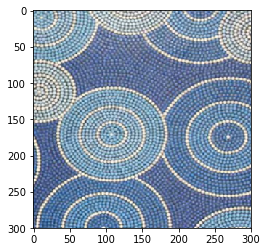

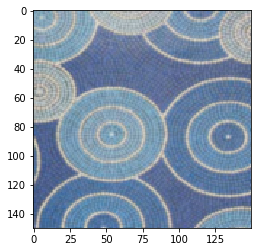

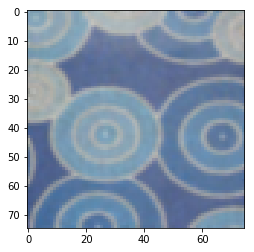

In [23]:
pyramid_height = 2

transform = transforms.Compose([
    transforms.RandomResizedCrop(300),
    transforms.ToTensor(),
])

example_texture = img.image_loader("data/original/rings-2.jpg", transform)
example_pyr = pyramid.pyramid_from(example_texture, pyramid_height)
pyramid.show_pyramid(example_pyr)

In [24]:
def texture_loss_fn(target_grams, sample_features):
    sample_grams = [stats.gram_matrix(feature) for feature in sample_features]
    print(len(sample_grams[0]))
    loss = 0
    
    for i in range(len(sample_grams)):
        loss += F.mse_loss(sample_grams[i], target_grams[i])
    
    return loss * 1000000

collector = loss.LossCollector()

for index in range(len(example_pyr)):
    vgg(example_pyr[index])
    target = stats.extract_features(hook_bag.get_hook("texture_hooks"), stats.gram_matrix)
    print(len(target[0]))
    level_loss = loss.LossFn(target, hook_bag.get_hook("texture_hooks"), texture_loss_fn)
    collector.add_loss_fn("level-{}".format(index), level_loss)

64
64
64


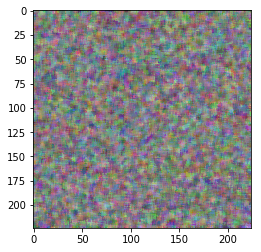

In [28]:
sample_texture = img.random_image(5, 224)
img.show_image(sample_texture)

inputs = {
    "input": sample_texture,
    "pyramid": True,
    "loss_name": "level",
    "pyr_height": pyramid_height
}

optimizer = optim.LBFGS([sample_texture])

In [29]:
stepper = closure.Stepper(inputs, vgg, collector, optimizer)

In [30]:
for i in range(128):
    optimizer.step(stepper.loss_fn)

img.save_image(sample_texture, "data/synth/rings-multi.jpg")

{'sample-0': (tensor([[[[0.5079, 0.5079, 0.5250,  ..., 0.3780, 0.3780, 0.3780],
          [0.5079, 0.5079, 0.5427,  ..., 0.3780, 0.3780, 0.3780],
          [0.4761, 0.5079, 0.5079,  ..., 0.5035, 0.6086, 0.6086],
          ...,
          [0.2396, 0.2739, 0.2749,  ..., 0.6256, 0.5969, 0.6256],
          [0.2130, 0.2130, 0.2350,  ..., 0.6513, 0.5969, 0.6256],
          [0.2739, 0.2739, 0.2350,  ..., 0.6513, 0.5969, 0.7203]],

         [[0.5360, 0.4552, 0.4552,  ..., 0.6006, 0.6063, 0.5271],
          [0.7263, 0.7099, 0.5360,  ..., 0.6006, 0.6006, 0.5271],
          [0.5360, 0.4552, 0.4515,  ..., 0.6006, 0.6063, 0.5546],
          ...,
          [0.4208, 0.5006, 0.4664,  ..., 0.4251, 0.4447, 0.4251],
          [0.5918, 0.5918, 0.4882,  ..., 0.4251, 0.5207, 0.4251],
          [0.5918, 0.4882, 0.4242,  ..., 0.5207, 0.5207, 0.5207]],

         [[0.5572, 0.4821, 0.5572,  ..., 0.5034, 0.3408, 0.3408],
          [0.6532, 0.6532, 0.5572,  ..., 0.5034, 0.4890, 0.3408],
          [0.5572, 0.4821, 0

{'sample-0': (tensor([[[[0.5102, 0.5099, 0.5293,  ..., 0.3760, 0.3751, 0.3761],
          [0.5078, 0.5095, 0.5480,  ..., 0.3793, 0.3801, 0.3836],
          [0.4749, 0.5104, 0.5117,  ..., 0.5060, 0.6025, 0.6062],
          ...,
          [0.2436, 0.2821, 0.2750,  ..., 0.6263, 0.6001, 0.6258],
          [0.2156, 0.2103, 0.2290,  ..., 0.6543, 0.5991, 0.6267],
          [0.2773, 0.2763, 0.2352,  ..., 0.6542, 0.5945, 0.7179]],

         [[0.5395, 0.4575, 0.4586,  ..., 0.5986, 0.6011, 0.5241],
          [0.7260, 0.7125, 0.5420,  ..., 0.6063, 0.6055, 0.5373],
          [0.5350, 0.4599, 0.4611,  ..., 0.6083, 0.6002, 0.5519],
          ...,
          [0.4228, 0.5087, 0.4639,  ..., 0.4293, 0.4490, 0.4273],
          [0.5916, 0.5837, 0.4765,  ..., 0.4291, 0.5237, 0.4284],
          [0.5955, 0.4903, 0.4254,  ..., 0.5248, 0.5194, 0.5207]],

         [[0.5569, 0.4807, 0.5540,  ..., 0.5027, 0.3379, 0.3394],
          [0.6516, 0.6527, 0.5566,  ..., 0.5033, 0.4877, 0.3440],
          [0.5535, 0.4829, 0

{'sample-0': (tensor([[[[ 0.5393,  0.5350,  0.5487,  ...,  0.3662,  0.3618,  0.3681],
          [ 0.5160,  0.5302,  0.5646,  ...,  0.3686,  0.3803,  0.4201],
          [ 0.4607,  0.5212,  0.5011,  ...,  0.5174,  0.5834,  0.6122],
          ...,
          [ 0.2705,  0.3090,  0.2791,  ...,  0.6347,  0.6257,  0.6256],
          [ 0.2400,  0.1982,  0.1949,  ...,  0.6739,  0.6137,  0.6360],
          [ 0.2954,  0.2931,  0.2305,  ...,  0.6674,  0.5815,  0.7101]],

         [[ 0.5857,  0.4984,  0.4795,  ...,  0.5910,  0.5790,  0.5084],
          [ 0.7373,  0.7537,  0.5702,  ...,  0.6080,  0.6071,  0.5897],
          [ 0.5331,  0.5130,  0.5009,  ...,  0.6242,  0.5538,  0.5396],
          ...,
          [ 0.4479,  0.5276,  0.4453,  ...,  0.4513,  0.4791,  0.4294],
          [ 0.6071,  0.5422,  0.4090,  ...,  0.4469,  0.5357,  0.4420],
          [ 0.6137,  0.5053,  0.4211,  ...,  0.5357,  0.5090,  0.5229]],

         [[ 0.5651,  0.4833,  0.5385,  ...,  0.5068,  0.3293,  0.3335],
          [ 0.64

{'sample-0': (tensor([[[[ 0.5499,  0.5407,  0.5514,  ...,  0.3631,  0.3580,  0.3649],
          [ 0.5216,  0.5299,  0.5585,  ...,  0.3698,  0.3780,  0.4202],
          [ 0.4552,  0.5183,  0.4857,  ...,  0.5168,  0.5849,  0.6142],
          ...,
          [ 0.2763,  0.3073,  0.2799,  ...,  0.6393,  0.6303,  0.6241],
          [ 0.2453,  0.2006,  0.1918,  ...,  0.6905,  0.6163,  0.6366],
          [ 0.3009,  0.2976,  0.2340,  ...,  0.6800,  0.5845,  0.7150]],

         [[ 0.5967,  0.5083,  0.4896,  ...,  0.5843,  0.5694,  0.4981],
          [ 0.7445,  0.7598,  0.5790,  ...,  0.6100,  0.6033,  0.5864],
          [ 0.5347,  0.5276,  0.5153,  ...,  0.6189,  0.5523,  0.5370],
          ...,
          [ 0.4556,  0.5239,  0.4482,  ...,  0.4562,  0.4819,  0.4247],
          [ 0.6144,  0.5445,  0.3987,  ...,  0.4594,  0.5370,  0.4420],
          [ 0.6192,  0.5071,  0.4193,  ...,  0.5408,  0.5110,  0.5293]],

         [[ 0.5631,  0.4826,  0.5384,  ...,  0.5046,  0.3255,  0.3297],
          [ 0.64

{'sample-0': (tensor([[[[ 0.5710,  0.5505,  0.5589,  ...,  0.3532,  0.3528,  0.3638],
          [ 0.5359,  0.5256,  0.5380,  ...,  0.3766,  0.3881,  0.4183],
          [ 0.4443,  0.5105,  0.4608,  ...,  0.5069,  0.5915,  0.6134],
          ...,
          [ 0.2800,  0.3064,  0.2954,  ...,  0.6479,  0.6355,  0.6255],
          [ 0.2483,  0.2039,  0.1993,  ...,  0.7165,  0.6185,  0.6364],
          [ 0.3076,  0.3023,  0.2414,  ...,  0.7028,  0.5943,  0.7279]],

         [[ 0.6074,  0.5142,  0.5001,  ...,  0.5684,  0.5528,  0.4861],
          [ 0.7495,  0.7534,  0.5740,  ...,  0.6190,  0.6128,  0.5773],
          [ 0.5261,  0.5460,  0.5382,  ...,  0.5982,  0.5620,  0.5344],
          ...,
          [ 0.4622,  0.5220,  0.4728,  ...,  0.4527,  0.4809,  0.4190],
          [ 0.6225,  0.5527,  0.4050,  ...,  0.4700,  0.5363,  0.4391],
          [ 0.6253,  0.5070,  0.4166,  ...,  0.5446,  0.5161,  0.5400]],

         [[ 0.5522,  0.4730,  0.5353,  ...,  0.5032,  0.3205,  0.3263],
          [ 0.62

{'sample-0': (tensor([[[[ 0.5882,  0.5597,  0.5683,  ...,  0.3506,  0.3522,  0.3665],
          [ 0.5453,  0.5256,  0.5304,  ...,  0.3829,  0.3976,  0.4211],
          [ 0.4388,  0.5075,  0.4486,  ...,  0.5004,  0.5941,  0.6121],
          ...,
          [ 0.2792,  0.3053,  0.2983,  ...,  0.6534,  0.6392,  0.6285],
          [ 0.2486,  0.2049,  0.2012,  ...,  0.7336,  0.6207,  0.6379],
          [ 0.3096,  0.3042,  0.2441,  ...,  0.7174,  0.6012,  0.7370]],

         [[ 0.6156,  0.5152,  0.5041,  ...,  0.5598,  0.5415,  0.4808],
          [ 0.7474,  0.7454,  0.5692,  ...,  0.6239,  0.6182,  0.5752],
          [ 0.5206,  0.5582,  0.5507,  ...,  0.5863,  0.5671,  0.5330],
          ...,
          [ 0.4606,  0.5205,  0.4766,  ...,  0.4496,  0.4809,  0.4184],
          [ 0.6252,  0.5578,  0.4100,  ...,  0.4757,  0.5351,  0.4379],
          [ 0.6270,  0.5078,  0.4166,  ...,  0.5462,  0.5180,  0.5455]],

         [[ 0.5457,  0.4642,  0.5301,  ...,  0.5019,  0.3152,  0.3231],
          [ 0.61

{'sample-0': (tensor([[[[ 0.6087,  0.5699,  0.5804,  ...,  0.3510,  0.3525,  0.3723],
          [ 0.5557,  0.5276,  0.5282,  ...,  0.3925,  0.4131,  0.4241],
          [ 0.4364,  0.5076,  0.4441,  ...,  0.4925,  0.5976,  0.6111],
          ...,
          [ 0.2712,  0.3012,  0.2955,  ...,  0.6553,  0.6372,  0.6275],
          [ 0.2446,  0.2038,  0.2005,  ...,  0.7474,  0.6196,  0.6366],
          [ 0.3067,  0.3018,  0.2452,  ...,  0.7263,  0.6049,  0.7442]],

         [[ 0.6206,  0.5090,  0.5009,  ...,  0.5491,  0.5252,  0.4746],
          [ 0.7394,  0.7311,  0.5619,  ...,  0.6255,  0.6238,  0.5684],
          [ 0.5124,  0.5646,  0.5561,  ...,  0.5669,  0.5694,  0.5300],
          ...,
          [ 0.4510,  0.5208,  0.4792,  ...,  0.4448,  0.4776,  0.4170],
          [ 0.6258,  0.5651,  0.4171,  ...,  0.4810,  0.5312,  0.4355],
          [ 0.6252,  0.5048,  0.4157,  ...,  0.5450,  0.5161,  0.5493]],

         [[ 0.5371,  0.4517,  0.5210,  ...,  0.4972,  0.3056,  0.3175],
          [ 0.60

{'sample-0': (tensor([[[[ 0.6277,  0.5779,  0.5915,  ...,  0.3513,  0.3514,  0.3764],
          [ 0.5640,  0.5284,  0.5289,  ...,  0.4037,  0.4270,  0.4256],
          [ 0.4334,  0.5070,  0.4417,  ...,  0.4885,  0.5983,  0.6114],
          ...,
          [ 0.2598,  0.2958,  0.2899,  ...,  0.6518,  0.6291,  0.6205],
          [ 0.2399,  0.2009,  0.1981,  ...,  0.7553,  0.6145,  0.6317],
          [ 0.3019,  0.2975,  0.2462,  ...,  0.7280,  0.6038,  0.7476]],

         [[ 0.6245,  0.5008,  0.4963,  ...,  0.5355,  0.5056,  0.4644],
          [ 0.7302,  0.7161,  0.5577,  ...,  0.6252,  0.6265,  0.5593],
          [ 0.5047,  0.5675,  0.5563,  ...,  0.5446,  0.5621,  0.5255],
          ...,
          [ 0.4396,  0.5225,  0.4821,  ...,  0.4436,  0.4726,  0.4138],
          [ 0.6281,  0.5715,  0.4224,  ...,  0.4889,  0.5256,  0.4311],
          [ 0.6236,  0.5000,  0.4143,  ...,  0.5416,  0.5107,  0.5514]],

         [[ 0.5301,  0.4407,  0.5129,  ...,  0.4904,  0.2940,  0.3093],
          [ 0.59

{'sample-0': (tensor([[[[ 0.6407,  0.5827,  0.6003,  ...,  0.3527,  0.3496,  0.3795],
          [ 0.5680,  0.5282,  0.5316,  ...,  0.4103,  0.4336,  0.4268],
          [ 0.4302,  0.5056,  0.4410,  ...,  0.4865,  0.5928,  0.6109],
          ...,
          [ 0.2508,  0.2918,  0.2862,  ...,  0.6459,  0.6203,  0.6131],
          [ 0.2371,  0.1974,  0.1945,  ...,  0.7566,  0.6085,  0.6267],
          [ 0.2979,  0.2941,  0.2473,  ...,  0.7248,  0.6000,  0.7478]],

         [[ 0.6295,  0.4963,  0.4957,  ...,  0.5244,  0.4897,  0.4562],
          [ 0.7232,  0.7063,  0.5590,  ...,  0.6210,  0.6260,  0.5547],
          [ 0.5002,  0.5690,  0.5574,  ...,  0.5300,  0.5489,  0.5218],
          ...,
          [ 0.4327,  0.5258,  0.4878,  ...,  0.4463,  0.4697,  0.4116],
          [ 0.6326,  0.5753,  0.4248,  ...,  0.4962,  0.5209,  0.4272],
          [ 0.6249,  0.4985,  0.4159,  ...,  0.5378,  0.5042,  0.5511]],

         [[ 0.5279,  0.4352,  0.5094,  ...,  0.4832,  0.2841,  0.3017],
          [ 0.58

{'sample-0': (tensor([[[[ 0.6445,  0.5833,  0.6050,  ...,  0.3552,  0.3482,  0.3814],
          [ 0.5675,  0.5275,  0.5362,  ...,  0.4105,  0.4341,  0.4269],
          [ 0.4296,  0.5048,  0.4436,  ...,  0.4855,  0.5855,  0.6092],
          ...,
          [ 0.2458,  0.2902,  0.2848,  ...,  0.6397,  0.6128,  0.6076],
          [ 0.2353,  0.1952,  0.1922,  ...,  0.7515,  0.6027,  0.6223],
          [ 0.2948,  0.2918,  0.2482,  ...,  0.7181,  0.5951,  0.7451]],

         [[ 0.6315,  0.4939,  0.4972,  ...,  0.5193,  0.4819,  0.4531],
          [ 0.7183,  0.7006,  0.5623,  ...,  0.6127,  0.6230,  0.5527],
          [ 0.4986,  0.5651,  0.5552,  ...,  0.5267,  0.5405,  0.5204],
          ...,
          [ 0.4291,  0.5291,  0.4929,  ...,  0.4501,  0.4687,  0.4118],
          [ 0.6347,  0.5768,  0.4264,  ...,  0.5000,  0.5181,  0.4248],
          [ 0.6257,  0.4984,  0.4190,  ...,  0.5353,  0.4994,  0.5493]],

         [[ 0.5297,  0.4350,  0.5109,  ...,  0.4785,  0.2792,  0.2975],
          [ 0.58

{'sample-0': (tensor([[[[ 0.6456,  0.5835,  0.6070,  ...,  0.3563,  0.3483,  0.3825],
          [ 0.5673,  0.5275,  0.5379,  ...,  0.4095,  0.4346,  0.4278],
          [ 0.4293,  0.5043,  0.4435,  ...,  0.4856,  0.5839,  0.6090],
          ...,
          [ 0.2453,  0.2904,  0.2855,  ...,  0.6375,  0.6105,  0.6059],
          [ 0.2352,  0.1950,  0.1919,  ...,  0.7497,  0.6010,  0.6208],
          [ 0.2944,  0.2918,  0.2491,  ...,  0.7161,  0.5933,  0.7439]],

         [[ 0.6328,  0.4940,  0.4989,  ...,  0.5179,  0.4798,  0.4523],
          [ 0.7171,  0.6994,  0.5639,  ...,  0.6081,  0.6216,  0.5522],
          [ 0.4986,  0.5639,  0.5544,  ...,  0.5268,  0.5392,  0.5201],
          ...,
          [ 0.4282,  0.5296,  0.4939,  ...,  0.4517,  0.4691,  0.4124],
          [ 0.6351,  0.5767,  0.4261,  ...,  0.5016,  0.5178,  0.4242],
          [ 0.6259,  0.4987,  0.4202,  ...,  0.5349,  0.4981,  0.5490]],

         [[ 0.5309,  0.4356,  0.5124,  ...,  0.4773,  0.2778,  0.2961],
          [ 0.58

{'sample-0': (tensor([[[[ 0.6524,  0.5851,  0.6139,  ...,  0.3598,  0.3491,  0.3870],
          [ 0.5680,  0.5273,  0.5441,  ...,  0.4109,  0.4389,  0.4302],
          [ 0.4282,  0.5030,  0.4442,  ...,  0.4869,  0.5793,  0.6094],
          ...,
          [ 0.2399,  0.2894,  0.2849,  ...,  0.6282,  0.6006,  0.5985],
          [ 0.2336,  0.1936,  0.1902,  ...,  0.7446,  0.5943,  0.6150],
          [ 0.2916,  0.2905,  0.2519,  ...,  0.7092,  0.5876,  0.7411]],

         [[ 0.6362,  0.4906,  0.5001,  ...,  0.5103,  0.4691,  0.4474],
          [ 0.7107,  0.6913,  0.5675,  ...,  0.5957,  0.6162,  0.5476],
          [ 0.4961,  0.5593,  0.5495,  ...,  0.5209,  0.5304,  0.5185],
          ...,
          [ 0.4226,  0.5325,  0.4975,  ...,  0.4562,  0.4685,  0.4131],
          [ 0.6378,  0.5792,  0.4271,  ...,  0.5077,  0.5152,  0.4212],
          [ 0.6273,  0.4993,  0.4241,  ...,  0.5319,  0.4924,  0.5478]],

         [[ 0.5325,  0.4346,  0.5139,  ...,  0.4715,  0.2701,  0.2891],
          [ 0.58

{'sample-0': (tensor([[[[ 0.6548,  0.5844,  0.6173,  ...,  0.3639,  0.3515,  0.3916],
          [ 0.5665,  0.5265,  0.5503,  ...,  0.4109,  0.4403,  0.4330],
          [ 0.4281,  0.5010,  0.4444,  ...,  0.4902,  0.5750,  0.6114],
          ...,
          [ 0.2373,  0.2900,  0.2863,  ...,  0.6162,  0.5904,  0.5906],
          [ 0.2333,  0.1932,  0.1899,  ...,  0.7356,  0.5874,  0.6089],
          [ 0.2896,  0.2904,  0.2556,  ...,  0.7006,  0.5807,  0.7368]],

         [[ 0.6377,  0.4881,  0.5008,  ...,  0.5039,  0.4613,  0.4436],
          [ 0.7049,  0.6849,  0.5717,  ...,  0.5811,  0.6072,  0.5439],
          [ 0.4946,  0.5511,  0.5419,  ...,  0.5169,  0.5201,  0.5176],
          ...,
          [ 0.4208,  0.5359,  0.5018,  ...,  0.4625,  0.4703,  0.4149],
          [ 0.6417,  0.5811,  0.4275,  ...,  0.5131,  0.5141,  0.4188],
          [ 0.6308,  0.5024,  0.4303,  ...,  0.5292,  0.4867,  0.5462]],

         [[ 0.5359,  0.4366,  0.5179,  ...,  0.4655,  0.2630,  0.2818],
          [ 0.58

{'sample-0': (tensor([[[[ 0.6593,  0.5851,  0.6209,  ...,  0.3689,  0.3546,  0.3978],
          [ 0.5667,  0.5260,  0.5546,  ...,  0.4116,  0.4430,  0.4370],
          [ 0.4296,  0.4983,  0.4436,  ...,  0.4933,  0.5713,  0.6142],
          ...,
          [ 0.2347,  0.2906,  0.2888,  ...,  0.6012,  0.5799,  0.5821],
          [ 0.2326,  0.1936,  0.1922,  ...,  0.7271,  0.5803,  0.6023],
          [ 0.2867,  0.2904,  0.2604,  ...,  0.6940,  0.5740,  0.7335]],

         [[ 0.6377,  0.4835,  0.4984,  ...,  0.4956,  0.4503,  0.4383],
          [ 0.6966,  0.6735,  0.5705,  ...,  0.5647,  0.5963,  0.5394],
          [ 0.4914,  0.5399,  0.5328,  ...,  0.5093,  0.5074,  0.5152],
          ...,
          [ 0.4196,  0.5389,  0.5060,  ...,  0.4708,  0.4754,  0.4171],
          [ 0.6465,  0.5844,  0.4309,  ...,  0.5204,  0.5136,  0.4162],
          [ 0.6355,  0.5068,  0.4387,  ...,  0.5272,  0.4801,  0.5454]],

         [[ 0.5376,  0.4373,  0.5210,  ...,  0.4573,  0.2527,  0.2722],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6600,  0.5851,  0.6219,  ...,  0.3708,  0.3557,  0.3998],
          [ 0.5665,  0.5261,  0.5563,  ...,  0.4116,  0.4435,  0.4384],
          [ 0.4302,  0.4979,  0.4443,  ...,  0.4946,  0.5707,  0.6154],
          ...,
          [ 0.2343,  0.2910,  0.2896,  ...,  0.5959,  0.5769,  0.5796],
          [ 0.2324,  0.1938,  0.1936,  ...,  0.7240,  0.5784,  0.6004],
          [ 0.2856,  0.2903,  0.2617,  ...,  0.6921,  0.5720,  0.7323]],

         [[ 0.6365,  0.4814,  0.4964,  ...,  0.4939,  0.4475,  0.4372],
          [ 0.6933,  0.6694,  0.5683,  ...,  0.5598,  0.5927,  0.5386],
          [ 0.4897,  0.5356,  0.5288,  ...,  0.5073,  0.5036,  0.5145],
          ...,
          [ 0.4199,  0.5396,  0.5064,  ...,  0.4739,  0.4781,  0.4182],
          [ 0.6478,  0.5852,  0.4327,  ...,  0.5227,  0.5140,  0.4158],
          [ 0.6371,  0.5086,  0.4419,  ...,  0.5273,  0.4784,  0.5452]],

         [[ 0.5378,  0.4375,  0.5216,  ...,  0.4547,  0.2495,  0.2693],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6590,  0.5835,  0.6241,  ...,  0.3777,  0.3589,  0.4046],
          [ 0.5636,  0.5259,  0.5637,  ...,  0.4119,  0.4414,  0.4410],
          [ 0.4334,  0.4977,  0.4494,  ...,  0.5006,  0.5665,  0.6187],
          ...,
          [ 0.2344,  0.2931,  0.2934,  ...,  0.5776,  0.5663,  0.5715],
          [ 0.2319,  0.1953,  0.1991,  ...,  0.7107,  0.5718,  0.5944],
          [ 0.2816,  0.2904,  0.2668,  ...,  0.6838,  0.5643,  0.7273]],

         [[ 0.6305,  0.4743,  0.4900,  ...,  0.4903,  0.4409,  0.4347],
          [ 0.6818,  0.6570,  0.5631,  ...,  0.5451,  0.5799,  0.5369],
          [ 0.4849,  0.5199,  0.5146,  ...,  0.5044,  0.4903,  0.5135],
          ...,
          [ 0.4235,  0.5427,  0.5090,  ...,  0.4860,  0.4873,  0.4225],
          [ 0.6536,  0.5883,  0.4392,  ...,  0.5300,  0.5158,  0.4143],
          [ 0.6442,  0.5169,  0.4552,  ...,  0.5274,  0.4717,  0.5433]],

         [[ 0.5403,  0.4401,  0.5256,  ...,  0.4457,  0.2400,  0.2603],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6586,  0.5838,  0.6234,  ...,  0.3767,  0.3583,  0.4031],
          [ 0.5640,  0.5262,  0.5623,  ...,  0.4129,  0.4405,  0.4399],
          [ 0.4338,  0.4984,  0.4496,  ...,  0.5004,  0.5674,  0.6185],
          ...,
          [ 0.2358,  0.2934,  0.2939,  ...,  0.5798,  0.5687,  0.5734],
          [ 0.2323,  0.1959,  0.2003,  ...,  0.7126,  0.5735,  0.5960],
          [ 0.2822,  0.2909,  0.2667,  ...,  0.6864,  0.5660,  0.7286]],

         [[ 0.6294,  0.4745,  0.4894,  ...,  0.4918,  0.4430,  0.4355],
          [ 0.6822,  0.6577,  0.5613,  ...,  0.5496,  0.5816,  0.5378],
          [ 0.4846,  0.5213,  0.5159,  ...,  0.5054,  0.4925,  0.5140],
          ...,
          [ 0.4255,  0.5422,  0.5084,  ...,  0.4851,  0.4877,  0.4222],
          [ 0.6537,  0.5886,  0.4401,  ...,  0.5288,  0.5162,  0.4148],
          [ 0.6446,  0.5177,  0.4554,  ...,  0.5283,  0.4727,  0.5437]],

         [[ 0.5393,  0.4397,  0.5248,  ...,  0.4466,  0.2414,  0.2618],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6602,  0.5846,  0.6255,  ...,  0.3805,  0.3594,  0.4045],
          [ 0.5636,  0.5261,  0.5658,  ...,  0.4167,  0.4394,  0.4400],
          [ 0.4362,  0.4990,  0.4523,  ...,  0.5040,  0.5655,  0.6207],
          ...,
          [ 0.2378,  0.2952,  0.2985,  ...,  0.5692,  0.5635,  0.5694],
          [ 0.2328,  0.1983,  0.2068,  ...,  0.7067,  0.5703,  0.5934],
          [ 0.2802,  0.2924,  0.2719,  ...,  0.6855,  0.5624,  0.7277]],

         [[ 0.6234,  0.4688,  0.4837,  ...,  0.4888,  0.4381,  0.4329],
          [ 0.6719,  0.6466,  0.5546,  ...,  0.5448,  0.5750,  0.5364],
          [ 0.4788,  0.5116,  0.5071,  ...,  0.5017,  0.4856,  0.5142],
          ...,
          [ 0.4326,  0.5451,  0.5134,  ...,  0.4931,  0.4951,  0.4243],
          [ 0.6607,  0.5937,  0.4491,  ...,  0.5330,  0.5168,  0.4132],
          [ 0.6531,  0.5272,  0.4685,  ...,  0.5287,  0.4669,  0.5423]],

         [[ 0.5390,  0.4404,  0.5266,  ...,  0.4398,  0.2347,  0.2560],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6610,  0.5851,  0.6264,  ...,  0.3819,  0.3595,  0.4042],
          [ 0.5633,  0.5260,  0.5676,  ...,  0.4189,  0.4387,  0.4393],
          [ 0.4375,  0.4994,  0.4536,  ...,  0.5053,  0.5645,  0.6216],
          ...,
          [ 0.2398,  0.2965,  0.3019,  ...,  0.5650,  0.5613,  0.5677],
          [ 0.2336,  0.2000,  0.2107,  ...,  0.7040,  0.5687,  0.5923],
          [ 0.2798,  0.2936,  0.2751,  ...,  0.6854,  0.5603,  0.7272]],

         [[ 0.6191,  0.4654,  0.4803,  ...,  0.4876,  0.4362,  0.4319],
          [ 0.6656,  0.6404,  0.5510,  ...,  0.5428,  0.5723,  0.5359],
          [ 0.4749,  0.5064,  0.5025,  ...,  0.5004,  0.4832,  0.5149],
          ...,
          [ 0.4384,  0.5476,  0.5179,  ...,  0.4979,  0.4991,  0.4253],
          [ 0.6657,  0.5972,  0.4550,  ...,  0.5345,  0.5167,  0.4122],
          [ 0.6589,  0.5334,  0.4768,  ...,  0.5285,  0.4630,  0.5408]],

         [[ 0.5389,  0.4411,  0.5280,  ...,  0.4370,  0.2319,  0.2538],
          [ 0.57

{'sample-0': (tensor([[[[ 6.6066e-01,  5.8509e-01,  6.2667e-01,  ...,  3.8308e-01,
            3.5963e-01,  4.0377e-01],
          [ 5.6217e-01,  5.2572e-01,  5.7029e-01,  ...,  4.1971e-01,
            4.3679e-01,  4.3872e-01],
          [ 4.3968e-01,  5.0000e-01,  4.5575e-01,  ...,  5.0726e-01,
            5.6245e-01,  6.2247e-01],
          ...,
          [ 2.4192e-01,  2.9816e-01,  3.0550e-01,  ...,  5.6019e-01,
            5.5790e-01,  5.6510e-01],
          [ 2.3471e-01,  2.0178e-01,  2.1462e-01,  ...,  6.9958e-01,
            5.6598e-01,  5.9042e-01],
          [ 2.7911e-01,  2.9479e-01,  2.7847e-01,  ...,  6.8296e-01,
            5.5642e-01,  7.2500e-01]],

         [[ 6.1248e-01,  4.6032e-01,  4.7522e-01,  ...,  4.8654e-01,
            4.3477e-01,  4.3091e-01],
          [ 6.5726e-01,  6.3310e-01,  5.4746e-01,  ...,  5.3929e-01,
            5.6813e-01,  5.3537e-01],
          [ 4.6974e-01,  4.9836e-01,  4.9567e-01,  ...,  5.0040e-01,
            4.8036e-01,  5.1566e-01],
      

{'sample-0': (tensor([[[[ 0.6611,  0.5857,  0.6268,  ...,  0.3834,  0.3593,  0.4023],
          [ 0.5617,  0.5255,  0.5716,  ...,  0.4227,  0.4353,  0.4372],
          [ 0.4419,  0.5010,  0.4571,  ...,  0.5097,  0.5617,  0.6236],
          ...,
          [ 0.2448,  0.2997,  0.3097,  ...,  0.5570,  0.5559,  0.5636],
          [ 0.2362,  0.2041,  0.2196,  ...,  0.6972,  0.5643,  0.5896],
          [ 0.2789,  0.2966,  0.2825,  ...,  0.6829,  0.5537,  0.7243]],

         [[ 0.6045,  0.4546,  0.4691,  ...,  0.4850,  0.4332,  0.4294],
          [ 0.6480,  0.6251,  0.5420,  ...,  0.5385,  0.5645,  0.5343],
          [ 0.4632,  0.4910,  0.4886,  ...,  0.4987,  0.4779,  0.5166],
          ...,
          [ 0.4529,  0.5536,  0.5272,  ...,  0.5123,  0.5088,  0.4291],
          [ 0.6777,  0.6051,  0.4678,  ...,  0.5405,  0.5178,  0.4110],
          [ 0.6728,  0.5480,  0.4963,  ...,  0.5281,  0.4537,  0.5369]],

         [[ 0.5389,  0.4437,  0.5322,  ...,  0.4319,  0.2272,  0.2498],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6618,  0.5866,  0.6267,  ...,  0.3830,  0.3586,  0.3998],
          [ 0.5615,  0.5253,  0.5717,  ...,  0.4265,  0.4334,  0.4351],
          [ 0.4442,  0.5023,  0.4577,  ...,  0.5129,  0.5612,  0.6244],
          ...,
          [ 0.2480,  0.3011,  0.3140,  ...,  0.5557,  0.5554,  0.5631],
          [ 0.2377,  0.2066,  0.2250,  ...,  0.6963,  0.5632,  0.5897],
          [ 0.2787,  0.2983,  0.2864,  ...,  0.6840,  0.5513,  0.7246]],

         [[ 0.5956,  0.4488,  0.4631,  ...,  0.4833,  0.4316,  0.4274],
          [ 0.6383,  0.6171,  0.5357,  ...,  0.5391,  0.5607,  0.5328],
          [ 0.4558,  0.4838,  0.4814,  ...,  0.4967,  0.4755,  0.5173],
          ...,
          [ 0.4619,  0.5571,  0.5326,  ...,  0.5195,  0.5141,  0.4306],
          [ 0.6845,  0.6101,  0.4758,  ...,  0.5438,  0.5185,  0.4108],
          [ 0.6805,  0.5560,  0.5065,  ...,  0.5283,  0.4491,  0.5356]],

         [[ 0.5379,  0.4445,  0.5342,  ...,  0.4298,  0.2253,  0.2483],
          [ 0.57

{'sample-0': (tensor([[[[ 6.6139e-01,  5.8668e-01,  6.2659e-01,  ...,  3.8375e-01,
            3.5844e-01,  3.9883e-01],
          [ 5.6056e-01,  5.2500e-01,  5.7236e-01,  ...,  4.2825e-01,
            4.3153e-01,  4.3403e-01],
          [ 4.4578e-01,  5.0298e-01,  4.5853e-01,  ...,  5.1590e-01,
            5.5993e-01,  6.2503e-01],
          ...,
          [ 2.5023e-01,  3.0255e-01,  3.1734e-01,  ...,  5.5266e-01,
            5.5386e-01,  5.6177e-01],
          [ 2.3868e-01,  2.0836e-01,  2.2906e-01,  ...,  6.9348e-01,
            5.6158e-01,  5.8893e-01],
          [ 2.7829e-01,  2.9956e-01,  2.8955e-01,  ...,  6.8317e-01,
            5.4853e-01,  7.2391e-01]],

         [[ 5.8960e-01,  4.4493e-01,  4.5961e-01,  ...,  4.8203e-01,
            4.3006e-01,  4.2601e-01],
          [ 6.3104e-01,  6.1123e-01,  5.3151e-01,  ...,  5.3697e-01,
            5.5652e-01,  5.3177e-01],
          [ 4.5097e-01,  4.7745e-01,  4.7538e-01,  ...,  4.9607e-01,
            4.7257e-01,  5.1773e-01],
      

{'sample-0': (tensor([[[[ 0.6614,  0.5869,  0.6263,  ...,  0.3838,  0.3575,  0.3972],
          [ 0.5595,  0.5243,  0.5720,  ...,  0.4304,  0.4297,  0.4324],
          [ 0.4470,  0.5034,  0.4581,  ...,  0.5185,  0.5586,  0.6254],
          ...,
          [ 0.2525,  0.3038,  0.3210,  ...,  0.5505,  0.5523,  0.5603],
          [ 0.2401,  0.2104,  0.2333,  ...,  0.6914,  0.5596,  0.5881],
          [ 0.2782,  0.3014,  0.2936,  ...,  0.6826,  0.5454,  0.7234]],

         [[ 0.5824,  0.4402,  0.4557,  ...,  0.4798,  0.4274,  0.4238],
          [ 0.6223,  0.6045,  0.5273,  ...,  0.5351,  0.5525,  0.5301],
          [ 0.4448,  0.4709,  0.4689,  ...,  0.4947,  0.4703,  0.5184],
          ...,
          [ 0.4753,  0.5633,  0.5413,  ...,  0.5315,  0.5229,  0.4334],
          [ 0.6955,  0.6180,  0.4876,  ...,  0.5500,  0.5202,  0.4108],
          [ 0.6931,  0.5696,  0.5240,  ...,  0.5289,  0.4411,  0.5338]],

         [[ 0.5381,  0.4472,  0.5397,  ...,  0.4247,  0.2207,  0.2443],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6607,  0.5867,  0.6249,  ...,  0.3831,  0.3560,  0.3947],
          [ 0.5581,  0.5233,  0.5703,  ...,  0.4327,  0.4275,  0.4299],
          [ 0.4479,  0.5036,  0.4564,  ...,  0.5213,  0.5578,  0.6251],
          ...,
          [ 0.2552,  0.3052,  0.3251,  ...,  0.5501,  0.5510,  0.5589],
          [ 0.2420,  0.2129,  0.2384,  ...,  0.6901,  0.5575,  0.5875],
          [ 0.2787,  0.3038,  0.2984,  ...,  0.6818,  0.5417,  0.7228]],

         [[ 0.5725,  0.4342,  0.4508,  ...,  0.4772,  0.4248,  0.4216],
          [ 0.6116,  0.5969,  0.5227,  ...,  0.5338,  0.5486,  0.5279],
          [ 0.4370,  0.4637,  0.4615,  ...,  0.4932,  0.4695,  0.5194],
          ...,
          [ 0.4843,  0.5676,  0.5473,  ...,  0.5378,  0.5269,  0.4346],
          [ 0.7032,  0.6238,  0.4954,  ...,  0.5541,  0.5215,  0.4116],
          [ 0.7016,  0.5785,  0.5351,  ...,  0.5296,  0.4369,  0.5331]],

         [[ 0.5370,  0.4480,  0.5427,  ...,  0.4225,  0.2188,  0.2429],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6596,  0.5863,  0.6238,  ...,  0.3831,  0.3557,  0.3934],
          [ 0.5572,  0.5227,  0.5691,  ...,  0.4341,  0.4262,  0.4280],
          [ 0.4486,  0.5038,  0.4555,  ...,  0.5235,  0.5585,  0.6249],
          ...,
          [ 0.2570,  0.3062,  0.3280,  ...,  0.5494,  0.5502,  0.5579],
          [ 0.2433,  0.2146,  0.2422,  ...,  0.6889,  0.5562,  0.5870],
          [ 0.2792,  0.3054,  0.3013,  ...,  0.6810,  0.5395,  0.7220]],

         [[ 0.5660,  0.4306,  0.4476,  ...,  0.4766,  0.4245,  0.4211],
          [ 0.6053,  0.5926,  0.5192,  ...,  0.5330,  0.5463,  0.5265],
          [ 0.4326,  0.4595,  0.4575,  ...,  0.4920,  0.4695,  0.5197],
          ...,
          [ 0.4895,  0.5696,  0.5504,  ...,  0.5408,  0.5290,  0.4351],
          [ 0.7074,  0.6267,  0.5004,  ...,  0.5563,  0.5228,  0.4127],
          [ 0.7064,  0.5835,  0.5417,  ...,  0.5305,  0.4355,  0.5332]],

         [[ 0.5358,  0.4481,  0.5436,  ...,  0.4215,  0.2182,  0.2426],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6590,  0.5862,  0.6229,  ...,  0.3832,  0.3551,  0.3914],
          [ 0.5557,  0.5217,  0.5678,  ...,  0.4374,  0.4241,  0.4252],
          [ 0.4501,  0.5041,  0.4542,  ...,  0.5275,  0.5579,  0.6251],
          ...,
          [ 0.2599,  0.3079,  0.3334,  ...,  0.5464,  0.5476,  0.5551],
          [ 0.2452,  0.2173,  0.2483,  ...,  0.6862,  0.5533,  0.5854],
          [ 0.2794,  0.3080,  0.3069,  ...,  0.6796,  0.5349,  0.7203]],

         [[ 0.5546,  0.4236,  0.4416,  ...,  0.4744,  0.4225,  0.4193],
          [ 0.5928,  0.5835,  0.5129,  ...,  0.5315,  0.5413,  0.5236],
          [ 0.4240,  0.4509,  0.4491,  ...,  0.4902,  0.4673,  0.5205],
          ...,
          [ 0.4981,  0.5735,  0.5566,  ...,  0.5471,  0.5334,  0.4364],
          [ 0.7148,  0.6320,  0.5087,  ...,  0.5608,  0.5247,  0.4137],
          [ 0.7147,  0.5924,  0.5535,  ...,  0.5318,  0.4315,  0.5329]],

         [[ 0.5346,  0.4489,  0.5461,  ...,  0.4189,  0.2161,  0.2410],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6562,  0.5843,  0.6202,  ...,  0.3836,  0.3548,  0.3891],
          [ 0.5525,  0.5196,  0.5655,  ...,  0.4412,  0.4210,  0.4206],
          [ 0.4508,  0.5033,  0.4515,  ...,  0.5321,  0.5565,  0.6242],
          ...,
          [ 0.2625,  0.3096,  0.3399,  ...,  0.5411,  0.5423,  0.5492],
          [ 0.2474,  0.2199,  0.2548,  ...,  0.6810,  0.5479,  0.5811],
          [ 0.2799,  0.3110,  0.3131,  ...,  0.6747,  0.5272,  0.7151]],

         [[ 0.5386,  0.4140,  0.4329,  ...,  0.4725,  0.4215,  0.4183],
          [ 0.5766,  0.5727,  0.5056,  ...,  0.5303,  0.5359,  0.5196],
          [ 0.4131,  0.4405,  0.4396,  ...,  0.4897,  0.4656,  0.5216],
          ...,
          [ 0.5067,  0.5773,  0.5637,  ...,  0.5526,  0.5363,  0.4369],
          [ 0.7223,  0.6367,  0.5170,  ...,  0.5661,  0.5271,  0.4154],
          [ 0.7233,  0.6020,  0.5666,  ...,  0.5335,  0.4278,  0.5325]],

         [[ 0.5324,  0.4495,  0.5479,  ...,  0.4163,  0.2147,  0.2403],
          [ 0.57

{'sample-0': (tensor([[[[ 0.6529,  0.5817,  0.6165,  ...,  0.3835,  0.3543,  0.3862],
          [ 0.5491,  0.5172,  0.5619,  ...,  0.4450,  0.4182,  0.4154],
          [ 0.4504,  0.5024,  0.4484,  ...,  0.5360,  0.5558,  0.6225],
          ...,
          [ 0.2650,  0.3109,  0.3457,  ...,  0.5364,  0.5372,  0.5432],
          [ 0.2496,  0.2225,  0.2608,  ...,  0.6765,  0.5427,  0.5765],
          [ 0.2810,  0.3142,  0.3187,  ...,  0.6696,  0.5194,  0.7090]],

         [[ 0.5215,  0.4034,  0.4231,  ...,  0.4713,  0.4215,  0.4178],
          [ 0.5602,  0.5626,  0.4973,  ...,  0.5307,  0.5320,  0.5156],
          [ 0.4008,  0.4308,  0.4307,  ...,  0.4895,  0.4661,  0.5228],
          ...,
          [ 0.5152,  0.5808,  0.5700,  ...,  0.5572,  0.5390,  0.4374],
          [ 0.7298,  0.6417,  0.5248,  ...,  0.5713,  0.5301,  0.4175],
          [ 0.7322,  0.6116,  0.5790,  ...,  0.5355,  0.4251,  0.5322]],

         [[ 0.5296,  0.4494,  0.5490,  ...,  0.4145,  0.2141,  0.2405],
          [ 0.56

{'sample-0': (tensor([[[[ 0.6501,  0.5791,  0.6136,  ...,  0.3840,  0.3543,  0.3844],
          [ 0.5460,  0.5149,  0.5587,  ...,  0.4472,  0.4162,  0.4116],
          [ 0.4489,  0.5007,  0.4459,  ...,  0.5389,  0.5552,  0.6209],
          ...,
          [ 0.2664,  0.3118,  0.3498,  ...,  0.5309,  0.5316,  0.5367],
          [ 0.2517,  0.2250,  0.2652,  ...,  0.6722,  0.5375,  0.5710],
          [ 0.2826,  0.3170,  0.3232,  ...,  0.6639,  0.5121,  0.7019]],

         [[ 0.5069,  0.3939,  0.4139,  ...,  0.4706,  0.4216,  0.4175],
          [ 0.5460,  0.5541,  0.4898,  ...,  0.5296,  0.5287,  0.5123],
          [ 0.3893,  0.4223,  0.4234,  ...,  0.4898,  0.4663,  0.5233],
          ...,
          [ 0.5205,  0.5829,  0.5737,  ...,  0.5606,  0.5407,  0.4382],
          [ 0.7358,  0.6460,  0.5296,  ...,  0.5764,  0.5328,  0.4190],
          [ 0.7399,  0.6191,  0.5881,  ...,  0.5369,  0.4236,  0.5315]],

         [[ 0.5274,  0.4493,  0.5496,  ...,  0.4135,  0.2138,  0.2408],
          [ 0.56

{'sample-0': (tensor([[[[ 0.6479,  0.5772,  0.6115,  ...,  0.3844,  0.3545,  0.3833],
          [ 0.5441,  0.5135,  0.5568,  ...,  0.4481,  0.4146,  0.4093],
          [ 0.4483,  0.4995,  0.4443,  ...,  0.5404,  0.5550,  0.6198],
          ...,
          [ 0.2675,  0.3124,  0.3524,  ...,  0.5277,  0.5283,  0.5330],
          [ 0.2531,  0.2268,  0.2681,  ...,  0.6696,  0.5347,  0.5679],
          [ 0.2841,  0.3190,  0.3262,  ...,  0.6608,  0.5081,  0.6978]],

         [[ 0.4986,  0.3888,  0.4090,  ...,  0.4707,  0.4224,  0.4178],
          [ 0.5384,  0.5498,  0.4858,  ...,  0.5286,  0.5266,  0.5107],
          [ 0.3835,  0.4179,  0.4197,  ...,  0.4896,  0.4666,  0.5234],
          ...,
          [ 0.5236,  0.5837,  0.5756,  ...,  0.5623,  0.5413,  0.4384],
          [ 0.7392,  0.6485,  0.5324,  ...,  0.5787,  0.5341,  0.4197],
          [ 0.7449,  0.6239,  0.5938,  ...,  0.5376,  0.4228,  0.5308]],

         [[ 0.5261,  0.4494,  0.5499,  ...,  0.4132,  0.2140,  0.2413],
          [ 0.56

{'sample-0': (tensor([[[[ 0.6448,  0.5738,  0.6081,  ...,  0.3849,  0.3544,  0.3817],
          [ 0.5407,  0.5105,  0.5533,  ...,  0.4500,  0.4120,  0.4056],
          [ 0.4465,  0.4973,  0.4414,  ...,  0.5429,  0.5535,  0.6180],
          ...,
          [ 0.2687,  0.3129,  0.3562,  ...,  0.5217,  0.5219,  0.5260],
          [ 0.2555,  0.2296,  0.2726,  ...,  0.6652,  0.5293,  0.5619],
          [ 0.2868,  0.3226,  0.3317,  ...,  0.6551,  0.5006,  0.6903]],

         [[ 0.4839,  0.3793,  0.4003,  ...,  0.4698,  0.4222,  0.4177],
          [ 0.5242,  0.5414,  0.4788,  ...,  0.5268,  0.5225,  0.5076],
          [ 0.3726,  0.4103,  0.4135,  ...,  0.4885,  0.4653,  0.5230],
          ...,
          [ 0.5276,  0.5842,  0.5780,  ...,  0.5659,  0.5425,  0.4389],
          [ 0.7451,  0.6527,  0.5362,  ...,  0.5833,  0.5362,  0.4204],
          [ 0.7536,  0.6324,  0.6034,  ...,  0.5381,  0.4205,  0.5293]],

         [[ 0.5241,  0.4495,  0.5507,  ...,  0.4121,  0.2136,  0.2416],
          [ 0.56

{'sample-0': (tensor([[[[ 6.4255e-01,  5.7165e-01,  6.0570e-01,  ...,  3.8507e-01,
            3.5448e-01,  3.8090e-01],
          [ 5.3856e-01,  5.0854e-01,  5.5068e-01,  ...,  4.5092e-01,
            4.1077e-01,  4.0355e-01],
          [ 4.4523e-01,  4.9568e-01,  4.3947e-01,  ...,  5.4403e-01,
            5.5289e-01,  6.1700e-01],
          ...,
          [ 2.6899e-01,  3.1266e-01,  3.5737e-01,  ...,  5.1888e-01,
            5.1849e-01,  5.2204e-01],
          [ 2.5681e-01,  2.3086e-01,  2.7436e-01,  ...,  6.6298e-01,
            5.2646e-01,  5.5846e-01],
          [ 2.8845e-01,  3.2443e-01,  3.3414e-01,  ...,  6.5170e-01,
            4.9646e-01,  6.8592e-01]],

         [[ 4.7578e-01,  3.7415e-01,  3.9530e-01,  ...,  4.6915e-01,
            4.2240e-01,  4.1769e-01],
          [ 5.1686e-01,  5.3712e-01,  4.7476e-01,  ...,  5.2616e-01,
            5.2065e-01,  5.0566e-01],
          [ 3.6703e-01,  4.0668e-01,  4.1073e-01,  ...,  4.8792e-01,
            4.6475e-01,  5.2257e-01],
      

{'sample-0': (tensor([[[[ 0.6398,  0.5692,  0.6028,  ...,  0.3852,  0.3546,  0.3799],
          [ 0.5361,  0.5064,  0.5477,  ...,  0.4521,  0.4092,  0.4010],
          [ 0.4441,  0.4941,  0.4372,  ...,  0.5456,  0.5523,  0.6158],
          ...,
          [ 0.2695,  0.3127,  0.3593,  ...,  0.5157,  0.5147,  0.5176],
          [ 0.2582,  0.2323,  0.2768,  ...,  0.6603,  0.5232,  0.5547],
          [ 0.2900,  0.3265,  0.3371,  ...,  0.6479,  0.4917,  0.6810]],

         [[ 0.4662,  0.3682,  0.3896,  ...,  0.4684,  0.4227,  0.4178],
          [ 0.5082,  0.5320,  0.4702,  ...,  0.5255,  0.5184,  0.5034],
          [ 0.3608,  0.4023,  0.4072,  ...,  0.4874,  0.4644,  0.5223],
          ...,
          [ 0.5302,  0.5833,  0.5781,  ...,  0.5685,  0.5422,  0.4383],
          [ 0.7504,  0.6562,  0.5385,  ...,  0.5878,  0.5384,  0.4211],
          [ 0.7617,  0.6400,  0.6117,  ...,  0.5382,  0.4180,  0.5270]],

         [[ 0.5213,  0.4492,  0.5510,  ...,  0.4110,  0.2138,  0.2426],
          [ 0.56

{'sample-0': (tensor([[[[ 0.6321,  0.5620,  0.5948,  ...,  0.3853,  0.3549,  0.3777],
          [ 0.5297,  0.5004,  0.5399,  ...,  0.4539,  0.4051,  0.3952],
          [ 0.4404,  0.4897,  0.4324,  ...,  0.5485,  0.5502,  0.6128],
          ...,
          [ 0.2696,  0.3115,  0.3619,  ...,  0.5086,  0.5060,  0.5071],
          [ 0.2614,  0.2355,  0.2814,  ...,  0.6543,  0.5158,  0.5452],
          [ 0.2941,  0.3310,  0.3428,  ...,  0.6387,  0.4806,  0.6684]],

         [[ 0.4444,  0.3550,  0.3760,  ...,  0.4669,  0.4243,  0.4190],
          [ 0.4897,  0.5218,  0.4595,  ...,  0.5235,  0.5135,  0.4989],
          [ 0.3478,  0.3941,  0.4013,  ...,  0.4854,  0.4624,  0.5208],
          ...,
          [ 0.5296,  0.5787,  0.5735,  ...,  0.5706,  0.5403,  0.4366],
          [ 0.7543,  0.6584,  0.5381,  ...,  0.5921,  0.5405,  0.4208],
          [ 0.7692,  0.6471,  0.6182,  ...,  0.5370,  0.4148,  0.5225]],

         [[ 0.5183,  0.4496,  0.5514,  ...,  0.4102,  0.2150,  0.2448],
          [ 0.55

{'sample-0': (tensor([[[[ 0.6284,  0.5586,  0.5910,  ...,  0.3853,  0.3548,  0.3769],
          [ 0.5269,  0.4978,  0.5364,  ...,  0.4543,  0.4034,  0.3930],
          [ 0.4384,  0.4875,  0.4306,  ...,  0.5493,  0.5490,  0.6115],
          ...,
          [ 0.2690,  0.3104,  0.3622,  ...,  0.5055,  0.5024,  0.5027],
          [ 0.2626,  0.2367,  0.2829,  ...,  0.6519,  0.5128,  0.5409],
          [ 0.2958,  0.3326,  0.3448,  ...,  0.6348,  0.4761,  0.6629]],

         [[ 0.4360,  0.3499,  0.3704,  ...,  0.4662,  0.4248,  0.4194],
          [ 0.4828,  0.5182,  0.4550,  ...,  0.5223,  0.5116,  0.4973],
          [ 0.3429,  0.3915,  0.4001,  ...,  0.4841,  0.4612,  0.5200],
          ...,
          [ 0.5278,  0.5753,  0.5696,  ...,  0.5711,  0.5394,  0.4359],
          [ 0.7550,  0.6586,  0.5367,  ...,  0.5936,  0.5411,  0.4201],
          [ 0.7714,  0.6491,  0.6195,  ...,  0.5359,  0.4134,  0.5202]],

         [[ 0.5174,  0.4501,  0.5517,  ...,  0.4098,  0.2154,  0.2458],
          [ 0.55

{'sample-0': (tensor([[[[ 0.6237,  0.5543,  0.5862,  ...,  0.3854,  0.3549,  0.3758],
          [ 0.5230,  0.4942,  0.5318,  ...,  0.4552,  0.4011,  0.3901],
          [ 0.4364,  0.4847,  0.4277,  ...,  0.5504,  0.5473,  0.6099],
          ...,
          [ 0.2688,  0.3095,  0.3639,  ...,  0.5002,  0.4967,  0.4959],
          [ 0.2642,  0.2384,  0.2860,  ...,  0.6477,  0.5080,  0.5347],
          [ 0.2975,  0.3349,  0.3480,  ...,  0.6289,  0.4691,  0.6552]],

         [[ 0.4232,  0.3422,  0.3624,  ...,  0.4645,  0.4248,  0.4196],
          [ 0.4715,  0.5116,  0.4486,  ...,  0.5200,  0.5081,  0.4947],
          [ 0.3355,  0.3864,  0.3969,  ...,  0.4823,  0.4594,  0.5193],
          ...,
          [ 0.5272,  0.5723,  0.5669,  ...,  0.5727,  0.5389,  0.4350],
          [ 0.7571,  0.6597,  0.5368,  ...,  0.5964,  0.5420,  0.4192],
          [ 0.7754,  0.6530,  0.6234,  ...,  0.5347,  0.4108,  0.5173]],

         [[ 0.5162,  0.4508,  0.5526,  ...,  0.4085,  0.2153,  0.2464],
          [ 0.55

{'sample-0': (tensor([[[[ 0.6194,  0.5503,  0.5819,  ...,  0.3851,  0.3550,  0.3753],
          [ 0.5198,  0.4909,  0.5276,  ...,  0.4556,  0.3995,  0.3881],
          [ 0.4345,  0.4824,  0.4254,  ...,  0.5508,  0.5459,  0.6086],
          ...,
          [ 0.2675,  0.3080,  0.3641,  ...,  0.4967,  0.4926,  0.4906],
          [ 0.2648,  0.2390,  0.2875,  ...,  0.6448,  0.5044,  0.5295],
          [ 0.2983,  0.3358,  0.3492,  ...,  0.6240,  0.4638,  0.6487]],

         [[ 0.4140,  0.3369,  0.3568,  ...,  0.4629,  0.4250,  0.4204],
          [ 0.4641,  0.5074,  0.4440,  ...,  0.5184,  0.5060,  0.4932],
          [ 0.3313,  0.3842,  0.3965,  ...,  0.4804,  0.4577,  0.5184],
          ...,
          [ 0.5234,  0.5675,  0.5613,  ...,  0.5729,  0.5373,  0.4336],
          [ 0.7561,  0.6584,  0.5343,  ...,  0.5974,  0.5420,  0.4178],
          [ 0.7753,  0.6529,  0.6224,  ...,  0.5327,  0.4088,  0.5141]],

         [[ 0.5156,  0.4518,  0.5535,  ...,  0.4076,  0.2155,  0.2473],
          [ 0.55

{'sample-0': (tensor([[[[ 0.6116,  0.5432,  0.5742,  ...,  0.3847,  0.3553,  0.3742],
          [ 0.5139,  0.4846,  0.5195,  ...,  0.4568,  0.3968,  0.3841],
          [ 0.4311,  0.4779,  0.4209,  ...,  0.5521,  0.5435,  0.6054],
          ...,
          [ 0.2657,  0.3056,  0.3651,  ...,  0.4901,  0.4843,  0.4803],
          [ 0.2668,  0.2411,  0.2907,  ...,  0.6390,  0.4972,  0.5196],
          [ 0.3009,  0.3383,  0.3525,  ...,  0.6143,  0.4533,  0.6358]],

         [[ 0.3949,  0.3259,  0.3459,  ...,  0.4608,  0.4264,  0.4227],
          [ 0.4487,  0.4988,  0.4353,  ...,  0.5160,  0.5026,  0.4905],
          [ 0.3217,  0.3793,  0.3950,  ...,  0.4776,  0.4559,  0.5170],
          ...,
          [ 0.5174,  0.5601,  0.5531,  ...,  0.5732,  0.5339,  0.4313],
          [ 0.7556,  0.6578,  0.5307,  ...,  0.5999,  0.5426,  0.4160],
          [ 0.7771,  0.6545,  0.6226,  ...,  0.5296,  0.4058,  0.5087]],

         [[ 0.5139,  0.4530,  0.5547,  ...,  0.4066,  0.2165,  0.2497],
          [ 0.55

{'sample-0': (tensor([[[[ 0.6089,  0.5409,  0.5715,  ...,  0.3848,  0.3555,  0.3736],
          [ 0.5121,  0.4827,  0.5173,  ...,  0.4575,  0.3956,  0.3825],
          [ 0.4304,  0.4765,  0.4197,  ...,  0.5528,  0.5425,  0.6043],
          ...,
          [ 0.2658,  0.3055,  0.3661,  ...,  0.4879,  0.4817,  0.4769],
          [ 0.2678,  0.2422,  0.2923,  ...,  0.6367,  0.4948,  0.5164],
          [ 0.3021,  0.3395,  0.3541,  ...,  0.6110,  0.4498,  0.6314]],

         [[ 0.3883,  0.3221,  0.3418,  ...,  0.4608,  0.4277,  0.4240],
          [ 0.4437,  0.4960,  0.4326,  ...,  0.5157,  0.5017,  0.4899],
          [ 0.3185,  0.3771,  0.3944,  ...,  0.4781,  0.4558,  0.5169],
          ...,
          [ 0.5168,  0.5588,  0.5518,  ...,  0.5737,  0.5334,  0.4309],
          [ 0.7565,  0.6586,  0.5307,  ...,  0.6007,  0.5432,  0.4160],
          [ 0.7787,  0.6562,  0.6241,  ...,  0.5291,  0.4051,  0.5071]],

         [[ 0.5134,  0.4535,  0.5551,  ...,  0.4063,  0.2173,  0.2510],
          [ 0.55

{'sample-0': (tensor([[[[ 0.6006,  0.5337,  0.5636,  ...,  0.3842,  0.3557,  0.3723],
          [ 0.5067,  0.4762,  0.5099,  ...,  0.4595,  0.3926,  0.3785],
          [ 0.4280,  0.4724,  0.4166,  ...,  0.5541,  0.5389,  0.6010],
          ...,
          [ 0.2645,  0.3039,  0.3678,  ...,  0.4811,  0.4738,  0.4670],
          [ 0.2698,  0.2443,  0.2962,  ...,  0.6302,  0.4879,  0.5067],
          [ 0.3040,  0.3415,  0.3571,  ...,  0.6013,  0.4393,  0.6184]],

         [[ 0.3696,  0.3119,  0.3313,  ...,  0.4587,  0.4299,  0.4273],
          [ 0.4297,  0.4873,  0.4245,  ...,  0.5145,  0.4984,  0.4881],
          [ 0.3108,  0.3726,  0.3948,  ...,  0.4760,  0.4529,  0.5159],
          ...,
          [ 0.5106,  0.5517,  0.5437,  ...,  0.5743,  0.5303,  0.4284],
          [ 0.7556,  0.6580,  0.5278,  ...,  0.6020,  0.5434,  0.4138],
          [ 0.7790,  0.6570,  0.6237,  ...,  0.5250,  0.4012,  0.5007]],

         [[ 0.5128,  0.4557,  0.5569,  ...,  0.4048,  0.2186,  0.2540],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5956,  0.5293,  0.5594,  ...,  0.3837,  0.3555,  0.3715],
          [ 0.5036,  0.4720,  0.5061,  ...,  0.4603,  0.3908,  0.3767],
          [ 0.4269,  0.4698,  0.4153,  ...,  0.5541,  0.5360,  0.5988],
          ...,
          [ 0.2640,  0.3037,  0.3694,  ...,  0.4769,  0.4693,  0.4615],
          [ 0.2710,  0.2456,  0.2986,  ...,  0.6259,  0.4837,  0.5010],
          [ 0.3048,  0.3423,  0.3586,  ...,  0.5952,  0.4331,  0.6108]],

         [[ 0.3598,  0.3066,  0.3265,  ...,  0.4576,  0.4307,  0.4293],
          [ 0.4227,  0.4823,  0.4209,  ...,  0.5135,  0.4962,  0.4878],
          [ 0.3077,  0.3705,  0.3957,  ...,  0.4747,  0.4504,  0.5151],
          ...,
          [ 0.5068,  0.5484,  0.5396,  ...,  0.5744,  0.5283,  0.4267],
          [ 0.7548,  0.6578,  0.5262,  ...,  0.6020,  0.5426,  0.4117],
          [ 0.7785,  0.6569,  0.6231,  ...,  0.5214,  0.3978,  0.4960]],

         [[ 0.5131,  0.4574,  0.5585,  ...,  0.4039,  0.2191,  0.2556],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5923,  0.5263,  0.5565,  ...,  0.3836,  0.3555,  0.3710],
          [ 0.5013,  0.4692,  0.5035,  ...,  0.4607,  0.3896,  0.3753],
          [ 0.4258,  0.4680,  0.4141,  ...,  0.5542,  0.5344,  0.5973],
          ...,
          [ 0.2639,  0.3036,  0.3705,  ...,  0.4738,  0.4659,  0.4575],
          [ 0.2720,  0.2467,  0.3002,  ...,  0.6231,  0.4807,  0.4970],
          [ 0.3057,  0.3432,  0.3599,  ...,  0.5910,  0.4287,  0.6054]],

         [[ 0.3527,  0.3024,  0.3226,  ...,  0.4572,  0.4312,  0.4303],
          [ 0.4172,  0.4787,  0.4180,  ...,  0.5124,  0.4946,  0.4871],
          [ 0.3047,  0.3685,  0.3954,  ...,  0.4738,  0.4491,  0.5145],
          ...,
          [ 0.5050,  0.5463,  0.5372,  ...,  0.5746,  0.5270,  0.4258],
          [ 0.7549,  0.6580,  0.5252,  ...,  0.6024,  0.5424,  0.4106],
          [ 0.7791,  0.6576,  0.6234,  ...,  0.5194,  0.3959,  0.4932]],

         [[ 0.5129,  0.4581,  0.5592,  ...,  0.4036,  0.2195,  0.2567],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5848,  0.5195,  0.5506,  ...,  0.3833,  0.3555,  0.3700],
          [ 0.4967,  0.4629,  0.4987,  ...,  0.4618,  0.3875,  0.3724],
          [ 0.4240,  0.4643,  0.4120,  ...,  0.5542,  0.5314,  0.5939],
          ...,
          [ 0.2641,  0.3040,  0.3735,  ...,  0.4671,  0.4589,  0.4494],
          [ 0.2737,  0.2488,  0.3038,  ...,  0.6167,  0.4746,  0.4887],
          [ 0.3069,  0.3443,  0.3617,  ...,  0.5815,  0.4197,  0.5940]],

         [[ 0.3381,  0.2942,  0.3156,  ...,  0.4570,  0.4331,  0.4334],
          [ 0.4071,  0.4713,  0.4133,  ...,  0.5112,  0.4919,  0.4861],
          [ 0.3001,  0.3653,  0.3962,  ...,  0.4722,  0.4467,  0.5132],
          ...,
          [ 0.5009,  0.5424,  0.5325,  ...,  0.5733,  0.5235,  0.4234],
          [ 0.7537,  0.6578,  0.5234,  ...,  0.6018,  0.5414,  0.4080],
          [ 0.7782,  0.6571,  0.6224,  ...,  0.5142,  0.3920,  0.4871]],

         [[ 0.5126,  0.4598,  0.5604,  ...,  0.4033,  0.2209,  0.2597],
          [ 0.55

{'sample-0': (tensor([[[[ 5.7610e-01,  5.1182e-01,  5.4369e-01,  ...,  3.8254e-01,
            3.5502e-01,  3.6897e-01],
          [ 4.9122e-01,  4.5538e-01,  4.9298e-01,  ...,  4.6276e-01,
            3.8525e-01,  3.6983e-01],
          [ 4.2199e-01,  4.6008e-01,  4.0925e-01,  ...,  5.5367e-01,
            5.2780e-01,  5.9034e-01],
          ...,
          [ 2.6427e-01,  3.0431e-01,  3.7653e-01,  ...,  4.6040e-01,
            4.5180e-01,  4.4107e-01],
          [ 2.7551e-01,  2.5110e-01,  3.0807e-01,  ...,  6.0969e-01,
            4.6796e-01,  4.8000e-01],
          [ 3.0794e-01,  3.4508e-01,  3.6345e-01,  ...,  5.7078e-01,
            4.1000e-01,  5.8207e-01]],

         [[ 3.2323e-01,  2.8625e-01,  3.0945e-01,  ...,  4.5623e-01,
            4.3421e-01,  4.3659e-01],
          [ 3.9716e-01,  4.6381e-01,  4.0957e-01,  ...,  5.0974e-01,
            4.8902e-01,  4.8540e-01],
          [ 2.9660e-01,  3.6304e-01,  3.9808e-01,  ...,  4.6992e-01,
            4.4357e-01,  5.1159e-01],
      

{'sample-0': (tensor([[[[ 0.5700,  0.5065,  0.5389,  ...,  0.3820,  0.3547,  0.3683],
          [ 0.4874,  0.4502,  0.4890,  ...,  0.4637,  0.3838,  0.3682],
          [ 0.4205,  0.4571,  0.4074,  ...,  0.5536,  0.5254,  0.5881],
          ...,
          [ 0.2648,  0.3046,  0.3789,  ...,  0.4559,  0.4472,  0.4356],
          [ 0.2770,  0.2529,  0.3114,  ...,  0.6050,  0.4635,  0.4743],
          [ 0.3089,  0.3458,  0.3650,  ...,  0.5637,  0.4033,  0.5742]],

         [[ 0.3133,  0.2809,  0.3053,  ...,  0.4557,  0.4348,  0.4386],
          [ 0.3905,  0.4588,  0.4069,  ...,  0.5087,  0.4868,  0.4849],
          [ 0.2943,  0.3616,  0.3993,  ...,  0.4682,  0.4412,  0.5104],
          ...,
          [ 0.4946,  0.5360,  0.5248,  ...,  0.5707,  0.5169,  0.4188],
          [ 0.7527,  0.6587,  0.5222,  ...,  0.5995,  0.5384,  0.4026],
          [ 0.7775,  0.6568,  0.6212,  ...,  0.5021,  0.3828,  0.4750]],

         [[ 0.5132,  0.4636,  0.5642,  ...,  0.4027,  0.2229,  0.2648],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5667,  0.5036,  0.5363,  ...,  0.3819,  0.3549,  0.3682],
          [ 0.4853,  0.4474,  0.4869,  ...,  0.4644,  0.3833,  0.3674],
          [ 0.4196,  0.4554,  0.4066,  ...,  0.5536,  0.5246,  0.5871],
          ...,
          [ 0.2654,  0.3049,  0.3804,  ...,  0.4532,  0.4448,  0.4327],
          [ 0.2779,  0.2540,  0.3135,  ...,  0.6022,  0.4613,  0.4712],
          [ 0.3096,  0.3463,  0.3659,  ...,  0.5598,  0.3998,  0.5698]],

         [[ 0.3087,  0.2786,  0.3033,  ...,  0.4559,  0.4358,  0.4402],
          [ 0.3877,  0.4567,  0.4056,  ...,  0.5088,  0.4860,  0.4848],
          [ 0.2934,  0.3611,  0.4004,  ...,  0.4679,  0.4405,  0.5099],
          ...,
          [ 0.4942,  0.5351,  0.5242,  ...,  0.5697,  0.5157,  0.4180],
          [ 0.7530,  0.6592,  0.5228,  ...,  0.5987,  0.5379,  0.4017],
          [ 0.7780,  0.6571,  0.6216,  ...,  0.4997,  0.3812,  0.4726]],

         [[ 0.5135,  0.4646,  0.5648,  ...,  0.4029,  0.2236,  0.2662],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5597,  0.4976,  0.5310,  ...,  0.3819,  0.3552,  0.3682],
          [ 0.4809,  0.4413,  0.4829,  ...,  0.4657,  0.3821,  0.3659],
          [ 0.4177,  0.4516,  0.4045,  ...,  0.5534,  0.5227,  0.5849],
          ...,
          [ 0.2668,  0.3059,  0.3840,  ...,  0.4469,  0.4393,  0.4264],
          [ 0.2799,  0.2561,  0.3184,  ...,  0.5959,  0.4559,  0.4645],
          [ 0.3108,  0.3473,  0.3680,  ...,  0.5509,  0.3919,  0.5604]],

         [[ 0.2998,  0.2744,  0.3003,  ...,  0.4564,  0.4373,  0.4432],
          [ 0.3823,  0.4523,  0.4043,  ...,  0.5083,  0.4840,  0.4845],
          [ 0.2924,  0.3604,  0.4028,  ...,  0.4665,  0.4385,  0.5087],
          ...,
          [ 0.4939,  0.5337,  0.5234,  ...,  0.5675,  0.5130,  0.4162],
          [ 0.7539,  0.6603,  0.5248,  ...,  0.5967,  0.5364,  0.3994],
          [ 0.7792,  0.6580,  0.6230,  ...,  0.4937,  0.3768,  0.4673]],

         [[ 0.5145,  0.4668,  0.5665,  ...,  0.4032,  0.2247,  0.2689],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5522,  0.4911,  0.5254,  ...,  0.3819,  0.3555,  0.3683],
          [ 0.4761,  0.4349,  0.4787,  ...,  0.4665,  0.3811,  0.3646],
          [ 0.4152,  0.4476,  0.4024,  ...,  0.5526,  0.5209,  0.5827],
          ...,
          [ 0.2683,  0.3072,  0.3873,  ...,  0.4414,  0.4339,  0.4202],
          [ 0.2819,  0.2585,  0.3233,  ...,  0.5897,  0.4507,  0.4577],
          [ 0.3122,  0.3482,  0.3700,  ...,  0.5416,  0.3839,  0.5508]],

         [[ 0.2911,  0.2703,  0.2976,  ...,  0.4570,  0.4389,  0.4465],
          [ 0.3771,  0.4481,  0.4032,  ...,  0.5074,  0.4821,  0.4842],
          [ 0.2916,  0.3600,  0.4055,  ...,  0.4645,  0.4365,  0.5072],
          ...,
          [ 0.4929,  0.5321,  0.5216,  ...,  0.5652,  0.5099,  0.4143],
          [ 0.7541,  0.6610,  0.5261,  ...,  0.5943,  0.5348,  0.3970],
          [ 0.7797,  0.6581,  0.6232,  ...,  0.4871,  0.3724,  0.4618]],

         [[ 0.5157,  0.4690,  0.5683,  ...,  0.4040,  0.2262,  0.2719],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5412,  0.4818,  0.5173,  ...,  0.3819,  0.3564,  0.3691],
          [ 0.4688,  0.4256,  0.4722,  ...,  0.4673,  0.3801,  0.3635],
          [ 0.4114,  0.4418,  0.3990,  ...,  0.5512,  0.5189,  0.5802],
          ...,
          [ 0.2703,  0.3088,  0.3917,  ...,  0.4341,  0.4267,  0.4116],
          [ 0.2848,  0.2619,  0.3304,  ...,  0.5811,  0.4434,  0.4482],
          [ 0.3144,  0.3497,  0.3730,  ...,  0.5284,  0.3725,  0.5370]],

         [[ 0.2795,  0.2653,  0.2943,  ...,  0.4577,  0.4413,  0.4512],
          [ 0.3702,  0.4429,  0.4019,  ...,  0.5057,  0.4793,  0.4841],
          [ 0.2905,  0.3600,  0.4094,  ...,  0.4612,  0.4337,  0.5052],
          ...,
          [ 0.4908,  0.5294,  0.5183,  ...,  0.5624,  0.5055,  0.4119],
          [ 0.7538,  0.6616,  0.5276,  ...,  0.5908,  0.5325,  0.3939],
          [ 0.7798,  0.6576,  0.6226,  ...,  0.4777,  0.3663,  0.4539]],

         [[ 0.5179,  0.4727,  0.5714,  ...,  0.4053,  0.2283,  0.2761],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5341,  0.4759,  0.5124,  ...,  0.3822,  0.3571,  0.3699],
          [ 0.4641,  0.4193,  0.4681,  ...,  0.4679,  0.3793,  0.3630],
          [ 0.4091,  0.4381,  0.3969,  ...,  0.5497,  0.5172,  0.5786],
          ...,
          [ 0.2719,  0.3102,  0.3946,  ...,  0.4291,  0.4220,  0.4061],
          [ 0.2870,  0.2644,  0.3351,  ...,  0.5753,  0.4387,  0.4418],
          [ 0.3162,  0.3511,  0.3755,  ...,  0.5195,  0.3648,  0.5277]],

         [[ 0.2721,  0.2624,  0.2929,  ...,  0.4582,  0.4428,  0.4544],
          [ 0.3659,  0.4392,  0.4012,  ...,  0.5044,  0.4773,  0.4841],
          [ 0.2904,  0.3602,  0.4121,  ...,  0.4582,  0.4312,  0.5036],
          ...,
          [ 0.4892,  0.5278,  0.5161,  ...,  0.5604,  0.5029,  0.4107],
          [ 0.7537,  0.6623,  0.5286,  ...,  0.5883,  0.5309,  0.3917],
          [ 0.7800,  0.6577,  0.6225,  ...,  0.4711,  0.3618,  0.4486]],

         [[ 0.5197,  0.4755,  0.5738,  ...,  0.4062,  0.2297,  0.2789],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5286,  0.4715,  0.5089,  ...,  0.3827,  0.3580,  0.3708],
          [ 0.4605,  0.4147,  0.4651,  ...,  0.4681,  0.3788,  0.3629],
          [ 0.4073,  0.4352,  0.3953,  ...,  0.5482,  0.5163,  0.5776],
          ...,
          [ 0.2734,  0.3113,  0.3969,  ...,  0.4253,  0.4187,  0.4024],
          [ 0.2890,  0.2664,  0.3391,  ...,  0.5708,  0.4352,  0.4373],
          [ 0.3179,  0.3526,  0.3778,  ...,  0.5129,  0.3590,  0.5209]],

         [[ 0.2675,  0.2609,  0.2925,  ...,  0.4589,  0.4440,  0.4569],
          [ 0.3634,  0.4370,  0.4007,  ...,  0.5032,  0.4755,  0.4842],
          [ 0.2909,  0.3605,  0.4138,  ...,  0.4558,  0.4292,  0.5022],
          ...,
          [ 0.4886,  0.5268,  0.5148,  ...,  0.5591,  0.5015,  0.4106],
          [ 0.7540,  0.6630,  0.5298,  ...,  0.5865,  0.5299,  0.3906],
          [ 0.7806,  0.6583,  0.6229,  ...,  0.4665,  0.3587,  0.4451]],

         [[ 0.5213,  0.4777,  0.5758,  ...,  0.4070,  0.2306,  0.2808],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5176,  0.4626,  0.5017,  ...,  0.3837,  0.3599,  0.3731],
          [ 0.4530,  0.4055,  0.4593,  ...,  0.4682,  0.3784,  0.3629],
          [ 0.4030,  0.4293,  0.3918,  ...,  0.5453,  0.5151,  0.5757],
          ...,
          [ 0.2768,  0.3141,  0.4017,  ...,  0.4182,  0.4123,  0.3951],
          [ 0.2931,  0.2706,  0.3477,  ...,  0.5619,  0.4283,  0.4284],
          [ 0.3215,  0.3555,  0.3826,  ...,  0.4991,  0.3475,  0.5073]],

         [[ 0.2596,  0.2589,  0.2924,  ...,  0.4599,  0.4461,  0.4616],
          [ 0.3596,  0.4335,  0.4009,  ...,  0.5007,  0.4721,  0.4837],
          [ 0.2921,  0.3616,  0.4172,  ...,  0.4512,  0.4260,  0.4992],
          ...,
          [ 0.4882,  0.5255,  0.5124,  ...,  0.5570,  0.4988,  0.4106],
          [ 0.7548,  0.6640,  0.5327,  ...,  0.5827,  0.5281,  0.3888],
          [ 0.7820,  0.6590,  0.6236,  ...,  0.4570,  0.3527,  0.4387]],

         [[ 0.5248,  0.4822,  0.5796,  ...,  0.4087,  0.2325,  0.2848],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5172,  0.4622,  0.5015,  ...,  0.3837,  0.3601,  0.3732],
          [ 0.4528,  0.4051,  0.4591,  ...,  0.4681,  0.3784,  0.3629],
          [ 0.4028,  0.4291,  0.3917,  ...,  0.5448,  0.5150,  0.5755],
          ...,
          [ 0.2770,  0.3142,  0.4015,  ...,  0.4182,  0.4123,  0.3950],
          [ 0.2934,  0.2708,  0.3477,  ...,  0.5617,  0.4282,  0.4281],
          [ 0.3220,  0.3558,  0.3829,  ...,  0.4986,  0.3472,  0.5066]],

         [[ 0.2596,  0.2590,  0.2927,  ...,  0.4600,  0.4463,  0.4618],
          [ 0.3599,  0.4336,  0.4011,  ...,  0.5006,  0.4720,  0.4837],
          [ 0.2924,  0.3620,  0.4174,  ...,  0.4509,  0.4259,  0.4990],
          ...,
          [ 0.4876,  0.5251,  0.5116,  ...,  0.5568,  0.4986,  0.4109],
          [ 0.7544,  0.6637,  0.5319,  ...,  0.5824,  0.5279,  0.3888],
          [ 0.7816,  0.6587,  0.6230,  ...,  0.4566,  0.3526,  0.4384]],

         [[ 0.5250,  0.4824,  0.5797,  ...,  0.4089,  0.2327,  0.2851],
          [ 0.55

{'sample-0': (tensor([[[[ 0.5097,  0.4562,  0.4966,  ...,  0.3843,  0.3612,  0.3743],
          [ 0.4480,  0.3990,  0.4553,  ...,  0.4685,  0.3780,  0.3625],
          [ 0.4002,  0.4253,  0.3896,  ...,  0.5427,  0.5137,  0.5737],
          ...,
          [ 0.2787,  0.3156,  0.4041,  ...,  0.4132,  0.4076,  0.3896],
          [ 0.2960,  0.2733,  0.3526,  ...,  0.5557,  0.4234,  0.4217],
          [ 0.3243,  0.3576,  0.3857,  ...,  0.4892,  0.3391,  0.4968]],

         [[ 0.2529,  0.2565,  0.2914,  ...,  0.4605,  0.4479,  0.4651],
          [ 0.3565,  0.4307,  0.4004,  ...,  0.4991,  0.4698,  0.4835],
          [ 0.2925,  0.3624,  0.4195,  ...,  0.4482,  0.4238,  0.4972],
          ...,
          [ 0.4858,  0.5231,  0.5082,  ...,  0.5555,  0.4964,  0.4106],
          [ 0.7539,  0.6636,  0.5319,  ...,  0.5799,  0.5265,  0.3872],
          [ 0.7814,  0.6582,  0.6221,  ...,  0.4502,  0.3486,  0.4336]],

         [[ 0.5272,  0.4853,  0.5821,  ...,  0.4097,  0.2341,  0.2879],
          [ 0.56

{'sample-0': (tensor([[[[ 0.4957,  0.4447,  0.4871,  ...,  0.3850,  0.3632,  0.3762],
          [ 0.4386,  0.3875,  0.4475,  ...,  0.4687,  0.3768,  0.3611],
          [ 0.3944,  0.4177,  0.3849,  ...,  0.5374,  0.5108,  0.5699],
          ...,
          [ 0.2813,  0.3174,  0.4076,  ...,  0.4044,  0.3989,  0.3794],
          [ 0.3005,  0.2779,  0.3610,  ...,  0.5452,  0.4146,  0.4095],
          [ 0.3285,  0.3610,  0.3909,  ...,  0.4718,  0.3238,  0.4780]],

         [[ 0.2404,  0.2517,  0.2889,  ...,  0.4609,  0.4505,  0.4710],
          [ 0.3498,  0.4255,  0.3991,  ...,  0.4963,  0.4657,  0.4825],
          [ 0.2920,  0.3626,  0.4228,  ...,  0.4419,  0.4199,  0.4935],
          ...,
          [ 0.4823,  0.5188,  0.5000,  ...,  0.5532,  0.4922,  0.4103],
          [ 0.7531,  0.6632,  0.5306,  ...,  0.5757,  0.5240,  0.3845],
          [ 0.7814,  0.6577,  0.6201,  ...,  0.4383,  0.3409,  0.4246]],

         [[ 0.5311,  0.4905,  0.5867,  ...,  0.4113,  0.2366,  0.2934],
          [ 0.56

{'sample-0': (tensor([[[[ 0.4962,  0.4451,  0.4876,  ...,  0.3850,  0.3632,  0.3762],
          [ 0.4387,  0.3880,  0.4479,  ...,  0.4686,  0.3767,  0.3611],
          [ 0.3944,  0.4178,  0.3849,  ...,  0.5373,  0.5108,  0.5699],
          ...,
          [ 0.2814,  0.3175,  0.4078,  ...,  0.4044,  0.3992,  0.3798],
          [ 0.3005,  0.2778,  0.3611,  ...,  0.5453,  0.4148,  0.4099],
          [ 0.3286,  0.3612,  0.3912,  ...,  0.4721,  0.3240,  0.4785]],

         [[ 0.2411,  0.2522,  0.2895,  ...,  0.4610,  0.4503,  0.4708],
          [ 0.3500,  0.4258,  0.3994,  ...,  0.4963,  0.4655,  0.4823],
          [ 0.2919,  0.3622,  0.4222,  ...,  0.4419,  0.4200,  0.4935],
          ...,
          [ 0.4834,  0.5195,  0.5011,  ...,  0.5536,  0.4928,  0.4108],
          [ 0.7539,  0.6635,  0.5313,  ...,  0.5761,  0.5243,  0.3850],
          [ 0.7824,  0.6586,  0.6213,  ...,  0.4389,  0.3412,  0.4254]],

         [[ 0.5310,  0.4904,  0.5866,  ...,  0.4114,  0.2365,  0.2933],
          [ 0.56

{'sample-0': (tensor([[[[ 0.4862,  0.4373,  0.4819,  ...,  0.3854,  0.3648,  0.3780],
          [ 0.4318,  0.3802,  0.4436,  ...,  0.4682,  0.3758,  0.3602],
          [ 0.3901,  0.4123,  0.3814,  ...,  0.5326,  0.5079,  0.5666],
          ...,
          [ 0.2836,  0.3190,  0.4110,  ...,  0.3976,  0.3932,  0.3730],
          [ 0.3037,  0.2809,  0.3674,  ...,  0.5369,  0.4082,  0.4013],
          [ 0.3315,  0.3639,  0.3954,  ...,  0.4586,  0.3123,  0.4648]],

         [[ 0.2344,  0.2503,  0.2901,  ...,  0.4620,  0.4525,  0.4754],
          [ 0.3467,  0.4229,  0.4002,  ...,  0.4947,  0.4624,  0.4817],
          [ 0.2925,  0.3619,  0.4235,  ...,  0.4378,  0.4164,  0.4906],
          ...,
          [ 0.4830,  0.5182,  0.4983,  ...,  0.5523,  0.4908,  0.4122],
          [ 0.7547,  0.6637,  0.5320,  ...,  0.5730,  0.5225,  0.3839],
          [ 0.7840,  0.6596,  0.6219,  ...,  0.4306,  0.3355,  0.4199]],

         [[ 0.5343,  0.4940,  0.5901,  ...,  0.4133,  0.2389,  0.2978],
          [ 0.56

{'sample-0': (tensor([[[[ 0.4817,  0.4338,  0.4792,  ...,  0.3856,  0.3658,  0.3791],
          [ 0.4287,  0.3770,  0.4417,  ...,  0.4682,  0.3756,  0.3598],
          [ 0.3879,  0.4097,  0.3798,  ...,  0.5304,  0.5065,  0.5651],
          ...,
          [ 0.2839,  0.3190,  0.4120,  ...,  0.3947,  0.3903,  0.3696],
          [ 0.3049,  0.2820,  0.3698,  ...,  0.5332,  0.4051,  0.3969],
          [ 0.3327,  0.3650,  0.3970,  ...,  0.4522,  0.3066,  0.4580]],

         [[ 0.2312,  0.2493,  0.2903,  ...,  0.4625,  0.4539,  0.4780],
          [ 0.3452,  0.4218,  0.4005,  ...,  0.4944,  0.4615,  0.4816],
          [ 0.2924,  0.3616,  0.4244,  ...,  0.4363,  0.4150,  0.4895],
          ...,
          [ 0.4821,  0.5168,  0.4967,  ...,  0.5518,  0.4896,  0.4130],
          [ 0.7548,  0.6634,  0.5315,  ...,  0.5715,  0.5215,  0.3832],
          [ 0.7844,  0.6597,  0.6216,  ...,  0.4267,  0.3330,  0.4173]],

         [[ 0.5356,  0.4956,  0.5916,  ...,  0.4143,  0.2402,  0.3001],
          [ 0.56

{'sample-0': (tensor([[[[ 0.4718,  0.4261,  0.4735,  ...,  0.3865,  0.3681,  0.3816],
          [ 0.4220,  0.3696,  0.4375,  ...,  0.4682,  0.3752,  0.3597],
          [ 0.3833,  0.4042,  0.3768,  ...,  0.5261,  0.5039,  0.5624],
          ...,
          [ 0.2858,  0.3201,  0.4156,  ...,  0.3885,  0.3843,  0.3628],
          [ 0.3084,  0.2855,  0.3763,  ...,  0.5252,  0.3985,  0.3878],
          [ 0.3363,  0.3683,  0.4016,  ...,  0.4387,  0.2948,  0.4437]],

         [[ 0.2243,  0.2475,  0.2907,  ...,  0.4639,  0.4568,  0.4834],
          [ 0.3418,  0.4191,  0.4014,  ...,  0.4933,  0.4591,  0.4818],
          [ 0.2921,  0.3611,  0.4265,  ...,  0.4329,  0.4119,  0.4871],
          ...,
          [ 0.4813,  0.5146,  0.4944,  ...,  0.5511,  0.4876,  0.4148],
          [ 0.7558,  0.6640,  0.5321,  ...,  0.5684,  0.5196,  0.3819],
          [ 0.7867,  0.6612,  0.6222,  ...,  0.4183,  0.3275,  0.4116]],

         [[ 0.5388,  0.4991,  0.5949,  ...,  0.4160,  0.2427,  0.3047],
          [ 0.56

{'sample-0': (tensor([[[[ 0.4692,  0.4242,  0.4724,  ...,  0.3867,  0.3686,  0.3821],
          [ 0.4204,  0.3679,  0.4371,  ...,  0.4682,  0.3748,  0.3595],
          [ 0.3825,  0.4030,  0.3764,  ...,  0.5250,  0.5028,  0.5613],
          ...,
          [ 0.2869,  0.3208,  0.4173,  ...,  0.3868,  0.3828,  0.3612],
          [ 0.3096,  0.2867,  0.3783,  ...,  0.5228,  0.3968,  0.3855],
          [ 0.3375,  0.3695,  0.4032,  ...,  0.4350,  0.2917,  0.4399]],

         [[ 0.2226,  0.2471,  0.2913,  ...,  0.4650,  0.4581,  0.4853],
          [ 0.3412,  0.4184,  0.4023,  ...,  0.4936,  0.4586,  0.4823],
          [ 0.2924,  0.3608,  0.4270,  ...,  0.4328,  0.4114,  0.4870],
          ...,
          [ 0.4822,  0.5148,  0.4950,  ...,  0.5510,  0.4872,  0.4155],
          [ 0.7568,  0.6646,  0.5328,  ...,  0.5673,  0.5191,  0.3817],
          [ 0.7884,  0.6625,  0.6235,  ...,  0.4160,  0.3259,  0.4102]],

         [[ 0.5395,  0.4999,  0.5956,  ...,  0.4168,  0.2437,  0.3063],
          [ 0.56

{'sample-0': (tensor([[[[ 0.4614,  0.4183,  0.4681,  ...,  0.3874,  0.3704,  0.3841],
          [ 0.4155,  0.3625,  0.4344,  ...,  0.4682,  0.3744,  0.3595],
          [ 0.3794,  0.3994,  0.3748,  ...,  0.5219,  0.5006,  0.5590],
          ...,
          [ 0.2887,  0.3219,  0.4201,  ...,  0.3830,  0.3790,  0.3566],
          [ 0.3126,  0.2895,  0.3830,  ...,  0.5168,  0.3921,  0.3789],
          [ 0.3407,  0.3722,  0.4066,  ...,  0.4247,  0.2830,  0.4290]],

         [[ 0.2185,  0.2467,  0.2930,  ...,  0.4671,  0.4614,  0.4906],
          [ 0.3403,  0.4176,  0.4043,  ...,  0.4937,  0.4577,  0.4836],
          [ 0.2939,  0.3618,  0.4300,  ...,  0.4311,  0.4101,  0.4860],
          ...,
          [ 0.4814,  0.5129,  0.4929,  ...,  0.5499,  0.4852,  0.4169],
          [ 0.7572,  0.6643,  0.5324,  ...,  0.5637,  0.5172,  0.3806],
          [ 0.7897,  0.6630,  0.6232,  ...,  0.4087,  0.3218,  0.4056]],

         [[ 0.5421,  0.5028,  0.5982,  ...,  0.4187,  0.2464,  0.3108],
          [ 0.57

{'sample-0': (tensor([[[[ 0.4564,  0.4148,  0.4658,  ...,  0.3879,  0.3718,  0.3857],
          [ 0.4124,  0.3595,  0.4332,  ...,  0.4683,  0.3742,  0.3596],
          [ 0.3773,  0.3972,  0.3742,  ...,  0.5200,  0.4994,  0.5575],
          ...,
          [ 0.2900,  0.3226,  0.4219,  ...,  0.3809,  0.3769,  0.3539],
          [ 0.3149,  0.2914,  0.3861,  ...,  0.5128,  0.3892,  0.3746],
          [ 0.3432,  0.3744,  0.4092,  ...,  0.4179,  0.2772,  0.4218]],

         [[ 0.2169,  0.2474,  0.2952,  ...,  0.4688,  0.4640,  0.4947],
          [ 0.3405,  0.4179,  0.4064,  ...,  0.4940,  0.4574,  0.4849],
          [ 0.2951,  0.3624,  0.4323,  ...,  0.4301,  0.4096,  0.4859],
          ...,
          [ 0.4808,  0.5115,  0.4918,  ...,  0.5496,  0.4844,  0.4185],
          [ 0.7577,  0.6641,  0.5322,  ...,  0.5612,  0.5160,  0.3801],
          [ 0.7907,  0.6636,  0.6232,  ...,  0.4041,  0.3192,  0.4030]],

         [[ 0.5442,  0.5048,  0.6001,  ...,  0.4203,  0.2485,  0.3142],
          [ 0.57

{'sample-0': (tensor([[[[ 0.4476,  0.4083,  0.4616,  ...,  0.3887,  0.3736,  0.3876],
          [ 0.4067,  0.3534,  0.4309,  ...,  0.4684,  0.3735,  0.3590],
          [ 0.3740,  0.3930,  0.3730,  ...,  0.5167,  0.4969,  0.5544],
          ...,
          [ 0.2927,  0.3242,  0.4260,  ...,  0.3758,  0.3720,  0.3481],
          [ 0.3188,  0.2951,  0.3923,  ...,  0.5051,  0.3833,  0.3667],
          [ 0.3471,  0.3781,  0.4141,  ...,  0.4053,  0.2664,  0.4087]],

         [[ 0.2121,  0.2471,  0.2979,  ...,  0.4715,  0.4677,  0.5012],
          [ 0.3386,  0.4163,  0.4094,  ...,  0.4939,  0.4559,  0.4864],
          [ 0.2961,  0.3623,  0.4354,  ...,  0.4282,  0.4087,  0.4854],
          ...,
          [ 0.4814,  0.5103,  0.4913,  ...,  0.5491,  0.4826,  0.4205],
          [ 0.7597,  0.6652,  0.5333,  ...,  0.5574,  0.5140,  0.3793],
          [ 0.7939,  0.6660,  0.6249,  ...,  0.3957,  0.3141,  0.3980]],

         [[ 0.5474,  0.5083,  0.6036,  ...,  0.4229,  0.2518,  0.3200],
          [ 0.57

{'sample-0': (tensor([[[[ 0.4424,  0.4045,  0.4592,  ...,  0.3892,  0.3749,  0.3890],
          [ 0.4035,  0.3502,  0.4301,  ...,  0.4683,  0.3732,  0.3589],
          [ 0.3720,  0.3909,  0.3728,  ...,  0.5147,  0.4952,  0.5523],
          ...,
          [ 0.2938,  0.3248,  0.4277,  ...,  0.3737,  0.3696,  0.3451],
          [ 0.3208,  0.2970,  0.3952,  ...,  0.5009,  0.3801,  0.3622],
          [ 0.3493,  0.3800,  0.4163,  ...,  0.3980,  0.2604,  0.4011]],

         [[ 0.2105,  0.2479,  0.3003,  ...,  0.4738,  0.4707,  0.5058],
          [ 0.3390,  0.4164,  0.4122,  ...,  0.4941,  0.4558,  0.4882],
          [ 0.2976,  0.3630,  0.4381,  ...,  0.4276,  0.4085,  0.4854],
          ...,
          [ 0.4808,  0.5091,  0.4904,  ...,  0.5488,  0.4813,  0.4218],
          [ 0.7601,  0.6652,  0.5331,  ...,  0.5544,  0.5126,  0.3789],
          [ 0.7950,  0.6666,  0.6247,  ...,  0.3905,  0.3115,  0.3952]],

         [[ 0.5496,  0.5104,  0.6055,  ...,  0.4248,  0.2543,  0.3239],
          [ 0.57

{'sample-0': (tensor([[[[ 0.4368,  0.4006,  0.4566,  ...,  0.3899,  0.3763,  0.3904],
          [ 0.4000,  0.3468,  0.4291,  ...,  0.4682,  0.3726,  0.3585],
          [ 0.3700,  0.3888,  0.3723,  ...,  0.5126,  0.4932,  0.5502],
          ...,
          [ 0.2949,  0.3253,  0.4296,  ...,  0.3710,  0.3667,  0.3415],
          [ 0.3229,  0.2989,  0.3985,  ...,  0.4961,  0.3765,  0.3572],
          [ 0.3514,  0.3822,  0.4190,  ...,  0.3902,  0.2536,  0.3928]],

         [[ 0.2082,  0.2483,  0.3023,  ...,  0.4760,  0.4737,  0.5104],
          [ 0.3384,  0.4159,  0.4140,  ...,  0.4941,  0.4551,  0.4896],
          [ 0.2985,  0.3631,  0.4395,  ...,  0.4268,  0.4079,  0.4853],
          ...,
          [ 0.4808,  0.5080,  0.4895,  ...,  0.5492,  0.4805,  0.4235],
          [ 0.7613,  0.6656,  0.5336,  ...,  0.5521,  0.5115,  0.3787],
          [ 0.7972,  0.6684,  0.6260,  ...,  0.3856,  0.3086,  0.3924]],

         [[ 0.5520,  0.5127,  0.6077,  ...,  0.4266,  0.2567,  0.3280],
          [ 0.57

{'sample-0': (tensor([[[[ 0.4308,  0.3962,  0.4538,  ...,  0.3909,  0.3781,  0.3925],
          [ 0.3964,  0.3431,  0.4278,  ...,  0.4681,  0.3724,  0.3587],
          [ 0.3678,  0.3864,  0.3717,  ...,  0.5103,  0.4916,  0.5484],
          ...,
          [ 0.2958,  0.3255,  0.4312,  ...,  0.3684,  0.3639,  0.3377],
          [ 0.3251,  0.3007,  0.4015,  ...,  0.4911,  0.3728,  0.3518],
          [ 0.3539,  0.3844,  0.4214,  ...,  0.3820,  0.2465,  0.3838]],

         [[ 0.2059,  0.2489,  0.3044,  ...,  0.4786,  0.4773,  0.5159],
          [ 0.3384,  0.4158,  0.4161,  ...,  0.4943,  0.4548,  0.4915],
          [ 0.2999,  0.3641,  0.4417,  ...,  0.4262,  0.4076,  0.4853],
          ...,
          [ 0.4798,  0.5060,  0.4880,  ...,  0.5489,  0.4792,  0.4250],
          [ 0.7620,  0.6655,  0.5334,  ...,  0.5490,  0.5100,  0.3782],
          [ 0.7990,  0.6696,  0.6264,  ...,  0.3801,  0.3054,  0.3892]],

         [[ 0.5545,  0.5152,  0.6100,  ...,  0.4287,  0.2596,  0.3325],
          [ 0.58

{'sample-0': (tensor([[[[ 0.4217,  0.3898,  0.4499,  ...,  0.3927,  0.3811,  0.3958],
          [ 0.3909,  0.3376,  0.4263,  ...,  0.4685,  0.3724,  0.3593],
          [ 0.3647,  0.3832,  0.3709,  ...,  0.5077,  0.4896,  0.5460],
          ...,
          [ 0.2971,  0.3259,  0.4334,  ...,  0.3649,  0.3600,  0.3325],
          [ 0.3278,  0.3030,  0.4056,  ...,  0.4841,  0.3675,  0.3443],
          [ 0.3566,  0.3869,  0.4241,  ...,  0.3704,  0.2364,  0.3712]],

         [[ 0.2028,  0.2501,  0.3083,  ...,  0.4831,  0.4830,  0.5244],
          [ 0.3385,  0.4156,  0.4193,  ...,  0.4953,  0.4548,  0.4947],
          [ 0.3023,  0.3654,  0.4444,  ...,  0.4256,  0.4073,  0.4856],
          ...,
          [ 0.4790,  0.5038,  0.4867,  ...,  0.5483,  0.4771,  0.4268],
          [ 0.7630,  0.6653,  0.5338,  ...,  0.5441,  0.5077,  0.3776],
          [ 0.8014,  0.6710,  0.6271,  ...,  0.3720,  0.3009,  0.3848]],

         [[ 0.5582,  0.5188,  0.6133,  ...,  0.4320,  0.2641,  0.3396],
          [ 0.58

{'sample-0': (tensor([[[[ 0.4165,  0.3863,  0.4481,  ...,  0.3942,  0.3833,  0.3983],
          [ 0.3877,  0.3346,  0.4255,  ...,  0.4692,  0.3725,  0.3599],
          [ 0.3630,  0.3815,  0.3704,  ...,  0.5065,  0.4886,  0.5451],
          ...,
          [ 0.2980,  0.3260,  0.4346,  ...,  0.3633,  0.3581,  0.3296],
          [ 0.3296,  0.3043,  0.4079,  ...,  0.4802,  0.3647,  0.3402],
          [ 0.3584,  0.3887,  0.4260,  ...,  0.3640,  0.2306,  0.3640]],

         [[ 0.2006,  0.2507,  0.3106,  ...,  0.4860,  0.4866,  0.5298],
          [ 0.3381,  0.4151,  0.4207,  ...,  0.4965,  0.4547,  0.4965],
          [ 0.3030,  0.3655,  0.4450,  ...,  0.4257,  0.4073,  0.4862],
          ...,
          [ 0.4789,  0.5026,  0.4861,  ...,  0.5488,  0.4764,  0.4284],
          [ 0.7641,  0.6651,  0.5343,  ...,  0.5418,  0.5067,  0.3779],
          [ 0.8036,  0.6726,  0.6284,  ...,  0.3681,  0.2986,  0.3830]],

         [[ 0.5602,  0.5207,  0.6152,  ...,  0.4339,  0.2668,  0.3438],
          [ 0.58

{'sample-0': (tensor([[[[ 0.4111,  0.3827,  0.4460,  ...,  0.3954,  0.3855,  0.4010],
          [ 0.3843,  0.3314,  0.4245,  ...,  0.4692,  0.3727,  0.3605],
          [ 0.3607,  0.3794,  0.3695,  ...,  0.5048,  0.4877,  0.5440],
          ...,
          [ 0.2984,  0.3258,  0.4352,  ...,  0.3620,  0.3562,  0.3267],
          [ 0.3312,  0.3054,  0.4100,  ...,  0.4766,  0.3620,  0.3360],
          [ 0.3603,  0.3905,  0.4279,  ...,  0.3574,  0.2248,  0.3567]],

         [[ 0.1987,  0.2515,  0.3131,  ...,  0.4884,  0.4898,  0.5350],
          [ 0.3378,  0.4147,  0.4222,  ...,  0.4970,  0.4546,  0.4982],
          [ 0.3036,  0.3655,  0.4456,  ...,  0.4257,  0.4075,  0.4864],
          ...,
          [ 0.4781,  0.5005,  0.4840,  ...,  0.5495,  0.4759,  0.4306],
          [ 0.7646,  0.6642,  0.5337,  ...,  0.5399,  0.5061,  0.3787],
          [ 0.8054,  0.6736,  0.6289,  ...,  0.3646,  0.2971,  0.3820]],

         [[ 0.5624,  0.5228,  0.6172,  ...,  0.4360,  0.2695,  0.3481],
          [ 0.58

{'sample-0': (tensor([[[[ 4.0245e-01,  3.7674e-01,  4.4285e-01,  ...,  3.9743e-01,
            3.8890e-01,  4.0495e-01],
          [ 3.7889e-01,  3.2582e-01,  4.2288e-01,  ...,  4.6991e-01,
            3.7292e-01,  3.6123e-01],
          [ 3.5778e-01,  3.7618e-01,  3.6827e-01,  ...,  5.0308e-01,
            4.8614e-01,  5.4238e-01],
          ...,
          [ 2.9919e-01,  3.2543e-01,  4.3631e-01,  ...,  3.5977e-01,
            3.5357e-01,  3.2254e-01],
          [ 3.3335e-01,  3.0672e-01,  4.1282e-01,  ...,  4.7124e-01,
            3.5814e-01,  3.3028e-01],
          [ 3.6219e-01,  3.9238e-01,  4.2961e-01,  ...,  3.4824e-01,
            2.1677e-01,  3.4667e-01]],

         [[ 1.9412e-01,  2.5166e-01,  3.1639e-01,  ...,  4.9256e-01,
            4.9516e-01,  5.4321e-01],
          [ 3.3612e-01,  4.1273e-01,  4.2414e-01,  ...,  4.9839e-01,
            4.5427e-01,  5.0067e-01],
          [ 3.0446e-01,  3.6527e-01,  4.4662e-01,  ...,  4.2647e-01,
            4.0751e-01,  4.8685e-01],
      

{'sample-0': (tensor([[[[ 0.4001,  0.3751,  0.4421,  ...,  0.3982,  0.3902,  0.4065],
          [ 0.3775,  0.3243,  0.4226,  ...,  0.4701,  0.3732,  0.3617],
          [ 0.3571,  0.3755,  0.3681,  ...,  0.5026,  0.4857,  0.5421],
          ...,
          [ 0.2991,  0.3250,  0.4363,  ...,  0.3595,  0.3532,  0.3217],
          [ 0.3337,  0.3067,  0.4130,  ...,  0.4701,  0.3575,  0.3290],
          [ 0.3625,  0.3926,  0.4296,  ...,  0.3462,  0.2151,  0.3443]],

         [[ 0.1929,  0.2517,  0.3172,  ...,  0.4939,  0.4971,  0.5460],
          [ 0.3358,  0.4121,  0.4246,  ...,  0.4990,  0.4544,  0.5015],
          [ 0.3048,  0.3654,  0.4469,  ...,  0.4275,  0.4077,  0.4871],
          ...,
          [ 0.4759,  0.4961,  0.4806,  ...,  0.5500,  0.4746,  0.4342],
          [ 0.7650,  0.6620,  0.5328,  ...,  0.5362,  0.5054,  0.3811],
          [ 0.8078,  0.6747,  0.6292,  ...,  0.3588,  0.2952,  0.3814]],

         [[ 0.5663,  0.5267,  0.6212,  ...,  0.4400,  0.2750,  0.3572],
          [ 0.58

{'sample-0': (tensor([[[[ 0.3951,  0.3719,  0.4406,  ...,  0.3996,  0.3930,  0.4098],
          [ 0.3745,  0.3215,  0.4223,  ...,  0.4703,  0.3738,  0.3627],
          [ 0.3554,  0.3740,  0.3677,  ...,  0.5013,  0.4848,  0.5415],
          ...,
          [ 0.2991,  0.3241,  0.4364,  ...,  0.3592,  0.3528,  0.3200],
          [ 0.3347,  0.3070,  0.4138,  ...,  0.4677,  0.3562,  0.3265],
          [ 0.3632,  0.3934,  0.4299,  ...,  0.3419,  0.2112,  0.3393]],

         [[ 0.1913,  0.2526,  0.3200,  ...,  0.4968,  0.5013,  0.5522],
          [ 0.3356,  0.4116,  0.4263,  ...,  0.5005,  0.4549,  0.5036],
          [ 0.3058,  0.3659,  0.4478,  ...,  0.4292,  0.4082,  0.4878],
          ...,
          [ 0.4740,  0.4929,  0.4783,  ...,  0.5506,  0.4746,  0.4370],
          [ 0.7645,  0.6598,  0.5314,  ...,  0.5347,  0.5055,  0.3833],
          [ 0.8081,  0.6744,  0.6284,  ...,  0.3571,  0.2954,  0.3828]],

         [[ 0.5685,  0.5286,  0.6233,  ...,  0.4423,  0.2782,  0.3623],
          [ 0.58

{'sample-0': (tensor([[[[ 0.3920,  0.3701,  0.4400,  ...,  0.4007,  0.3950,  0.4123],
          [ 0.3725,  0.3200,  0.4222,  ...,  0.4704,  0.3744,  0.3635],
          [ 0.3542,  0.3730,  0.3672,  ...,  0.5004,  0.4844,  0.5409],
          ...,
          [ 0.2990,  0.3233,  0.4362,  ...,  0.3595,  0.3530,  0.3195],
          [ 0.3352,  0.3070,  0.4141,  ...,  0.4666,  0.3557,  0.3255],
          [ 0.3637,  0.3939,  0.4300,  ...,  0.3395,  0.2092,  0.3367]],

         [[ 0.1905,  0.2536,  0.3225,  ...,  0.4986,  0.5037,  0.5563],
          [ 0.3356,  0.4117,  0.4279,  ...,  0.5012,  0.4552,  0.5049],
          [ 0.3063,  0.3659,  0.4480,  ...,  0.4304,  0.4087,  0.4879],
          ...,
          [ 0.4729,  0.4908,  0.4768,  ...,  0.5513,  0.4751,  0.4395],
          [ 0.7643,  0.6583,  0.5302,  ...,  0.5341,  0.5061,  0.3858],
          [ 0.8086,  0.6743,  0.6277,  ...,  0.3568,  0.2963,  0.3850]],

         [[ 0.5700,  0.5298,  0.6248,  ...,  0.4439,  0.2803,  0.3658],
          [ 0.58

{'sample-0': (tensor([[[[ 0.3859,  0.3664,  0.4383,  ...,  0.4030,  0.3986,  0.4168],
          [ 0.3690,  0.3168,  0.4216,  ...,  0.4709,  0.3757,  0.3651],
          [ 0.3522,  0.3713,  0.3665,  ...,  0.4989,  0.4837,  0.5397],
          ...,
          [ 0.2990,  0.3220,  0.4362,  ...,  0.3596,  0.3530,  0.3181],
          [ 0.3363,  0.3071,  0.4148,  ...,  0.4643,  0.3548,  0.3233],
          [ 0.3645,  0.3946,  0.4298,  ...,  0.3351,  0.2054,  0.3316]],

         [[ 0.1881,  0.2546,  0.3258,  ...,  0.5018,  0.5084,  0.5640],
          [ 0.3352,  0.4115,  0.4301,  ...,  0.5023,  0.4559,  0.5076],
          [ 0.3071,  0.3666,  0.4490,  ...,  0.4322,  0.4097,  0.4878],
          ...,
          [ 0.4702,  0.4867,  0.4733,  ...,  0.5519,  0.4752,  0.4432],
          [ 0.7633,  0.6554,  0.5275,  ...,  0.5326,  0.5070,  0.3897],
          [ 0.8088,  0.6734,  0.6255,  ...,  0.3557,  0.2978,  0.3882]],

         [[ 0.5728,  0.5323,  0.6275,  ...,  0.4466,  0.2840,  0.3723],
          [ 0.59

{'sample-0': (tensor([[[[ 3.8134e-01,  3.6355e-01,  4.3729e-01,  ...,  4.0526e-01,
            4.0188e-01,  4.2116e-01],
          [ 3.6628e-01,  3.1432e-01,  4.2124e-01,  ...,  4.7126e-01,
            3.7723e-01,  3.6710e-01],
          [ 3.5091e-01,  3.7021e-01,  3.6589e-01,  ...,  4.9771e-01,
            4.8390e-01,  5.3925e-01],
          ...,
          [ 2.9933e-01,  3.2140e-01,  4.3662e-01,  ...,  3.6029e-01,
            3.5372e-01,  3.1781e-01],
          [ 3.3690e-01,  3.0702e-01,  4.1527e-01,  ...,  4.6328e-01,
            3.5486e-01,  3.2281e-01],
          [ 3.6465e-01,  3.9471e-01,  4.2900e-01,  ...,  3.3297e-01,
            2.0366e-01,  3.2924e-01]],

         [[ 1.8640e-01,  2.5542e-01,  3.2866e-01,  ...,  5.0436e-01,
            5.1189e-01,  5.7040e-01],
          [ 3.3463e-01,  4.1078e-01,  4.3136e-01,  ...,  5.0258e-01,
            4.5627e-01,  5.0986e-01],
          [ 3.0776e-01,  3.6729e-01,  4.4934e-01,  ...,  4.3295e-01,
            4.1051e-01,  4.8746e-01],
      

{'sample-0': (tensor([[[[ 0.3788,  0.3620,  0.4366,  ...,  0.4062,  0.4034,  0.4231],
          [ 0.3647,  0.3129,  0.4211,  ...,  0.4715,  0.3777,  0.3678],
          [ 0.3501,  0.3695,  0.3656,  ...,  0.4971,  0.4836,  0.5388],
          ...,
          [ 0.2996,  0.3211,  0.4370,  ...,  0.3603,  0.3537,  0.3173],
          [ 0.3375,  0.3072,  0.4160,  ...,  0.4622,  0.3544,  0.3219],
          [ 0.3651,  0.3952,  0.4293,  ...,  0.3310,  0.2020,  0.3271]],

         [[ 0.1856,  0.2560,  0.3303,  ...,  0.5056,  0.5138,  0.5736],
          [ 0.3345,  0.4106,  0.4324,  ...,  0.5030,  0.4564,  0.5109],
          [ 0.3083,  0.3675,  0.4497,  ...,  0.4335,  0.4108,  0.4875],
          ...,
          [ 0.4682,  0.4829,  0.4704,  ...,  0.5526,  0.4761,  0.4485],
          [ 0.7625,  0.6520,  0.5248,  ...,  0.5313,  0.5090,  0.3961],
          [ 0.8093,  0.6726,  0.6230,  ...,  0.3556,  0.3010,  0.3942]],

         [[ 0.5762,  0.5351,  0.6308,  ...,  0.4499,  0.2883,  0.3802],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3726,  0.3582,  0.4349,  ...,  0.4090,  0.4073,  0.4282],
          [ 0.3610,  0.3097,  0.4203,  ...,  0.4722,  0.3793,  0.3696],
          [ 0.3482,  0.3678,  0.3647,  ...,  0.4956,  0.4834,  0.5375],
          ...,
          [ 0.3006,  0.3206,  0.4382,  ...,  0.3608,  0.3542,  0.3167],
          [ 0.3392,  0.3079,  0.4174,  ...,  0.4605,  0.3542,  0.3207],
          [ 0.3666,  0.3964,  0.4297,  ...,  0.3276,  0.1992,  0.3229]],

         [[ 0.1841,  0.2576,  0.3344,  ...,  0.5088,  0.5183,  0.5815],
          [ 0.3345,  0.4105,  0.4346,  ...,  0.5033,  0.4568,  0.5135],
          [ 0.3098,  0.3688,  0.4508,  ...,  0.4344,  0.4117,  0.4868],
          ...,
          [ 0.4665,  0.4798,  0.4680,  ...,  0.5530,  0.4765,  0.4530],
          [ 0.7621,  0.6493,  0.5224,  ...,  0.5300,  0.5108,  0.4014],
          [ 0.8099,  0.6721,  0.6211,  ...,  0.3554,  0.3037,  0.3986]],

         [[ 0.5793,  0.5376,  0.6337,  ...,  0.4524,  0.2918,  0.3866],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3696,  0.3564,  0.4341,  ...,  0.4108,  0.4096,  0.4313],
          [ 0.3593,  0.3083,  0.4197,  ...,  0.4728,  0.3807,  0.3712],
          [ 0.3474,  0.3672,  0.3640,  ...,  0.4953,  0.4837,  0.5370],
          ...,
          [ 0.3010,  0.3201,  0.4385,  ...,  0.3618,  0.3552,  0.3170],
          [ 0.3398,  0.3079,  0.4177,  ...,  0.4605,  0.3549,  0.3210],
          [ 0.3669,  0.3966,  0.4292,  ...,  0.3271,  0.1989,  0.3221]],

         [[ 0.1834,  0.2585,  0.3364,  ...,  0.5102,  0.5205,  0.5858],
          [ 0.3346,  0.4107,  0.4353,  ...,  0.5034,  0.4573,  0.5151],
          [ 0.3106,  0.3699,  0.4514,  ...,  0.4349,  0.4121,  0.4860],
          ...,
          [ 0.4650,  0.4778,  0.4665,  ...,  0.5529,  0.4767,  0.4552],
          [ 0.7613,  0.6475,  0.5206,  ...,  0.5296,  0.5120,  0.4047],
          [ 0.8094,  0.6710,  0.6190,  ...,  0.3562,  0.3060,  0.4021]],

         [[ 0.5809,  0.5389,  0.6353,  ...,  0.4538,  0.2936,  0.3901],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3634,  0.3528,  0.4326,  ...,  0.4142,  0.4144,  0.4376],
          [ 0.3557,  0.3055,  0.4185,  ...,  0.4742,  0.3831,  0.3740],
          [ 0.3459,  0.3660,  0.3627,  ...,  0.4945,  0.4837,  0.5363],
          ...,
          [ 0.3018,  0.3194,  0.4396,  ...,  0.3638,  0.3571,  0.3172],
          [ 0.3414,  0.3082,  0.4187,  ...,  0.4602,  0.3557,  0.3211],
          [ 0.3680,  0.3976,  0.4290,  ...,  0.3259,  0.1976,  0.3197]],

         [[ 0.1814,  0.2600,  0.3406,  ...,  0.5133,  0.5252,  0.5946],
          [ 0.3340,  0.4104,  0.4366,  ...,  0.5040,  0.4579,  0.5180],
          [ 0.3116,  0.3711,  0.4517,  ...,  0.4364,  0.4126,  0.4849],
          ...,
          [ 0.4625,  0.4742,  0.4638,  ...,  0.5534,  0.4775,  0.4598],
          [ 0.7602,  0.6441,  0.5175,  ...,  0.5289,  0.5143,  0.4112],
          [ 0.8096,  0.6698,  0.6160,  ...,  0.3578,  0.3101,  0.4085]],

         [[ 0.5839,  0.5413,  0.6385,  ...,  0.4562,  0.2972,  0.3972],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3610,  0.3513,  0.4319,  ...,  0.4157,  0.4163,  0.4400],
          [ 0.3543,  0.3045,  0.4180,  ...,  0.4750,  0.3840,  0.3749],
          [ 0.3453,  0.3656,  0.3622,  ...,  0.4937,  0.4832,  0.5355],
          ...,
          [ 0.3025,  0.3195,  0.4405,  ...,  0.3642,  0.3574,  0.3167],
          [ 0.3425,  0.3089,  0.4197,  ...,  0.4595,  0.3555,  0.3203],
          [ 0.3693,  0.3987,  0.4297,  ...,  0.3246,  0.1963,  0.3177]],

         [[ 0.1811,  0.2609,  0.3425,  ...,  0.5148,  0.5273,  0.5983],
          [ 0.3342,  0.4108,  0.4373,  ...,  0.5043,  0.4583,  0.5193],
          [ 0.3121,  0.3719,  0.4520,  ...,  0.4364,  0.4126,  0.4845],
          ...,
          [ 0.4618,  0.4735,  0.4631,  ...,  0.5534,  0.4775,  0.4611],
          [ 0.7601,  0.6433,  0.5163,  ...,  0.5281,  0.5144,  0.4127],
          [ 0.8100,  0.6698,  0.6149,  ...,  0.3575,  0.3106,  0.4097]],

         [[ 0.5853,  0.5423,  0.6399,  ...,  0.4572,  0.2988,  0.4003],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3577,  0.3495,  0.4315,  ...,  0.4181,  0.4196,  0.4441],
          [ 0.3524,  0.3033,  0.4179,  ...,  0.4762,  0.3857,  0.3765],
          [ 0.3445,  0.3653,  0.3617,  ...,  0.4926,  0.4829,  0.5346],
          ...,
          [ 0.3036,  0.3195,  0.4415,  ...,  0.3653,  0.3587,  0.3168],
          [ 0.3439,  0.3095,  0.4208,  ...,  0.4590,  0.3557,  0.3201],
          [ 0.3707,  0.4000,  0.4303,  ...,  0.3236,  0.1951,  0.3158]],

         [[ 0.1815,  0.2628,  0.3460,  ...,  0.5173,  0.5308,  0.6041],
          [ 0.3349,  0.4115,  0.4388,  ...,  0.5052,  0.4590,  0.5212],
          [ 0.3132,  0.3728,  0.4520,  ...,  0.4371,  0.4129,  0.4840],
          ...,
          [ 0.4613,  0.4724,  0.4625,  ...,  0.5539,  0.4782,  0.4640],
          [ 0.7599,  0.6415,  0.5148,  ...,  0.5273,  0.5153,  0.4165],
          [ 0.8107,  0.6696,  0.6136,  ...,  0.3583,  0.3127,  0.4134]],

         [[ 0.5876,  0.5437,  0.6419,  ...,  0.4591,  0.3015,  0.4051],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3532,  0.3469,  0.4305,  ...,  0.4212,  0.4237,  0.4494],
          [ 0.3499,  0.3013,  0.4170,  ...,  0.4781,  0.3882,  0.3789],
          [ 0.3437,  0.3648,  0.3609,  ...,  0.4920,  0.4829,  0.5339],
          ...,
          [ 0.3051,  0.3197,  0.4431,  ...,  0.3667,  0.3603,  0.3166],
          [ 0.3456,  0.3103,  0.4223,  ...,  0.4586,  0.3564,  0.3202],
          [ 0.3721,  0.4012,  0.4305,  ...,  0.3229,  0.1944,  0.3140]],

         [[ 0.1808,  0.2644,  0.3496,  ...,  0.5203,  0.5352,  0.6117],
          [ 0.3349,  0.4116,  0.4399,  ...,  0.5062,  0.4600,  0.5236],
          [ 0.3143,  0.3742,  0.4526,  ...,  0.4377,  0.4129,  0.4828],
          ...,
          [ 0.4598,  0.4706,  0.4613,  ...,  0.5532,  0.4781,  0.4662],
          [ 0.7588,  0.6387,  0.5127,  ...,  0.5258,  0.5162,  0.4208],
          [ 0.8103,  0.6681,  0.6106,  ...,  0.3591,  0.3153,  0.4176]],

         [[ 0.5904,  0.5458,  0.6446,  ...,  0.4613,  0.3048,  0.4113],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3489,  0.3443,  0.4295,  ...,  0.4238,  0.4273,  0.4541],
          [ 0.3476,  0.2997,  0.4160,  ...,  0.4800,  0.3904,  0.3808],
          [ 0.3432,  0.3642,  0.3602,  ...,  0.4909,  0.4825,  0.5329],
          ...,
          [ 0.3068,  0.3203,  0.4452,  ...,  0.3672,  0.3611,  0.3156],
          [ 0.3476,  0.3114,  0.4245,  ...,  0.4574,  0.3559,  0.3191],
          [ 0.3740,  0.4029,  0.4315,  ...,  0.3211,  0.1924,  0.3108]],

         [[ 0.1799,  0.2658,  0.3528,  ...,  0.5225,  0.5387,  0.6183],
          [ 0.3349,  0.4120,  0.4408,  ...,  0.5068,  0.4605,  0.5256],
          [ 0.3152,  0.3751,  0.4532,  ...,  0.4375,  0.4122,  0.4813],
          ...,
          [ 0.4588,  0.4696,  0.4607,  ...,  0.5520,  0.4773,  0.4673],
          [ 0.7580,  0.6366,  0.5109,  ...,  0.5235,  0.5157,  0.4232],
          [ 0.8103,  0.6671,  0.6081,  ...,  0.3584,  0.3160,  0.4195]],

         [[ 0.5930,  0.5477,  0.6471,  ...,  0.4632,  0.3077,  0.4171],
          [ 0.59

{'sample-0': (tensor([[[[ 0.3453,  0.3424,  0.4290,  ...,  0.4260,  0.4305,  0.4581],
          [ 0.3457,  0.2985,  0.4155,  ...,  0.4812,  0.3920,  0.3824],
          [ 0.3425,  0.3638,  0.3599,  ...,  0.4897,  0.4820,  0.5322],
          ...,
          [ 0.3081,  0.3207,  0.4466,  ...,  0.3678,  0.3618,  0.3151],
          [ 0.3494,  0.3124,  0.4261,  ...,  0.4564,  0.3556,  0.3181],
          [ 0.3759,  0.4046,  0.4326,  ...,  0.3193,  0.1905,  0.3079]],

         [[ 0.1802,  0.2678,  0.3564,  ...,  0.5247,  0.5420,  0.6239],
          [ 0.3358,  0.4130,  0.4420,  ...,  0.5077,  0.4610,  0.5271],
          [ 0.3164,  0.3760,  0.4536,  ...,  0.4376,  0.4118,  0.4804],
          ...,
          [ 0.4584,  0.4689,  0.4603,  ...,  0.5514,  0.4770,  0.4688],
          [ 0.7578,  0.6349,  0.5095,  ...,  0.5216,  0.5152,  0.4251],
          [ 0.8108,  0.6668,  0.6066,  ...,  0.3577,  0.3165,  0.4210]],

         [[ 0.5953,  0.5492,  0.6491,  ...,  0.4651,  0.3104,  0.4219],
          [ 0.59

{'sample-0': (tensor([[[[ 3.4159e-01,  3.4046e-01,  4.2840e-01,  ...,  4.2823e-01,
            4.3390e-01,  4.6233e-01],
          [ 3.4386e-01,  2.9747e-01,  4.1482e-01,  ...,  4.8289e-01,
            3.9409e-01,  3.8411e-01],
          [ 3.4212e-01,  3.6367e-01,  3.5969e-01,  ...,  4.8915e-01,
            4.8181e-01,  5.3160e-01],
          ...,
          [ 3.0912e-01,  3.2076e-01,  4.4767e-01,  ...,  3.6837e-01,
            3.6255e-01,  3.1392e-01],
          [ 3.5089e-01,  3.1320e-01,  4.2751e-01,  ...,  4.5527e-01,
            3.5494e-01,  3.1674e-01],
          [ 3.7755e-01,  4.0609e-01,  4.3313e-01,  ...,  3.1758e-01,
            1.8859e-01,  3.0459e-01]],

         [[ 1.7978e-01,  2.6948e-01,  3.5955e-01,  ...,  5.2672e-01,
            5.4563e-01,  6.2975e-01],
          [ 3.3604e-01,  4.1360e-01,  4.4267e-01,  ...,  5.0869e-01,
            4.6188e-01,  5.2864e-01],
          [ 3.1708e-01,  3.7672e-01,  4.5425e-01,  ...,  4.3762e-01,
            4.1133e-01,  4.7925e-01],
      

{'sample-0': (tensor([[[[ 0.3399,  0.3396,  0.4282,  ...,  0.4295,  0.4357,  0.4646],
          [ 0.3431,  0.2971,  0.4144,  ...,  0.4839,  0.3954,  0.3851],
          [ 0.3422,  0.3638,  0.3596,  ...,  0.4890,  0.4819,  0.5313],
          ...,
          [ 0.3099,  0.3211,  0.4487,  ...,  0.3685,  0.3630,  0.3134],
          [ 0.3518,  0.3137,  0.4286,  ...,  0.4548,  0.3546,  0.3162],
          [ 0.3785,  0.4069,  0.4336,  ...,  0.3170,  0.1878,  0.3032]],

         [[ 0.1797,  0.2704,  0.3611,  ...,  0.5275,  0.5471,  0.6325],
          [ 0.3362,  0.4139,  0.4427,  ...,  0.5089,  0.4622,  0.5292],
          [ 0.3175,  0.3773,  0.4545,  ...,  0.4373,  0.4109,  0.4782],
          ...,
          [ 0.4566,  0.4674,  0.4590,  ...,  0.5494,  0.4753,  0.4692],
          [ 0.7562,  0.6316,  0.5066,  ...,  0.5181,  0.5134,  0.4275],
          [ 0.8106,  0.6651,  0.6025,  ...,  0.3569,  0.3173,  0.4228]],

         [[ 0.5988,  0.5516,  0.6523,  ...,  0.4677,  0.3146,  0.4297],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3369,  0.3380,  0.4275,  ...,  0.4315,  0.4384,  0.4680],
          [ 0.3416,  0.2962,  0.4134,  ...,  0.4854,  0.3972,  0.3865],
          [ 0.3420,  0.3636,  0.3592,  ...,  0.4882,  0.4818,  0.5307],
          ...,
          [ 0.3115,  0.3219,  0.4505,  ...,  0.3684,  0.3634,  0.3125],
          [ 0.3535,  0.3148,  0.4307,  ...,  0.4537,  0.3541,  0.3153],
          [ 0.3802,  0.4084,  0.4348,  ...,  0.3157,  0.1864,  0.3008]],

         [[ 0.1796,  0.2717,  0.3633,  ...,  0.5285,  0.5492,  0.6364],
          [ 0.3365,  0.4144,  0.4427,  ...,  0.5090,  0.4622,  0.5296],
          [ 0.3185,  0.3782,  0.4550,  ...,  0.4364,  0.4097,  0.4763],
          ...,
          [ 0.4563,  0.4671,  0.4589,  ...,  0.5478,  0.4745,  0.4694],
          [ 0.7556,  0.6299,  0.5056,  ...,  0.5162,  0.5125,  0.4286],
          [ 0.8105,  0.6642,  0.6007,  ...,  0.3563,  0.3176,  0.4237]],

         [[ 0.6007,  0.5529,  0.6540,  ...,  0.4686,  0.3163,  0.4332],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3333,  0.3363,  0.4273,  ...,  0.4340,  0.4424,  0.4729],
          [ 0.3399,  0.2956,  0.4126,  ...,  0.4874,  0.3997,  0.3886],
          [ 0.3418,  0.3637,  0.3589,  ...,  0.4871,  0.4814,  0.5301],
          ...,
          [ 0.3131,  0.3223,  0.4522,  ...,  0.3689,  0.3644,  0.3114],
          [ 0.3556,  0.3158,  0.4329,  ...,  0.4528,  0.3534,  0.3140],
          [ 0.3824,  0.4103,  0.4361,  ...,  0.3143,  0.1846,  0.2977]],

         [[ 0.1799,  0.2738,  0.3668,  ...,  0.5300,  0.5522,  0.6418],
          [ 0.3370,  0.4151,  0.4428,  ...,  0.5096,  0.4624,  0.5303],
          [ 0.3193,  0.3790,  0.4553,  ...,  0.4354,  0.4079,  0.4738],
          ...,
          [ 0.4555,  0.4664,  0.4585,  ...,  0.5460,  0.4735,  0.4698],
          [ 0.7545,  0.6272,  0.5037,  ...,  0.5138,  0.5110,  0.4302],
          [ 0.8102,  0.6629,  0.5980,  ...,  0.3561,  0.3180,  0.4252]],

         [[ 0.6032,  0.5545,  0.6562,  ...,  0.4703,  0.3189,  0.4383],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3298,  0.3350,  0.4274,  ...,  0.4364,  0.4459,  0.4773],
          [ 0.3384,  0.2951,  0.4123,  ...,  0.4890,  0.4021,  0.3908],
          [ 0.3416,  0.3638,  0.3592,  ...,  0.4862,  0.4814,  0.5300],
          ...,
          [ 0.3145,  0.3227,  0.4536,  ...,  0.3695,  0.3655,  0.3109],
          [ 0.3575,  0.3166,  0.4349,  ...,  0.4520,  0.3530,  0.3131],
          [ 0.3845,  0.4122,  0.4375,  ...,  0.3130,  0.1830,  0.2948]],

         [[ 0.1808,  0.2764,  0.3707,  ...,  0.5315,  0.5548,  0.6463],
          [ 0.3383,  0.4161,  0.4433,  ...,  0.5101,  0.4626,  0.5311],
          [ 0.3209,  0.3799,  0.4560,  ...,  0.4344,  0.4064,  0.4717],
          ...,
          [ 0.4550,  0.4657,  0.4582,  ...,  0.5447,  0.4729,  0.4708],
          [ 0.7537,  0.6248,  0.5024,  ...,  0.5116,  0.5099,  0.4319],
          [ 0.8101,  0.6618,  0.5962,  ...,  0.3558,  0.3187,  0.4266]],

         [[ 0.6055,  0.5560,  0.6581,  ...,  0.4718,  0.3212,  0.4425],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3270,  0.3337,  0.4276,  ...,  0.4385,  0.4490,  0.4812],
          [ 0.3370,  0.2946,  0.4121,  ...,  0.4905,  0.4041,  0.3927],
          [ 0.3416,  0.3640,  0.3591,  ...,  0.4855,  0.4815,  0.5300],
          ...,
          [ 0.3156,  0.3227,  0.4544,  ...,  0.3704,  0.3668,  0.3108],
          [ 0.3588,  0.3170,  0.4363,  ...,  0.4518,  0.3532,  0.3129],
          [ 0.3857,  0.4132,  0.4381,  ...,  0.3126,  0.1825,  0.2933]],

         [[ 0.1811,  0.2781,  0.3738,  ...,  0.5329,  0.5572,  0.6504],
          [ 0.3389,  0.4166,  0.4435,  ...,  0.5106,  0.4630,  0.5319],
          [ 0.3221,  0.3807,  0.4563,  ...,  0.4338,  0.4054,  0.4702],
          ...,
          [ 0.4541,  0.4646,  0.4573,  ...,  0.5440,  0.4726,  0.4718],
          [ 0.7525,  0.6221,  0.5010,  ...,  0.5104,  0.5096,  0.4339],
          [ 0.8093,  0.6603,  0.5940,  ...,  0.3562,  0.3199,  0.4286]],

         [[ 0.6074,  0.5572,  0.6598,  ...,  0.4733,  0.3233,  0.4464],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3230,  0.3323,  0.4283,  ...,  0.4418,  0.4539,  0.4872],
          [ 0.3353,  0.2942,  0.4117,  ...,  0.4928,  0.4077,  0.3958],
          [ 0.3421,  0.3645,  0.3594,  ...,  0.4839,  0.4818,  0.5298],
          ...,
          [ 0.3177,  0.3231,  0.4559,  ...,  0.3714,  0.3687,  0.3106],
          [ 0.3612,  0.3177,  0.4390,  ...,  0.4515,  0.3533,  0.3124],
          [ 0.3880,  0.4152,  0.4394,  ...,  0.3120,  0.1813,  0.2905]],

         [[ 0.1820,  0.2811,  0.3786,  ...,  0.5343,  0.5603,  0.6562],
          [ 0.3398,  0.4174,  0.4433,  ...,  0.5109,  0.4633,  0.5326],
          [ 0.3241,  0.3819,  0.4569,  ...,  0.4314,  0.4031,  0.4667],
          ...,
          [ 0.4528,  0.4633,  0.4559,  ...,  0.5418,  0.4716,  0.4726],
          [ 0.7499,  0.6175,  0.4983,  ...,  0.5080,  0.5082,  0.4360],
          [ 0.8068,  0.6570,  0.5894,  ...,  0.3565,  0.3208,  0.4306]],

         [[ 0.6106,  0.5591,  0.6624,  ...,  0.4751,  0.3262,  0.4521],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3202,  0.3312,  0.4284,  ...,  0.4439,  0.4568,  0.4908],
          [ 0.3340,  0.2937,  0.4114,  ...,  0.4942,  0.4096,  0.3976],
          [ 0.3421,  0.3646,  0.3596,  ...,  0.4831,  0.4818,  0.5295],
          ...,
          [ 0.3189,  0.3233,  0.4569,  ...,  0.3719,  0.3695,  0.3102],
          [ 0.3627,  0.3183,  0.4407,  ...,  0.4509,  0.3530,  0.3115],
          [ 0.3895,  0.4166,  0.4404,  ...,  0.3110,  0.1799,  0.2880]],

         [[ 0.1825,  0.2831,  0.3816,  ...,  0.5358,  0.5626,  0.6602],
          [ 0.3405,  0.4179,  0.4434,  ...,  0.5111,  0.4635,  0.5335],
          [ 0.3255,  0.3828,  0.4575,  ...,  0.4303,  0.4021,  0.4651],
          ...,
          [ 0.4519,  0.4624,  0.4551,  ...,  0.5406,  0.4708,  0.4733],
          [ 0.7486,  0.6149,  0.4968,  ...,  0.5062,  0.5072,  0.4373],
          [ 0.8057,  0.6554,  0.5871,  ...,  0.3561,  0.3211,  0.4315]],

         [[ 0.6126,  0.5605,  0.6640,  ...,  0.4764,  0.3282,  0.4559],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3167,  0.3304,  0.4299,  ...,  0.4471,  0.4613,  0.4963],
          [ 0.3328,  0.2937,  0.4116,  ...,  0.4963,  0.4129,  0.4005],
          [ 0.3430,  0.3655,  0.3605,  ...,  0.4815,  0.4817,  0.5292],
          ...,
          [ 0.3206,  0.3233,  0.4575,  ...,  0.3736,  0.3719,  0.3107],
          [ 0.3644,  0.3184,  0.4424,  ...,  0.4513,  0.3535,  0.3114],
          [ 0.3908,  0.4180,  0.4408,  ...,  0.3113,  0.1793,  0.2861]],

         [[ 0.1838,  0.2866,  0.3869,  ...,  0.5380,  0.5660,  0.6661],
          [ 0.3417,  0.4184,  0.4431,  ...,  0.5117,  0.4640,  0.5347],
          [ 0.3277,  0.3839,  0.4579,  ...,  0.4283,  0.4002,  0.4626],
          ...,
          [ 0.4499,  0.4607,  0.4532,  ...,  0.5388,  0.4699,  0.4743],
          [ 0.7449,  0.6096,  0.4935,  ...,  0.5042,  0.5059,  0.4394],
          [ 0.8016,  0.6510,  0.5815,  ...,  0.3569,  0.3221,  0.4340]],

         [[ 0.6158,  0.5624,  0.6666,  ...,  0.4786,  0.3314,  0.4619],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3140,  0.3298,  0.4310,  ...,  0.4493,  0.4645,  0.5003],
          [ 0.3318,  0.2935,  0.4116,  ...,  0.4973,  0.4151,  0.4026],
          [ 0.3435,  0.3660,  0.3609,  ...,  0.4794,  0.4814,  0.5289],
          ...,
          [ 0.3219,  0.3232,  0.4579,  ...,  0.3745,  0.3735,  0.3110],
          [ 0.3658,  0.3185,  0.4439,  ...,  0.4514,  0.3537,  0.3112],
          [ 0.3918,  0.4190,  0.4413,  ...,  0.3112,  0.1786,  0.2843]],

         [[ 0.1847,  0.2892,  0.3909,  ...,  0.5393,  0.5682,  0.6703],
          [ 0.3427,  0.4189,  0.4430,  ...,  0.5118,  0.4641,  0.5352],
          [ 0.3295,  0.3847,  0.4583,  ...,  0.4264,  0.3984,  0.4605],
          ...,
          [ 0.4484,  0.4595,  0.4516,  ...,  0.5375,  0.4693,  0.4755],
          [ 0.7421,  0.6054,  0.4908,  ...,  0.5029,  0.5051,  0.4413],
          [ 0.7983,  0.6476,  0.5772,  ...,  0.3574,  0.3230,  0.4360]],

         [[ 0.6183,  0.5639,  0.6686,  ...,  0.4801,  0.3336,  0.4662],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3115,  0.3290,  0.4316,  ...,  0.4510,  0.4670,  0.5034],
          [ 0.3307,  0.2931,  0.4115,  ...,  0.4981,  0.4169,  0.4041],
          [ 0.3439,  0.3662,  0.3612,  ...,  0.4775,  0.4810,  0.5283],
          ...,
          [ 0.3234,  0.3234,  0.4586,  ...,  0.3748,  0.3743,  0.3109],
          [ 0.3673,  0.3189,  0.4455,  ...,  0.4510,  0.3537,  0.3105],
          [ 0.3931,  0.4203,  0.4421,  ...,  0.3105,  0.1774,  0.2821]],

         [[ 0.1854,  0.2916,  0.3944,  ...,  0.5406,  0.5701,  0.6740],
          [ 0.3436,  0.4195,  0.4433,  ...,  0.5118,  0.4641,  0.5360],
          [ 0.3312,  0.3856,  0.4589,  ...,  0.4249,  0.3973,  0.4588],
          ...,
          [ 0.4475,  0.4587,  0.4507,  ...,  0.5363,  0.4685,  0.4763],
          [ 0.7401,  0.6023,  0.4888,  ...,  0.5015,  0.5043,  0.4426],
          [ 0.7961,  0.6452,  0.5739,  ...,  0.3574,  0.3234,  0.4371]],

         [[ 0.6206,  0.5654,  0.6705,  ...,  0.4816,  0.3356,  0.4701],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3100,  0.3290,  0.4327,  ...,  0.4524,  0.4690,  0.5059],
          [ 0.3303,  0.2933,  0.4117,  ...,  0.4988,  0.4184,  0.4056],
          [ 0.3446,  0.3668,  0.3618,  ...,  0.4762,  0.4810,  0.5280],
          ...,
          [ 0.3245,  0.3234,  0.4590,  ...,  0.3756,  0.3756,  0.3114],
          [ 0.3684,  0.3190,  0.4464,  ...,  0.4514,  0.3541,  0.3107],
          [ 0.3939,  0.4211,  0.4423,  ...,  0.3111,  0.1774,  0.2813]],

         [[ 0.1864,  0.2936,  0.3972,  ...,  0.5416,  0.5715,  0.6766],
          [ 0.3444,  0.4200,  0.4432,  ...,  0.5118,  0.4642,  0.5365],
          [ 0.3326,  0.3863,  0.4594,  ...,  0.4237,  0.3964,  0.4574],
          ...,
          [ 0.4465,  0.4580,  0.4500,  ...,  0.5351,  0.4679,  0.4769],
          [ 0.7379,  0.5993,  0.4869,  ...,  0.5005,  0.5036,  0.4437],
          [ 0.7932,  0.6424,  0.5704,  ...,  0.3581,  0.3241,  0.4384]],

         [[ 0.6224,  0.5665,  0.6718,  ...,  0.4828,  0.3371,  0.4731],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3071,  0.3292,  0.4354,  ...,  0.4555,  0.4734,  0.5115],
          [ 0.3296,  0.2941,  0.4123,  ...,  0.4998,  0.4219,  0.4090],
          [ 0.3463,  0.3683,  0.3632,  ...,  0.4733,  0.4807,  0.5274],
          ...,
          [ 0.3268,  0.3233,  0.4597,  ...,  0.3773,  0.3785,  0.3126],
          [ 0.3707,  0.3192,  0.4484,  ...,  0.4523,  0.3552,  0.3110],
          [ 0.3955,  0.4228,  0.4429,  ...,  0.3124,  0.1774,  0.2795]],

         [[ 0.1885,  0.2981,  0.4032,  ...,  0.5435,  0.5741,  0.6822],
          [ 0.3462,  0.4210,  0.4425,  ...,  0.5116,  0.4642,  0.5376],
          [ 0.3354,  0.3876,  0.4600,  ...,  0.4216,  0.3944,  0.4542],
          ...,
          [ 0.4444,  0.4564,  0.4483,  ...,  0.5329,  0.4671,  0.4789],
          [ 0.7334,  0.5929,  0.4827,  ...,  0.4988,  0.5025,  0.4467],
          [ 0.7874,  0.6366,  0.5634,  ...,  0.3603,  0.3262,  0.4420]],

         [[ 0.6262,  0.5687,  0.6746,  ...,  0.4853,  0.3402,  0.4796],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3061,  0.3295,  0.4367,  ...,  0.4568,  0.4752,  0.5137],
          [ 0.3295,  0.2946,  0.4127,  ...,  0.5002,  0.4233,  0.4103],
          [ 0.3471,  0.3692,  0.3640,  ...,  0.4720,  0.4805,  0.5270],
          ...,
          [ 0.3279,  0.3235,  0.4601,  ...,  0.3781,  0.3798,  0.3132],
          [ 0.3717,  0.3194,  0.4492,  ...,  0.4528,  0.3557,  0.3112],
          [ 0.3963,  0.4235,  0.4431,  ...,  0.3131,  0.1775,  0.2788]],

         [[ 0.1898,  0.3002,  0.4059,  ...,  0.5443,  0.5751,  0.6845],
          [ 0.3472,  0.4215,  0.4423,  ...,  0.5117,  0.4642,  0.5381],
          [ 0.3366,  0.3882,  0.4604,  ...,  0.4209,  0.3936,  0.4528],
          ...,
          [ 0.4437,  0.4560,  0.4478,  ...,  0.5318,  0.4667,  0.4797],
          [ 0.7315,  0.5902,  0.4809,  ...,  0.4980,  0.5019,  0.4479],
          [ 0.7848,  0.6340,  0.5603,  ...,  0.3613,  0.3271,  0.4435]],

         [[ 0.6279,  0.5696,  0.6757,  ...,  0.4865,  0.3416,  0.4823],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3036,  0.3296,  0.4387,  ...,  0.4588,  0.4780,  0.5173],
          [ 0.3289,  0.2949,  0.4132,  ...,  0.5006,  0.4255,  0.4125],
          [ 0.3483,  0.3701,  0.3653,  ...,  0.4691,  0.4795,  0.5257],
          ...,
          [ 0.3301,  0.3239,  0.4612,  ...,  0.3788,  0.3819,  0.3140],
          [ 0.3737,  0.3200,  0.4509,  ...,  0.4531,  0.3562,  0.3110],
          [ 0.3975,  0.4247,  0.4433,  ...,  0.3134,  0.1771,  0.2767]],

         [[ 0.1917,  0.3039,  0.4107,  ...,  0.5460,  0.5769,  0.6886],
          [ 0.3490,  0.4224,  0.4422,  ...,  0.5117,  0.4641,  0.5389],
          [ 0.3390,  0.3893,  0.4615,  ...,  0.4199,  0.3920,  0.4501],
          ...,
          [ 0.4425,  0.4554,  0.4471,  ...,  0.5295,  0.4661,  0.4814],
          [ 0.7280,  0.5857,  0.4778,  ...,  0.4964,  0.5006,  0.4499],
          [ 0.7800,  0.6292,  0.5545,  ...,  0.3624,  0.3285,  0.4459]],

         [[ 0.6314,  0.5717,  0.6780,  ...,  0.4886,  0.3440,  0.4875],
          [ 0.60

{'sample-0': (tensor([[[[ 0.3022,  0.3298,  0.4402,  ...,  0.4599,  0.4795,  0.5193],
          [ 0.3285,  0.2951,  0.4139,  ...,  0.5000,  0.4265,  0.4137],
          [ 0.3487,  0.3706,  0.3662,  ...,  0.4671,  0.4788,  0.5250],
          ...,
          [ 0.3309,  0.3235,  0.4610,  ...,  0.3797,  0.3835,  0.3152],
          [ 0.3744,  0.3198,  0.4510,  ...,  0.4539,  0.3570,  0.3113],
          [ 0.3976,  0.4249,  0.4428,  ...,  0.3142,  0.1775,  0.2759]],

         [[ 0.1931,  0.3063,  0.4138,  ...,  0.5471,  0.5779,  0.6910],
          [ 0.3502,  0.4227,  0.4423,  ...,  0.5116,  0.4640,  0.5396],
          [ 0.3403,  0.3897,  0.4620,  ...,  0.4200,  0.3915,  0.4490],
          ...,
          [ 0.4412,  0.4545,  0.4462,  ...,  0.5289,  0.4662,  0.4835],
          [ 0.7254,  0.5825,  0.4754,  ...,  0.4961,  0.5006,  0.4518],
          [ 0.7766,  0.6259,  0.5508,  ...,  0.3640,  0.3303,  0.4483]],

         [[ 0.6337,  0.5731,  0.6794,  ...,  0.4901,  0.3456,  0.4906],
          [ 0.61

{'sample-0': (tensor([[[[ 0.3003,  0.3301,  0.4420,  ...,  0.4616,  0.4817,  0.5220],
          [ 0.3280,  0.2955,  0.4146,  ...,  0.4998,  0.4280,  0.4155],
          [ 0.3495,  0.3713,  0.3673,  ...,  0.4650,  0.4781,  0.5239],
          ...,
          [ 0.3324,  0.3235,  0.4616,  ...,  0.3802,  0.3854,  0.3164],
          [ 0.3756,  0.3198,  0.4518,  ...,  0.4546,  0.3579,  0.3115],
          [ 0.3982,  0.4254,  0.4425,  ...,  0.3151,  0.1778,  0.2746]],

         [[ 0.1951,  0.3095,  0.4176,  ...,  0.5480,  0.5787,  0.6935],
          [ 0.3517,  0.4232,  0.4422,  ...,  0.5109,  0.4636,  0.5400],
          [ 0.3423,  0.3903,  0.4626,  ...,  0.4192,  0.3903,  0.4465],
          ...,
          [ 0.4405,  0.4545,  0.4463,  ...,  0.5275,  0.4662,  0.4855],
          [ 0.7225,  0.5788,  0.4731,  ...,  0.4955,  0.5000,  0.4536],
          [ 0.7724,  0.6220,  0.5465,  ...,  0.3658,  0.3322,  0.4507]],

         [[ 0.6369,  0.5749,  0.6814,  ...,  0.4917,  0.3474,  0.4945],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2985,  0.3304,  0.4439,  ...,  0.4634,  0.4839,  0.5249],
          [ 0.3276,  0.2962,  0.4155,  ...,  0.4998,  0.4296,  0.4171],
          [ 0.3504,  0.3721,  0.3683,  ...,  0.4626,  0.4770,  0.5227],
          ...,
          [ 0.3340,  0.3238,  0.4622,  ...,  0.3805,  0.3872,  0.3173],
          [ 0.3768,  0.3200,  0.4526,  ...,  0.4550,  0.3584,  0.3114],
          [ 0.3989,  0.4261,  0.4422,  ...,  0.3157,  0.1779,  0.2730]],

         [[ 0.1973,  0.3127,  0.4215,  ...,  0.5488,  0.5796,  0.6960],
          [ 0.3534,  0.4240,  0.4423,  ...,  0.5106,  0.4633,  0.5400],
          [ 0.3440,  0.3907,  0.4630,  ...,  0.4183,  0.3887,  0.4437],
          ...,
          [ 0.4402,  0.4550,  0.4468,  ...,  0.5258,  0.4661,  0.4871],
          [ 0.7199,  0.5755,  0.4709,  ...,  0.4944,  0.4990,  0.4551],
          [ 0.7688,  0.6184,  0.5424,  ...,  0.3671,  0.3336,  0.4527]],

         [[ 0.6399,  0.5766,  0.6833,  ...,  0.4934,  0.3494,  0.4986],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2965,  0.3306,  0.4455,  ...,  0.4650,  0.4856,  0.5271],
          [ 0.3271,  0.2965,  0.4163,  ...,  0.4993,  0.4308,  0.4185],
          [ 0.3511,  0.3727,  0.3693,  ...,  0.4602,  0.4758,  0.5213],
          ...,
          [ 0.3351,  0.3239,  0.4623,  ...,  0.3806,  0.3888,  0.3183],
          [ 0.3773,  0.3196,  0.4525,  ...,  0.4556,  0.3592,  0.3115],
          [ 0.3985,  0.4256,  0.4407,  ...,  0.3164,  0.1782,  0.2719]],

         [[ 0.1987,  0.3153,  0.4246,  ...,  0.5495,  0.5801,  0.6980],
          [ 0.3545,  0.4242,  0.4422,  ...,  0.5098,  0.4628,  0.5400],
          [ 0.3456,  0.3911,  0.4637,  ...,  0.4178,  0.3875,  0.4412],
          ...,
          [ 0.4394,  0.4555,  0.4470,  ...,  0.5240,  0.4658,  0.4888],
          [ 0.7165,  0.5719,  0.4685,  ...,  0.4937,  0.4981,  0.4565],
          [ 0.7641,  0.6139,  0.5377,  ...,  0.3685,  0.3352,  0.4550]],

         [[ 0.6432,  0.5785,  0.6852,  ...,  0.4950,  0.3513,  0.5025],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2944,  0.3312,  0.4480,  ...,  0.4668,  0.4877,  0.5299],
          [ 0.3265,  0.2974,  0.4175,  ...,  0.4985,  0.4322,  0.4203],
          [ 0.3522,  0.3736,  0.3705,  ...,  0.4568,  0.4741,  0.5196],
          ...,
          [ 0.3365,  0.3238,  0.4622,  ...,  0.3805,  0.3908,  0.3195],
          [ 0.3783,  0.3193,  0.4528,  ...,  0.4561,  0.3600,  0.3114],
          [ 0.3984,  0.4255,  0.4396,  ...,  0.3172,  0.1783,  0.2701]],

         [[ 0.2013,  0.3190,  0.4290,  ...,  0.5502,  0.5804,  0.7002],
          [ 0.3562,  0.4248,  0.4421,  ...,  0.5086,  0.4619,  0.5399],
          [ 0.3480,  0.3915,  0.4641,  ...,  0.4168,  0.3856,  0.4379],
          ...,
          [ 0.4389,  0.4563,  0.4474,  ...,  0.5217,  0.4656,  0.4909],
          [ 0.7127,  0.5675,  0.4658,  ...,  0.4928,  0.4972,  0.4582],
          [ 0.7586,  0.6086,  0.5325,  ...,  0.3705,  0.3371,  0.4578]],

         [[ 0.6471,  0.5807,  0.6874,  ...,  0.4971,  0.3536,  0.5073],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2933,  0.3314,  0.4491,  ...,  0.4678,  0.4887,  0.5313],
          [ 0.3262,  0.2978,  0.4180,  ...,  0.4982,  0.4329,  0.4212],
          [ 0.3528,  0.3741,  0.3710,  ...,  0.4552,  0.4734,  0.5189],
          ...,
          [ 0.3372,  0.3237,  0.4620,  ...,  0.3804,  0.3919,  0.3202],
          [ 0.3786,  0.3190,  0.4528,  ...,  0.4566,  0.3606,  0.3116],
          [ 0.3983,  0.4253,  0.4389,  ...,  0.3180,  0.1788,  0.2698]],

         [[ 0.2023,  0.3207,  0.4310,  ...,  0.5503,  0.5804,  0.7011],
          [ 0.3568,  0.4250,  0.4419,  ...,  0.5080,  0.4616,  0.5397],
          [ 0.3491,  0.3918,  0.4641,  ...,  0.4160,  0.3847,  0.4361],
          ...,
          [ 0.4387,  0.4569,  0.4476,  ...,  0.5203,  0.4655,  0.4919],
          [ 0.7109,  0.5653,  0.4646,  ...,  0.4926,  0.4969,  0.4593],
          [ 0.7560,  0.6060,  0.5300,  ...,  0.3718,  0.3384,  0.4596]],

         [[ 0.6490,  0.5817,  0.6885,  ...,  0.4980,  0.3546,  0.5096],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2904,  0.3315,  0.4513,  ...,  0.4699,  0.4911,  0.5347],
          [ 0.3252,  0.2986,  0.4190,  ...,  0.4974,  0.4345,  0.4232],
          [ 0.3537,  0.3752,  0.3718,  ...,  0.4513,  0.4720,  0.5173],
          ...,
          [ 0.3386,  0.3236,  0.4619,  ...,  0.3807,  0.3943,  0.3217],
          [ 0.3796,  0.3187,  0.4530,  ...,  0.4577,  0.3620,  0.3122],
          [ 0.3985,  0.4252,  0.4376,  ...,  0.3192,  0.1795,  0.2687]],

         [[ 0.2041,  0.3239,  0.4350,  ...,  0.5507,  0.5805,  0.7033],
          [ 0.3578,  0.4252,  0.4413,  ...,  0.5067,  0.4606,  0.5391],
          [ 0.3511,  0.3923,  0.4638,  ...,  0.4142,  0.3829,  0.4322],
          ...,
          [ 0.4382,  0.4579,  0.4483,  ...,  0.5180,  0.4655,  0.4948],
          [ 0.7072,  0.5610,  0.4621,  ...,  0.4923,  0.4967,  0.4623],
          [ 0.7508,  0.6007,  0.5249,  ...,  0.3744,  0.3415,  0.4641]],

         [[ 0.6530,  0.5838,  0.6908,  ...,  0.5001,  0.3570,  0.5147],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2889,  0.3318,  0.4527,  ...,  0.4709,  0.4921,  0.5362],
          [ 0.3247,  0.2993,  0.4199,  ...,  0.4964,  0.4348,  0.4241],
          [ 0.3543,  0.3758,  0.3723,  ...,  0.4484,  0.4708,  0.5161],
          ...,
          [ 0.3396,  0.3237,  0.4621,  ...,  0.3804,  0.3954,  0.3225],
          [ 0.3803,  0.3188,  0.4532,  ...,  0.4579,  0.3626,  0.3121],
          [ 0.3987,  0.4252,  0.4370,  ...,  0.3194,  0.1794,  0.2676]],

         [[ 0.2052,  0.3256,  0.4369,  ...,  0.5505,  0.5799,  0.7040],
          [ 0.3584,  0.4253,  0.4408,  ...,  0.5056,  0.4596,  0.5386],
          [ 0.3523,  0.3924,  0.4632,  ...,  0.4128,  0.3816,  0.4297],
          ...,
          [ 0.4382,  0.4591,  0.4495,  ...,  0.5165,  0.4654,  0.4966],
          [ 0.7053,  0.5591,  0.4611,  ...,  0.4921,  0.4966,  0.4640],
          [ 0.7479,  0.5977,  0.5222,  ...,  0.3758,  0.3430,  0.4665]],

         [[ 0.6555,  0.5851,  0.6922,  ...,  0.5013,  0.3583,  0.5176],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2876,  0.3321,  0.4541,  ...,  0.4720,  0.4931,  0.5377],
          [ 0.3244,  0.2999,  0.4207,  ...,  0.4957,  0.4355,  0.4250],
          [ 0.3549,  0.3765,  0.3730,  ...,  0.4462,  0.4699,  0.5151],
          ...,
          [ 0.3405,  0.3238,  0.4620,  ...,  0.3801,  0.3964,  0.3230],
          [ 0.3809,  0.3187,  0.4533,  ...,  0.4582,  0.3631,  0.3120],
          [ 0.3988,  0.4251,  0.4363,  ...,  0.3197,  0.1794,  0.2665]],

         [[ 0.2062,  0.3273,  0.4389,  ...,  0.5506,  0.5796,  0.7047],
          [ 0.3590,  0.4254,  0.4403,  ...,  0.5046,  0.4588,  0.5381],
          [ 0.3534,  0.3925,  0.4629,  ...,  0.4116,  0.3804,  0.4274],
          ...,
          [ 0.4379,  0.4598,  0.4500,  ...,  0.5150,  0.4650,  0.4979],
          [ 0.7031,  0.5568,  0.4598,  ...,  0.4918,  0.4961,  0.4652],
          [ 0.7448,  0.5946,  0.5193,  ...,  0.3770,  0.3442,  0.4684]],

         [[ 0.6578,  0.5863,  0.6934,  ...,  0.5024,  0.3596,  0.5203],
          [ 0.61

{'sample-0': (tensor([[[[ 0.2857,  0.3322,  0.4553,  ...,  0.4729,  0.4940,  0.5392],
          [ 0.3237,  0.3004,  0.4214,  ...,  0.4947,  0.4358,  0.4259],
          [ 0.3554,  0.3771,  0.3735,  ...,  0.4433,  0.4687,  0.5141],
          ...,
          [ 0.3415,  0.3239,  0.4621,  ...,  0.3795,  0.3969,  0.3232],
          [ 0.3817,  0.3188,  0.4538,  ...,  0.4582,  0.3634,  0.3114],
          [ 0.3992,  0.4252,  0.4358,  ...,  0.3193,  0.1789,  0.2646]],

         [[ 0.2069,  0.3289,  0.4408,  ...,  0.5504,  0.5789,  0.7053],
          [ 0.3594,  0.4252,  0.4396,  ...,  0.5032,  0.4574,  0.5372],
          [ 0.3545,  0.3926,  0.4625,  ...,  0.4097,  0.3787,  0.4247],
          ...,
          [ 0.4374,  0.4605,  0.4506,  ...,  0.5131,  0.4642,  0.4992],
          [ 0.7008,  0.5545,  0.4586,  ...,  0.4913,  0.4957,  0.4663],
          [ 0.7414,  0.5912,  0.5164,  ...,  0.3778,  0.3452,  0.4700]],

         [[ 0.6602,  0.5876,  0.6948,  ...,  0.5038,  0.3611,  0.5234],
          [ 0.61

{'sample-0': (tensor([[[[ 2.8365e-01,  3.3255e-01,  4.5718e-01,  ...,  4.7386e-01,
            4.9475e-01,  5.4081e-01],
          [ 3.2306e-01,  3.0150e-01,  4.2268e-01,  ...,  4.9325e-01,
            4.3579e-01,  4.2677e-01],
          [ 3.5610e-01,  3.7801e-01,  3.7425e-01,  ...,  4.3903e-01,
            4.6674e-01,  5.1253e-01],
          ...,
          [ 3.4264e-01,  3.2403e-01,  4.6193e-01,  ...,  3.7834e-01,
            3.9740e-01,  3.2330e-01],
          [ 3.8258e-01,  3.1889e-01,  4.5409e-01,  ...,  4.5817e-01,
            3.6363e-01,  3.1026e-01],
          [ 3.9939e-01,  4.2495e-01,  4.3488e-01,  ...,  3.1874e-01,
            1.7807e-01,  2.6169e-01]],

         [[ 2.0791e-01,  3.3073e-01,  4.4265e-01,  ...,  5.4912e-01,
            5.7697e-01,  7.0487e-01],
          [ 3.5958e-01,  4.2488e-01,  4.3856e-01,  ...,  5.0095e-01,
            4.5485e-01,  5.3523e-01],
          [ 3.5569e-01,  3.9238e-01,  4.6154e-01,  ...,  4.0646e-01,
            3.7587e-01,  4.2059e-01],
      

{'sample-0': (tensor([[[[ 0.2811,  0.3325,  0.4587,  ...,  0.4753,  0.4961,  0.5430],
          [ 0.3221,  0.3023,  0.4238,  ...,  0.4922,  0.4362,  0.4279],
          [ 0.3567,  0.3789,  0.3749,  ...,  0.4351,  0.4649,  0.5109],
          ...,
          [ 0.3440,  0.3241,  0.4619,  ...,  0.3776,  0.3980,  0.3234],
          [ 0.3837,  0.3190,  0.4547,  ...,  0.4582,  0.3639,  0.3092],
          [ 0.3998,  0.4249,  0.4341,  ...,  0.3182,  0.1773,  0.2587]],

         [[ 0.2088,  0.3326,  0.4448,  ...,  0.5485,  0.5758,  0.7055],
          [ 0.3598,  0.4246,  0.4377,  ...,  0.4991,  0.4527,  0.5337],
          [ 0.3570,  0.3925,  0.4608,  ...,  0.4038,  0.3734,  0.4165],
          ...,
          [ 0.4365,  0.4632,  0.4526,  ...,  0.5087,  0.4619,  0.5031],
          [ 0.6946,  0.5487,  0.4559,  ...,  0.4908,  0.4941,  0.4690],
          [ 0.7325,  0.5821,  0.5086,  ...,  0.3803,  0.3484,  0.4742]],

         [[ 0.6669,  0.5909,  0.6983,  ...,  0.5071,  0.3649,  0.5315],
          [ 0.62

{'sample-0': (tensor([[[[ 2.8153e-01,  3.3218e-01,  4.5784e-01,  ...,  4.7489e-01,
            4.9575e-01,  5.4252e-01],
          [ 3.2218e-01,  3.0181e-01,  4.2319e-01,  ...,  4.9267e-01,
            4.3602e-01,  4.2758e-01],
          [ 3.5634e-01,  3.7851e-01,  3.7459e-01,  ...,  4.3635e-01,
            4.6550e-01,  5.1137e-01],
          ...,
          [ 3.4364e-01,  3.2414e-01,  4.6203e-01,  ...,  3.7772e-01,
            3.9742e-01,  3.2300e-01],
          [ 3.8358e-01,  3.1918e-01,  4.5489e-01,  ...,  4.5798e-01,
            3.6359e-01,  3.0913e-01],
          [ 4.0000e-01,  4.2514e-01,  4.3462e-01,  ...,  3.1792e-01,
            1.7715e-01,  2.5896e-01]],

         [[ 2.0805e-01,  3.3173e-01,  4.4390e-01,  ...,  5.4864e-01,
            5.7615e-01,  7.0546e-01],
          [ 3.5945e-01,  4.2458e-01,  4.3790e-01,  ...,  4.9959e-01,
            4.5314e-01,  5.3407e-01],
          [ 3.5646e-01,  3.9260e-01,  4.6107e-01,  ...,  4.0441e-01,
            3.7394e-01,  4.1756e-01],
      

{'sample-0': (tensor([[[[ 0.2795,  0.3321,  0.4588,  ...,  0.4758,  0.4967,  0.5442],
          [ 0.3215,  0.3023,  0.4239,  ...,  0.4918,  0.4363,  0.4285],
          [ 0.3568,  0.3792,  0.3752,  ...,  0.4335,  0.4643,  0.5103],
          ...,
          [ 0.3447,  0.3243,  0.4621,  ...,  0.3772,  0.3978,  0.3230],
          [ 0.3845,  0.3194,  0.4557,  ...,  0.4581,  0.3638,  0.3084],
          [ 0.4005,  0.4252,  0.4343,  ...,  0.3176,  0.1766,  0.2568]],

         [[ 0.2086,  0.3331,  0.4455,  ...,  0.5480,  0.5751,  0.7057],
          [ 0.3597,  0.4245,  0.4373,  ...,  0.4980,  0.4514,  0.5328],
          [ 0.3575,  0.3928,  0.4608,  ...,  0.4022,  0.3719,  0.4143],
          ...,
          [ 0.4360,  0.4633,  0.4529,  ...,  0.5081,  0.4611,  0.5039],
          [ 0.6934,  0.5476,  0.4559,  ...,  0.4908,  0.4938,  0.4698],
          [ 0.7310,  0.5803,  0.5073,  ...,  0.3809,  0.3492,  0.4752]],

         [[ 0.6683,  0.5916,  0.6991,  ...,  0.5079,  0.3659,  0.5335],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2783,  0.3324,  0.4600,  ...,  0.4763,  0.4969,  0.5449],
          [ 0.3212,  0.3034,  0.4251,  ...,  0.4905,  0.4361,  0.4290],
          [ 0.3573,  0.3800,  0.3760,  ...,  0.4307,  0.4629,  0.5091],
          ...,
          [ 0.3456,  0.3246,  0.4619,  ...,  0.3766,  0.3978,  0.3231],
          [ 0.3853,  0.3196,  0.4562,  ...,  0.4585,  0.3641,  0.3076],
          [ 0.4009,  0.4251,  0.4339,  ...,  0.3177,  0.1764,  0.2547]],

         [[ 0.2096,  0.3343,  0.4464,  ...,  0.5466,  0.5729,  0.7043],
          [ 0.3599,  0.4244,  0.4369,  ...,  0.4959,  0.4492,  0.5308],
          [ 0.3584,  0.3930,  0.4606,  ...,  0.3999,  0.3696,  0.4109],
          ...,
          [ 0.4357,  0.4646,  0.4542,  ...,  0.5075,  0.4602,  0.5053],
          [ 0.6913,  0.5460,  0.4559,  ...,  0.4915,  0.4934,  0.4708],
          [ 0.7278,  0.5771,  0.5052,  ...,  0.3827,  0.3509,  0.4769]],

         [[ 0.6706,  0.5925,  0.6999,  ...,  0.5089,  0.3670,  0.5360],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2755,  0.3324,  0.4615,  ...,  0.4775,  0.4981,  0.5473],
          [ 0.3201,  0.3044,  0.4265,  ...,  0.4890,  0.4364,  0.4303],
          [ 0.3578,  0.3809,  0.3770,  ...,  0.4262,  0.4610,  0.5072],
          ...,
          [ 0.3473,  0.3249,  0.4618,  ...,  0.3761,  0.3980,  0.3229],
          [ 0.3869,  0.3201,  0.4572,  ...,  0.4590,  0.3644,  0.3062],
          [ 0.4017,  0.4253,  0.4333,  ...,  0.3174,  0.1756,  0.2509]],

         [[ 0.2109,  0.3365,  0.4487,  ...,  0.5450,  0.5705,  0.7039],
          [ 0.3603,  0.4245,  0.4366,  ...,  0.4932,  0.4460,  0.5284],
          [ 0.3599,  0.3934,  0.4605,  ...,  0.3965,  0.3664,  0.4056],
          ...,
          [ 0.4349,  0.4658,  0.4554,  ...,  0.5067,  0.4589,  0.5079],
          [ 0.6879,  0.5428,  0.4548,  ...,  0.4923,  0.4929,  0.4729],
          [ 0.7230,  0.5720,  0.5011,  ...,  0.3853,  0.3536,  0.4800]],

         [[ 0.6745,  0.5942,  0.7017,  ...,  0.5110,  0.3693,  0.5409],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2744,  0.3324,  0.4621,  ...,  0.4782,  0.4989,  0.5487],
          [ 0.3197,  0.3048,  0.4269,  ...,  0.4887,  0.4368,  0.4311],
          [ 0.3581,  0.3813,  0.3773,  ...,  0.4249,  0.4606,  0.5068],
          ...,
          [ 0.3481,  0.3250,  0.4619,  ...,  0.3760,  0.3980,  0.3227],
          [ 0.3877,  0.3204,  0.4578,  ...,  0.4592,  0.3645,  0.3056],
          [ 0.4023,  0.4255,  0.4334,  ...,  0.3173,  0.1752,  0.2494]],

         [[ 0.2114,  0.3374,  0.4499,  ...,  0.5444,  0.5697,  0.7040],
          [ 0.3605,  0.4246,  0.4364,  ...,  0.4922,  0.4450,  0.5275],
          [ 0.3607,  0.3937,  0.4605,  ...,  0.3952,  0.3652,  0.4035],
          ...,
          [ 0.4345,  0.4660,  0.4557,  ...,  0.5063,  0.4583,  0.5086],
          [ 0.6866,  0.5414,  0.4544,  ...,  0.4925,  0.4926,  0.4737],
          [ 0.7213,  0.5701,  0.4995,  ...,  0.3863,  0.3546,  0.4811]],

         [[ 0.6758,  0.5948,  0.7024,  ...,  0.5118,  0.3703,  0.5429],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2725,  0.3331,  0.4640,  ...,  0.4791,  0.4997,  0.5508],
          [ 0.3195,  0.3066,  0.4285,  ...,  0.4873,  0.4370,  0.4324],
          [ 0.3593,  0.3830,  0.3786,  ...,  0.4210,  0.4590,  0.5054],
          ...,
          [ 0.3501,  0.3257,  0.4620,  ...,  0.3751,  0.3973,  0.3215],
          [ 0.3896,  0.3212,  0.4593,  ...,  0.4597,  0.3645,  0.3035],
          [ 0.4037,  0.4260,  0.4334,  ...,  0.3173,  0.1743,  0.2448]],

         [[ 0.2131,  0.3396,  0.4517,  ...,  0.5416,  0.5659,  0.7020],
          [ 0.3610,  0.4247,  0.4358,  ...,  0.4891,  0.4411,  0.5239],
          [ 0.3622,  0.3943,  0.4604,  ...,  0.3916,  0.3614,  0.3973],
          ...,
          [ 0.4336,  0.4680,  0.4578,  ...,  0.5058,  0.4561,  0.5096],
          [ 0.6833,  0.5388,  0.4545,  ...,  0.4935,  0.4913,  0.4747],
          [ 0.7168,  0.5652,  0.4961,  ...,  0.3893,  0.3569,  0.4829]],

         [[ 0.6792,  0.5959,  0.7035,  ...,  0.5136,  0.3724,  0.5475],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2711,  0.3330,  0.4646,  ...,  0.4796,  0.5004,  0.5522],
          [ 0.3189,  0.3070,  0.4290,  ...,  0.4868,  0.4372,  0.4333],
          [ 0.3596,  0.3834,  0.3790,  ...,  0.4194,  0.4584,  0.5047],
          ...,
          [ 0.3512,  0.3262,  0.4623,  ...,  0.3746,  0.3967,  0.3206],
          [ 0.3908,  0.3217,  0.4603,  ...,  0.4596,  0.3643,  0.3021],
          [ 0.4048,  0.4265,  0.4337,  ...,  0.3167,  0.1732,  0.2419]],

         [[ 0.2135,  0.3405,  0.4526,  ...,  0.5403,  0.5644,  0.7017],
          [ 0.3610,  0.4246,  0.4357,  ...,  0.4876,  0.4393,  0.5225],
          [ 0.3629,  0.3947,  0.4605,  ...,  0.3899,  0.3596,  0.3944],
          ...,
          [ 0.4332,  0.4687,  0.4588,  ...,  0.5059,  0.4551,  0.5103],
          [ 0.6819,  0.5375,  0.4545,  ...,  0.4940,  0.4909,  0.4754],
          [ 0.7151,  0.5630,  0.4947,  ...,  0.3906,  0.3579,  0.4838]],

         [[ 0.6809,  0.5966,  0.7042,  ...,  0.5148,  0.3737,  0.5502],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2698,  0.3334,  0.4657,  ...,  0.4798,  0.5007,  0.5535],
          [ 0.3186,  0.3082,  0.4301,  ...,  0.4856,  0.4370,  0.4342],
          [ 0.3603,  0.3844,  0.3797,  ...,  0.4165,  0.4573,  0.5036],
          ...,
          [ 0.3528,  0.3269,  0.4625,  ...,  0.3739,  0.3957,  0.3193],
          [ 0.3925,  0.3226,  0.4615,  ...,  0.4599,  0.3642,  0.3002],
          [ 0.4064,  0.4272,  0.4342,  ...,  0.3161,  0.1721,  0.2378]],

         [[ 0.2145,  0.3416,  0.4533,  ...,  0.5381,  0.5614,  0.7001],
          [ 0.3611,  0.4247,  0.4354,  ...,  0.4854,  0.4363,  0.5200],
          [ 0.3638,  0.3950,  0.4604,  ...,  0.3874,  0.3571,  0.3904],
          ...,
          [ 0.4326,  0.4701,  0.4603,  ...,  0.5064,  0.4536,  0.5111],
          [ 0.6800,  0.5361,  0.4549,  ...,  0.4951,  0.4903,  0.4760],
          [ 0.7129,  0.5602,  0.4931,  ...,  0.3928,  0.3595,  0.4847]],

         [[ 0.6831,  0.5971,  0.7048,  ...,  0.5164,  0.3754,  0.5537],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2681,  0.3338,  0.4668,  ...,  0.4802,  0.5013,  0.5554],
          [ 0.3183,  0.3094,  0.4310,  ...,  0.4846,  0.4372,  0.4354],
          [ 0.3610,  0.3854,  0.3805,  ...,  0.4135,  0.4563,  0.5026],
          ...,
          [ 0.3548,  0.3277,  0.4628,  ...,  0.3734,  0.3949,  0.3180],
          [ 0.3947,  0.3237,  0.4631,  ...,  0.4602,  0.3642,  0.2984],
          [ 0.4085,  0.4283,  0.4351,  ...,  0.3158,  0.1710,  0.2337]],

         [[ 0.2160,  0.3433,  0.4548,  ...,  0.5360,  0.5586,  0.6991],
          [ 0.3617,  0.4250,  0.4351,  ...,  0.4834,  0.4335,  0.5176],
          [ 0.3652,  0.3959,  0.4607,  ...,  0.3849,  0.3545,  0.3859],
          ...,
          [ 0.4321,  0.4715,  0.4618,  ...,  0.5066,  0.4519,  0.5119],
          [ 0.6782,  0.5345,  0.4551,  ...,  0.4959,  0.4896,  0.4769],
          [ 0.7107,  0.5573,  0.4912,  ...,  0.3952,  0.3613,  0.4860]],

         [[ 0.6857,  0.5979,  0.7056,  ...,  0.5184,  0.3775,  0.5579],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2667,  0.3340,  0.4677,  ...,  0.4804,  0.5017,  0.5568],
          [ 0.3179,  0.3102,  0.4318,  ...,  0.4837,  0.4373,  0.4364],
          [ 0.3614,  0.3862,  0.3811,  ...,  0.4110,  0.4555,  0.5018],
          ...,
          [ 0.3566,  0.3285,  0.4633,  ...,  0.3729,  0.3941,  0.3170],
          [ 0.3969,  0.3247,  0.4643,  ...,  0.4603,  0.3642,  0.2969],
          [ 0.4108,  0.4297,  0.4361,  ...,  0.3154,  0.1701,  0.2301]],

         [[ 0.2171,  0.3446,  0.4557,  ...,  0.5342,  0.5563,  0.6983],
          [ 0.3621,  0.4251,  0.4349,  ...,  0.4817,  0.4312,  0.5159],
          [ 0.3661,  0.3964,  0.4611,  ...,  0.3827,  0.3525,  0.3825],
          ...,
          [ 0.4319,  0.4728,  0.4632,  ...,  0.5071,  0.4506,  0.5128],
          [ 0.6771,  0.5334,  0.4553,  ...,  0.4968,  0.4892,  0.4780],
          [ 0.7094,  0.5554,  0.4901,  ...,  0.3973,  0.3631,  0.4874]],

         [[ 0.6880,  0.5986,  0.7063,  ...,  0.5200,  0.3793,  0.5614],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2654,  0.3341,  0.4681,  ...,  0.4803,  0.5016,  0.5576],
          [ 0.3174,  0.3107,  0.4324,  ...,  0.4825,  0.4370,  0.4371],
          [ 0.3616,  0.3866,  0.3815,  ...,  0.4087,  0.4547,  0.5010],
          ...,
          [ 0.3581,  0.3292,  0.4635,  ...,  0.3723,  0.3932,  0.3161],
          [ 0.3987,  0.3257,  0.4651,  ...,  0.4605,  0.3643,  0.2956],
          [ 0.4127,  0.4308,  0.4368,  ...,  0.3151,  0.1695,  0.2271]],

         [[ 0.2176,  0.3452,  0.4558,  ...,  0.5323,  0.5538,  0.6971],
          [ 0.3620,  0.4248,  0.4348,  ...,  0.4799,  0.4290,  0.5143],
          [ 0.3667,  0.3968,  0.4613,  ...,  0.3810,  0.3510,  0.3798],
          ...,
          [ 0.4317,  0.4741,  0.4645,  ...,  0.5081,  0.4497,  0.5138],
          [ 0.6764,  0.5330,  0.4556,  ...,  0.4980,  0.4892,  0.4791],
          [ 0.7087,  0.5541,  0.4896,  ...,  0.3994,  0.3651,  0.4889]],

         [[ 0.6899,  0.5991,  0.7068,  ...,  0.5214,  0.3806,  0.5641],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2634,  0.3338,  0.4684,  ...,  0.4803,  0.5018,  0.5592],
          [ 0.3166,  0.3113,  0.4330,  ...,  0.4812,  0.4370,  0.4383],
          [ 0.3617,  0.3871,  0.3818,  ...,  0.4059,  0.4537,  0.5001],
          ...,
          [ 0.3603,  0.3302,  0.4639,  ...,  0.3717,  0.3922,  0.3148],
          [ 0.4014,  0.3272,  0.4664,  ...,  0.4607,  0.3645,  0.2942],
          [ 0.4157,  0.4325,  0.4381,  ...,  0.3148,  0.1689,  0.2232]],

         [[ 0.2183,  0.3460,  0.4560,  ...,  0.5297,  0.5506,  0.6959],
          [ 0.3619,  0.4247,  0.4345,  ...,  0.4776,  0.4262,  0.5122],
          [ 0.3674,  0.3975,  0.4614,  ...,  0.3788,  0.3488,  0.3761],
          ...,
          [ 0.4316,  0.4760,  0.4665,  ...,  0.5091,  0.4486,  0.5152],
          [ 0.6757,  0.5326,  0.4563,  ...,  0.4991,  0.4891,  0.4810],
          [ 0.7081,  0.5526,  0.4890,  ...,  0.4023,  0.3680,  0.4913]],

         [[ 0.6926,  0.6000,  0.7076,  ...,  0.5230,  0.3825,  0.5681],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2620,  0.3335,  0.4686,  ...,  0.4803,  0.5019,  0.5601],
          [ 0.3160,  0.3118,  0.4335,  ...,  0.4805,  0.4369,  0.4391],
          [ 0.3616,  0.3874,  0.3820,  ...,  0.4042,  0.4531,  0.4996],
          ...,
          [ 0.3617,  0.3307,  0.4641,  ...,  0.3713,  0.3915,  0.3140],
          [ 0.4032,  0.3283,  0.4673,  ...,  0.4607,  0.3645,  0.2931],
          [ 0.4177,  0.4338,  0.4390,  ...,  0.3145,  0.1683,  0.2205]],

         [[ 0.2189,  0.3465,  0.4562,  ...,  0.5280,  0.5484,  0.6949],
          [ 0.3619,  0.4246,  0.4343,  ...,  0.4760,  0.4243,  0.5107],
          [ 0.3679,  0.3978,  0.4616,  ...,  0.3773,  0.3473,  0.3737],
          ...,
          [ 0.4315,  0.4771,  0.4677,  ...,  0.5099,  0.4478,  0.5162],
          [ 0.6752,  0.5323,  0.4569,  ...,  0.4997,  0.4889,  0.4822],
          [ 0.7078,  0.5518,  0.4888,  ...,  0.4041,  0.3698,  0.4928]],

         [[ 0.6944,  0.6006,  0.7082,  ...,  0.5240,  0.3837,  0.5706],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2590,  0.3329,  0.4686,  ...,  0.4803,  0.5021,  0.5621],
          [ 0.3146,  0.3123,  0.4342,  ...,  0.4791,  0.4370,  0.4406],
          [ 0.3613,  0.3878,  0.3824,  ...,  0.4007,  0.4519,  0.4985],
          ...,
          [ 0.3648,  0.3320,  0.4645,  ...,  0.3708,  0.3906,  0.3128],
          [ 0.4070,  0.3305,  0.4691,  ...,  0.4609,  0.3647,  0.2916],
          [ 0.4221,  0.4366,  0.4411,  ...,  0.3142,  0.1675,  0.2157]],

         [[ 0.2202,  0.3478,  0.4566,  ...,  0.5249,  0.5445,  0.6935],
          [ 0.3621,  0.4245,  0.4342,  ...,  0.4735,  0.4210,  0.5083],
          [ 0.3687,  0.3986,  0.4621,  ...,  0.3749,  0.3449,  0.3695],
          ...,
          [ 0.4314,  0.4793,  0.4700,  ...,  0.5118,  0.4469,  0.5186],
          [ 0.6745,  0.5319,  0.4577,  ...,  0.5009,  0.4886,  0.4851],
          [ 0.7077,  0.5504,  0.4882,  ...,  0.4080,  0.3737,  0.4965]],

         [[ 0.6983,  0.6019,  0.7095,  ...,  0.5261,  0.3861,  0.5759],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2579,  0.3325,  0.4684,  ...,  0.4802,  0.5020,  0.5626],
          [ 0.3141,  0.3126,  0.4344,  ...,  0.4788,  0.4370,  0.4411],
          [ 0.3611,  0.3879,  0.3825,  ...,  0.3997,  0.4515,  0.4981],
          ...,
          [ 0.3660,  0.3326,  0.4649,  ...,  0.3708,  0.3904,  0.3124],
          [ 0.4084,  0.3315,  0.4698,  ...,  0.4609,  0.3648,  0.2911],
          [ 0.4239,  0.4378,  0.4419,  ...,  0.3143,  0.1673,  0.2140]],

         [[ 0.2208,  0.3482,  0.4565,  ...,  0.5238,  0.5430,  0.6929],
          [ 0.3621,  0.4245,  0.4341,  ...,  0.4729,  0.4200,  0.5074],
          [ 0.3689,  0.3988,  0.4624,  ...,  0.3743,  0.3442,  0.3681],
          ...,
          [ 0.4314,  0.4803,  0.4711,  ...,  0.5128,  0.4468,  0.5197],
          [ 0.6743,  0.5322,  0.4581,  ...,  0.5014,  0.4885,  0.4864],
          [ 0.7078,  0.5501,  0.4881,  ...,  0.4097,  0.3753,  0.4982]],

         [[ 0.6999,  0.6024,  0.7099,  ...,  0.5268,  0.3870,  0.5777],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2567,  0.3322,  0.4682,  ...,  0.4803,  0.5018,  0.5633],
          [ 0.3135,  0.3129,  0.4348,  ...,  0.4786,  0.4370,  0.4416],
          [ 0.3609,  0.3882,  0.3829,  ...,  0.3986,  0.4510,  0.4977],
          ...,
          [ 0.3674,  0.3333,  0.4652,  ...,  0.3710,  0.3903,  0.3122],
          [ 0.4100,  0.3326,  0.4704,  ...,  0.4612,  0.3649,  0.2906],
          [ 0.4257,  0.4390,  0.4427,  ...,  0.3145,  0.1671,  0.2121]],

         [[ 0.2217,  0.3487,  0.4563,  ...,  0.5227,  0.5413,  0.6922],
          [ 0.3623,  0.4245,  0.4340,  ...,  0.4725,  0.4190,  0.5065],
          [ 0.3691,  0.3991,  0.4628,  ...,  0.3738,  0.3437,  0.3667],
          ...,
          [ 0.4312,  0.4814,  0.4724,  ...,  0.5143,  0.4470,  0.5211],
          [ 0.6738,  0.5323,  0.4585,  ...,  0.5021,  0.4883,  0.4879],
          [ 0.7075,  0.5494,  0.4877,  ...,  0.4118,  0.3770,  0.5001]],

         [[ 0.7019,  0.6031,  0.7104,  ...,  0.5276,  0.3880,  0.5800],
          [ 0.62

{'sample-0': (tensor([[[[ 0.2546,  0.3316,  0.4677,  ...,  0.4802,  0.5019,  0.5646],
          [ 0.3125,  0.3132,  0.4351,  ...,  0.4782,  0.4371,  0.4427],
          [ 0.3605,  0.3883,  0.3832,  ...,  0.3969,  0.4506,  0.4973],
          ...,
          [ 0.3695,  0.3342,  0.4656,  ...,  0.3711,  0.3898,  0.3114],
          [ 0.4127,  0.3344,  0.4716,  ...,  0.4612,  0.3649,  0.2896],
          [ 0.4289,  0.4412,  0.4443,  ...,  0.3144,  0.1663,  0.2086]],

         [[ 0.2228,  0.3495,  0.4562,  ...,  0.5210,  0.5389,  0.6917],
          [ 0.3625,  0.4245,  0.4341,  ...,  0.4716,  0.4174,  0.5054],
          [ 0.3697,  0.3998,  0.4635,  ...,  0.3730,  0.3428,  0.3648],
          ...,
          [ 0.4309,  0.4827,  0.4738,  ...,  0.5163,  0.4467,  0.5226],
          [ 0.6734,  0.5325,  0.4591,  ...,  0.5028,  0.4878,  0.4897],
          [ 0.7078,  0.5489,  0.4876,  ...,  0.4143,  0.3792,  0.5022]],

         [[ 0.7047,  0.6040,  0.7112,  ...,  0.5290,  0.3897,  0.5837],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2525,  0.3307,  0.4668,  ...,  0.4803,  0.5018,  0.5658],
          [ 0.3115,  0.3133,  0.4353,  ...,  0.4780,  0.4373,  0.4435],
          [ 0.3600,  0.3884,  0.3835,  ...,  0.3956,  0.4502,  0.4968],
          ...,
          [ 0.3717,  0.3352,  0.4662,  ...,  0.3716,  0.3893,  0.3105],
          [ 0.4152,  0.3363,  0.4729,  ...,  0.4611,  0.3646,  0.2882],
          [ 0.4321,  0.4434,  0.4459,  ...,  0.3140,  0.1651,  0.2046]],

         [[ 0.2240,  0.3503,  0.4560,  ...,  0.5197,  0.5369,  0.6915],
          [ 0.3628,  0.4246,  0.4343,  ...,  0.4712,  0.4162,  0.5045],
          [ 0.3702,  0.4005,  0.4646,  ...,  0.3727,  0.3424,  0.3631],
          ...,
          [ 0.4304,  0.4838,  0.4750,  ...,  0.5186,  0.4463,  0.5238],
          [ 0.6729,  0.5328,  0.4596,  ...,  0.5031,  0.4867,  0.4909],
          [ 0.7079,  0.5484,  0.4873,  ...,  0.4162,  0.3806,  0.5033]],

         [[ 0.7074,  0.6049,  0.7118,  ...,  0.5304,  0.3914,  0.5874],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2513,  0.3304,  0.4664,  ...,  0.4803,  0.5015,  0.5662],
          [ 0.3109,  0.3135,  0.4356,  ...,  0.4777,  0.4371,  0.4439],
          [ 0.3597,  0.3885,  0.3837,  ...,  0.3947,  0.4498,  0.4964],
          ...,
          [ 0.3728,  0.3356,  0.4661,  ...,  0.3718,  0.3891,  0.3101],
          [ 0.4164,  0.3372,  0.4733,  ...,  0.4611,  0.3644,  0.2873],
          [ 0.4336,  0.4443,  0.4465,  ...,  0.3138,  0.1643,  0.2022]],

         [[ 0.2248,  0.3508,  0.4558,  ...,  0.5189,  0.5353,  0.6908],
          [ 0.3630,  0.4245,  0.4344,  ...,  0.4708,  0.4153,  0.5038],
          [ 0.3705,  0.4008,  0.4650,  ...,  0.3725,  0.3421,  0.3620],
          ...,
          [ 0.4301,  0.4846,  0.4757,  ...,  0.5198,  0.4460,  0.5243],
          [ 0.6723,  0.5328,  0.4599,  ...,  0.5030,  0.4859,  0.4912],
          [ 0.7076,  0.5477,  0.4870,  ...,  0.4169,  0.3810,  0.5035]],

         [[ 0.7092,  0.6055,  0.7122,  ...,  0.5310,  0.3923,  0.5893],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2481,  0.3293,  0.4654,  ...,  0.4804,  0.5012,  0.5678],
          [ 0.3092,  0.3138,  0.4360,  ...,  0.4773,  0.4370,  0.4451],
          [ 0.3590,  0.3887,  0.3843,  ...,  0.3926,  0.4490,  0.4956],
          ...,
          [ 0.3755,  0.3366,  0.4662,  ...,  0.3724,  0.3882,  0.3087],
          [ 0.4197,  0.3396,  0.4749,  ...,  0.4608,  0.3637,  0.2849],
          [ 0.4375,  0.4470,  0.4484,  ...,  0.3127,  0.1620,  0.1956]],

         [[ 0.2268,  0.3523,  0.4558,  ...,  0.5172,  0.5323,  0.6903],
          [ 0.3635,  0.4247,  0.4349,  ...,  0.4704,  0.4138,  0.5026],
          [ 0.3715,  0.4017,  0.4664,  ...,  0.3720,  0.3416,  0.3595],
          ...,
          [ 0.4287,  0.4856,  0.4765,  ...,  0.5226,  0.4447,  0.5251],
          [ 0.6707,  0.5325,  0.4602,  ...,  0.5027,  0.4834,  0.4917],
          [ 0.7066,  0.5459,  0.4860,  ...,  0.4184,  0.3816,  0.5035]],

         [[ 0.7133,  0.6068,  0.7132,  ...,  0.5329,  0.3948,  0.5947],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2469,  0.3290,  0.4650,  ...,  0.4805,  0.5011,  0.5686],
          [ 0.3087,  0.3141,  0.4363,  ...,  0.4773,  0.4372,  0.4457],
          [ 0.3589,  0.3889,  0.3847,  ...,  0.3920,  0.4488,  0.4954],
          ...,
          [ 0.3767,  0.3371,  0.4664,  ...,  0.3731,  0.3882,  0.3083],
          [ 0.4212,  0.3408,  0.4758,  ...,  0.4608,  0.3634,  0.2840],
          [ 0.4392,  0.4482,  0.4493,  ...,  0.3126,  0.1610,  0.1928]],

         [[ 0.2280,  0.3531,  0.4559,  ...,  0.5165,  0.5311,  0.6903],
          [ 0.3639,  0.4250,  0.4351,  ...,  0.4706,  0.4134,  0.5021],
          [ 0.3720,  0.4024,  0.4673,  ...,  0.3720,  0.3415,  0.3586],
          ...,
          [ 0.4278,  0.4857,  0.4766,  ...,  0.5238,  0.4442,  0.5253],
          [ 0.6697,  0.5322,  0.4603,  ...,  0.5024,  0.4821,  0.4919],
          [ 0.7057,  0.5448,  0.4852,  ...,  0.4191,  0.3817,  0.5036]],

         [[ 0.7152,  0.6074,  0.7136,  ...,  0.5338,  0.3958,  0.5971],
          [ 0.63

{'sample-0': (tensor([[[[ 2.4417e-01,  3.2819e-01,  4.6402e-01,  ...,  4.8029e-01,
            5.0055e-01,  5.6981e-01],
          [ 3.0729e-01,  3.1432e-01,  4.3676e-01,  ...,  4.7685e-01,
            4.3684e-01,  4.4654e-01],
          [ 3.5831e-01,  3.8905e-01,  3.8512e-01,  ...,  3.9017e-01,
            4.4820e-01,  4.9491e-01],
          ...,
          [ 3.7900e-01,  3.3788e-01,  4.6642e-01,  ...,  3.7398e-01,
            3.8756e-01,  3.0723e-01],
          [ 4.2400e-01,  3.4296e-01,  4.7723e-01,  ...,  4.6081e-01,
            3.6298e-01,  2.8181e-01],
          [ 4.4252e-01,  4.5045e-01,  4.5086e-01,  ...,  3.1181e-01,
            1.5879e-01,  1.8667e-01]],

         [[ 2.2962e-01,  3.5429e-01,  4.5541e-01,  ...,  5.1505e-01,
            5.2822e-01,  6.8975e-01],
          [ 3.6420e-01,  4.2502e-01,  4.3563e-01,  ...,  4.7056e-01,
            4.1207e-01,  5.0106e-01],
          [ 3.7275e-01,  4.0335e-01,  4.6875e-01,  ...,  3.7183e-01,
            3.4126e-01,  3.5690e-01],
      

{'sample-0': (tensor([[[[ 0.2431,  0.3278,  0.4637,  ...,  0.4804,  0.5005,  0.5704],
          [ 0.3067,  0.3144,  0.4369,  ...,  0.4767,  0.4368,  0.4469],
          [ 0.3581,  0.3891,  0.3853,  ...,  0.3894,  0.4479,  0.4946],
          ...,
          [ 0.3798,  0.3382,  0.4665,  ...,  0.3743,  0.3875,  0.3070],
          [ 0.4250,  0.3437,  0.4778,  ...,  0.4608,  0.3629,  0.2812],
          [ 0.4436,  0.4512,  0.4513,  ...,  0.3117,  0.1582,  0.1848]],

         [[ 0.2302,  0.3547,  0.4554,  ...,  0.5146,  0.5273,  0.6897],
          [ 0.3643,  0.4250,  0.4357,  ...,  0.4704,  0.4116,  0.5007],
          [ 0.3730,  0.4036,  0.4691,  ...,  0.3716,  0.3410,  0.3561],
          ...,
          [ 0.4254,  0.4864,  0.4773,  ...,  0.5272,  0.4424,  0.5262],
          [ 0.6673,  0.5317,  0.4609,  ...,  0.5020,  0.4790,  0.4923],
          [ 0.7039,  0.5423,  0.4838,  ...,  0.4207,  0.3821,  0.5035]],

         [[ 0.7203,  0.6090,  0.7147,  ...,  0.5362,  0.3989,  0.6039],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2424,  0.3275,  0.4635,  ...,  0.4805,  0.5005,  0.5706],
          [ 0.3063,  0.3143,  0.4370,  ...,  0.4768,  0.4368,  0.4470],
          [ 0.3579,  0.3890,  0.3853,  ...,  0.3893,  0.4479,  0.4946],
          ...,
          [ 0.3801,  0.3383,  0.4666,  ...,  0.3747,  0.3876,  0.3071],
          [ 0.4254,  0.3440,  0.4780,  ...,  0.4609,  0.3629,  0.2811],
          [ 0.4441,  0.4515,  0.4515,  ...,  0.3116,  0.1579,  0.1839]],

         [[ 0.2304,  0.3549,  0.4555,  ...,  0.5147,  0.5272,  0.6900],
          [ 0.3643,  0.4250,  0.4360,  ...,  0.4707,  0.4116,  0.5007],
          [ 0.3732,  0.4037,  0.4694,  ...,  0.3718,  0.3412,  0.3560],
          ...,
          [ 0.4248,  0.4862,  0.4772,  ...,  0.5278,  0.4423,  0.5264],
          [ 0.6668,  0.5316,  0.4608,  ...,  0.5018,  0.4786,  0.4925],
          [ 0.7035,  0.5418,  0.4835,  ...,  0.4208,  0.3821,  0.5035]],

         [[ 0.7210,  0.6093,  0.7150,  ...,  0.5365,  0.3993,  0.6048],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2399,  0.3267,  0.4627,  ...,  0.4806,  0.5003,  0.5720],
          [ 0.3050,  0.3143,  0.4374,  ...,  0.4770,  0.4369,  0.4479],
          [ 0.3573,  0.3890,  0.3858,  ...,  0.3883,  0.4476,  0.4943],
          ...,
          [ 0.3821,  0.3389,  0.4668,  ...,  0.3761,  0.3876,  0.3065],
          [ 0.4279,  0.3460,  0.4797,  ...,  0.4612,  0.3627,  0.2795],
          [ 0.4470,  0.4537,  0.4532,  ...,  0.3114,  0.1562,  0.1790]],

         [[ 0.2321,  0.3563,  0.4558,  ...,  0.5142,  0.5256,  0.6905],
          [ 0.3647,  0.4251,  0.4368,  ...,  0.4715,  0.4112,  0.5004],
          [ 0.3740,  0.4046,  0.4709,  ...,  0.3721,  0.3415,  0.3550],
          ...,
          [ 0.4225,  0.4858,  0.4769,  ...,  0.5305,  0.4415,  0.5270],
          [ 0.6648,  0.5308,  0.4609,  ...,  0.5015,  0.4766,  0.4929],
          [ 0.7020,  0.5400,  0.4822,  ...,  0.4220,  0.3823,  0.5035]],

         [[ 0.7242,  0.6104,  0.7158,  ...,  0.5382,  0.4015,  0.6094],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2380,  0.3259,  0.4619,  ...,  0.4805,  0.4998,  0.5727],
          [ 0.3038,  0.3142,  0.4378,  ...,  0.4770,  0.4366,  0.4482],
          [ 0.3568,  0.3889,  0.3860,  ...,  0.3874,  0.4472,  0.4939],
          ...,
          [ 0.3834,  0.3394,  0.4669,  ...,  0.3770,  0.3873,  0.3060],
          [ 0.4296,  0.3474,  0.4809,  ...,  0.4614,  0.3626,  0.2783],
          [ 0.4489,  0.4550,  0.4542,  ...,  0.3111,  0.1548,  0.1752]],

         [[ 0.2331,  0.3569,  0.4556,  ...,  0.5137,  0.5243,  0.6908],
          [ 0.3647,  0.4250,  0.4374,  ...,  0.4723,  0.4109,  0.5000],
          [ 0.3745,  0.4050,  0.4719,  ...,  0.3724,  0.3419,  0.3543],
          ...,
          [ 0.4205,  0.4855,  0.4767,  ...,  0.5328,  0.4409,  0.5276],
          [ 0.6631,  0.5302,  0.4612,  ...,  0.5017,  0.4752,  0.4932],
          [ 0.7005,  0.5383,  0.4813,  ...,  0.4231,  0.3825,  0.5036]],

         [[ 0.7266,  0.6111,  0.7163,  ...,  0.5395,  0.4032,  0.6128],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2354,  0.3249,  0.4611,  ...,  0.4806,  0.4996,  0.5737],
          [ 0.3023,  0.3139,  0.4382,  ...,  0.4771,  0.4365,  0.4487],
          [ 0.3561,  0.3885,  0.3862,  ...,  0.3861,  0.4468,  0.4933],
          ...,
          [ 0.3849,  0.3398,  0.4669,  ...,  0.3785,  0.3877,  0.3059],
          [ 0.4315,  0.3490,  0.4824,  ...,  0.4620,  0.3628,  0.2772],
          [ 0.4510,  0.4565,  0.4553,  ...,  0.3112,  0.1536,  0.1713]],

         [[ 0.2345,  0.3581,  0.4561,  ...,  0.5139,  0.5234,  0.6919],
          [ 0.3649,  0.4248,  0.4384,  ...,  0.4735,  0.4111,  0.5001],
          [ 0.3753,  0.4055,  0.4732,  ...,  0.3728,  0.3427,  0.3539],
          ...,
          [ 0.4178,  0.4846,  0.4760,  ...,  0.5353,  0.4407,  0.5291],
          [ 0.6604,  0.5288,  0.4609,  ...,  0.5020,  0.4740,  0.4943],
          [ 0.6979,  0.5356,  0.4793,  ...,  0.4249,  0.3835,  0.5049]],

         [[ 0.7297,  0.6123,  0.7172,  ...,  0.5412,  0.4054,  0.6173],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2329,  0.3240,  0.4604,  ...,  0.4805,  0.4991,  0.5746],
          [ 0.3007,  0.3138,  0.4387,  ...,  0.4770,  0.4365,  0.4492],
          [ 0.3554,  0.3882,  0.3865,  ...,  0.3849,  0.4466,  0.4928],
          ...,
          [ 0.3866,  0.3403,  0.4668,  ...,  0.3803,  0.3883,  0.3060],
          [ 0.4338,  0.3507,  0.4840,  ...,  0.4630,  0.3632,  0.2762],
          [ 0.4537,  0.4585,  0.4569,  ...,  0.3118,  0.1526,  0.1671]],

         [[ 0.2363,  0.3594,  0.4565,  ...,  0.5140,  0.5223,  0.6929],
          [ 0.3652,  0.4247,  0.4393,  ...,  0.4748,  0.4114,  0.5003],
          [ 0.3762,  0.4060,  0.4745,  ...,  0.3736,  0.3439,  0.3538],
          ...,
          [ 0.4146,  0.4837,  0.4751,  ...,  0.5381,  0.4404,  0.5303],
          [ 0.6574,  0.5272,  0.4606,  ...,  0.5021,  0.4725,  0.4952],
          [ 0.6950,  0.5328,  0.4773,  ...,  0.4267,  0.3845,  0.5059]],

         [[ 0.7333,  0.6135,  0.7182,  ...,  0.5431,  0.4077,  0.6221],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2319,  0.3235,  0.4597,  ...,  0.4802,  0.4983,  0.5745],
          [ 0.3000,  0.3137,  0.4389,  ...,  0.4768,  0.4361,  0.4490],
          [ 0.3550,  0.3879,  0.3864,  ...,  0.3845,  0.4465,  0.4924],
          ...,
          [ 0.3874,  0.3406,  0.4666,  ...,  0.3812,  0.3884,  0.3061],
          [ 0.4348,  0.3517,  0.4849,  ...,  0.4636,  0.3635,  0.2758],
          [ 0.4549,  0.4594,  0.4578,  ...,  0.3122,  0.1523,  0.1654]],

         [[ 0.2370,  0.3595,  0.4559,  ...,  0.5140,  0.5215,  0.6931],
          [ 0.3650,  0.4245,  0.4396,  ...,  0.4753,  0.4114,  0.5003],
          [ 0.3763,  0.4061,  0.4748,  ...,  0.3740,  0.3448,  0.3540],
          ...,
          [ 0.4128,  0.4830,  0.4743,  ...,  0.5396,  0.4401,  0.5308],
          [ 0.6559,  0.5266,  0.4607,  ...,  0.5024,  0.4719,  0.4956],
          [ 0.6935,  0.5314,  0.4767,  ...,  0.4278,  0.3850,  0.5066]],

         [[ 0.7349,  0.6139,  0.7185,  ...,  0.5439,  0.4086,  0.6241],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2299,  0.3229,  0.4590,  ...,  0.4798,  0.4974,  0.5749],
          [ 0.2988,  0.3139,  0.4395,  ...,  0.4765,  0.4357,  0.4492],
          [ 0.3544,  0.3877,  0.3865,  ...,  0.3833,  0.4461,  0.4918],
          ...,
          [ 0.3891,  0.3413,  0.4665,  ...,  0.3826,  0.3885,  0.3061],
          [ 0.4371,  0.3534,  0.4865,  ...,  0.4644,  0.3638,  0.2750],
          [ 0.4576,  0.4614,  0.4597,  ...,  0.3128,  0.1515,  0.1618]],

         [[ 0.2387,  0.3605,  0.4558,  ...,  0.5136,  0.5199,  0.6933],
          [ 0.3652,  0.4243,  0.4403,  ...,  0.4761,  0.4113,  0.5001],
          [ 0.3768,  0.4063,  0.4755,  ...,  0.3744,  0.3456,  0.3538],
          ...,
          [ 0.4102,  0.4823,  0.4733,  ...,  0.5420,  0.4396,  0.5317],
          [ 0.6533,  0.5254,  0.4607,  ...,  0.5027,  0.4704,  0.4964],
          [ 0.6912,  0.5292,  0.4755,  ...,  0.4298,  0.3861,  0.5078]],

         [[ 0.7381,  0.6149,  0.7192,  ...,  0.5455,  0.4106,  0.6283],
          [ 0.63

{'sample-0': (tensor([[[[ 0.2286,  0.3225,  0.4587,  ...,  0.4795,  0.4968,  0.5751],
          [ 0.2980,  0.3140,  0.4400,  ...,  0.4762,  0.4355,  0.4492],
          [ 0.3542,  0.3876,  0.3866,  ...,  0.3824,  0.4458,  0.4912],
          ...,
          [ 0.3903,  0.3417,  0.4663,  ...,  0.3835,  0.3888,  0.3062],
          [ 0.4387,  0.3546,  0.4877,  ...,  0.4651,  0.3642,  0.2746],
          [ 0.4595,  0.4627,  0.4609,  ...,  0.3134,  0.1513,  0.1597]],

         [[ 0.2400,  0.3612,  0.4558,  ...,  0.5135,  0.5189,  0.6936],
          [ 0.3653,  0.4242,  0.4408,  ...,  0.4766,  0.4113,  0.5001],
          [ 0.3774,  0.4065,  0.4759,  ...,  0.3748,  0.3463,  0.3538],
          ...,
          [ 0.4084,  0.4818,  0.4724,  ...,  0.5434,  0.4393,  0.5325],
          [ 0.6516,  0.5245,  0.4607,  ...,  0.5030,  0.4696,  0.4972],
          [ 0.6896,  0.5276,  0.4746,  ...,  0.4314,  0.3871,  0.5091]],

         [[ 0.7405,  0.6157,  0.7198,  ...,  0.5466,  0.4119,  0.6311],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2269,  0.3218,  0.4580,  ...,  0.4790,  0.4958,  0.5751],
          [ 0.2970,  0.3139,  0.4404,  ...,  0.4759,  0.4351,  0.4491],
          [ 0.3538,  0.3872,  0.3864,  ...,  0.3816,  0.4456,  0.4905],
          ...,
          [ 0.3919,  0.3422,  0.4660,  ...,  0.3846,  0.3887,  0.3062],
          [ 0.4409,  0.3563,  0.4894,  ...,  0.4658,  0.3643,  0.2738],
          [ 0.4623,  0.4649,  0.4631,  ...,  0.3138,  0.1504,  0.1565]],

         [[ 0.2416,  0.3622,  0.4559,  ...,  0.5134,  0.5177,  0.6940],
          [ 0.3656,  0.4242,  0.4418,  ...,  0.4775,  0.4113,  0.5001],
          [ 0.3781,  0.4068,  0.4766,  ...,  0.3753,  0.3474,  0.3539],
          ...,
          [ 0.4061,  0.4808,  0.4707,  ...,  0.5455,  0.4387,  0.5331],
          [ 0.6497,  0.5237,  0.4608,  ...,  0.5032,  0.4683,  0.4978],
          [ 0.6882,  0.5262,  0.4741,  ...,  0.4329,  0.3878,  0.5101]],

         [[ 0.7433,  0.6166,  0.7205,  ...,  0.5480,  0.4136,  0.6347],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2254,  0.3213,  0.4575,  ...,  0.4785,  0.4949,  0.5751],
          [ 0.2961,  0.3141,  0.4410,  ...,  0.4756,  0.4347,  0.4490],
          [ 0.3534,  0.3870,  0.3864,  ...,  0.3807,  0.4452,  0.4899],
          ...,
          [ 0.3935,  0.3428,  0.4658,  ...,  0.3855,  0.3887,  0.3061],
          [ 0.4431,  0.3579,  0.4909,  ...,  0.4663,  0.3644,  0.2730],
          [ 0.4649,  0.4669,  0.4649,  ...,  0.3141,  0.1496,  0.1535]],

         [[ 0.2435,  0.3633,  0.4562,  ...,  0.5129,  0.5162,  0.6939],
          [ 0.3661,  0.4244,  0.4428,  ...,  0.4780,  0.4112,  0.4997],
          [ 0.3789,  0.4072,  0.4772,  ...,  0.3756,  0.3480,  0.3537],
          ...,
          [ 0.4044,  0.4803,  0.4697,  ...,  0.5473,  0.4381,  0.5336],
          [ 0.6483,  0.5232,  0.4611,  ...,  0.5034,  0.4669,  0.4982],
          [ 0.6872,  0.5252,  0.4736,  ...,  0.4342,  0.3884,  0.5109]],

         [[ 0.7460,  0.6175,  0.7211,  ...,  0.5491,  0.4150,  0.6377],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2236,  0.3207,  0.4568,  ...,  0.4777,  0.4936,  0.5748],
          [ 0.2950,  0.3143,  0.4417,  ...,  0.4749,  0.4341,  0.4487],
          [ 0.3530,  0.3866,  0.3863,  ...,  0.3792,  0.4447,  0.4890],
          ...,
          [ 0.3957,  0.3436,  0.4655,  ...,  0.3863,  0.3884,  0.3059],
          [ 0.4462,  0.3602,  0.4931,  ...,  0.4671,  0.3644,  0.2719],
          [ 0.4687,  0.4697,  0.4676,  ...,  0.3144,  0.1485,  0.1497]],

         [[ 0.2461,  0.3647,  0.4566,  ...,  0.5122,  0.5142,  0.6935],
          [ 0.3667,  0.4246,  0.4441,  ...,  0.4785,  0.4106,  0.4991],
          [ 0.3799,  0.4076,  0.4780,  ...,  0.3757,  0.3488,  0.3534],
          ...,
          [ 0.4020,  0.4795,  0.4680,  ...,  0.5493,  0.4371,  0.5343],
          [ 0.6464,  0.5224,  0.4616,  ...,  0.5039,  0.4653,  0.4988],
          [ 0.6858,  0.5237,  0.4731,  ...,  0.4361,  0.3894,  0.5124]],

         [[ 0.7497,  0.6187,  0.7220,  ...,  0.5506,  0.4167,  0.6415],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2221,  0.3201,  0.4563,  ...,  0.4767,  0.4922,  0.5745],
          [ 0.2940,  0.3146,  0.4426,  ...,  0.4743,  0.4334,  0.4484],
          [ 0.3527,  0.3863,  0.3862,  ...,  0.3781,  0.4445,  0.4883],
          ...,
          [ 0.3979,  0.3444,  0.4651,  ...,  0.3873,  0.3883,  0.3057],
          [ 0.4493,  0.3626,  0.4953,  ...,  0.4679,  0.3646,  0.2709],
          [ 0.4726,  0.4726,  0.4705,  ...,  0.3148,  0.1475,  0.1459]],

         [[ 0.2488,  0.3663,  0.4571,  ...,  0.5116,  0.5121,  0.6931],
          [ 0.3674,  0.4249,  0.4456,  ...,  0.4791,  0.4102,  0.4986],
          [ 0.3809,  0.4081,  0.4787,  ...,  0.3760,  0.3497,  0.3534],
          ...,
          [ 0.3995,  0.4786,  0.4661,  ...,  0.5513,  0.4363,  0.5348],
          [ 0.6445,  0.5218,  0.4620,  ...,  0.5043,  0.4636,  0.4995],
          [ 0.6845,  0.5224,  0.4727,  ...,  0.4381,  0.3904,  0.5139]],

         [[ 0.7533,  0.6198,  0.7227,  ...,  0.5520,  0.4183,  0.6452],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2214,  0.3198,  0.4558,  ...,  0.4763,  0.4916,  0.5742],
          [ 0.2936,  0.3146,  0.4429,  ...,  0.4741,  0.4332,  0.4483],
          [ 0.3524,  0.3861,  0.3862,  ...,  0.3779,  0.4445,  0.4882],
          ...,
          [ 0.3987,  0.3447,  0.4648,  ...,  0.3877,  0.3882,  0.3057],
          [ 0.4507,  0.3637,  0.4961,  ...,  0.4681,  0.3646,  0.2704],
          [ 0.4744,  0.4741,  0.4719,  ...,  0.3148,  0.1469,  0.1443]],

         [[ 0.2503,  0.3670,  0.4573,  ...,  0.5113,  0.5113,  0.6927],
          [ 0.3680,  0.4253,  0.4466,  ...,  0.4795,  0.4102,  0.4985],
          [ 0.3814,  0.4084,  0.4792,  ...,  0.3765,  0.3504,  0.3538],
          ...,
          [ 0.3986,  0.4781,  0.4651,  ...,  0.5522,  0.4361,  0.5352],
          [ 0.6442,  0.5219,  0.4624,  ...,  0.5044,  0.4628,  0.4997],
          [ 0.6846,  0.5225,  0.4731,  ...,  0.4386,  0.3906,  0.5145]],

         [[ 0.7548,  0.6202,  0.7230,  ...,  0.5523,  0.4188,  0.6464],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2197,  0.3190,  0.4550,  ...,  0.4754,  0.4905,  0.5740],
          [ 0.2926,  0.3148,  0.4437,  ...,  0.4734,  0.4327,  0.4483],
          [ 0.3519,  0.3857,  0.3861,  ...,  0.3768,  0.4443,  0.4877],
          ...,
          [ 0.4008,  0.3454,  0.4644,  ...,  0.3885,  0.3884,  0.3060],
          [ 0.4537,  0.3658,  0.4981,  ...,  0.4689,  0.3649,  0.2698],
          [ 0.4781,  0.4769,  0.4746,  ...,  0.3153,  0.1462,  0.1412]],

         [[ 0.2529,  0.3685,  0.4578,  ...,  0.5106,  0.5094,  0.6922],
          [ 0.3688,  0.4258,  0.4481,  ...,  0.4799,  0.4097,  0.4980],
          [ 0.3823,  0.4088,  0.4801,  ...,  0.3769,  0.3513,  0.3537],
          ...,
          [ 0.3966,  0.4774,  0.4634,  ...,  0.5537,  0.4355,  0.5364],
          [ 0.6426,  0.5213,  0.4629,  ...,  0.5046,  0.4616,  0.5009],
          [ 0.6836,  0.5215,  0.4731,  ...,  0.4404,  0.3919,  0.5167]],

         [[ 0.7584,  0.6213,  0.7237,  ...,  0.5534,  0.4202,  0.6496],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2182,  0.3183,  0.4541,  ...,  0.4744,  0.4889,  0.5733],
          [ 0.2917,  0.3151,  0.4445,  ...,  0.4728,  0.4322,  0.4479],
          [ 0.3516,  0.3853,  0.3860,  ...,  0.3760,  0.4442,  0.4871],
          ...,
          [ 0.4028,  0.3461,  0.4637,  ...,  0.3894,  0.3886,  0.3064],
          [ 0.4567,  0.3681,  0.5002,  ...,  0.4700,  0.3655,  0.2692],
          [ 0.4819,  0.4798,  0.4777,  ...,  0.3162,  0.1456,  0.1381]],

         [[ 0.2561,  0.3701,  0.4583,  ...,  0.5098,  0.5071,  0.6912],
          [ 0.3699,  0.4265,  0.4499,  ...,  0.4806,  0.4094,  0.4973],
          [ 0.3834,  0.4093,  0.4810,  ...,  0.3774,  0.3523,  0.3537],
          ...,
          [ 0.3941,  0.4763,  0.4612,  ...,  0.5556,  0.4351,  0.5374],
          [ 0.6406,  0.5206,  0.4635,  ...,  0.5052,  0.4603,  0.5018],
          [ 0.6822,  0.5203,  0.4731,  ...,  0.4425,  0.3931,  0.5189]],

         [[ 0.7620,  0.6223,  0.7244,  ...,  0.5545,  0.4215,  0.6528],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2169,  0.3176,  0.4532,  ...,  0.4735,  0.4878,  0.5729],
          [ 0.2909,  0.3153,  0.4451,  ...,  0.4723,  0.4317,  0.4477],
          [ 0.3511,  0.3850,  0.3859,  ...,  0.3754,  0.4442,  0.4868],
          ...,
          [ 0.4045,  0.3467,  0.4631,  ...,  0.3900,  0.3888,  0.3068],
          [ 0.4593,  0.3700,  0.5017,  ...,  0.4707,  0.3658,  0.2688],
          [ 0.4851,  0.4823,  0.4802,  ...,  0.3167,  0.1450,  0.1355]],

         [[ 0.2590,  0.3717,  0.4589,  ...,  0.5090,  0.5053,  0.6902],
          [ 0.3709,  0.4273,  0.4517,  ...,  0.4810,  0.4089,  0.4966],
          [ 0.3843,  0.4099,  0.4820,  ...,  0.3779,  0.3529,  0.3537],
          ...,
          [ 0.3922,  0.4756,  0.4595,  ...,  0.5570,  0.4349,  0.5385],
          [ 0.6393,  0.5202,  0.4641,  ...,  0.5056,  0.4592,  0.5028],
          [ 0.6815,  0.5198,  0.4736,  ...,  0.4441,  0.3941,  0.5209]],

         [[ 0.7651,  0.6232,  0.7249,  ...,  0.5551,  0.4223,  0.6552],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2154,  0.3168,  0.4523,  ...,  0.4729,  0.4869,  0.5728],
          [ 0.2899,  0.3154,  0.4456,  ...,  0.4719,  0.4312,  0.4477],
          [ 0.3506,  0.3846,  0.3858,  ...,  0.3746,  0.4439,  0.4864],
          ...,
          [ 0.4061,  0.3473,  0.4625,  ...,  0.3904,  0.3889,  0.3069],
          [ 0.4617,  0.3717,  0.5031,  ...,  0.4713,  0.3662,  0.2681],
          [ 0.4879,  0.4845,  0.4823,  ...,  0.3169,  0.1442,  0.1327]],

         [[ 0.2615,  0.3731,  0.4594,  ...,  0.5086,  0.5037,  0.6898],
          [ 0.3718,  0.4279,  0.4532,  ...,  0.4815,  0.4085,  0.4962],
          [ 0.3852,  0.4104,  0.4830,  ...,  0.3783,  0.3535,  0.3535],
          ...,
          [ 0.3902,  0.4749,  0.4581,  ...,  0.5583,  0.4346,  0.5396],
          [ 0.6378,  0.5197,  0.4645,  ...,  0.5057,  0.4581,  0.5036],
          [ 0.6804,  0.5189,  0.4736,  ...,  0.4454,  0.3950,  0.5225]],

         [[ 0.7680,  0.6241,  0.7256,  ...,  0.5560,  0.4234,  0.6578],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2138,  0.3158,  0.4511,  ...,  0.4718,  0.4855,  0.5722],
          [ 0.2889,  0.3156,  0.4462,  ...,  0.4712,  0.4307,  0.4475],
          [ 0.3500,  0.3840,  0.3856,  ...,  0.3739,  0.4439,  0.4861],
          ...,
          [ 0.4080,  0.3480,  0.4617,  ...,  0.3906,  0.3890,  0.3072],
          [ 0.4647,  0.3739,  0.5049,  ...,  0.4720,  0.3666,  0.2675],
          [ 0.4917,  0.4875,  0.4854,  ...,  0.3173,  0.1434,  0.1296]],

         [[ 0.2650,  0.3749,  0.4600,  ...,  0.5076,  0.5015,  0.6885],
          [ 0.3731,  0.4289,  0.4554,  ...,  0.4819,  0.4079,  0.4954],
          [ 0.3864,  0.4111,  0.4843,  ...,  0.3790,  0.3542,  0.3533],
          ...,
          [ 0.3880,  0.4742,  0.4562,  ...,  0.5598,  0.4346,  0.5410],
          [ 0.6361,  0.5192,  0.4652,  ...,  0.5062,  0.4570,  0.5047],
          [ 0.6794,  0.5184,  0.4743,  ...,  0.4473,  0.3962,  0.5249]],

         [[ 0.7716,  0.6251,  0.7262,  ...,  0.5567,  0.4243,  0.6604],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2123,  0.3147,  0.4496,  ...,  0.4706,  0.4841,  0.5716],
          [ 0.2879,  0.3158,  0.4466,  ...,  0.4704,  0.4301,  0.4474],
          [ 0.3494,  0.3833,  0.3852,  ...,  0.3734,  0.4440,  0.4859],
          ...,
          [ 0.4100,  0.3490,  0.4609,  ...,  0.3905,  0.3889,  0.3072],
          [ 0.4679,  0.3762,  0.5066,  ...,  0.4724,  0.3670,  0.2667],
          [ 0.4956,  0.4907,  0.4886,  ...,  0.3173,  0.1422,  0.1260]],

         [[ 0.2688,  0.3768,  0.4606,  ...,  0.5067,  0.4992,  0.6872],
          [ 0.3746,  0.4302,  0.4576,  ...,  0.4822,  0.4072,  0.4947],
          [ 0.3877,  0.4120,  0.4856,  ...,  0.3795,  0.3549,  0.3533],
          ...,
          [ 0.3855,  0.4734,  0.4541,  ...,  0.5610,  0.4346,  0.5422],
          [ 0.6343,  0.5188,  0.4659,  ...,  0.5064,  0.4558,  0.5056],
          [ 0.6783,  0.5180,  0.4753,  ...,  0.4486,  0.3970,  0.5268]],

         [[ 0.7751,  0.6260,  0.7268,  ...,  0.5573,  0.4252,  0.6627],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2111,  0.3141,  0.4487,  ...,  0.4699,  0.4832,  0.5715],
          [ 0.2872,  0.3161,  0.4470,  ...,  0.4700,  0.4297,  0.4475],
          [ 0.3490,  0.3831,  0.3851,  ...,  0.3729,  0.4440,  0.4857],
          ...,
          [ 0.4115,  0.3497,  0.4605,  ...,  0.3906,  0.3889,  0.3071],
          [ 0.4699,  0.3777,  0.5076,  ...,  0.4728,  0.3672,  0.2660],
          [ 0.4978,  0.4924,  0.4903,  ...,  0.3174,  0.1414,  0.1232]],

         [[ 0.2713,  0.3781,  0.4609,  ...,  0.5062,  0.4977,  0.6865],
          [ 0.3755,  0.4309,  0.4588,  ...,  0.4827,  0.4068,  0.4943],
          [ 0.3886,  0.4125,  0.4865,  ...,  0.3799,  0.3553,  0.3532],
          ...,
          [ 0.3835,  0.4729,  0.4531,  ...,  0.5619,  0.4343,  0.5427],
          [ 0.6324,  0.5181,  0.4661,  ...,  0.5063,  0.4546,  0.5059],
          [ 0.6765,  0.5167,  0.4750,  ...,  0.4494,  0.3972,  0.5276]],

         [[ 0.7777,  0.6267,  0.7272,  ...,  0.5579,  0.4259,  0.6647],
          [ 0.64

{'sample-0': (tensor([[[[ 0.2097,  0.3134,  0.4475,  ...,  0.4689,  0.4820,  0.5711],
          [ 0.2864,  0.3166,  0.4475,  ...,  0.4693,  0.4292,  0.4476],
          [ 0.3487,  0.3828,  0.3849,  ...,  0.3721,  0.4439,  0.4853],
          ...,
          [ 0.4136,  0.3508,  0.4601,  ...,  0.3901,  0.3888,  0.3070],
          [ 0.4728,  0.3798,  0.5090,  ...,  0.4733,  0.3676,  0.2650],
          [ 0.5011,  0.4950,  0.4928,  ...,  0.3175,  0.1404,  0.1196]],

         [[ 0.2752,  0.3802,  0.4615,  ...,  0.5053,  0.4953,  0.6851],
          [ 0.3771,  0.4322,  0.4606,  ...,  0.4829,  0.4060,  0.4934],
          [ 0.3900,  0.4135,  0.4876,  ...,  0.3803,  0.3556,  0.3528],
          ...,
          [ 0.3813,  0.4728,  0.4521,  ...,  0.5625,  0.4341,  0.5437],
          [ 0.6303,  0.5175,  0.4667,  ...,  0.5062,  0.4531,  0.5066],
          [ 0.6744,  0.5155,  0.4751,  ...,  0.4507,  0.3981,  0.5296]],

         [[ 0.7815,  0.6277,  0.7278,  ...,  0.5587,  0.4267,  0.6672],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2079,  0.3122,  0.4458,  ...,  0.4677,  0.4804,  0.5706],
          [ 0.2853,  0.3169,  0.4480,  ...,  0.4688,  0.4288,  0.4475],
          [ 0.3480,  0.3822,  0.3845,  ...,  0.3718,  0.4439,  0.4850],
          ...,
          [ 0.4159,  0.3520,  0.4595,  ...,  0.3902,  0.3893,  0.3074],
          [ 0.4761,  0.3822,  0.5105,  ...,  0.4741,  0.3683,  0.2643],
          [ 0.5047,  0.4980,  0.4956,  ...,  0.3178,  0.1393,  0.1156]],

         [[ 0.2803,  0.3829,  0.4623,  ...,  0.5051,  0.4932,  0.6840],
          [ 0.3792,  0.4339,  0.4631,  ...,  0.4843,  0.4059,  0.4930],
          [ 0.3918,  0.4147,  0.4891,  ...,  0.3816,  0.3566,  0.3532],
          ...,
          [ 0.3780,  0.4720,  0.4503,  ...,  0.5633,  0.4342,  0.5451],
          [ 0.6272,  0.5167,  0.4672,  ...,  0.5057,  0.4511,  0.5075],
          [ 0.6715,  0.5139,  0.4751,  ...,  0.4518,  0.3987,  0.5319]],

         [[ 0.7861,  0.6290,  0.7287,  ...,  0.5594,  0.4276,  0.6700],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2075,  0.3119,  0.4452,  ...,  0.4674,  0.4799,  0.5703],
          [ 0.2850,  0.3172,  0.4482,  ...,  0.4687,  0.4287,  0.4475],
          [ 0.3479,  0.3820,  0.3844,  ...,  0.3719,  0.4440,  0.4850],
          ...,
          [ 0.4167,  0.3524,  0.4594,  ...,  0.3903,  0.3897,  0.3078],
          [ 0.4769,  0.3830,  0.5108,  ...,  0.4746,  0.3687,  0.2643],
          [ 0.5056,  0.4988,  0.4962,  ...,  0.3182,  0.1392,  0.1146]],

         [[ 0.2821,  0.3838,  0.4624,  ...,  0.5052,  0.4926,  0.6836],
          [ 0.3799,  0.4345,  0.4639,  ...,  0.4850,  0.4061,  0.4930],
          [ 0.3924,  0.4150,  0.4895,  ...,  0.3823,  0.3571,  0.3536],
          ...,
          [ 0.3769,  0.4718,  0.4499,  ...,  0.5636,  0.4345,  0.5457],
          [ 0.6260,  0.5164,  0.4674,  ...,  0.5055,  0.4504,  0.5078],
          [ 0.6702,  0.5133,  0.4749,  ...,  0.4521,  0.3988,  0.5328]],

         [[ 0.7876,  0.6293,  0.7288,  ...,  0.5596,  0.4278,  0.6706],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2064,  0.3112,  0.4440,  ...,  0.4667,  0.4789,  0.5701],
          [ 0.2843,  0.3177,  0.4485,  ...,  0.4683,  0.4286,  0.4477],
          [ 0.3476,  0.3817,  0.3840,  ...,  0.3717,  0.4442,  0.4850],
          ...,
          [ 0.4185,  0.3534,  0.4591,  ...,  0.3901,  0.3900,  0.3082],
          [ 0.4794,  0.3848,  0.5120,  ...,  0.4754,  0.3693,  0.2638],
          [ 0.5082,  0.5010,  0.4982,  ...,  0.3187,  0.1386,  0.1118]],

         [[ 0.2858,  0.3857,  0.4628,  ...,  0.5047,  0.4906,  0.6824],
          [ 0.3813,  0.4359,  0.4656,  ...,  0.4856,  0.4057,  0.4924],
          [ 0.3937,  0.4160,  0.4904,  ...,  0.3830,  0.3576,  0.3534],
          ...,
          [ 0.3749,  0.4718,  0.4494,  ...,  0.5644,  0.4347,  0.5472],
          [ 0.6240,  0.5161,  0.4684,  ...,  0.5057,  0.4492,  0.5089],
          [ 0.6683,  0.5124,  0.4752,  ...,  0.4536,  0.4000,  0.5353]],

         [[ 0.7910,  0.6301,  0.7293,  ...,  0.5600,  0.4283,  0.6725],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2054,  0.3106,  0.4429,  ...,  0.4663,  0.4783,  0.5702],
          [ 0.2836,  0.3180,  0.4487,  ...,  0.4682,  0.4287,  0.4481],
          [ 0.3472,  0.3815,  0.3837,  ...,  0.3717,  0.4444,  0.4850],
          ...,
          [ 0.4199,  0.3542,  0.4591,  ...,  0.3900,  0.3904,  0.3086],
          [ 0.4810,  0.3860,  0.5126,  ...,  0.4759,  0.3699,  0.2635],
          [ 0.5098,  0.5024,  0.4992,  ...,  0.3191,  0.1383,  0.1095]],

         [[ 0.2888,  0.3872,  0.4630,  ...,  0.5048,  0.4894,  0.6818],
          [ 0.3824,  0.4369,  0.4668,  ...,  0.4864,  0.4058,  0.4923],
          [ 0.3947,  0.4169,  0.4911,  ...,  0.3840,  0.3583,  0.3537],
          ...,
          [ 0.3733,  0.4721,  0.4494,  ...,  0.5649,  0.4351,  0.5485],
          [ 0.6221,  0.5158,  0.4690,  ...,  0.5055,  0.4482,  0.5098],
          [ 0.6662,  0.5114,  0.4750,  ...,  0.4546,  0.4008,  0.5371]],

         [[ 0.7938,  0.6308,  0.7297,  ...,  0.5604,  0.4286,  0.6740],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2044,  0.3097,  0.4414,  ...,  0.4660,  0.4777,  0.5703],
          [ 0.2828,  0.3183,  0.4488,  ...,  0.4681,  0.4290,  0.4486],
          [ 0.3465,  0.3811,  0.3831,  ...,  0.3723,  0.4450,  0.4854],
          ...,
          [ 0.4213,  0.3551,  0.4591,  ...,  0.3896,  0.3908,  0.3091],
          [ 0.4829,  0.3875,  0.5133,  ...,  0.4766,  0.3705,  0.2631],
          [ 0.5117,  0.5041,  0.5005,  ...,  0.3196,  0.1378,  0.1068]],

         [[ 0.2924,  0.3888,  0.4629,  ...,  0.5051,  0.4882,  0.6813],
          [ 0.3836,  0.4383,  0.4683,  ...,  0.4876,  0.4063,  0.4925],
          [ 0.3956,  0.4179,  0.4917,  ...,  0.3858,  0.3595,  0.3547],
          ...,
          [ 0.3717,  0.4725,  0.4498,  ...,  0.5654,  0.4358,  0.5501],
          [ 0.6203,  0.5160,  0.4703,  ...,  0.5054,  0.4470,  0.5106],
          [ 0.6644,  0.5110,  0.4754,  ...,  0.4555,  0.4016,  0.5393]],

         [[ 0.7971,  0.6316,  0.7301,  ...,  0.5605,  0.4287,  0.6752],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2041,  0.3094,  0.4408,  ...,  0.4658,  0.4773,  0.5702],
          [ 0.2825,  0.3185,  0.4489,  ...,  0.4681,  0.4290,  0.4487],
          [ 0.3464,  0.3810,  0.3829,  ...,  0.3724,  0.4452,  0.4855],
          ...,
          [ 0.4218,  0.3553,  0.4590,  ...,  0.3894,  0.3908,  0.3092],
          [ 0.4836,  0.3881,  0.5137,  ...,  0.4768,  0.3706,  0.2627],
          [ 0.5125,  0.5049,  0.5012,  ...,  0.3196,  0.1374,  0.1055]],

         [[ 0.2937,  0.3894,  0.4629,  ...,  0.5053,  0.4877,  0.6811],
          [ 0.3841,  0.4387,  0.4688,  ...,  0.4882,  0.4065,  0.4927],
          [ 0.3959,  0.4182,  0.4919,  ...,  0.3864,  0.3601,  0.3552],
          ...,
          [ 0.3709,  0.4723,  0.4494,  ...,  0.5654,  0.4357,  0.5501],
          [ 0.6194,  0.5158,  0.4707,  ...,  0.5051,  0.4461,  0.5104],
          [ 0.6637,  0.5107,  0.4754,  ...,  0.4555,  0.4014,  0.5396]],

         [[ 0.7984,  0.6319,  0.7302,  ...,  0.5606,  0.4288,  0.6758],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2027,  0.3084,  0.4394,  ...,  0.4657,  0.4770,  0.5708],
          [ 0.2816,  0.3188,  0.4490,  ...,  0.4683,  0.4295,  0.4495],
          [ 0.3457,  0.3807,  0.3824,  ...,  0.3729,  0.4459,  0.4859],
          ...,
          [ 0.4233,  0.3561,  0.4591,  ...,  0.3891,  0.3912,  0.3096],
          [ 0.4855,  0.3896,  0.5145,  ...,  0.4774,  0.3711,  0.2621],
          [ 0.5143,  0.5065,  0.5024,  ...,  0.3201,  0.1368,  0.1024]],

         [[ 0.2972,  0.3910,  0.4628,  ...,  0.5057,  0.4867,  0.6810],
          [ 0.3852,  0.4399,  0.4700,  ...,  0.4895,  0.4071,  0.4932],
          [ 0.3967,  0.4191,  0.4924,  ...,  0.3882,  0.3615,  0.3562],
          ...,
          [ 0.3691,  0.4725,  0.4497,  ...,  0.5657,  0.4361,  0.5515],
          [ 0.6171,  0.5155,  0.4717,  ...,  0.5049,  0.4447,  0.5113],
          [ 0.6612,  0.5096,  0.4750,  ...,  0.4567,  0.4022,  0.5419]],

         [[ 0.8020,  0.6328,  0.7307,  ...,  0.5609,  0.4292,  0.6776],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2015,  0.3074,  0.4378,  ...,  0.4657,  0.4768,  0.5715],
          [ 0.2806,  0.3192,  0.4490,  ...,  0.4685,  0.4302,  0.4504],
          [ 0.3450,  0.3805,  0.3817,  ...,  0.3734,  0.4465,  0.4865],
          ...,
          [ 0.4245,  0.3568,  0.4590,  ...,  0.3881,  0.3914,  0.3097],
          [ 0.4871,  0.3908,  0.5148,  ...,  0.4776,  0.3714,  0.2612],
          [ 0.5156,  0.5077,  0.5028,  ...,  0.3201,  0.1358,  0.0990]],

         [[ 0.3005,  0.3925,  0.4625,  ...,  0.5061,  0.4857,  0.6808],
          [ 0.3864,  0.4412,  0.4710,  ...,  0.4909,  0.4077,  0.4936],
          [ 0.3975,  0.4202,  0.4928,  ...,  0.3898,  0.3626,  0.3571],
          ...,
          [ 0.3677,  0.4732,  0.4504,  ...,  0.5658,  0.4366,  0.5528],
          [ 0.6150,  0.5155,  0.4728,  ...,  0.5044,  0.4431,  0.5117],
          [ 0.6589,  0.5087,  0.4746,  ...,  0.4572,  0.4025,  0.5435]],

         [[ 0.8054,  0.6336,  0.7310,  ...,  0.5610,  0.4293,  0.6790],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2008,  0.3068,  0.4365,  ...,  0.4657,  0.4766,  0.5718],
          [ 0.2801,  0.3195,  0.4490,  ...,  0.4688,  0.4307,  0.4511],
          [ 0.3446,  0.3804,  0.3813,  ...,  0.3741,  0.4471,  0.4871],
          ...,
          [ 0.4255,  0.3573,  0.4590,  ...,  0.3874,  0.3917,  0.3101],
          [ 0.4883,  0.3916,  0.5148,  ...,  0.4780,  0.3718,  0.2608],
          [ 0.5166,  0.5087,  0.5032,  ...,  0.3203,  0.1353,  0.0967]],

         [[ 0.3036,  0.3939,  0.4624,  ...,  0.5067,  0.4851,  0.6805],
          [ 0.3875,  0.4424,  0.4719,  ...,  0.4924,  0.4085,  0.4941],
          [ 0.3982,  0.4210,  0.4931,  ...,  0.3913,  0.3637,  0.3583],
          ...,
          [ 0.3666,  0.4736,  0.4508,  ...,  0.5656,  0.4371,  0.5538],
          [ 0.6133,  0.5154,  0.4735,  ...,  0.5041,  0.4418,  0.5121],
          [ 0.6570,  0.5082,  0.4744,  ...,  0.4576,  0.4027,  0.5449]],

         [[ 0.8080,  0.6341,  0.7311,  ...,  0.5610,  0.4292,  0.6797],
          [ 0.65

{'sample-0': (tensor([[[[ 0.2004,  0.3066,  0.4362,  ...,  0.4658,  0.4766,  0.5720],
          [ 0.2798,  0.3196,  0.4491,  ...,  0.4690,  0.4309,  0.4513],
          [ 0.3444,  0.3804,  0.3812,  ...,  0.3741,  0.4473,  0.4873],
          ...,
          [ 0.4259,  0.3575,  0.4589,  ...,  0.3873,  0.3918,  0.3103],
          [ 0.4889,  0.3919,  0.5149,  ...,  0.4782,  0.3719,  0.2607],
          [ 0.5172,  0.5091,  0.5034,  ...,  0.3205,  0.1352,  0.0959]],

         [[ 0.3046,  0.3944,  0.4624,  ...,  0.5068,  0.4849,  0.6806],
          [ 0.3878,  0.4427,  0.4721,  ...,  0.4928,  0.4087,  0.4943],
          [ 0.3984,  0.4213,  0.4931,  ...,  0.3917,  0.3640,  0.3586],
          ...,
          [ 0.3666,  0.4738,  0.4509,  ...,  0.5656,  0.4372,  0.5543],
          [ 0.6130,  0.5154,  0.4738,  ...,  0.5042,  0.4414,  0.5124],
          [ 0.6568,  0.5082,  0.4744,  ...,  0.4580,  0.4030,  0.5457]],

         [[ 0.8091,  0.6344,  0.7313,  ...,  0.5610,  0.4293,  0.6802],
          [ 0.65

{'sample-0': (tensor([[[[ 1.9944e-01,  3.0591e-01,  4.3520e-01,  ...,  4.6581e-01,
            4.7639e-01,  5.7237e-01],
          [ 2.7909e-01,  3.1980e-01,  4.4917e-01,  ...,  4.6923e-01,
            4.3120e-01,  4.5192e-01],
          [ 3.4390e-01,  3.8033e-01,  3.8096e-01,  ...,  3.7449e-01,
            4.4772e-01,  4.8769e-01],
          ...,
          [ 4.2699e-01,  3.5809e-01,  4.5908e-01,  ...,  3.8693e-01,
            3.9194e-01,  3.1060e-01],
          [ 4.9034e-01,  3.9302e-01,  5.1528e-01,  ...,  4.7863e-01,
            3.7221e-01,  2.6024e-01],
          [ 5.1866e-01,  5.1031e-01,  5.0406e-01,  ...,  3.2080e-01,
            1.3472e-01,  9.3569e-02]],

         [[ 3.0686e-01,  3.9547e-01,  4.6213e-01,  ...,  5.0694e-01,
            4.8395e-01,  6.8035e-01],
          [ 3.8844e-01,  4.4337e-01,  4.7271e-01,  ...,  4.9377e-01,
            4.0897e-01,  4.9450e-01],
          [ 3.9878e-01,  4.2194e-01,  4.9352e-01,  ...,  3.9274e-01,
            3.6480e-01,  3.5916e-01],
      

{'sample-0': (tensor([[[[ 0.1985,  0.3053,  0.4341,  ...,  0.4661,  0.4764,  0.5731],
          [ 0.2784,  0.3202,  0.4493,  ...,  0.4697,  0.4319,  0.4529],
          [ 0.3434,  0.3804,  0.3807,  ...,  0.3751,  0.4484,  0.4885],
          ...,
          [ 0.4282,  0.3588,  0.4594,  ...,  0.3859,  0.3920,  0.3109],
          [ 0.4919,  0.3941,  0.5154,  ...,  0.4790,  0.3726,  0.2598],
          [ 0.5200,  0.5114,  0.5044,  ...,  0.3211,  0.1342,  0.0910]],

         [[ 0.3098,  0.3969,  0.4620,  ...,  0.5072,  0.4831,  0.6801],
          [ 0.3894,  0.4444,  0.4734,  ...,  0.4950,  0.4094,  0.4949],
          [ 0.3994,  0.4229,  0.4939,  ...,  0.3939,  0.3657,  0.3600],
          ...,
          [ 0.3657,  0.4756,  0.4528,  ...,  0.5654,  0.4371,  0.5560],
          [ 0.6110,  0.5162,  0.4759,  ...,  0.5036,  0.4389,  0.5134],
          [ 0.6548,  0.5079,  0.4745,  ...,  0.4592,  0.4036,  0.5482]],

         [[ 0.8145,  0.6359,  0.7318,  ...,  0.5611,  0.4294,  0.6823],
          [ 0.65

{'sample-0': (tensor([[[[ 0.1979,  0.3047,  0.4331,  ...,  0.4664,  0.4765,  0.5737],
          [ 0.2778,  0.3205,  0.4493,  ...,  0.4702,  0.4326,  0.4538],
          [ 0.3430,  0.3805,  0.3803,  ...,  0.3760,  0.4493,  0.4895],
          ...,
          [ 0.4293,  0.3595,  0.4597,  ...,  0.3847,  0.3920,  0.3113],
          [ 0.4934,  0.3949,  0.5155,  ...,  0.4793,  0.3731,  0.2596],
          [ 0.5213,  0.5126,  0.5049,  ...,  0.3217,  0.1339,  0.0890]],

         [[ 0.3130,  0.3985,  0.4620,  ...,  0.5077,  0.4825,  0.6798],
          [ 0.3905,  0.4456,  0.4742,  ...,  0.4963,  0.4102,  0.4954],
          [ 0.4000,  0.4237,  0.4940,  ...,  0.3952,  0.3666,  0.3612],
          ...,
          [ 0.3654,  0.4765,  0.4538,  ...,  0.5643,  0.4369,  0.5566],
          [ 0.6101,  0.5165,  0.4769,  ...,  0.5032,  0.4378,  0.5138],
          [ 0.6537,  0.5080,  0.4746,  ...,  0.4597,  0.4037,  0.5496]],

         [[ 0.8173,  0.6367,  0.7322,  ...,  0.5607,  0.4289,  0.6826],
          [ 0.65

{'sample-0': (tensor([[[[ 0.1970,  0.3042,  0.4322,  ...,  0.4665,  0.4764,  0.5741],
          [ 0.2772,  0.3209,  0.4495,  ...,  0.4705,  0.4331,  0.4545],
          [ 0.3426,  0.3805,  0.3801,  ...,  0.3764,  0.4499,  0.4902],
          ...,
          [ 0.4308,  0.3602,  0.4601,  ...,  0.3839,  0.3919,  0.3115],
          [ 0.4953,  0.3961,  0.5160,  ...,  0.4797,  0.3735,  0.2593],
          [ 0.5233,  0.5141,  0.5058,  ...,  0.3221,  0.1334,  0.0867]],

         [[ 0.3158,  0.3999,  0.4621,  ...,  0.5076,  0.4814,  0.6792],
          [ 0.3915,  0.4466,  0.4749,  ...,  0.4972,  0.4105,  0.4954],
          [ 0.4006,  0.4245,  0.4943,  ...,  0.3961,  0.3673,  0.3616],
          ...,
          [ 0.3649,  0.4770,  0.4545,  ...,  0.5640,  0.4367,  0.5572],
          [ 0.6092,  0.5166,  0.4778,  ...,  0.5030,  0.4368,  0.5145],
          [ 0.6529,  0.5080,  0.4747,  ...,  0.4605,  0.4040,  0.5509]],

         [[ 0.8201,  0.6375,  0.7326,  ...,  0.5606,  0.4289,  0.6835],
          [ 0.65

{'sample-0': (tensor([[[[ 0.1959,  0.3036,  0.4312,  ...,  0.4670,  0.4767,  0.5752],
          [ 0.2764,  0.3214,  0.4498,  ...,  0.4711,  0.4341,  0.4558],
          [ 0.3421,  0.3808,  0.3800,  ...,  0.3771,  0.4508,  0.4913],
          ...,
          [ 0.4327,  0.3611,  0.4606,  ...,  0.3830,  0.3920,  0.3121],
          [ 0.4976,  0.3975,  0.5164,  ...,  0.4804,  0.3743,  0.2593],
          [ 0.5254,  0.5158,  0.5066,  ...,  0.3231,  0.1332,  0.0841]],

         [[ 0.3196,  0.4019,  0.4623,  ...,  0.5077,  0.4803,  0.6788],
          [ 0.3928,  0.4478,  0.4757,  ...,  0.4984,  0.4110,  0.4956],
          [ 0.4015,  0.4256,  0.4946,  ...,  0.3972,  0.3681,  0.3623],
          ...,
          [ 0.3643,  0.4778,  0.4557,  ...,  0.5633,  0.4364,  0.5583],
          [ 0.6079,  0.5167,  0.4789,  ...,  0.5028,  0.4355,  0.5156],
          [ 0.6515,  0.5076,  0.4743,  ...,  0.4617,  0.4047,  0.5530]],

         [[ 0.8240,  0.6387,  0.7332,  ...,  0.5604,  0.4288,  0.6846],
          [ 0.65

{'sample-0': (tensor([[[[ 0.1950,  0.3030,  0.4301,  ...,  0.4676,  0.4770,  0.5763],
          [ 0.2757,  0.3219,  0.4501,  ...,  0.4720,  0.4353,  0.4572],
          [ 0.3416,  0.3810,  0.3797,  ...,  0.3782,  0.4520,  0.4928],
          ...,
          [ 0.4343,  0.3618,  0.4610,  ...,  0.3820,  0.3924,  0.3133],
          [ 0.4997,  0.3987,  0.5165,  ...,  0.4814,  0.3756,  0.2598],
          [ 0.5273,  0.5174,  0.5072,  ...,  0.3245,  0.1335,  0.0823]],

         [[ 0.3233,  0.4039,  0.4624,  ...,  0.5079,  0.4793,  0.6784],
          [ 0.3941,  0.4492,  0.4766,  ...,  0.4998,  0.4119,  0.4961],
          [ 0.4023,  0.4268,  0.4947,  ...,  0.3985,  0.3691,  0.3634],
          ...,
          [ 0.3639,  0.4785,  0.4569,  ...,  0.5623,  0.4362,  0.5596],
          [ 0.6067,  0.5170,  0.4801,  ...,  0.5025,  0.4346,  0.5171],
          [ 0.6503,  0.5077,  0.4743,  ...,  0.4628,  0.4054,  0.5556]],

         [[ 0.8277,  0.6399,  0.7338,  ...,  0.5599,  0.4284,  0.6851],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1938,  0.3023,  0.4292,  ...,  0.4681,  0.4774,  0.5775],
          [ 0.2748,  0.3224,  0.4504,  ...,  0.4726,  0.4364,  0.4587],
          [ 0.3411,  0.3811,  0.3795,  ...,  0.3790,  0.4531,  0.4941],
          ...,
          [ 0.4361,  0.3624,  0.4613,  ...,  0.3815,  0.3932,  0.3147],
          [ 0.5018,  0.3999,  0.5167,  ...,  0.4826,  0.3771,  0.2606],
          [ 0.5291,  0.5189,  0.5078,  ...,  0.3262,  0.1341,  0.0808]],

         [[ 0.3269,  0.4058,  0.4625,  ...,  0.5079,  0.4783,  0.6781],
          [ 0.3951,  0.4503,  0.4774,  ...,  0.5009,  0.4125,  0.4964],
          [ 0.4030,  0.4277,  0.4947,  ...,  0.3997,  0.3701,  0.3643],
          ...,
          [ 0.3630,  0.4788,  0.4579,  ...,  0.5616,  0.4363,  0.5614],
          [ 0.6051,  0.5169,  0.4811,  ...,  0.5024,  0.4338,  0.5191],
          [ 0.6485,  0.5072,  0.4739,  ...,  0.4642,  0.4068,  0.5590]],

         [[ 0.8317,  0.6412,  0.7345,  ...,  0.5597,  0.4283,  0.6862],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1926,  0.3017,  0.4284,  ...,  0.4687,  0.4778,  0.5788],
          [ 0.2739,  0.3228,  0.4509,  ...,  0.4734,  0.4375,  0.4602],
          [ 0.3406,  0.3813,  0.3794,  ...,  0.3797,  0.4542,  0.4955],
          ...,
          [ 0.4381,  0.3631,  0.4618,  ...,  0.3810,  0.3937,  0.3160],
          [ 0.5042,  0.4012,  0.5169,  ...,  0.4838,  0.3783,  0.2613],
          [ 0.5313,  0.5205,  0.5085,  ...,  0.3277,  0.1345,  0.0791]],

         [[ 0.3302,  0.4076,  0.4627,  ...,  0.5079,  0.4772,  0.6779],
          [ 0.3960,  0.4513,  0.4782,  ...,  0.5021,  0.4131,  0.4968],
          [ 0.4037,  0.4286,  0.4949,  ...,  0.4007,  0.3710,  0.3651],
          ...,
          [ 0.3625,  0.4792,  0.4587,  ...,  0.5610,  0.4360,  0.5628],
          [ 0.6041,  0.5170,  0.4820,  ...,  0.5023,  0.4329,  0.5208],
          [ 0.6474,  0.5070,  0.4736,  ...,  0.4655,  0.4078,  0.5617]],

         [[ 0.8356,  0.6426,  0.7353,  ...,  0.5596,  0.4282,  0.6874],
          [ 0.66

{'sample-0': (tensor([[[[ 1.9211e-01,  3.0142e-01,  4.2797e-01,  ...,  4.6914e-01,
            4.7820e-01,  5.7960e-01],
          [ 2.7341e-01,  3.2293e-01,  4.5104e-01,  ...,  4.7397e-01,
            4.3833e-01,  4.6111e-01],
          [ 3.4029e-01,  3.8145e-01,  3.7935e-01,  ...,  3.8036e-01,
            4.5502e-01,  4.9649e-01],
          ...,
          [ 4.3903e-01,  3.6337e-01,  4.6200e-01,  ...,  3.8054e-01,
            3.9390e-01,  3.1659e-01],
          [ 5.0536e-01,  4.0174e-01,  5.1696e-01,  ...,  4.8425e-01,
            3.7893e-01,  2.6170e-01],
          [ 5.3225e-01,  5.2129e-01,  5.0868e-01,  ...,  3.2854e-01,
            1.3479e-01,  7.8395e-02]],

         [[ 3.3169e-01,  4.0838e-01,  4.6263e-01,  ...,  5.0804e-01,
            4.7696e-01,  6.7801e-01],
          [ 3.9635e-01,  4.5173e-01,  4.7854e-01,  ...,  5.0291e-01,
            4.1378e-01,  4.9740e-01],
          [ 4.0385e-01,  4.2905e-01,  4.9479e-01,  ...,  4.0141e-01,
            3.7174e-01,  3.6601e-01],
      

{'sample-0': (tensor([[[[ 0.1914,  0.3010,  0.4274,  ...,  0.4695,  0.4785,  0.5805],
          [ 0.2728,  0.3232,  0.4514,  ...,  0.4746,  0.4391,  0.4622],
          [ 0.3400,  0.3816,  0.3793,  ...,  0.3810,  0.4559,  0.4976],
          ...,
          [ 0.4405,  0.3639,  0.4622,  ...,  0.3799,  0.3941,  0.3173],
          [ 0.5071,  0.4026,  0.5170,  ...,  0.4849,  0.3798,  0.2621],
          [ 0.5337,  0.5224,  0.5091,  ...,  0.3295,  0.1350,  0.0773]],

         [[ 0.3339,  0.4096,  0.4627,  ...,  0.5079,  0.4763,  0.6778],
          [ 0.3969,  0.4524,  0.4791,  ...,  0.5038,  0.4143,  0.4978],
          [ 0.4043,  0.4296,  0.4948,  ...,  0.4021,  0.3725,  0.3668],
          ...,
          [ 0.3624,  0.4796,  0.4598,  ...,  0.5592,  0.4349,  0.5636],
          [ 0.6032,  0.5174,  0.4833,  ...,  0.5016,  0.4314,  0.5221],
          [ 0.6465,  0.5072,  0.4735,  ...,  0.4661,  0.4083,  0.5642]],

         [[ 0.8401,  0.6442,  0.7362,  ...,  0.5591,  0.4278,  0.6881],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1904,  0.3005,  0.4265,  ...,  0.4703,  0.4792,  0.5820],
          [ 0.2719,  0.3237,  0.4518,  ...,  0.4757,  0.4407,  0.4641],
          [ 0.3394,  0.3819,  0.3791,  ...,  0.3822,  0.4575,  0.4995],
          ...,
          [ 0.4430,  0.3648,  0.4627,  ...,  0.3787,  0.3944,  0.3185],
          [ 0.5099,  0.4041,  0.5170,  ...,  0.4861,  0.3811,  0.2629],
          [ 0.5361,  0.5242,  0.5097,  ...,  0.3312,  0.1354,  0.0754]],

         [[ 0.3377,  0.4115,  0.4626,  ...,  0.5079,  0.4752,  0.6774],
          [ 0.3978,  0.4535,  0.4798,  ...,  0.5052,  0.4152,  0.4985],
          [ 0.4049,  0.4307,  0.4947,  ...,  0.4035,  0.3738,  0.3684],
          ...,
          [ 0.3628,  0.4804,  0.4612,  ...,  0.5568,  0.4335,  0.5638],
          [ 0.6027,  0.5179,  0.4847,  ...,  0.5007,  0.4296,  0.5231],
          [ 0.6459,  0.5077,  0.4737,  ...,  0.4663,  0.4083,  0.5662]],

         [[ 0.8446,  0.6457,  0.7369,  ...,  0.5584,  0.4272,  0.6886],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1895,  0.3000,  0.4259,  ...,  0.4709,  0.4797,  0.5831],
          [ 0.2712,  0.3240,  0.4519,  ...,  0.4766,  0.4417,  0.4654],
          [ 0.3390,  0.3821,  0.3791,  ...,  0.3830,  0.4584,  0.5008],
          ...,
          [ 0.4447,  0.3654,  0.4631,  ...,  0.3778,  0.3945,  0.3191],
          [ 0.5119,  0.4051,  0.5170,  ...,  0.4867,  0.3818,  0.2632],
          [ 0.5377,  0.5254,  0.5099,  ...,  0.3322,  0.1355,  0.0737]],

         [[ 0.3400,  0.4126,  0.4624,  ...,  0.5080,  0.4746,  0.6774],
          [ 0.3983,  0.4542,  0.4800,  ...,  0.5064,  0.4160,  0.4992],
          [ 0.4052,  0.4313,  0.4946,  ...,  0.4046,  0.3748,  0.3696],
          ...,
          [ 0.3633,  0.4812,  0.4624,  ...,  0.5549,  0.4321,  0.5634],
          [ 0.6026,  0.5185,  0.4858,  ...,  0.4997,  0.4280,  0.5233],
          [ 0.6457,  0.5083,  0.4739,  ...,  0.4660,  0.4078,  0.5669]],

         [[ 0.8476,  0.6468,  0.7375,  ...,  0.5580,  0.4269,  0.6891],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1883,  0.2993,  0.4251,  ...,  0.4715,  0.4803,  0.5845],
          [ 0.2702,  0.3244,  0.4522,  ...,  0.4776,  0.4430,  0.4670],
          [ 0.3384,  0.3822,  0.3790,  ...,  0.3839,  0.4596,  0.5022],
          ...,
          [ 0.4472,  0.3662,  0.4634,  ...,  0.3765,  0.3943,  0.3197],
          [ 0.5146,  0.4065,  0.5169,  ...,  0.4876,  0.3828,  0.2636],
          [ 0.5399,  0.5269,  0.5102,  ...,  0.3334,  0.1355,  0.0715]],

         [[ 0.3429,  0.4141,  0.4620,  ...,  0.5077,  0.4735,  0.6771],
          [ 0.3989,  0.4549,  0.4803,  ...,  0.5077,  0.4168,  0.4998],
          [ 0.4056,  0.4320,  0.4944,  ...,  0.4058,  0.3760,  0.3708],
          ...,
          [ 0.3638,  0.4819,  0.4637,  ...,  0.5525,  0.4300,  0.5628],
          [ 0.6023,  0.5191,  0.4872,  ...,  0.4986,  0.4261,  0.5237],
          [ 0.6454,  0.5087,  0.4740,  ...,  0.4658,  0.4072,  0.5678]],

         [[ 0.8517,  0.6483,  0.7383,  ...,  0.5576,  0.4267,  0.6899],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1875,  0.2989,  0.4246,  ...,  0.4719,  0.4807,  0.5854],
          [ 0.2696,  0.3246,  0.4523,  ...,  0.4784,  0.4439,  0.4681],
          [ 0.3379,  0.3824,  0.3790,  ...,  0.3846,  0.4604,  0.5032],
          ...,
          [ 0.4490,  0.3668,  0.4637,  ...,  0.3756,  0.3942,  0.3201],
          [ 0.5165,  0.4074,  0.5169,  ...,  0.4882,  0.3836,  0.2639],
          [ 0.5413,  0.5279,  0.5103,  ...,  0.3345,  0.1356,  0.0700]],

         [[ 0.3447,  0.4149,  0.4616,  ...,  0.5076,  0.4729,  0.6770],
          [ 0.3991,  0.4552,  0.4802,  ...,  0.5087,  0.4174,  0.5004],
          [ 0.4057,  0.4324,  0.4941,  ...,  0.4067,  0.3770,  0.3719],
          ...,
          [ 0.3644,  0.4825,  0.4647,  ...,  0.5507,  0.4283,  0.5621],
          [ 0.6022,  0.5195,  0.4881,  ...,  0.4979,  0.4248,  0.5240],
          [ 0.6453,  0.5091,  0.4740,  ...,  0.4657,  0.4069,  0.5684]],

         [[ 0.8546,  0.6494,  0.7389,  ...,  0.5573,  0.4265,  0.6904],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1868,  0.2985,  0.4240,  ...,  0.4723,  0.4810,  0.5861],
          [ 0.2689,  0.3248,  0.4524,  ...,  0.4791,  0.4448,  0.4691],
          [ 0.3375,  0.3824,  0.3790,  ...,  0.3853,  0.4612,  0.5041],
          ...,
          [ 0.4504,  0.3673,  0.4641,  ...,  0.3750,  0.3944,  0.3207],
          [ 0.5180,  0.4082,  0.5168,  ...,  0.4888,  0.3843,  0.2644],
          [ 0.5424,  0.5288,  0.5104,  ...,  0.3354,  0.1358,  0.0689]],

         [[ 0.3465,  0.4158,  0.4613,  ...,  0.5078,  0.4725,  0.6770],
          [ 0.3995,  0.4557,  0.4803,  ...,  0.5097,  0.4182,  0.5010],
          [ 0.4058,  0.4329,  0.4940,  ...,  0.4078,  0.3780,  0.3730],
          ...,
          [ 0.3645,  0.4828,  0.4653,  ...,  0.5496,  0.4276,  0.5623],
          [ 0.6018,  0.5198,  0.4888,  ...,  0.4975,  0.4239,  0.5249],
          [ 0.6448,  0.5093,  0.4739,  ...,  0.4661,  0.4070,  0.5696]],

         [[ 0.8572,  0.6503,  0.7394,  ...,  0.5570,  0.4263,  0.6909],
          [ 0.66

{'sample-0': (tensor([[[[ 0.1857,  0.2979,  0.4230,  ...,  0.4727,  0.4812,  0.5870],
          [ 0.2680,  0.3251,  0.4525,  ...,  0.4800,  0.4460,  0.4704],
          [ 0.3366,  0.3824,  0.3789,  ...,  0.3864,  0.4624,  0.5054],
          ...,
          [ 0.4529,  0.3683,  0.4646,  ...,  0.3738,  0.3945,  0.3216],
          [ 0.5205,  0.4095,  0.5166,  ...,  0.4899,  0.3856,  0.2651],
          [ 0.5440,  0.5300,  0.5104,  ...,  0.3371,  0.1361,  0.0671]],

         [[ 0.3493,  0.4170,  0.4605,  ...,  0.5074,  0.4712,  0.6763],
          [ 0.3999,  0.4564,  0.4802,  ...,  0.5109,  0.4192,  0.5016],
          [ 0.4057,  0.4334,  0.4937,  ...,  0.4092,  0.3794,  0.3745],
          ...,
          [ 0.3649,  0.4835,  0.4665,  ...,  0.5474,  0.4259,  0.5622],
          [ 0.6011,  0.5203,  0.4899,  ...,  0.4968,  0.4224,  0.5259],
          [ 0.6438,  0.5096,  0.4738,  ...,  0.4665,  0.4069,  0.5714]],

         [[ 0.8614,  0.6518,  0.7401,  ...,  0.5564,  0.4258,  0.6914],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1846,  0.2974,  0.4225,  ...,  0.4731,  0.4815,  0.5878],
          [ 0.2670,  0.3254,  0.4527,  ...,  0.4810,  0.4472,  0.4715],
          [ 0.3359,  0.3825,  0.3791,  ...,  0.3874,  0.4635,  0.5065],
          ...,
          [ 0.4553,  0.3690,  0.4650,  ...,  0.3733,  0.3951,  0.3231],
          [ 0.5229,  0.4107,  0.5164,  ...,  0.4915,  0.3872,  0.2664],
          [ 0.5455,  0.5311,  0.5103,  ...,  0.3394,  0.1370,  0.0661]],

         [[ 0.3514,  0.4181,  0.4598,  ...,  0.5071,  0.4703,  0.6760],
          [ 0.3999,  0.4567,  0.4798,  ...,  0.5121,  0.4204,  0.5024],
          [ 0.4054,  0.4336,  0.4933,  ...,  0.4105,  0.3810,  0.3761],
          ...,
          [ 0.3651,  0.4835,  0.4669,  ...,  0.5455,  0.4243,  0.5623],
          [ 0.6004,  0.5203,  0.4906,  ...,  0.4965,  0.4213,  0.5274],
          [ 0.6428,  0.5096,  0.4733,  ...,  0.4673,  0.4073,  0.5736]],

         [[ 0.8655,  0.6535,  0.7410,  ...,  0.5560,  0.4256,  0.6922],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1834,  0.2969,  0.4219,  ...,  0.4737,  0.4820,  0.5888],
          [ 0.2660,  0.3257,  0.4528,  ...,  0.4820,  0.4486,  0.4729],
          [ 0.3351,  0.3826,  0.3793,  ...,  0.3885,  0.4647,  0.5078],
          ...,
          [ 0.4576,  0.3698,  0.4656,  ...,  0.3724,  0.3958,  0.3248],
          [ 0.5251,  0.4116,  0.5160,  ...,  0.4929,  0.3890,  0.2678],
          [ 0.5465,  0.5319,  0.5097,  ...,  0.3417,  0.1380,  0.0652]],

         [[ 0.3537,  0.4192,  0.4591,  ...,  0.5067,  0.4693,  0.6754],
          [ 0.4000,  0.4572,  0.4794,  ...,  0.5130,  0.4213,  0.5030],
          [ 0.4052,  0.4339,  0.4928,  ...,  0.4116,  0.3822,  0.3773],
          ...,
          [ 0.3653,  0.4840,  0.4678,  ...,  0.5435,  0.4234,  0.5632],
          [ 0.5992,  0.5202,  0.4913,  ...,  0.4963,  0.4204,  0.5293],
          [ 0.6411,  0.5093,  0.4725,  ...,  0.4685,  0.4081,  0.5764]],

         [[ 0.8697,  0.6551,  0.7419,  ...,  0.5553,  0.4252,  0.6928],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1830,  0.2968,  0.4218,  ...,  0.4738,  0.4821,  0.5889],
          [ 0.2657,  0.3258,  0.4527,  ...,  0.4822,  0.4489,  0.4731],
          [ 0.3348,  0.3826,  0.3795,  ...,  0.3888,  0.4650,  0.5080],
          ...,
          [ 0.4584,  0.3701,  0.4660,  ...,  0.3720,  0.3961,  0.3254],
          [ 0.5257,  0.4119,  0.5157,  ...,  0.4934,  0.3895,  0.2685],
          [ 0.5465,  0.5318,  0.5092,  ...,  0.3425,  0.1385,  0.0652]],

         [[ 0.3540,  0.4193,  0.4587,  ...,  0.5062,  0.4687,  0.6749],
          [ 0.3998,  0.4572,  0.4788,  ...,  0.5130,  0.4215,  0.5029],
          [ 0.4048,  0.4339,  0.4926,  ...,  0.4118,  0.3824,  0.3774],
          ...,
          [ 0.3656,  0.4841,  0.4681,  ...,  0.5429,  0.4232,  0.5637],
          [ 0.5989,  0.5203,  0.4914,  ...,  0.4964,  0.4203,  0.5303],
          [ 0.6405,  0.5092,  0.4720,  ...,  0.4691,  0.4086,  0.5776]],

         [[ 0.8711,  0.6557,  0.7422,  ...,  0.5550,  0.4250,  0.6928],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1814,  0.2961,  0.4211,  ...,  0.4743,  0.4825,  0.5898],
          [ 0.2643,  0.3262,  0.4528,  ...,  0.4833,  0.4503,  0.4744],
          [ 0.3337,  0.3827,  0.3798,  ...,  0.3899,  0.4661,  0.5091],
          ...,
          [ 0.4615,  0.3713,  0.4669,  ...,  0.3711,  0.3969,  0.3274],
          [ 0.5284,  0.4132,  0.5150,  ...,  0.4951,  0.3915,  0.2703],
          [ 0.5477,  0.5327,  0.5083,  ...,  0.3455,  0.1398,  0.0643]],

         [[ 0.3565,  0.4205,  0.4576,  ...,  0.5052,  0.4671,  0.6738],
          [ 0.3997,  0.4576,  0.4781,  ...,  0.5138,  0.4224,  0.5032],
          [ 0.4043,  0.4341,  0.4921,  ...,  0.4127,  0.3835,  0.3784],
          ...,
          [ 0.3658,  0.4844,  0.4691,  ...,  0.5409,  0.4221,  0.5649],
          [ 0.5974,  0.5202,  0.4919,  ...,  0.4962,  0.4191,  0.5328],
          [ 0.6383,  0.5087,  0.4707,  ...,  0.4707,  0.4096,  0.5813]],

         [[ 0.8763,  0.6578,  0.7434,  ...,  0.5542,  0.4246,  0.6937],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1801,  0.2955,  0.4203,  ...,  0.4746,  0.4825,  0.5902],
          [ 0.2633,  0.3263,  0.4528,  ...,  0.4841,  0.4511,  0.4750],
          [ 0.3328,  0.3826,  0.3800,  ...,  0.3907,  0.4668,  0.5098],
          ...,
          [ 0.4636,  0.3721,  0.4675,  ...,  0.3706,  0.3974,  0.3287],
          [ 0.5302,  0.4141,  0.5145,  ...,  0.4961,  0.3925,  0.2711],
          [ 0.5484,  0.5332,  0.5077,  ...,  0.3473,  0.1402,  0.0630]],

         [[ 0.3584,  0.4214,  0.4568,  ...,  0.5050,  0.4662,  0.6732],
          [ 0.3996,  0.4579,  0.4777,  ...,  0.5148,  0.4234,  0.5036],
          [ 0.4039,  0.4344,  0.4920,  ...,  0.4137,  0.3846,  0.3795],
          ...,
          [ 0.3658,  0.4847,  0.4696,  ...,  0.5396,  0.4213,  0.5654],
          [ 0.5962,  0.5201,  0.4924,  ...,  0.4956,  0.4176,  0.5339],
          [ 0.6365,  0.5082,  0.4698,  ...,  0.4714,  0.4097,  0.5833]],

         [[ 0.8801,  0.6592,  0.7441,  ...,  0.5537,  0.4244,  0.6945],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1791,  0.2950,  0.4197,  ...,  0.4747,  0.4824,  0.5903],
          [ 0.2624,  0.3264,  0.4528,  ...,  0.4846,  0.4516,  0.4753],
          [ 0.3320,  0.3825,  0.3802,  ...,  0.3913,  0.4673,  0.5102],
          ...,
          [ 0.4655,  0.3729,  0.4679,  ...,  0.3701,  0.3978,  0.3299],
          [ 0.5320,  0.4150,  0.5142,  ...,  0.4971,  0.3935,  0.2721],
          [ 0.5492,  0.5338,  0.5073,  ...,  0.3490,  0.1409,  0.0624]],

         [[ 0.3599,  0.4220,  0.4561,  ...,  0.5044,  0.4652,  0.6724],
          [ 0.3995,  0.4581,  0.4773,  ...,  0.5153,  0.4240,  0.5036],
          [ 0.4035,  0.4344,  0.4918,  ...,  0.4142,  0.3854,  0.3802],
          ...,
          [ 0.3659,  0.4849,  0.4699,  ...,  0.5383,  0.4205,  0.5658],
          [ 0.5954,  0.5202,  0.4929,  ...,  0.4954,  0.4167,  0.5352],
          [ 0.6353,  0.5081,  0.4693,  ...,  0.4721,  0.4100,  0.5853]],

         [[ 0.8833,  0.6604,  0.7448,  ...,  0.5532,  0.4242,  0.6951],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1778,  0.2943,  0.4189,  ...,  0.4750,  0.4825,  0.5907],
          [ 0.2612,  0.3266,  0.4527,  ...,  0.4856,  0.4526,  0.4760],
          [ 0.3310,  0.3823,  0.3805,  ...,  0.3923,  0.4680,  0.5109],
          ...,
          [ 0.4681,  0.3739,  0.4685,  ...,  0.3692,  0.3984,  0.3316],
          [ 0.5343,  0.4161,  0.5135,  ...,  0.4983,  0.3949,  0.2736],
          [ 0.5500,  0.5344,  0.5064,  ...,  0.3515,  0.1420,  0.0619]],

         [[ 0.3616,  0.4227,  0.4550,  ...,  0.5035,  0.4640,  0.6714],
          [ 0.3992,  0.4582,  0.4764,  ...,  0.5159,  0.4248,  0.5038],
          [ 0.4029,  0.4345,  0.4913,  ...,  0.4149,  0.3863,  0.3812],
          ...,
          [ 0.3666,  0.4854,  0.4707,  ...,  0.5363,  0.4193,  0.5663],
          [ 0.5948,  0.5205,  0.4935,  ...,  0.4949,  0.4154,  0.5368],
          [ 0.6341,  0.5082,  0.4686,  ...,  0.4731,  0.4105,  0.5880]],

         [[ 0.8875,  0.6621,  0.7457,  ...,  0.5524,  0.4238,  0.6957],
          [ 0.67

{'sample-0': (tensor([[[[ 0.1767,  0.2938,  0.4183,  ...,  0.4752,  0.4825,  0.5908],
          [ 0.2604,  0.3266,  0.4526,  ...,  0.4863,  0.4530,  0.4762],
          [ 0.3303,  0.3822,  0.3806,  ...,  0.3928,  0.4684,  0.5114],
          ...,
          [ 0.4698,  0.3747,  0.4690,  ...,  0.3685,  0.3985,  0.3324],
          [ 0.5360,  0.4169,  0.5130,  ...,  0.4989,  0.3955,  0.2742],
          [ 0.5508,  0.5349,  0.5060,  ...,  0.3528,  0.1423,  0.0610]],

         [[ 0.3630,  0.4232,  0.4543,  ...,  0.5030,  0.4632,  0.6706],
          [ 0.3991,  0.4583,  0.4760,  ...,  0.5165,  0.4253,  0.5038],
          [ 0.4026,  0.4346,  0.4912,  ...,  0.4153,  0.3870,  0.3818],
          ...,
          [ 0.3669,  0.4859,  0.4712,  ...,  0.5352,  0.4185,  0.5664],
          [ 0.5944,  0.5209,  0.4941,  ...,  0.4944,  0.4142,  0.5376],
          [ 0.6334,  0.5084,  0.4683,  ...,  0.4735,  0.4105,  0.5895]],

         [[ 0.8904,  0.6632,  0.7463,  ...,  0.5519,  0.4236,  0.6962],
          [ 0.68

{'sample-0': (tensor([[[[ 0.1750,  0.2928,  0.4170,  ...,  0.4756,  0.4826,  0.5912],
          [ 0.2589,  0.3266,  0.4524,  ...,  0.4875,  0.4538,  0.4770],
          [ 0.3291,  0.3819,  0.3808,  ...,  0.3939,  0.4692,  0.5123],
          ...,
          [ 0.4725,  0.3759,  0.4696,  ...,  0.3676,  0.3988,  0.3338],
          [ 0.5386,  0.4183,  0.5123,  ...,  0.4999,  0.3966,  0.2752],
          [ 0.5518,  0.5357,  0.5052,  ...,  0.3552,  0.1429,  0.0594]],

         [[ 0.3652,  0.4239,  0.4528,  ...,  0.5020,  0.4616,  0.6695],
          [ 0.3989,  0.4584,  0.4751,  ...,  0.5176,  0.4261,  0.5038],
          [ 0.4021,  0.4347,  0.4910,  ...,  0.4164,  0.3882,  0.3830],
          ...,
          [ 0.3672,  0.4866,  0.4721,  ...,  0.5335,  0.4171,  0.5666],
          [ 0.5931,  0.5213,  0.4950,  ...,  0.4934,  0.4122,  0.5390],
          [ 0.6315,  0.5082,  0.4676,  ...,  0.4743,  0.4106,  0.5921]],

         [[ 0.8955,  0.6651,  0.7472,  ...,  0.5511,  0.4234,  0.6973],
          [ 0.68

{'sample-0': (tensor([[[[ 0.1742,  0.2922,  0.4164,  ...,  0.4757,  0.4826,  0.5913],
          [ 0.2582,  0.3265,  0.4521,  ...,  0.4881,  0.4542,  0.4771],
          [ 0.3284,  0.3817,  0.3809,  ...,  0.3944,  0.4695,  0.5126],
          ...,
          [ 0.4735,  0.3763,  0.4699,  ...,  0.3673,  0.3989,  0.3345],
          [ 0.5394,  0.4187,  0.5118,  ...,  0.5002,  0.3970,  0.2758],
          [ 0.5518,  0.5357,  0.5045,  ...,  0.3563,  0.1432,  0.0589]],

         [[ 0.3659,  0.4240,  0.4519,  ...,  0.5016,  0.4610,  0.6690],
          [ 0.3986,  0.4582,  0.4745,  ...,  0.5181,  0.4266,  0.5039],
          [ 0.4017,  0.4347,  0.4910,  ...,  0.4169,  0.3887,  0.3836],
          ...,
          [ 0.3673,  0.4869,  0.4726,  ...,  0.5330,  0.4167,  0.5668],
          [ 0.5925,  0.5215,  0.4954,  ...,  0.4928,  0.4112,  0.5395],
          [ 0.6303,  0.5080,  0.4672,  ...,  0.4745,  0.4105,  0.5930]],

         [[ 0.8976,  0.6658,  0.7477,  ...,  0.5508,  0.4233,  0.6977],
          [ 0.68

{'sample-0': (tensor([[[[ 0.1727,  0.2914,  0.4154,  ...,  0.4761,  0.4827,  0.5917],
          [ 0.2570,  0.3265,  0.4519,  ...,  0.4893,  0.4549,  0.4777],
          [ 0.3274,  0.3814,  0.3811,  ...,  0.3953,  0.4702,  0.5136],
          ...,
          [ 0.4757,  0.3773,  0.4706,  ...,  0.3663,  0.3991,  0.3357],
          [ 0.5415,  0.4198,  0.5111,  ...,  0.5008,  0.3978,  0.2767],
          [ 0.5524,  0.5361,  0.5036,  ...,  0.3584,  0.1438,  0.0576]],

         [[ 0.3677,  0.4246,  0.4507,  ...,  0.5009,  0.4599,  0.6681],
          [ 0.3983,  0.4581,  0.4737,  ...,  0.5192,  0.4275,  0.5040],
          [ 0.4013,  0.4348,  0.4908,  ...,  0.4178,  0.3899,  0.3850],
          ...,
          [ 0.3677,  0.4875,  0.4735,  ...,  0.5313,  0.4153,  0.5665],
          [ 0.5915,  0.5220,  0.4963,  ...,  0.4916,  0.4091,  0.5403],
          [ 0.6287,  0.5080,  0.4666,  ...,  0.4748,  0.4101,  0.5948]],

         [[ 0.9020,  0.6675,  0.7485,  ...,  0.5500,  0.4230,  0.6985],
          [ 0.68

{'sample-0': (tensor([[[[ 0.1710,  0.2904,  0.4142,  ...,  0.4764,  0.4828,  0.5920],
          [ 0.2555,  0.3264,  0.4515,  ...,  0.4905,  0.4556,  0.4782],
          [ 0.3261,  0.3810,  0.3814,  ...,  0.3962,  0.4708,  0.5146],
          ...,
          [ 0.4784,  0.3784,  0.4715,  ...,  0.3653,  0.3994,  0.3371],
          [ 0.5440,  0.4210,  0.5102,  ...,  0.5015,  0.3987,  0.2778],
          [ 0.5530,  0.5366,  0.5026,  ...,  0.3607,  0.1442,  0.0560]],

         [[ 0.3702,  0.4254,  0.4496,  ...,  0.5000,  0.4585,  0.6669],
          [ 0.3982,  0.4581,  0.4729,  ...,  0.5204,  0.4284,  0.5041],
          [ 0.4009,  0.4349,  0.4910,  ...,  0.4187,  0.3913,  0.3866],
          ...,
          [ 0.3678,  0.4879,  0.4742,  ...,  0.5294,  0.4137,  0.5663],
          [ 0.5900,  0.5221,  0.4971,  ...,  0.4899,  0.4065,  0.5412],
          [ 0.6263,  0.5076,  0.4657,  ...,  0.4749,  0.4095,  0.5966]],

         [[ 0.9072,  0.6694,  0.7497,  ...,  0.5492,  0.4227,  0.6995],
          [ 0.68

{'sample-0': (tensor([[[[ 0.1701,  0.2899,  0.4135,  ...,  0.4765,  0.4829,  0.5923],
          [ 0.2547,  0.3263,  0.4513,  ...,  0.4912,  0.4560,  0.4785],
          [ 0.3254,  0.3807,  0.3816,  ...,  0.3966,  0.4711,  0.5151],
          ...,
          [ 0.4796,  0.3789,  0.4719,  ...,  0.3648,  0.3995,  0.3376],
          [ 0.5450,  0.4215,  0.5098,  ...,  0.5017,  0.3990,  0.2782],
          [ 0.5530,  0.5367,  0.5019,  ...,  0.3618,  0.1443,  0.0550]],

         [[ 0.3713,  0.4258,  0.4490,  ...,  0.4996,  0.4579,  0.6665],
          [ 0.3980,  0.4581,  0.4724,  ...,  0.5212,  0.4290,  0.5043],
          [ 0.4007,  0.4350,  0.4911,  ...,  0.4194,  0.3922,  0.3876],
          ...,
          [ 0.3678,  0.4881,  0.4748,  ...,  0.5284,  0.4128,  0.5659],
          [ 0.5891,  0.5221,  0.4975,  ...,  0.4889,  0.4050,  0.5413],
          [ 0.6249,  0.5073,  0.4651,  ...,  0.4748,  0.4088,  0.5971]],

         [[ 0.9097,  0.6703,  0.7502,  ...,  0.5489,  0.4227,  0.7002],
          [ 0.68

{'sample-0': (tensor([[[[ 0.1681,  0.2886,  0.4121,  ...,  0.4769,  0.4830,  0.5929],
          [ 0.2530,  0.3261,  0.4508,  ...,  0.4927,  0.4568,  0.4792],
          [ 0.3239,  0.3801,  0.3818,  ...,  0.3976,  0.4719,  0.5164],
          ...,
          [ 0.4820,  0.3798,  0.4728,  ...,  0.3635,  0.3995,  0.3388],
          [ 0.5474,  0.4226,  0.5088,  ...,  0.5018,  0.3994,  0.2788],
          [ 0.5534,  0.5370,  0.5007,  ...,  0.3638,  0.1442,  0.0527]],

         [[ 0.3741,  0.4267,  0.4479,  ...,  0.4988,  0.4565,  0.6655],
          [ 0.3979,  0.4581,  0.4718,  ...,  0.5228,  0.4301,  0.5045],
          [ 0.4003,  0.4353,  0.4916,  ...,  0.4206,  0.3938,  0.3894],
          ...,
          [ 0.3676,  0.4885,  0.4757,  ...,  0.5265,  0.4110,  0.5653],
          [ 0.5871,  0.5222,  0.4985,  ...,  0.4867,  0.4017,  0.5417],
          [ 0.6218,  0.5066,  0.4639,  ...,  0.4746,  0.4075,  0.5983]],

         [[ 0.9155,  0.6724,  0.7515,  ...,  0.5482,  0.4225,  0.7016],
          [ 0.68

{'sample-0': (tensor([[[[ 0.1675,  0.2882,  0.4116,  ...,  0.4768,  0.4829,  0.5928],
          [ 0.2525,  0.3260,  0.4506,  ...,  0.4931,  0.4569,  0.4792],
          [ 0.3234,  0.3797,  0.3819,  ...,  0.3979,  0.4721,  0.5166],
          ...,
          [ 0.4827,  0.3801,  0.4728,  ...,  0.3631,  0.3994,  0.3391],
          [ 0.5479,  0.4228,  0.5083,  ...,  0.5015,  0.3993,  0.2791],
          [ 0.5531,  0.5368,  0.5001,  ...,  0.3645,  0.1441,  0.0520]],

         [[ 0.3748,  0.4269,  0.4475,  ...,  0.4983,  0.4559,  0.6650],
          [ 0.3977,  0.4580,  0.4716,  ...,  0.5232,  0.4303,  0.5044],
          [ 0.4001,  0.4352,  0.4917,  ...,  0.4211,  0.3944,  0.3900],
          ...,
          [ 0.3673,  0.4882,  0.4754,  ...,  0.5257,  0.4104,  0.5649],
          [ 0.5863,  0.5220,  0.4986,  ...,  0.4858,  0.4007,  0.5417],
          [ 0.6205,  0.5062,  0.4634,  ...,  0.4744,  0.4069,  0.5985]],

         [[ 0.9174,  0.6731,  0.7520,  ...,  0.5480,  0.4225,  0.7019],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1666,  0.2876,  0.4109,  ...,  0.4770,  0.4829,  0.5929],
          [ 0.2516,  0.3260,  0.4503,  ...,  0.4939,  0.4572,  0.4793],
          [ 0.3225,  0.3795,  0.3820,  ...,  0.3985,  0.4724,  0.5171],
          ...,
          [ 0.4839,  0.3806,  0.4731,  ...,  0.3624,  0.3996,  0.3400],
          [ 0.5489,  0.4233,  0.5075,  ...,  0.5016,  0.3996,  0.2796],
          [ 0.5529,  0.5367,  0.4991,  ...,  0.3658,  0.1443,  0.0512]],

         [[ 0.3762,  0.4274,  0.4469,  ...,  0.4978,  0.4551,  0.6642],
          [ 0.3976,  0.4581,  0.4711,  ...,  0.5240,  0.4308,  0.5043],
          [ 0.3998,  0.4354,  0.4918,  ...,  0.4217,  0.3952,  0.3909],
          ...,
          [ 0.3673,  0.4884,  0.4758,  ...,  0.5248,  0.4097,  0.5649],
          [ 0.5852,  0.5221,  0.4990,  ...,  0.4849,  0.3992,  0.5422],
          [ 0.6188,  0.5059,  0.4628,  ...,  0.4745,  0.4064,  0.5995]],

         [[ 0.9205,  0.6743,  0.7528,  ...,  0.5475,  0.4223,  0.7025],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1651,  0.2866,  0.4096,  ...,  0.4772,  0.4831,  0.5932],
          [ 0.2501,  0.3258,  0.4498,  ...,  0.4953,  0.4578,  0.4797],
          [ 0.3213,  0.3790,  0.3820,  ...,  0.3996,  0.4730,  0.5179],
          ...,
          [ 0.4856,  0.3812,  0.4736,  ...,  0.3616,  0.3998,  0.3413],
          [ 0.5505,  0.4239,  0.5063,  ...,  0.5015,  0.3998,  0.2804],
          [ 0.5526,  0.5365,  0.4976,  ...,  0.3677,  0.1444,  0.0495]],

         [[ 0.3790,  0.4284,  0.4463,  ...,  0.4972,  0.4540,  0.6633],
          [ 0.3975,  0.4584,  0.4709,  ...,  0.5257,  0.4317,  0.5044],
          [ 0.3997,  0.4359,  0.4921,  ...,  0.4230,  0.3967,  0.3924],
          ...,
          [ 0.3669,  0.4886,  0.4764,  ...,  0.5232,  0.4088,  0.5647],
          [ 0.5832,  0.5221,  0.4997,  ...,  0.4831,  0.3966,  0.5424],
          [ 0.6158,  0.5053,  0.4617,  ...,  0.4744,  0.4052,  0.6005]],

         [[ 0.9257,  0.6762,  0.7542,  ...,  0.5469,  0.4222,  0.7036],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1642,  0.2860,  0.4090,  ...,  0.4772,  0.4829,  0.5932],
          [ 0.2493,  0.3257,  0.4496,  ...,  0.4959,  0.4579,  0.4797],
          [ 0.3206,  0.3786,  0.3820,  ...,  0.4001,  0.4732,  0.5182],
          ...,
          [ 0.4868,  0.3817,  0.4739,  ...,  0.3613,  0.4000,  0.3421],
          [ 0.5516,  0.4244,  0.5059,  ...,  0.5015,  0.4001,  0.2808],
          [ 0.5529,  0.5368,  0.4972,  ...,  0.3689,  0.1446,  0.0488]],

         [[ 0.3802,  0.4288,  0.4460,  ...,  0.4967,  0.4533,  0.6627],
          [ 0.3973,  0.4584,  0.4708,  ...,  0.5264,  0.4321,  0.5043],
          [ 0.3996,  0.4360,  0.4923,  ...,  0.4236,  0.3973,  0.3931],
          ...,
          [ 0.3667,  0.4886,  0.4765,  ...,  0.5226,  0.4083,  0.5647],
          [ 0.5825,  0.5222,  0.5002,  ...,  0.4823,  0.3955,  0.5428],
          [ 0.6147,  0.5052,  0.4615,  ...,  0.4747,  0.4049,  0.6013]],

         [[ 0.9284,  0.6773,  0.7549,  ...,  0.5467,  0.4222,  0.7043],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1635,  0.2855,  0.4084,  ...,  0.4773,  0.4829,  0.5931],
          [ 0.2485,  0.3256,  0.4494,  ...,  0.4966,  0.4580,  0.4796],
          [ 0.3200,  0.3783,  0.3821,  ...,  0.4006,  0.4733,  0.5184],
          ...,
          [ 0.4878,  0.3821,  0.4743,  ...,  0.3610,  0.4002,  0.3428],
          [ 0.5526,  0.4248,  0.5053,  ...,  0.5014,  0.4002,  0.2814],
          [ 0.5528,  0.5368,  0.4965,  ...,  0.3700,  0.1448,  0.0484]],

         [[ 0.3811,  0.4291,  0.4455,  ...,  0.4962,  0.4527,  0.6620],
          [ 0.3970,  0.4583,  0.4704,  ...,  0.5270,  0.4324,  0.5041],
          [ 0.3993,  0.4360,  0.4922,  ...,  0.4239,  0.3978,  0.3936],
          ...,
          [ 0.3669,  0.4887,  0.4768,  ...,  0.5219,  0.4078,  0.5645],
          [ 0.5819,  0.5224,  0.5007,  ...,  0.4815,  0.3944,  0.5430],
          [ 0.6138,  0.5053,  0.4612,  ...,  0.4747,  0.4043,  0.6017]],

         [[ 0.9308,  0.6782,  0.7556,  ...,  0.5463,  0.4221,  0.7048],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1621,  0.2846,  0.4073,  ...,  0.4774,  0.4828,  0.5930],
          [ 0.2472,  0.3254,  0.4490,  ...,  0.4978,  0.4581,  0.4794],
          [ 0.3188,  0.3777,  0.3820,  ...,  0.4014,  0.4736,  0.5188],
          ...,
          [ 0.4900,  0.3830,  0.4750,  ...,  0.3602,  0.4004,  0.3441],
          [ 0.5547,  0.4258,  0.5046,  ...,  0.5011,  0.4004,  0.2822],
          [ 0.5534,  0.5372,  0.4958,  ...,  0.3720,  0.1450,  0.0472]],

         [[ 0.3833,  0.4299,  0.4449,  ...,  0.4954,  0.4514,  0.6607],
          [ 0.3967,  0.4584,  0.4700,  ...,  0.5283,  0.4329,  0.5036],
          [ 0.3990,  0.4362,  0.4922,  ...,  0.4248,  0.3988,  0.3946],
          ...,
          [ 0.3671,  0.4891,  0.4773,  ...,  0.5206,  0.4070,  0.5642],
          [ 0.5810,  0.5228,  0.5017,  ...,  0.4799,  0.3923,  0.5433],
          [ 0.6122,  0.5056,  0.4610,  ...,  0.4748,  0.4033,  0.6027]],

         [[ 0.9356,  0.6801,  0.7570,  ...,  0.5457,  0.4220,  0.7058],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1609,  0.2839,  0.4065,  ...,  0.4774,  0.4827,  0.5930],
          [ 0.2460,  0.3254,  0.4488,  ...,  0.4986,  0.4582,  0.4793],
          [ 0.3179,  0.3773,  0.3818,  ...,  0.4021,  0.4738,  0.5192],
          ...,
          [ 0.4921,  0.3839,  0.4756,  ...,  0.3597,  0.4007,  0.3453],
          [ 0.5570,  0.4269,  0.5043,  ...,  0.5008,  0.4005,  0.2829],
          [ 0.5545,  0.5381,  0.4958,  ...,  0.3736,  0.1452,  0.0462]],

         [[ 0.3853,  0.4308,  0.4446,  ...,  0.4948,  0.4504,  0.6596],
          [ 0.3965,  0.4586,  0.4699,  ...,  0.5295,  0.4332,  0.5031],
          [ 0.3989,  0.4365,  0.4921,  ...,  0.4257,  0.3997,  0.3952],
          ...,
          [ 0.3675,  0.4896,  0.4778,  ...,  0.5199,  0.4067,  0.5645],
          [ 0.5806,  0.5233,  0.5026,  ...,  0.4790,  0.3909,  0.5439],
          [ 0.6114,  0.5061,  0.4612,  ...,  0.4753,  0.4029,  0.6038]],

         [[ 0.9396,  0.6816,  0.7582,  ...,  0.5455,  0.4220,  0.7068],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1600,  0.2834,  0.4060,  ...,  0.4775,  0.4827,  0.5930],
          [ 0.2451,  0.3254,  0.4485,  ...,  0.4993,  0.4584,  0.4793],
          [ 0.3172,  0.3771,  0.3818,  ...,  0.4028,  0.4741,  0.5195],
          ...,
          [ 0.4938,  0.3846,  0.4761,  ...,  0.3593,  0.4009,  0.3464],
          [ 0.5584,  0.4275,  0.5038,  ...,  0.5009,  0.4009,  0.2838],
          [ 0.5548,  0.5384,  0.4951,  ...,  0.3752,  0.1456,  0.0458]],

         [[ 0.3865,  0.4312,  0.4441,  ...,  0.4943,  0.4497,  0.6588],
          [ 0.3961,  0.4585,  0.4694,  ...,  0.5302,  0.4336,  0.5029],
          [ 0.3986,  0.4365,  0.4919,  ...,  0.4264,  0.4004,  0.3959],
          ...,
          [ 0.3678,  0.4898,  0.4780,  ...,  0.5189,  0.4061,  0.5645],
          [ 0.5800,  0.5234,  0.5031,  ...,  0.4781,  0.3897,  0.5444],
          [ 0.6102,  0.5062,  0.4608,  ...,  0.4755,  0.4024,  0.6046]],

         [[ 0.9428,  0.6828,  0.7591,  ...,  0.5451,  0.4220,  0.7074],
          [ 0.69

{'sample-0': (tensor([[[[ 0.1585,  0.2825,  0.4049,  ...,  0.4775,  0.4826,  0.5928],
          [ 0.2436,  0.3253,  0.4481,  ...,  0.5003,  0.4584,  0.4790],
          [ 0.3160,  0.3765,  0.3816,  ...,  0.4038,  0.4743,  0.5199],
          ...,
          [ 0.4967,  0.3859,  0.4771,  ...,  0.3588,  0.4011,  0.3482],
          [ 0.5612,  0.4287,  0.5031,  ...,  0.5006,  0.4011,  0.2850],
          [ 0.5557,  0.5391,  0.4946,  ...,  0.3775,  0.1460,  0.0448]],

         [[ 0.3889,  0.4320,  0.4435,  ...,  0.4937,  0.4486,  0.6575],
          [ 0.3957,  0.4586,  0.4688,  ...,  0.5317,  0.4344,  0.5025],
          [ 0.3984,  0.4369,  0.4916,  ...,  0.4276,  0.4017,  0.3970],
          ...,
          [ 0.3682,  0.4902,  0.4784,  ...,  0.5176,  0.4058,  0.5648],
          [ 0.5789,  0.5237,  0.5040,  ...,  0.4765,  0.3879,  0.5451],
          [ 0.6082,  0.5062,  0.4604,  ...,  0.4758,  0.4014,  0.6058]],

         [[ 0.9479,  0.6848,  0.7605,  ...,  0.5448,  0.4221,  0.7087],
          [ 0.70

{'sample-0': (tensor([[[[ 0.1576,  0.2820,  0.4044,  ...,  0.4775,  0.4825,  0.5928],
          [ 0.2428,  0.3252,  0.4479,  ...,  0.5008,  0.4584,  0.4788],
          [ 0.3154,  0.3762,  0.3816,  ...,  0.4042,  0.4743,  0.5200],
          ...,
          [ 0.4981,  0.3865,  0.4775,  ...,  0.3588,  0.4012,  0.3491],
          [ 0.5626,  0.4293,  0.5028,  ...,  0.5002,  0.4010,  0.2856],
          [ 0.5561,  0.5393,  0.4942,  ...,  0.3786,  0.1459,  0.0442]],

         [[ 0.3898,  0.4323,  0.4432,  ...,  0.4932,  0.4480,  0.6568],
          [ 0.3953,  0.4585,  0.4686,  ...,  0.5325,  0.4348,  0.5022],
          [ 0.3984,  0.4370,  0.4916,  ...,  0.4282,  0.4024,  0.3975],
          ...,
          [ 0.3682,  0.4903,  0.4785,  ...,  0.5174,  0.4057,  0.5650],
          [ 0.5781,  0.5236,  0.5043,  ...,  0.4755,  0.3868,  0.5454],
          [ 0.6068,  0.5060,  0.4600,  ...,  0.4757,  0.4006,  0.6059]],

         [[ 0.9506,  0.6857,  0.7613,  ...,  0.5448,  0.4223,  0.7097],
          [ 0.70

{'sample-0': (tensor([[[[ 0.1563,  0.2812,  0.4035,  ...,  0.4775,  0.4823,  0.5927],
          [ 0.2416,  0.3253,  0.4477,  ...,  0.5016,  0.4584,  0.4786],
          [ 0.3146,  0.3760,  0.3815,  ...,  0.4051,  0.4745,  0.5204],
          ...,
          [ 0.5006,  0.3877,  0.4784,  ...,  0.3583,  0.4013,  0.3505],
          [ 0.5650,  0.4305,  0.5025,  ...,  0.5000,  0.4010,  0.2865],
          [ 0.5571,  0.5401,  0.4939,  ...,  0.3804,  0.1460,  0.0431]],

         [[ 0.3918,  0.4330,  0.4427,  ...,  0.4924,  0.4467,  0.6554],
          [ 0.3950,  0.4586,  0.4684,  ...,  0.5335,  0.4353,  0.5016],
          [ 0.3983,  0.4374,  0.4915,  ...,  0.4290,  0.4032,  0.3981],
          ...,
          [ 0.3685,  0.4908,  0.4788,  ...,  0.5165,  0.4055,  0.5655],
          [ 0.5772,  0.5239,  0.5051,  ...,  0.4743,  0.3853,  0.5463],
          [ 0.6051,  0.5060,  0.4596,  ...,  0.4761,  0.3999,  0.6071]],

         [[ 0.9548,  0.6872,  0.7624,  ...,  0.5445,  0.4224,  0.7107],
          [ 0.70

{'sample-0': (tensor([[[[ 0.1551,  0.2806,  0.4030,  ...,  0.4775,  0.4824,  0.5928],
          [ 0.2406,  0.3253,  0.4477,  ...,  0.5024,  0.4585,  0.4784],
          [ 0.3141,  0.3759,  0.3816,  ...,  0.4060,  0.4748,  0.5208],
          ...,
          [ 0.5030,  0.3888,  0.4795,  ...,  0.3583,  0.4014,  0.3521],
          [ 0.5672,  0.4314,  0.5022,  ...,  0.4996,  0.4009,  0.2878],
          [ 0.5577,  0.5406,  0.4934,  ...,  0.3824,  0.1463,  0.0428]],

         [[ 0.3932,  0.4335,  0.4425,  ...,  0.4913,  0.4455,  0.6539],
          [ 0.3945,  0.4586,  0.4682,  ...,  0.5342,  0.4355,  0.5006],
          [ 0.3984,  0.4379,  0.4913,  ...,  0.4294,  0.4037,  0.3983],
          ...,
          [ 0.3688,  0.4912,  0.4791,  ...,  0.5161,  0.4056,  0.5661],
          [ 0.5763,  0.5239,  0.5056,  ...,  0.4732,  0.3841,  0.5473],
          [ 0.6033,  0.5058,  0.4589,  ...,  0.4764,  0.3991,  0.6081]],

         [[ 0.9587,  0.6886,  0.7637,  ...,  0.5442,  0.4224,  0.7117],
          [ 0.70

{'sample-0': (tensor([[[[ 0.1545,  0.2803,  0.4027,  ...,  0.4776,  0.4824,  0.5928],
          [ 0.2401,  0.3254,  0.4477,  ...,  0.5030,  0.4587,  0.4783],
          [ 0.3138,  0.3759,  0.3816,  ...,  0.4066,  0.4749,  0.5210],
          ...,
          [ 0.5042,  0.3894,  0.4799,  ...,  0.3583,  0.4014,  0.3528],
          [ 0.5684,  0.4319,  0.5021,  ...,  0.4995,  0.4009,  0.2884],
          [ 0.5582,  0.5410,  0.4932,  ...,  0.3833,  0.1464,  0.0425]],

         [[ 0.3940,  0.4338,  0.4424,  ...,  0.4908,  0.4449,  0.6532],
          [ 0.3943,  0.4586,  0.4681,  ...,  0.5345,  0.4356,  0.5002],
          [ 0.3985,  0.4381,  0.4912,  ...,  0.4296,  0.4040,  0.3984],
          ...,
          [ 0.3691,  0.4914,  0.4792,  ...,  0.5158,  0.4055,  0.5663],
          [ 0.5759,  0.5239,  0.5060,  ...,  0.4727,  0.3834,  0.5477],
          [ 0.6024,  0.5058,  0.4587,  ...,  0.4766,  0.3987,  0.6086]],

         [[ 0.9608,  0.6894,  0.7643,  ...,  0.5441,  0.4225,  0.7123],
          [ 0.70

{'sample-0': (tensor([[[[ 0.1535,  0.2798,  0.4021,  ...,  0.4776,  0.4824,  0.5929],
          [ 0.2393,  0.3256,  0.4478,  ...,  0.5037,  0.4588,  0.4783],
          [ 0.3134,  0.3758,  0.3816,  ...,  0.4075,  0.4753,  0.5215],
          ...,
          [ 0.5062,  0.3904,  0.4806,  ...,  0.3582,  0.4014,  0.3539],
          [ 0.5705,  0.4329,  0.5020,  ...,  0.4994,  0.4009,  0.2891],
          [ 0.5592,  0.5418,  0.4932,  ...,  0.3848,  0.1464,  0.0416]],

         [[ 0.3959,  0.4346,  0.4423,  ...,  0.4899,  0.4437,  0.6519],
          [ 0.3944,  0.4589,  0.4683,  ...,  0.5352,  0.4356,  0.4994],
          [ 0.3989,  0.4387,  0.4913,  ...,  0.4301,  0.4045,  0.3986],
          ...,
          [ 0.3691,  0.4919,  0.4794,  ...,  0.5156,  0.4054,  0.5668],
          [ 0.5750,  0.5239,  0.5066,  ...,  0.4719,  0.3823,  0.5485],
          [ 0.6008,  0.5057,  0.4585,  ...,  0.4771,  0.3983,  0.6098]],

         [[ 0.9643,  0.6905,  0.7652,  ...,  0.5439,  0.4226,  0.7133],
          [ 0.70

{'sample-0': (tensor([[[[ 0.1524,  0.2792,  0.4016,  ...,  0.4777,  0.4826,  0.5930],
          [ 0.2385,  0.3260,  0.4479,  ...,  0.5049,  0.4591,  0.4781],
          [ 0.3129,  0.3757,  0.3818,  ...,  0.4088,  0.4757,  0.5219],
          ...,
          [ 0.5089,  0.3917,  0.4818,  ...,  0.3584,  0.4016,  0.3556],
          [ 0.5731,  0.4339,  0.5016,  ...,  0.4992,  0.4008,  0.2906],
          [ 0.5599,  0.5424,  0.4926,  ...,  0.3871,  0.1468,  0.0414]],

         [[ 0.3979,  0.4353,  0.4422,  ...,  0.4887,  0.4424,  0.6503],
          [ 0.3943,  0.4590,  0.4682,  ...,  0.5359,  0.4358,  0.4983],
          [ 0.3991,  0.4392,  0.4912,  ...,  0.4304,  0.4049,  0.3987],
          ...,
          [ 0.3694,  0.4924,  0.4795,  ...,  0.5153,  0.4057,  0.5676],
          [ 0.5740,  0.5238,  0.5071,  ...,  0.4709,  0.3810,  0.5497],
          [ 0.5987,  0.5056,  0.4580,  ...,  0.4775,  0.3975,  0.6112]],

         [[ 0.9687,  0.6921,  0.7666,  ...,  0.5436,  0.4227,  0.7146],
          [ 0.70

{'sample-0': (tensor([[[[ 1.5131e-01,  2.7873e-01,  4.0123e-01,  ...,  4.7784e-01,
            4.8274e-01,  5.9313e-01],
          [ 2.3781e-01,  3.2633e-01,  4.4802e-01,  ...,  5.0588e-01,
            4.5936e-01,  4.7804e-01],
          [ 3.1257e-01,  3.7570e-01,  3.8202e-01,  ...,  4.0990e-01,
            4.7604e-01,  5.2227e-01],
          ...,
          [ 5.1102e-01,  3.9288e-01,  4.8269e-01,  ...,  3.5858e-01,
            4.0166e-01,  3.5704e-01],
          [ 5.7516e-01,  4.3483e-01,  5.0136e-01,  ...,  4.9917e-01,
            4.0080e-01,  2.9181e-01],
          [ 5.6039e-01,  5.4289e-01,  4.9218e-01,  ...,  3.8892e-01,
            1.4704e-01,  4.1267e-02]],

         [[ 3.9958e-01,  4.3598e-01,  4.4220e-01,  ...,  4.8732e-01,
            4.4106e-01,  6.4870e-01],
          [ 3.9434e-01,  4.5931e-01,  4.6818e-01,  ...,  5.3628e-01,
            4.3564e-01,  4.9707e-01],
          [ 3.9946e-01,  4.3964e-01,  4.9129e-01,  ...,  4.3029e-01,
            4.0491e-01,  3.9852e-01],
      

{'sample-0': (tensor([[[[ 0.1506,  0.2784,  0.4009,  ...,  0.4779,  0.4829,  0.5934],
          [ 0.2374,  0.3266,  0.4482,  ...,  0.5065,  0.4597,  0.4782],
          [ 0.3123,  0.3757,  0.3822,  ...,  0.4106,  0.4764,  0.5226],
          ...,
          [ 0.5125,  0.3937,  0.4832,  ...,  0.3586,  0.4018,  0.3580],
          [ 0.5766,  0.4355,  0.5012,  ...,  0.4994,  0.4010,  0.2926],
          [ 0.5609,  0.5433,  0.4920,  ...,  0.3902,  0.1473,  0.0411]],

         [[ 0.4008,  0.4365,  0.4422,  ...,  0.4865,  0.4402,  0.6478],
          [ 0.3945,  0.4596,  0.4682,  ...,  0.5365,  0.4356,  0.4964],
          [ 0.3997,  0.4399,  0.4914,  ...,  0.4303,  0.4050,  0.3984],
          ...,
          [ 0.3697,  0.4933,  0.4797,  ...,  0.5150,  0.4061,  0.5689],
          [ 0.5723,  0.5236,  0.5080,  ...,  0.4698,  0.3793,  0.5517],
          [ 0.5954,  0.5054,  0.4574,  ...,  0.4785,  0.3969,  0.6141]],

         [[ 0.9749,  0.6941,  0.7683,  ...,  0.5431,  0.4229,  0.7164],
          [ 0.70

{'sample-0': (tensor([[[[ 0.1498,  0.2780,  0.4006,  ...,  0.4782,  0.4832,  0.5938],
          [ 0.2370,  0.3270,  0.4484,  ...,  0.5073,  0.4601,  0.4784],
          [ 0.3121,  0.3757,  0.3824,  ...,  0.4116,  0.4768,  0.5231],
          ...,
          [ 0.5139,  0.3944,  0.4838,  ...,  0.3584,  0.4019,  0.3588],
          [ 0.5781,  0.4361,  0.5010,  ...,  0.4994,  0.4011,  0.2933],
          [ 0.5613,  0.5437,  0.4916,  ...,  0.3913,  0.1474,  0.0406]],

         [[ 0.4022,  0.4370,  0.4421,  ...,  0.4857,  0.4393,  0.6469],
          [ 0.3947,  0.4599,  0.4684,  ...,  0.5368,  0.4355,  0.4958],
          [ 0.3999,  0.4403,  0.4914,  ...,  0.4301,  0.4049,  0.3982],
          ...,
          [ 0.3699,  0.4938,  0.4800,  ...,  0.5146,  0.4060,  0.5691],
          [ 0.5717,  0.5237,  0.5085,  ...,  0.4693,  0.3785,  0.5524],
          [ 0.5942,  0.5055,  0.4574,  ...,  0.4787,  0.3964,  0.6150]],

         [[ 0.9776,  0.6950,  0.7690,  ...,  0.5428,  0.4228,  0.7171],
          [ 0.71

{'sample-0': (tensor([[[[ 1.4885e-01,  2.7756e-01,  4.0039e-01,  ...,  4.7844e-01,
            4.8362e-01,  5.9436e-01],
          [ 2.3666e-01,  3.2751e-01,  4.4874e-01,  ...,  5.0837e-01,
            4.6040e-01,  4.7855e-01],
          [ 3.1185e-01,  3.7568e-01,  3.8286e-01,  ...,  4.1260e-01,
            4.7718e-01,  5.2350e-01],
          ...,
          [ 5.1557e-01,  3.9542e-01,  4.8458e-01,  ...,  3.5841e-01,
            4.0185e-01,  3.5958e-01],
          [ 5.7972e-01,  4.3674e-01,  5.0062e-01,  ...,  4.9904e-01,
            4.0098e-01,  2.9403e-01],
          [ 5.6149e-01,  5.4398e-01,  4.9106e-01,  ...,  3.9257e-01,
            1.4737e-01,  4.0074e-02]],

         [[ 4.0384e-01,  4.3761e-01,  4.4224e-01,  ...,  4.8444e-01,
            4.3821e-01,  6.4569e-01],
          [ 3.9520e-01,  4.6037e-01,  4.6858e-01,  ...,  5.3701e-01,
            4.3509e-01,  4.9455e-01],
          [ 4.0044e-01,  4.4069e-01,  4.9172e-01,  ...,  4.2932e-01,
            4.0432e-01,  3.9757e-01],
      

{'sample-0': (tensor([[[[ 1.4807e-01,  2.7718e-01,  4.0008e-01,  ...,  4.7853e-01,
            4.8376e-01,  5.9462e-01],
          [ 2.3629e-01,  3.2790e-01,  4.4898e-01,  ...,  5.0907e-01,
            4.6056e-01,  4.7854e-01],
          [ 3.1165e-01,  3.7563e-01,  3.8307e-01,  ...,  4.1338e-01,
            4.7743e-01,  5.2376e-01],
          ...,
          [ 5.1707e-01,  3.9626e-01,  4.8517e-01,  ...,  3.5850e-01,
            4.0199e-01,  3.6045e-01],
          [ 5.8129e-01,  4.3743e-01,  5.0055e-01,  ...,  4.9896e-01,
            4.0104e-01,  2.9471e-01],
          [ 5.6211e-01,  5.4452e-01,  4.9100e-01,  ...,  3.9373e-01,
            1.4744e-01,  3.9614e-02]],

         [[ 4.0548e-01,  4.3833e-01,  4.4246e-01,  ...,  4.8363e-01,
            4.3730e-01,  6.4471e-01],
          [ 3.9564e-01,  4.6085e-01,  4.6892e-01,  ...,  5.3736e-01,
            4.3491e-01,  4.9367e-01],
          [ 4.0093e-01,  4.4111e-01,  4.9193e-01,  ...,  4.2906e-01,
            4.0412e-01,  3.9721e-01],
      

{'sample-0': (tensor([[[[ 0.1473,  0.2768,  0.3999,  ...,  0.4787,  0.4841,  0.5951],
          [ 0.2361,  0.3284,  0.4493,  ...,  0.5099,  0.4609,  0.4787],
          [ 0.3115,  0.3756,  0.3834,  ...,  0.4143,  0.4778,  0.5241],
          ...,
          [ 0.5187,  0.3972,  0.4858,  ...,  0.3585,  0.4022,  0.3613],
          [ 0.5829,  0.4381,  0.5004,  ...,  0.4990,  0.4013,  0.2955],
          [ 0.5627,  0.5450,  0.4909,  ...,  0.3950,  0.1477,  0.0393]],

         [[ 0.4072,  0.4391,  0.4427,  ...,  0.4826,  0.4363,  0.6436],
          [ 0.3963,  0.4614,  0.4692,  ...,  0.5375,  0.4345,  0.4926],
          [ 0.4015,  0.4415,  0.4921,  ...,  0.4284,  0.4036,  0.3965],
          ...,
          [ 0.3698,  0.4949,  0.4797,  ...,  0.5140,  0.4062,  0.5697],
          [ 0.5690,  0.5232,  0.5096,  ...,  0.4671,  0.3757,  0.5540],
          [ 0.5891,  0.5050,  0.4567,  ...,  0.4788,  0.3945,  0.6176]],

         [[ 0.9869,  0.6981,  0.7717,  ...,  0.5424,  0.4233,  0.7202],
          [ 0.71

{'sample-0': (tensor([[[[ 0.1466,  0.2766,  0.3998,  ...,  0.4790,  0.4845,  0.5956],
          [ 0.2359,  0.3288,  0.4496,  ...,  0.5106,  0.4612,  0.4789],
          [ 0.3114,  0.3757,  0.3838,  ...,  0.4149,  0.4779,  0.5243],
          ...,
          [ 0.5196,  0.3977,  0.4865,  ...,  0.3586,  0.4024,  0.3619],
          [ 0.5838,  0.4384,  0.5003,  ...,  0.4992,  0.4016,  0.2961],
          [ 0.5627,  0.5451,  0.4904,  ...,  0.3960,  0.1479,  0.0391]],

         [[ 0.4082,  0.4394,  0.4428,  ...,  0.4818,  0.4356,  0.6430],
          [ 0.3967,  0.4616,  0.4692,  ...,  0.5374,  0.4342,  0.4919],
          [ 0.4018,  0.4417,  0.4922,  ...,  0.4277,  0.4030,  0.3959],
          ...,
          [ 0.3697,  0.4951,  0.4798,  ...,  0.5137,  0.4061,  0.5696],
          [ 0.5682,  0.5229,  0.5099,  ...,  0.4665,  0.3750,  0.5543],
          [ 0.5877,  0.5046,  0.4563,  ...,  0.4787,  0.3940,  0.6182]],

         [[ 0.9890,  0.6988,  0.7724,  ...,  0.5422,  0.4234,  0.7209],
          [ 0.71

{'sample-0': (tensor([[[[ 0.1451,  0.2758,  0.3994,  ...,  0.4791,  0.4848,  0.5963],
          [ 0.2355,  0.3296,  0.4501,  ...,  0.5118,  0.4613,  0.4788],
          [ 0.3112,  0.3756,  0.3844,  ...,  0.4162,  0.4780,  0.5245],
          ...,
          [ 0.5222,  0.3990,  0.4877,  ...,  0.3590,  0.4027,  0.3632],
          [ 0.5865,  0.4395,  0.5001,  ...,  0.4992,  0.4018,  0.2973],
          [ 0.5634,  0.5457,  0.4900,  ...,  0.3982,  0.1481,  0.0384]],

         [[ 0.4108,  0.4405,  0.4433,  ...,  0.4799,  0.4339,  0.6413],
          [ 0.3977,  0.4623,  0.4696,  ...,  0.5376,  0.4334,  0.4899],
          [ 0.4027,  0.4422,  0.4924,  ...,  0.4264,  0.4018,  0.3946],
          ...,
          [ 0.3694,  0.4952,  0.4795,  ...,  0.5133,  0.4061,  0.5696],
          [ 0.5666,  0.5225,  0.5106,  ...,  0.4653,  0.3735,  0.5550],
          [ 0.5849,  0.5043,  0.4559,  ...,  0.4788,  0.3929,  0.6194]],

         [[ 0.9943,  0.7007,  0.7742,  ...,  0.5421,  0.4239,  0.7230],
          [ 0.71

{'sample-0': (tensor([[[[ 0.1441,  0.2754,  0.3992,  ...,  0.4794,  0.4852,  0.5969],
          [ 0.2352,  0.3300,  0.4503,  ...,  0.5127,  0.4615,  0.4790],
          [ 0.3109,  0.3756,  0.3848,  ...,  0.4170,  0.4781,  0.5248],
          ...,
          [ 0.5237,  0.3997,  0.4884,  ...,  0.3588,  0.4027,  0.3636],
          [ 0.5878,  0.4399,  0.4997,  ...,  0.4992,  0.4019,  0.2977],
          [ 0.5634,  0.5458,  0.4893,  ...,  0.3993,  0.1480,  0.0375]],

         [[ 0.4124,  0.4412,  0.4435,  ...,  0.4790,  0.4331,  0.6406],
          [ 0.3982,  0.4628,  0.4696,  ...,  0.5379,  0.4331,  0.4891],
          [ 0.4030,  0.4425,  0.4924,  ...,  0.4258,  0.4014,  0.3941],
          ...,
          [ 0.3693,  0.4953,  0.4798,  ...,  0.5125,  0.4055,  0.5689],
          [ 0.5656,  0.5222,  0.5111,  ...,  0.4644,  0.3723,  0.5550],
          [ 0.5831,  0.5040,  0.4556,  ...,  0.4786,  0.3919,  0.6196]],

         [[ 0.9976,  0.7019,  0.7753,  ...,  0.5420,  0.4242,  0.7242],
          [ 0.71

{'sample-0': (tensor([[[[ 0.1423,  0.2745,  0.3986,  ...,  0.4795,  0.4856,  0.5976],
          [ 0.2346,  0.3308,  0.4507,  ...,  0.5139,  0.4616,  0.4790],
          [ 0.3104,  0.3755,  0.3853,  ...,  0.4183,  0.4780,  0.5250],
          ...,
          [ 0.5263,  0.4010,  0.4894,  ...,  0.3587,  0.4029,  0.3644],
          [ 0.5903,  0.4407,  0.4992,  ...,  0.4990,  0.4021,  0.2984],
          [ 0.5639,  0.5463,  0.4885,  ...,  0.4011,  0.1479,  0.0361]],

         [[ 0.4151,  0.4423,  0.4440,  ...,  0.4775,  0.4319,  0.6394],
          [ 0.3993,  0.4636,  0.4699,  ...,  0.5385,  0.4326,  0.4877],
          [ 0.4037,  0.4430,  0.4925,  ...,  0.4252,  0.4007,  0.3934],
          ...,
          [ 0.3691,  0.4957,  0.4798,  ...,  0.5114,  0.4049,  0.5681],
          [ 0.5641,  0.5220,  0.5121,  ...,  0.4629,  0.3704,  0.5549],
          [ 0.5804,  0.5038,  0.4553,  ...,  0.4781,  0.3903,  0.6200]],

         [[ 1.0031,  0.7039,  0.7772,  ...,  0.5421,  0.4248,  0.7264],
          [ 0.72

{'sample-0': (tensor([[[[ 0.1411,  0.2739,  0.3984,  ...,  0.4795,  0.4859,  0.5980],
          [ 0.2343,  0.3313,  0.4509,  ...,  0.5147,  0.4617,  0.4790],
          [ 0.3100,  0.3753,  0.3856,  ...,  0.4191,  0.4779,  0.5251],
          ...,
          [ 0.5281,  0.4019,  0.4899,  ...,  0.3588,  0.4029,  0.3649],
          [ 0.5919,  0.4412,  0.4987,  ...,  0.4990,  0.4022,  0.2990],
          [ 0.5641,  0.5465,  0.4878,  ...,  0.4025,  0.1480,  0.0356]],

         [[ 0.4166,  0.4429,  0.4443,  ...,  0.4765,  0.4312,  0.6387],
          [ 0.3999,  0.4640,  0.4699,  ...,  0.5388,  0.4323,  0.4868],
          [ 0.4041,  0.4431,  0.4924,  ...,  0.4247,  0.4003,  0.3930],
          ...,
          [ 0.3692,  0.4959,  0.4797,  ...,  0.5108,  0.4044,  0.5674],
          [ 0.5633,  0.5218,  0.5127,  ...,  0.4621,  0.3693,  0.5550],
          [ 0.5787,  0.5038,  0.4552,  ...,  0.4779,  0.3892,  0.6203]],

         [[ 1.0066,  0.7053,  0.7786,  ...,  0.5421,  0.4253,  0.7280],
          [ 0.72

{'sample-0': (tensor([[[[ 0.1403,  0.2735,  0.3983,  ...,  0.4796,  0.4861,  0.5985],
          [ 0.2340,  0.3315,  0.4511,  ...,  0.5152,  0.4618,  0.4792],
          [ 0.3098,  0.3754,  0.3859,  ...,  0.4194,  0.4778,  0.5252],
          ...,
          [ 0.5292,  0.4023,  0.4902,  ...,  0.3588,  0.4029,  0.3652],
          [ 0.5928,  0.4414,  0.4983,  ...,  0.4992,  0.4024,  0.2993],
          [ 0.5642,  0.5465,  0.4873,  ...,  0.4032,  0.1480,  0.0350]],

         [[ 0.4175,  0.4433,  0.4445,  ...,  0.4760,  0.4308,  0.6385],
          [ 0.4003,  0.4643,  0.4698,  ...,  0.5391,  0.4322,  0.4864],
          [ 0.4043,  0.4433,  0.4924,  ...,  0.4245,  0.4001,  0.3928],
          ...,
          [ 0.3692,  0.4960,  0.4800,  ...,  0.5104,  0.4040,  0.5670],
          [ 0.5628,  0.5216,  0.5131,  ...,  0.4617,  0.3685,  0.5550],
          [ 0.5777,  0.5036,  0.4550,  ...,  0.4777,  0.3887,  0.6205]],

         [[ 1.0088,  0.7062,  0.7794,  ...,  0.5423,  0.4257,  0.7290],
          [ 0.72

{'sample-0': (tensor([[[[ 0.1384,  0.2727,  0.3978,  ...,  0.4794,  0.4863,  0.5990],
          [ 0.2334,  0.3321,  0.4513,  ...,  0.5160,  0.4618,  0.4792],
          [ 0.3094,  0.3753,  0.3863,  ...,  0.4202,  0.4774,  0.5253],
          ...,
          [ 0.5315,  0.4035,  0.4908,  ...,  0.3590,  0.4029,  0.3658],
          [ 0.5949,  0.4420,  0.4974,  ...,  0.4997,  0.4026,  0.2998],
          [ 0.5645,  0.5468,  0.4862,  ...,  0.4049,  0.1481,  0.0338]],

         [[ 0.4199,  0.4443,  0.4450,  ...,  0.4750,  0.4299,  0.6378],
          [ 0.4013,  0.4650,  0.4699,  ...,  0.5400,  0.4321,  0.4856],
          [ 0.4051,  0.4439,  0.4925,  ...,  0.4244,  0.3999,  0.3925],
          ...,
          [ 0.3694,  0.4965,  0.4803,  ...,  0.5099,  0.4033,  0.5664],
          [ 0.5616,  0.5214,  0.5142,  ...,  0.4611,  0.3671,  0.5552],
          [ 0.5754,  0.5034,  0.4548,  ...,  0.4778,  0.3877,  0.6212]],

         [[ 1.0139,  0.7081,  0.7813,  ...,  0.5425,  0.4263,  0.7311],
          [ 0.72

{'sample-0': (tensor([[[[ 0.1371,  0.2721,  0.3977,  ...,  0.4792,  0.4864,  0.5993],
          [ 0.2332,  0.3327,  0.4516,  ...,  0.5164,  0.4616,  0.4790],
          [ 0.3093,  0.3754,  0.3868,  ...,  0.4206,  0.4769,  0.5250],
          ...,
          [ 0.5330,  0.4042,  0.4912,  ...,  0.3597,  0.4028,  0.3663],
          [ 0.5962,  0.4423,  0.4969,  ...,  0.5001,  0.4027,  0.3003],
          [ 0.5646,  0.5469,  0.4855,  ...,  0.4062,  0.1482,  0.0332]],

         [[ 0.4215,  0.4451,  0.4458,  ...,  0.4741,  0.4292,  0.6372],
          [ 0.4023,  0.4655,  0.4702,  ...,  0.5402,  0.4316,  0.4845],
          [ 0.4060,  0.4444,  0.4928,  ...,  0.4238,  0.3992,  0.3917],
          ...,
          [ 0.3694,  0.4968,  0.4804,  ...,  0.5102,  0.4032,  0.5661],
          [ 0.5608,  0.5212,  0.5149,  ...,  0.4611,  0.3665,  0.5554],
          [ 0.5738,  0.5033,  0.4548,  ...,  0.4780,  0.3872,  0.6218]],

         [[ 1.0175,  0.7095,  0.7828,  ...,  0.5429,  0.4271,  0.7330],
          [ 0.72

{'sample-0': (tensor([[[[ 0.1350,  0.2711,  0.3974,  ...,  0.4789,  0.4865,  0.5998],
          [ 0.2326,  0.3334,  0.4520,  ...,  0.5171,  0.4614,  0.4789],
          [ 0.3090,  0.3754,  0.3874,  ...,  0.4214,  0.4763,  0.5248],
          ...,
          [ 0.5352,  0.4053,  0.4917,  ...,  0.3602,  0.4026,  0.3668],
          [ 0.5983,  0.4427,  0.4959,  ...,  0.5005,  0.4028,  0.3008],
          [ 0.5646,  0.5470,  0.4843,  ...,  0.4080,  0.1482,  0.0319]],

         [[ 0.4244,  0.4464,  0.4469,  ...,  0.4728,  0.4282,  0.6363],
          [ 0.4038,  0.4664,  0.4706,  ...,  0.5408,  0.4312,  0.4832],
          [ 0.4073,  0.4452,  0.4934,  ...,  0.4232,  0.3986,  0.3909],
          ...,
          [ 0.3694,  0.4973,  0.4806,  ...,  0.5100,  0.4026,  0.5654],
          [ 0.5595,  0.5208,  0.5160,  ...,  0.4607,  0.3651,  0.5554],
          [ 0.5711,  0.5030,  0.4547,  ...,  0.4780,  0.3860,  0.6223]],

         [[ 1.0232,  0.7118,  0.7851,  ...,  0.5433,  0.4280,  0.7357],
          [ 0.72

{'sample-0': (tensor([[[[ 0.1341,  0.2707,  0.3973,  ...,  0.4786,  0.4864,  0.5998],
          [ 0.2323,  0.3336,  0.4521,  ...,  0.5172,  0.4611,  0.4786],
          [ 0.3089,  0.3753,  0.3877,  ...,  0.4217,  0.4758,  0.5246],
          ...,
          [ 0.5360,  0.4057,  0.4919,  ...,  0.3605,  0.4023,  0.3670],
          [ 0.5991,  0.4428,  0.4952,  ...,  0.5006,  0.4026,  0.3010],
          [ 0.5644,  0.5469,  0.4836,  ...,  0.4087,  0.1481,  0.0313]],

         [[ 0.4253,  0.4468,  0.4474,  ...,  0.4724,  0.4279,  0.6360],
          [ 0.4042,  0.4666,  0.4708,  ...,  0.5411,  0.4312,  0.4827],
          [ 0.4078,  0.4455,  0.4937,  ...,  0.4232,  0.3984,  0.3908],
          ...,
          [ 0.3698,  0.4976,  0.4807,  ...,  0.5099,  0.4022,  0.5648],
          [ 0.5593,  0.5208,  0.5164,  ...,  0.4606,  0.3645,  0.5552],
          [ 0.5704,  0.5032,  0.4549,  ...,  0.4779,  0.3852,  0.6220]],

         [[ 1.0257,  0.7128,  0.7862,  ...,  0.5436,  0.4286,  0.7369],
          [ 0.73

{'sample-0': (tensor([[[[ 0.1321,  0.2698,  0.3972,  ...,  0.4781,  0.4864,  0.6000],
          [ 0.2317,  0.3341,  0.4525,  ...,  0.5175,  0.4608,  0.4783],
          [ 0.3087,  0.3752,  0.3883,  ...,  0.4220,  0.4750,  0.5242],
          ...,
          [ 0.5377,  0.4065,  0.4923,  ...,  0.3611,  0.4021,  0.3674],
          [ 0.6008,  0.4431,  0.4942,  ...,  0.5012,  0.4026,  0.3013],
          [ 0.5644,  0.5470,  0.4826,  ...,  0.4103,  0.1479,  0.0300]],

         [[ 0.4276,  0.4479,  0.4485,  ...,  0.4715,  0.4272,  0.6355],
          [ 0.4054,  0.4672,  0.4712,  ...,  0.5416,  0.4310,  0.4818],
          [ 0.4090,  0.4460,  0.4942,  ...,  0.4227,  0.3980,  0.3902],
          ...,
          [ 0.3702,  0.4982,  0.4808,  ...,  0.5096,  0.4012,  0.5638],
          [ 0.5585,  0.5206,  0.5174,  ...,  0.4603,  0.3632,  0.5550],
          [ 0.5685,  0.5033,  0.4550,  ...,  0.4778,  0.3840,  0.6221]],

         [[ 1.0307,  0.7149,  0.7884,  ...,  0.5444,  0.4297,  0.7395],
          [ 0.73

{'sample-0': (tensor([[[[ 0.1305,  0.2690,  0.3970,  ...,  0.4778,  0.4862,  0.6001],
          [ 0.2311,  0.3344,  0.4528,  ...,  0.5177,  0.4605,  0.4780],
          [ 0.3083,  0.3749,  0.3887,  ...,  0.4222,  0.4743,  0.5239],
          ...,
          [ 0.5391,  0.4073,  0.4927,  ...,  0.3614,  0.4019,  0.3677],
          [ 0.6021,  0.4434,  0.4934,  ...,  0.5016,  0.4027,  0.3016],
          [ 0.5645,  0.5470,  0.4816,  ...,  0.4117,  0.1478,  0.0288]],

         [[ 0.4295,  0.4488,  0.4494,  ...,  0.4708,  0.4266,  0.6351],
          [ 0.4062,  0.4676,  0.4716,  ...,  0.5422,  0.4311,  0.4812],
          [ 0.4097,  0.4463,  0.4947,  ...,  0.4225,  0.3978,  0.3900],
          ...,
          [ 0.3707,  0.4989,  0.4811,  ...,  0.5092,  0.4005,  0.5631],
          [ 0.5580,  0.5207,  0.5183,  ...,  0.4601,  0.3622,  0.5549],
          [ 0.5673,  0.5035,  0.4553,  ...,  0.4780,  0.3831,  0.6222]],

         [[ 1.0349,  0.7166,  0.7901,  ...,  0.5449,  0.4306,  0.7416],
          [ 0.73

{'sample-0': (tensor([[[[ 0.1285,  0.2680,  0.3969,  ...,  0.4773,  0.4862,  0.6004],
          [ 0.2305,  0.3347,  0.4533,  ...,  0.5179,  0.4600,  0.4776],
          [ 0.3080,  0.3746,  0.3891,  ...,  0.4224,  0.4733,  0.5235],
          ...,
          [ 0.5405,  0.4080,  0.4931,  ...,  0.3620,  0.4016,  0.3680],
          [ 0.6036,  0.4435,  0.4923,  ...,  0.5021,  0.4027,  0.3019],
          [ 0.5645,  0.5471,  0.4806,  ...,  0.4133,  0.1476,  0.0275]],

         [[ 0.4322,  0.4501,  0.4511,  ...,  0.4702,  0.4263,  0.6348],
          [ 0.4077,  0.4682,  0.4727,  ...,  0.5429,  0.4310,  0.4804],
          [ 0.4111,  0.4469,  0.4954,  ...,  0.4221,  0.3972,  0.3896],
          ...,
          [ 0.3718,  0.5001,  0.4818,  ...,  0.5093,  0.4001,  0.5625],
          [ 0.5581,  0.5210,  0.5196,  ...,  0.4605,  0.3614,  0.5550],
          [ 0.5666,  0.5043,  0.4562,  ...,  0.4786,  0.3821,  0.6223]],

         [[ 1.0400,  0.7188,  0.7924,  ...,  0.5458,  0.4318,  0.7443],
          [ 0.73

{'sample-0': (tensor([[[[ 0.1269,  0.2672,  0.3968,  ...,  0.4770,  0.4863,  0.6008],
          [ 0.2298,  0.3348,  0.4536,  ...,  0.5180,  0.4598,  0.4776],
          [ 0.3075,  0.3742,  0.3892,  ...,  0.4225,  0.4727,  0.5233],
          ...,
          [ 0.5417,  0.4086,  0.4935,  ...,  0.3623,  0.4016,  0.3683],
          [ 0.6049,  0.4438,  0.4916,  ...,  0.5028,  0.4032,  0.3023],
          [ 0.5649,  0.5475,  0.4800,  ...,  0.4147,  0.1477,  0.0265]],

         [[ 0.4344,  0.4512,  0.4523,  ...,  0.4699,  0.4260,  0.6348],
          [ 0.4087,  0.4687,  0.4733,  ...,  0.5436,  0.4311,  0.4801],
          [ 0.4119,  0.4472,  0.4958,  ...,  0.4221,  0.3970,  0.3894],
          ...,
          [ 0.3728,  0.5011,  0.4825,  ...,  0.5091,  0.3994,  0.5619],
          [ 0.5584,  0.5213,  0.5207,  ...,  0.4607,  0.3609,  0.5551],
          [ 0.5665,  0.5051,  0.4570,  ...,  0.4792,  0.3816,  0.6227]],

         [[ 1.0441,  0.7205,  0.7942,  ...,  0.5464,  0.4327,  0.7464],
          [ 0.73

{'sample-0': (tensor([[[[ 0.1247,  0.2661,  0.3965,  ...,  0.4766,  0.4862,  0.6011],
          [ 0.2290,  0.3350,  0.4539,  ...,  0.5183,  0.4596,  0.4773],
          [ 0.3069,  0.3738,  0.3897,  ...,  0.4229,  0.4719,  0.5230],
          ...,
          [ 0.5435,  0.4095,  0.4942,  ...,  0.3630,  0.4018,  0.3692],
          [ 0.6068,  0.4443,  0.4907,  ...,  0.5038,  0.4038,  0.3031],
          [ 0.5653,  0.5478,  0.4791,  ...,  0.4170,  0.1479,  0.0255]],

         [[ 0.4370,  0.4524,  0.4535,  ...,  0.4692,  0.4255,  0.6344],
          [ 0.4099,  0.4692,  0.4740,  ...,  0.5444,  0.4314,  0.4795],
          [ 0.4129,  0.4476,  0.4964,  ...,  0.4220,  0.3968,  0.3892],
          ...,
          [ 0.3738,  0.5022,  0.4831,  ...,  0.5092,  0.3991,  0.5618],
          [ 0.5583,  0.5216,  0.5220,  ...,  0.4610,  0.3601,  0.5558],
          [ 0.5656,  0.5059,  0.4577,  ...,  0.4802,  0.3811,  0.6238]],

         [[ 1.0496,  0.7228,  0.7964,  ...,  0.5471,  0.4338,  0.7491],
          [ 0.74

{'sample-0': (tensor([[[[ 1.2355e-01,  2.6549e-01,  3.9654e-01,  ...,  4.7628e-01,
            4.8627e-01,  6.0127e-01],
          [ 2.2864e-01,  3.3513e-01,  4.5419e-01,  ...,  5.1842e-01,
            4.5934e-01,  4.7706e-01],
          [ 3.0659e-01,  3.7353e-01,  3.8988e-01,  ...,  4.2310e-01,
            4.7135e-01,  5.2275e-01],
          ...,
          [ 5.4449e-01,  4.1006e-01,  4.9465e-01,  ...,  3.6344e-01,
            4.0200e-01,  3.6964e-01],
          [ 6.0783e-01,  4.4446e-01,  4.9026e-01,  ...,  5.0432e-01,
            4.0413e-01,  3.0356e-01],
          [ 5.6564e-01,  5.4814e-01,  4.7875e-01,  ...,  4.1831e-01,
            1.4808e-01,  2.5040e-02]],

         [[ 4.3870e-01,  4.5314e-01,  4.5463e-01,  ...,  4.6903e-01,
            4.2546e-01,  6.3444e-01],
          [ 4.1081e-01,  4.6945e-01,  4.7450e-01,  ...,  5.4485e-01,
            4.3142e-01,  4.7910e-01],
          [ 4.1355e-01,  4.4785e-01,  4.9666e-01,  ...,  4.2192e-01,
            3.9659e-01,  3.8893e-01],
      

{'sample-0': (tensor([[[[ 1.2212e-01,  2.6474e-01,  3.9655e-01,  ...,  4.7594e-01,
            4.8632e-01,  6.0152e-01],
          [ 2.2818e-01,  3.3522e-01,  4.5449e-01,  ...,  5.1854e-01,
            4.5911e-01,  4.7682e-01],
          [ 3.0623e-01,  3.7319e-01,  3.9022e-01,  ...,  4.2337e-01,
            4.7074e-01,  5.2246e-01],
          ...,
          [ 5.4561e-01,  4.1065e-01,  4.9514e-01,  ...,  3.6389e-01,
            4.0200e-01,  3.6998e-01],
          [ 6.0907e-01,  4.4471e-01,  4.8970e-01,  ...,  5.0481e-01,
            4.0438e-01,  3.0396e-01],
          [ 5.6604e-01,  5.4850e-01,  4.7831e-01,  ...,  4.1975e-01,
            1.4815e-01,  2.4318e-02]],

         [[ 4.4064e-01,  4.5399e-01,  4.5586e-01,  ...,  4.6882e-01,
            4.2542e-01,  6.3451e-01],
          [ 4.1179e-01,  4.6967e-01,  4.7506e-01,  ...,  5.4547e-01,
            4.3162e-01,  4.7875e-01],
          [ 4.1431e-01,  4.4808e-01,  4.9711e-01,  ...,  4.2190e-01,
            3.9642e-01,  3.8874e-01],
      

{'sample-0': (tensor([[[[ 0.1200,  0.2636,  0.3963,  ...,  0.4756,  0.4864,  0.6021],
          [ 0.2274,  0.3353,  0.4549,  ...,  0.5187,  0.4589,  0.4767],
          [ 0.3056,  0.3727,  0.3906,  ...,  0.4238,  0.4701,  0.5223],
          ...,
          [ 0.5473,  0.4116,  0.4958,  ...,  0.3642,  0.4019,  0.3704],
          [ 0.6111,  0.4453,  0.4891,  ...,  0.5056,  0.4048,  0.3044],
          [ 0.5670,  0.5493,  0.4779,  ...,  0.4217,  0.1482,  0.0231]],

         [[ 0.4433,  0.4551,  0.4573,  ...,  0.4686,  0.4253,  0.6347],
          [ 0.4130,  0.4699,  0.4758,  ...,  0.5464,  0.4320,  0.4784],
          [ 0.4152,  0.4483,  0.4976,  ...,  0.4220,  0.3963,  0.3886],
          ...,
          [ 0.3769,  0.5047,  0.4844,  ...,  0.5088,  0.3980,  0.5605],
          [ 0.5594,  0.5227,  0.5253,  ...,  0.4619,  0.3587,  0.5565],
          [ 0.5656,  0.5087,  0.4606,  ...,  0.4824,  0.3796,  0.6253]],

         [[ 1.0617,  0.7278,  0.8016,  ...,  0.5495,  0.4369,  0.7557],
          [ 0.74

{'sample-0': (tensor([[[[ 0.1190,  0.2630,  0.3961,  ...,  0.4756,  0.4867,  0.6026],
          [ 0.2271,  0.3354,  0.4551,  ...,  0.5189,  0.4591,  0.4770],
          [ 0.3054,  0.3725,  0.3908,  ...,  0.4241,  0.4700,  0.5225],
          ...,
          [ 0.5482,  0.4121,  0.4963,  ...,  0.3643,  0.4018,  0.3706],
          [ 0.6122,  0.4458,  0.4890,  ...,  0.5059,  0.4050,  0.3046],
          [ 0.5679,  0.5500,  0.4781,  ...,  0.4225,  0.1483,  0.0225]],

         [[ 0.4446,  0.4555,  0.4578,  ...,  0.4685,  0.4252,  0.6347],
          [ 0.4136,  0.4700,  0.4761,  ...,  0.5469,  0.4321,  0.4783],
          [ 0.4156,  0.4485,  0.4978,  ...,  0.4222,  0.3963,  0.3885],
          ...,
          [ 0.3775,  0.5055,  0.4848,  ...,  0.5087,  0.3980,  0.5607],
          [ 0.5597,  0.5230,  0.5261,  ...,  0.4620,  0.3585,  0.5569],
          [ 0.5658,  0.5094,  0.4613,  ...,  0.4830,  0.3797,  0.6260]],

         [[ 1.0640,  0.7285,  0.8024,  ...,  0.5499,  0.4374,  0.7569],
          [ 0.74

{'sample-0': (tensor([[[[ 1.1632e-01,  2.6143e-01,  3.9601e-01,  ...,  4.7546e-01,
            4.8722e-01,  6.0360e-01],
          [ 2.2614e-01,  3.3544e-01,  4.5553e-01,  ...,  5.1940e-01,
            4.5893e-01,  4.7697e-01],
          [ 3.0458e-01,  3.7182e-01,  3.9133e-01,  ...,  4.2478e-01,
            4.6922e-01,  5.2228e-01],
          ...,
          [ 5.5015e-01,  4.1326e-01,  4.9714e-01,  ...,  3.6455e-01,
            4.0166e-01,  3.7117e-01],
          [ 6.1463e-01,  4.4641e-01,  4.8812e-01,  ...,  5.0651e-01,
            4.0555e-01,  3.0533e-01],
          [ 5.6912e-01,  5.5114e-01,  4.7773e-01,  ...,  4.2513e-01,
            1.4857e-01,  2.1345e-02]],

         [[ 4.4783e-01,  4.5667e-01,  4.5965e-01,  ...,  4.6838e-01,
            4.2530e-01,  6.3522e-01],
          [ 4.1512e-01,  4.7008e-01,  4.7684e-01,  ...,  5.4811e-01,
            4.3247e-01,  4.7781e-01],
          [ 4.1661e-01,  4.4861e-01,  4.9835e-01,  ...,  4.2203e-01,
            3.9593e-01,  3.8811e-01],
      

{'sample-0': (tensor([[[[ 0.1159,  0.2612,  0.3961,  ...,  0.4754,  0.4873,  0.6038],
          [ 0.2260,  0.3355,  0.4556,  ...,  0.5193,  0.4589,  0.4769],
          [ 0.3045,  0.3718,  0.3914,  ...,  0.4249,  0.4690,  0.5222],
          ...,
          [ 0.5504,  0.4134,  0.4972,  ...,  0.3646,  0.4016,  0.3713],
          [ 0.6150,  0.4465,  0.4880,  ...,  0.5066,  0.4057,  0.3055],
          [ 0.5694,  0.5514,  0.4777,  ...,  0.4256,  0.1487,  0.0213]],

         [[ 0.4482,  0.4568,  0.4600,  ...,  0.4684,  0.4254,  0.6354],
          [ 0.4153,  0.4701,  0.4769,  ...,  0.5482,  0.4326,  0.4778],
          [ 0.4168,  0.4487,  0.4984,  ...,  0.4220,  0.3959,  0.3880],
          ...,
          [ 0.3800,  0.5074,  0.4857,  ...,  0.5081,  0.3973,  0.5598],
          [ 0.5613,  0.5241,  0.5286,  ...,  0.4625,  0.3579,  0.5574],
          [ 0.5671,  0.5121,  0.4638,  ...,  0.4845,  0.3790,  0.6274]],

         [[ 1.0715,  0.7314,  0.8055,  ...,  0.5517,  0.4396,  0.7614],
          [ 0.75

{'sample-0': (tensor([[[[ 0.1138,  0.2601,  0.3960,  ...,  0.4753,  0.4877,  0.6047],
          [ 0.2256,  0.3358,  0.4561,  ...,  0.5195,  0.4588,  0.4770],
          [ 0.3042,  0.3714,  0.3919,  ...,  0.4254,  0.4685,  0.5221],
          ...,
          [ 0.5519,  0.4144,  0.4978,  ...,  0.3652,  0.4019,  0.3722],
          [ 0.6170,  0.4470,  0.4874,  ...,  0.5075,  0.4065,  0.3065],
          [ 0.5705,  0.5524,  0.4776,  ...,  0.4279,  0.1493,  0.0209]],

         [[ 0.4508,  0.4577,  0.4615,  ...,  0.4682,  0.4254,  0.6356],
          [ 0.4167,  0.4703,  0.4776,  ...,  0.5489,  0.4327,  0.4772],
          [ 0.4179,  0.4490,  0.4988,  ...,  0.4216,  0.3953,  0.3873],
          ...,
          [ 0.3813,  0.5086,  0.4860,  ...,  0.5081,  0.3974,  0.5599],
          [ 0.5619,  0.5245,  0.5300,  ...,  0.4630,  0.3580,  0.5583],
          [ 0.5674,  0.5135,  0.4652,  ...,  0.4858,  0.3789,  0.6290]],

         [[ 1.0766,  0.7332,  0.8074,  ...,  0.5529,  0.4410,  0.7645],
          [ 0.75

{'sample-0': (tensor([[[[ 0.1121,  0.2590,  0.3958,  ...,  0.4753,  0.4883,  0.6056],
          [ 0.2250,  0.3358,  0.4564,  ...,  0.5199,  0.4589,  0.4771],
          [ 0.3036,  0.3708,  0.3923,  ...,  0.4259,  0.4681,  0.5223],
          ...,
          [ 0.5528,  0.4150,  0.4983,  ...,  0.3652,  0.4022,  0.3730],
          [ 0.6185,  0.4475,  0.4868,  ...,  0.5081,  0.4075,  0.3075],
          [ 0.5716,  0.5534,  0.4775,  ...,  0.4300,  0.1500,  0.0207]],

         [[ 0.4527,  0.4582,  0.4624,  ...,  0.4681,  0.4256,  0.6361],
          [ 0.4175,  0.4701,  0.4779,  ...,  0.5497,  0.4332,  0.4771],
          [ 0.4183,  0.4488,  0.4991,  ...,  0.4215,  0.3952,  0.3872],
          ...,
          [ 0.3826,  0.5097,  0.4864,  ...,  0.5075,  0.3972,  0.5598],
          [ 0.5630,  0.5252,  0.5314,  ...,  0.4632,  0.3579,  0.5592],
          [ 0.5685,  0.5153,  0.4668,  ...,  0.4868,  0.3790,  0.6306]],

         [[ 1.0807,  0.7346,  0.8089,  ...,  0.5537,  0.4422,  0.7670],
          [ 0.75

{'sample-0': (tensor([[[[ 1.1064e-01,  2.5808e-01,  3.9568e-01,  ...,  4.7534e-01,
            4.8876e-01,  6.0638e-01],
          [ 2.2459e-01,  3.3572e-01,  4.5650e-01,  ...,  5.1998e-01,
            4.5891e-01,  4.7737e-01],
          [ 3.0325e-01,  3.7038e-01,  3.9251e-01,  ...,  4.2626e-01,
            4.6789e-01,  5.2243e-01],
          ...,
          [ 5.5321e-01,  4.1527e-01,  4.9836e-01,  ...,  3.6514e-01,
            4.0231e-01,  3.7338e-01],
          [ 6.1945e-01,  4.4764e-01,  4.8628e-01,  ...,  5.0846e-01,
            4.0814e-01,  3.0809e-01],
          [ 5.7236e-01,  5.5419e-01,  4.7750e-01,  ...,  4.3129e-01,
            1.5037e-01,  2.0449e-02]],

         [[ 4.5413e-01,  4.5849e-01,  4.6328e-01,  ...,  4.6826e-01,
            4.2600e-01,  6.3680e-01],
          [ 4.1824e-01,  4.6992e-01,  4.7820e-01,  ...,  5.5035e-01,
            4.3356e-01,  4.7714e-01],
          [ 4.1878e-01,  4.4877e-01,  4.9934e-01,  ...,  4.2159e-01,
            3.9518e-01,  3.8717e-01],
      

{'sample-0': (tensor([[[[ 1.0923e-01,  2.5721e-01,  3.9554e-01,  ...,  4.7541e-01,
            4.8932e-01,  6.0725e-01],
          [ 2.2432e-01,  3.3581e-01,  4.5673e-01,  ...,  5.2021e-01,
            4.5899e-01,  4.7756e-01],
          [ 3.0290e-01,  3.6996e-01,  3.9286e-01,  ...,  4.2669e-01,
            4.6764e-01,  5.2256e-01],
          ...,
          [ 5.5377e-01,  4.1572e-01,  4.9872e-01,  ...,  3.6499e-01,
            4.0232e-01,  3.7372e-01],
          [ 6.2047e-01,  4.4789e-01,  4.8588e-01,  ...,  5.0867e-01,
            4.0872e-01,  3.0867e-01],
          [ 5.7302e-01,  5.5487e-01,  4.7741e-01,  ...,  4.3256e-01,
            1.5073e-01,  2.0201e-02]],

         [[ 4.5555e-01,  4.5875e-01,  4.6401e-01,  ...,  4.6798e-01,
            4.2612e-01,  6.3713e-01],
          [ 4.1905e-01,  4.6978e-01,  4.7842e-01,  ...,  5.5061e-01,
            4.3360e-01,  4.7677e-01],
          [ 4.1920e-01,  4.4865e-01,  4.9955e-01,  ...,  4.2104e-01,
            3.9465e-01,  3.8664e-01],
      

{'sample-0': (tensor([[[[ 0.1079,  0.2564,  0.3954,  ...,  0.4754,  0.4897,  0.6079],
          [ 0.2240,  0.3359,  0.4569,  ...,  0.5203,  0.4590,  0.4776],
          [ 0.3025,  0.3695,  0.3932,  ...,  0.4270,  0.4673,  0.5226],
          ...,
          [ 0.5545,  0.4163,  0.4991,  ...,  0.3647,  0.4021,  0.3739],
          [ 0.6216,  0.4482,  0.4855,  ...,  0.5087,  0.4090,  0.3090],
          [ 0.5737,  0.5556,  0.4774,  ...,  0.4336,  0.1509,  0.0197]],

         [[ 0.4569,  0.4590,  0.4646,  ...,  0.4676,  0.4261,  0.6373],
          [ 0.4197,  0.4696,  0.4786,  ...,  0.5508,  0.4336,  0.4764],
          [ 0.4195,  0.4485,  0.4997,  ...,  0.4206,  0.3942,  0.3862],
          ...,
          [ 0.3846,  0.5117,  0.4869,  ...,  0.5071,  0.3973,  0.5597],
          [ 0.5644,  0.5260,  0.5344,  ...,  0.4639,  0.3583,  0.5609],
          [ 0.5699,  0.5185,  0.4697,  ...,  0.4887,  0.3791,  0.6341]],

         [[ 1.0898,  0.7375,  0.8120,  ...,  0.5563,  0.4454,  0.7735],
          [ 0.75

{'sample-0': (tensor([[[[ 1.0585e-01,  2.5508e-01,  3.9503e-01,  ...,  4.7530e-01,
            4.9044e-01,  6.0899e-01],
          [ 2.2331e-01,  3.3584e-01,  4.5714e-01,  ...,  5.2059e-01,
            4.5918e-01,  4.7798e-01],
          [ 3.0189e-01,  3.6892e-01,  3.9341e-01,  ...,  4.2765e-01,
            4.6714e-01,  5.2298e-01],
          ...,
          [ 5.5551e-01,  4.1701e-01,  4.9971e-01,  ...,  3.6377e-01,
            4.0150e-01,  3.7406e-01],
          [ 6.2334e-01,  4.4875e-01,  4.8487e-01,  ...,  5.0873e-01,
            4.0939e-01,  3.0950e-01],
          [ 5.7501e-01,  5.5682e-01,  4.7722e-01,  ...,  4.3508e-01,
            1.5098e-01,  1.8803e-02]],

         [[ 4.5906e-01,  4.5939e-01,  4.6539e-01,  ...,  4.6720e-01,
            4.2618e-01,  6.3759e-01],
          [ 4.2051e-01,  4.6925e-01,  4.7878e-01,  ...,  5.5153e-01,
            4.3395e-01,  4.7608e-01],
          [ 4.1995e-01,  4.4831e-01,  4.9971e-01,  ...,  4.2058e-01,
            3.9404e-01,  3.8603e-01],
      

{'sample-0': (tensor([[[[ 1.0492e-01,  2.5450e-01,  3.9490e-01,  ...,  4.7530e-01,
            4.9084e-01,  6.0959e-01],
          [ 2.2305e-01,  3.3588e-01,  4.5732e-01,  ...,  5.2081e-01,
            4.5936e-01,  4.7823e-01],
          [ 3.0161e-01,  3.6865e-01,  3.9357e-01,  ...,  4.2799e-01,
            4.6711e-01,  5.2324e-01],
          ...,
          [ 5.5604e-01,  4.1736e-01,  4.9999e-01,  ...,  3.6335e-01,
            4.0121e-01,  3.7413e-01],
          [ 6.2417e-01,  4.4900e-01,  4.8462e-01,  ...,  5.0876e-01,
            4.0957e-01,  3.0976e-01],
          [ 5.7555e-01,  5.5734e-01,  4.7710e-01,  ...,  4.3578e-01,
            1.5102e-01,  1.8374e-02]],

         [[ 4.6011e-01,  4.5959e-01,  4.6573e-01,  ...,  4.6691e-01,
            4.2617e-01,  6.3771e-01],
          [ 4.2094e-01,  4.6912e-01,  4.7892e-01,  ...,  5.5180e-01,
            4.3405e-01,  4.7591e-01],
          [ 4.2014e-01,  4.4822e-01,  4.9970e-01,  ...,  4.2044e-01,
            3.9390e-01,  3.8595e-01],
      

{'sample-0': (tensor([[[[ 0.1040,  0.2539,  0.3947,  ...,  0.4753,  0.4912,  0.6102],
          [ 0.2228,  0.3359,  0.4575,  ...,  0.5209,  0.4595,  0.4784],
          [ 0.3013,  0.3683,  0.3937,  ...,  0.4284,  0.4670,  0.5234],
          ...,
          [ 0.5566,  0.4178,  0.5004,  ...,  0.3629,  0.4008,  0.3742],
          [ 0.6251,  0.4493,  0.4845,  ...,  0.5087,  0.4097,  0.3100],
          [ 0.5763,  0.5580,  0.4772,  ...,  0.4365,  0.1511,  0.0180]],

         [[ 0.4612,  0.4597,  0.4661,  ...,  0.4665,  0.4262,  0.6377],
          [ 0.4214,  0.4689,  0.4790,  ...,  0.5519,  0.4341,  0.4756],
          [ 0.4203,  0.4480,  0.4997,  ...,  0.4201,  0.3936,  0.3857],
          ...,
          [ 0.3868,  0.5137,  0.4876,  ...,  0.5049,  0.3961,  0.5583],
          [ 0.5658,  0.5271,  0.5375,  ...,  0.4634,  0.3576,  0.5616],
          [ 0.5714,  0.5218,  0.4723,  ...,  0.4890,  0.3779,  0.6364]],

         [[ 1.0989,  0.7404,  0.8148,  ...,  0.5581,  0.4480,  0.7791],
          [ 0.76

{'sample-0': (tensor([[[[ 0.1023,  0.2527,  0.3943,  ...,  0.4750,  0.4918,  0.6110],
          [ 0.2223,  0.3358,  0.4577,  ...,  0.5209,  0.4595,  0.4786],
          [ 0.3007,  0.3675,  0.3938,  ...,  0.4288,  0.4668,  0.5238],
          ...,
          [ 0.5571,  0.4184,  0.5008,  ...,  0.3618,  0.3998,  0.3740],
          [ 0.6264,  0.4498,  0.4842,  ...,  0.5083,  0.4097,  0.3102],
          [ 0.5775,  0.5593,  0.4774,  ...,  0.4374,  0.1511,  0.0174]],

         [[ 0.4629,  0.4598,  0.4665,  ...,  0.4660,  0.4263,  0.6378],
          [ 0.4219,  0.4684,  0.4792,  ...,  0.5523,  0.4343,  0.4751],
          [ 0.4204,  0.4475,  0.4997,  ...,  0.4200,  0.3933,  0.3854],
          ...,
          [ 0.3876,  0.5145,  0.4878,  ...,  0.5045,  0.3960,  0.5580],
          [ 0.5667,  0.5278,  0.5393,  ...,  0.4636,  0.3578,  0.5620],
          [ 0.5727,  0.5238,  0.4740,  ...,  0.4894,  0.3778,  0.6378]],

         [[ 1.1026,  0.7413,  0.8157,  ...,  0.5590,  0.4493,  0.7816],
          [ 0.76

{'sample-0': (tensor([[[[ 0.1010,  0.2519,  0.3941,  ...,  0.4749,  0.4924,  0.6118],
          [ 0.2220,  0.3358,  0.4578,  ...,  0.5209,  0.4597,  0.4788],
          [ 0.3003,  0.3670,  0.3940,  ...,  0.4291,  0.4666,  0.5241],
          ...,
          [ 0.5574,  0.4189,  0.5014,  ...,  0.3611,  0.3992,  0.3740],
          [ 0.6274,  0.4502,  0.4841,  ...,  0.5080,  0.4098,  0.3106],
          [ 0.5784,  0.5603,  0.4776,  ...,  0.4383,  0.1512,  0.0171]],

         [[ 0.4642,  0.4598,  0.4669,  ...,  0.4656,  0.4263,  0.6378],
          [ 0.4224,  0.4679,  0.4793,  ...,  0.5525,  0.4344,  0.4746],
          [ 0.4206,  0.4472,  0.4997,  ...,  0.4196,  0.3929,  0.3850],
          ...,
          [ 0.3881,  0.5152,  0.4880,  ...,  0.5045,  0.3963,  0.5581],
          [ 0.5672,  0.5281,  0.5405,  ...,  0.4639,  0.3581,  0.5628],
          [ 0.5735,  0.5251,  0.4751,  ...,  0.4900,  0.3780,  0.6392]],

         [[ 1.1054,  0.7420,  0.8163,  ...,  0.5597,  0.4502,  0.7835],
          [ 0.76

{'sample-0': (tensor([[[[ 0.0989,  0.2505,  0.3937,  ...,  0.4744,  0.4930,  0.6127],
          [ 0.2214,  0.3357,  0.4581,  ...,  0.5206,  0.4598,  0.4791],
          [ 0.2997,  0.3661,  0.3941,  ...,  0.4295,  0.4663,  0.5244],
          ...,
          [ 0.5577,  0.4195,  0.5020,  ...,  0.3602,  0.3981,  0.3738],
          [ 0.6288,  0.4508,  0.4840,  ...,  0.5076,  0.4098,  0.3108],
          [ 0.5800,  0.5620,  0.4781,  ...,  0.4394,  0.1512,  0.0163]],

         [[ 0.4665,  0.4600,  0.4677,  ...,  0.4651,  0.4264,  0.6379],
          [ 0.4234,  0.4672,  0.4797,  ...,  0.5529,  0.4347,  0.4740],
          [ 0.4210,  0.4467,  0.4999,  ...,  0.4193,  0.3925,  0.3843],
          ...,
          [ 0.3890,  0.5161,  0.4883,  ...,  0.5044,  0.3966,  0.5580],
          [ 0.5681,  0.5288,  0.5425,  ...,  0.4645,  0.3588,  0.5635],
          [ 0.5749,  0.5273,  0.4772,  ...,  0.4909,  0.3781,  0.6410]],

         [[ 1.1098,  0.7431,  0.8174,  ...,  0.5610,  0.4517,  0.7865],
          [ 0.76

{'sample-0': (tensor([[[[ 0.0972,  0.2494,  0.3932,  ...,  0.4740,  0.4936,  0.6134],
          [ 0.2209,  0.3357,  0.4583,  ...,  0.5205,  0.4600,  0.4792],
          [ 0.2992,  0.3654,  0.3942,  ...,  0.4300,  0.4661,  0.5246],
          ...,
          [ 0.5580,  0.4202,  0.5027,  ...,  0.3593,  0.3972,  0.3740],
          [ 0.6301,  0.4514,  0.4839,  ...,  0.5070,  0.4097,  0.3113],
          [ 0.5812,  0.5634,  0.4784,  ...,  0.4407,  0.1514,  0.0158]],

         [[ 0.4685,  0.4603,  0.4682,  ...,  0.4642,  0.4260,  0.6373],
          [ 0.4239,  0.4666,  0.4799,  ...,  0.5530,  0.4347,  0.4730],
          [ 0.4214,  0.4465,  0.5000,  ...,  0.4191,  0.3920,  0.3835],
          ...,
          [ 0.3892,  0.5166,  0.4882,  ...,  0.5044,  0.3971,  0.5582],
          [ 0.5682,  0.5291,  0.5439,  ...,  0.4647,  0.3593,  0.5645],
          [ 0.5753,  0.5288,  0.4784,  ...,  0.4916,  0.3782,  0.6428]],

         [[ 1.1138,  0.7440,  0.8182,  ...,  0.5619,  0.4528,  0.7889],
          [ 0.76

{'sample-0': (tensor([[[[ 0.0963,  0.2489,  0.3931,  ...,  0.4737,  0.4937,  0.6137],
          [ 0.2207,  0.3357,  0.4585,  ...,  0.5203,  0.4599,  0.4791],
          [ 0.2991,  0.3652,  0.3944,  ...,  0.4300,  0.4657,  0.5245],
          ...,
          [ 0.5580,  0.4203,  0.5030,  ...,  0.3594,  0.3968,  0.3740],
          [ 0.6305,  0.4515,  0.4837,  ...,  0.5069,  0.4096,  0.3114],
          [ 0.5816,  0.5639,  0.4784,  ...,  0.4413,  0.1513,  0.0155]],

         [[ 0.4696,  0.4605,  0.4688,  ...,  0.4641,  0.4259,  0.6371],
          [ 0.4244,  0.4663,  0.4803,  ...,  0.5532,  0.4348,  0.4725],
          [ 0.4219,  0.4465,  0.5004,  ...,  0.4191,  0.3919,  0.3831],
          ...,
          [ 0.3892,  0.5169,  0.4882,  ...,  0.5049,  0.3976,  0.5585],
          [ 0.5682,  0.5291,  0.5444,  ...,  0.4652,  0.3598,  0.5649],
          [ 0.5754,  0.5293,  0.4789,  ...,  0.4921,  0.3783,  0.6435]],

         [[ 1.1157,  0.7445,  0.8186,  ...,  0.5625,  0.4533,  0.7901],
          [ 0.76

{'sample-0': (tensor([[[[ 0.0943,  0.2477,  0.3927,  ...,  0.4729,  0.4940,  0.6141],
          [ 0.2201,  0.3356,  0.4588,  ...,  0.5197,  0.4597,  0.4789],
          [ 0.2988,  0.3645,  0.3945,  ...,  0.4300,  0.4650,  0.5242],
          ...,
          [ 0.5579,  0.4207,  0.5036,  ...,  0.3587,  0.3957,  0.3738],
          [ 0.6316,  0.4519,  0.4833,  ...,  0.5062,  0.4093,  0.3115],
          [ 0.5827,  0.5652,  0.4786,  ...,  0.4422,  0.1510,  0.0144]],

         [[ 0.4718,  0.4608,  0.4697,  ...,  0.4635,  0.4257,  0.6366],
          [ 0.4250,  0.4655,  0.4809,  ...,  0.5536,  0.4350,  0.4715],
          [ 0.4227,  0.4463,  0.5009,  ...,  0.4192,  0.3916,  0.3822],
          ...,
          [ 0.3892,  0.5172,  0.4880,  ...,  0.5051,  0.3981,  0.5584],
          [ 0.5683,  0.5292,  0.5457,  ...,  0.4657,  0.3604,  0.5655],
          [ 0.5757,  0.5308,  0.4800,  ...,  0.4926,  0.3780,  0.6446]],

         [[ 1.1198,  0.7454,  0.8195,  ...,  0.5637,  0.4547,  0.7929],
          [ 0.76

{'sample-0': (tensor([[[[ 9.2852e-02,  2.4676e-01,  3.9237e-01,  ...,  4.7234e-01,
            4.9412e-01,  6.1429e-01],
          [ 2.1954e-01,  3.3542e-01,  4.5903e-01,  ...,  5.1924e-01,
            4.5960e-01,  4.7864e-01],
          [ 2.9850e-01,  3.6390e-01,  3.9450e-01,  ...,  4.3018e-01,
            4.6459e-01,  5.2408e-01],
          ...,
          [ 5.5797e-01,  4.2102e-01,  5.0442e-01,  ...,  3.5815e-01,
            3.9489e-01,  3.7387e-01],
          [ 6.3261e-01,  4.5238e-01,  4.8309e-01,  ...,  5.0548e-01,
            4.0901e-01,  3.1175e-01],
          [ 5.8375e-01,  5.6645e-01,  4.7884e-01,  ...,  4.4320e-01,
            1.5083e-01,  1.3693e-02]],

         [[ 4.7350e-01,  4.6086e-01,  4.7011e-01,  ...,  4.6295e-01,
            4.2525e-01,  6.3582e-01],
          [ 4.2520e-01,  4.6463e-01,  4.8125e-01,  ...,  5.5395e-01,
            4.3514e-01,  4.7054e-01],
          [ 4.2315e-01,  4.4611e-01,  5.0112e-01,  ...,  4.1943e-01,
            3.9157e-01,  3.8149e-01],
      

{'sample-0': (tensor([[[[ 0.0914,  0.2459,  0.3921,  ...,  0.4715,  0.4940,  0.6142],
          [ 0.2190,  0.3352,  0.4593,  ...,  0.5184,  0.4592,  0.4782],
          [ 0.2982,  0.3633,  0.3945,  ...,  0.4298,  0.4638,  0.5235],
          ...,
          [ 0.5575,  0.4210,  0.5049,  ...,  0.3579,  0.3940,  0.3735],
          [ 0.6331,  0.4525,  0.4826,  ...,  0.5049,  0.4086,  0.3115],
          [ 0.5844,  0.5674,  0.4788,  ...,  0.4438,  0.1503,  0.0125]],

         [[ 0.4750,  0.4609,  0.4707,  ...,  0.4628,  0.4251,  0.6354],
          [ 0.4255,  0.4638,  0.4818,  ...,  0.5544,  0.4355,  0.4698],
          [ 0.4237,  0.4459,  0.5015,  ...,  0.4199,  0.3916,  0.3809],
          ...,
          [ 0.3892,  0.5174,  0.4879,  ...,  0.5055,  0.3991,  0.5583],
          [ 0.5686,  0.5294,  0.5476,  ...,  0.4662,  0.3613,  0.5662],
          [ 0.5767,  0.5333,  0.4819,  ...,  0.4934,  0.3772,  0.6459]],

         [[ 1.1259,  0.7465,  0.8204,  ...,  0.5656,  0.4566,  0.7970],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0914,  0.2459,  0.3921,  ...,  0.4713,  0.4938,  0.6139],
          [ 0.2191,  0.3352,  0.4594,  ...,  0.5182,  0.4590,  0.4779],
          [ 0.2983,  0.3632,  0.3945,  ...,  0.4296,  0.4635,  0.5232],
          ...,
          [ 0.5571,  0.4208,  0.5047,  ...,  0.3579,  0.3939,  0.3732],
          [ 0.6327,  0.4522,  0.4824,  ...,  0.5047,  0.4083,  0.3111],
          [ 0.5840,  0.5671,  0.4786,  ...,  0.4434,  0.1499,  0.0121]],

         [[ 0.4750,  0.4608,  0.4707,  ...,  0.4627,  0.4250,  0.6352],
          [ 0.4255,  0.4636,  0.4819,  ...,  0.5543,  0.4354,  0.4696],
          [ 0.4238,  0.4458,  0.5017,  ...,  0.4198,  0.3916,  0.3806],
          ...,
          [ 0.3887,  0.5171,  0.4877,  ...,  0.5056,  0.3991,  0.5579],
          [ 0.5681,  0.5291,  0.5474,  ...,  0.4660,  0.3612,  0.5658],
          [ 0.5762,  0.5330,  0.4816,  ...,  0.4930,  0.3767,  0.6454]],

         [[ 1.1258,  0.7463,  0.8202,  ...,  0.5657,  0.4567,  0.7971],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0902,  0.2452,  0.3919,  ...,  0.4707,  0.4937,  0.6138],
          [ 0.2187,  0.3352,  0.4597,  ...,  0.5176,  0.4587,  0.4774],
          [ 0.2981,  0.3627,  0.3945,  ...,  0.4294,  0.4628,  0.5226],
          ...,
          [ 0.5570,  0.4208,  0.5052,  ...,  0.3579,  0.3934,  0.3730],
          [ 0.6331,  0.4521,  0.4817,  ...,  0.5042,  0.4081,  0.3110],
          [ 0.5844,  0.5677,  0.4782,  ...,  0.4440,  0.1494,  0.0109]],

         [[ 0.4763,  0.4610,  0.4713,  ...,  0.4625,  0.4247,  0.6345],
          [ 0.4257,  0.4630,  0.4824,  ...,  0.5547,  0.4355,  0.4688],
          [ 0.4242,  0.4456,  0.5020,  ...,  0.4200,  0.3914,  0.3799],
          ...,
          [ 0.3886,  0.5171,  0.4876,  ...,  0.5058,  0.3995,  0.5578],
          [ 0.5680,  0.5290,  0.5480,  ...,  0.4661,  0.3614,  0.5660],
          [ 0.5761,  0.5337,  0.4820,  ...,  0.4932,  0.3760,  0.6456]],

         [[ 1.1285,  0.7469,  0.8207,  ...,  0.5665,  0.4575,  0.7988],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0892,  0.2447,  0.3917,  ...,  0.4701,  0.4934,  0.6134],
          [ 0.2183,  0.3351,  0.4599,  ...,  0.5169,  0.4583,  0.4769],
          [ 0.2980,  0.3623,  0.3945,  ...,  0.4290,  0.4620,  0.5220],
          ...,
          [ 0.5566,  0.4208,  0.5055,  ...,  0.3580,  0.3931,  0.3728],
          [ 0.6331,  0.4519,  0.4811,  ...,  0.5038,  0.4078,  0.3108],
          [ 0.5844,  0.5680,  0.4778,  ...,  0.4443,  0.1487,  0.0097]],

         [[ 0.4773,  0.4609,  0.4715,  ...,  0.4623,  0.4243,  0.6337],
          [ 0.4256,  0.4623,  0.4827,  ...,  0.5549,  0.4356,  0.4679],
          [ 0.4245,  0.4453,  0.5022,  ...,  0.4202,  0.3914,  0.3792],
          ...,
          [ 0.3880,  0.5168,  0.4872,  ...,  0.5060,  0.3999,  0.5576],
          [ 0.5673,  0.5286,  0.5481,  ...,  0.4662,  0.3617,  0.5660],
          [ 0.5754,  0.5339,  0.4819,  ...,  0.4931,  0.3753,  0.6455]],

         [[ 1.1305,  0.7472,  0.8209,  ...,  0.5672,  0.4581,  0.8002],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0876,  0.2437,  0.3912,  ...,  0.4694,  0.4932,  0.6132],
          [ 0.2177,  0.3350,  0.4603,  ...,  0.5160,  0.4579,  0.4763],
          [ 0.2977,  0.3615,  0.3944,  ...,  0.4285,  0.4611,  0.5213],
          ...,
          [ 0.5558,  0.4207,  0.5059,  ...,  0.3580,  0.3929,  0.3727],
          [ 0.6331,  0.4516,  0.4802,  ...,  0.5032,  0.4078,  0.3107],
          [ 0.5846,  0.5686,  0.4773,  ...,  0.4448,  0.1480,  0.0081]],

         [[ 0.4788,  0.4606,  0.4715,  ...,  0.4620,  0.4237,  0.6327],
          [ 0.4256,  0.4610,  0.4831,  ...,  0.5552,  0.4357,  0.4666],
          [ 0.4247,  0.4447,  0.5024,  ...,  0.4204,  0.3912,  0.3780],
          ...,
          [ 0.3872,  0.5167,  0.4869,  ...,  0.5065,  0.4008,  0.5578],
          [ 0.5666,  0.5282,  0.5486,  ...,  0.4663,  0.3624,  0.5666],
          [ 0.5747,  0.5344,  0.4820,  ...,  0.4932,  0.3747,  0.6462]],

         [[ 1.1336,  0.7474,  0.8209,  ...,  0.5683,  0.4590,  0.8023],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0865,  0.2431,  0.3908,  ...,  0.4690,  0.4930,  0.6129],
          [ 0.2173,  0.3349,  0.4606,  ...,  0.5156,  0.4575,  0.4758],
          [ 0.2974,  0.3611,  0.3944,  ...,  0.4282,  0.4605,  0.5208],
          ...,
          [ 0.5555,  0.4206,  0.5061,  ...,  0.3585,  0.3930,  0.3726],
          [ 0.6329,  0.4512,  0.4795,  ...,  0.5031,  0.4078,  0.3104],
          [ 0.5843,  0.5686,  0.4767,  ...,  0.4452,  0.1475,  0.0069]],

         [[ 0.4794,  0.4604,  0.4715,  ...,  0.4619,  0.4234,  0.6321],
          [ 0.4254,  0.4602,  0.4833,  ...,  0.5555,  0.4358,  0.4660],
          [ 0.4248,  0.4444,  0.5024,  ...,  0.4205,  0.3911,  0.3774],
          ...,
          [ 0.3869,  0.5167,  0.4869,  ...,  0.5067,  0.4011,  0.5577],
          [ 0.5660,  0.5280,  0.5489,  ...,  0.4664,  0.3625,  0.5667],
          [ 0.5740,  0.5345,  0.4820,  ...,  0.4932,  0.3741,  0.6461]],

         [[ 1.1353,  0.7477,  0.8211,  ...,  0.5689,  0.4595,  0.8035],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0847,  0.2420,  0.3903,  ...,  0.4685,  0.4930,  0.6129],
          [ 0.2167,  0.3349,  0.4609,  ...,  0.5151,  0.4571,  0.4753],
          [ 0.2971,  0.3605,  0.3944,  ...,  0.4281,  0.4597,  0.5202],
          ...,
          [ 0.5551,  0.4206,  0.5064,  ...,  0.3588,  0.3928,  0.3724],
          [ 0.6329,  0.4508,  0.4785,  ...,  0.5028,  0.4078,  0.3103],
          [ 0.5841,  0.5688,  0.4760,  ...,  0.4458,  0.1468,  0.0053]],

         [[ 0.4807,  0.4601,  0.4715,  ...,  0.4615,  0.4229,  0.6313],
          [ 0.4254,  0.4592,  0.4837,  ...,  0.5558,  0.4356,  0.4647],
          [ 0.4251,  0.4439,  0.5025,  ...,  0.4203,  0.3907,  0.3763],
          ...,
          [ 0.3863,  0.5166,  0.4867,  ...,  0.5070,  0.4017,  0.5577],
          [ 0.5651,  0.5275,  0.5495,  ...,  0.4665,  0.3630,  0.5671],
          [ 0.5728,  0.5347,  0.4819,  ...,  0.4932,  0.3733,  0.6465]],

         [[ 1.1386,  0.7483,  0.8216,  ...,  0.5700,  0.4605,  0.8057],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0830,  0.2409,  0.3896,  ...,  0.4679,  0.4928,  0.6127],
          [ 0.2160,  0.3348,  0.4613,  ...,  0.5144,  0.4567,  0.4747],
          [ 0.2966,  0.3597,  0.3943,  ...,  0.4278,  0.4589,  0.5195],
          ...,
          [ 0.5543,  0.4203,  0.5065,  ...,  0.3593,  0.3930,  0.3725],
          [ 0.6324,  0.4501,  0.4772,  ...,  0.5026,  0.4080,  0.3101],
          [ 0.5835,  0.5688,  0.4751,  ...,  0.4464,  0.1461,  0.0036]],

         [[ 0.4816,  0.4596,  0.4714,  ...,  0.4615,  0.4226,  0.6307],
          [ 0.4251,  0.4581,  0.4840,  ...,  0.5562,  0.4358,  0.4638],
          [ 0.4252,  0.4433,  0.5025,  ...,  0.4205,  0.3906,  0.3754],
          ...,
          [ 0.3859,  0.5166,  0.4866,  ...,  0.5074,  0.4024,  0.5580],
          [ 0.5642,  0.5272,  0.5498,  ...,  0.4667,  0.3637,  0.5676],
          [ 0.5716,  0.5348,  0.4817,  ...,  0.4934,  0.3728,  0.6469]],

         [[ 1.1415,  0.7487,  0.8219,  ...,  0.5711,  0.4615,  0.8078],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0811,  0.2397,  0.3889,  ...,  0.4673,  0.4926,  0.6124],
          [ 0.2153,  0.3346,  0.4615,  ...,  0.5136,  0.4562,  0.4740],
          [ 0.2961,  0.3589,  0.3940,  ...,  0.4273,  0.4580,  0.5187],
          ...,
          [ 0.5530,  0.4198,  0.5063,  ...,  0.3597,  0.3928,  0.3721],
          [ 0.6314,  0.4490,  0.4758,  ...,  0.5021,  0.4078,  0.3097],
          [ 0.5826,  0.5686,  0.4740,  ...,  0.4466,  0.1452,  0.0018]],

         [[ 0.4823,  0.4588,  0.4711,  ...,  0.4616,  0.4223,  0.6300],
          [ 0.4248,  0.4568,  0.4842,  ...,  0.5565,  0.4359,  0.4629],
          [ 0.4251,  0.4426,  0.5024,  ...,  0.4207,  0.3905,  0.3746],
          ...,
          [ 0.3851,  0.5164,  0.4862,  ...,  0.5079,  0.4033,  0.5582],
          [ 0.5630,  0.5266,  0.5501,  ...,  0.4670,  0.3646,  0.5679],
          [ 0.5702,  0.5347,  0.4813,  ...,  0.4935,  0.3721,  0.6470]],

         [[ 1.1441,  0.7489,  0.8220,  ...,  0.5724,  0.4626,  0.8099],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0787,  0.2383,  0.3880,  ...,  0.4671,  0.4928,  0.6126],
          [ 0.2144,  0.3346,  0.4618,  ...,  0.5133,  0.4559,  0.4736],
          [ 0.2954,  0.3580,  0.3940,  ...,  0.4275,  0.4574,  0.5183],
          ...,
          [ 0.5523,  0.4195,  0.5065,  ...,  0.3601,  0.3928,  0.3721],
          [ 0.6309,  0.4482,  0.4742,  ...,  0.5019,  0.4080,  0.3096],
          [ 0.5818,  0.5684,  0.4727,  ...,  0.4476,  0.1446, -0.0001]],

         [[ 0.4835,  0.4583,  0.4709,  ...,  0.4616,  0.4221,  0.6296],
          [ 0.4247,  0.4557,  0.4844,  ...,  0.5572,  0.4361,  0.4620],
          [ 0.4251,  0.4419,  0.5023,  ...,  0.4208,  0.3903,  0.3738],
          ...,
          [ 0.3846,  0.5164,  0.4860,  ...,  0.5077,  0.4037,  0.5581],
          [ 0.5619,  0.5262,  0.5506,  ...,  0.4670,  0.3652,  0.5684],
          [ 0.5686,  0.5349,  0.4810,  ...,  0.4937,  0.3714,  0.6476]],

         [[ 1.1481,  0.7496,  0.8226,  ...,  0.5738,  0.4640,  0.8128],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0782,  0.2380,  0.3877,  ...,  0.4670,  0.4926,  0.6125],
          [ 0.2142,  0.3346,  0.4618,  ...,  0.5131,  0.4558,  0.4734],
          [ 0.2952,  0.3578,  0.3938,  ...,  0.4274,  0.4572,  0.5181],
          ...,
          [ 0.5517,  0.4192,  0.5062,  ...,  0.3604,  0.3929,  0.3721],
          [ 0.6303,  0.4477,  0.4736,  ...,  0.5019,  0.4081,  0.3094],
          [ 0.5811,  0.5680,  0.4722,  ...,  0.4476,  0.1443, -0.0007]],

         [[ 0.4834,  0.4581,  0.4707,  ...,  0.4619,  0.4222,  0.6296],
          [ 0.4245,  0.4555,  0.4844,  ...,  0.5574,  0.4363,  0.4620],
          [ 0.4250,  0.4418,  0.5023,  ...,  0.4211,  0.3906,  0.3738],
          ...,
          [ 0.3844,  0.5164,  0.4860,  ...,  0.5079,  0.4040,  0.5584],
          [ 0.5615,  0.5261,  0.5505,  ...,  0.4672,  0.3655,  0.5685],
          [ 0.5680,  0.5346,  0.4807,  ...,  0.4938,  0.3714,  0.6475]],

         [[ 1.1485,  0.7496,  0.8226,  ...,  0.5741,  0.4642,  0.8132],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0763,  0.2369,  0.3869,  ...,  0.4668,  0.4926,  0.6124],
          [ 0.2135,  0.3346,  0.4619,  ...,  0.5128,  0.4556,  0.4731],
          [ 0.2945,  0.3571,  0.3936,  ...,  0.4274,  0.4568,  0.5177],
          ...,
          [ 0.5508,  0.4187,  0.5061,  ...,  0.3606,  0.3929,  0.3721],
          [ 0.6294,  0.4468,  0.4721,  ...,  0.5016,  0.4081,  0.3091],
          [ 0.5801,  0.5676,  0.4709,  ...,  0.4481,  0.1437, -0.0023]],

         [[ 0.4839,  0.4574,  0.4701,  ...,  0.4622,  0.4220,  0.6293],
          [ 0.4241,  0.4546,  0.4843,  ...,  0.5580,  0.4366,  0.4614],
          [ 0.4248,  0.4412,  0.5021,  ...,  0.4216,  0.3908,  0.3734],
          ...,
          [ 0.3840,  0.5163,  0.4858,  ...,  0.5078,  0.4044,  0.5586],
          [ 0.5605,  0.5257,  0.5506,  ...,  0.4672,  0.3661,  0.5690],
          [ 0.5665,  0.5344,  0.4801,  ...,  0.4939,  0.3710,  0.6479]],

         [[ 1.1510,  0.7500,  0.8228,  ...,  0.5752,  0.4651,  0.8151],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0747,  0.2360,  0.3862,  ...,  0.4668,  0.4927,  0.6124],
          [ 0.2130,  0.3346,  0.4620,  ...,  0.5125,  0.4554,  0.4727],
          [ 0.2940,  0.3565,  0.3933,  ...,  0.4274,  0.4564,  0.5173],
          ...,
          [ 0.5498,  0.4181,  0.5059,  ...,  0.3610,  0.3928,  0.3720],
          [ 0.6284,  0.4459,  0.4707,  ...,  0.5014,  0.4082,  0.3089],
          [ 0.5790,  0.5670,  0.4698,  ...,  0.4485,  0.1433, -0.0035]],

         [[ 0.4841,  0.4569,  0.4697,  ...,  0.4626,  0.4222,  0.6293],
          [ 0.4239,  0.4540,  0.4843,  ...,  0.5584,  0.4370,  0.4611],
          [ 0.4246,  0.4408,  0.5020,  ...,  0.4219,  0.3910,  0.3731],
          ...,
          [ 0.3836,  0.5161,  0.4856,  ...,  0.5080,  0.4050,  0.5589],
          [ 0.5597,  0.5253,  0.5506,  ...,  0.4675,  0.3669,  0.5694],
          [ 0.5652,  0.5341,  0.4797,  ...,  0.4942,  0.3708,  0.6483]],

         [[ 1.1529,  0.7502,  0.8230,  ...,  0.5763,  0.4661,  0.8168],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0725,  0.2347,  0.3852,  ...,  0.4667,  0.4927,  0.6124],
          [ 0.2121,  0.3347,  0.4619,  ...,  0.5123,  0.4552,  0.4723],
          [ 0.2932,  0.3556,  0.3930,  ...,  0.4276,  0.4560,  0.5168],
          ...,
          [ 0.5487,  0.4175,  0.5057,  ...,  0.3613,  0.3926,  0.3718],
          [ 0.6272,  0.4447,  0.4690,  ...,  0.5010,  0.4082,  0.3085],
          [ 0.5776,  0.5664,  0.4684,  ...,  0.4489,  0.1427, -0.0053]],

         [[ 0.4841,  0.4561,  0.4690,  ...,  0.4632,  0.4222,  0.6291],
          [ 0.4233,  0.4531,  0.4841,  ...,  0.5591,  0.4374,  0.4607],
          [ 0.4242,  0.4401,  0.5018,  ...,  0.4225,  0.3913,  0.3727],
          ...,
          [ 0.3831,  0.5160,  0.4853,  ...,  0.5078,  0.4054,  0.5590],
          [ 0.5585,  0.5249,  0.5506,  ...,  0.4676,  0.3678,  0.5698],
          [ 0.5635,  0.5338,  0.4790,  ...,  0.4944,  0.3705,  0.6485]],

         [[ 1.1554,  0.7505,  0.8232,  ...,  0.5776,  0.4672,  0.8190],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0706,  0.2337,  0.3844,  ...,  0.4665,  0.4925,  0.6120],
          [ 0.2114,  0.3347,  0.4619,  ...,  0.5119,  0.4549,  0.4718],
          [ 0.2925,  0.3549,  0.3926,  ...,  0.4277,  0.4555,  0.5162],
          ...,
          [ 0.5478,  0.4171,  0.5057,  ...,  0.3616,  0.3924,  0.3716],
          [ 0.6263,  0.4439,  0.4676,  ...,  0.5007,  0.4082,  0.3081],
          [ 0.5767,  0.5660,  0.4674,  ...,  0.4493,  0.1421, -0.0069]],

         [[ 0.4843,  0.4554,  0.4684,  ...,  0.4634,  0.4220,  0.6285],
          [ 0.4229,  0.4524,  0.4840,  ...,  0.5597,  0.4377,  0.4600],
          [ 0.4239,  0.4396,  0.5018,  ...,  0.4231,  0.3916,  0.3722],
          ...,
          [ 0.3825,  0.5156,  0.4850,  ...,  0.5077,  0.4057,  0.5590],
          [ 0.5574,  0.5246,  0.5506,  ...,  0.4676,  0.3685,  0.5700],
          [ 0.5620,  0.5335,  0.4785,  ...,  0.4945,  0.3701,  0.6487]],

         [[ 1.1576,  0.7508,  0.8233,  ...,  0.5786,  0.4680,  0.8207],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0690,  0.2329,  0.3838,  ...,  0.4664,  0.4924,  0.6118],
          [ 0.2109,  0.3348,  0.4618,  ...,  0.5117,  0.4546,  0.4713],
          [ 0.2920,  0.3542,  0.3923,  ...,  0.4277,  0.4551,  0.5156],
          ...,
          [ 0.5469,  0.4167,  0.5056,  ...,  0.3619,  0.3920,  0.3713],
          [ 0.6253,  0.4430,  0.4663,  ...,  0.5004,  0.4081,  0.3077],
          [ 0.5757,  0.5654,  0.4664,  ...,  0.4496,  0.1417, -0.0080]],

         [[ 0.4840,  0.4547,  0.4678,  ...,  0.4638,  0.4220,  0.6283],
          [ 0.4225,  0.4518,  0.4837,  ...,  0.5601,  0.4378,  0.4595],
          [ 0.4236,  0.4392,  0.5018,  ...,  0.4234,  0.3918,  0.3717],
          ...,
          [ 0.3823,  0.5155,  0.4847,  ...,  0.5078,  0.4060,  0.5591],
          [ 0.5569,  0.5245,  0.5506,  ...,  0.4680,  0.3695,  0.5703],
          [ 0.5612,  0.5335,  0.4783,  ...,  0.4949,  0.3703,  0.6490]],

         [[ 1.1590,  0.7508,  0.8234,  ...,  0.5796,  0.4688,  0.8222],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0669,  0.2318,  0.3830,  ...,  0.4663,  0.4924,  0.6117],
          [ 0.2103,  0.3349,  0.4616,  ...,  0.5116,  0.4543,  0.4709],
          [ 0.2913,  0.3535,  0.3921,  ...,  0.4278,  0.4547,  0.5151],
          ...,
          [ 0.5465,  0.4164,  0.5057,  ...,  0.3621,  0.3917,  0.3712],
          [ 0.6247,  0.4423,  0.4649,  ...,  0.5003,  0.4082,  0.3074],
          [ 0.5750,  0.5652,  0.4655,  ...,  0.4502,  0.1414, -0.0094]],

         [[ 0.4841,  0.4541,  0.4673,  ...,  0.4642,  0.4220,  0.6282],
          [ 0.4223,  0.4513,  0.4834,  ...,  0.5607,  0.4381,  0.4591],
          [ 0.4233,  0.4387,  0.5018,  ...,  0.4240,  0.3921,  0.3713],
          ...,
          [ 0.3824,  0.5157,  0.4848,  ...,  0.5076,  0.4061,  0.5591],
          [ 0.5565,  0.5245,  0.5510,  ...,  0.4684,  0.3702,  0.5707],
          [ 0.5605,  0.5337,  0.4784,  ...,  0.4955,  0.3704,  0.6496]],

         [[ 1.1614,  0.7512,  0.8238,  ...,  0.5806,  0.4698,  0.8241],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0648,  0.2307,  0.3822,  ...,  0.4660,  0.4921,  0.6112],
          [ 0.2095,  0.3350,  0.4616,  ...,  0.5111,  0.4539,  0.4701],
          [ 0.2905,  0.3527,  0.3917,  ...,  0.4277,  0.4540,  0.5142],
          ...,
          [ 0.5458,  0.4160,  0.5058,  ...,  0.3627,  0.3915,  0.3711],
          [ 0.6239,  0.4414,  0.4635,  ...,  0.5002,  0.4082,  0.3071],
          [ 0.5742,  0.5648,  0.4647,  ...,  0.4507,  0.1410, -0.0109]],

         [[ 0.4840,  0.4534,  0.4668,  ...,  0.4647,  0.4220,  0.6278],
          [ 0.4219,  0.4505,  0.4833,  ...,  0.5614,  0.4385,  0.4585],
          [ 0.4229,  0.4382,  0.5020,  ...,  0.4247,  0.3925,  0.3707],
          ...,
          [ 0.3825,  0.5156,  0.4848,  ...,  0.5078,  0.4066,  0.5595],
          [ 0.5561,  0.5245,  0.5513,  ...,  0.4691,  0.3714,  0.5713],
          [ 0.5598,  0.5340,  0.4785,  ...,  0.4961,  0.3707,  0.6502]],

         [[ 1.1636,  0.7515,  0.8240,  ...,  0.5817,  0.4707,  0.8259],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0623,  0.2294,  0.3812,  ...,  0.4657,  0.4920,  0.6109],
          [ 0.2088,  0.3351,  0.4614,  ...,  0.5108,  0.4534,  0.4694],
          [ 0.2897,  0.3517,  0.3914,  ...,  0.4277,  0.4535,  0.5134],
          ...,
          [ 0.5452,  0.4158,  0.5061,  ...,  0.3630,  0.3908,  0.3708],
          [ 0.6231,  0.4405,  0.4620,  ...,  0.4999,  0.4080,  0.3065],
          [ 0.5736,  0.5647,  0.4638,  ...,  0.4511,  0.1405, -0.0125]],

         [[ 0.4840,  0.4526,  0.4662,  ...,  0.4651,  0.4219,  0.6275],
          [ 0.4216,  0.4498,  0.4830,  ...,  0.5622,  0.4388,  0.4578],
          [ 0.4225,  0.4376,  0.5023,  ...,  0.4254,  0.3931,  0.3701],
          ...,
          [ 0.3829,  0.5157,  0.4848,  ...,  0.5077,  0.4068,  0.5595],
          [ 0.5560,  0.5247,  0.5518,  ...,  0.4697,  0.3726,  0.5717],
          [ 0.5594,  0.5345,  0.4789,  ...,  0.4966,  0.3709,  0.6508]],

         [[ 1.1662,  0.7518,  0.8244,  ...,  0.5829,  0.4717,  0.8282],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0598,  0.2282,  0.3802,  ...,  0.4652,  0.4916,  0.6103],
          [ 0.2081,  0.3353,  0.4611,  ...,  0.5103,  0.4528,  0.4686],
          [ 0.2887,  0.3506,  0.3911,  ...,  0.4275,  0.4527,  0.5123],
          ...,
          [ 0.5446,  0.4154,  0.5064,  ...,  0.3632,  0.3901,  0.3702],
          [ 0.6222,  0.4395,  0.4604,  ...,  0.4995,  0.4077,  0.3057],
          [ 0.5728,  0.5644,  0.4629,  ...,  0.4512,  0.1397, -0.0147]],

         [[ 0.4840,  0.4519,  0.4657,  ...,  0.4655,  0.4218,  0.6272],
          [ 0.4214,  0.4492,  0.4828,  ...,  0.5630,  0.4390,  0.4571],
          [ 0.4222,  0.4371,  0.5029,  ...,  0.4262,  0.3936,  0.3694],
          ...,
          [ 0.3833,  0.5157,  0.4849,  ...,  0.5073,  0.4067,  0.5592],
          [ 0.5560,  0.5249,  0.5523,  ...,  0.4700,  0.3734,  0.5717],
          [ 0.5591,  0.5350,  0.4793,  ...,  0.4966,  0.3707,  0.6509]],

         [[ 1.1688,  0.7522,  0.8248,  ...,  0.5841,  0.4728,  0.8304],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0578,  0.2273,  0.3795,  ...,  0.4648,  0.4913,  0.6098],
          [ 0.2075,  0.3354,  0.4609,  ...,  0.5099,  0.4524,  0.4679],
          [ 0.2880,  0.3498,  0.3908,  ...,  0.4274,  0.4522,  0.5115],
          ...,
          [ 0.5442,  0.4151,  0.5066,  ...,  0.3635,  0.3896,  0.3697],
          [ 0.6216,  0.4388,  0.4591,  ...,  0.4993,  0.4074,  0.3050],
          [ 0.5722,  0.5641,  0.4622,  ...,  0.4513,  0.1391, -0.0163]],

         [[ 0.4840,  0.4514,  0.4653,  ...,  0.4657,  0.4217,  0.6269],
          [ 0.4213,  0.4487,  0.4827,  ...,  0.5636,  0.4393,  0.4566],
          [ 0.4219,  0.4366,  0.5034,  ...,  0.4268,  0.3941,  0.3689],
          ...,
          [ 0.3836,  0.5156,  0.4849,  ...,  0.5070,  0.4066,  0.5589],
          [ 0.5560,  0.5250,  0.5526,  ...,  0.4703,  0.3740,  0.5718],
          [ 0.5589,  0.5354,  0.4795,  ...,  0.4966,  0.3705,  0.6510]],

         [[ 1.1708,  0.7526,  0.8251,  ...,  0.5849,  0.4736,  0.8321],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0562,  0.2265,  0.3788,  ...,  0.4646,  0.4912,  0.6096],
          [ 0.2071,  0.3355,  0.4607,  ...,  0.5097,  0.4521,  0.4675],
          [ 0.2873,  0.3491,  0.3906,  ...,  0.4275,  0.4519,  0.5110],
          ...,
          [ 0.5437,  0.4149,  0.5068,  ...,  0.3634,  0.3892,  0.3694],
          [ 0.6210,  0.4382,  0.4582,  ...,  0.4989,  0.4072,  0.3045],
          [ 0.5717,  0.5639,  0.4616,  ...,  0.4513,  0.1386, -0.0177]],

         [[ 0.4840,  0.4509,  0.4649,  ...,  0.4658,  0.4216,  0.6266],
          [ 0.4213,  0.4483,  0.4825,  ...,  0.5640,  0.4394,  0.4561],
          [ 0.4215,  0.4362,  0.5036,  ...,  0.4274,  0.3945,  0.3685],
          ...,
          [ 0.3837,  0.5155,  0.4847,  ...,  0.5066,  0.4065,  0.5587],
          [ 0.5559,  0.5250,  0.5528,  ...,  0.4703,  0.3744,  0.5718],
          [ 0.5586,  0.5357,  0.4796,  ...,  0.4964,  0.3704,  0.6511]],

         [[ 1.1724,  0.7527,  0.8253,  ...,  0.5856,  0.4742,  0.8334],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0540,  0.2255,  0.3780,  ...,  0.4640,  0.4908,  0.6089],
          [ 0.2066,  0.3356,  0.4604,  ...,  0.5091,  0.4516,  0.4666],
          [ 0.2865,  0.3480,  0.3902,  ...,  0.4273,  0.4512,  0.5099],
          ...,
          [ 0.5429,  0.4145,  0.5070,  ...,  0.3635,  0.3886,  0.3689],
          [ 0.6202,  0.4374,  0.4569,  ...,  0.4986,  0.4070,  0.3038],
          [ 0.5711,  0.5637,  0.4609,  ...,  0.4513,  0.1379, -0.0195]],

         [[ 0.4841,  0.4503,  0.4646,  ...,  0.4660,  0.4214,  0.6262],
          [ 0.4212,  0.4477,  0.4823,  ...,  0.5646,  0.4397,  0.4554],
          [ 0.4211,  0.4356,  0.5041,  ...,  0.4281,  0.3950,  0.3678],
          ...,
          [ 0.3839,  0.5154,  0.4845,  ...,  0.5063,  0.4067,  0.5586],
          [ 0.5558,  0.5250,  0.5531,  ...,  0.4705,  0.3751,  0.5718],
          [ 0.5585,  0.5361,  0.4799,  ...,  0.4965,  0.3703,  0.6514]],

         [[ 1.1745,  0.7529,  0.8255,  ...,  0.5866,  0.4751,  0.8353],
          [ 0.77

{'sample-0': (tensor([[[[ 0.0517,  0.2245,  0.3772,  ...,  0.4632,  0.4902,  0.6081],
          [ 0.2060,  0.3358,  0.4601,  ...,  0.5085,  0.4509,  0.4656],
          [ 0.2856,  0.3470,  0.3898,  ...,  0.4270,  0.4504,  0.5087],
          ...,
          [ 0.5423,  0.4142,  0.5071,  ...,  0.3636,  0.3883,  0.3684],
          [ 0.6193,  0.4365,  0.4556,  ...,  0.4985,  0.4069,  0.3030],
          [ 0.5703,  0.5634,  0.4601,  ...,  0.4515,  0.1374, -0.0214]],

         [[ 0.4842,  0.4498,  0.4644,  ...,  0.4661,  0.4212,  0.6258],
          [ 0.4213,  0.4473,  0.4822,  ...,  0.5652,  0.4399,  0.4548],
          [ 0.4208,  0.4351,  0.5048,  ...,  0.4289,  0.3956,  0.3671],
          ...,
          [ 0.3842,  0.5152,  0.4842,  ...,  0.5058,  0.4065,  0.5584],
          [ 0.5558,  0.5249,  0.5532,  ...,  0.4707,  0.3756,  0.5718],
          [ 0.5584,  0.5364,  0.4801,  ...,  0.4965,  0.3703,  0.6516]],

         [[ 1.1767,  0.7533,  0.8260,  ...,  0.5876,  0.4761,  0.8374],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0496,  0.2236,  0.3765,  ...,  0.4625,  0.4896,  0.6072],
          [ 0.2055,  0.3360,  0.4598,  ...,  0.5079,  0.4503,  0.4646],
          [ 0.2847,  0.3460,  0.3894,  ...,  0.4267,  0.4497,  0.5075],
          ...,
          [ 0.5415,  0.4139,  0.5071,  ...,  0.3637,  0.3881,  0.3681],
          [ 0.6184,  0.4357,  0.4543,  ...,  0.4984,  0.4069,  0.3024],
          [ 0.5695,  0.5630,  0.4593,  ...,  0.4518,  0.1369, -0.0230]],

         [[ 0.4844,  0.4495,  0.4642,  ...,  0.4660,  0.4209,  0.6252],
          [ 0.4214,  0.4470,  0.4820,  ...,  0.5656,  0.4400,  0.4540],
          [ 0.4204,  0.4346,  0.5053,  ...,  0.4296,  0.3960,  0.3663],
          ...,
          [ 0.3842,  0.5150,  0.4837,  ...,  0.5054,  0.4067,  0.5584],
          [ 0.5553,  0.5247,  0.5532,  ...,  0.4708,  0.3761,  0.5719],
          [ 0.5576,  0.5364,  0.4799,  ...,  0.4967,  0.3704,  0.6522]],

         [[ 1.1789,  0.7537,  0.8264,  ...,  0.5884,  0.4770,  0.8393],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0476,  0.2227,  0.3759,  ...,  0.4619,  0.4892,  0.6064],
          [ 0.2050,  0.3362,  0.4595,  ...,  0.5073,  0.4498,  0.4637],
          [ 0.2839,  0.3449,  0.3890,  ...,  0.4265,  0.4491,  0.5064],
          ...,
          [ 0.5409,  0.4137,  0.5072,  ...,  0.3636,  0.3879,  0.3680],
          [ 0.6178,  0.4351,  0.4531,  ...,  0.4982,  0.4070,  0.3020],
          [ 0.5690,  0.5629,  0.4588,  ...,  0.4524,  0.1367, -0.0244]],

         [[ 0.4848,  0.4493,  0.4642,  ...,  0.4660,  0.4206,  0.6247],
          [ 0.4216,  0.4467,  0.4820,  ...,  0.5661,  0.4401,  0.4532],
          [ 0.4202,  0.4341,  0.5059,  ...,  0.4302,  0.3965,  0.3656],
          ...,
          [ 0.3845,  0.5150,  0.4833,  ...,  0.5050,  0.4069,  0.5585],
          [ 0.5554,  0.5247,  0.5534,  ...,  0.4710,  0.3767,  0.5722],
          [ 0.5576,  0.5368,  0.4802,  ...,  0.4970,  0.3707,  0.6530]],

         [[ 1.1812,  0.7540,  0.8268,  ...,  0.5893,  0.4778,  0.8412],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0457,  0.2219,  0.3753,  ...,  0.4611,  0.4885,  0.6054],
          [ 0.2045,  0.3363,  0.4592,  ...,  0.5068,  0.4491,  0.4627],
          [ 0.2831,  0.3440,  0.3886,  ...,  0.4262,  0.4483,  0.5053],
          ...,
          [ 0.5400,  0.4133,  0.5071,  ...,  0.3637,  0.3876,  0.3676],
          [ 0.6168,  0.4343,  0.4519,  ...,  0.4981,  0.4069,  0.3013],
          [ 0.5681,  0.5625,  0.4581,  ...,  0.4527,  0.1363, -0.0260]],

         [[ 0.4851,  0.4491,  0.4641,  ...,  0.4661,  0.4203,  0.6242],
          [ 0.4217,  0.4464,  0.4819,  ...,  0.5666,  0.4403,  0.4526],
          [ 0.4199,  0.4337,  0.5063,  ...,  0.4309,  0.3971,  0.3651],
          ...,
          [ 0.3845,  0.5149,  0.4830,  ...,  0.5048,  0.4071,  0.5585],
          [ 0.5550,  0.5246,  0.5534,  ...,  0.4712,  0.3772,  0.5722],
          [ 0.5570,  0.5368,  0.4801,  ...,  0.4974,  0.3710,  0.6534]],

         [[ 1.1831,  0.7544,  0.8272,  ...,  0.5901,  0.4786,  0.8429],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0433,  0.2209,  0.3745,  ...,  0.4601,  0.4876,  0.6041],
          [ 0.2038,  0.3365,  0.4588,  ...,  0.5060,  0.4484,  0.4614],
          [ 0.2821,  0.3427,  0.3879,  ...,  0.4258,  0.4475,  0.5038],
          ...,
          [ 0.5392,  0.4131,  0.5070,  ...,  0.3637,  0.3874,  0.3674],
          [ 0.6160,  0.4335,  0.4505,  ...,  0.4980,  0.4069,  0.3007],
          [ 0.5673,  0.5622,  0.4574,  ...,  0.4533,  0.1361, -0.0278]],

         [[ 0.4856,  0.4489,  0.4641,  ...,  0.4660,  0.4200,  0.6235],
          [ 0.4218,  0.4460,  0.4818,  ...,  0.5673,  0.4406,  0.4518],
          [ 0.4196,  0.4331,  0.5068,  ...,  0.4318,  0.3978,  0.3644],
          ...,
          [ 0.3846,  0.5149,  0.4824,  ...,  0.5045,  0.4076,  0.5588],
          [ 0.5547,  0.5245,  0.5534,  ...,  0.4714,  0.3779,  0.5726],
          [ 0.5565,  0.5369,  0.4802,  ...,  0.4980,  0.3716,  0.6545]],

         [[ 1.1860,  0.7550,  0.8279,  ...,  0.5912,  0.4797,  0.8453],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0405,  0.2198,  0.3738,  ...,  0.4590,  0.4865,  0.6025],
          [ 0.2031,  0.3368,  0.4583,  ...,  0.5052,  0.4474,  0.4597],
          [ 0.2809,  0.3413,  0.3871,  ...,  0.4253,  0.4463,  0.5020],
          ...,
          [ 0.5384,  0.4128,  0.5069,  ...,  0.3640,  0.3871,  0.3671],
          [ 0.6151,  0.4327,  0.4489,  ...,  0.4979,  0.4069,  0.3000],
          [ 0.5665,  0.5619,  0.4567,  ...,  0.4541,  0.1358, -0.0298]],

         [[ 0.4862,  0.4488,  0.4644,  ...,  0.4661,  0.4196,  0.6228],
          [ 0.4220,  0.4457,  0.4817,  ...,  0.5680,  0.4411,  0.4509],
          [ 0.4193,  0.4326,  0.5073,  ...,  0.4326,  0.3985,  0.3636],
          ...,
          [ 0.3850,  0.5150,  0.4818,  ...,  0.5044,  0.4082,  0.5591],
          [ 0.5545,  0.5244,  0.5535,  ...,  0.4717,  0.3787,  0.5731],
          [ 0.5559,  0.5371,  0.4804,  ...,  0.4987,  0.3722,  0.6557]],

         [[ 1.1894,  0.7558,  0.8288,  ...,  0.5927,  0.4812,  0.8483],
          [ 0.78

{'sample-0': (tensor([[[[ 3.9317e-02,  2.1937e-01,  3.7347e-01,  ...,  4.5835e-01,
            4.8593e-01,  6.0153e-01],
          [ 2.0277e-01,  3.3685e-01,  4.5801e-01,  ...,  5.0474e-01,
            4.4701e-01,  4.5889e-01],
          [ 2.8045e-01,  3.4059e-01,  3.8660e-01,  ...,  4.2509e-01,
            4.4579e-01,  5.0122e-01],
          ...,
          [ 5.3783e-01,  4.1258e-01,  5.0670e-01,  ...,  3.6383e-01,
            3.8668e-01,  3.6676e-01],
          [ 6.1458e-01,  4.3230e-01,  4.4824e-01,  ...,  4.9748e-01,
            4.0651e-01,  2.9949e-01],
          [ 5.6599e-01,  5.6172e-01,  4.5642e-01,  ...,  4.5411e-01,
            1.3555e-01, -3.0795e-02]],

         [[ 4.8651e-01,  4.4881e-01,  4.6458e-01,  ...,  4.6603e-01,
            4.1942e-01,  6.2232e-01],
          [ 4.2214e-01,  4.4552e-01,  4.8163e-01,  ...,  5.6824e-01,
            4.4133e-01,  4.5042e-01],
          [ 4.1919e-01,  4.3230e-01,  5.0739e-01,  ...,  4.3300e-01,
            3.9885e-01,  3.6323e-01],
      

{'sample-0': (tensor([[[[ 0.0377,  0.2188,  0.3731,  ...,  0.4577,  0.4854,  0.6007],
          [ 0.2024,  0.3370,  0.4577,  ...,  0.5043,  0.4466,  0.4581],
          [ 0.2798,  0.3398,  0.3862,  ...,  0.4249,  0.4452,  0.5003],
          ...,
          [ 0.5374,  0.4124,  0.5067,  ...,  0.3637,  0.3863,  0.3665],
          [ 0.6142,  0.4319,  0.4474,  ...,  0.4972,  0.4063,  0.2990],
          [ 0.5656,  0.5616,  0.4561,  ...,  0.4544,  0.1353, -0.0320]],

         [[ 0.4869,  0.4488,  0.4647,  ...,  0.4660,  0.4192,  0.6219],
          [ 0.4223,  0.4453,  0.4816,  ...,  0.5687,  0.4416,  0.4499],
          [ 0.4190,  0.4320,  0.5077,  ...,  0.4335,  0.3993,  0.3628],
          ...,
          [ 0.3853,  0.5150,  0.4812,  ...,  0.5042,  0.4087,  0.5593],
          [ 0.5544,  0.5243,  0.5537,  ...,  0.4719,  0.3793,  0.5732],
          [ 0.5556,  0.5374,  0.4808,  ...,  0.4993,  0.3729,  0.6569]],

         [[ 1.1926,  0.7565,  0.8298,  ...,  0.5941,  0.4826,  0.8512],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0352,  0.2178,  0.3725,  ...,  0.4568,  0.4845,  0.5993],
          [ 0.2017,  0.3372,  0.4572,  ...,  0.5037,  0.4460,  0.4567],
          [ 0.2787,  0.3384,  0.3854,  ...,  0.4247,  0.4445,  0.4990],
          ...,
          [ 0.5365,  0.4120,  0.5064,  ...,  0.3635,  0.3857,  0.3660],
          [ 0.6134,  0.4312,  0.4461,  ...,  0.4968,  0.4060,  0.2982],
          [ 0.5648,  0.5613,  0.4556,  ...,  0.4549,  0.1351, -0.0337]],

         [[ 0.4875,  0.4488,  0.4652,  ...,  0.4660,  0.4190,  0.6214],
          [ 0.4225,  0.4451,  0.4814,  ...,  0.5692,  0.4421,  0.4492],
          [ 0.4186,  0.4314,  0.5079,  ...,  0.4342,  0.4000,  0.3622],
          ...,
          [ 0.3855,  0.5151,  0.4807,  ...,  0.5038,  0.4091,  0.5594],
          [ 0.5542,  0.5242,  0.5538,  ...,  0.4718,  0.3797,  0.5735],
          [ 0.5552,  0.5375,  0.4811,  ...,  0.4998,  0.3736,  0.6582]],

         [[ 1.1958,  0.7573,  0.8308,  ...,  0.5954,  0.4840,  0.8540],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0335,  0.2172,  0.3720,  ...,  0.4561,  0.4838,  0.5981],
          [ 0.2013,  0.3373,  0.4568,  ...,  0.5032,  0.4455,  0.4556],
          [ 0.2780,  0.3375,  0.3848,  ...,  0.4245,  0.4439,  0.4980],
          ...,
          [ 0.5356,  0.4116,  0.5062,  ...,  0.3635,  0.3852,  0.3655],
          [ 0.6125,  0.4307,  0.4452,  ...,  0.4963,  0.4056,  0.2975],
          [ 0.5641,  0.5610,  0.4552,  ...,  0.4550,  0.1347, -0.0350]],

         [[ 0.4875,  0.4486,  0.4651,  ...,  0.4661,  0.4187,  0.6208],
          [ 0.4224,  0.4448,  0.4812,  ...,  0.5696,  0.4425,  0.4486],
          [ 0.4183,  0.4309,  0.5080,  ...,  0.4348,  0.4006,  0.3618],
          ...,
          [ 0.3853,  0.5148,  0.4803,  ...,  0.5038,  0.4095,  0.5595],
          [ 0.5537,  0.5240,  0.5537,  ...,  0.4717,  0.3800,  0.5735],
          [ 0.5546,  0.5372,  0.4810,  ...,  0.5000,  0.3739,  0.6588]],

         [[ 1.1974,  0.7576,  0.8312,  ...,  0.5963,  0.4848,  0.8557],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0308,  0.2160,  0.3712,  ...,  0.4550,  0.4827,  0.5965],
          [ 0.2005,  0.3374,  0.4563,  ...,  0.5024,  0.4447,  0.4541],
          [ 0.2769,  0.3361,  0.3839,  ...,  0.4241,  0.4430,  0.4965],
          ...,
          [ 0.5347,  0.4111,  0.5061,  ...,  0.3633,  0.3845,  0.3649],
          [ 0.6118,  0.4301,  0.4440,  ...,  0.4959,  0.4052,  0.2966],
          [ 0.5636,  0.5610,  0.4550,  ...,  0.4554,  0.1344, -0.0369]],

         [[ 0.4878,  0.4483,  0.4652,  ...,  0.4662,  0.4186,  0.6204],
          [ 0.4224,  0.4443,  0.4810,  ...,  0.5702,  0.4431,  0.4480],
          [ 0.4178,  0.4303,  0.5082,  ...,  0.4358,  0.4015,  0.3613],
          ...,
          [ 0.3858,  0.5149,  0.4800,  ...,  0.5035,  0.4099,  0.5596],
          [ 0.5540,  0.5241,  0.5541,  ...,  0.4718,  0.3805,  0.5736],
          [ 0.5549,  0.5377,  0.4816,  ...,  0.5004,  0.3746,  0.6600]],

         [[ 1.2003,  0.7582,  0.8320,  ...,  0.5977,  0.4862,  0.8585],
          [ 0.78

{'sample-0': (tensor([[[[ 0.0287,  0.2151,  0.3705,  ...,  0.4540,  0.4818,  0.5950],
          [ 0.1999,  0.3373,  0.4557,  ...,  0.5016,  0.4441,  0.4528],
          [ 0.2760,  0.3349,  0.3831,  ...,  0.4237,  0.4423,  0.4952],
          ...,
          [ 0.5337,  0.4105,  0.5059,  ...,  0.3632,  0.3839,  0.3642],
          [ 0.6110,  0.4296,  0.4432,  ...,  0.4954,  0.4048,  0.2957],
          [ 0.5632,  0.5609,  0.4549,  ...,  0.4553,  0.1340, -0.0384]],

         [[ 0.4876,  0.4478,  0.4651,  ...,  0.4662,  0.4185,  0.6199],
          [ 0.4222,  0.4438,  0.4807,  ...,  0.5706,  0.4436,  0.4475],
          [ 0.4172,  0.4296,  0.5082,  ...,  0.4365,  0.4023,  0.3609],
          ...,
          [ 0.3859,  0.5148,  0.4798,  ...,  0.5035,  0.4104,  0.5596],
          [ 0.5540,  0.5241,  0.5542,  ...,  0.4718,  0.3810,  0.5736],
          [ 0.5550,  0.5379,  0.4820,  ...,  0.5006,  0.3751,  0.6608]],

         [[ 1.2021,  0.7585,  0.8324,  ...,  0.5988,  0.4873,  0.8607],
          [ 0.78

{'sample-0': (tensor([[[[ 2.6303e-02,  2.1404e-01,  3.6972e-01,  ...,  4.5314e-01,
            4.8093e-01,  5.9372e-01],
          [ 1.9906e-01,  3.3727e-01,  4.5523e-01,  ...,  5.0096e-01,
            4.4348e-01,  4.5165e-01],
          [ 2.7509e-01,  3.3379e-01,  3.8243e-01,  ...,  4.2345e-01,
            4.4156e-01,  4.9407e-01],
          ...,
          [ 5.3317e-01,  4.1015e-01,  5.0586e-01,  ...,  3.6325e-01,
            3.8321e-01,  3.6369e-01],
          [ 6.1072e-01,  4.2930e-01,  4.4237e-01,  ...,  4.9497e-01,
            4.0433e-01,  2.9491e-01],
          [ 5.6310e-01,  5.6109e-01,  4.5476e-01,  ...,  4.5559e-01,
            1.3356e-01, -4.0095e-02]],

         [[ 4.8784e-01,  4.4744e-01,  4.6492e-01,  ...,  4.6624e-01,
            4.1829e-01,  6.1950e-01],
          [ 4.2203e-01,  4.4326e-01,  4.8043e-01,  ...,  5.7115e-01,
            4.4422e-01,  4.4697e-01],
          [ 4.1686e-01,  4.2907e-01,  5.0830e-01,  ...,  4.3723e-01,
            4.0315e-01,  3.6061e-01],
      

{'sample-0': (tensor([[[[ 2.4190e-02,  2.1309e-01,  3.6900e-01,  ...,  4.5219e-01,
            4.8001e-01,  5.9233e-01],
          [ 1.9837e-01,  3.3718e-01,  4.5472e-01,  ...,  5.0024e-01,
            4.4289e-01,  4.5045e-01],
          [ 2.7428e-01,  3.3274e-01,  3.8176e-01,  ...,  4.2305e-01,
            4.4087e-01,  4.9292e-01],
          ...,
          [ 5.3241e-01,  4.0964e-01,  5.0558e-01,  ...,  3.6331e-01,
            3.8274e-01,  3.6318e-01],
          [ 6.1022e-01,  4.2895e-01,  4.4157e-01,  ...,  4.9471e-01,
            4.0402e-01,  2.9416e-01],
          [ 5.6293e-01,  5.6115e-01,  4.5471e-01,  ...,  4.5570e-01,
            1.3321e-01, -4.1516e-02]],

         [[ 4.8783e-01,  4.4706e-01,  4.6483e-01,  ...,  4.6635e-01,
            4.1825e-01,  6.1922e-01],
          [ 4.2188e-01,  4.4283e-01,  4.8023e-01,  ...,  5.7164e-01,
            4.4487e-01,  4.4666e-01],
          [ 4.1654e-01,  4.2861e-01,  5.0842e-01,  ...,  4.3794e-01,
            4.0400e-01,  3.6044e-01],
      

{'sample-0': (tensor([[[[ 2.2944e-02,  2.1253e-01,  3.6858e-01,  ...,  4.5164e-01,
            4.7948e-01,  5.9153e-01],
          [ 1.9799e-01,  3.3716e-01,  4.5445e-01,  ...,  4.9986e-01,
            4.4256e-01,  4.4975e-01],
          [ 2.7384e-01,  3.3217e-01,  3.8140e-01,  ...,  4.2288e-01,
            4.4050e-01,  4.9226e-01],
          ...,
          [ 5.3198e-01,  4.0935e-01,  5.0538e-01,  ...,  3.6336e-01,
            3.8251e-01,  3.6294e-01],
          [ 6.0993e-01,  4.2875e-01,  4.4109e-01,  ...,  4.9452e-01,
            4.0387e-01,  2.9379e-01],
          [ 5.6274e-01,  5.6111e-01,  4.5462e-01,  ...,  4.5577e-01,
            1.3305e-01, -4.2267e-02]],

         [[ 4.8781e-01,  4.4684e-01,  4.6478e-01,  ...,  4.6632e-01,
            4.1817e-01,  6.1904e-01],
          [ 4.2181e-01,  4.4261e-01,  4.8009e-01,  ...,  5.7184e-01,
            4.4516e-01,  4.4641e-01],
          [ 4.1638e-01,  4.2838e-01,  5.0843e-01,  ...,  4.3821e-01,
            4.0440e-01,  3.6028e-01],
      

{'sample-0': (tensor([[[[ 0.0219,  0.2121,  0.3682,  ...,  0.4512,  0.4790,  0.5909],
          [ 0.1977,  0.3372,  0.4542,  ...,  0.4996,  0.4423,  0.4492],
          [ 0.2735,  0.3317,  0.3812,  ...,  0.4228,  0.4402,  0.4917],
          ...,
          [ 0.5316,  0.4091,  0.5052,  ...,  0.3634,  0.3823,  0.3627],
          [ 0.6096,  0.4285,  0.4406,  ...,  0.4943,  0.4037,  0.2934],
          [ 0.5625,  0.5610,  0.4544,  ...,  0.4557,  0.1328, -0.0430]],

         [[ 0.4877,  0.4466,  0.4646,  ...,  0.4663,  0.4181,  0.6188],
          [ 0.4217,  0.4424,  0.4800,  ...,  0.5720,  0.4453,  0.4462],
          [ 0.4162,  0.4282,  0.5085,  ...,  0.4385,  0.4047,  0.3602],
          ...,
          [ 0.3867,  0.5148,  0.4792,  ...,  0.5034,  0.4115,  0.5599],
          [ 0.5544,  0.5244,  0.5549,  ...,  0.4718,  0.3818,  0.5737],
          [ 0.5556,  0.5388,  0.4833,  ...,  0.5010,  0.3761,  0.6632]],

         [[ 1.2089,  0.7600,  0.8341,  ...,  0.6021,  0.4907,  0.8675],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0189,  0.2107,  0.3672,  ...,  0.4499,  0.4778,  0.5891],
          [ 0.1967,  0.3371,  0.4537,  ...,  0.4987,  0.4415,  0.4475],
          [ 0.2725,  0.3304,  0.3805,  ...,  0.4223,  0.4392,  0.4902],
          ...,
          [ 0.5308,  0.4085,  0.5050,  ...,  0.3636,  0.3817,  0.3621],
          [ 0.6091,  0.4281,  0.4394,  ...,  0.4939,  0.4033,  0.2925],
          [ 0.5621,  0.5610,  0.4541,  ...,  0.4560,  0.1322, -0.0451]],

         [[ 0.4881,  0.4462,  0.4646,  ...,  0.4662,  0.4178,  0.6182],
          [ 0.4216,  0.4418,  0.4798,  ...,  0.5727,  0.4461,  0.4455],
          [ 0.4161,  0.4277,  0.5087,  ...,  0.4393,  0.4057,  0.3597],
          ...,
          [ 0.3869,  0.5147,  0.4787,  ...,  0.5033,  0.4119,  0.5598],
          [ 0.5543,  0.5244,  0.5551,  ...,  0.4716,  0.3820,  0.5736],
          [ 0.5556,  0.5391,  0.4836,  ...,  0.5010,  0.3762,  0.6642]],

         [[ 1.2122,  0.7607,  0.8350,  ...,  0.6036,  0.4923,  0.8706],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0178,  0.2101,  0.3667,  ...,  0.4493,  0.4772,  0.5882],
          [ 0.1963,  0.3370,  0.4534,  ...,  0.4983,  0.4411,  0.4468],
          [ 0.2722,  0.3300,  0.3801,  ...,  0.4221,  0.4390,  0.4895],
          ...,
          [ 0.5304,  0.4083,  0.5047,  ...,  0.3636,  0.3815,  0.3618],
          [ 0.6089,  0.4280,  0.4390,  ...,  0.4936,  0.4031,  0.2921],
          [ 0.5621,  0.5610,  0.4541,  ...,  0.4560,  0.1321, -0.0458]],

         [[ 0.4881,  0.4460,  0.4645,  ...,  0.4662,  0.4177,  0.6180],
          [ 0.4215,  0.4416,  0.4797,  ...,  0.5729,  0.4464,  0.4453],
          [ 0.4161,  0.4277,  0.5088,  ...,  0.4396,  0.4063,  0.3597],
          ...,
          [ 0.3870,  0.5146,  0.4783,  ...,  0.5033,  0.4122,  0.5599],
          [ 0.5544,  0.5245,  0.5551,  ...,  0.4716,  0.3822,  0.5736],
          [ 0.5557,  0.5392,  0.4838,  ...,  0.5010,  0.3765,  0.6647]],

         [[ 1.2133,  0.7611,  0.8354,  ...,  0.6042,  0.4928,  0.8718],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0149,  0.2088,  0.3657,  ...,  0.4479,  0.4758,  0.5861],
          [ 0.1953,  0.3370,  0.4529,  ...,  0.4974,  0.4403,  0.4451],
          [ 0.2713,  0.3289,  0.3795,  ...,  0.4218,  0.4381,  0.4879],
          ...,
          [ 0.5297,  0.4077,  0.5043,  ...,  0.3637,  0.3810,  0.3611],
          [ 0.6085,  0.4276,  0.4378,  ...,  0.4932,  0.4027,  0.2910],
          [ 0.5618,  0.5610,  0.4539,  ...,  0.4560,  0.1315, -0.0481]],

         [[ 0.4882,  0.4455,  0.4643,  ...,  0.4660,  0.4173,  0.6172],
          [ 0.4214,  0.4412,  0.4796,  ...,  0.5735,  0.4470,  0.4445],
          [ 0.4161,  0.4275,  0.5092,  ...,  0.4404,  0.4074,  0.3593],
          ...,
          [ 0.3874,  0.5146,  0.4775,  ...,  0.5030,  0.4124,  0.5599],
          [ 0.5545,  0.5245,  0.5550,  ...,  0.4714,  0.3824,  0.5735],
          [ 0.5559,  0.5393,  0.4840,  ...,  0.5010,  0.3767,  0.6655]],

         [[ 1.2165,  0.7620,  0.8364,  ...,  0.6056,  0.4943,  0.8746],
          [ 0.79

{'sample-0': (tensor([[[[ 1.2454e-02,  2.0780e-01,  3.6495e-01,  ...,  4.4654e-01,
            4.7458e-01,  5.8428e-01],
          [ 1.9457e-01,  3.3695e-01,  4.5242e-01,  ...,  4.9649e-01,
            4.3949e-01,  4.4356e-01],
          [ 2.7062e-01,  3.2786e-01,  3.7881e-01,  ...,  4.2133e-01,
            4.3733e-01,  4.8640e-01],
          ...,
          [ 5.2884e-01,  4.0714e-01,  5.0402e-01,  ...,  3.6371e-01,
            3.8032e-01,  3.6031e-01],
          [ 6.0800e-01,  4.2724e-01,  4.3691e-01,  ...,  4.9266e-01,
            4.0224e-01,  2.8988e-01],
          [ 5.6171e-01,  5.6107e-01,  4.5379e-01,  ...,  4.5596e-01,
            1.3083e-01, -5.0072e-02]],

         [[ 4.8838e-01,  4.4516e-01,  4.6426e-01,  ...,  4.6572e-01,
            4.1684e-01,  6.1641e-01],
          [ 4.2128e-01,  4.4076e-01,  4.7953e-01,  ...,  5.7381e-01,
            4.4738e-01,  4.4379e-01],
          [ 4.1601e-01,  4.2734e-01,  5.0947e-01,  ...,  4.4112e-01,
            4.0825e-01,  3.5876e-01],
      

{'sample-0': (tensor([[[[ 0.0106,  0.2070,  0.3643,  ...,  0.4456,  0.4736,  0.5828],
          [ 0.1939,  0.3369,  0.4520,  ...,  0.4958,  0.4389,  0.4424],
          [ 0.2701,  0.3272,  0.3782,  ...,  0.4211,  0.4369,  0.4853],
          ...,
          [ 0.5282,  0.4066,  0.5038,  ...,  0.3638,  0.3800,  0.3599],
          [ 0.6075,  0.4270,  0.4362,  ...,  0.4924,  0.4020,  0.2891],
          [ 0.5615,  0.5610,  0.4538,  ...,  0.4560,  0.1305, -0.0514]],

         [[ 0.4882,  0.4448,  0.4640,  ...,  0.4655,  0.4165,  0.6158],
          [ 0.4210,  0.4405,  0.4794,  ...,  0.5740,  0.4477,  0.4433],
          [ 0.4159,  0.4273,  0.5097,  ...,  0.4418,  0.4091,  0.3585],
          ...,
          [ 0.3877,  0.5141,  0.4763,  ...,  0.5027,  0.4131,  0.5602],
          [ 0.5546,  0.5245,  0.5547,  ...,  0.4714,  0.3831,  0.5735],
          [ 0.5561,  0.5392,  0.4842,  ...,  0.5011,  0.3775,  0.6670]],

         [[ 1.2209,  0.7631,  0.8377,  ...,  0.6076,  0.4963,  0.8788],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0092,  0.2065,  0.3639,  ...,  0.4448,  0.4729,  0.5817],
          [ 0.1935,  0.3369,  0.4518,  ...,  0.4954,  0.4385,  0.4415],
          [ 0.2697,  0.3267,  0.3779,  ...,  0.4209,  0.4366,  0.4844],
          ...,
          [ 0.5277,  0.4062,  0.5036,  ...,  0.3639,  0.3799,  0.3596],
          [ 0.6072,  0.4267,  0.4357,  ...,  0.4922,  0.4019,  0.2886],
          [ 0.5614,  0.5610,  0.4537,  ...,  0.4561,  0.1303, -0.0525]],

         [[ 0.4883,  0.4446,  0.4640,  ...,  0.4653,  0.4162,  0.6153],
          [ 0.4209,  0.4403,  0.4795,  ...,  0.5741,  0.4479,  0.4429],
          [ 0.4160,  0.4274,  0.5099,  ...,  0.4421,  0.4096,  0.3582],
          ...,
          [ 0.3877,  0.5139,  0.4758,  ...,  0.5027,  0.4134,  0.5605],
          [ 0.5545,  0.5243,  0.5545,  ...,  0.4714,  0.3834,  0.5736],
          [ 0.5559,  0.5390,  0.4841,  ...,  0.5012,  0.3778,  0.6675]],

         [[ 1.2224,  0.7635,  0.8382,  ...,  0.6083,  0.4969,  0.8801],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0072,  0.2057,  0.3634,  ...,  0.4437,  0.4719,  0.5801],
          [ 0.1928,  0.3370,  0.4516,  ...,  0.4947,  0.4380,  0.4403],
          [ 0.2694,  0.3260,  0.3774,  ...,  0.4208,  0.4361,  0.4833],
          ...,
          [ 0.5271,  0.4057,  0.5034,  ...,  0.3638,  0.3794,  0.3590],
          [ 0.6070,  0.4265,  0.4350,  ...,  0.4918,  0.4016,  0.2876],
          [ 0.5614,  0.5611,  0.4537,  ...,  0.4561,  0.1298, -0.0544]],

         [[ 0.4886,  0.4444,  0.4642,  ...,  0.4647,  0.4156,  0.6144],
          [ 0.4207,  0.4401,  0.4798,  ...,  0.5742,  0.4481,  0.4421],
          [ 0.4162,  0.4275,  0.5102,  ...,  0.4427,  0.4104,  0.3576],
          ...,
          [ 0.3879,  0.5136,  0.4753,  ...,  0.5025,  0.4137,  0.5607],
          [ 0.5545,  0.5242,  0.5545,  ...,  0.4714,  0.3837,  0.5736],
          [ 0.5559,  0.5389,  0.4841,  ...,  0.5012,  0.3781,  0.6683]],

         [[ 1.2249,  0.7642,  0.8391,  ...,  0.6092,  0.4979,  0.8822],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0054,  0.2051,  0.3631,  ...,  0.4426,  0.4708,  0.5784],
          [ 0.1923,  0.3371,  0.4514,  ...,  0.4941,  0.4376,  0.4391],
          [ 0.2690,  0.3254,  0.3769,  ...,  0.4208,  0.4358,  0.4821],
          ...,
          [ 0.5265,  0.4052,  0.5032,  ...,  0.3638,  0.3790,  0.3585],
          [ 0.6068,  0.4264,  0.4345,  ...,  0.4915,  0.4013,  0.2867],
          [ 0.5614,  0.5612,  0.4539,  ...,  0.4561,  0.1294, -0.0560]],

         [[ 0.4888,  0.4444,  0.4645,  ...,  0.4642,  0.4152,  0.6137],
          [ 0.4207,  0.4400,  0.4800,  ...,  0.5742,  0.4484,  0.4415],
          [ 0.4164,  0.4278,  0.5106,  ...,  0.4433,  0.4112,  0.3572],
          ...,
          [ 0.3882,  0.5136,  0.4748,  ...,  0.5025,  0.4140,  0.5610],
          [ 0.5548,  0.5242,  0.5544,  ...,  0.4715,  0.3839,  0.5736],
          [ 0.5562,  0.5387,  0.4843,  ...,  0.5014,  0.3787,  0.6692]],

         [[ 1.2270,  0.7648,  0.8398,  ...,  0.6100,  0.4987,  0.8840],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0033,  0.2043,  0.3626,  ...,  0.4415,  0.4698,  0.5768],
          [ 0.1916,  0.3373,  0.4513,  ...,  0.4935,  0.4372,  0.4379],
          [ 0.2686,  0.3247,  0.3763,  ...,  0.4210,  0.4354,  0.4809],
          ...,
          [ 0.5260,  0.4047,  0.5031,  ...,  0.3639,  0.3787,  0.3579],
          [ 0.6065,  0.4262,  0.4337,  ...,  0.4912,  0.4011,  0.2857],
          [ 0.5613,  0.5612,  0.4538,  ...,  0.4561,  0.1289, -0.0581]],

         [[ 0.4892,  0.4443,  0.4646,  ...,  0.4636,  0.4145,  0.6126],
          [ 0.4205,  0.4399,  0.4803,  ...,  0.5742,  0.4487,  0.4407],
          [ 0.4166,  0.4279,  0.5110,  ...,  0.4438,  0.4120,  0.3566],
          ...,
          [ 0.3884,  0.5133,  0.4742,  ...,  0.5022,  0.4142,  0.5613],
          [ 0.5546,  0.5240,  0.5542,  ...,  0.4713,  0.3841,  0.5736],
          [ 0.5558,  0.5383,  0.4840,  ...,  0.5013,  0.3789,  0.6699]],

         [[ 1.2297,  0.7655,  0.8406,  ...,  0.6108,  0.4997,  0.8861],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0016,  0.2038,  0.3624,  ...,  0.4408,  0.4691,  0.5755],
          [ 0.1911,  0.3376,  0.4512,  ...,  0.4932,  0.4370,  0.4370],
          [ 0.2682,  0.3241,  0.3758,  ...,  0.4212,  0.4353,  0.4801],
          ...,
          [ 0.5257,  0.4043,  0.5029,  ...,  0.3640,  0.3785,  0.3576],
          [ 0.6064,  0.4260,  0.4332,  ...,  0.4911,  0.4010,  0.2849],
          [ 0.5614,  0.5613,  0.4539,  ...,  0.4564,  0.1287, -0.0595]],

         [[ 0.4896,  0.4444,  0.4649,  ...,  0.4631,  0.4141,  0.6121],
          [ 0.4205,  0.4399,  0.4806,  ...,  0.5741,  0.4489,  0.4402],
          [ 0.4168,  0.4281,  0.5113,  ...,  0.4442,  0.4126,  0.3563],
          ...,
          [ 0.3890,  0.5135,  0.4739,  ...,  0.5019,  0.4143,  0.5616],
          [ 0.5550,  0.5241,  0.5543,  ...,  0.4713,  0.3843,  0.5737],
          [ 0.5561,  0.5384,  0.4842,  ...,  0.5015,  0.3794,  0.6710]],

         [[ 1.2319,  0.7662,  0.8414,  ...,  0.6115,  0.5005,  0.8880],
          [ 0.79

{'sample-0': (tensor([[[[ 0.0002,  0.2034,  0.3622,  ...,  0.4400,  0.4685,  0.5744],
          [ 0.1907,  0.3377,  0.4511,  ...,  0.4929,  0.4369,  0.4362],
          [ 0.2679,  0.3235,  0.3753,  ...,  0.4214,  0.4352,  0.4793],
          ...,
          [ 0.5253,  0.4039,  0.5027,  ...,  0.3642,  0.3784,  0.3572],
          [ 0.6063,  0.4258,  0.4326,  ...,  0.4908,  0.4009,  0.2842],
          [ 0.5615,  0.5615,  0.4540,  ...,  0.4564,  0.1284, -0.0609]],

         [[ 0.4901,  0.4445,  0.4653,  ...,  0.4626,  0.4139,  0.6116],
          [ 0.4205,  0.4399,  0.4811,  ...,  0.5741,  0.4492,  0.4398],
          [ 0.4171,  0.4283,  0.5118,  ...,  0.4446,  0.4133,  0.3561],
          ...,
          [ 0.3894,  0.5135,  0.4736,  ...,  0.5016,  0.4145,  0.5619],
          [ 0.5552,  0.5241,  0.5543,  ...,  0.4712,  0.3845,  0.5737],
          [ 0.5564,  0.5384,  0.4843,  ...,  0.5015,  0.3799,  0.6719]],

         [[ 1.2339,  0.7667,  0.8420,  ...,  0.6122,  0.5013,  0.8898],
          [ 0.79

{'sample-0': (tensor([[[[-0.0016,  0.2028,  0.3619,  ...,  0.4394,  0.4679,  0.5734],
          [ 0.1902,  0.3380,  0.4510,  ...,  0.4926,  0.4368,  0.4355],
          [ 0.2675,  0.3228,  0.3748,  ...,  0.4217,  0.4351,  0.4786],
          ...,
          [ 0.5249,  0.4034,  0.5026,  ...,  0.3644,  0.3782,  0.3569],
          [ 0.6060,  0.4255,  0.4319,  ...,  0.4907,  0.4008,  0.2834],
          [ 0.5615,  0.5615,  0.4540,  ...,  0.4566,  0.1282, -0.0624]],

         [[ 0.4905,  0.4446,  0.4656,  ...,  0.4622,  0.4136,  0.6113],
          [ 0.4205,  0.4399,  0.4814,  ...,  0.5740,  0.4495,  0.4394],
          [ 0.4172,  0.4284,  0.5121,  ...,  0.4450,  0.4140,  0.3559],
          ...,
          [ 0.3898,  0.5135,  0.4733,  ...,  0.5013,  0.4146,  0.5622],
          [ 0.5554,  0.5241,  0.5544,  ...,  0.4712,  0.3848,  0.5738],
          [ 0.5564,  0.5383,  0.4843,  ...,  0.5016,  0.3804,  0.6729]],

         [[ 1.2361,  0.7673,  0.8427,  ...,  0.6130,  0.5022,  0.8918],
          [ 0.79

{'sample-0': (tensor([[[[-0.0039,  0.2022,  0.3618,  ...,  0.4385,  0.4673,  0.5721],
          [ 0.1895,  0.3384,  0.4509,  ...,  0.4923,  0.4367,  0.4345],
          [ 0.2670,  0.3218,  0.3740,  ...,  0.4223,  0.4351,  0.4777],
          ...,
          [ 0.5243,  0.4027,  0.5022,  ...,  0.3647,  0.3780,  0.3564],
          [ 0.6055,  0.4250,  0.4309,  ...,  0.4906,  0.4007,  0.2824],
          [ 0.5614,  0.5615,  0.4540,  ...,  0.4569,  0.1280, -0.0644]],

         [[ 0.4914,  0.4449,  0.4665,  ...,  0.4618,  0.4136,  0.6112],
          [ 0.4207,  0.4401,  0.4822,  ...,  0.5741,  0.4501,  0.4392],
          [ 0.4175,  0.4287,  0.5128,  ...,  0.4457,  0.4152,  0.3558],
          ...,
          [ 0.3907,  0.5138,  0.4731,  ...,  0.5008,  0.4147,  0.5626],
          [ 0.5559,  0.5243,  0.5545,  ...,  0.4712,  0.3852,  0.5740],
          [ 0.5567,  0.5384,  0.4846,  ...,  0.5018,  0.3813,  0.6745]],

         [[ 1.2394,  0.7682,  0.8438,  ...,  0.6143,  0.5037,  0.8948],
          [ 0.79

{'sample-0': (tensor([[[[-0.0055,  0.2019,  0.3617,  ...,  0.4378,  0.4668,  0.5712],
          [ 0.1890,  0.3387,  0.4509,  ...,  0.4920,  0.4368,  0.4339],
          [ 0.2667,  0.3211,  0.3734,  ...,  0.4227,  0.4351,  0.4771],
          ...,
          [ 0.5236,  0.4020,  0.5019,  ...,  0.3650,  0.3777,  0.3560],
          [ 0.6049,  0.4244,  0.4299,  ...,  0.4904,  0.4005,  0.2815],
          [ 0.5611,  0.5614,  0.4539,  ...,  0.4569,  0.1276, -0.0661]],

         [[ 0.4922,  0.4452,  0.4671,  ...,  0.4614,  0.4135,  0.6111],
          [ 0.4207,  0.4402,  0.4829,  ...,  0.5741,  0.4506,  0.4390],
          [ 0.4178,  0.4290,  0.5134,  ...,  0.4463,  0.4161,  0.3559],
          ...,
          [ 0.3911,  0.5139,  0.4729,  ...,  0.5004,  0.4148,  0.5628],
          [ 0.5559,  0.5243,  0.5545,  ...,  0.4710,  0.3854,  0.5740],
          [ 0.5564,  0.5381,  0.4844,  ...,  0.5016,  0.3818,  0.6755]],

         [[ 1.2418,  0.7689,  0.8446,  ...,  0.6152,  0.5048,  0.8971],
          [ 0.80

{'sample-0': (tensor([[[[-0.0069,  0.2017,  0.3619,  ...,  0.4374,  0.4667,  0.5707],
          [ 0.1887,  0.3391,  0.4511,  ...,  0.4920,  0.4371,  0.4336],
          [ 0.2664,  0.3205,  0.3728,  ...,  0.4234,  0.4355,  0.4769],
          ...,
          [ 0.5229,  0.4012,  0.5012,  ...,  0.3651,  0.3774,  0.3556],
          [ 0.6041,  0.4236,  0.4289,  ...,  0.4902,  0.4004,  0.2807],
          [ 0.5607,  0.5612,  0.4538,  ...,  0.4570,  0.1275, -0.0675]],

         [[ 0.4931,  0.4457,  0.4679,  ...,  0.4612,  0.4139,  0.6117],
          [ 0.4210,  0.4405,  0.4837,  ...,  0.5741,  0.4513,  0.4393],
          [ 0.4182,  0.4293,  0.5141,  ...,  0.4469,  0.4172,  0.3563],
          ...,
          [ 0.3916,  0.5141,  0.4729,  ...,  0.5000,  0.4149,  0.5630],
          [ 0.5561,  0.5245,  0.5546,  ...,  0.4709,  0.3857,  0.5740],
          [ 0.5564,  0.5380,  0.4845,  ...,  0.5016,  0.3826,  0.6768]],

         [[ 1.2442,  0.7696,  0.8454,  ...,  0.6162,  0.5060,  0.8995],
          [ 0.80

{'sample-0': (tensor([[[[-0.0080,  0.2014,  0.3618,  ...,  0.4369,  0.4663,  0.5700],
          [ 0.1884,  0.3394,  0.4511,  ...,  0.4919,  0.4372,  0.4332],
          [ 0.2662,  0.3201,  0.3724,  ...,  0.4238,  0.4356,  0.4766],
          ...,
          [ 0.5225,  0.4007,  0.5009,  ...,  0.3653,  0.3772,  0.3552],
          [ 0.6038,  0.4233,  0.4283,  ...,  0.4901,  0.4002,  0.2800],
          [ 0.5606,  0.5612,  0.4538,  ...,  0.4569,  0.1272, -0.0686]],

         [[ 0.4936,  0.4459,  0.4683,  ...,  0.4610,  0.4139,  0.6117],
          [ 0.4210,  0.4406,  0.4841,  ...,  0.5741,  0.4516,  0.4393],
          [ 0.4185,  0.4296,  0.5145,  ...,  0.4473,  0.4179,  0.3565],
          ...,
          [ 0.3920,  0.5142,  0.4727,  ...,  0.4997,  0.4149,  0.5631],
          [ 0.5562,  0.5246,  0.5545,  ...,  0.4708,  0.3857,  0.5740],
          [ 0.5565,  0.5379,  0.4845,  ...,  0.5015,  0.3829,  0.6775]],

         [[ 1.2458,  0.7701,  0.8460,  ...,  0.6168,  0.5067,  0.9010],
          [ 0.80

{'sample-0': (tensor([[[[-1.0721e-02,  2.0085e-01,  3.6170e-01,  ...,  4.3594e-01,
            4.6578e-01,  5.6867e-01],
          [ 1.8774e-01,  3.4006e-01,  4.5109e-01,  ...,  4.9168e-01,
            4.3751e-01,  4.3241e-01],
          [ 2.6565e-01,  3.1892e-01,  3.7145e-01,  ...,  4.2476e-01,
            4.3606e-01,  4.7593e-01],
          ...,
          [ 5.2153e-01,  3.9939e-01,  5.0002e-01,  ...,  3.6563e-01,
            3.7665e-01,  3.5445e-01],
          [ 6.0278e-01,  4.2229e-01,  4.2661e-01,  ...,  4.8975e-01,
            3.9986e-01,  2.7848e-01],
          [ 5.6034e-01,  5.6110e-01,  4.5372e-01,  ...,  4.5701e-01,
            1.2671e-01, -7.1395e-02]],

         [[ 4.9498e-01,  4.4650e-01,  4.6930e-01,  ...,  4.6069e-01,
            4.1429e-01,  6.1234e-01],
          [ 4.2132e-01,  4.4102e-01,  4.8527e-01,  ...,  5.7434e-01,
            4.5272e-01,  4.3951e-01],
          [ 4.1913e-01,  4.3016e-01,  5.1552e-01,  ...,  4.4857e-01,
            4.1992e-01,  3.5717e-01],
      

{'sample-0': (tensor([[[[-1.2086e-02,  2.0065e-01,  3.6170e-01,  ...,  4.3541e-01,
            4.6554e-01,  5.6804e-01],
          [ 1.8745e-01,  3.4050e-01,  4.5112e-01,  ...,  4.9161e-01,
            4.3777e-01,  4.3207e-01],
          [ 2.6537e-01,  3.1827e-01,  3.7088e-01,  ...,  4.2539e-01,
            4.3640e-01,  4.7568e-01],
          ...,
          [ 5.2108e-01,  3.9875e-01,  4.9955e-01,  ...,  3.6578e-01,
            3.7636e-01,  3.5408e-01],
          [ 6.0235e-01,  4.2180e-01,  4.2581e-01,  ...,  4.8959e-01,
            3.9970e-01,  2.7770e-01],
          [ 5.6049e-01,  5.6128e-01,  4.5397e-01,  ...,  4.5709e-01,
            1.2650e-01, -7.2818e-02]],

         [[ 4.9582e-01,  4.4694e-01,  4.6994e-01,  ...,  4.6063e-01,
            4.1464e-01,  6.1288e-01],
          [ 4.2157e-01,  4.4136e-01,  4.8596e-01,  ...,  5.7452e-01,
            4.5338e-01,  4.3980e-01],
          [ 4.1951e-01,  4.3051e-01,  5.1619e-01,  ...,  4.4936e-01,
            4.2106e-01,  3.5767e-01],
      

{'sample-0': (tensor([[[[-0.0126,  0.2006,  0.3617,  ...,  0.4352,  0.4655,  0.5679],
          [ 0.1873,  0.3407,  0.4512,  ...,  0.4917,  0.4380,  0.4321],
          [ 0.2653,  0.3180,  0.3707,  ...,  0.4257,  0.4367,  0.4757],
          ...,
          [ 0.5210,  0.3985,  0.4992,  ...,  0.3659,  0.3763,  0.3539],
          [ 0.6022,  0.4216,  0.4255,  ...,  0.4896,  0.3997,  0.2774],
          [ 0.5606,  0.5614,  0.4541,  ...,  0.4571,  0.1265, -0.0734]],

         [[ 0.4962,  0.4472,  0.4703,  ...,  0.4607,  0.4149,  0.6134],
          [ 0.4217,  0.4416,  0.4863,  ...,  0.5746,  0.4538,  0.4402],
          [ 0.4198,  0.4308,  0.5165,  ...,  0.4497,  0.4216,  0.3581],
          ...,
          [ 0.3942,  0.5152,  0.4725,  ...,  0.4984,  0.4153,  0.5639],
          [ 0.5576,  0.5256,  0.5549,  ...,  0.4702,  0.3864,  0.5741],
          [ 0.5577,  0.5384,  0.4853,  ...,  0.5013,  0.3849,  0.6813]],

         [[ 1.2532,  0.7723,  0.8483,  ...,  0.6200,  0.5105,  0.9086],
          [ 0.80

{'sample-0': (tensor([[[[-0.0147,  0.2002,  0.3616,  ...,  0.4345,  0.4652,  0.5670],
          [ 0.1868,  0.3413,  0.4512,  ...,  0.4917,  0.4384,  0.4317],
          [ 0.2648,  0.3171,  0.3699,  ...,  0.4267,  0.4372,  0.4755],
          ...,
          [ 0.5203,  0.3974,  0.4985,  ...,  0.3662,  0.3759,  0.3534],
          [ 0.6015,  0.4208,  0.4242,  ...,  0.4894,  0.3994,  0.2762],
          [ 0.5607,  0.5615,  0.4544,  ...,  0.4571,  0.1260, -0.0757]],

         [[ 0.4972,  0.4477,  0.4709,  ...,  0.4607,  0.4156,  0.6144],
          [ 0.4220,  0.4421,  0.4872,  ...,  0.5751,  0.4548,  0.4407],
          [ 0.4203,  0.4313,  0.5176,  ...,  0.4510,  0.4234,  0.3591],
          ...,
          [ 0.3951,  0.5156,  0.4724,  ...,  0.4979,  0.4156,  0.5642],
          [ 0.5582,  0.5260,  0.5550,  ...,  0.4698,  0.3866,  0.5742],
          [ 0.5583,  0.5386,  0.4856,  ...,  0.5011,  0.3856,  0.6828]],

         [[ 1.2563,  0.7732,  0.8493,  ...,  0.6216,  0.5122,  0.9121],
          [ 0.80

{'sample-0': (tensor([[[[-0.0159,  0.2001,  0.3616,  ...,  0.4341,  0.4653,  0.5669],
          [ 0.1866,  0.3418,  0.4513,  ...,  0.4919,  0.4390,  0.4317],
          [ 0.2646,  0.3166,  0.3695,  ...,  0.4276,  0.4379,  0.4757],
          ...,
          [ 0.5201,  0.3969,  0.4981,  ...,  0.3663,  0.3758,  0.3531],
          [ 0.6013,  0.4204,  0.4237,  ...,  0.4895,  0.3995,  0.2756],
          [ 0.5613,  0.5620,  0.4548,  ...,  0.4573,  0.1257, -0.0770]],

         [[ 0.4981,  0.4481,  0.4714,  ...,  0.4608,  0.4162,  0.6153],
          [ 0.4223,  0.4425,  0.4879,  ...,  0.5754,  0.4555,  0.4413],
          [ 0.4207,  0.4317,  0.5183,  ...,  0.4518,  0.4245,  0.3598],
          ...,
          [ 0.3958,  0.5160,  0.4723,  ...,  0.4975,  0.4158,  0.5646],
          [ 0.5589,  0.5265,  0.5553,  ...,  0.4696,  0.3867,  0.5744],
          [ 0.5592,  0.5391,  0.4862,  ...,  0.5011,  0.3861,  0.6840]],

         [[ 1.2584,  0.7737,  0.8498,  ...,  0.6226,  0.5133,  0.9143],
          [ 0.80

{'sample-0': (tensor([[[[-0.0178,  0.1997,  0.3615,  ...,  0.4335,  0.4653,  0.5665],
          [ 0.1862,  0.3424,  0.4514,  ...,  0.4920,  0.4396,  0.4317],
          [ 0.2642,  0.3157,  0.3689,  ...,  0.4288,  0.4386,  0.4758],
          ...,
          [ 0.5195,  0.3960,  0.4975,  ...,  0.3666,  0.3756,  0.3526],
          [ 0.6008,  0.4197,  0.4226,  ...,  0.4894,  0.3995,  0.2747],
          [ 0.5616,  0.5623,  0.4552,  ...,  0.4575,  0.1253, -0.0791]],

         [[ 0.4992,  0.4485,  0.4721,  ...,  0.4610,  0.4171,  0.6165],
          [ 0.4225,  0.4429,  0.4889,  ...,  0.5758,  0.4565,  0.4420],
          [ 0.4212,  0.4322,  0.5193,  ...,  0.4530,  0.4260,  0.3607],
          ...,
          [ 0.3965,  0.5163,  0.4722,  ...,  0.4972,  0.4161,  0.5650],
          [ 0.5595,  0.5269,  0.5555,  ...,  0.4693,  0.3869,  0.5746],
          [ 0.5599,  0.5395,  0.4866,  ...,  0.5010,  0.3867,  0.6857]],

         [[ 1.2615,  0.7746,  0.8506,  ...,  0.6243,  0.5151,  0.9177],
          [ 0.80

{'sample-0': (tensor([[[[-0.0201,  0.1993,  0.3614,  ...,  0.4326,  0.4650,  0.5656],
          [ 0.1856,  0.3431,  0.4514,  ...,  0.4921,  0.4402,  0.4314],
          [ 0.2637,  0.3146,  0.3679,  ...,  0.4301,  0.4394,  0.4757],
          ...,
          [ 0.5188,  0.3949,  0.4968,  ...,  0.3667,  0.3752,  0.3519],
          [ 0.6003,  0.4191,  0.4216,  ...,  0.4893,  0.3992,  0.2734],
          [ 0.5620,  0.5628,  0.4557,  ...,  0.4576,  0.1247, -0.0817]],

         [[ 0.5005,  0.4492,  0.4729,  ...,  0.4609,  0.4178,  0.6176],
          [ 0.4229,  0.4435,  0.4900,  ...,  0.5763,  0.4575,  0.4426],
          [ 0.4218,  0.4328,  0.5204,  ...,  0.4545,  0.4278,  0.3617],
          ...,
          [ 0.3973,  0.5166,  0.4719,  ...,  0.4968,  0.4165,  0.5655],
          [ 0.5602,  0.5273,  0.5557,  ...,  0.4688,  0.3869,  0.5748],
          [ 0.5608,  0.5399,  0.4872,  ...,  0.5009,  0.3874,  0.6875]],

         [[ 1.2651,  0.7755,  0.8517,  ...,  0.6260,  0.5171,  0.9216],
          [ 0.80

{'sample-0': (tensor([[[[-0.0214,  0.1990,  0.3613,  ...,  0.4322,  0.4650,  0.5653],
          [ 0.1853,  0.3435,  0.4514,  ...,  0.4922,  0.4406,  0.4313],
          [ 0.2634,  0.3140,  0.3673,  ...,  0.4310,  0.4400,  0.4758],
          ...,
          [ 0.5186,  0.3944,  0.4964,  ...,  0.3669,  0.3751,  0.3516],
          [ 0.6001,  0.4187,  0.4210,  ...,  0.4894,  0.3993,  0.2728],
          [ 0.5623,  0.5630,  0.4561,  ...,  0.4578,  0.1245, -0.0831]],

         [[ 0.5012,  0.4495,  0.4733,  ...,  0.4610,  0.4184,  0.6185],
          [ 0.4231,  0.4440,  0.4906,  ...,  0.5766,  0.4581,  0.4430],
          [ 0.4221,  0.4332,  0.5210,  ...,  0.4554,  0.4289,  0.3624],
          ...,
          [ 0.3979,  0.5168,  0.4717,  ...,  0.4966,  0.4168,  0.5659],
          [ 0.5606,  0.5275,  0.5558,  ...,  0.4687,  0.3870,  0.5750],
          [ 0.5614,  0.5400,  0.4874,  ...,  0.5009,  0.3879,  0.6887]],

         [[ 1.2671,  0.7762,  0.8522,  ...,  0.6271,  0.5182,  0.9237],
          [ 0.80

{'sample-0': (tensor([[[[-0.0232,  0.1986,  0.3610,  ...,  0.4315,  0.4649,  0.5648],
          [ 0.1848,  0.3440,  0.4514,  ...,  0.4923,  0.4411,  0.4312],
          [ 0.2629,  0.3132,  0.3666,  ...,  0.4320,  0.4406,  0.4757],
          ...,
          [ 0.5181,  0.3937,  0.4961,  ...,  0.3672,  0.3747,  0.3510],
          [ 0.5997,  0.4183,  0.4202,  ...,  0.4893,  0.3991,  0.2718],
          [ 0.5627,  0.5634,  0.4565,  ...,  0.4578,  0.1239, -0.0852]],

         [[ 0.5022,  0.4499,  0.4738,  ...,  0.4609,  0.4189,  0.6192],
          [ 0.4234,  0.4444,  0.4914,  ...,  0.5769,  0.4587,  0.4434],
          [ 0.4226,  0.4336,  0.5218,  ...,  0.4564,  0.4301,  0.3630],
          ...,
          [ 0.3982,  0.5170,  0.4714,  ...,  0.4965,  0.4171,  0.5661],
          [ 0.5609,  0.5277,  0.5558,  ...,  0.4684,  0.3871,  0.5750],
          [ 0.5618,  0.5401,  0.4876,  ...,  0.5007,  0.3882,  0.6897]],

         [[ 1.2698,  0.7769,  0.8530,  ...,  0.6284,  0.5197,  0.9265],
          [ 0.80

{'sample-0': (tensor([[[[-0.0250,  0.1983,  0.3609,  ...,  0.4308,  0.4647,  0.5640],
          [ 0.1843,  0.3446,  0.4514,  ...,  0.4924,  0.4416,  0.4310],
          [ 0.2624,  0.3122,  0.3656,  ...,  0.4331,  0.4413,  0.4757],
          ...,
          [ 0.5173,  0.3929,  0.4956,  ...,  0.3671,  0.3740,  0.3501],
          [ 0.5991,  0.4178,  0.4194,  ...,  0.4890,  0.3987,  0.2705],
          [ 0.5630,  0.5637,  0.4571,  ...,  0.4577,  0.1232, -0.0878]],

         [[ 0.5034,  0.4505,  0.4746,  ...,  0.4609,  0.4195,  0.6201],
          [ 0.4237,  0.4449,  0.4924,  ...,  0.5772,  0.4594,  0.4438],
          [ 0.4231,  0.4340,  0.5225,  ...,  0.4576,  0.4316,  0.3637],
          ...,
          [ 0.3986,  0.5172,  0.4710,  ...,  0.4961,  0.4172,  0.5662],
          [ 0.5613,  0.5279,  0.5557,  ...,  0.4679,  0.3869,  0.5748],
          [ 0.5624,  0.5401,  0.4879,  ...,  0.5004,  0.3885,  0.6907]],

         [[ 1.2728,  0.7778,  0.8538,  ...,  0.6298,  0.5213,  0.9296],
          [ 0.80

{'sample-0': (tensor([[[[-0.0269,  0.1978,  0.3605,  ...,  0.4301,  0.4646,  0.5635],
          [ 0.1838,  0.3450,  0.4514,  ...,  0.4923,  0.4420,  0.4308],
          [ 0.2618,  0.3112,  0.3647,  ...,  0.4340,  0.4419,  0.4757],
          ...,
          [ 0.5166,  0.3923,  0.4954,  ...,  0.3673,  0.3736,  0.3493],
          [ 0.5987,  0.4173,  0.4187,  ...,  0.4889,  0.3984,  0.2693],
          [ 0.5634,  0.5641,  0.4576,  ...,  0.4577,  0.1225, -0.0902]],

         [[ 0.5043,  0.4508,  0.4749,  ...,  0.4608,  0.4200,  0.6207],
          [ 0.4238,  0.4451,  0.4931,  ...,  0.5774,  0.4600,  0.4440],
          [ 0.4234,  0.4343,  0.5230,  ...,  0.4585,  0.4328,  0.3642],
          ...,
          [ 0.3987,  0.5172,  0.4705,  ...,  0.4957,  0.4173,  0.5660],
          [ 0.5614,  0.5279,  0.5555,  ...,  0.4673,  0.3867,  0.5744],
          [ 0.5626,  0.5399,  0.4879,  ...,  0.5000,  0.3884,  0.6913]],

         [[ 1.2756,  0.7785,  0.8545,  ...,  0.6311,  0.5227,  0.9323],
          [ 0.81

{'sample-0': (tensor([[[[-0.0283,  0.1975,  0.3604,  ...,  0.4297,  0.4646,  0.5631],
          [ 0.1834,  0.3454,  0.4514,  ...,  0.4924,  0.4425,  0.4308],
          [ 0.2614,  0.3105,  0.3640,  ...,  0.4348,  0.4425,  0.4757],
          ...,
          [ 0.5162,  0.3917,  0.4952,  ...,  0.3674,  0.3732,  0.3488],
          [ 0.5983,  0.4169,  0.4181,  ...,  0.4889,  0.3983,  0.2685],
          [ 0.5637,  0.5644,  0.4581,  ...,  0.4578,  0.1221, -0.0920]],

         [[ 0.5052,  0.4512,  0.4754,  ...,  0.4608,  0.4205,  0.6214],
          [ 0.4241,  0.4455,  0.4938,  ...,  0.5777,  0.4606,  0.4444],
          [ 0.4237,  0.4346,  0.5235,  ...,  0.4593,  0.4338,  0.3648],
          ...,
          [ 0.3991,  0.5174,  0.4702,  ...,  0.4954,  0.4173,  0.5661],
          [ 0.5617,  0.5281,  0.5555,  ...,  0.4670,  0.3866,  0.5743],
          [ 0.5631,  0.5401,  0.4882,  ...,  0.4999,  0.3886,  0.6920]],

         [[ 1.2779,  0.7792,  0.8551,  ...,  0.6321,  0.5238,  0.9345],
          [ 0.81

{'sample-0': (tensor([[[[-2.9214e-02,  1.9725e-01,  3.6018e-01,  ...,  4.2930e-01,
            4.6446e-01,  5.6269e-01],
          [ 1.8316e-01,  3.4556e-01,  4.5136e-01,  ...,  4.9230e-01,
            4.4260e-01,  4.3057e-01],
          [ 2.6115e-01,  3.1001e-01,  3.6358e-01,  ...,  4.3505e-01,
            4.4263e-01,  4.7558e-01],
          ...,
          [ 5.1579e-01,  3.9139e-01,  4.9510e-01,  ...,  3.6751e-01,
            3.7301e-01,  3.4852e-01],
          [ 5.9801e-01,  4.1672e-01,  4.1776e-01,  ...,  4.8887e-01,
            3.9823e-01,  2.6801e-01],
          [ 5.6383e-01,  5.6457e-01,  4.5826e-01,  ...,  4.5791e-01,
            1.2185e-01, -9.3047e-02]],

         [[ 5.0560e-01,  4.5133e-01,  4.7551e-01,  ...,  4.6070e-01,
            4.2068e-01,  6.2152e-01],
          [ 4.2416e-01,  4.4562e-01,  4.9409e-01,  ...,  5.7779e-01,
            4.6081e-01,  4.4437e-01],
          [ 4.2386e-01,  4.3470e-01,  5.2369e-01,  ...,  4.5971e-01,
            4.3429e-01,  3.6494e-01],
      

{'sample-0': (tensor([[[[-0.0309,  0.1968,  0.3598,  ...,  0.4287,  0.4644,  0.5621],
          [ 0.1827,  0.3460,  0.4513,  ...,  0.4922,  0.4431,  0.4305],
          [ 0.2607,  0.3091,  0.3627,  ...,  0.4358,  0.4432,  0.4756],
          ...,
          [ 0.5151,  0.3907,  0.4950,  ...,  0.3678,  0.3728,  0.3480],
          [ 0.5975,  0.4163,  0.4172,  ...,  0.4890,  0.3982,  0.2670],
          [ 0.5642,  0.5650,  0.4588,  ...,  0.4582,  0.1214, -0.0953]],

         [[ 0.5065,  0.4516,  0.4758,  ...,  0.4605,  0.4212,  0.6221],
          [ 0.4244,  0.4459,  0.4947,  ...,  0.5779,  0.4613,  0.4446],
          [ 0.4242,  0.4350,  0.5240,  ...,  0.4604,  0.4353,  0.3654],
          ...,
          [ 0.3993,  0.5174,  0.4696,  ...,  0.4952,  0.4178,  0.5665],
          [ 0.5619,  0.5281,  0.5553,  ...,  0.4667,  0.3866,  0.5742],
          [ 0.5637,  0.5401,  0.4885,  ...,  0.4999,  0.3891,  0.6932]],

         [[ 1.2819,  0.7803,  0.8562,  ...,  0.6339,  0.5258,  0.9383],
          [ 0.81

{'sample-0': (tensor([[[[-0.0318,  0.1968,  0.3598,  ...,  0.4283,  0.4644,  0.5618],
          [ 0.1825,  0.3464,  0.4513,  ...,  0.4923,  0.4434,  0.4305],
          [ 0.2605,  0.3086,  0.3621,  ...,  0.4363,  0.4437,  0.4757],
          ...,
          [ 0.5148,  0.3904,  0.4949,  ...,  0.3678,  0.3726,  0.3477],
          [ 0.5973,  0.4161,  0.4169,  ...,  0.4891,  0.3983,  0.2665],
          [ 0.5646,  0.5654,  0.4593,  ...,  0.4584,  0.1213, -0.0966]],

         [[ 0.5072,  0.4520,  0.4761,  ...,  0.4603,  0.4214,  0.6225],
          [ 0.4246,  0.4463,  0.4952,  ...,  0.5780,  0.4616,  0.4448],
          [ 0.4246,  0.4352,  0.5243,  ...,  0.4608,  0.4359,  0.3658],
          ...,
          [ 0.3995,  0.5174,  0.4694,  ...,  0.4950,  0.4179,  0.5666],
          [ 0.5621,  0.5282,  0.5553,  ...,  0.4665,  0.3866,  0.5742],
          [ 0.5640,  0.5401,  0.4886,  ...,  0.5000,  0.3894,  0.6938]],

         [[ 1.2836,  0.7808,  0.8567,  ...,  0.6346,  0.5266,  0.9398],
          [ 0.81

{'sample-0': (tensor([[[[-0.0338,  0.1963,  0.3594,  ...,  0.4276,  0.4643,  0.5610],
          [ 0.1821,  0.3470,  0.4513,  ...,  0.4922,  0.4439,  0.4302],
          [ 0.2600,  0.3076,  0.3610,  ...,  0.4371,  0.4443,  0.4755],
          ...,
          [ 0.5140,  0.3895,  0.4948,  ...,  0.3680,  0.3724,  0.3471],
          [ 0.5966,  0.4155,  0.4161,  ...,  0.4893,  0.3985,  0.2654],
          [ 0.5649,  0.5658,  0.4599,  ...,  0.4590,  0.1210, -0.0991]],

         [[ 0.5084,  0.4525,  0.4765,  ...,  0.4599,  0.4218,  0.6229],
          [ 0.4249,  0.4467,  0.4959,  ...,  0.5780,  0.4621,  0.4448],
          [ 0.4250,  0.4355,  0.5245,  ...,  0.4616,  0.4371,  0.3662],
          ...,
          [ 0.3997,  0.5174,  0.4690,  ...,  0.4947,  0.4181,  0.5670],
          [ 0.5622,  0.5283,  0.5552,  ...,  0.4664,  0.3867,  0.5741],
          [ 0.5644,  0.5401,  0.4888,  ...,  0.5004,  0.3900,  0.6949]],

         [[ 1.2869,  0.7818,  0.8575,  ...,  0.6358,  0.5280,  0.9428],
          [ 0.81

{'sample-0': (tensor([[[[-0.0355,  0.1959,  0.3590,  ...,  0.4269,  0.4641,  0.5602],
          [ 0.1817,  0.3474,  0.4512,  ...,  0.4920,  0.4443,  0.4299],
          [ 0.2596,  0.3067,  0.3601,  ...,  0.4377,  0.4448,  0.4754],
          ...,
          [ 0.5133,  0.3888,  0.4948,  ...,  0.3682,  0.3722,  0.3467],
          [ 0.5959,  0.4150,  0.4154,  ...,  0.4895,  0.3987,  0.2645],
          [ 0.5651,  0.5662,  0.4603,  ...,  0.4596,  0.1208, -0.1014]],

         [[ 0.5093,  0.4527,  0.4765,  ...,  0.4596,  0.4221,  0.6231],
          [ 0.4250,  0.4469,  0.4962,  ...,  0.5782,  0.4624,  0.4448],
          [ 0.4252,  0.4356,  0.5246,  ...,  0.4624,  0.4380,  0.3665],
          ...,
          [ 0.3999,  0.5173,  0.4686,  ...,  0.4945,  0.4183,  0.5673],
          [ 0.5623,  0.5283,  0.5551,  ...,  0.4663,  0.3868,  0.5741],
          [ 0.5647,  0.5401,  0.4889,  ...,  0.5008,  0.3905,  0.6957]],

         [[ 1.2895,  0.7825,  0.8580,  ...,  0.6368,  0.5292,  0.9450],
          [ 0.81

{'sample-0': (tensor([[[[-0.0364,  0.1959,  0.3590,  ...,  0.4264,  0.4641,  0.5598],
          [ 0.1815,  0.3478,  0.4513,  ...,  0.4920,  0.4447,  0.4299],
          [ 0.2594,  0.3062,  0.3595,  ...,  0.4383,  0.4453,  0.4754],
          ...,
          [ 0.5128,  0.3883,  0.4947,  ...,  0.3682,  0.3719,  0.3462],
          [ 0.5956,  0.4147,  0.4150,  ...,  0.4896,  0.3987,  0.2637],
          [ 0.5654,  0.5665,  0.4607,  ...,  0.4597,  0.1205, -0.1030]],

         [[ 0.5101,  0.4530,  0.4769,  ...,  0.4592,  0.4222,  0.6233],
          [ 0.4252,  0.4471,  0.4967,  ...,  0.5780,  0.4626,  0.4448],
          [ 0.4256,  0.4359,  0.5248,  ...,  0.4628,  0.4387,  0.3667],
          ...,
          [ 0.4000,  0.5172,  0.4684,  ...,  0.4941,  0.4183,  0.5674],
          [ 0.5624,  0.5283,  0.5550,  ...,  0.4660,  0.3867,  0.5738],
          [ 0.5649,  0.5400,  0.4890,  ...,  0.5007,  0.3907,  0.6961]],

         [[ 1.2914,  0.7830,  0.8585,  ...,  0.6374,  0.5299,  0.9466],
          [ 0.81

{'sample-0': (tensor([[[[-0.0382,  0.1955,  0.3586,  ...,  0.4256,  0.4638,  0.5588],
          [ 0.1810,  0.3483,  0.4511,  ...,  0.4917,  0.4450,  0.4295],
          [ 0.2590,  0.3052,  0.3585,  ...,  0.4389,  0.4458,  0.4751],
          ...,
          [ 0.5119,  0.3874,  0.4946,  ...,  0.3684,  0.3716,  0.3456],
          [ 0.5948,  0.4141,  0.4143,  ...,  0.4897,  0.3988,  0.2626],
          [ 0.5656,  0.5669,  0.4612,  ...,  0.4603,  0.1202, -0.1055]],

         [[ 0.5108,  0.4531,  0.4767,  ...,  0.4588,  0.4225,  0.6234],
          [ 0.4252,  0.4471,  0.4969,  ...,  0.5782,  0.4630,  0.4446],
          [ 0.4256,  0.4359,  0.5246,  ...,  0.4637,  0.4398,  0.3670],
          ...,
          [ 0.3999,  0.5170,  0.4681,  ...,  0.4940,  0.4186,  0.5678],
          [ 0.5624,  0.5282,  0.5548,  ...,  0.4658,  0.3867,  0.5736],
          [ 0.5652,  0.5400,  0.4890,  ...,  0.5010,  0.3911,  0.6969]],

         [[ 1.2943,  0.7837,  0.8590,  ...,  0.6384,  0.5311,  0.9490],
          [ 0.81

{'sample-0': (tensor([[[[-3.9356e-02,  1.9522e-01,  3.5836e-01,  ...,  4.2506e-01,
            4.6367e-01,  5.5811e-01],
          [ 1.8074e-01,  3.4859e-01,  4.5112e-01,  ...,  4.9155e-01,
            4.4525e-01,  4.2924e-01],
          [ 2.5874e-01,  3.0462e-01,  3.5782e-01,  ...,  4.3932e-01,
            4.4615e-01,  4.7498e-01],
          ...,
          [ 5.1137e-01,  3.8686e-01,  4.9459e-01,  ...,  3.6855e-01,
            3.7139e-01,  3.4523e-01],
          [ 5.9444e-01,  4.1385e-01,  4.1386e-01,  ...,  4.8984e-01,
            3.9879e-01,  2.6181e-01],
          [ 5.6597e-01,  5.6731e-01,  4.6167e-01,  ...,  4.6056e-01,
            1.1996e-01, -1.0714e-01]],

         [[ 5.1140e-01,  4.5319e-01,  4.7669e-01,  ...,  4.5851e-01,
            4.2261e-01,  6.2355e-01],
          [ 4.2511e-01,  4.4711e-01,  4.9713e-01,  ...,  5.7821e-01,
            4.6318e-01,  4.4460e-01],
          [ 4.2576e-01,  4.3594e-01,  5.2459e-01,  ...,  4.6430e-01,
            4.4054e-01,  3.6724e-01],
      

{'sample-0': (tensor([[[[-0.0402,  0.1951,  0.3583,  ...,  0.4247,  0.4637,  0.5578],
          [ 0.1806,  0.3489,  0.4513,  ...,  0.4915,  0.4456,  0.4292],
          [ 0.2587,  0.3042,  0.3575,  ...,  0.4398,  0.4466,  0.4751],
          ...,
          [ 0.5111,  0.3865,  0.4947,  ...,  0.3687,  0.3712,  0.3449],
          [ 0.5943,  0.4136,  0.4136,  ...,  0.4899,  0.3988,  0.2612],
          [ 0.5664,  0.5678,  0.4621,  ...,  0.4608,  0.1197, -0.1086]],

         [[ 0.5120,  0.4533,  0.4767,  ...,  0.4582,  0.4227,  0.6237],
          [ 0.4251,  0.4471,  0.4974,  ...,  0.5782,  0.4633,  0.4445],
          [ 0.4259,  0.4360,  0.5246,  ...,  0.4647,  0.4411,  0.3674],
          ...,
          [ 0.4001,  0.5169,  0.4680,  ...,  0.4938,  0.4188,  0.5681],
          [ 0.5626,  0.5282,  0.5548,  ...,  0.4653,  0.3866,  0.5732],
          [ 0.5658,  0.5401,  0.4892,  ...,  0.5009,  0.3914,  0.6977]],

         [[ 1.2980,  0.7846,  0.8597,  ...,  0.6396,  0.5325,  0.9520],
          [ 0.81

{'sample-0': (tensor([[[[-0.0419,  0.1947,  0.3579,  ...,  0.4239,  0.4635,  0.5568],
          [ 0.1802,  0.3494,  0.4512,  ...,  0.4911,  0.4458,  0.4288],
          [ 0.2583,  0.3034,  0.3566,  ...,  0.4402,  0.4470,  0.4747],
          ...,
          [ 0.5104,  0.3859,  0.4948,  ...,  0.3688,  0.3708,  0.3442],
          [ 0.5938,  0.4133,  0.4130,  ...,  0.4900,  0.3989,  0.2600],
          [ 0.5670,  0.5685,  0.4628,  ...,  0.4613,  0.1193, -0.1112]],

         [[ 0.5127,  0.4532,  0.4764,  ...,  0.4577,  0.4228,  0.6235],
          [ 0.4250,  0.4470,  0.4974,  ...,  0.5782,  0.4634,  0.4442],
          [ 0.4259,  0.4359,  0.5245,  ...,  0.4655,  0.4420,  0.3675],
          ...,
          [ 0.4004,  0.5169,  0.4680,  ...,  0.4935,  0.4189,  0.5683],
          [ 0.5629,  0.5283,  0.5549,  ...,  0.4649,  0.3864,  0.5728],
          [ 0.5666,  0.5405,  0.4895,  ...,  0.5010,  0.3915,  0.6982]],

         [[ 1.3008,  0.7852,  0.8602,  ...,  0.6405,  0.5336,  0.9543],
          [ 0.81

{'sample-0': (tensor([[[[-0.0435,  0.1945,  0.3578,  ...,  0.4231,  0.4634,  0.5558],
          [ 0.1799,  0.3501,  0.4513,  ...,  0.4909,  0.4463,  0.4285],
          [ 0.2581,  0.3026,  0.3559,  ...,  0.4410,  0.4478,  0.4746],
          ...,
          [ 0.5100,  0.3852,  0.4950,  ...,  0.3691,  0.3705,  0.3436],
          [ 0.5935,  0.4129,  0.4124,  ...,  0.4902,  0.3991,  0.2587],
          [ 0.5681,  0.5696,  0.4637,  ...,  0.4617,  0.1190, -0.1140]],

         [[ 0.5136,  0.4533,  0.4762,  ...,  0.4571,  0.4230,  0.6235],
          [ 0.4248,  0.4469,  0.4976,  ...,  0.5782,  0.4636,  0.4439],
          [ 0.4260,  0.4360,  0.5245,  ...,  0.4663,  0.4431,  0.3678],
          ...,
          [ 0.4010,  0.5172,  0.4683,  ...,  0.4934,  0.4191,  0.5686],
          [ 0.5637,  0.5287,  0.5551,  ...,  0.4645,  0.3864,  0.5725],
          [ 0.5680,  0.5412,  0.4900,  ...,  0.5009,  0.3919,  0.6991]],

         [[ 1.3039,  0.7859,  0.8606,  ...,  0.6415,  0.5347,  0.9567],
          [ 0.81

{'sample-0': (tensor([[[[-0.0442,  0.1944,  0.3577,  ...,  0.4227,  0.4632,  0.5552],
          [ 0.1798,  0.3504,  0.4513,  ...,  0.4906,  0.4464,  0.4282],
          [ 0.2580,  0.3022,  0.3557,  ...,  0.4411,  0.4480,  0.4744],
          ...,
          [ 0.5098,  0.3850,  0.4952,  ...,  0.3692,  0.3703,  0.3433],
          [ 0.5935,  0.4129,  0.4122,  ...,  0.4902,  0.3992,  0.2582],
          [ 0.5686,  0.5701,  0.4642,  ...,  0.4619,  0.1189, -0.1151]],

         [[ 0.5140,  0.4532,  0.4760,  ...,  0.4567,  0.4228,  0.6232],
          [ 0.4247,  0.4468,  0.4975,  ...,  0.5781,  0.4636,  0.4436],
          [ 0.4259,  0.4359,  0.5244,  ...,  0.4666,  0.4435,  0.3676],
          ...,
          [ 0.4014,  0.5173,  0.4685,  ...,  0.4934,  0.4191,  0.5687],
          [ 0.5641,  0.5289,  0.5553,  ...,  0.4643,  0.3864,  0.5724],
          [ 0.5687,  0.5417,  0.4902,  ...,  0.5008,  0.3920,  0.6994]],

         [[ 1.3053,  0.7861,  0.8607,  ...,  0.6419,  0.5351,  0.9577],
          [ 0.81

{'sample-0': (tensor([[[[-0.0455,  0.1943,  0.3576,  ...,  0.4219,  0.4628,  0.5538],
          [ 0.1796,  0.3510,  0.4513,  ...,  0.4901,  0.4466,  0.4276],
          [ 0.2579,  0.3017,  0.3553,  ...,  0.4413,  0.4483,  0.4739],
          ...,
          [ 0.5094,  0.3845,  0.4954,  ...,  0.3694,  0.3701,  0.3428],
          [ 0.5933,  0.4126,  0.4117,  ...,  0.4903,  0.3996,  0.2572],
          [ 0.5693,  0.5710,  0.4649,  ...,  0.4624,  0.1188, -0.1173]],

         [[ 0.5148,  0.4533,  0.4758,  ...,  0.4561,  0.4226,  0.6225],
          [ 0.4246,  0.4467,  0.4975,  ...,  0.5780,  0.4636,  0.4429],
          [ 0.4260,  0.4359,  0.5244,  ...,  0.4671,  0.4442,  0.3674],
          ...,
          [ 0.4020,  0.5176,  0.4690,  ...,  0.4930,  0.4190,  0.5688],
          [ 0.5648,  0.5292,  0.5555,  ...,  0.4636,  0.3863,  0.5720],
          [ 0.5698,  0.5423,  0.4906,  ...,  0.5004,  0.3923,  0.7001]],

         [[ 1.3080,  0.7867,  0.8611,  ...,  0.6426,  0.5358,  0.9595],
          [ 0.81

{'sample-0': (tensor([[[[-4.6621e-02,  1.9428e-01,  3.5745e-01,  ...,  4.2119e-01,
            4.6246e-01,  5.5265e-01],
          [ 1.7952e-01,  3.5159e-01,  4.5137e-01,  ...,  4.8975e-01,
            4.4679e-01,  4.2712e-01],
          [ 2.5778e-01,  3.0118e-01,  3.5497e-01,  ...,  4.4145e-01,
            4.4864e-01,  4.7357e-01],
          ...,
          [ 5.0896e-01,  3.8401e-01,  4.9552e-01,  ...,  3.6965e-01,
            3.6994e-01,  3.4238e-01],
          [ 5.9297e-01,  4.1225e-01,  4.1104e-01,  ...,  4.9046e-01,
            3.9997e-01,  2.5643e-01],
          [ 5.6981e-01,  5.7162e-01,  4.6529e-01,  ...,  4.6272e-01,
            1.1867e-01, -1.1934e-01]],

         [[ 5.1557e-01,  4.5331e-01,  4.7555e-01,  ...,  4.5555e-01,
            4.2229e-01,  6.2178e-01],
          [ 4.2460e-01,  4.4662e-01,  4.9740e-01,  ...,  5.7798e-01,
            4.6352e-01,  4.4220e-01],
          [ 4.2595e-01,  4.3584e-01,  5.2446e-01,  ...,  4.6749e-01,
            4.4482e-01,  3.6715e-01],
      

{'sample-0': (tensor([[[[-0.0473,  0.1943,  0.3574,  ...,  0.4208,  0.4623,  0.5519],
          [ 0.1795,  0.3520,  0.4514,  ...,  0.4895,  0.4470,  0.4268],
          [ 0.2578,  0.3009,  0.3548,  ...,  0.4416,  0.4489,  0.4734],
          ...,
          [ 0.5087,  0.3837,  0.4956,  ...,  0.3698,  0.3699,  0.3421],
          [ 0.5928,  0.4120,  0.4106,  ...,  0.4906,  0.4003,  0.2560],
          [ 0.5702,  0.5721,  0.4656,  ...,  0.4630,  0.1187, -0.1206]],

         [[ 0.5161,  0.4534,  0.4754,  ...,  0.4552,  0.4221,  0.6213],
          [ 0.4246,  0.4466,  0.4974,  ...,  0.5779,  0.4634,  0.4417],
          [ 0.4260,  0.4358,  0.5244,  ...,  0.4677,  0.4451,  0.3669],
          ...,
          [ 0.4024,  0.5176,  0.4696,  ...,  0.4926,  0.4190,  0.5690],
          [ 0.5653,  0.5293,  0.5556,  ...,  0.4625,  0.3863,  0.5717],
          [ 0.5709,  0.5429,  0.4906,  ...,  0.4998,  0.3926,  0.7011]],

         [[ 1.3120,  0.7875,  0.8614,  ...,  0.6437,  0.5369,  0.9620],
          [ 0.82

{'sample-0': (tensor([[[[-0.0488,  0.1942,  0.3574,  ...,  0.4198,  0.4617,  0.5503],
          [ 0.1793,  0.3527,  0.4515,  ...,  0.4889,  0.4471,  0.4261],
          [ 0.2576,  0.3002,  0.3543,  ...,  0.4417,  0.4492,  0.4728],
          ...,
          [ 0.5081,  0.3831,  0.4957,  ...,  0.3701,  0.3697,  0.3417],
          [ 0.5925,  0.4116,  0.4098,  ...,  0.4906,  0.4007,  0.2551],
          [ 0.5709,  0.5729,  0.4662,  ...,  0.4634,  0.1186, -0.1228]],

         [[ 0.5172,  0.4536,  0.4755,  ...,  0.4544,  0.4216,  0.6204],
          [ 0.4247,  0.4465,  0.4974,  ...,  0.5777,  0.4634,  0.4409],
          [ 0.4261,  0.4359,  0.5245,  ...,  0.4681,  0.4459,  0.3666],
          ...,
          [ 0.4027,  0.5176,  0.4698,  ...,  0.4922,  0.4189,  0.5692],
          [ 0.5658,  0.5294,  0.5556,  ...,  0.4619,  0.3864,  0.5716],
          [ 0.5718,  0.5434,  0.4909,  ...,  0.4994,  0.3930,  0.7023]],

         [[ 1.3151,  0.7882,  0.8619,  ...,  0.6446,  0.5378,  0.9641],
          [ 0.82

{'sample-0': (tensor([[[[-4.9587e-02,  1.9423e-01,  3.5741e-01,  ...,  4.1936e-01,
            4.6147e-01,  5.4940e-01],
          [ 1.7934e-01,  3.5327e-01,  4.5163e-01,  ...,  4.8858e-01,
            4.4728e-01,  4.2568e-01],
          [ 2.5768e-01,  2.9990e-01,  3.5401e-01,  ...,  4.4179e-01,
            4.4942e-01,  4.7249e-01],
          ...,
          [ 5.0773e-01,  3.8262e-01,  4.9562e-01,  ...,  3.7045e-01,
            3.6964e-01,  3.4150e-01],
          [ 5.9220e-01,  4.1114e-01,  4.0892e-01,  ...,  4.9073e-01,
            4.0121e-01,  2.5459e-01],
          [ 5.7111e-01,  5.7326e-01,  4.6621e-01,  ...,  4.6383e-01,
            1.1864e-01, -1.2432e-01]],

         [[ 5.1801e-01,  4.5366e-01,  4.7535e-01,  ...,  4.5395e-01,
            4.2129e-01,  6.1960e-01],
          [ 4.2466e-01,  4.4641e-01,  4.9741e-01,  ...,  5.7761e-01,
            4.6335e-01,  4.4018e-01],
          [ 4.2617e-01,  4.3587e-01,  5.2440e-01,  ...,  4.6818e-01,
            4.4623e-01,  3.6620e-01],
      

{'sample-0': (tensor([[[[-0.0498,  0.1945,  0.3576,  ...,  0.4190,  0.4613,  0.5487],
          [ 0.1795,  0.3537,  0.4518,  ...,  0.4883,  0.4474,  0.4254],
          [ 0.2579,  0.2998,  0.3538,  ...,  0.4418,  0.4497,  0.4723],
          ...,
          [ 0.5075,  0.3823,  0.4956,  ...,  0.3707,  0.3697,  0.3414],
          [ 0.5921,  0.4109,  0.4085,  ...,  0.4908,  0.4016,  0.2543],
          [ 0.5714,  0.5736,  0.4664,  ...,  0.4641,  0.1188, -0.1252]],

         [[ 0.5185,  0.4538,  0.4753,  ...,  0.4534,  0.4209,  0.6189],
          [ 0.4246,  0.4464,  0.4974,  ...,  0.5773,  0.4631,  0.4396],
          [ 0.4263,  0.4359,  0.5242,  ...,  0.4681,  0.4464,  0.3659],
          ...,
          [ 0.4025,  0.5173,  0.4700,  ...,  0.4916,  0.4188,  0.5693],
          [ 0.5657,  0.5292,  0.5554,  ...,  0.4608,  0.3866,  0.5716],
          [ 0.5721,  0.5437,  0.4906,  ...,  0.4986,  0.3933,  0.7034]],

         [[ 1.3183,  0.7888,  0.8622,  ...,  0.6453,  0.5384,  0.9659],
          [ 0.82

{'sample-0': (tensor([[[[-0.0506,  0.1946,  0.3577,  ...,  0.4184,  0.4610,  0.5477],
          [ 0.1795,  0.3542,  0.4518,  ...,  0.4880,  0.4476,  0.4251],
          [ 0.2579,  0.2995,  0.3535,  ...,  0.4419,  0.4500,  0.4721],
          ...,
          [ 0.5072,  0.3819,  0.4954,  ...,  0.3710,  0.3696,  0.3412],
          [ 0.5918,  0.4105,  0.4077,  ...,  0.4910,  0.4020,  0.2539],
          [ 0.5717,  0.5739,  0.4665,  ...,  0.4643,  0.1188, -0.1266]],

         [[ 0.5193,  0.4540,  0.4754,  ...,  0.4530,  0.4207,  0.6184],
          [ 0.4247,  0.4464,  0.4974,  ...,  0.5773,  0.4631,  0.4391],
          [ 0.4263,  0.4360,  0.5242,  ...,  0.4683,  0.4469,  0.3657],
          ...,
          [ 0.4026,  0.5173,  0.4701,  ...,  0.4915,  0.4187,  0.5695],
          [ 0.5659,  0.5292,  0.5554,  ...,  0.4603,  0.3867,  0.5716],
          [ 0.5725,  0.5438,  0.4905,  ...,  0.4982,  0.3936,  0.7041]],

         [[ 1.3201,  0.7891,  0.8624,  ...,  0.6459,  0.5390,  0.9672],
          [ 0.82

{'sample-0': (tensor([[[[-0.0515,  0.1949,  0.3580,  ...,  0.4176,  0.4607,  0.5463],
          [ 0.1796,  0.3550,  0.4521,  ...,  0.4876,  0.4480,  0.4246],
          [ 0.2580,  0.2991,  0.3531,  ...,  0.4421,  0.4505,  0.4718],
          ...,
          [ 0.5069,  0.3814,  0.4953,  ...,  0.3715,  0.3695,  0.3410],
          [ 0.5917,  0.4101,  0.4068,  ...,  0.4912,  0.4026,  0.2532],
          [ 0.5725,  0.5747,  0.4670,  ...,  0.4647,  0.1188, -0.1286]],

         [[ 0.5204,  0.4544,  0.4755,  ...,  0.4522,  0.4204,  0.6176],
          [ 0.4248,  0.4464,  0.4976,  ...,  0.5770,  0.4631,  0.4384],
          [ 0.4266,  0.4362,  0.5241,  ...,  0.4687,  0.4476,  0.3655],
          ...,
          [ 0.4029,  0.5174,  0.4703,  ...,  0.4913,  0.4187,  0.5699],
          [ 0.5663,  0.5294,  0.5553,  ...,  0.4596,  0.3869,  0.5718],
          [ 0.5733,  0.5442,  0.4905,  ...,  0.4977,  0.3940,  0.7053]],

         [[ 1.3228,  0.7897,  0.8627,  ...,  0.6466,  0.5397,  0.9689],
          [ 0.82

{'sample-0': (tensor([[[[-0.0521,  0.1952,  0.3582,  ...,  0.4170,  0.4604,  0.5451],
          [ 0.1797,  0.3557,  0.4523,  ...,  0.4871,  0.4483,  0.4242],
          [ 0.2582,  0.2989,  0.3528,  ...,  0.4421,  0.4509,  0.4716],
          ...,
          [ 0.5068,  0.3811,  0.4955,  ...,  0.3720,  0.3695,  0.3409],
          [ 0.5916,  0.4098,  0.4062,  ...,  0.4915,  0.4033,  0.2528],
          [ 0.5733,  0.5754,  0.4674,  ...,  0.4651,  0.1190, -0.1302]],

         [[ 0.5214,  0.4547,  0.4756,  ...,  0.4515,  0.4201,  0.6167],
          [ 0.4248,  0.4464,  0.4976,  ...,  0.5768,  0.4629,  0.4377],
          [ 0.4267,  0.4364,  0.5241,  ...,  0.4688,  0.4481,  0.3652],
          ...,
          [ 0.4031,  0.5175,  0.4706,  ...,  0.4911,  0.4187,  0.5701],
          [ 0.5667,  0.5295,  0.5553,  ...,  0.4590,  0.3870,  0.5718],
          [ 0.5740,  0.5446,  0.4904,  ...,  0.4972,  0.3943,  0.7060]],

         [[ 1.3250,  0.7900,  0.8629,  ...,  0.6471,  0.5401,  0.9702],
          [ 0.82

{'sample-0': (tensor([[[[-0.0531,  0.1955,  0.3584,  ...,  0.4162,  0.4601,  0.5437],
          [ 0.1798,  0.3566,  0.4525,  ...,  0.4865,  0.4486,  0.4237],
          [ 0.2584,  0.2985,  0.3525,  ...,  0.4421,  0.4513,  0.4712],
          ...,
          [ 0.5067,  0.3809,  0.4956,  ...,  0.3725,  0.3693,  0.3406],
          [ 0.5916,  0.4094,  0.4052,  ...,  0.4918,  0.4040,  0.2522],
          [ 0.5742,  0.5763,  0.4679,  ...,  0.4655,  0.1190, -0.1324]],

         [[ 0.5227,  0.4550,  0.4757,  ...,  0.4509,  0.4198,  0.6159],
          [ 0.4249,  0.4463,  0.4978,  ...,  0.5767,  0.4629,  0.4369],
          [ 0.4269,  0.4366,  0.5242,  ...,  0.4692,  0.4488,  0.3648],
          ...,
          [ 0.4036,  0.5178,  0.4709,  ...,  0.4907,  0.4185,  0.5702],
          [ 0.5672,  0.5298,  0.5553,  ...,  0.4581,  0.3873,  0.5718],
          [ 0.5749,  0.5452,  0.4904,  ...,  0.4964,  0.3945,  0.7069]],

         [[ 1.3278,  0.7905,  0.8632,  ...,  0.6479,  0.5410,  0.9721],
          [ 0.82

{'sample-0': (tensor([[[[-0.0542,  0.1959,  0.3589,  ...,  0.4151,  0.4595,  0.5418],
          [ 0.1800,  0.3577,  0.4529,  ...,  0.4858,  0.4489,  0.4229],
          [ 0.2587,  0.2982,  0.3521,  ...,  0.4420,  0.4518,  0.4706],
          ...,
          [ 0.5067,  0.3805,  0.4958,  ...,  0.3731,  0.3690,  0.3403],
          [ 0.5918,  0.4091,  0.4042,  ...,  0.4920,  0.4048,  0.2513],
          [ 0.5755,  0.5775,  0.4686,  ...,  0.4660,  0.1191, -0.1350]],

         [[ 0.5243,  0.4555,  0.4759,  ...,  0.4499,  0.4193,  0.6146],
          [ 0.4250,  0.4463,  0.4981,  ...,  0.5765,  0.4629,  0.4358],
          [ 0.4273,  0.4371,  0.5243,  ...,  0.4695,  0.4497,  0.3643],
          ...,
          [ 0.4044,  0.5182,  0.4714,  ...,  0.4903,  0.4182,  0.5703],
          [ 0.5681,  0.5302,  0.5554,  ...,  0.4571,  0.3875,  0.5718],
          [ 0.5761,  0.5459,  0.4904,  ...,  0.4954,  0.3948,  0.7081]],

         [[ 1.3313,  0.7912,  0.8635,  ...,  0.6489,  0.5419,  0.9744],
          [ 0.82

{'sample-0': (tensor([[[[-0.0543,  0.1962,  0.3591,  ...,  0.4148,  0.4595,  0.5414],
          [ 0.1801,  0.3580,  0.4530,  ...,  0.4856,  0.4491,  0.4228],
          [ 0.2589,  0.2982,  0.3521,  ...,  0.4419,  0.4519,  0.4705],
          ...,
          [ 0.5068,  0.3805,  0.4958,  ...,  0.3734,  0.3690,  0.3405],
          [ 0.5919,  0.4091,  0.4038,  ...,  0.4922,  0.4052,  0.2514],
          [ 0.5760,  0.5780,  0.4688,  ...,  0.4663,  0.1193, -0.1354]],

         [[ 0.5249,  0.4557,  0.4762,  ...,  0.4498,  0.4193,  0.6145],
          [ 0.4251,  0.4464,  0.4982,  ...,  0.5765,  0.4629,  0.4356],
          [ 0.4274,  0.4373,  0.5245,  ...,  0.4695,  0.4499,  0.3643],
          ...,
          [ 0.4048,  0.5185,  0.4717,  ...,  0.4902,  0.4182,  0.5705],
          [ 0.5685,  0.5305,  0.5555,  ...,  0.4569,  0.3877,  0.5719],
          [ 0.5767,  0.5463,  0.4905,  ...,  0.4952,  0.3951,  0.7086]],

         [[ 1.3323,  0.7913,  0.8636,  ...,  0.6493,  0.5422,  0.9751],
          [ 0.82

{'sample-0': (tensor([[[[-0.0550,  0.1966,  0.3595,  ...,  0.4140,  0.4591,  0.5399],
          [ 0.1804,  0.3589,  0.4534,  ...,  0.4849,  0.4493,  0.4223],
          [ 0.2593,  0.2982,  0.3520,  ...,  0.4416,  0.4521,  0.4700],
          ...,
          [ 0.5069,  0.3804,  0.4961,  ...,  0.3739,  0.3690,  0.3405],
          [ 0.5921,  0.4089,  0.4031,  ...,  0.4927,  0.4060,  0.2509],
          [ 0.5770,  0.5789,  0.4693,  ...,  0.4668,  0.1196, -0.1373]],

         [[ 0.5263,  0.4561,  0.4764,  ...,  0.4490,  0.4189,  0.6134],
          [ 0.4252,  0.4464,  0.4985,  ...,  0.5763,  0.4628,  0.4347],
          [ 0.4277,  0.4378,  0.5247,  ...,  0.4697,  0.4505,  0.3638],
          ...,
          [ 0.4054,  0.5189,  0.4720,  ...,  0.4901,  0.4182,  0.5709],
          [ 0.5691,  0.5308,  0.5555,  ...,  0.4565,  0.3882,  0.5721],
          [ 0.5775,  0.5466,  0.4902,  ...,  0.4948,  0.3956,  0.7097]],

         [[ 1.3349,  0.7917,  0.8638,  ...,  0.6500,  0.5429,  0.9768],
          [ 0.82

{'sample-0': (tensor([[[[-0.0559,  0.1969,  0.3598,  ...,  0.4133,  0.4588,  0.5386],
          [ 0.1806,  0.3598,  0.4536,  ...,  0.4844,  0.4495,  0.4218],
          [ 0.2595,  0.2981,  0.3518,  ...,  0.4414,  0.4524,  0.4696],
          ...,
          [ 0.5069,  0.3801,  0.4962,  ...,  0.3745,  0.3688,  0.3405],
          [ 0.5921,  0.4085,  0.4022,  ...,  0.4931,  0.4067,  0.2505],
          [ 0.5778,  0.5797,  0.4695,  ...,  0.4675,  0.1198, -0.1390]],

         [[ 0.5275,  0.4564,  0.4765,  ...,  0.4484,  0.4187,  0.6128],
          [ 0.4254,  0.4463,  0.4986,  ...,  0.5764,  0.4628,  0.4341],
          [ 0.4279,  0.4382,  0.5249,  ...,  0.4700,  0.4513,  0.3636],
          ...,
          [ 0.4061,  0.5192,  0.4724,  ...,  0.4901,  0.4183,  0.5712],
          [ 0.5696,  0.5310,  0.5555,  ...,  0.4562,  0.3886,  0.5722],
          [ 0.5781,  0.5470,  0.4899,  ...,  0.4945,  0.3960,  0.7107]],

         [[ 1.3375,  0.7921,  0.8640,  ...,  0.6509,  0.5437,  0.9787],
          [ 0.82

{'sample-0': (tensor([[[[-0.0561,  0.1973,  0.3601,  ...,  0.4129,  0.4587,  0.5379],
          [ 0.1809,  0.3604,  0.4538,  ...,  0.4840,  0.4497,  0.4216],
          [ 0.2598,  0.2981,  0.3518,  ...,  0.4410,  0.4526,  0.4695],
          ...,
          [ 0.5070,  0.3800,  0.4964,  ...,  0.3749,  0.3687,  0.3405],
          [ 0.5922,  0.4083,  0.4016,  ...,  0.4934,  0.4073,  0.2503],
          [ 0.5783,  0.5801,  0.4696,  ...,  0.4678,  0.1200, -0.1402]],

         [[ 0.5286,  0.4566,  0.4766,  ...,  0.4482,  0.4186,  0.6123],
          [ 0.4255,  0.4463,  0.4986,  ...,  0.5765,  0.4628,  0.4337],
          [ 0.4280,  0.4386,  0.5251,  ...,  0.4701,  0.4517,  0.3634],
          ...,
          [ 0.4065,  0.5194,  0.4728,  ...,  0.4898,  0.4180,  0.5710],
          [ 0.5699,  0.5311,  0.5555,  ...,  0.4559,  0.3888,  0.5722],
          [ 0.5784,  0.5472,  0.4895,  ...,  0.4941,  0.3961,  0.7112]],

         [[ 1.3392,  0.7922,  0.8640,  ...,  0.6515,  0.5443,  0.9799],
          [ 0.82

{'sample-0': (tensor([[[[-0.0567,  0.1975,  0.3603,  ...,  0.4124,  0.4585,  0.5370],
          [ 0.1811,  0.3610,  0.4539,  ...,  0.4837,  0.4499,  0.4213],
          [ 0.2599,  0.2981,  0.3517,  ...,  0.4409,  0.4527,  0.4692],
          ...,
          [ 0.5070,  0.3798,  0.4963,  ...,  0.3752,  0.3685,  0.3404],
          [ 0.5921,  0.4080,  0.4010,  ...,  0.4936,  0.4077,  0.2500],
          [ 0.5786,  0.5805,  0.4696,  ...,  0.4681,  0.1201, -0.1414]],

         [[ 0.5295,  0.4569,  0.4768,  ...,  0.4479,  0.4186,  0.6120],
          [ 0.4257,  0.4463,  0.4988,  ...,  0.5766,  0.4630,  0.4334],
          [ 0.4282,  0.4390,  0.5254,  ...,  0.4704,  0.4524,  0.3634],
          ...,
          [ 0.4070,  0.5196,  0.4729,  ...,  0.4897,  0.4179,  0.5710],
          [ 0.5702,  0.5312,  0.5554,  ...,  0.4557,  0.3891,  0.5722],
          [ 0.5786,  0.5472,  0.4892,  ...,  0.4939,  0.3965,  0.7118]],

         [[ 1.3409,  0.7925,  0.8641,  ...,  0.6522,  0.5449,  0.9813],
          [ 0.82

{'sample-0': (tensor([[[[-5.7152e-02,  1.9780e-01,  3.6053e-01,  ...,  4.1195e-01,
            4.5838e-01,  5.3611e-01],
          [ 1.8130e-01,  3.6163e-01,  4.5411e-01,  ...,  4.8335e-01,
            4.5009e-01,  4.2102e-01],
          [ 2.6008e-01,  2.9802e-01,  3.5153e-01,  ...,  4.4068e-01,
            4.5289e-01,  4.6900e-01],
          ...,
          [ 5.0694e-01,  3.7954e-01,  4.9635e-01,  ...,  3.7560e-01,
            3.6840e-01,  3.4035e-01],
          [ 5.9195e-01,  4.0760e-01,  4.0019e-01,  ...,  4.9398e-01,
            4.0829e-01,  2.4973e-01],
          [ 5.7895e-01,  5.8083e-01,  4.6967e-01,  ...,  4.6855e-01,
            1.2037e-01, -1.4262e-01]],

         [[ 5.3054e-01,  4.5720e-01,  4.7693e-01,  ...,  4.4767e-01,
            4.1863e-01,  6.1173e-01],
          [ 4.2595e-01,  4.4636e-01,  4.9890e-01,  ...,  5.7683e-01,
            4.6316e-01,  4.3309e-01],
          [ 4.2834e-01,  4.3943e-01,  5.2573e-01,  ...,  4.7067e-01,
            4.5302e-01,  3.6346e-01],
      

{'sample-0': (tensor([[[[-0.0574,  0.1982,  0.3609,  ...,  0.4115,  0.4583,  0.5352],
          [ 0.1817,  0.3623,  0.4543,  ...,  0.4830,  0.4503,  0.4208],
          [ 0.2604,  0.2981,  0.3515,  ...,  0.4404,  0.4531,  0.4688],
          ...,
          [ 0.5069,  0.3793,  0.4964,  ...,  0.3760,  0.3684,  0.3404],
          [ 0.5918,  0.4073,  0.3995,  ...,  0.4944,  0.4090,  0.2496],
          [ 0.5792,  0.5811,  0.4696,  ...,  0.4690,  0.1207, -0.1436]],

         [[ 0.5317,  0.4575,  0.4771,  ...,  0.4474,  0.4186,  0.6114],
          [ 0.4262,  0.4464,  0.4990,  ...,  0.5770,  0.4633,  0.4328],
          [ 0.4285,  0.4399,  0.5260,  ...,  0.4708,  0.4536,  0.3635],
          ...,
          [ 0.4078,  0.5198,  0.4734,  ...,  0.4894,  0.4177,  0.5711],
          [ 0.5705,  0.5313,  0.5553,  ...,  0.4553,  0.3898,  0.5724],
          [ 0.5788,  0.5472,  0.4883,  ...,  0.4937,  0.3973,  0.7135]],

         [[ 1.3446,  0.7929,  0.8643,  ...,  0.6534,  0.5461,  0.9841],
          [ 0.82

{'sample-0': (tensor([[[[-0.0579,  0.1989,  0.3614,  ...,  0.4108,  0.4580,  0.5336],
          [ 0.1823,  0.3635,  0.4546,  ...,  0.4825,  0.4506,  0.4202],
          [ 0.2608,  0.2982,  0.3514,  ...,  0.4398,  0.4532,  0.4684],
          ...,
          [ 0.5066,  0.3788,  0.4964,  ...,  0.3769,  0.3684,  0.3406],
          [ 0.5914,  0.4066,  0.3983,  ...,  0.4952,  0.4103,  0.2495],
          [ 0.5794,  0.5815,  0.4694,  ...,  0.4700,  0.1214, -0.1454]],

         [[ 0.5338,  0.4582,  0.4776,  ...,  0.4471,  0.4187,  0.6108],
          [ 0.4268,  0.4465,  0.4992,  ...,  0.5776,  0.4637,  0.4323],
          [ 0.4289,  0.4408,  0.5266,  ...,  0.4712,  0.4547,  0.3635],
          ...,
          [ 0.4082,  0.5198,  0.4736,  ...,  0.4893,  0.4176,  0.5713],
          [ 0.5705,  0.5311,  0.5551,  ...,  0.4552,  0.3906,  0.5728],
          [ 0.5785,  0.5468,  0.4873,  ...,  0.4937,  0.3983,  0.7151]],

         [[ 1.3478,  0.7933,  0.8644,  ...,  0.6546,  0.5471,  0.9864],
          [ 0.82

{'sample-0': (tensor([[[[-0.0578,  0.1993,  0.3617,  ...,  0.4106,  0.4581,  0.5333],
          [ 0.1827,  0.3639,  0.4548,  ...,  0.4824,  0.4508,  0.4203],
          [ 0.2611,  0.2984,  0.3514,  ...,  0.4397,  0.4534,  0.4685],
          ...,
          [ 0.5066,  0.3786,  0.4965,  ...,  0.3771,  0.3684,  0.3407],
          [ 0.5913,  0.4064,  0.3980,  ...,  0.4955,  0.4108,  0.2495],
          [ 0.5794,  0.5816,  0.4693,  ...,  0.4703,  0.1217, -0.1460]],

         [[ 0.5348,  0.4586,  0.4778,  ...,  0.4472,  0.4190,  0.6109],
          [ 0.4272,  0.4466,  0.4994,  ...,  0.5779,  0.4638,  0.4323],
          [ 0.4291,  0.4413,  0.5269,  ...,  0.4714,  0.4551,  0.3638],
          ...,
          [ 0.4083,  0.5197,  0.4736,  ...,  0.4892,  0.4174,  0.5712],
          [ 0.5703,  0.5310,  0.5550,  ...,  0.4552,  0.3907,  0.5728],
          [ 0.5781,  0.5464,  0.4867,  ...,  0.4937,  0.3984,  0.7154]],

         [[ 1.3487,  0.7933,  0.8644,  ...,  0.6550,  0.5475,  0.9872],
          [ 0.82

{'sample-0': (tensor([[[[-0.0581,  0.1999,  0.3621,  ...,  0.4102,  0.4580,  0.5322],
          [ 0.1833,  0.3649,  0.4550,  ...,  0.4821,  0.4512,  0.4200],
          [ 0.2615,  0.2986,  0.3514,  ...,  0.4393,  0.4536,  0.4684],
          ...,
          [ 0.5064,  0.3783,  0.4966,  ...,  0.3776,  0.3683,  0.3406],
          [ 0.5909,  0.4059,  0.3970,  ...,  0.4961,  0.4118,  0.2493],
          [ 0.5794,  0.5818,  0.4691,  ...,  0.4709,  0.1221, -0.1476]],

         [[ 0.5366,  0.4592,  0.4781,  ...,  0.4471,  0.4193,  0.6107],
          [ 0.4277,  0.4468,  0.4996,  ...,  0.5785,  0.4642,  0.4321],
          [ 0.4294,  0.4421,  0.5274,  ...,  0.4717,  0.4560,  0.3641],
          ...,
          [ 0.4085,  0.5196,  0.4737,  ...,  0.4888,  0.4170,  0.5709],
          [ 0.5701,  0.5308,  0.5547,  ...,  0.4548,  0.3911,  0.5728],
          [ 0.5775,  0.5459,  0.4857,  ...,  0.4934,  0.3988,  0.7163]],

         [[ 1.3512,  0.7936,  0.8644,  ...,  0.6559,  0.5483,  0.9891],
          [ 0.82

{'sample-0': (tensor([[[[-0.0585,  0.2004,  0.3625,  ...,  0.4097,  0.4579,  0.5311],
          [ 0.1838,  0.3658,  0.4552,  ...,  0.4819,  0.4515,  0.4197],
          [ 0.2618,  0.2987,  0.3512,  ...,  0.4390,  0.4538,  0.4682],
          ...,
          [ 0.5062,  0.3779,  0.4966,  ...,  0.3780,  0.3681,  0.3405],
          [ 0.5904,  0.4054,  0.3961,  ...,  0.4966,  0.4127,  0.2490],
          [ 0.5792,  0.5818,  0.4687,  ...,  0.4714,  0.1224, -0.1492]],

         [[ 0.5384,  0.4598,  0.4787,  ...,  0.4474,  0.4199,  0.6109],
          [ 0.4284,  0.4470,  0.4999,  ...,  0.5794,  0.4649,  0.4322],
          [ 0.4298,  0.4430,  0.5281,  ...,  0.4722,  0.4571,  0.3646],
          ...,
          [ 0.4086,  0.5192,  0.4733,  ...,  0.4885,  0.4166,  0.5706],
          [ 0.5695,  0.5303,  0.5542,  ...,  0.4547,  0.3914,  0.5728],
          [ 0.5764,  0.5449,  0.4844,  ...,  0.4935,  0.3993,  0.7174]],

         [[ 1.3536,  0.7938,  0.8646,  ...,  0.6569,  0.5493,  0.9911],
          [ 0.83

{'sample-0': (tensor([[[[-0.0587,  0.2009,  0.3629,  ...,  0.4093,  0.4579,  0.5300],
          [ 0.1843,  0.3667,  0.4554,  ...,  0.4817,  0.4519,  0.4195],
          [ 0.2621,  0.2988,  0.3511,  ...,  0.4387,  0.4540,  0.4682],
          ...,
          [ 0.5060,  0.3775,  0.4968,  ...,  0.3784,  0.3679,  0.3404],
          [ 0.5900,  0.4050,  0.3954,  ...,  0.4971,  0.4135,  0.2488],
          [ 0.5791,  0.5820,  0.4686,  ...,  0.4719,  0.1227, -0.1507]],

         [[ 0.5399,  0.4602,  0.4789,  ...,  0.4474,  0.4202,  0.6107],
          [ 0.4288,  0.4471,  0.5000,  ...,  0.5801,  0.4654,  0.4321],
          [ 0.4299,  0.4437,  0.5285,  ...,  0.4726,  0.4579,  0.3651],
          ...,
          [ 0.4085,  0.5188,  0.4731,  ...,  0.4884,  0.4164,  0.5704],
          [ 0.5690,  0.5298,  0.5536,  ...,  0.4545,  0.3917,  0.5729],
          [ 0.5755,  0.5441,  0.4831,  ...,  0.4934,  0.3997,  0.7182]],

         [[ 1.3559,  0.7940,  0.8645,  ...,  0.6578,  0.5501,  0.9927],
          [ 0.83

{'sample-0': (tensor([[[[-0.0589,  0.2013,  0.3632,  ...,  0.4090,  0.4579,  0.5293],
          [ 0.1848,  0.3674,  0.4555,  ...,  0.4816,  0.4522,  0.4194],
          [ 0.2623,  0.2990,  0.3511,  ...,  0.4384,  0.4541,  0.4681],
          ...,
          [ 0.5058,  0.3772,  0.4968,  ...,  0.3788,  0.3677,  0.3404],
          [ 0.5896,  0.4046,  0.3947,  ...,  0.4976,  0.4141,  0.2487],
          [ 0.5788,  0.5818,  0.4682,  ...,  0.4724,  0.1230, -0.1518]],

         [[ 0.5410,  0.4604,  0.4790,  ...,  0.4476,  0.4207,  0.6108],
          [ 0.4291,  0.4471,  0.5001,  ...,  0.5808,  0.4659,  0.4322],
          [ 0.4300,  0.4444,  0.5290,  ...,  0.4729,  0.4587,  0.3655],
          ...,
          [ 0.4084,  0.5183,  0.4728,  ...,  0.4883,  0.4162,  0.5702],
          [ 0.5684,  0.5293,  0.5531,  ...,  0.4545,  0.3920,  0.5728],
          [ 0.5744,  0.5432,  0.4819,  ...,  0.4934,  0.4000,  0.7189]],

         [[ 1.3575,  0.7941,  0.8645,  ...,  0.6584,  0.5507,  0.9941],
          [ 0.83

{'sample-0': (tensor([[[[-0.0594,  0.2017,  0.3634,  ...,  0.4086,  0.4579,  0.5283],
          [ 0.1852,  0.3682,  0.4556,  ...,  0.4815,  0.4526,  0.4192],
          [ 0.2625,  0.2990,  0.3509,  ...,  0.4381,  0.4543,  0.4681],
          ...,
          [ 0.5055,  0.3767,  0.4969,  ...,  0.3793,  0.3674,  0.3402],
          [ 0.5889,  0.4040,  0.3938,  ...,  0.4981,  0.4147,  0.2482],
          [ 0.5783,  0.5817,  0.4677,  ...,  0.4728,  0.1232, -0.1536]],

         [[ 0.5424,  0.4606,  0.4791,  ...,  0.4478,  0.4213,  0.6111],
          [ 0.4294,  0.4471,  0.5002,  ...,  0.5816,  0.4665,  0.4323],
          [ 0.4301,  0.4451,  0.5295,  ...,  0.4733,  0.4597,  0.3661],
          ...,
          [ 0.4081,  0.5176,  0.4723,  ...,  0.4882,  0.4160,  0.5700],
          [ 0.5675,  0.5285,  0.5523,  ...,  0.4543,  0.3922,  0.5726],
          [ 0.5729,  0.5420,  0.4804,  ...,  0.4931,  0.4001,  0.7194]],

         [[ 1.3598,  0.7942,  0.8645,  ...,  0.6594,  0.5516,  0.9960],
          [ 0.83

{'sample-0': (tensor([[[[-0.0600,  0.2020,  0.3635,  ...,  0.4081,  0.4579,  0.5274],
          [ 0.1856,  0.3689,  0.4557,  ...,  0.4814,  0.4529,  0.4190],
          [ 0.2626,  0.2990,  0.3507,  ...,  0.4378,  0.4543,  0.4680],
          ...,
          [ 0.5051,  0.3762,  0.4969,  ...,  0.3796,  0.3670,  0.3400],
          [ 0.5883,  0.4034,  0.3930,  ...,  0.4984,  0.4152,  0.2478],
          [ 0.5777,  0.5815,  0.4673,  ...,  0.4731,  0.1232, -0.1553]],

         [[ 0.5435,  0.4608,  0.4792,  ...,  0.4478,  0.4219,  0.6113],
          [ 0.4296,  0.4471,  0.5003,  ...,  0.5823,  0.4671,  0.4325],
          [ 0.4300,  0.4456,  0.5299,  ...,  0.4736,  0.4606,  0.3667],
          ...,
          [ 0.4079,  0.5170,  0.4719,  ...,  0.4879,  0.4156,  0.5696],
          [ 0.5667,  0.5279,  0.5517,  ...,  0.4541,  0.3922,  0.5722],
          [ 0.5716,  0.5409,  0.4792,  ...,  0.4928,  0.4002,  0.7198]],

         [[ 1.3619,  0.7944,  0.8646,  ...,  0.6603,  0.5525,  0.9978],
          [ 0.83

{'sample-0': (tensor([[[[-0.0604,  0.2022,  0.3635,  ...,  0.4079,  0.4581,  0.5268],
          [ 0.1859,  0.3695,  0.4557,  ...,  0.4814,  0.4533,  0.4191],
          [ 0.2626,  0.2990,  0.3505,  ...,  0.4374,  0.4544,  0.4681],
          ...,
          [ 0.5049,  0.3759,  0.4970,  ...,  0.3800,  0.3666,  0.3398],
          [ 0.5877,  0.4029,  0.3922,  ...,  0.4988,  0.4154,  0.2473],
          [ 0.5769,  0.5811,  0.4667,  ...,  0.4732,  0.1231, -0.1568]],

         [[ 0.5443,  0.4608,  0.4791,  ...,  0.4482,  0.4227,  0.6118],
          [ 0.4297,  0.4469,  0.5004,  ...,  0.5830,  0.4677,  0.4328],
          [ 0.4298,  0.4461,  0.5302,  ...,  0.4737,  0.4613,  0.3673],
          ...,
          [ 0.4075,  0.5162,  0.4713,  ...,  0.4879,  0.4154,  0.5691],
          [ 0.5657,  0.5270,  0.5509,  ...,  0.4540,  0.3921,  0.5717],
          [ 0.5698,  0.5395,  0.4777,  ...,  0.4925,  0.3999,  0.7197]],

         [[ 1.3634,  0.7944,  0.8645,  ...,  0.6610,  0.5532,  0.9992],
          [ 0.83

{'sample-0': (tensor([[[[-0.0610,  0.2024,  0.3635,  ...,  0.4077,  0.4583,  0.5263],
          [ 0.1862,  0.3701,  0.4558,  ...,  0.4814,  0.4538,  0.4191],
          [ 0.2625,  0.2990,  0.3503,  ...,  0.4373,  0.4546,  0.4683],
          ...,
          [ 0.5046,  0.3755,  0.4970,  ...,  0.3804,  0.3663,  0.3397],
          [ 0.5871,  0.4024,  0.3915,  ...,  0.4992,  0.4157,  0.2469],
          [ 0.5764,  0.5809,  0.4663,  ...,  0.4735,  0.1231, -0.1583]],

         [[ 0.5452,  0.4609,  0.4791,  ...,  0.4484,  0.4234,  0.6124],
          [ 0.4300,  0.4469,  0.5006,  ...,  0.5837,  0.4683,  0.4332],
          [ 0.4297,  0.4467,  0.5306,  ...,  0.4739,  0.4621,  0.3680],
          ...,
          [ 0.4073,  0.5157,  0.4709,  ...,  0.4878,  0.4152,  0.5688],
          [ 0.5650,  0.5264,  0.5503,  ...,  0.4539,  0.3921,  0.5714],
          [ 0.5686,  0.5385,  0.4766,  ...,  0.4922,  0.3998,  0.7199]],

         [[ 1.3653,  0.7945,  0.8646,  ...,  0.6618,  0.5540,  1.0009],
          [ 0.83

{'sample-0': (tensor([[[[-0.0618,  0.2024,  0.3634,  ...,  0.4073,  0.4583,  0.5255],
          [ 0.1863,  0.3705,  0.4558,  ...,  0.4813,  0.4541,  0.4190],
          [ 0.2623,  0.2989,  0.3501,  ...,  0.4370,  0.4546,  0.4682],
          ...,
          [ 0.5045,  0.3752,  0.4971,  ...,  0.3809,  0.3662,  0.3398],
          [ 0.5867,  0.4020,  0.3908,  ...,  0.4998,  0.4161,  0.2467],
          [ 0.5761,  0.5808,  0.4660,  ...,  0.4740,  0.1233, -0.1597]],

         [[ 0.5458,  0.4607,  0.4790,  ...,  0.4484,  0.4240,  0.6126],
          [ 0.4299,  0.4467,  0.5007,  ...,  0.5842,  0.4688,  0.4333],
          [ 0.4293,  0.4471,  0.5308,  ...,  0.4739,  0.4628,  0.3684],
          ...,
          [ 0.4075,  0.5153,  0.4705,  ...,  0.4878,  0.4153,  0.5688],
          [ 0.5646,  0.5258,  0.5497,  ...,  0.4541,  0.3922,  0.5712],
          [ 0.5677,  0.5378,  0.4756,  ...,  0.4922,  0.3999,  0.7204]],

         [[ 1.3670,  0.7947,  0.8647,  ...,  0.6625,  0.5548,  1.0024],
          [ 0.83

{'sample-0': (tensor([[[[-0.0626,  0.2025,  0.3633,  ...,  0.4071,  0.4587,  0.5249],
          [ 0.1865,  0.3712,  0.4558,  ...,  0.4815,  0.4548,  0.4192],
          [ 0.2621,  0.2987,  0.3497,  ...,  0.4369,  0.4549,  0.4686],
          ...,
          [ 0.5045,  0.3749,  0.4973,  ...,  0.3814,  0.3659,  0.3397],
          [ 0.5863,  0.4016,  0.3900,  ...,  0.5005,  0.4165,  0.2462],
          [ 0.5758,  0.5809,  0.4658,  ...,  0.4744,  0.1232, -0.1616]],

         [[ 0.5466,  0.4606,  0.4788,  ...,  0.4487,  0.4250,  0.6134],
          [ 0.4299,  0.4467,  0.5008,  ...,  0.5849,  0.4697,  0.4339],
          [ 0.4287,  0.4476,  0.5311,  ...,  0.4740,  0.4637,  0.3692],
          ...,
          [ 0.4076,  0.5147,  0.4701,  ...,  0.4879,  0.4152,  0.5687],
          [ 0.5641,  0.5252,  0.5490,  ...,  0.4542,  0.3922,  0.5709],
          [ 0.5667,  0.5369,  0.4745,  ...,  0.4920,  0.3999,  0.7207]],

         [[ 1.3691,  0.7948,  0.8648,  ...,  0.6634,  0.5557,  1.0043],
          [ 0.83

{'sample-0': (tensor([[[[-0.0633,  0.2027,  0.3632,  ...,  0.4071,  0.4591,  0.5244],
          [ 0.1867,  0.3718,  0.4558,  ...,  0.4816,  0.4555,  0.4194],
          [ 0.2618,  0.2987,  0.3494,  ...,  0.4367,  0.4552,  0.4689],
          ...,
          [ 0.5047,  0.3748,  0.4975,  ...,  0.3820,  0.3658,  0.3399],
          [ 0.5862,  0.4013,  0.3894,  ...,  0.5013,  0.4171,  0.2459],
          [ 0.5758,  0.5811,  0.4656,  ...,  0.4749,  0.1234, -0.1630]],

         [[ 0.5473,  0.4605,  0.4786,  ...,  0.4489,  0.4259,  0.6139],
          [ 0.4300,  0.4466,  0.5011,  ...,  0.5855,  0.4704,  0.4342],
          [ 0.4282,  0.4482,  0.5314,  ...,  0.4740,  0.4645,  0.3699],
          ...,
          [ 0.4083,  0.5147,  0.4702,  ...,  0.4877,  0.4152,  0.5685],
          [ 0.5641,  0.5250,  0.5487,  ...,  0.4545,  0.3922,  0.5707],
          [ 0.5663,  0.5366,  0.4737,  ...,  0.4920,  0.3999,  0.7213]],

         [[ 1.3709,  0.7948,  0.8649,  ...,  0.6642,  0.5565,  1.0059],
          [ 0.83

{'sample-0': (tensor([[[[-0.0644,  0.2026,  0.3629,  ...,  0.4068,  0.4595,  0.5236],
          [ 0.1868,  0.3724,  0.4558,  ...,  0.4815,  0.4561,  0.4194],
          [ 0.2614,  0.2984,  0.3490,  ...,  0.4365,  0.4554,  0.4691],
          ...,
          [ 0.5048,  0.3746,  0.4979,  ...,  0.3825,  0.3656,  0.3399],
          [ 0.5861,  0.4010,  0.3887,  ...,  0.5020,  0.4176,  0.2455],
          [ 0.5760,  0.5815,  0.4656,  ...,  0.4755,  0.1234, -0.1650]],

         [[ 0.5480,  0.4602,  0.4782,  ...,  0.4491,  0.4269,  0.6144],
          [ 0.4298,  0.4463,  0.5011,  ...,  0.5862,  0.4711,  0.4345],
          [ 0.4274,  0.4486,  0.5317,  ...,  0.4742,  0.4655,  0.3706],
          ...,
          [ 0.4088,  0.5144,  0.4700,  ...,  0.4877,  0.4152,  0.5685],
          [ 0.5641,  0.5246,  0.5483,  ...,  0.4546,  0.3923,  0.5704],
          [ 0.5660,  0.5363,  0.4730,  ...,  0.4918,  0.3999,  0.7219]],

         [[ 1.3733,  0.7950,  0.8650,  ...,  0.6651,  0.5576,  1.0080],
          [ 0.83

{'sample-0': (tensor([[[[-0.0647,  0.2026,  0.3627,  ...,  0.4069,  0.4599,  0.5236],
          [ 0.1868,  0.3726,  0.4558,  ...,  0.4817,  0.4565,  0.4197],
          [ 0.2612,  0.2984,  0.3489,  ...,  0.4365,  0.4557,  0.4694],
          ...,
          [ 0.5052,  0.3747,  0.4982,  ...,  0.3825,  0.3655,  0.3400],
          [ 0.5863,  0.4010,  0.3887,  ...,  0.5024,  0.4177,  0.2453],
          [ 0.5763,  0.5818,  0.4658,  ...,  0.4756,  0.1234, -0.1657]],

         [[ 0.5481,  0.4600,  0.4780,  ...,  0.4492,  0.4273,  0.6147],
          [ 0.4296,  0.4463,  0.5012,  ...,  0.5863,  0.4714,  0.4348],
          [ 0.4270,  0.4488,  0.5317,  ...,  0.4741,  0.4657,  0.3709],
          ...,
          [ 0.4094,  0.5145,  0.4701,  ...,  0.4876,  0.4151,  0.5684],
          [ 0.5644,  0.5247,  0.5484,  ...,  0.4548,  0.3922,  0.5703],
          [ 0.5662,  0.5364,  0.4730,  ...,  0.4918,  0.3997,  0.7219]],

         [[ 1.3738,  0.7950,  0.8650,  ...,  0.6653,  0.5578,  1.0084],
          [ 0.83

{'sample-0': (tensor([[[[-0.0658,  0.2025,  0.3625,  ...,  0.4068,  0.4602,  0.5230],
          [ 0.1868,  0.3730,  0.4558,  ...,  0.4817,  0.4571,  0.4198],
          [ 0.2606,  0.2981,  0.3485,  ...,  0.4365,  0.4559,  0.4697],
          ...,
          [ 0.5055,  0.3746,  0.4985,  ...,  0.3826,  0.3651,  0.3397],
          [ 0.5865,  0.4009,  0.3882,  ...,  0.5027,  0.4178,  0.2446],
          [ 0.5769,  0.5825,  0.4662,  ...,  0.4756,  0.1231, -0.1678]],

         [[ 0.5488,  0.4598,  0.4778,  ...,  0.4493,  0.4282,  0.6152],
          [ 0.4294,  0.4461,  0.5014,  ...,  0.5869,  0.4721,  0.4351],
          [ 0.4263,  0.4491,  0.5320,  ...,  0.4742,  0.4666,  0.3715],
          ...,
          [ 0.4104,  0.5147,  0.4703,  ...,  0.4870,  0.4148,  0.5680],
          [ 0.5651,  0.5248,  0.5484,  ...,  0.4545,  0.3918,  0.5697],
          [ 0.5668,  0.5367,  0.4730,  ...,  0.4911,  0.3993,  0.7221]],

         [[ 1.3760,  0.7952,  0.8652,  ...,  0.6661,  0.5587,  1.0103],
          [ 0.83

{'sample-0': (tensor([[[[-0.0664,  0.2026,  0.3623,  ...,  0.4067,  0.4606,  0.5225],
          [ 0.1869,  0.3734,  0.4558,  ...,  0.4818,  0.4576,  0.4200],
          [ 0.2603,  0.2980,  0.3483,  ...,  0.4362,  0.4561,  0.4699],
          ...,
          [ 0.5059,  0.3746,  0.4988,  ...,  0.3826,  0.3646,  0.3395],
          [ 0.5867,  0.4009,  0.3879,  ...,  0.5030,  0.4178,  0.2441],
          [ 0.5774,  0.5829,  0.4663,  ...,  0.4756,  0.1228, -0.1695]],

         [[ 0.5494,  0.4597,  0.4777,  ...,  0.4495,  0.4290,  0.6156],
          [ 0.4293,  0.4459,  0.5016,  ...,  0.5874,  0.4727,  0.4354],
          [ 0.4257,  0.4495,  0.5324,  ...,  0.4743,  0.4673,  0.3720],
          ...,
          [ 0.4112,  0.5147,  0.4704,  ...,  0.4865,  0.4144,  0.5675],
          [ 0.5655,  0.5248,  0.5485,  ...,  0.4544,  0.3915,  0.5691],
          [ 0.5670,  0.5368,  0.4728,  ...,  0.4905,  0.3989,  0.7220]],

         [[ 1.3775,  0.7953,  0.8653,  ...,  0.6667,  0.5594,  1.0117],
          [ 0.83

{'sample-0': (tensor([[[[-0.0675,  0.2024,  0.3620,  ...,  0.4067,  0.4612,  0.5220],
          [ 0.1868,  0.3738,  0.4557,  ...,  0.4819,  0.4583,  0.4202],
          [ 0.2598,  0.2977,  0.3479,  ...,  0.4360,  0.4563,  0.4702],
          ...,
          [ 0.5063,  0.3746,  0.4992,  ...,  0.3827,  0.3640,  0.3392],
          [ 0.5870,  0.4008,  0.3874,  ...,  0.5035,  0.4179,  0.2433],
          [ 0.5780,  0.5835,  0.4666,  ...,  0.4756,  0.1224, -0.1717]],

         [[ 0.5499,  0.4594,  0.4774,  ...,  0.4495,  0.4300,  0.6161],
          [ 0.4290,  0.4456,  0.5018,  ...,  0.5880,  0.4734,  0.4357],
          [ 0.4248,  0.4500,  0.5327,  ...,  0.4741,  0.4681,  0.3725],
          ...,
          [ 0.4121,  0.5147,  0.4704,  ...,  0.4859,  0.4140,  0.5669],
          [ 0.5660,  0.5248,  0.5485,  ...,  0.4545,  0.3911,  0.5685],
          [ 0.5674,  0.5369,  0.4726,  ...,  0.4900,  0.3984,  0.7220]],

         [[ 1.3797,  0.7955,  0.8656,  ...,  0.6674,  0.5603,  1.0135],
          [ 0.83

{'sample-0': (tensor([[[[-0.0681,  0.2024,  0.3618,  ...,  0.4067,  0.4615,  0.5217],
          [ 0.1867,  0.3741,  0.4556,  ...,  0.4820,  0.4587,  0.4203],
          [ 0.2594,  0.2975,  0.3477,  ...,  0.4360,  0.4564,  0.4704],
          ...,
          [ 0.5063,  0.3744,  0.4991,  ...,  0.3827,  0.3637,  0.3392],
          [ 0.5868,  0.4005,  0.3869,  ...,  0.5037,  0.4180,  0.2430],
          [ 0.5780,  0.5836,  0.4665,  ...,  0.4758,  0.1223, -0.1728]],

         [[ 0.5503,  0.4593,  0.4773,  ...,  0.4496,  0.4306,  0.6165],
          [ 0.4289,  0.4455,  0.5020,  ...,  0.5884,  0.4739,  0.4360],
          [ 0.4244,  0.4502,  0.5329,  ...,  0.4742,  0.4686,  0.3728],
          ...,
          [ 0.4124,  0.5145,  0.4703,  ...,  0.4856,  0.4139,  0.5668],
          [ 0.5659,  0.5246,  0.5484,  ...,  0.4546,  0.3911,  0.5683],
          [ 0.5671,  0.5367,  0.4723,  ...,  0.4899,  0.3983,  0.7224]],

         [[ 1.3811,  0.7956,  0.8658,  ...,  0.6679,  0.5609,  1.0147],
          [ 0.83

{'sample-0': (tensor([[[[-0.0693,  0.2023,  0.3614,  ...,  0.4066,  0.4621,  0.5211],
          [ 0.1865,  0.3744,  0.4555,  ...,  0.4821,  0.4593,  0.4205],
          [ 0.2588,  0.2972,  0.3472,  ...,  0.4357,  0.4566,  0.4707],
          ...,
          [ 0.5067,  0.3743,  0.4994,  ...,  0.3827,  0.3632,  0.3391],
          [ 0.5871,  0.4004,  0.3864,  ...,  0.5043,  0.4181,  0.2424],
          [ 0.5787,  0.5844,  0.4668,  ...,  0.4759,  0.1221, -0.1749]],

         [[ 0.5507,  0.4589,  0.4769,  ...,  0.4494,  0.4314,  0.6168],
          [ 0.4284,  0.4451,  0.5021,  ...,  0.5887,  0.4744,  0.4361],
          [ 0.4235,  0.4506,  0.5332,  ...,  0.4739,  0.4692,  0.3730],
          ...,
          [ 0.4133,  0.5145,  0.4704,  ...,  0.4850,  0.4137,  0.5665],
          [ 0.5665,  0.5247,  0.5485,  ...,  0.4547,  0.3909,  0.5679],
          [ 0.5677,  0.5370,  0.4722,  ...,  0.4895,  0.3981,  0.7229]],

         [[ 1.3833,  0.7958,  0.8660,  ...,  0.6686,  0.5618,  1.0164],
          [ 0.83

{'sample-0': (tensor([[[[-0.0709,  0.2020,  0.3608,  ...,  0.4064,  0.4626,  0.5203],
          [ 0.1861,  0.3748,  0.4553,  ...,  0.4821,  0.4601,  0.4206],
          [ 0.2581,  0.2967,  0.3465,  ...,  0.4356,  0.4569,  0.4709],
          ...,
          [ 0.5067,  0.3739,  0.4997,  ...,  0.3828,  0.3626,  0.3389],
          [ 0.5870,  0.4001,  0.3856,  ...,  0.5049,  0.4184,  0.2417],
          [ 0.5790,  0.5849,  0.4670,  ...,  0.4762,  0.1220, -0.1774]],

         [[ 0.5511,  0.4585,  0.4764,  ...,  0.4492,  0.4325,  0.6173],
          [ 0.4278,  0.4447,  0.5024,  ...,  0.5892,  0.4751,  0.4363],
          [ 0.4226,  0.4511,  0.5335,  ...,  0.4738,  0.4701,  0.3735],
          ...,
          [ 0.4137,  0.5139,  0.4700,  ...,  0.4845,  0.4136,  0.5663],
          [ 0.5664,  0.5242,  0.5480,  ...,  0.4550,  0.3908,  0.5675],
          [ 0.5674,  0.5366,  0.4715,  ...,  0.4894,  0.3981,  0.7235]],

         [[ 1.3859,  0.7961,  0.8664,  ...,  0.6694,  0.5629,  1.0186],
          [ 0.83

{'sample-0': (tensor([[[[-0.0715,  0.2019,  0.3606,  ...,  0.4063,  0.4629,  0.5199],
          [ 0.1860,  0.3750,  0.4552,  ...,  0.4821,  0.4603,  0.4206],
          [ 0.2578,  0.2966,  0.3463,  ...,  0.4352,  0.4568,  0.4710],
          ...,
          [ 0.5068,  0.3738,  0.4998,  ...,  0.3828,  0.3623,  0.3390],
          [ 0.5870,  0.3999,  0.3852,  ...,  0.5053,  0.4186,  0.2416],
          [ 0.5792,  0.5852,  0.4670,  ...,  0.4764,  0.1221, -0.1783]],

         [[ 0.5514,  0.4583,  0.4762,  ...,  0.4491,  0.4329,  0.6174],
          [ 0.4275,  0.4445,  0.5024,  ...,  0.5894,  0.4753,  0.4363],
          [ 0.4222,  0.4514,  0.5336,  ...,  0.4737,  0.4703,  0.3736],
          ...,
          [ 0.4139,  0.5137,  0.4699,  ...,  0.4843,  0.4135,  0.5661],
          [ 0.5664,  0.5241,  0.5479,  ...,  0.4552,  0.3909,  0.5674],
          [ 0.5672,  0.5365,  0.4712,  ...,  0.4894,  0.3982,  0.7240]],

         [[ 1.3870,  0.7961,  0.8665,  ...,  0.6697,  0.5633,  1.0194],
          [ 0.83

{'sample-0': (tensor([[[[-0.0728,  0.2017,  0.3602,  ...,  0.4061,  0.4633,  0.5191],
          [ 0.1858,  0.3754,  0.4551,  ...,  0.4821,  0.4609,  0.4206],
          [ 0.2573,  0.2962,  0.3458,  ...,  0.4350,  0.4569,  0.4711],
          ...,
          [ 0.5070,  0.3737,  0.5001,  ...,  0.3830,  0.3620,  0.3390],
          [ 0.5871,  0.3998,  0.3847,  ...,  0.5060,  0.4190,  0.2411],
          [ 0.5798,  0.5858,  0.4673,  ...,  0.4768,  0.1221, -0.1801]],

         [[ 0.5517,  0.4580,  0.4758,  ...,  0.4489,  0.4337,  0.6176],
          [ 0.4271,  0.4442,  0.5025,  ...,  0.5898,  0.4759,  0.4365],
          [ 0.4215,  0.4517,  0.5338,  ...,  0.4737,  0.4709,  0.3739],
          ...,
          [ 0.4144,  0.5134,  0.4697,  ...,  0.4841,  0.4135,  0.5661],
          [ 0.5666,  0.5239,  0.5478,  ...,  0.4555,  0.3909,  0.5673],
          [ 0.5675,  0.5366,  0.4710,  ...,  0.4895,  0.3984,  0.7248]],

         [[ 1.3891,  0.7963,  0.8668,  ...,  0.6704,  0.5642,  1.0212],
          [ 0.83

{'sample-0': (tensor([[[[-0.0742,  0.2016,  0.3597,  ...,  0.4059,  0.4637,  0.5181],
          [ 0.1855,  0.3758,  0.4549,  ...,  0.4821,  0.4614,  0.4206],
          [ 0.2567,  0.2958,  0.3453,  ...,  0.4347,  0.4568,  0.4712],
          ...,
          [ 0.5073,  0.3736,  0.5004,  ...,  0.3831,  0.3614,  0.3390],
          [ 0.5873,  0.3996,  0.3842,  ...,  0.5068,  0.4194,  0.2407],
          [ 0.5805,  0.5866,  0.4677,  ...,  0.4774,  0.1223, -0.1821]],

         [[ 0.5521,  0.4576,  0.4753,  ...,  0.4487,  0.4346,  0.6178],
          [ 0.4265,  0.4438,  0.5026,  ...,  0.5903,  0.4764,  0.4365],
          [ 0.4207,  0.4522,  0.5340,  ...,  0.4735,  0.4715,  0.3742],
          ...,
          [ 0.4151,  0.5132,  0.4695,  ...,  0.4837,  0.4134,  0.5658],
          [ 0.5669,  0.5238,  0.5477,  ...,  0.4560,  0.3909,  0.5671],
          [ 0.5677,  0.5367,  0.4707,  ...,  0.4897,  0.3986,  0.7257]],

         [[ 1.3915,  0.7966,  0.8671,  ...,  0.6711,  0.5652,  1.0231],
          [ 0.83

{'sample-0': (tensor([[[[-0.0750,  0.2014,  0.3594,  ...,  0.4057,  0.4638,  0.5175],
          [ 0.1853,  0.3759,  0.4548,  ...,  0.4820,  0.4616,  0.4204],
          [ 0.2564,  0.2956,  0.3449,  ...,  0.4345,  0.4567,  0.4712],
          ...,
          [ 0.5075,  0.3736,  0.5007,  ...,  0.3831,  0.3612,  0.3390],
          [ 0.5875,  0.3997,  0.3840,  ...,  0.5071,  0.4195,  0.2405],
          [ 0.5810,  0.5871,  0.4680,  ...,  0.4776,  0.1223, -0.1830]],

         [[ 0.5521,  0.4574,  0.4750,  ...,  0.4485,  0.4348,  0.6177],
          [ 0.4262,  0.4436,  0.5027,  ...,  0.5903,  0.4766,  0.4364],
          [ 0.4204,  0.4522,  0.5338,  ...,  0.4735,  0.4716,  0.3742],
          ...,
          [ 0.4154,  0.5131,  0.4694,  ...,  0.4836,  0.4134,  0.5658],
          [ 0.5672,  0.5238,  0.5478,  ...,  0.4562,  0.3910,  0.5671],
          [ 0.5680,  0.5370,  0.4708,  ...,  0.4897,  0.3987,  0.7261]],

         [[ 1.3926,  0.7967,  0.8672,  ...,  0.6714,  0.5656,  1.0239],
          [ 0.83

{'sample-0': (tensor([[[[-0.0762,  0.2014,  0.3591,  ...,  0.4055,  0.4641,  0.5165],
          [ 0.1851,  0.3764,  0.4547,  ...,  0.4819,  0.4621,  0.4204],
          [ 0.2561,  0.2953,  0.3444,  ...,  0.4341,  0.4566,  0.4712],
          ...,
          [ 0.5077,  0.3735,  0.5010,  ...,  0.3831,  0.3606,  0.3389],
          [ 0.5876,  0.3995,  0.3835,  ...,  0.5078,  0.4198,  0.2401],
          [ 0.5815,  0.5877,  0.4683,  ...,  0.4780,  0.1224, -0.1849]],

         [[ 0.5527,  0.4572,  0.4747,  ...,  0.4483,  0.4356,  0.6179],
          [ 0.4259,  0.4435,  0.5029,  ...,  0.5908,  0.4772,  0.4365],
          [ 0.4199,  0.4528,  0.5339,  ...,  0.4735,  0.4722,  0.3745],
          ...,
          [ 0.4159,  0.5128,  0.4692,  ...,  0.4833,  0.4134,  0.5656],
          [ 0.5673,  0.5236,  0.5476,  ...,  0.4566,  0.3910,  0.5669],
          [ 0.5680,  0.5368,  0.4704,  ...,  0.4899,  0.3990,  0.7268]],

         [[ 1.3948,  0.7970,  0.8675,  ...,  0.6721,  0.5666,  1.0258],
          [ 0.83

{'sample-0': (tensor([[[[-0.0771,  0.2012,  0.3588,  ...,  0.4054,  0.4643,  0.5157],
          [ 0.1849,  0.3766,  0.4546,  ...,  0.4818,  0.4623,  0.4202],
          [ 0.2558,  0.2952,  0.3440,  ...,  0.4337,  0.4563,  0.4711],
          ...,
          [ 0.5079,  0.3735,  0.5012,  ...,  0.3830,  0.3601,  0.3388],
          [ 0.5877,  0.3994,  0.3832,  ...,  0.5081,  0.4198,  0.2398],
          [ 0.5817,  0.5880,  0.4684,  ...,  0.4781,  0.1224, -0.1861]],

         [[ 0.5529,  0.4570,  0.4745,  ...,  0.4482,  0.4361,  0.6179],
          [ 0.4256,  0.4433,  0.5030,  ...,  0.5911,  0.4776,  0.4365],
          [ 0.4196,  0.4532,  0.5340,  ...,  0.4733,  0.4724,  0.3746],
          ...,
          [ 0.4161,  0.5125,  0.4689,  ...,  0.4830,  0.4132,  0.5652],
          [ 0.5672,  0.5234,  0.5474,  ...,  0.4568,  0.3909,  0.5666],
          [ 0.5677,  0.5365,  0.4700,  ...,  0.4897,  0.3989,  0.7270]],

         [[ 1.3963,  0.7971,  0.8678,  ...,  0.6725,  0.5671,  1.0268],
          [ 0.83

{'sample-0': (tensor([[[[-0.0783,  0.2012,  0.3585,  ...,  0.4051,  0.4646,  0.5146],
          [ 0.1847,  0.3770,  0.4546,  ...,  0.4817,  0.4628,  0.4201],
          [ 0.2556,  0.2950,  0.3434,  ...,  0.4333,  0.4561,  0.4711],
          ...,
          [ 0.5080,  0.3734,  0.5015,  ...,  0.3830,  0.3594,  0.3386],
          [ 0.5878,  0.3992,  0.3826,  ...,  0.5086,  0.4200,  0.2392],
          [ 0.5823,  0.5887,  0.4688,  ...,  0.4783,  0.1223, -0.1882]],

         [[ 0.5536,  0.4570,  0.4744,  ...,  0.4479,  0.4367,  0.6178],
          [ 0.4253,  0.4432,  0.5033,  ...,  0.5913,  0.4780,  0.4364],
          [ 0.4195,  0.4538,  0.5340,  ...,  0.4732,  0.4728,  0.3747],
          ...,
          [ 0.4165,  0.5123,  0.4688,  ...,  0.4825,  0.4129,  0.5648],
          [ 0.5674,  0.5232,  0.5473,  ...,  0.4567,  0.3907,  0.5661],
          [ 0.5677,  0.5364,  0.4696,  ...,  0.4893,  0.3987,  0.7273]],

         [[ 1.3986,  0.7975,  0.8681,  ...,  0.6731,  0.5679,  1.0285],
          [ 0.83

{'sample-0': (tensor([[[[-0.0793,  0.2010,  0.3581,  ...,  0.4051,  0.4649,  0.5139],
          [ 0.1844,  0.3772,  0.4545,  ...,  0.4817,  0.4631,  0.4201],
          [ 0.2554,  0.2948,  0.3430,  ...,  0.4329,  0.4559,  0.4712],
          ...,
          [ 0.5082,  0.3734,  0.5018,  ...,  0.3828,  0.3589,  0.3386],
          [ 0.5878,  0.3990,  0.3822,  ...,  0.5090,  0.4201,  0.2389],
          [ 0.5825,  0.5890,  0.4690,  ...,  0.4784,  0.1224, -0.1896]],

         [[ 0.5540,  0.4569,  0.4742,  ...,  0.4477,  0.4373,  0.6178],
          [ 0.4250,  0.4431,  0.5035,  ...,  0.5915,  0.4783,  0.4364],
          [ 0.4193,  0.4543,  0.5341,  ...,  0.4730,  0.4729,  0.3747],
          ...,
          [ 0.4167,  0.5120,  0.4685,  ...,  0.4822,  0.4128,  0.5645],
          [ 0.5673,  0.5229,  0.5471,  ...,  0.4570,  0.3905,  0.5658],
          [ 0.5674,  0.5362,  0.4693,  ...,  0.4892,  0.3987,  0.7276]],

         [[ 1.4003,  0.7977,  0.8684,  ...,  0.6735,  0.5685,  1.0296],
          [ 0.83

{'sample-0': (tensor([[[[-0.0802,  0.2009,  0.3578,  ...,  0.4052,  0.4652,  0.5132],
          [ 0.1841,  0.3774,  0.4543,  ...,  0.4816,  0.4634,  0.4200],
          [ 0.2551,  0.2947,  0.3425,  ...,  0.4323,  0.4555,  0.4712],
          ...,
          [ 0.5082,  0.3733,  0.5020,  ...,  0.3827,  0.3584,  0.3386],
          [ 0.5877,  0.3988,  0.3818,  ...,  0.5094,  0.4202,  0.2388],
          [ 0.5825,  0.5892,  0.4691,  ...,  0.4785,  0.1225, -0.1907]],

         [[ 0.5543,  0.4568,  0.4741,  ...,  0.4477,  0.4379,  0.6178],
          [ 0.4248,  0.4429,  0.5037,  ...,  0.5919,  0.4787,  0.4364],
          [ 0.4192,  0.4548,  0.5340,  ...,  0.4727,  0.4729,  0.3747],
          ...,
          [ 0.4167,  0.5115,  0.4682,  ...,  0.4820,  0.4127,  0.5642],
          [ 0.5670,  0.5225,  0.5469,  ...,  0.4573,  0.3904,  0.5656],
          [ 0.5667,  0.5357,  0.4688,  ...,  0.4892,  0.3988,  0.7279]],

         [[ 1.4018,  0.7979,  0.8687,  ...,  0.6739,  0.5690,  1.0305],
          [ 0.83

{'sample-0': (tensor([[[[-0.0816,  0.2008,  0.3576,  ...,  0.4050,  0.4655,  0.5120],
          [ 0.1838,  0.3778,  0.4543,  ...,  0.4814,  0.4638,  0.4198],
          [ 0.2549,  0.2944,  0.3419,  ...,  0.4318,  0.4552,  0.4710],
          ...,
          [ 0.5082,  0.3732,  0.5022,  ...,  0.3827,  0.3579,  0.3386],
          [ 0.5877,  0.3985,  0.3812,  ...,  0.5098,  0.4205,  0.2385],
          [ 0.5829,  0.5898,  0.4695,  ...,  0.4788,  0.1227, -0.1924]],

         [[ 0.5551,  0.4568,  0.4741,  ...,  0.4475,  0.4385,  0.6177],
          [ 0.4246,  0.4428,  0.5040,  ...,  0.5922,  0.4791,  0.4363],
          [ 0.4193,  0.4556,  0.5341,  ...,  0.4726,  0.4732,  0.3747],
          ...,
          [ 0.4170,  0.5113,  0.4680,  ...,  0.4818,  0.4127,  0.5640],
          [ 0.5671,  0.5222,  0.5467,  ...,  0.4576,  0.3905,  0.5655],
          [ 0.5664,  0.5355,  0.4685,  ...,  0.4891,  0.3991,  0.7289]],

         [[ 1.4043,  0.7983,  0.8692,  ...,  0.6746,  0.5699,  1.0323],
          [ 0.83

{'sample-0': (tensor([[[[-0.0821,  0.2007,  0.3575,  ...,  0.4049,  0.4656,  0.5116],
          [ 0.1837,  0.3779,  0.4542,  ...,  0.4814,  0.4639,  0.4197],
          [ 0.2548,  0.2943,  0.3416,  ...,  0.4317,  0.4551,  0.4710],
          ...,
          [ 0.5082,  0.3731,  0.5023,  ...,  0.3826,  0.3577,  0.3386],
          [ 0.5877,  0.3984,  0.3810,  ...,  0.5100,  0.4205,  0.2384],
          [ 0.5831,  0.5900,  0.4697,  ...,  0.4788,  0.1227, -0.1930]],

         [[ 0.5554,  0.4569,  0.4741,  ...,  0.4474,  0.4387,  0.6177],
          [ 0.4245,  0.4428,  0.5041,  ...,  0.5922,  0.4792,  0.4362],
          [ 0.4195,  0.4559,  0.5340,  ...,  0.4725,  0.4733,  0.3746],
          ...,
          [ 0.4171,  0.5112,  0.4680,  ...,  0.4817,  0.4128,  0.5640],
          [ 0.5671,  0.5222,  0.5467,  ...,  0.4578,  0.3905,  0.5656],
          [ 0.5664,  0.5355,  0.4686,  ...,  0.4892,  0.3994,  0.7294]],

         [[ 1.4052,  0.7985,  0.8694,  ...,  0.6748,  0.5702,  1.0329],
          [ 0.84

{'sample-0': (tensor([[[[-0.0832,  0.2006,  0.3572,  ...,  0.4049,  0.4659,  0.5107],
          [ 0.1834,  0.3781,  0.4541,  ...,  0.4813,  0.4642,  0.4196],
          [ 0.2547,  0.2942,  0.3409,  ...,  0.4311,  0.4546,  0.4709],
          ...,
          [ 0.5081,  0.3730,  0.5026,  ...,  0.3825,  0.3572,  0.3386],
          [ 0.5876,  0.3981,  0.3805,  ...,  0.5104,  0.4207,  0.2382],
          [ 0.5831,  0.5903,  0.4700,  ...,  0.4790,  0.1229, -0.1942]],

         [[ 0.5560,  0.4570,  0.4742,  ...,  0.4473,  0.4393,  0.6176],
          [ 0.4244,  0.4427,  0.5043,  ...,  0.5925,  0.4795,  0.4362],
          [ 0.4198,  0.4567,  0.5339,  ...,  0.4724,  0.4734,  0.3746],
          ...,
          [ 0.4171,  0.5108,  0.4677,  ...,  0.4817,  0.4128,  0.5638],
          [ 0.5669,  0.5218,  0.5464,  ...,  0.4582,  0.3905,  0.5657],
          [ 0.5658,  0.5350,  0.4682,  ...,  0.4894,  0.3998,  0.7304]],

         [[ 1.4071,  0.7989,  0.8698,  ...,  0.6753,  0.5708,  1.0341],
          [ 0.84

{'sample-0': (tensor([[[[-0.0847,  0.2005,  0.3569,  ...,  0.4049,  0.4663,  0.5098],
          [ 0.1830,  0.3785,  0.4540,  ...,  0.4812,  0.4647,  0.4196],
          [ 0.2544,  0.2939,  0.3402,  ...,  0.4306,  0.4544,  0.4710],
          ...,
          [ 0.5081,  0.3728,  0.5029,  ...,  0.3824,  0.3567,  0.3385],
          [ 0.5875,  0.3978,  0.3799,  ...,  0.5109,  0.4209,  0.2380],
          [ 0.5834,  0.5908,  0.4704,  ...,  0.4792,  0.1231, -0.1958]],

         [[ 0.5566,  0.4569,  0.4740,  ...,  0.4472,  0.4400,  0.6177],
          [ 0.4241,  0.4425,  0.5045,  ...,  0.5929,  0.4800,  0.4362],
          [ 0.4199,  0.4574,  0.5338,  ...,  0.4722,  0.4736,  0.3747],
          ...,
          [ 0.4172,  0.5104,  0.4674,  ...,  0.4815,  0.4128,  0.5636],
          [ 0.5668,  0.5213,  0.5461,  ...,  0.4586,  0.3904,  0.5657],
          [ 0.5654,  0.5346,  0.4678,  ...,  0.4895,  0.4001,  0.7315]],

         [[ 1.4095,  0.7992,  0.8703,  ...,  0.6761,  0.5717,  1.0359],
          [ 0.84

{'sample-0': (tensor([[[[-8.5870e-02,  2.0035e-01,  3.5664e-01,  ...,  4.0497e-01,
            4.6669e-01,  5.0898e-01],
          [ 1.8266e-01,  3.7869e-01,  4.5390e-01,  ...,  4.8118e-01,
            4.6503e-01,  4.1951e-01],
          [ 2.5426e-01,  2.9368e-01,  3.3951e-01,  ...,  4.3016e-01,
            4.5409e-01,  4.7097e-01],
          ...,
          [ 5.0802e-01,  3.7260e-01,  5.0300e-01,  ...,  3.8239e-01,
            3.5641e-01,  3.3857e-01],
          [ 5.8731e-01,  3.9742e-01,  3.7935e-01,  ...,  5.1129e-01,
            4.2117e-01,  2.3789e-01],
          [ 5.8343e-01,  5.9109e-01,  4.7062e-01,  ...,  4.7937e-01,
            1.2333e-01, -1.9691e-01]],

         [[ 5.5712e-01,  4.5699e-01,  4.7405e-01,  ...,  4.4712e-01,
            4.4061e-01,  6.1780e-01],
          [ 4.2391e-01,  4.4246e-01,  5.0473e-01,  ...,  5.9320e-01,
            4.8029e-01,  4.3629e-01],
          [ 4.2016e-01,  4.5821e-01,  5.3382e-01,  ...,  4.7202e-01,
            4.7374e-01,  3.7463e-01],
      

{'sample-0': (tensor([[[[-0.0867,  0.2002,  0.3564,  ...,  0.4050,  0.4669,  0.5085],
          [ 0.1824,  0.3788,  0.4538,  ...,  0.4811,  0.4652,  0.4195],
          [ 0.2541,  0.2935,  0.3391,  ...,  0.4298,  0.4539,  0.4709],
          ...,
          [ 0.5080,  0.3725,  0.5031,  ...,  0.3823,  0.3562,  0.3385],
          [ 0.5873,  0.3972,  0.3791,  ...,  0.5114,  0.4213,  0.2378],
          [ 0.5835,  0.5913,  0.4708,  ...,  0.4793,  0.1234, -0.1976]],

         [[ 0.5574,  0.4570,  0.4740,  ...,  0.4470,  0.4409,  0.6177],
          [ 0.4237,  0.4423,  0.5048,  ...,  0.5933,  0.4804,  0.4362],
          [ 0.4203,  0.4586,  0.5337,  ...,  0.4719,  0.4738,  0.3745],
          ...,
          [ 0.4170,  0.5095,  0.4666,  ...,  0.4813,  0.4128,  0.5634],
          [ 0.5662,  0.5205,  0.5455,  ...,  0.4592,  0.3904,  0.5659],
          [ 0.5642,  0.5337,  0.4671,  ...,  0.4898,  0.4009,  0.7334]],

         [[ 1.4127,  0.7998,  0.8709,  ...,  0.6769,  0.5728,  1.0380],
          [ 0.84

{'sample-0': (tensor([[[[-0.0874,  0.2002,  0.3563,  ...,  0.4050,  0.4671,  0.5080],
          [ 0.1822,  0.3790,  0.4537,  ...,  0.4811,  0.4655,  0.4195],
          [ 0.2539,  0.2934,  0.3387,  ...,  0.4296,  0.4537,  0.4710],
          ...,
          [ 0.5080,  0.3724,  0.5032,  ...,  0.3822,  0.3559,  0.3385],
          [ 0.5871,  0.3970,  0.3787,  ...,  0.5115,  0.4213,  0.2376],
          [ 0.5836,  0.5915,  0.4710,  ...,  0.4793,  0.1235, -0.1985]],

         [[ 0.5578,  0.4570,  0.4739,  ...,  0.4469,  0.4413,  0.6178],
          [ 0.4236,  0.4423,  0.5049,  ...,  0.5935,  0.4807,  0.4363],
          [ 0.4203,  0.4590,  0.5338,  ...,  0.4718,  0.4739,  0.3746],
          ...,
          [ 0.4170,  0.5092,  0.4663,  ...,  0.4810,  0.4127,  0.5631],
          [ 0.5660,  0.5202,  0.5453,  ...,  0.4591,  0.3903,  0.5659],
          [ 0.5638,  0.5334,  0.4668,  ...,  0.4897,  0.4010,  0.7339]],

         [[ 1.4139,  0.8000,  0.8712,  ...,  0.6773,  0.5733,  1.0389],
          [ 0.84

{'sample-0': (tensor([[[[-0.0887,  0.2000,  0.3559,  ...,  0.4051,  0.4675,  0.5072],
          [ 0.1818,  0.3791,  0.4535,  ...,  0.4810,  0.4658,  0.4195],
          [ 0.2536,  0.2931,  0.3380,  ...,  0.4292,  0.4535,  0.4710],
          ...,
          [ 0.5079,  0.3722,  0.5034,  ...,  0.3819,  0.3554,  0.3384],
          [ 0.5871,  0.3967,  0.3783,  ...,  0.5116,  0.4214,  0.2374],
          [ 0.5839,  0.5920,  0.4715,  ...,  0.4793,  0.1236, -0.1998]],

         [[ 0.5585,  0.4571,  0.4739,  ...,  0.4467,  0.4418,  0.6178],
          [ 0.4235,  0.4421,  0.5051,  ...,  0.5937,  0.4809,  0.4363],
          [ 0.4207,  0.4598,  0.5338,  ...,  0.4717,  0.4740,  0.3745],
          ...,
          [ 0.4170,  0.5087,  0.4658,  ...,  0.4807,  0.4125,  0.5628],
          [ 0.5658,  0.5197,  0.5450,  ...,  0.4592,  0.3901,  0.5658],
          [ 0.5634,  0.5330,  0.4666,  ...,  0.4896,  0.4013,  0.7350]],

         [[ 1.4162,  0.8005,  0.8717,  ...,  0.6779,  0.5740,  1.0404],
          [ 0.84

{'sample-0': (tensor([[[[-0.0898,  0.1998,  0.3555,  ...,  0.4051,  0.4678,  0.5064],
          [ 0.1814,  0.3793,  0.4533,  ...,  0.4809,  0.4662,  0.4194],
          [ 0.2534,  0.2928,  0.3374,  ...,  0.4288,  0.4533,  0.4710],
          ...,
          [ 0.5079,  0.3721,  0.5036,  ...,  0.3817,  0.3549,  0.3383],
          [ 0.5870,  0.3965,  0.3779,  ...,  0.5116,  0.4214,  0.2372],
          [ 0.5842,  0.5924,  0.4718,  ...,  0.4792,  0.1237, -0.2009]],

         [[ 0.5590,  0.4571,  0.4737,  ...,  0.4464,  0.4420,  0.6176],
          [ 0.4233,  0.4419,  0.5052,  ...,  0.5938,  0.4811,  0.4362],
          [ 0.4208,  0.4604,  0.5337,  ...,  0.4716,  0.4741,  0.3744],
          ...,
          [ 0.4171,  0.5083,  0.4654,  ...,  0.4804,  0.4124,  0.5625],
          [ 0.5657,  0.5194,  0.5449,  ...,  0.4592,  0.3899,  0.5658],
          [ 0.5631,  0.5328,  0.4664,  ...,  0.4895,  0.4016,  0.7357]],

         [[ 1.4180,  0.8009,  0.8720,  ...,  0.6782,  0.5745,  1.0414],
          [ 0.84

{'sample-0': (tensor([[[[-0.0909,  0.1997,  0.3551,  ...,  0.4052,  0.4681,  0.5057],
          [ 0.1811,  0.3794,  0.4531,  ...,  0.4809,  0.4665,  0.4195],
          [ 0.2530,  0.2925,  0.3368,  ...,  0.4285,  0.4531,  0.4711],
          ...,
          [ 0.5078,  0.3720,  0.5038,  ...,  0.3816,  0.3544,  0.3381],
          [ 0.5868,  0.3961,  0.3775,  ...,  0.5115,  0.4214,  0.2369],
          [ 0.5842,  0.5926,  0.4722,  ...,  0.4790,  0.1237, -0.2021]],

         [[ 0.5598,  0.4572,  0.4736,  ...,  0.4462,  0.4425,  0.6176],
          [ 0.4233,  0.4417,  0.5053,  ...,  0.5941,  0.4814,  0.4362],
          [ 0.4210,  0.4611,  0.5339,  ...,  0.4715,  0.4743,  0.3744],
          ...,
          [ 0.4171,  0.5078,  0.4649,  ...,  0.4802,  0.4123,  0.5623],
          [ 0.5655,  0.5189,  0.5447,  ...,  0.4592,  0.3898,  0.5658],
          [ 0.5626,  0.5322,  0.4662,  ...,  0.4893,  0.4018,  0.7367]],

         [[ 1.4202,  0.8013,  0.8724,  ...,  0.6788,  0.5751,  1.0428],
          [ 0.84

{'sample-0': (tensor([[[[-0.0918,  0.1996,  0.3547,  ...,  0.4053,  0.4685,  0.5051],
          [ 0.1808,  0.3795,  0.4529,  ...,  0.4808,  0.4668,  0.4195],
          [ 0.2527,  0.2922,  0.3362,  ...,  0.4281,  0.4529,  0.4711],
          ...,
          [ 0.5078,  0.3719,  0.5039,  ...,  0.3815,  0.3540,  0.3381],
          [ 0.5867,  0.3959,  0.3771,  ...,  0.5117,  0.4214,  0.2368],
          [ 0.5844,  0.5930,  0.4725,  ...,  0.4791,  0.1238, -0.2031]],

         [[ 0.5603,  0.4572,  0.4734,  ...,  0.4460,  0.4428,  0.6174],
          [ 0.4230,  0.4416,  0.5054,  ...,  0.5941,  0.4815,  0.4361],
          [ 0.4210,  0.4616,  0.5338,  ...,  0.4714,  0.4743,  0.3743],
          ...,
          [ 0.4171,  0.5075,  0.4646,  ...,  0.4801,  0.4124,  0.5622],
          [ 0.5654,  0.5186,  0.5445,  ...,  0.4593,  0.3897,  0.5658],
          [ 0.5623,  0.5320,  0.4660,  ...,  0.4893,  0.4021,  0.7374]],

         [[ 1.4217,  0.8016,  0.8727,  ...,  0.6791,  0.5756,  1.0437],
          [ 0.84

{'sample-0': (tensor([[[[-0.0933,  0.1993,  0.3541,  ...,  0.4055,  0.4690,  0.5043],
          [ 0.1802,  0.3796,  0.4525,  ...,  0.4808,  0.4674,  0.4196],
          [ 0.2522,  0.2917,  0.3353,  ...,  0.4277,  0.4527,  0.4713],
          ...,
          [ 0.5075,  0.3715,  0.5041,  ...,  0.3812,  0.3535,  0.3380],
          [ 0.5863,  0.3953,  0.3765,  ...,  0.5116,  0.4214,  0.2365],
          [ 0.5843,  0.5932,  0.4728,  ...,  0.4789,  0.1239, -0.2046]],

         [[ 0.5613,  0.4574,  0.4732,  ...,  0.4457,  0.4433,  0.6175],
          [ 0.4230,  0.4413,  0.5056,  ...,  0.5945,  0.4819,  0.4362],
          [ 0.4213,  0.4625,  0.5340,  ...,  0.4713,  0.4744,  0.3743],
          ...,
          [ 0.4169,  0.5068,  0.4639,  ...,  0.4801,  0.4125,  0.5620],
          [ 0.5648,  0.5179,  0.5441,  ...,  0.4595,  0.3896,  0.5660],
          [ 0.5613,  0.5311,  0.4655,  ...,  0.4895,  0.4027,  0.7389]],

         [[ 1.4245,  0.8023,  0.8733,  ...,  0.6798,  0.5764,  1.0454],
          [ 0.84

{'sample-0': (tensor([[[[-0.0945,  0.1990,  0.3535,  ...,  0.4056,  0.4693,  0.5036],
          [ 0.1797,  0.3795,  0.4522,  ...,  0.4807,  0.4677,  0.4196],
          [ 0.2517,  0.2913,  0.3347,  ...,  0.4273,  0.4523,  0.4713],
          ...,
          [ 0.5074,  0.3714,  0.5043,  ...,  0.3810,  0.3531,  0.3381],
          [ 0.5862,  0.3951,  0.3762,  ...,  0.5117,  0.4214,  0.2365],
          [ 0.5845,  0.5936,  0.4733,  ...,  0.4790,  0.1241, -0.2055]],

         [[ 0.5619,  0.4575,  0.4731,  ...,  0.4454,  0.4436,  0.6172],
          [ 0.4228,  0.4411,  0.5057,  ...,  0.5945,  0.4820,  0.4360],
          [ 0.4214,  0.4629,  0.5339,  ...,  0.4711,  0.4742,  0.3740],
          ...,
          [ 0.4170,  0.5065,  0.4636,  ...,  0.4801,  0.4126,  0.5620],
          [ 0.5646,  0.5176,  0.5441,  ...,  0.4597,  0.3896,  0.5662],
          [ 0.5610,  0.5309,  0.4654,  ...,  0.4897,  0.4031,  0.7398]],

         [[ 1.4264,  0.8028,  0.8737,  ...,  0.6801,  0.5768,  1.0463],
          [ 0.84

{'sample-0': (tensor([[[[-0.0959,  0.1987,  0.3529,  ...,  0.4058,  0.4698,  0.5028],
          [ 0.1791,  0.3795,  0.4518,  ...,  0.4807,  0.4681,  0.4197],
          [ 0.2510,  0.2907,  0.3338,  ...,  0.4269,  0.4520,  0.4714],
          ...,
          [ 0.5072,  0.3712,  0.5045,  ...,  0.3808,  0.3528,  0.3382],
          [ 0.5859,  0.3948,  0.3758,  ...,  0.5118,  0.4216,  0.2364],
          [ 0.5847,  0.5940,  0.4738,  ...,  0.4790,  0.1243, -0.2067]],

         [[ 0.5626,  0.4575,  0.4728,  ...,  0.4450,  0.4439,  0.6170],
          [ 0.4226,  0.4408,  0.5059,  ...,  0.5946,  0.4822,  0.4360],
          [ 0.4215,  0.4636,  0.5340,  ...,  0.4708,  0.4741,  0.3738],
          ...,
          [ 0.4171,  0.5061,  0.4632,  ...,  0.4802,  0.4129,  0.5622],
          [ 0.5644,  0.5172,  0.5439,  ...,  0.4601,  0.3896,  0.5665],
          [ 0.5605,  0.5305,  0.4653,  ...,  0.4899,  0.4037,  0.7410]],

         [[ 1.4289,  0.8034,  0.8743,  ...,  0.6806,  0.5774,  1.0476],
          [ 0.84

{'sample-0': (tensor([[[[-0.0968,  0.1986,  0.3524,  ...,  0.4059,  0.4701,  0.5022],
          [ 0.1787,  0.3795,  0.4515,  ...,  0.4806,  0.4684,  0.4197],
          [ 0.2506,  0.2903,  0.3331,  ...,  0.4265,  0.4517,  0.4714],
          ...,
          [ 0.5069,  0.3710,  0.5046,  ...,  0.3808,  0.3526,  0.3384],
          [ 0.5855,  0.3943,  0.3753,  ...,  0.5119,  0.4218,  0.2364],
          [ 0.5846,  0.5942,  0.4739,  ...,  0.4790,  0.1246, -0.2076]],

         [[ 0.5635,  0.4577,  0.4727,  ...,  0.4447,  0.4441,  0.6167],
          [ 0.4225,  0.4406,  0.5059,  ...,  0.5947,  0.4822,  0.4358],
          [ 0.4217,  0.4640,  0.5340,  ...,  0.4707,  0.4738,  0.3735],
          ...,
          [ 0.4171,  0.5058,  0.4630,  ...,  0.4804,  0.4132,  0.5624],
          [ 0.5641,  0.5168,  0.5438,  ...,  0.4602,  0.3898,  0.5668],
          [ 0.5599,  0.5300,  0.4650,  ...,  0.4901,  0.4042,  0.7419]],

         [[ 1.4307,  0.8039,  0.8747,  ...,  0.6809,  0.5778,  1.0485],
          [ 0.84

{'sample-0': (tensor([[[[-0.0983,  0.1983,  0.3516,  ...,  0.4060,  0.4706,  0.5015],
          [ 0.1780,  0.3794,  0.4510,  ...,  0.4806,  0.4689,  0.4198],
          [ 0.2499,  0.2897,  0.3322,  ...,  0.4262,  0.4514,  0.4715],
          ...,
          [ 0.5067,  0.3708,  0.5047,  ...,  0.3806,  0.3523,  0.3385],
          [ 0.5853,  0.3939,  0.3748,  ...,  0.5120,  0.4220,  0.2363],
          [ 0.5848,  0.5946,  0.4744,  ...,  0.4790,  0.1247, -0.2090]],

         [[ 0.5642,  0.4578,  0.4723,  ...,  0.4442,  0.4444,  0.6164],
          [ 0.4223,  0.4404,  0.5061,  ...,  0.5947,  0.4824,  0.4356],
          [ 0.4216,  0.4646,  0.5341,  ...,  0.4705,  0.4737,  0.3732],
          ...,
          [ 0.4172,  0.5056,  0.4628,  ...,  0.4804,  0.4134,  0.5624],
          [ 0.5639,  0.5164,  0.5438,  ...,  0.4604,  0.3898,  0.5669],
          [ 0.5595,  0.5296,  0.4649,  ...,  0.4902,  0.4045,  0.7428]],

         [[ 1.4331,  0.8045,  0.8752,  ...,  0.6813,  0.5784,  1.0497],
          [ 0.84

{'sample-0': (tensor([[[[-0.0995,  0.1980,  0.3508,  ...,  0.4062,  0.4709,  0.5007],
          [ 0.1775,  0.3793,  0.4505,  ...,  0.4805,  0.4693,  0.4199],
          [ 0.2492,  0.2890,  0.3313,  ...,  0.4257,  0.4510,  0.4715],
          ...,
          [ 0.5064,  0.3706,  0.5049,  ...,  0.3804,  0.3519,  0.3387],
          [ 0.5850,  0.3935,  0.3743,  ...,  0.5119,  0.4221,  0.2362],
          [ 0.5849,  0.5949,  0.4747,  ...,  0.4788,  0.1248, -0.2104]],

         [[ 0.5650,  0.4579,  0.4720,  ...,  0.4438,  0.4446,  0.6161],
          [ 0.4221,  0.4401,  0.5061,  ...,  0.5948,  0.4825,  0.4354],
          [ 0.4217,  0.4651,  0.5341,  ...,  0.4702,  0.4733,  0.3728],
          ...,
          [ 0.4174,  0.5054,  0.4626,  ...,  0.4805,  0.4137,  0.5625],
          [ 0.5637,  0.5160,  0.5437,  ...,  0.4605,  0.3897,  0.5670],
          [ 0.5590,  0.5291,  0.4648,  ...,  0.4900,  0.4047,  0.7435]],

         [[ 1.4353,  0.8050,  0.8755,  ...,  0.6817,  0.5788,  1.0508],
          [ 0.84

{'sample-0': (tensor([[[[-0.1010,  0.1976,  0.3500,  ...,  0.4062,  0.4713,  0.4998],
          [ 0.1767,  0.3791,  0.4499,  ...,  0.4804,  0.4697,  0.4198],
          [ 0.2485,  0.2883,  0.3304,  ...,  0.4253,  0.4506,  0.4714],
          ...,
          [ 0.5061,  0.3704,  0.5049,  ...,  0.3803,  0.3516,  0.3388],
          [ 0.5847,  0.3930,  0.3738,  ...,  0.5118,  0.4221,  0.2360],
          [ 0.5851,  0.5952,  0.4751,  ...,  0.4786,  0.1248, -0.2118]],

         [[ 0.5656,  0.4579,  0.4715,  ...,  0.4431,  0.4447,  0.6155],
          [ 0.4219,  0.4398,  0.5061,  ...,  0.5948,  0.4825,  0.4351],
          [ 0.4217,  0.4655,  0.5341,  ...,  0.4699,  0.4730,  0.3723],
          ...,
          [ 0.4175,  0.5052,  0.4624,  ...,  0.4806,  0.4139,  0.5626],
          [ 0.5636,  0.5156,  0.5437,  ...,  0.4606,  0.3896,  0.5671],
          [ 0.5586,  0.5288,  0.4647,  ...,  0.4899,  0.4048,  0.7441]],

         [[ 1.4375,  0.8055,  0.8760,  ...,  0.6820,  0.5793,  1.0519],
          [ 0.84

{'sample-0': (tensor([[[[-0.1027,  0.1971,  0.3489,  ...,  0.4063,  0.4717,  0.4988],
          [ 0.1760,  0.3790,  0.4491,  ...,  0.4803,  0.4701,  0.4198],
          [ 0.2476,  0.2874,  0.3292,  ...,  0.4247,  0.4501,  0.4714],
          ...,
          [ 0.5056,  0.3701,  0.5050,  ...,  0.3802,  0.3512,  0.3390],
          [ 0.5841,  0.3924,  0.3732,  ...,  0.5118,  0.4221,  0.2359],
          [ 0.5850,  0.5955,  0.4754,  ...,  0.4784,  0.1248, -0.2135]],

         [[ 0.5665,  0.4579,  0.4709,  ...,  0.4425,  0.4448,  0.6150],
          [ 0.4217,  0.4394,  0.5059,  ...,  0.5948,  0.4825,  0.4347],
          [ 0.4218,  0.4659,  0.5339,  ...,  0.4697,  0.4726,  0.3718],
          ...,
          [ 0.4176,  0.5048,  0.4620,  ...,  0.4807,  0.4142,  0.5626],
          [ 0.5632,  0.5151,  0.5436,  ...,  0.4607,  0.3895,  0.5671],
          [ 0.5578,  0.5281,  0.4645,  ...,  0.4897,  0.4050,  0.7448]],

         [[ 1.4401,  0.8061,  0.8763,  ...,  0.6824,  0.5798,  1.0531],
          [ 0.84

{'sample-0': (tensor([[[[-0.1039,  0.1967,  0.3481,  ...,  0.4064,  0.4719,  0.4983],
          [ 0.1754,  0.3788,  0.4486,  ...,  0.4802,  0.4704,  0.4199],
          [ 0.2470,  0.2869,  0.3284,  ...,  0.4245,  0.4499,  0.4715],
          ...,
          [ 0.5054,  0.3700,  0.5050,  ...,  0.3801,  0.3509,  0.3391],
          [ 0.5839,  0.3922,  0.3728,  ...,  0.5118,  0.4221,  0.2357],
          [ 0.5850,  0.5957,  0.4756,  ...,  0.4783,  0.1247, -0.2146]],

         [[ 0.5668,  0.4577,  0.4704,  ...,  0.4420,  0.4449,  0.6147],
          [ 0.4214,  0.4391,  0.5058,  ...,  0.5948,  0.4826,  0.4346],
          [ 0.4216,  0.4661,  0.5337,  ...,  0.4696,  0.4725,  0.3716],
          ...,
          [ 0.4178,  0.5048,  0.4618,  ...,  0.4807,  0.4143,  0.5626],
          [ 0.5631,  0.5149,  0.5435,  ...,  0.4607,  0.3893,  0.5670],
          [ 0.5574,  0.5278,  0.4643,  ...,  0.4894,  0.4048,  0.7449]],

         [[ 1.4416,  0.8064,  0.8765,  ...,  0.6825,  0.5801,  1.0539],
          [ 0.84

{'sample-0': (tensor([[[[-0.1058,  0.1960,  0.3468,  ...,  0.4065,  0.4723,  0.4974],
          [ 0.1745,  0.3786,  0.4478,  ...,  0.4801,  0.4708,  0.4199],
          [ 0.2460,  0.2858,  0.3271,  ...,  0.4241,  0.4495,  0.4716],
          ...,
          [ 0.5050,  0.3698,  0.5051,  ...,  0.3801,  0.3506,  0.3394],
          [ 0.5835,  0.3916,  0.3722,  ...,  0.5118,  0.4221,  0.2355],
          [ 0.5851,  0.5961,  0.4761,  ...,  0.4782,  0.1247, -0.2162]],

         [[ 0.5673,  0.4575,  0.4695,  ...,  0.4411,  0.4449,  0.6141],
          [ 0.4211,  0.4387,  0.5055,  ...,  0.5947,  0.4824,  0.4342],
          [ 0.4216,  0.4663,  0.5332,  ...,  0.4695,  0.4721,  0.3712],
          ...,
          [ 0.4180,  0.5046,  0.4614,  ...,  0.4809,  0.4146,  0.5628],
          [ 0.5629,  0.5144,  0.5434,  ...,  0.4609,  0.3891,  0.5670],
          [ 0.5570,  0.5275,  0.4643,  ...,  0.4892,  0.4048,  0.7453]],

         [[ 1.4441,  0.8069,  0.8769,  ...,  0.6827,  0.5805,  1.0550],
          [ 0.85

{'sample-0': (tensor([[[[-0.1074,  0.1955,  0.3457,  ...,  0.4066,  0.4727,  0.4965],
          [ 0.1738,  0.3784,  0.4470,  ...,  0.4800,  0.4711,  0.4200],
          [ 0.2453,  0.2850,  0.3259,  ...,  0.4237,  0.4490,  0.4716],
          ...,
          [ 0.5045,  0.3695,  0.5050,  ...,  0.3801,  0.3503,  0.3398],
          [ 0.5829,  0.3910,  0.3716,  ...,  0.5118,  0.4222,  0.2356],
          [ 0.5851,  0.5964,  0.4764,  ...,  0.4781,  0.1249, -0.2176]],

         [[ 0.5680,  0.4575,  0.4686,  ...,  0.4403,  0.4448,  0.6133],
          [ 0.4211,  0.4383,  0.5052,  ...,  0.5946,  0.4823,  0.4337],
          [ 0.4218,  0.4666,  0.5328,  ...,  0.4693,  0.4717,  0.3706],
          ...,
          [ 0.4182,  0.5044,  0.4610,  ...,  0.4811,  0.4149,  0.5628],
          [ 0.5625,  0.5140,  0.5433,  ...,  0.4609,  0.3889,  0.5670],
          [ 0.5562,  0.5269,  0.4640,  ...,  0.4889,  0.4048,  0.7457]],

         [[ 1.4465,  0.8075,  0.8771,  ...,  0.6829,  0.5808,  1.0560],
          [ 0.85

{'sample-0': (tensor([[[[-0.1087,  0.1951,  0.3448,  ...,  0.4066,  0.4731,  0.4959],
          [ 0.1733,  0.3783,  0.4464,  ...,  0.4800,  0.4715,  0.4201],
          [ 0.2446,  0.2844,  0.3251,  ...,  0.4235,  0.4489,  0.4718],
          ...,
          [ 0.5043,  0.3694,  0.5050,  ...,  0.3802,  0.3501,  0.3400],
          [ 0.5827,  0.3906,  0.3711,  ...,  0.5120,  0.4224,  0.2355],
          [ 0.5852,  0.5968,  0.4766,  ...,  0.4782,  0.1249, -0.2189]],

         [[ 0.5684,  0.4573,  0.4679,  ...,  0.4397,  0.4449,  0.6130],
          [ 0.4210,  0.4381,  0.5050,  ...,  0.5946,  0.4823,  0.4336],
          [ 0.4216,  0.4667,  0.5326,  ...,  0.4693,  0.4716,  0.3704],
          ...,
          [ 0.4186,  0.5044,  0.4608,  ...,  0.4812,  0.4149,  0.5628],
          [ 0.5626,  0.5138,  0.5432,  ...,  0.4610,  0.3887,  0.5669],
          [ 0.5560,  0.5267,  0.4638,  ...,  0.4886,  0.4046,  0.7459]],

         [[ 1.4483,  0.8078,  0.8773,  ...,  0.6831,  0.5812,  1.0569],
          [ 0.85

{'sample-0': (tensor([[[[-0.1099,  0.1947,  0.3439,  ...,  0.4068,  0.4735,  0.4954],
          [ 0.1729,  0.3783,  0.4459,  ...,  0.4800,  0.4718,  0.4203],
          [ 0.2441,  0.2838,  0.3243,  ...,  0.4233,  0.4487,  0.4720],
          ...,
          [ 0.5040,  0.3692,  0.5048,  ...,  0.3802,  0.3499,  0.3403],
          [ 0.5822,  0.3901,  0.3705,  ...,  0.5121,  0.4226,  0.2356],
          [ 0.5851,  0.5969,  0.4768,  ...,  0.4782,  0.1251, -0.2199]],

         [[ 0.5689,  0.4572,  0.4673,  ...,  0.4391,  0.4449,  0.6127],
          [ 0.4211,  0.4380,  0.5048,  ...,  0.5946,  0.4822,  0.4334],
          [ 0.4218,  0.4669,  0.5323,  ...,  0.4694,  0.4714,  0.3702],
          ...,
          [ 0.4188,  0.5044,  0.4605,  ...,  0.4814,  0.4150,  0.5627],
          [ 0.5624,  0.5135,  0.5431,  ...,  0.4610,  0.3886,  0.5668],
          [ 0.5555,  0.5264,  0.4637,  ...,  0.4884,  0.4045,  0.7460]],

         [[ 1.4499,  0.8081,  0.8774,  ...,  0.6832,  0.5814,  1.0576],
          [ 0.85

{'sample-0': (tensor([[[[-0.1119,  0.1941,  0.3425,  ...,  0.4069,  0.4740,  0.4946],
          [ 0.1722,  0.3781,  0.4450,  ...,  0.4800,  0.4723,  0.4205],
          [ 0.2431,  0.2828,  0.3230,  ...,  0.4230,  0.4484,  0.4723],
          ...,
          [ 0.5035,  0.3689,  0.5046,  ...,  0.3802,  0.3496,  0.3408],
          [ 0.5816,  0.3894,  0.3696,  ...,  0.5123,  0.4228,  0.2356],
          [ 0.5850,  0.5972,  0.4770,  ...,  0.4783,  0.1252, -0.2217]],

         [[ 0.5695,  0.4570,  0.4662,  ...,  0.4381,  0.4450,  0.6122],
          [ 0.4210,  0.4377,  0.5045,  ...,  0.5946,  0.4822,  0.4332],
          [ 0.4218,  0.4671,  0.5319,  ...,  0.4695,  0.4712,  0.3700],
          ...,
          [ 0.4192,  0.5042,  0.4600,  ...,  0.4817,  0.4152,  0.5627],
          [ 0.5620,  0.5130,  0.5429,  ...,  0.4613,  0.3885,  0.5668],
          [ 0.5547,  0.5258,  0.4633,  ...,  0.4882,  0.4044,  0.7462]],

         [[ 1.4525,  0.8086,  0.8777,  ...,  0.6835,  0.5819,  1.0588],
          [ 0.85

{'sample-0': (tensor([[[[-0.1133,  0.1937,  0.3417,  ...,  0.4069,  0.4744,  0.4940],
          [ 0.1718,  0.3782,  0.4445,  ...,  0.4799,  0.4727,  0.4207],
          [ 0.2427,  0.2822,  0.3222,  ...,  0.4229,  0.4483,  0.4726],
          ...,
          [ 0.5032,  0.3687,  0.5045,  ...,  0.3802,  0.3493,  0.3410],
          [ 0.5812,  0.3889,  0.3690,  ...,  0.5125,  0.4232,  0.2357],
          [ 0.5851,  0.5976,  0.4772,  ...,  0.4784,  0.1255, -0.2229]],

         [[ 0.5700,  0.4569,  0.4655,  ...,  0.4375,  0.4451,  0.6119],
          [ 0.4212,  0.4376,  0.5044,  ...,  0.5947,  0.4821,  0.4331],
          [ 0.4219,  0.4674,  0.5317,  ...,  0.4698,  0.4712,  0.3700],
          ...,
          [ 0.4197,  0.5043,  0.4598,  ...,  0.4817,  0.4151,  0.5625],
          [ 0.5621,  0.5128,  0.5428,  ...,  0.4614,  0.3884,  0.5668],
          [ 0.5545,  0.5257,  0.4631,  ...,  0.4880,  0.4044,  0.7464]],

         [[ 1.4544,  0.8090,  0.8779,  ...,  0.6836,  0.5822,  1.0597],
          [ 0.85

{'sample-0': (tensor([[[[-0.1149,  0.1932,  0.3406,  ...,  0.4070,  0.4748,  0.4935],
          [ 0.1713,  0.3782,  0.4439,  ...,  0.4799,  0.4731,  0.4210],
          [ 0.2421,  0.2816,  0.3213,  ...,  0.4227,  0.4482,  0.4729],
          ...,
          [ 0.5029,  0.3685,  0.5043,  ...,  0.3802,  0.3490,  0.3413],
          [ 0.5808,  0.3883,  0.3683,  ...,  0.5127,  0.4235,  0.2358],
          [ 0.5853,  0.5979,  0.4774,  ...,  0.4786,  0.1257, -0.2244]],

         [[ 0.5706,  0.4568,  0.4646,  ...,  0.4368,  0.4453,  0.6116],
          [ 0.4213,  0.4376,  0.5042,  ...,  0.5949,  0.4821,  0.4331],
          [ 0.4221,  0.4677,  0.5315,  ...,  0.4701,  0.4712,  0.3699],
          ...,
          [ 0.4201,  0.5043,  0.4594,  ...,  0.4818,  0.4149,  0.5623],
          [ 0.5620,  0.5125,  0.5427,  ...,  0.4615,  0.3883,  0.5667],
          [ 0.5541,  0.5254,  0.4628,  ...,  0.4878,  0.4043,  0.7466]],

         [[ 1.4565,  0.8094,  0.8780,  ...,  0.6839,  0.5826,  1.0608],
          [ 0.85

{'sample-0': (tensor([[[[-0.1159,  0.1929,  0.3400,  ...,  0.4070,  0.4751,  0.4931],
          [ 0.1711,  0.3783,  0.4436,  ...,  0.4799,  0.4733,  0.4212],
          [ 0.2418,  0.2813,  0.3208,  ...,  0.4226,  0.4481,  0.4731],
          ...,
          [ 0.5027,  0.3683,  0.5042,  ...,  0.3802,  0.3487,  0.3415],
          [ 0.5805,  0.3879,  0.3678,  ...,  0.5129,  0.4238,  0.2358],
          [ 0.5853,  0.5981,  0.4774,  ...,  0.4787,  0.1258, -0.2253]],

         [[ 0.5710,  0.4567,  0.4641,  ...,  0.4363,  0.4453,  0.6113],
          [ 0.4215,  0.4376,  0.5041,  ...,  0.5949,  0.4820,  0.4330],
          [ 0.4222,  0.4679,  0.5314,  ...,  0.4703,  0.4712,  0.3698],
          ...,
          [ 0.4204,  0.5043,  0.4591,  ...,  0.4818,  0.4148,  0.5621],
          [ 0.5619,  0.5122,  0.5425,  ...,  0.4615,  0.3883,  0.5666],
          [ 0.5538,  0.5251,  0.4625,  ...,  0.4875,  0.4042,  0.7466]],

         [[ 1.4578,  0.8096,  0.8781,  ...,  0.6840,  0.5828,  1.0614],
          [ 0.85

{'sample-0': (tensor([[[[-0.1175,  0.1924,  0.3390,  ...,  0.4071,  0.4756,  0.4926],
          [ 0.1707,  0.3784,  0.4430,  ...,  0.4799,  0.4737,  0.4215],
          [ 0.2413,  0.2807,  0.3200,  ...,  0.4224,  0.4480,  0.4735],
          ...,
          [ 0.5025,  0.3681,  0.5040,  ...,  0.3801,  0.3484,  0.3419],
          [ 0.5801,  0.3872,  0.3670,  ...,  0.5132,  0.4243,  0.2360],
          [ 0.5852,  0.5984,  0.4775,  ...,  0.4790,  0.1261, -0.2267]],

         [[ 0.5715,  0.4565,  0.4632,  ...,  0.4355,  0.4454,  0.6111],
          [ 0.4218,  0.4376,  0.5040,  ...,  0.5951,  0.4820,  0.4330],
          [ 0.4225,  0.4683,  0.5312,  ...,  0.4706,  0.4712,  0.3698],
          ...,
          [ 0.4208,  0.5042,  0.4587,  ...,  0.4817,  0.4145,  0.5618],
          [ 0.5618,  0.5119,  0.5422,  ...,  0.4616,  0.3882,  0.5666],
          [ 0.5532,  0.5247,  0.4620,  ...,  0.4874,  0.4041,  0.7468]],

         [[ 1.4598,  0.8099,  0.8781,  ...,  0.6841,  0.5831,  1.0624],
          [ 0.85

{'sample-0': (tensor([[[[-0.1189,  0.1920,  0.3381,  ...,  0.4072,  0.4761,  0.4920],
          [ 0.1704,  0.3785,  0.4425,  ...,  0.4798,  0.4741,  0.4218],
          [ 0.2408,  0.2802,  0.3193,  ...,  0.4221,  0.4478,  0.4738],
          ...,
          [ 0.5023,  0.3679,  0.5040,  ...,  0.3800,  0.3481,  0.3422],
          [ 0.5798,  0.3868,  0.3663,  ...,  0.5134,  0.4246,  0.2360],
          [ 0.5854,  0.5987,  0.4777,  ...,  0.4791,  0.1264, -0.2280]],

         [[ 0.5719,  0.4564,  0.4626,  ...,  0.4348,  0.4455,  0.6108],
          [ 0.4220,  0.4376,  0.5039,  ...,  0.5952,  0.4819,  0.4329],
          [ 0.4226,  0.4687,  0.5311,  ...,  0.4708,  0.4711,  0.3697],
          ...,
          [ 0.4212,  0.5041,  0.4584,  ...,  0.4816,  0.4143,  0.5615],
          [ 0.5617,  0.5116,  0.5420,  ...,  0.4617,  0.3881,  0.5665],
          [ 0.5528,  0.5244,  0.4616,  ...,  0.4871,  0.4040,  0.7469]],

         [[ 1.4617,  0.8102,  0.8783,  ...,  0.6843,  0.5834,  1.0633],
          [ 0.85

{'sample-0': (tensor([[[[-0.1204,  0.1917,  0.3373,  ...,  0.4073,  0.4765,  0.4914],
          [ 0.1701,  0.3786,  0.4420,  ...,  0.4797,  0.4744,  0.4221],
          [ 0.2404,  0.2798,  0.3186,  ...,  0.4218,  0.4476,  0.4741],
          ...,
          [ 0.5021,  0.3678,  0.5039,  ...,  0.3799,  0.3478,  0.3426],
          [ 0.5795,  0.3863,  0.3656,  ...,  0.5137,  0.4251,  0.2363],
          [ 0.5855,  0.5991,  0.4778,  ...,  0.4795,  0.1268, -0.2292]],

         [[ 0.5725,  0.4564,  0.4619,  ...,  0.4340,  0.4455,  0.6103],
          [ 0.4224,  0.4378,  0.5039,  ...,  0.5953,  0.4818,  0.4328],
          [ 0.4230,  0.4692,  0.5310,  ...,  0.4711,  0.4711,  0.3696],
          ...,
          [ 0.4215,  0.5040,  0.4581,  ...,  0.4816,  0.4141,  0.5612],
          [ 0.5616,  0.5113,  0.5418,  ...,  0.4618,  0.3881,  0.5664],
          [ 0.5524,  0.5241,  0.4612,  ...,  0.4870,  0.4040,  0.7470]],

         [[ 1.4636,  0.8105,  0.8784,  ...,  0.6843,  0.5836,  1.0641],
          [ 0.85

{'sample-0': (tensor([[[[-0.1215,  0.1914,  0.3367,  ...,  0.4073,  0.4768,  0.4911],
          [ 0.1700,  0.3788,  0.4417,  ...,  0.4797,  0.4747,  0.4224],
          [ 0.2401,  0.2794,  0.3181,  ...,  0.4218,  0.4477,  0.4745],
          ...,
          [ 0.5020,  0.3677,  0.5038,  ...,  0.3799,  0.3476,  0.3428],
          [ 0.5792,  0.3859,  0.3650,  ...,  0.5139,  0.4254,  0.2363],
          [ 0.5856,  0.5994,  0.4779,  ...,  0.4797,  0.1270, -0.2304]],

         [[ 0.5730,  0.4565,  0.4615,  ...,  0.4334,  0.4455,  0.6100],
          [ 0.4229,  0.4380,  0.5039,  ...,  0.5954,  0.4817,  0.4328],
          [ 0.4232,  0.4695,  0.5310,  ...,  0.4715,  0.4713,  0.3697],
          ...,
          [ 0.4220,  0.5040,  0.4578,  ...,  0.4815,  0.4139,  0.5611],
          [ 0.5618,  0.5112,  0.5416,  ...,  0.4618,  0.3880,  0.5663],
          [ 0.5523,  0.5241,  0.4609,  ...,  0.4868,  0.4039,  0.7470]],

         [[ 1.4651,  0.8108,  0.8785,  ...,  0.6844,  0.5838,  1.0648],
          [ 0.85

{'sample-0': (tensor([[[[-0.1225,  0.1911,  0.3361,  ...,  0.4073,  0.4771,  0.4907],
          [ 0.1697,  0.3789,  0.4413,  ...,  0.4797,  0.4749,  0.4225],
          [ 0.2397,  0.2791,  0.3176,  ...,  0.4216,  0.4475,  0.4747],
          ...,
          [ 0.5019,  0.3676,  0.5038,  ...,  0.3798,  0.3473,  0.3430],
          [ 0.5790,  0.3855,  0.3646,  ...,  0.5140,  0.4255,  0.2363],
          [ 0.5858,  0.5997,  0.4780,  ...,  0.4798,  0.1271, -0.2312]],

         [[ 0.5734,  0.4565,  0.4611,  ...,  0.4329,  0.4455,  0.6098],
          [ 0.4230,  0.4381,  0.5038,  ...,  0.5955,  0.4816,  0.4327],
          [ 0.4234,  0.4697,  0.5309,  ...,  0.4716,  0.4713,  0.3696],
          ...,
          [ 0.4222,  0.5040,  0.4576,  ...,  0.4814,  0.4138,  0.5609],
          [ 0.5618,  0.5110,  0.5415,  ...,  0.4618,  0.3879,  0.5663],
          [ 0.5521,  0.5239,  0.4608,  ...,  0.4866,  0.4039,  0.7472]],

         [[ 1.4664,  0.8111,  0.8787,  ...,  0.6845,  0.5840,  1.0654],
          [ 0.85

{'sample-0': (tensor([[[[-1.2390e-01,  1.9091e-01,  3.3547e-01,  ...,  4.0741e-01,
            4.7763e-01,  4.9022e-01],
          [ 1.6956e-01,  3.7920e-01,  4.4093e-01,  ...,  4.7964e-01,
            4.7526e-01,  4.2290e-01],
          [ 2.3941e-01,  2.7872e-01,  3.1705e-01,  ...,  4.2135e-01,
            4.4753e-01,  4.7517e-01],
          ...,
          [ 5.0179e-01,  3.6743e-01,  5.0365e-01,  ...,  3.7962e-01,
            3.4688e-01,  3.4327e-01],
          [ 5.7880e-01,  3.8508e-01,  3.6384e-01,  ...,  5.1417e-01,
            4.2587e-01,  2.3634e-01],
          [ 5.8604e-01,  6.0015e-01,  4.7813e-01,  ...,  4.7998e-01,
            1.2737e-01, -2.3269e-01]],

         [[ 5.7425e-01,  4.5667e-01,  4.6080e-01,  ...,  4.3209e-01,
            4.4554e-01,  6.0946e-01],
          [ 4.2366e-01,  4.3838e-01,  5.0388e-01,  ...,  5.9569e-01,
            4.8153e-01,  4.3272e-01],
          [ 4.2379e-01,  4.7026e-01,  5.3103e-01,  ...,  4.7205e-01,
            4.7146e-01,  3.6975e-01],
      

{'sample-0': (tensor([[[[-1.2494e-01,  1.9070e-01,  3.3496e-01,  ...,  4.0746e-01,
            4.7799e-01,  4.8985e-01],
          [ 1.6942e-01,  3.7938e-01,  4.4061e-01,  ...,  4.7961e-01,
            4.7553e-01,  4.2318e-01],
          [ 2.3911e-01,  2.7841e-01,  3.1658e-01,  ...,  4.2118e-01,
            4.4751e-01,  4.7552e-01],
          ...,
          [ 5.0167e-01,  3.6731e-01,  5.0355e-01,  ...,  3.7953e-01,
            3.4659e-01,  3.4352e-01],
          [ 5.7860e-01,  3.8473e-01,  3.6329e-01,  ...,  5.1434e-01,
            4.2611e-01,  2.3639e-01],
          [ 5.8623e-01,  6.0049e-01,  4.7822e-01,  ...,  4.8017e-01,
            1.2760e-01, -2.3371e-01]],

         [[ 5.7479e-01,  4.5680e-01,  4.6053e-01,  ...,  4.3143e-01,
            4.4551e-01,  6.0911e-01],
          [ 4.2407e-01,  4.3858e-01,  5.0390e-01,  ...,  5.9577e-01,
            4.8141e-01,  4.3265e-01],
          [ 4.2403e-01,  4.7060e-01,  5.3104e-01,  ...,  4.7232e-01,
            4.7154e-01,  3.6976e-01],
      

{'sample-0': (tensor([[[[-0.1261,  0.1905,  0.3343,  ...,  0.4075,  0.4784,  0.4894],
          [ 0.1692,  0.3795,  0.4402,  ...,  0.4796,  0.4758,  0.4235],
          [ 0.2387,  0.2780,  0.3160,  ...,  0.4210,  0.4475,  0.4759],
          ...,
          [ 0.5015,  0.3671,  0.5034,  ...,  0.3795,  0.3463,  0.3439],
          [ 0.5783,  0.3843,  0.3627,  ...,  0.5145,  0.4264,  0.2365],
          [ 0.5864,  0.6008,  0.4783,  ...,  0.4804,  0.1278, -0.2348]],

         [[ 0.5754,  0.4569,  0.4602,  ...,  0.4306,  0.4454,  0.6086],
          [ 0.4245,  0.4387,  0.5039,  ...,  0.5958,  0.4813,  0.4325],
          [ 0.4242,  0.4709,  0.5310,  ...,  0.4726,  0.4716,  0.3697],
          ...,
          [ 0.4233,  0.5037,  0.4563,  ...,  0.4813,  0.4134,  0.5604],
          [ 0.5619,  0.5105,  0.5409,  ...,  0.4622,  0.3877,  0.5659],
          [ 0.5518,  0.5237,  0.4599,  ...,  0.4862,  0.4038,  0.7475]],

         [[ 1.4716,  0.8121,  0.8793,  ...,  0.6847,  0.5846,  1.0676],
          [ 0.86

{'sample-0': (tensor([[[[-0.1279,  0.1901,  0.3335,  ...,  0.4077,  0.4791,  0.4888],
          [ 0.1690,  0.3798,  0.4396,  ...,  0.4795,  0.4763,  0.4240],
          [ 0.2382,  0.2774,  0.3151,  ...,  0.4206,  0.4474,  0.4766],
          ...,
          [ 0.5011,  0.3669,  0.5031,  ...,  0.3795,  0.3459,  0.3444],
          [ 0.5778,  0.3836,  0.3616,  ...,  0.5149,  0.4268,  0.2366],
          [ 0.5864,  0.6012,  0.4783,  ...,  0.4807,  0.1283, -0.2366]],

         [[ 0.5765,  0.4573,  0.4598,  ...,  0.4295,  0.4453,  0.6080],
          [ 0.4253,  0.4391,  0.5040,  ...,  0.5960,  0.4811,  0.4324],
          [ 0.4247,  0.4715,  0.5311,  ...,  0.4731,  0.4717,  0.3698],
          ...,
          [ 0.4235,  0.5032,  0.4554,  ...,  0.4814,  0.4132,  0.5601],
          [ 0.5617,  0.5100,  0.5404,  ...,  0.4624,  0.3876,  0.5658],
          [ 0.5513,  0.5234,  0.4592,  ...,  0.4859,  0.4038,  0.7476]],

         [[ 1.4743,  0.8127,  0.8797,  ...,  0.6848,  0.5849,  1.0687],
          [ 0.86

{'sample-0': (tensor([[[[-0.1287,  0.1900,  0.3331,  ...,  0.4077,  0.4793,  0.4885],
          [ 0.1689,  0.3800,  0.4393,  ...,  0.4795,  0.4765,  0.4242],
          [ 0.2380,  0.2771,  0.3147,  ...,  0.4205,  0.4474,  0.4769],
          ...,
          [ 0.5009,  0.3667,  0.5030,  ...,  0.3795,  0.3458,  0.3447],
          [ 0.5775,  0.3833,  0.3612,  ...,  0.5151,  0.4270,  0.2367],
          [ 0.5865,  0.6015,  0.4783,  ...,  0.4809,  0.1285, -0.2373]],

         [[ 0.5769,  0.4574,  0.4598,  ...,  0.4289,  0.4452,  0.6076],
          [ 0.4256,  0.4393,  0.5040,  ...,  0.5960,  0.4809,  0.4324],
          [ 0.4249,  0.4718,  0.5310,  ...,  0.4732,  0.4717,  0.3698],
          ...,
          [ 0.4235,  0.5030,  0.4549,  ...,  0.4815,  0.4132,  0.5601],
          [ 0.5617,  0.5098,  0.5401,  ...,  0.4625,  0.3875,  0.5656],
          [ 0.5511,  0.5233,  0.4590,  ...,  0.4858,  0.4037,  0.7475]],

         [[ 1.4754,  0.8129,  0.8799,  ...,  0.6847,  0.5849,  1.0690],
          [ 0.86

{'sample-0': (tensor([[[[-0.1303,  0.1898,  0.3324,  ...,  0.4078,  0.4800,  0.4879],
          [ 0.1687,  0.3803,  0.4388,  ...,  0.4794,  0.4770,  0.4248],
          [ 0.2374,  0.2766,  0.3139,  ...,  0.4202,  0.4474,  0.4776],
          ...,
          [ 0.5006,  0.3665,  0.5028,  ...,  0.3795,  0.3456,  0.3452],
          [ 0.5771,  0.3827,  0.3603,  ...,  0.5154,  0.4275,  0.2369],
          [ 0.5868,  0.6020,  0.4785,  ...,  0.4813,  0.1289, -0.2390]],

         [[ 0.5781,  0.4578,  0.4596,  ...,  0.4278,  0.4452,  0.6071],
          [ 0.4264,  0.4396,  0.5042,  ...,  0.5963,  0.4807,  0.4323],
          [ 0.4253,  0.4723,  0.5312,  ...,  0.4737,  0.4719,  0.3700],
          ...,
          [ 0.4239,  0.5026,  0.4540,  ...,  0.4817,  0.4132,  0.5599],
          [ 0.5617,  0.5095,  0.5397,  ...,  0.4628,  0.3874,  0.5655],
          [ 0.5510,  0.5232,  0.4586,  ...,  0.4857,  0.4037,  0.7476]],

         [[ 1.4780,  0.8135,  0.8804,  ...,  0.6848,  0.5852,  1.0700],
          [ 0.86

{'sample-0': (tensor([[[[-0.1320,  0.1895,  0.3316,  ...,  0.4078,  0.4805,  0.4872],
          [ 0.1684,  0.3805,  0.4382,  ...,  0.4792,  0.4773,  0.4252],
          [ 0.2369,  0.2759,  0.3130,  ...,  0.4198,  0.4473,  0.4782],
          ...,
          [ 0.5003,  0.3663,  0.5025,  ...,  0.3796,  0.3454,  0.3459],
          [ 0.5768,  0.3821,  0.3595,  ...,  0.5158,  0.4280,  0.2370],
          [ 0.5872,  0.6027,  0.4787,  ...,  0.4818,  0.1294, -0.2407]],

         [[ 0.5790,  0.4581,  0.4594,  ...,  0.4264,  0.4449,  0.6062],
          [ 0.4272,  0.4400,  0.5043,  ...,  0.5963,  0.4802,  0.4320],
          [ 0.4259,  0.4728,  0.5311,  ...,  0.4742,  0.4719,  0.3699],
          ...,
          [ 0.4242,  0.5023,  0.4531,  ...,  0.4820,  0.4133,  0.5598],
          [ 0.5619,  0.5092,  0.5393,  ...,  0.4631,  0.3873,  0.5653],
          [ 0.5513,  0.5235,  0.4584,  ...,  0.4855,  0.4035,  0.7476]],

         [[ 1.4805,  0.8141,  0.8808,  ...,  0.6847,  0.5852,  1.0708],
          [ 0.86

{'sample-0': (tensor([[[[-0.1340,  0.1894,  0.3309,  ...,  0.4078,  0.4814,  0.4864],
          [ 0.1683,  0.3809,  0.4375,  ...,  0.4791,  0.4779,  0.4259],
          [ 0.2364,  0.2752,  0.3120,  ...,  0.4193,  0.4473,  0.4790],
          ...,
          [ 0.5000,  0.3660,  0.5024,  ...,  0.3798,  0.3451,  0.3466],
          [ 0.5764,  0.3814,  0.3582,  ...,  0.5163,  0.4286,  0.2373],
          [ 0.5876,  0.6035,  0.4789,  ...,  0.4824,  0.1301, -0.2428]],

         [[ 0.5808,  0.4588,  0.4596,  ...,  0.4249,  0.4447,  0.6054],
          [ 0.4283,  0.4404,  0.5046,  ...,  0.5966,  0.4799,  0.4319],
          [ 0.4266,  0.4738,  0.5315,  ...,  0.4748,  0.4722,  0.3700],
          ...,
          [ 0.4246,  0.5019,  0.4520,  ...,  0.4825,  0.4135,  0.5598],
          [ 0.5621,  0.5089,  0.5388,  ...,  0.4636,  0.3873,  0.5653],
          [ 0.5515,  0.5236,  0.4580,  ...,  0.4856,  0.4037,  0.7480]],

         [[ 1.4839,  0.8148,  0.8814,  ...,  0.6847,  0.5855,  1.0721],
          [ 0.86

{'sample-0': (tensor([[[[-0.1347,  0.1894,  0.3307,  ...,  0.4078,  0.4817,  0.4861],
          [ 0.1683,  0.3811,  0.4372,  ...,  0.4790,  0.4780,  0.4262],
          [ 0.2362,  0.2749,  0.3116,  ...,  0.4190,  0.4473,  0.4794],
          ...,
          [ 0.4998,  0.3659,  0.5023,  ...,  0.3801,  0.3452,  0.3472],
          [ 0.5762,  0.3811,  0.3577,  ...,  0.5167,  0.4290,  0.2376],
          [ 0.5878,  0.6039,  0.4789,  ...,  0.4829,  0.1306, -0.2434]],

         [[ 0.5815,  0.4591,  0.4597,  ...,  0.4242,  0.4446,  0.6049],
          [ 0.4289,  0.4407,  0.5048,  ...,  0.5966,  0.4796,  0.4317],
          [ 0.4270,  0.4741,  0.5316,  ...,  0.4751,  0.4722,  0.3701],
          ...,
          [ 0.4247,  0.5016,  0.4515,  ...,  0.4829,  0.4137,  0.5599],
          [ 0.5623,  0.5088,  0.5385,  ...,  0.4640,  0.3875,  0.5654],
          [ 0.5517,  0.5238,  0.4579,  ...,  0.4859,  0.4040,  0.7483]],

         [[ 1.4852,  0.8150,  0.8817,  ...,  0.6846,  0.5854,  1.0724],
          [ 0.86

{'sample-0': (tensor([[[[-0.1361,  0.1893,  0.3302,  ...,  0.4077,  0.4821,  0.4854],
          [ 0.1681,  0.3814,  0.4368,  ...,  0.4788,  0.4783,  0.4265],
          [ 0.2358,  0.2743,  0.3107,  ...,  0.4187,  0.4473,  0.4799],
          ...,
          [ 0.4994,  0.3657,  0.5021,  ...,  0.3803,  0.3451,  0.3478],
          [ 0.5759,  0.3806,  0.3568,  ...,  0.5169,  0.4294,  0.2378],
          [ 0.5882,  0.6045,  0.4791,  ...,  0.4833,  0.1311, -0.2448]],

         [[ 0.5827,  0.4597,  0.4599,  ...,  0.4229,  0.4442,  0.6039],
          [ 0.4298,  0.4411,  0.5050,  ...,  0.5966,  0.4792,  0.4314],
          [ 0.4277,  0.4746,  0.5317,  ...,  0.4755,  0.4722,  0.3699],
          ...,
          [ 0.4251,  0.5014,  0.4509,  ...,  0.4834,  0.4139,  0.5599],
          [ 0.5627,  0.5087,  0.5381,  ...,  0.4642,  0.3875,  0.5654],
          [ 0.5521,  0.5241,  0.4579,  ...,  0.4859,  0.4041,  0.7484]],

         [[ 1.4875,  0.8156,  0.8821,  ...,  0.6844,  0.5854,  1.0730],
          [ 0.86

{'sample-0': (tensor([[[[-0.1373,  0.1894,  0.3298,  ...,  0.4078,  0.4829,  0.4848],
          [ 0.1681,  0.3818,  0.4363,  ...,  0.4787,  0.4787,  0.4272],
          [ 0.2354,  0.2738,  0.3100,  ...,  0.4181,  0.4473,  0.4808],
          ...,
          [ 0.4993,  0.3656,  0.5021,  ...,  0.3805,  0.3448,  0.3483],
          [ 0.5758,  0.3802,  0.3559,  ...,  0.5171,  0.4298,  0.2380],
          [ 0.5888,  0.6053,  0.4794,  ...,  0.4838,  0.1316, -0.2464]],

         [[ 0.5843,  0.4605,  0.4603,  ...,  0.4215,  0.4440,  0.6032],
          [ 0.4310,  0.4418,  0.5055,  ...,  0.5969,  0.4788,  0.4313],
          [ 0.4284,  0.4753,  0.5321,  ...,  0.4760,  0.4724,  0.3701],
          ...,
          [ 0.4255,  0.5011,  0.4499,  ...,  0.4838,  0.4140,  0.5597],
          [ 0.5631,  0.5086,  0.5376,  ...,  0.4646,  0.3874,  0.5652],
          [ 0.5526,  0.5245,  0.4577,  ...,  0.4860,  0.4042,  0.7485]],

         [[ 1.4900,  0.8161,  0.8826,  ...,  0.6841,  0.5853,  1.0737],
          [ 0.86

{'sample-0': (tensor([[[[-0.1384,  0.1895,  0.3295,  ...,  0.4077,  0.4834,  0.4842],
          [ 0.1682,  0.3823,  0.4360,  ...,  0.4784,  0.4790,  0.4277],
          [ 0.2351,  0.2732,  0.3092,  ...,  0.4177,  0.4474,  0.4814],
          ...,
          [ 0.4990,  0.3655,  0.5020,  ...,  0.3806,  0.3445,  0.3487],
          [ 0.5756,  0.3799,  0.3551,  ...,  0.5171,  0.4300,  0.2379],
          [ 0.5894,  0.6061,  0.4797,  ...,  0.4840,  0.1319, -0.2481]],

         [[ 0.5856,  0.4612,  0.4607,  ...,  0.4201,  0.4437,  0.6023],
          [ 0.4321,  0.4424,  0.5060,  ...,  0.5970,  0.4783,  0.4311],
          [ 0.4291,  0.4757,  0.5323,  ...,  0.4764,  0.4726,  0.3702],
          ...,
          [ 0.4260,  0.5009,  0.4491,  ...,  0.4839,  0.4138,  0.5592],
          [ 0.5637,  0.5087,  0.5372,  ...,  0.4645,  0.3871,  0.5647],
          [ 0.5533,  0.5250,  0.4578,  ...,  0.4856,  0.4038,  0.7480]],

         [[ 1.4922,  0.8165,  0.8829,  ...,  0.6838,  0.5852,  1.0741],
          [ 0.86

{'sample-0': (tensor([[[[-0.1393,  0.1896,  0.3293,  ...,  0.4076,  0.4838,  0.4837],
          [ 0.1682,  0.3826,  0.4357,  ...,  0.4783,  0.4792,  0.4280],
          [ 0.2348,  0.2728,  0.3087,  ...,  0.4172,  0.4473,  0.4819],
          ...,
          [ 0.4988,  0.3654,  0.5020,  ...,  0.3806,  0.3443,  0.3489],
          [ 0.5756,  0.3797,  0.3546,  ...,  0.5171,  0.4302,  0.2379],
          [ 0.5898,  0.6066,  0.4799,  ...,  0.4841,  0.1321, -0.2493]],

         [[ 0.5867,  0.4617,  0.4609,  ...,  0.4191,  0.4435,  0.6016],
          [ 0.4329,  0.4428,  0.5062,  ...,  0.5970,  0.4780,  0.4309],
          [ 0.4295,  0.4761,  0.5324,  ...,  0.4766,  0.4727,  0.3702],
          ...,
          [ 0.4263,  0.5007,  0.4486,  ...,  0.4839,  0.4136,  0.5588],
          [ 0.5642,  0.5087,  0.5370,  ...,  0.4644,  0.3868,  0.5643],
          [ 0.5538,  0.5254,  0.4579,  ...,  0.4852,  0.4036,  0.7477]],

         [[ 1.4939,  0.8168,  0.8832,  ...,  0.6836,  0.5851,  1.0745],
          [ 0.87

{'sample-0': (tensor([[[[-0.1401,  0.1897,  0.3292,  ...,  0.4075,  0.4842,  0.4831],
          [ 0.1682,  0.3829,  0.4355,  ...,  0.4781,  0.4794,  0.4283],
          [ 0.2346,  0.2723,  0.3080,  ...,  0.4168,  0.4474,  0.4824],
          ...,
          [ 0.4986,  0.3653,  0.5020,  ...,  0.3806,  0.3441,  0.3491],
          [ 0.5754,  0.3794,  0.3540,  ...,  0.5170,  0.4304,  0.2379],
          [ 0.5904,  0.6072,  0.4803,  ...,  0.4842,  0.1323, -0.2507]],

         [[ 0.5878,  0.4622,  0.4612,  ...,  0.4181,  0.4432,  0.6008],
          [ 0.4336,  0.4432,  0.5065,  ...,  0.5971,  0.4777,  0.4306],
          [ 0.4299,  0.4764,  0.5325,  ...,  0.4768,  0.4729,  0.3703],
          ...,
          [ 0.4267,  0.5006,  0.4480,  ...,  0.4839,  0.4134,  0.5584],
          [ 0.5647,  0.5088,  0.5368,  ...,  0.4642,  0.3865,  0.5640],
          [ 0.5545,  0.5258,  0.4581,  ...,  0.4849,  0.4035,  0.7477]],

         [[ 1.4957,  0.8172,  0.8834,  ...,  0.6834,  0.5850,  1.0750],
          [ 0.87

{'sample-0': (tensor([[[[-0.1413,  0.1898,  0.3289,  ...,  0.4074,  0.4848,  0.4823],
          [ 0.1682,  0.3833,  0.4351,  ...,  0.4778,  0.4798,  0.4287],
          [ 0.2341,  0.2717,  0.3073,  ...,  0.4162,  0.4474,  0.4830],
          ...,
          [ 0.4984,  0.3652,  0.5020,  ...,  0.3805,  0.3437,  0.3494],
          [ 0.5754,  0.3792,  0.3534,  ...,  0.5168,  0.4306,  0.2378],
          [ 0.5911,  0.6081,  0.4807,  ...,  0.4842,  0.1326, -0.2525]],

         [[ 0.5891,  0.4628,  0.4614,  ...,  0.4167,  0.4430,  0.5998],
          [ 0.4344,  0.4435,  0.5068,  ...,  0.5971,  0.4773,  0.4303],
          [ 0.4303,  0.4767,  0.5326,  ...,  0.4769,  0.4730,  0.3703],
          ...,
          [ 0.4274,  0.5005,  0.4472,  ...,  0.4838,  0.4130,  0.5578],
          [ 0.5656,  0.5091,  0.5366,  ...,  0.4638,  0.3861,  0.5635],
          [ 0.5555,  0.5265,  0.4584,  ...,  0.4843,  0.4031,  0.7473]],

         [[ 1.4981,  0.8176,  0.8838,  ...,  0.6831,  0.5849,  1.0755],
          [ 0.87

{'sample-0': (tensor([[[[-0.1422,  0.1899,  0.3286,  ...,  0.4074,  0.4853,  0.4817],
          [ 0.1681,  0.3835,  0.4348,  ...,  0.4776,  0.4801,  0.4291],
          [ 0.2338,  0.2713,  0.3067,  ...,  0.4156,  0.4473,  0.4835],
          ...,
          [ 0.4983,  0.3652,  0.5021,  ...,  0.3804,  0.3435,  0.3497],
          [ 0.5754,  0.3791,  0.3530,  ...,  0.5167,  0.4308,  0.2379],
          [ 0.5916,  0.6086,  0.4811,  ...,  0.4842,  0.1329, -0.2536]],

         [[ 0.5901,  0.4632,  0.4615,  ...,  0.4157,  0.4429,  0.5991],
          [ 0.4350,  0.4437,  0.5070,  ...,  0.5972,  0.4771,  0.4302],
          [ 0.4306,  0.4770,  0.5326,  ...,  0.4770,  0.4731,  0.3705],
          ...,
          [ 0.4279,  0.5004,  0.4466,  ...,  0.4839,  0.4129,  0.5575],
          [ 0.5662,  0.5092,  0.5366,  ...,  0.4637,  0.3860,  0.5634],
          [ 0.5562,  0.5269,  0.4587,  ...,  0.4840,  0.4031,  0.7475]],

         [[ 1.4999,  0.8179,  0.8840,  ...,  0.6829,  0.5848,  1.0759],
          [ 0.87

{'sample-0': (tensor([[[[-0.1433,  0.1900,  0.3283,  ...,  0.4073,  0.4857,  0.4810],
          [ 0.1681,  0.3838,  0.4344,  ...,  0.4774,  0.4804,  0.4294],
          [ 0.2334,  0.2708,  0.3061,  ...,  0.4151,  0.4473,  0.4841],
          ...,
          [ 0.4980,  0.3650,  0.5020,  ...,  0.3805,  0.3432,  0.3501],
          [ 0.5752,  0.3787,  0.3523,  ...,  0.5166,  0.4311,  0.2381],
          [ 0.5920,  0.6092,  0.4813,  ...,  0.4844,  0.1332, -0.2550]],

         [[ 0.5914,  0.4638,  0.4617,  ...,  0.4144,  0.4425,  0.5981],
          [ 0.4359,  0.4440,  0.5072,  ...,  0.5972,  0.4767,  0.4299],
          [ 0.4310,  0.4773,  0.5328,  ...,  0.4772,  0.4732,  0.3705],
          ...,
          [ 0.4286,  0.5005,  0.4462,  ...,  0.4842,  0.4129,  0.5575],
          [ 0.5669,  0.5095,  0.5365,  ...,  0.4637,  0.3860,  0.5634],
          [ 0.5570,  0.5274,  0.4589,  ...,  0.4839,  0.4032,  0.7476]],

         [[ 1.5020,  0.8183,  0.8843,  ...,  0.6826,  0.5847,  1.0763],
          [ 0.87

{'sample-0': (tensor([[[[-0.1444,  0.1901,  0.3281,  ...,  0.4073,  0.4863,  0.4803],
          [ 0.1681,  0.3842,  0.4341,  ...,  0.4772,  0.4807,  0.4299],
          [ 0.2330,  0.2702,  0.3053,  ...,  0.4145,  0.4473,  0.4847],
          ...,
          [ 0.4976,  0.3649,  0.5020,  ...,  0.3806,  0.3429,  0.3506],
          [ 0.5748,  0.3783,  0.3515,  ...,  0.5166,  0.4315,  0.2384],
          [ 0.5923,  0.6097,  0.4816,  ...,  0.4846,  0.1338, -0.2564]],

         [[ 0.5929,  0.4645,  0.4621,  ...,  0.4130,  0.4422,  0.5970],
          [ 0.4369,  0.4444,  0.5075,  ...,  0.5972,  0.4763,  0.4295],
          [ 0.4315,  0.4778,  0.5330,  ...,  0.4772,  0.4732,  0.3705],
          ...,
          [ 0.4292,  0.5004,  0.4455,  ...,  0.4846,  0.4130,  0.5574],
          [ 0.5675,  0.5096,  0.5363,  ...,  0.4638,  0.3861,  0.5636],
          [ 0.5576,  0.5277,  0.4591,  ...,  0.4838,  0.4034,  0.7480]],

         [[ 1.5044,  0.8188,  0.8847,  ...,  0.6823,  0.5845,  1.0767],
          [ 0.87

{'sample-0': (tensor([[[[-0.1453,  0.1903,  0.3279,  ...,  0.4072,  0.4870,  0.4796],
          [ 0.1682,  0.3845,  0.4338,  ...,  0.4770,  0.4811,  0.4303],
          [ 0.2327,  0.2697,  0.3047,  ...,  0.4139,  0.4473,  0.4854],
          ...,
          [ 0.4972,  0.3647,  0.5020,  ...,  0.3808,  0.3427,  0.3512],
          [ 0.5745,  0.3780,  0.3508,  ...,  0.5166,  0.4319,  0.2387],
          [ 0.5926,  0.6101,  0.4817,  ...,  0.4850,  0.1343, -0.2576]],

         [[ 0.5943,  0.4651,  0.4624,  ...,  0.4117,  0.4419,  0.5960],
          [ 0.4378,  0.4446,  0.5078,  ...,  0.5972,  0.4759,  0.4292],
          [ 0.4318,  0.4781,  0.5332,  ...,  0.4773,  0.4732,  0.3705],
          ...,
          [ 0.4297,  0.5003,  0.4448,  ...,  0.4851,  0.4131,  0.5574],
          [ 0.5680,  0.5097,  0.5360,  ...,  0.4640,  0.3863,  0.5638],
          [ 0.5579,  0.5279,  0.4591,  ...,  0.4840,  0.4038,  0.7484]],

         [[ 1.5064,  0.8191,  0.8849,  ...,  0.6819,  0.5843,  1.0770],
          [ 0.87

{'sample-0': (tensor([[[[-0.1456,  0.1906,  0.3280,  ...,  0.4071,  0.4872,  0.4792],
          [ 0.1684,  0.3847,  0.4337,  ...,  0.4768,  0.4812,  0.4305],
          [ 0.2326,  0.2695,  0.3045,  ...,  0.4136,  0.4473,  0.4857],
          ...,
          [ 0.4969,  0.3646,  0.5019,  ...,  0.3809,  0.3425,  0.3515],
          [ 0.5742,  0.3778,  0.3503,  ...,  0.5165,  0.4321,  0.2390],
          [ 0.5926,  0.6102,  0.4817,  ...,  0.4853,  0.1347, -0.2581]],

         [[ 0.5952,  0.4656,  0.4627,  ...,  0.4108,  0.4415,  0.5952],
          [ 0.4384,  0.4448,  0.5080,  ...,  0.5971,  0.4755,  0.4288],
          [ 0.4321,  0.4782,  0.5334,  ...,  0.4773,  0.4732,  0.3704],
          ...,
          [ 0.4299,  0.5002,  0.4444,  ...,  0.4855,  0.4133,  0.5577],
          [ 0.5681,  0.5097,  0.5358,  ...,  0.4642,  0.3865,  0.5642],
          [ 0.5580,  0.5279,  0.4590,  ...,  0.4842,  0.4041,  0.7489]],

         [[ 1.5076,  0.8192,  0.8850,  ...,  0.6816,  0.5841,  1.0771],
          [ 0.87

{'sample-0': (tensor([[[[-0.1466,  0.1908,  0.3278,  ...,  0.4071,  0.4879,  0.4785],
          [ 0.1685,  0.3850,  0.4334,  ...,  0.4766,  0.4816,  0.4310],
          [ 0.2323,  0.2690,  0.3039,  ...,  0.4130,  0.4472,  0.4864],
          ...,
          [ 0.4962,  0.3642,  0.5017,  ...,  0.3811,  0.3422,  0.3522],
          [ 0.5736,  0.3771,  0.3494,  ...,  0.5165,  0.4325,  0.2396],
          [ 0.5925,  0.6104,  0.4816,  ...,  0.4857,  0.1354, -0.2592]],

         [[ 0.5968,  0.4663,  0.4629,  ...,  0.4092,  0.4410,  0.5940],
          [ 0.4394,  0.4451,  0.5082,  ...,  0.5970,  0.4750,  0.4284],
          [ 0.4325,  0.4785,  0.5336,  ...,  0.4775,  0.4732,  0.3703],
          ...,
          [ 0.4301,  0.4999,  0.4434,  ...,  0.4860,  0.4134,  0.5577],
          [ 0.5682,  0.5095,  0.5352,  ...,  0.4645,  0.3868,  0.5647],
          [ 0.5578,  0.5276,  0.4586,  ...,  0.4844,  0.4046,  0.7495]],

         [[ 1.5098,  0.8196,  0.8852,  ...,  0.6812,  0.5838,  1.0774],
          [ 0.87

{'sample-0': (tensor([[[[-0.1471,  0.1910,  0.3277,  ...,  0.4070,  0.4883,  0.4779],
          [ 0.1686,  0.3854,  0.4332,  ...,  0.4763,  0.4818,  0.4312],
          [ 0.2321,  0.2687,  0.3034,  ...,  0.4126,  0.4472,  0.4867],
          ...,
          [ 0.4955,  0.3638,  0.5014,  ...,  0.3810,  0.3417,  0.3524],
          [ 0.5730,  0.3766,  0.3486,  ...,  0.5163,  0.4327,  0.2398],
          [ 0.5923,  0.6104,  0.4814,  ...,  0.4859,  0.1358, -0.2600]],

         [[ 0.5982,  0.4669,  0.4632,  ...,  0.4080,  0.4406,  0.5930],
          [ 0.4401,  0.4452,  0.5085,  ...,  0.5969,  0.4746,  0.4279],
          [ 0.4329,  0.4788,  0.5338,  ...,  0.4775,  0.4731,  0.3701],
          ...,
          [ 0.4300,  0.4996,  0.4426,  ...,  0.4862,  0.4133,  0.5577],
          [ 0.5680,  0.5092,  0.5348,  ...,  0.4645,  0.3870,  0.5650],
          [ 0.5573,  0.5271,  0.4582,  ...,  0.4845,  0.4049,  0.7501]],

         [[ 1.5116,  0.8199,  0.8854,  ...,  0.6809,  0.5836,  1.0776],
          [ 0.87

{'sample-0': (tensor([[[[-0.1477,  0.1914,  0.3278,  ...,  0.4070,  0.4887,  0.4773],
          [ 0.1688,  0.3857,  0.4331,  ...,  0.4761,  0.4820,  0.4316],
          [ 0.2320,  0.2684,  0.3030,  ...,  0.4121,  0.4472,  0.4872],
          ...,
          [ 0.4949,  0.3635,  0.5012,  ...,  0.3810,  0.3414,  0.3527],
          [ 0.5724,  0.3761,  0.3478,  ...,  0.5161,  0.4329,  0.2401],
          [ 0.5921,  0.6105,  0.4813,  ...,  0.4861,  0.1362, -0.2611]],

         [[ 0.5997,  0.4675,  0.4636,  ...,  0.4068,  0.4402,  0.5920],
          [ 0.4410,  0.4455,  0.5088,  ...,  0.5968,  0.4741,  0.4276],
          [ 0.4333,  0.4791,  0.5340,  ...,  0.4776,  0.4731,  0.3700],
          ...,
          [ 0.4301,  0.4993,  0.4418,  ...,  0.4864,  0.4132,  0.5575],
          [ 0.5680,  0.5090,  0.5343,  ...,  0.4644,  0.3870,  0.5652],
          [ 0.5571,  0.5269,  0.4579,  ...,  0.4844,  0.4051,  0.7504]],

         [[ 1.5134,  0.8201,  0.8856,  ...,  0.6805,  0.5833,  1.0778],
          [ 0.87

{'sample-0': (tensor([[[[-1.4838e-01,  1.9166e-01,  3.2771e-01,  ...,  4.0698e-01,
            4.8929e-01,  4.7669e-01],
          [ 1.6895e-01,  3.8614e-01,  4.3295e-01,  ...,  4.7589e-01,
            4.8235e-01,  4.3196e-01],
          [ 2.3185e-01,  2.6794e-01,  3.0249e-01,  ...,  4.1162e-01,
            4.4712e-01,  4.8778e-01],
          ...,
          [ 4.9429e-01,  3.6308e-01,  5.0096e-01,  ...,  3.8085e-01,
            3.4090e-01,  3.5295e-01],
          [ 5.7178e-01,  3.7554e-01,  3.4693e-01,  ...,  5.1581e-01,
            4.3306e-01,  2.4024e-01],
          [ 5.9200e-01,  6.1066e-01,  4.8119e-01,  ...,  4.8624e-01,
            1.3650e-01, -2.6245e-01]],

         [[ 6.0118e-01,  4.6815e-01,  4.6380e-01,  ...,  4.0537e-01,
            4.3973e-01,  5.9093e-01],
          [ 4.4191e-01,  4.4578e-01,  5.0909e-01,  ...,  5.9666e-01,
            4.7363e-01,  4.2712e-01],
          [ 4.3368e-01,  4.7937e-01,  5.3422e-01,  ...,  4.7777e-01,
            4.7309e-01,  3.6983e-01],
      

{'sample-0': (tensor([[[[-0.1488,  0.1919,  0.3277,  ...,  0.4070,  0.4897,  0.4763],
          [ 0.1691,  0.3864,  0.4328,  ...,  0.4758,  0.4826,  0.4322],
          [ 0.2317,  0.2677,  0.3021,  ...,  0.4113,  0.4471,  0.4881],
          ...,
          [ 0.4939,  0.3628,  0.5008,  ...,  0.3807,  0.3406,  0.3531],
          [ 0.5714,  0.3752,  0.3464,  ...,  0.5156,  0.4331,  0.2404],
          [ 0.5919,  0.6107,  0.4811,  ...,  0.4863,  0.1367, -0.2633]],

         [[ 0.6022,  0.4685,  0.4639,  ...,  0.4045,  0.4395,  0.5903],
          [ 0.4425,  0.4459,  0.5093,  ...,  0.5967,  0.4734,  0.4269],
          [ 0.4339,  0.4796,  0.5344,  ...,  0.4779,  0.4731,  0.3698],
          ...,
          [ 0.4307,  0.4990,  0.4406,  ...,  0.4862,  0.4126,  0.5568],
          [ 0.5683,  0.5089,  0.5338,  ...,  0.4641,  0.3867,  0.5652],
          [ 0.5571,  0.5268,  0.4577,  ...,  0.4841,  0.4049,  0.7506]],

         [[ 1.5167,  0.8206,  0.8858,  ...,  0.6799,  0.5828,  1.0783],
          [ 0.87

{'sample-0': (tensor([[[[-0.1492,  0.1922,  0.3277,  ...,  0.4070,  0.4902,  0.4757],
          [ 0.1693,  0.3868,  0.4328,  ...,  0.4755,  0.4827,  0.4326],
          [ 0.2317,  0.2675,  0.3018,  ...,  0.4107,  0.4469,  0.4886],
          ...,
          [ 0.4933,  0.3626,  0.5007,  ...,  0.3805,  0.3403,  0.3534],
          [ 0.5707,  0.3747,  0.3457,  ...,  0.5154,  0.4333,  0.2407],
          [ 0.5915,  0.6107,  0.4810,  ...,  0.4865,  0.1370, -0.2643]],

         [[ 0.6036,  0.4691,  0.4641,  ...,  0.4034,  0.4391,  0.5893],
          [ 0.4433,  0.4461,  0.5095,  ...,  0.5966,  0.4729,  0.4265],
          [ 0.4343,  0.4799,  0.5346,  ...,  0.4780,  0.4730,  0.3696],
          ...,
          [ 0.4312,  0.4990,  0.4403,  ...,  0.4860,  0.4122,  0.5565],
          [ 0.5685,  0.5090,  0.5336,  ...,  0.4638,  0.3865,  0.5653],
          [ 0.5570,  0.5267,  0.4577,  ...,  0.4838,  0.4048,  0.7507]],

         [[ 1.5184,  0.8207,  0.8858,  ...,  0.6794,  0.5825,  1.0784],
          [ 0.87

{'sample-0': (tensor([[[[-1.4967e-01,  1.9242e-01,  3.2766e-01,  ...,  4.0700e-01,
            4.9050e-01,  4.7528e-01],
          [ 1.6944e-01,  3.8709e-01,  4.3269e-01,  ...,  4.7537e-01,
            4.8291e-01,  4.3277e-01],
          [ 2.3162e-01,  2.6725e-01,  3.0145e-01,  ...,  4.1040e-01,
            4.4685e-01,  4.8891e-01],
          ...,
          [ 4.9306e-01,  3.6241e-01,  5.0065e-01,  ...,  3.8050e-01,
            3.4007e-01,  3.5368e-01],
          [ 5.7044e-01,  3.7445e-01,  3.4517e-01,  ...,  5.1533e-01,
            4.3354e-01,  2.4085e-01],
          [ 5.9162e-01,  6.1090e-01,  4.8097e-01,  ...,  4.8666e-01,
            1.3728e-01, -2.6514e-01]],

         [[ 6.0456e-01,  4.6947e-01,  4.6426e-01,  ...,  4.0248e-01,
            4.3881e-01,  5.8860e-01],
          [ 4.4379e-01,  4.4625e-01,  5.0969e-01,  ...,  5.9661e-01,
            4.7262e-01,  4.2623e-01],
          [ 4.3451e-01,  4.8009e-01,  5.3471e-01,  ...,  4.7820e-01,
            4.7306e-01,  3.6960e-01],
      

{'sample-0': (tensor([[[[-0.1501,  0.1927,  0.3277,  ...,  0.4070,  0.4909,  0.4748],
          [ 0.1697,  0.3875,  0.4326,  ...,  0.4751,  0.4831,  0.4331],
          [ 0.2316,  0.2670,  0.3011,  ...,  0.4100,  0.4468,  0.4893],
          ...,
          [ 0.4927,  0.3622,  0.5005,  ...,  0.3805,  0.3399,  0.3541],
          [ 0.5700,  0.3741,  0.3445,  ...,  0.5152,  0.4338,  0.2412],
          [ 0.5916,  0.6111,  0.4809,  ...,  0.4870,  0.1377, -0.2660]],

         [[ 0.6058,  0.4700,  0.4644,  ...,  0.4013,  0.4384,  0.5877],
          [ 0.4446,  0.4465,  0.5099,  ...,  0.5966,  0.4722,  0.4259],
          [ 0.4349,  0.4803,  0.5349,  ...,  0.4785,  0.4731,  0.3696],
          ...,
          [ 0.4322,  0.4991,  0.4395,  ...,  0.4860,  0.4120,  0.5563],
          [ 0.5692,  0.5093,  0.5334,  ...,  0.4637,  0.3864,  0.5655],
          [ 0.5574,  0.5269,  0.4578,  ...,  0.4836,  0.4048,  0.7511]],

         [[ 1.5212,  0.8210,  0.8859,  ...,  0.6788,  0.5820,  1.0787],
          [ 0.88

{'sample-0': (tensor([[[[-0.1505,  0.1931,  0.3278,  ...,  0.4070,  0.4914,  0.4742],
          [ 0.1700,  0.3879,  0.4327,  ...,  0.4749,  0.4832,  0.4334],
          [ 0.2317,  0.2669,  0.3009,  ...,  0.4094,  0.4466,  0.4897],
          ...,
          [ 0.4922,  0.3620,  0.5005,  ...,  0.3805,  0.3399,  0.3547],
          [ 0.5695,  0.3738,  0.3439,  ...,  0.5152,  0.4342,  0.2418],
          [ 0.5915,  0.6111,  0.4808,  ...,  0.4874,  0.1382, -0.2667]],

         [[ 0.6072,  0.4705,  0.4647,  ...,  0.4001,  0.4379,  0.5866],
          [ 0.4453,  0.4467,  0.5103,  ...,  0.5965,  0.4717,  0.4254],
          [ 0.4353,  0.4807,  0.5353,  ...,  0.4788,  0.4731,  0.3695],
          ...,
          [ 0.4328,  0.4991,  0.4390,  ...,  0.4861,  0.4120,  0.5564],
          [ 0.5696,  0.5094,  0.5332,  ...,  0.4638,  0.3865,  0.5660],
          [ 0.5576,  0.5270,  0.4578,  ...,  0.4838,  0.4051,  0.7517]],

         [[ 1.5228,  0.8212,  0.8860,  ...,  0.6783,  0.5815,  1.0787],
          [ 0.88

{'sample-0': (tensor([[[[-0.1512,  0.1934,  0.3278,  ...,  0.4070,  0.4919,  0.4735],
          [ 0.1702,  0.3884,  0.4326,  ...,  0.4745,  0.4834,  0.4337],
          [ 0.2316,  0.2666,  0.3005,  ...,  0.4088,  0.4464,  0.4902],
          ...,
          [ 0.4919,  0.3618,  0.5004,  ...,  0.3805,  0.3398,  0.3554],
          [ 0.5691,  0.3734,  0.3432,  ...,  0.5151,  0.4346,  0.2423],
          [ 0.5916,  0.6115,  0.4810,  ...,  0.4878,  0.1389, -0.2676]],

         [[ 0.6086,  0.4710,  0.4648,  ...,  0.3988,  0.4375,  0.5855],
          [ 0.4460,  0.4469,  0.5106,  ...,  0.5965,  0.4712,  0.4250],
          [ 0.4357,  0.4811,  0.5356,  ...,  0.4790,  0.4732,  0.3694],
          ...,
          [ 0.4334,  0.4990,  0.4383,  ...,  0.4863,  0.4121,  0.5565],
          [ 0.5700,  0.5095,  0.5331,  ...,  0.4639,  0.3866,  0.5664],
          [ 0.5578,  0.5271,  0.4579,  ...,  0.4839,  0.4054,  0.7524]],

         [[ 1.5249,  0.8215,  0.8862,  ...,  0.6780,  0.5813,  1.0790],
          [ 0.88

{'sample-0': (tensor([[[[-0.1517,  0.1937,  0.3278,  ...,  0.4070,  0.4924,  0.4729],
          [ 0.1705,  0.3889,  0.4327,  ...,  0.4742,  0.4835,  0.4340],
          [ 0.2317,  0.2666,  0.3003,  ...,  0.4083,  0.4462,  0.4906],
          ...,
          [ 0.4915,  0.3616,  0.5003,  ...,  0.3806,  0.3399,  0.3562],
          [ 0.5687,  0.3731,  0.3426,  ...,  0.5151,  0.4352,  0.2430],
          [ 0.5917,  0.6117,  0.4810,  ...,  0.4883,  0.1396, -0.2682]],

         [[ 0.6098,  0.4715,  0.4650,  ...,  0.3976,  0.4370,  0.5845],
          [ 0.4469,  0.4471,  0.5108,  ...,  0.5964,  0.4707,  0.4246],
          [ 0.4362,  0.4815,  0.5359,  ...,  0.4794,  0.4733,  0.3694],
          ...,
          [ 0.4339,  0.4990,  0.4378,  ...,  0.4865,  0.4122,  0.5568],
          [ 0.5704,  0.5097,  0.5329,  ...,  0.4639,  0.3868,  0.5670],
          [ 0.5580,  0.5271,  0.4579,  ...,  0.4840,  0.4057,  0.7530]],

         [[ 1.5265,  0.8216,  0.8862,  ...,  0.6775,  0.5809,  1.0791],
          [ 0.88

{'sample-0': (tensor([[[[-0.1522,  0.1943,  0.3281,  ...,  0.4070,  0.4930,  0.4723],
          [ 0.1709,  0.3896,  0.4329,  ...,  0.4738,  0.4836,  0.4343],
          [ 0.2319,  0.2666,  0.3002,  ...,  0.4075,  0.4459,  0.4911],
          ...,
          [ 0.4908,  0.3613,  0.5001,  ...,  0.3805,  0.3398,  0.3571],
          [ 0.5681,  0.3727,  0.3418,  ...,  0.5148,  0.4356,  0.2438],
          [ 0.5915,  0.6118,  0.4809,  ...,  0.4887,  0.1404, -0.2689]],

         [[ 0.6114,  0.4721,  0.4654,  ...,  0.3961,  0.4365,  0.5833],
          [ 0.4478,  0.4473,  0.5113,  ...,  0.5963,  0.4702,  0.4242],
          [ 0.4367,  0.4821,  0.5365,  ...,  0.4798,  0.4734,  0.3694],
          ...,
          [ 0.4343,  0.4987,  0.4368,  ...,  0.4866,  0.4122,  0.5571],
          [ 0.5707,  0.5098,  0.5326,  ...,  0.4638,  0.3869,  0.5676],
          [ 0.5581,  0.5270,  0.4580,  ...,  0.4841,  0.4062,  0.7538]],

         [[ 1.5284,  0.8218,  0.8863,  ...,  0.6769,  0.5804,  1.0792],
          [ 0.88

{'sample-0': (tensor([[[[-0.1529,  0.1944,  0.3281,  ...,  0.4070,  0.4935,  0.4718],
          [ 0.1710,  0.3900,  0.4328,  ...,  0.4735,  0.4838,  0.4346],
          [ 0.2319,  0.2664,  0.2999,  ...,  0.4070,  0.4457,  0.4915],
          ...,
          [ 0.4904,  0.3610,  0.5000,  ...,  0.3805,  0.3397,  0.3577],
          [ 0.5676,  0.3723,  0.3410,  ...,  0.5147,  0.4358,  0.2442],
          [ 0.5914,  0.6119,  0.4808,  ...,  0.4890,  0.1408, -0.2697]],

         [[ 0.6124,  0.4724,  0.4654,  ...,  0.3951,  0.4362,  0.5825],
          [ 0.4483,  0.4475,  0.5115,  ...,  0.5964,  0.4700,  0.4239],
          [ 0.4371,  0.4825,  0.5367,  ...,  0.4802,  0.4736,  0.3695],
          ...,
          [ 0.4347,  0.4985,  0.4362,  ...,  0.4865,  0.4122,  0.5571],
          [ 0.5709,  0.5099,  0.5323,  ...,  0.4636,  0.3869,  0.5678],
          [ 0.5581,  0.5270,  0.4579,  ...,  0.4839,  0.4062,  0.7542]],

         [[ 1.5299,  0.8219,  0.8864,  ...,  0.6766,  0.5802,  1.0794],
          [ 0.88

{'sample-0': (tensor([[[[-0.1536,  0.1948,  0.3282,  ...,  0.4071,  0.4942,  0.4713],
          [ 0.1713,  0.3906,  0.4329,  ...,  0.4731,  0.4840,  0.4350],
          [ 0.2321,  0.2664,  0.2998,  ...,  0.4064,  0.4455,  0.4921],
          ...,
          [ 0.4897,  0.3606,  0.4997,  ...,  0.3804,  0.3396,  0.3585],
          [ 0.5669,  0.3717,  0.3400,  ...,  0.5145,  0.4362,  0.2449],
          [ 0.5910,  0.6118,  0.4805,  ...,  0.4894,  0.1416, -0.2703]],

         [[ 0.6136,  0.4728,  0.4656,  ...,  0.3939,  0.4360,  0.5816],
          [ 0.4491,  0.4477,  0.5118,  ...,  0.5965,  0.4697,  0.4238],
          [ 0.4376,  0.4830,  0.5372,  ...,  0.4808,  0.4740,  0.3698],
          ...,
          [ 0.4349,  0.4981,  0.4353,  ...,  0.4865,  0.4122,  0.5573],
          [ 0.5711,  0.5099,  0.5319,  ...,  0.4635,  0.3869,  0.5683],
          [ 0.5580,  0.5268,  0.4578,  ...,  0.4837,  0.4064,  0.7547]],

         [[ 1.5316,  0.8220,  0.8865,  ...,  0.6762,  0.5798,  1.0796],
          [ 0.88

{'sample-0': (tensor([[[[-0.1544,  0.1952,  0.3283,  ...,  0.4072,  0.4949,  0.4706],
          [ 0.1716,  0.3912,  0.4330,  ...,  0.4727,  0.4842,  0.4354],
          [ 0.2322,  0.2662,  0.2995,  ...,  0.4056,  0.4451,  0.4926],
          ...,
          [ 0.4889,  0.3602,  0.4995,  ...,  0.3801,  0.3392,  0.3593],
          [ 0.5661,  0.3711,  0.3389,  ...,  0.5140,  0.4365,  0.2455],
          [ 0.5906,  0.6117,  0.4803,  ...,  0.4896,  0.1422, -0.2714]],

         [[ 0.6152,  0.4733,  0.4657,  ...,  0.3926,  0.4357,  0.5806],
          [ 0.4500,  0.4479,  0.5122,  ...,  0.5966,  0.4694,  0.4235],
          [ 0.4382,  0.4835,  0.5377,  ...,  0.4815,  0.4744,  0.3701],
          ...,
          [ 0.4354,  0.4978,  0.4344,  ...,  0.4863,  0.4121,  0.5574],
          [ 0.5713,  0.5100,  0.5315,  ...,  0.4631,  0.3868,  0.5687],
          [ 0.5578,  0.5265,  0.4578,  ...,  0.4834,  0.4066,  0.7554]],

         [[ 1.5337,  0.8221,  0.8865,  ...,  0.6756,  0.5794,  1.0798],
          [ 0.88

{'sample-0': (tensor([[[[-0.1554,  0.1955,  0.3283,  ...,  0.4074,  0.4958,  0.4700],
          [ 0.1718,  0.3919,  0.4330,  ...,  0.4723,  0.4844,  0.4360],
          [ 0.2323,  0.2661,  0.2992,  ...,  0.4048,  0.4448,  0.4933],
          ...,
          [ 0.4881,  0.3598,  0.4993,  ...,  0.3799,  0.3390,  0.3602],
          [ 0.5653,  0.3705,  0.3378,  ...,  0.5136,  0.4368,  0.2462],
          [ 0.5904,  0.6117,  0.4800,  ...,  0.4899,  0.1430, -0.2724]],

         [[ 0.6168,  0.4739,  0.4659,  ...,  0.3911,  0.4355,  0.5796],
          [ 0.4510,  0.4482,  0.5125,  ...,  0.5968,  0.4691,  0.4234],
          [ 0.4390,  0.4841,  0.5382,  ...,  0.4823,  0.4749,  0.3705],
          ...,
          [ 0.4358,  0.4974,  0.4334,  ...,  0.4863,  0.4121,  0.5575],
          [ 0.5716,  0.5100,  0.5310,  ...,  0.4628,  0.3866,  0.5690],
          [ 0.5577,  0.5263,  0.4577,  ...,  0.4830,  0.4066,  0.7559]],

         [[ 1.5360,  0.8223,  0.8867,  ...,  0.6751,  0.5790,  1.0801],
          [ 0.88

{'sample-0': (tensor([[[[-0.1555,  0.1956,  0.3283,  ...,  0.4075,  0.4960,  0.4700],
          [ 0.1719,  0.3920,  0.4331,  ...,  0.4722,  0.4844,  0.4361],
          [ 0.2324,  0.2661,  0.2993,  ...,  0.4047,  0.4448,  0.4934],
          ...,
          [ 0.4881,  0.3598,  0.4993,  ...,  0.3798,  0.3389,  0.3603],
          [ 0.5652,  0.3705,  0.3376,  ...,  0.5134,  0.4367,  0.2463],
          [ 0.5903,  0.6116,  0.4800,  ...,  0.4898,  0.1431, -0.2724]],

         [[ 0.6168,  0.4738,  0.4658,  ...,  0.3911,  0.4356,  0.5796],
          [ 0.4510,  0.4483,  0.5126,  ...,  0.5969,  0.4692,  0.4235],
          [ 0.4391,  0.4842,  0.5383,  ...,  0.4825,  0.4751,  0.3708],
          ...,
          [ 0.4359,  0.4974,  0.4333,  ...,  0.4862,  0.4120,  0.5575],
          [ 0.5717,  0.5101,  0.5310,  ...,  0.4627,  0.3865,  0.5690],
          [ 0.5577,  0.5263,  0.4578,  ...,  0.4828,  0.4065,  0.7559]],

         [[ 1.5361,  0.8223,  0.8867,  ...,  0.6750,  0.5789,  1.0801],
          [ 0.88

{'sample-0': (tensor([[[[-0.1563,  0.1960,  0.3285,  ...,  0.4077,  0.4969,  0.4696],
          [ 0.1723,  0.3927,  0.4333,  ...,  0.4718,  0.4847,  0.4367],
          [ 0.2327,  0.2661,  0.2991,  ...,  0.4040,  0.4445,  0.4942],
          ...,
          [ 0.4874,  0.3595,  0.4992,  ...,  0.3796,  0.3385,  0.3612],
          [ 0.5644,  0.3700,  0.3365,  ...,  0.5128,  0.4368,  0.2470],
          [ 0.5899,  0.6116,  0.4797,  ...,  0.4900,  0.1437, -0.2733]],

         [[ 0.6184,  0.4744,  0.4661,  ...,  0.3898,  0.4355,  0.5788],
          [ 0.4521,  0.4486,  0.5131,  ...,  0.5972,  0.4691,  0.4236],
          [ 0.4399,  0.4848,  0.5389,  ...,  0.4835,  0.4758,  0.3715],
          ...,
          [ 0.4365,  0.4972,  0.4324,  ...,  0.4862,  0.4119,  0.5577],
          [ 0.5722,  0.5104,  0.5306,  ...,  0.4623,  0.3863,  0.5693],
          [ 0.5577,  0.5262,  0.4578,  ...,  0.4823,  0.4065,  0.7564]],

         [[ 1.5382,  0.8224,  0.8868,  ...,  0.6744,  0.5785,  1.0803],
          [ 0.88

{'sample-0': (tensor([[[[-0.1571,  0.1962,  0.3286,  ...,  0.4079,  0.4976,  0.4693],
          [ 0.1725,  0.3932,  0.4334,  ...,  0.4715,  0.4849,  0.4371],
          [ 0.2329,  0.2660,  0.2989,  ...,  0.4035,  0.4442,  0.4947],
          ...,
          [ 0.4872,  0.3594,  0.4993,  ...,  0.3794,  0.3382,  0.3618],
          [ 0.5641,  0.3698,  0.3358,  ...,  0.5125,  0.4368,  0.2474],
          [ 0.5901,  0.6119,  0.4798,  ...,  0.4901,  0.1441, -0.2741]],

         [[ 0.6195,  0.4748,  0.4663,  ...,  0.3890,  0.4355,  0.5783],
          [ 0.4528,  0.4489,  0.5134,  ...,  0.5974,  0.4690,  0.4236],
          [ 0.4405,  0.4853,  0.5393,  ...,  0.4841,  0.4763,  0.3720],
          ...,
          [ 0.4369,  0.4969,  0.4317,  ...,  0.4862,  0.4119,  0.5578],
          [ 0.5726,  0.5107,  0.5303,  ...,  0.4622,  0.3860,  0.5695],
          [ 0.5580,  0.5263,  0.4579,  ...,  0.4819,  0.4064,  0.7567]],

         [[ 1.5398,  0.8225,  0.8870,  ...,  0.6740,  0.5783,  1.0805],
          [ 0.88

{'sample-0': (tensor([[[[-0.1581,  0.1967,  0.3287,  ...,  0.4082,  0.4987,  0.4688],
          [ 0.1728,  0.3940,  0.4335,  ...,  0.4712,  0.4851,  0.4378],
          [ 0.2332,  0.2659,  0.2986,  ...,  0.4027,  0.4439,  0.4955],
          ...,
          [ 0.4867,  0.3592,  0.4993,  ...,  0.3792,  0.3378,  0.3628],
          [ 0.5635,  0.3694,  0.3347,  ...,  0.5122,  0.4369,  0.2482],
          [ 0.5901,  0.6122,  0.4798,  ...,  0.4905,  0.1449, -0.2751]],

         [[ 0.6213,  0.4755,  0.4666,  ...,  0.3877,  0.4355,  0.5776],
          [ 0.4540,  0.4493,  0.5140,  ...,  0.5977,  0.4689,  0.4237],
          [ 0.4416,  0.4861,  0.5399,  ...,  0.4851,  0.4770,  0.3727],
          ...,
          [ 0.4378,  0.4967,  0.4307,  ...,  0.4862,  0.4120,  0.5580],
          [ 0.5733,  0.5111,  0.5300,  ...,  0.4620,  0.3858,  0.5699],
          [ 0.5583,  0.5265,  0.4581,  ...,  0.4816,  0.4064,  0.7575]],

         [[ 1.5423,  0.8228,  0.8872,  ...,  0.6734,  0.5779,  1.0809],
          [ 0.88

{'sample-0': (tensor([[[[-0.1586,  0.1970,  0.3289,  ...,  0.4085,  0.4994,  0.4687],
          [ 0.1731,  0.3945,  0.4337,  ...,  0.4710,  0.4853,  0.4383],
          [ 0.2335,  0.2659,  0.2986,  ...,  0.4022,  0.4437,  0.4961],
          ...,
          [ 0.4865,  0.3591,  0.4993,  ...,  0.3792,  0.3376,  0.3634],
          [ 0.5632,  0.3692,  0.3342,  ...,  0.5118,  0.4369,  0.2487],
          [ 0.5900,  0.6123,  0.4798,  ...,  0.4907,  0.1453, -0.2755]],

         [[ 0.6224,  0.4760,  0.4670,  ...,  0.3869,  0.4356,  0.5772],
          [ 0.4548,  0.4497,  0.5143,  ...,  0.5980,  0.4689,  0.4239],
          [ 0.4424,  0.4867,  0.5403,  ...,  0.4858,  0.4775,  0.3732],
          ...,
          [ 0.4383,  0.4966,  0.4301,  ...,  0.4863,  0.4120,  0.5581],
          [ 0.5738,  0.5115,  0.5299,  ...,  0.4620,  0.3856,  0.5701],
          [ 0.5587,  0.5267,  0.4584,  ...,  0.4813,  0.4064,  0.7578]],

         [[ 1.5436,  0.8229,  0.8874,  ...,  0.6730,  0.5776,  1.0810],
          [ 0.88

{'sample-0': (tensor([[[[-0.1593,  0.1974,  0.3292,  ...,  0.4088,  0.5003,  0.4686],
          [ 0.1734,  0.3952,  0.4339,  ...,  0.4708,  0.4855,  0.4390],
          [ 0.2339,  0.2660,  0.2985,  ...,  0.4017,  0.4435,  0.4968],
          ...,
          [ 0.4863,  0.3590,  0.4994,  ...,  0.3793,  0.3375,  0.3641],
          [ 0.5628,  0.3691,  0.3336,  ...,  0.5115,  0.4370,  0.2492],
          [ 0.5902,  0.6126,  0.4799,  ...,  0.4909,  0.1459, -0.2761]],

         [[ 0.6238,  0.4766,  0.4674,  ...,  0.3861,  0.4357,  0.5768],
          [ 0.4557,  0.4502,  0.5149,  ...,  0.5983,  0.4690,  0.4241],
          [ 0.4432,  0.4873,  0.5409,  ...,  0.4865,  0.4781,  0.3739],
          ...,
          [ 0.4390,  0.4964,  0.4294,  ...,  0.4865,  0.4121,  0.5583],
          [ 0.5745,  0.5121,  0.5298,  ...,  0.4621,  0.3856,  0.5705],
          [ 0.5593,  0.5271,  0.4588,  ...,  0.4813,  0.4065,  0.7585]],

         [[ 1.5453,  0.8231,  0.8877,  ...,  0.6725,  0.5773,  1.0811],
          [ 0.88

{'sample-0': (tensor([[[[-0.1601,  0.1977,  0.3293,  ...,  0.4092,  0.5012,  0.4684],
          [ 0.1736,  0.3958,  0.4340,  ...,  0.4706,  0.4858,  0.4396],
          [ 0.2342,  0.2660,  0.2983,  ...,  0.4012,  0.4432,  0.4975],
          ...,
          [ 0.4858,  0.3587,  0.4995,  ...,  0.3792,  0.3372,  0.3647],
          [ 0.5622,  0.3688,  0.3328,  ...,  0.5110,  0.4370,  0.2497],
          [ 0.5900,  0.6127,  0.4800,  ...,  0.4909,  0.1462, -0.2770]],

         [[ 0.6251,  0.4771,  0.4677,  ...,  0.3852,  0.4358,  0.5764],
          [ 0.4566,  0.4505,  0.5153,  ...,  0.5987,  0.4691,  0.4244],
          [ 0.4442,  0.4880,  0.5414,  ...,  0.4873,  0.4789,  0.3747],
          ...,
          [ 0.4397,  0.4962,  0.4287,  ...,  0.4864,  0.4119,  0.5582],
          [ 0.5750,  0.5126,  0.5297,  ...,  0.4619,  0.3853,  0.5707],
          [ 0.5594,  0.5272,  0.4591,  ...,  0.4809,  0.4062,  0.7587]],

         [[ 1.5473,  0.8233,  0.8880,  ...,  0.6720,  0.5770,  1.0813],
          [ 0.88

{'sample-0': (tensor([[[[-0.1603,  0.1981,  0.3296,  ...,  0.4095,  0.5019,  0.4684],
          [ 0.1740,  0.3964,  0.4342,  ...,  0.4705,  0.4859,  0.4401],
          [ 0.2347,  0.2661,  0.2984,  ...,  0.4009,  0.4431,  0.4981],
          ...,
          [ 0.4855,  0.3585,  0.4994,  ...,  0.3792,  0.3371,  0.3649],
          [ 0.5617,  0.3686,  0.3323,  ...,  0.5106,  0.4369,  0.2499],
          [ 0.5898,  0.6127,  0.4799,  ...,  0.4908,  0.1463, -0.2778]],

         [[ 0.6264,  0.4777,  0.4681,  ...,  0.3845,  0.4358,  0.5760],
          [ 0.4575,  0.4509,  0.5157,  ...,  0.5989,  0.4691,  0.4246],
          [ 0.4450,  0.4885,  0.5418,  ...,  0.4879,  0.4795,  0.3753],
          ...,
          [ 0.4399,  0.4959,  0.4280,  ...,  0.4862,  0.4115,  0.5578],
          [ 0.5752,  0.5129,  0.5295,  ...,  0.4616,  0.3849,  0.5705],
          [ 0.5595,  0.5273,  0.4592,  ...,  0.4805,  0.4058,  0.7584]],

         [[ 1.5484,  0.8234,  0.8882,  ...,  0.6715,  0.5766,  1.0812],
          [ 0.88

{'sample-0': (tensor([[[[-0.1609,  0.1984,  0.3297,  ...,  0.4099,  0.5028,  0.4684],
          [ 0.1743,  0.3969,  0.4343,  ...,  0.4703,  0.4861,  0.4407],
          [ 0.2350,  0.2661,  0.2983,  ...,  0.4005,  0.4430,  0.4988],
          ...,
          [ 0.4852,  0.3583,  0.4995,  ...,  0.3791,  0.3369,  0.3653],
          [ 0.5613,  0.3684,  0.3317,  ...,  0.5101,  0.4369,  0.2501],
          [ 0.5897,  0.6129,  0.4799,  ...,  0.4907,  0.1464, -0.2788]],

         [[ 0.6275,  0.4781,  0.4683,  ...,  0.3839,  0.4360,  0.5758],
          [ 0.4584,  0.4513,  0.5160,  ...,  0.5993,  0.4692,  0.4249],
          [ 0.4458,  0.4891,  0.5423,  ...,  0.4887,  0.4802,  0.3761],
          ...,
          [ 0.4404,  0.4956,  0.4273,  ...,  0.4859,  0.4110,  0.5573],
          [ 0.5756,  0.5133,  0.5293,  ...,  0.4613,  0.3845,  0.5702],
          [ 0.5597,  0.5274,  0.4594,  ...,  0.4800,  0.4052,  0.7581]],

         [[ 1.5499,  0.8236,  0.8884,  ...,  0.6710,  0.5763,  1.0814],
          [ 0.89

{'sample-0': (tensor([[[[-1.6122e-01,  1.9873e-01,  3.2990e-01,  ...,  4.1023e-01,
            5.0344e-01,  4.6836e-01],
          [ 1.7457e-01,  3.9730e-01,  4.3442e-01,  ...,  4.7024e-01,
            4.8627e-01,  4.4121e-01],
          [ 2.3533e-01,  2.6616e-01,  2.9817e-01,  ...,  4.0016e-01,
            4.4282e-01,  4.9928e-01],
          ...,
          [ 4.8480e-01,  3.5808e-01,  4.9956e-01,  ...,  3.7906e-01,
            3.3670e-01,  3.6547e-01],
          [ 5.6077e-01,  3.6821e-01,  3.3113e-01,  ...,  5.0963e-01,
            4.3676e-01,  2.5030e-01],
          [ 5.8933e-01,  6.1274e-01,  4.7984e-01,  ...,  4.9043e-01,
            1.4640e-01, -2.7955e-01]],

         [[ 6.2858e-01,  4.7850e-01,  4.6851e-01,  ...,  3.8342e-01,
            4.3621e-01,  5.7562e-01],
          [ 4.5891e-01,  4.5142e-01,  5.1629e-01,  ...,  5.9966e-01,
            4.6931e-01,  4.2520e-01],
          [ 4.4651e-01,  4.8954e-01,  5.4261e-01,  ...,  4.8921e-01,
            4.8073e-01,  3.7670e-01],
      

{'sample-0': (tensor([[[[-0.1614,  0.1990,  0.3301,  ...,  0.4106,  0.5040,  0.4685],
          [ 0.1749,  0.3977,  0.4346,  ...,  0.4702,  0.4864,  0.4417],
          [ 0.2357,  0.2663,  0.2982,  ...,  0.4000,  0.4428,  0.4998],
          ...,
          [ 0.4846,  0.3579,  0.4996,  ...,  0.3791,  0.3366,  0.3656],
          [ 0.5604,  0.3681,  0.3307,  ...,  0.5093,  0.4367,  0.2504],
          [ 0.5890,  0.6126,  0.4797,  ...,  0.4902,  0.1464, -0.2801]],

         [[ 0.6293,  0.4788,  0.4687,  ...,  0.3831,  0.4364,  0.5756],
          [ 0.4595,  0.4516,  0.5165,  ...,  0.5999,  0.4694,  0.4255],
          [ 0.4471,  0.4899,  0.5429,  ...,  0.4897,  0.4813,  0.3773],
          ...,
          [ 0.4406,  0.4948,  0.4262,  ...,  0.4853,  0.4102,  0.5565],
          [ 0.5757,  0.5138,  0.5289,  ...,  0.4608,  0.3839,  0.5700],
          [ 0.5592,  0.5271,  0.4594,  ...,  0.4793,  0.4045,  0.7579]],

         [[ 1.5520,  0.8237,  0.8886,  ...,  0.6704,  0.5759,  1.0815],
          [ 0.89

{'sample-0': (tensor([[[[-0.1618,  0.1991,  0.3300,  ...,  0.4108,  0.5045,  0.4686],
          [ 0.1750,  0.3979,  0.4345,  ...,  0.4702,  0.4865,  0.4421],
          [ 0.2358,  0.2662,  0.2980,  ...,  0.3999,  0.4428,  0.5002],
          ...,
          [ 0.4843,  0.3577,  0.4996,  ...,  0.3791,  0.3365,  0.3658],
          [ 0.5600,  0.3679,  0.3303,  ...,  0.5091,  0.4367,  0.2505],
          [ 0.5888,  0.6126,  0.4797,  ...,  0.4902,  0.1464, -0.2808]],

         [[ 0.6299,  0.4789,  0.4685,  ...,  0.3827,  0.4365,  0.5755],
          [ 0.4598,  0.4517,  0.5165,  ...,  0.6002,  0.4694,  0.4257],
          [ 0.4474,  0.4901,  0.5430,  ...,  0.4901,  0.4817,  0.3777],
          ...,
          [ 0.4407,  0.4945,  0.4258,  ...,  0.4850,  0.4098,  0.5561],
          [ 0.5757,  0.5138,  0.5287,  ...,  0.4606,  0.3836,  0.5699],
          [ 0.5590,  0.5269,  0.4593,  ...,  0.4790,  0.4042,  0.7577]],

         [[ 1.5529,  0.8238,  0.8887,  ...,  0.6702,  0.5758,  1.0816],
          [ 0.89

{'sample-0': (tensor([[[[-1.6271e-01,  1.9946e-01,  3.2994e-01,  ...,  4.1138e-01,
            5.0573e-01,  4.6850e-01],
          [ 1.7523e-01,  3.9849e-01,  4.3441e-01,  ...,  4.7011e-01,
            4.8686e-01,  4.4295e-01],
          [ 2.3609e-01,  2.6597e-01,  2.9762e-01,  ...,  3.9930e-01,
            4.4261e-01,  5.0115e-01],
          ...,
          [ 4.8373e-01,  3.5733e-01,  4.9962e-01,  ...,  3.7907e-01,
            3.3634e-01,  3.6622e-01],
          [ 5.5917e-01,  3.6747e-01,  3.2941e-01,  ...,  5.0847e-01,
            4.3677e-01,  2.5087e-01],
          [ 5.8838e-01,  6.1264e-01,  4.7962e-01,  ...,  4.8993e-01,
            1.4657e-01, -2.8219e-01]],

         [[ 6.3147e-01,  4.7938e-01,  4.6855e-01,  ...,  3.8175e-01,
            4.3668e-01,  5.7505e-01],
          [ 4.6072e-01,  4.5182e-01,  5.1679e-01,  ...,  6.0068e-01,
            4.6953e-01,  4.2607e-01],
          [ 4.4835e-01,  4.9072e-01,  5.4336e-01,  ...,  4.9092e-01,
            4.8250e-01,  3.7863e-01],
      

{'sample-0': (tensor([[[[-0.1628,  0.1996,  0.3300,  ...,  0.4116,  0.5061,  0.4687],
          [ 0.1754,  0.3986,  0.4344,  ...,  0.4702,  0.4869,  0.4433],
          [ 0.2362,  0.2659,  0.2976,  ...,  0.3993,  0.4427,  0.5015],
          ...,
          [ 0.4836,  0.3572,  0.4996,  ...,  0.3792,  0.3364,  0.3663],
          [ 0.5589,  0.3674,  0.3292,  ...,  0.5083,  0.4368,  0.2510],
          [ 0.5882,  0.6126,  0.4795,  ...,  0.4898,  0.1466, -0.2825]],

         [[ 0.6318,  0.4795,  0.4685,  ...,  0.3816,  0.4368,  0.5751],
          [ 0.4610,  0.4519,  0.5168,  ...,  0.6009,  0.4696,  0.4263],
          [ 0.4486,  0.4908,  0.5435,  ...,  0.4913,  0.4829,  0.3791],
          ...,
          [ 0.4409,  0.4936,  0.4245,  ...,  0.4844,  0.4090,  0.5552],
          [ 0.5758,  0.5142,  0.5281,  ...,  0.4602,  0.3831,  0.5697],
          [ 0.5586,  0.5267,  0.4593,  ...,  0.4785,  0.4036,  0.7576]],

         [[ 1.5557,  0.8242,  0.8891,  ...,  0.6694,  0.5753,  1.0819],
          [ 0.89

{'sample-0': (tensor([[[[-0.1638,  0.1998,  0.3298,  ...,  0.4123,  0.5074,  0.4689],
          [ 0.1756,  0.3992,  0.4343,  ...,  0.4701,  0.4873,  0.4443],
          [ 0.2365,  0.2658,  0.2973,  ...,  0.3988,  0.4426,  0.5025],
          ...,
          [ 0.4831,  0.3569,  0.4998,  ...,  0.3792,  0.3363,  0.3669],
          [ 0.5582,  0.3671,  0.3283,  ...,  0.5077,  0.4369,  0.2515],
          [ 0.5877,  0.6126,  0.4795,  ...,  0.4897,  0.1469, -0.2835]],

         [[ 0.6331,  0.4797,  0.4683,  ...,  0.3809,  0.4373,  0.5751],
          [ 0.4618,  0.4519,  0.5170,  ...,  0.6016,  0.4699,  0.4270],
          [ 0.4494,  0.4913,  0.5438,  ...,  0.4923,  0.4841,  0.3804],
          ...,
          [ 0.4413,  0.4929,  0.4236,  ...,  0.4839,  0.4083,  0.5546],
          [ 0.5761,  0.5145,  0.5278,  ...,  0.4599,  0.3827,  0.5697],
          [ 0.5584,  0.5265,  0.4594,  ...,  0.4782,  0.4034,  0.7578]],

         [[ 1.5579,  0.8244,  0.8893,  ...,  0.6689,  0.5751,  1.0822],
          [ 0.89

{'sample-0': (tensor([[[[-0.1645,  0.2000,  0.3296,  ...,  0.4128,  0.5083,  0.4690],
          [ 0.1758,  0.3995,  0.4341,  ...,  0.4701,  0.4875,  0.4449],
          [ 0.2366,  0.2655,  0.2969,  ...,  0.3985,  0.4426,  0.5033],
          ...,
          [ 0.4828,  0.3566,  0.4999,  ...,  0.3793,  0.3363,  0.3672],
          [ 0.5577,  0.3669,  0.3278,  ...,  0.5073,  0.4371,  0.2518],
          [ 0.5875,  0.6126,  0.4795,  ...,  0.4897,  0.1471, -0.2844]],

         [[ 0.6340,  0.4798,  0.4681,  ...,  0.3804,  0.4375,  0.5749],
          [ 0.4622,  0.4518,  0.5170,  ...,  0.6021,  0.4700,  0.4274],
          [ 0.4496,  0.4915,  0.5440,  ...,  0.4929,  0.4848,  0.3812],
          ...,
          [ 0.4415,  0.4924,  0.4230,  ...,  0.4836,  0.4078,  0.5541],
          [ 0.5763,  0.5147,  0.5276,  ...,  0.4598,  0.3826,  0.5698],
          [ 0.5583,  0.5264,  0.4594,  ...,  0.4782,  0.4034,  0.7580]],

         [[ 1.5595,  0.8245,  0.8895,  ...,  0.6685,  0.5749,  1.0824],
          [ 0.89

{'sample-0': (tensor([[[[-1.6531e-01,  2.0016e-01,  3.2936e-01,  ...,  4.1349e-01,
            5.0957e-01,  4.6937e-01],
          [ 1.7591e-01,  3.9985e-01,  4.3392e-01,  ...,  4.7015e-01,
            4.8777e-01,  4.4594e-01],
          [ 2.3670e-01,  2.6520e-01,  2.9659e-01,  ...,  3.9821e-01,
            4.4262e-01,  5.0439e-01],
          ...,
          [ 4.8257e-01,  3.5641e-01,  5.0016e-01,  ...,  3.7923e-01,
            3.3610e-01,  3.6750e-01],
          [ 5.5717e-01,  3.6673e-01,  3.2714e-01,  ...,  5.0664e-01,
            4.3694e-01,  2.5207e-01],
          [ 5.8718e-01,  6.1271e-01,  4.7958e-01,  ...,  4.8939e-01,
            1.4720e-01, -2.8552e-01]],

         [[ 6.3474e-01,  4.7973e-01,  4.6757e-01,  ...,  3.7989e-01,
            4.3808e-01,  5.7509e-01],
          [ 4.6261e-01,  4.5161e-01,  5.1697e-01,  ...,  6.0287e-01,
            4.7040e-01,  4.2823e-01],
          [ 4.4998e-01,  4.9164e-01,  5.4427e-01,  ...,  4.9399e-01,
            4.8614e-01,  3.8268e-01],
      

{'sample-0': (tensor([[[[-0.1660,  0.2003,  0.3292,  ...,  0.4139,  0.5104,  0.4695],
          [ 0.1760,  0.4001,  0.4338,  ...,  0.4701,  0.4880,  0.4466],
          [ 0.2367,  0.2649,  0.2963,  ...,  0.3980,  0.4426,  0.5051],
          ...,
          [ 0.4824,  0.3563,  0.5003,  ...,  0.3793,  0.3360,  0.3678],
          [ 0.5569,  0.3666,  0.3267,  ...,  0.5064,  0.4371,  0.2524],
          [ 0.5871,  0.6129,  0.4797,  ...,  0.4895,  0.1475, -0.2862]],

         [[ 0.6353,  0.4797,  0.4673,  ...,  0.3794,  0.4384,  0.5751],
          [ 0.4629,  0.4515,  0.5170,  ...,  0.6033,  0.4706,  0.4287],
          [ 0.4501,  0.4917,  0.5444,  ...,  0.4946,  0.4869,  0.3835],
          ...,
          [ 0.4421,  0.4914,  0.4219,  ...,  0.4827,  0.4067,  0.5529],
          [ 0.5769,  0.5155,  0.5273,  ...,  0.4595,  0.3821,  0.5696],
          [ 0.5582,  0.5264,  0.4598,  ...,  0.4780,  0.4030,  0.7581]],

         [[ 1.5625,  0.8248,  0.8899,  ...,  0.6678,  0.5745,  1.0829],
          [ 0.89

{'sample-0': (tensor([[[[-0.1665,  0.2005,  0.3290,  ...,  0.4143,  0.5112,  0.4697],
          [ 0.1762,  0.4003,  0.4336,  ...,  0.4701,  0.4882,  0.4472],
          [ 0.2367,  0.2646,  0.2960,  ...,  0.3977,  0.4427,  0.5058],
          ...,
          [ 0.4821,  0.3560,  0.5005,  ...,  0.3794,  0.3359,  0.3681],
          [ 0.5564,  0.3664,  0.3262,  ...,  0.5061,  0.4371,  0.2527],
          [ 0.5868,  0.6128,  0.4796,  ...,  0.4896,  0.1478, -0.2868]],

         [[ 0.6361,  0.4798,  0.4670,  ...,  0.3789,  0.4386,  0.5749],
          [ 0.4632,  0.4513,  0.5170,  ...,  0.6037,  0.4707,  0.4291],
          [ 0.4502,  0.4918,  0.5446,  ...,  0.4952,  0.4877,  0.3844],
          ...,
          [ 0.4423,  0.4909,  0.4214,  ...,  0.4825,  0.4063,  0.5525],
          [ 0.5770,  0.5156,  0.5270,  ...,  0.4595,  0.3820,  0.5698],
          [ 0.5580,  0.5263,  0.4598,  ...,  0.4781,  0.4031,  0.7585]],

         [[ 1.5638,  0.8248,  0.8900,  ...,  0.6674,  0.5742,  1.0830],
          [ 0.89

{'sample-0': (tensor([[[[-0.1670,  0.2005,  0.3288,  ...,  0.4146,  0.5118,  0.4698],
          [ 0.1761,  0.4004,  0.4334,  ...,  0.4702,  0.4883,  0.4476],
          [ 0.2366,  0.2644,  0.2957,  ...,  0.3977,  0.4428,  0.5063],
          ...,
          [ 0.4820,  0.3559,  0.5006,  ...,  0.3794,  0.3357,  0.3683],
          [ 0.5562,  0.3664,  0.3259,  ...,  0.5059,  0.4371,  0.2529],
          [ 0.5866,  0.6129,  0.4797,  ...,  0.4895,  0.1479, -0.2873]],

         [[ 0.6364,  0.4797,  0.4668,  ...,  0.3787,  0.4389,  0.5751],
          [ 0.4633,  0.4511,  0.5169,  ...,  0.6041,  0.4710,  0.4295],
          [ 0.4502,  0.4918,  0.5447,  ...,  0.4956,  0.4883,  0.3850],
          ...,
          [ 0.4423,  0.4907,  0.4211,  ...,  0.4824,  0.4062,  0.5523],
          [ 0.5771,  0.5158,  0.5270,  ...,  0.4596,  0.3820,  0.5699],
          [ 0.5579,  0.5262,  0.4599,  ...,  0.4782,  0.4032,  0.7587]],

         [[ 1.5647,  0.8249,  0.8901,  ...,  0.6672,  0.5742,  1.0832],
          [ 0.89

{'sample-0': (tensor([[[[-0.1679,  0.2005,  0.3284,  ...,  0.4154,  0.5132,  0.4703],
          [ 0.1761,  0.4006,  0.4330,  ...,  0.4703,  0.4887,  0.4487],
          [ 0.2363,  0.2638,  0.2951,  ...,  0.3975,  0.4430,  0.5076],
          ...,
          [ 0.4816,  0.3557,  0.5010,  ...,  0.3794,  0.3354,  0.3684],
          [ 0.5557,  0.3662,  0.3252,  ...,  0.5054,  0.4370,  0.2532],
          [ 0.5861,  0.6128,  0.4796,  ...,  0.4894,  0.1481, -0.2883]],

         [[ 0.6370,  0.4793,  0.4660,  ...,  0.3783,  0.4397,  0.5755],
          [ 0.4634,  0.4506,  0.5167,  ...,  0.6049,  0.4715,  0.4305],
          [ 0.4500,  0.4916,  0.5448,  ...,  0.4965,  0.4897,  0.3867],
          ...,
          [ 0.4422,  0.4897,  0.4204,  ...,  0.4820,  0.4055,  0.5516],
          [ 0.5770,  0.5159,  0.5266,  ...,  0.4598,  0.3820,  0.5700],
          [ 0.5573,  0.5258,  0.4598,  ...,  0.4785,  0.4034,  0.7592]],

         [[ 1.5666,  0.8250,  0.8903,  ...,  0.6668,  0.5741,  1.0836],
          [ 0.89

{'sample-0': (tensor([[[[-1.6845e-01,  2.0064e-01,  3.2817e-01,  ...,  4.1591e-01,
            5.1406e-01,  4.7063e-01],
          [ 1.7615e-01,  4.0066e-01,  4.3274e-01,  ...,  4.7039e-01,
            4.8892e-01,  4.4939e-01],
          [ 2.3622e-01,  2.6347e-01,  2.9483e-01,  ...,  3.9742e-01,
            4.4308e-01,  5.0830e-01],
          ...,
          [ 4.8137e-01,  3.5551e-01,  5.0120e-01,  ...,  3.7939e-01,
            3.3517e-01,  3.6859e-01],
          [ 5.5533e-01,  3.6613e-01,  3.2481e-01,  ...,  5.0505e-01,
            4.3690e-01,  2.5341e-01],
          [ 5.8566e-01,  6.1263e-01,  4.7949e-01,  ...,  4.8943e-01,
            1.4829e-01, -2.8885e-01]],

         [[ 6.3740e-01,  4.7914e-01,  4.6560e-01,  ...,  3.7798e-01,
            4.4008e-01,  5.7559e-01],
          [ 4.6351e-01,  4.5018e-01,  5.1659e-01,  ...,  6.0539e-01,
            4.7178e-01,  4.3105e-01],
          [ 4.4986e-01,  4.9156e-01,  5.4494e-01,  ...,  4.9713e-01,
            4.9056e-01,  3.8770e-01],
      

{'sample-0': (tensor([[[[-0.1690,  0.2007,  0.3280,  ...,  0.4163,  0.5148,  0.4708],
          [ 0.1761,  0.4008,  0.4325,  ...,  0.4705,  0.4891,  0.4499],
          [ 0.2361,  0.2632,  0.2945,  ...,  0.3973,  0.4431,  0.5089],
          ...,
          [ 0.4812,  0.3554,  0.5015,  ...,  0.3794,  0.3349,  0.3687],
          [ 0.5551,  0.3661,  0.3245,  ...,  0.5048,  0.4368,  0.2536],
          [ 0.5855,  0.6126,  0.4795,  ...,  0.4894,  0.1484, -0.2895]],

         [[ 0.6378,  0.4790,  0.4652,  ...,  0.3776,  0.4404,  0.5756],
          [ 0.4636,  0.4498,  0.5165,  ...,  0.6058,  0.4720,  0.4315],
          [ 0.4498,  0.4916,  0.5450,  ...,  0.4976,  0.4912,  0.3885],
          ...,
          [ 0.4423,  0.4887,  0.4197,  ...,  0.4816,  0.4048,  0.5508],
          [ 0.5772,  0.5162,  0.5263,  ...,  0.4600,  0.3818,  0.5701],
          [ 0.5569,  0.5255,  0.4599,  ...,  0.4787,  0.4036,  0.7596]],

         [[ 1.5687,  0.8251,  0.8906,  ...,  0.6662,  0.5738,  1.0839],
          [ 0.89

{'sample-0': (tensor([[[[-0.1698,  0.2007,  0.3277,  ...,  0.4170,  0.5159,  0.4712],
          [ 0.1761,  0.4009,  0.4322,  ...,  0.4706,  0.4894,  0.4508],
          [ 0.2360,  0.2628,  0.2941,  ...,  0.3973,  0.4433,  0.5099],
          ...,
          [ 0.4811,  0.3553,  0.5018,  ...,  0.3794,  0.3346,  0.3688],
          [ 0.5548,  0.3661,  0.3241,  ...,  0.5044,  0.4367,  0.2538],
          [ 0.5851,  0.6126,  0.4795,  ...,  0.4893,  0.1485, -0.2903]],

         [[ 0.6382,  0.4787,  0.4647,  ...,  0.3772,  0.4409,  0.5759],
          [ 0.4637,  0.4494,  0.5163,  ...,  0.6063,  0.4724,  0.4322],
          [ 0.4498,  0.4916,  0.5451,  ...,  0.4982,  0.4923,  0.3897],
          ...,
          [ 0.4422,  0.4880,  0.4193,  ...,  0.4812,  0.4043,  0.5501],
          [ 0.5773,  0.5164,  0.5260,  ...,  0.4601,  0.3816,  0.5700],
          [ 0.5567,  0.5253,  0.4599,  ...,  0.4787,  0.4035,  0.7596]],

         [[ 1.5701,  0.8252,  0.8908,  ...,  0.6658,  0.5737,  1.0841],
          [ 0.89

{'sample-0': (tensor([[[[-1.7047e-01,  2.0085e-01,  3.2753e-01,  ...,  4.1755e-01,
            5.1684e-01,  4.7152e-01],
          [ 1.7618e-01,  4.0103e-01,  4.3203e-01,  ...,  4.7072e-01,
            4.8962e-01,  4.5147e-01],
          [ 2.3598e-01,  2.6254e-01,  2.9380e-01,  ...,  3.9725e-01,
            4.4339e-01,  5.1070e-01],
          ...,
          [ 4.8093e-01,  3.5523e-01,  5.0221e-01,  ...,  3.7938e-01,
            3.3439e-01,  3.6903e-01],
          [ 5.5455e-01,  3.6607e-01,  3.2366e-01,  ...,  5.0404e-01,
            4.3662e-01,  2.5406e-01],
          [ 5.8485e-01,  6.1260e-01,  4.7953e-01,  ...,  4.8927e-01,
            1.4872e-01, -2.9100e-01]],

         [[ 6.3875e-01,  4.7858e-01,  4.6437e-01,  ...,  3.7673e-01,
            4.4125e-01,  5.7588e-01],
          [ 4.6384e-01,  4.4903e-01,  5.1616e-01,  ...,  6.0674e-01,
            4.7266e-01,  4.3273e-01],
          [ 4.4982e-01,  4.9162e-01,  5.4531e-01,  ...,  4.9878e-01,
            4.9315e-01,  3.9068e-01],
      

{'sample-0': (tensor([[[[-0.1713,  0.2009,  0.3273,  ...,  0.4181,  0.5178,  0.4717],
          [ 0.1761,  0.4011,  0.4318,  ...,  0.4708,  0.4898,  0.4521],
          [ 0.2359,  0.2622,  0.2934,  ...,  0.3972,  0.4434,  0.5114],
          ...,
          [ 0.4808,  0.3552,  0.5026,  ...,  0.3794,  0.3341,  0.3692],
          [ 0.5544,  0.3661,  0.3233,  ...,  0.5037,  0.4366,  0.2543],
          [ 0.5846,  0.6126,  0.4796,  ...,  0.4892,  0.1489, -0.2917]],

         [[ 0.6391,  0.4783,  0.4639,  ...,  0.3763,  0.4416,  0.5759],
          [ 0.4639,  0.4485,  0.5160,  ...,  0.6072,  0.4729,  0.4332],
          [ 0.4498,  0.4917,  0.5454,  ...,  0.4993,  0.4940,  0.3916],
          ...,
          [ 0.4424,  0.4869,  0.4185,  ...,  0.4807,  0.4035,  0.5493],
          [ 0.5777,  0.5168,  0.5258,  ...,  0.4603,  0.3815,  0.5702],
          [ 0.5566,  0.5252,  0.4603,  ...,  0.4789,  0.4037,  0.7601]],

         [[ 1.5727,  0.8253,  0.8911,  ...,  0.6650,  0.5734,  1.0844],
          [ 0.89

{'sample-0': (tensor([[[[-0.1718,  0.2008,  0.3271,  ...,  0.4183,  0.5182,  0.4718],
          [ 0.1761,  0.4012,  0.4316,  ...,  0.4709,  0.4900,  0.4525],
          [ 0.2358,  0.2620,  0.2932,  ...,  0.3972,  0.4435,  0.5119],
          ...,
          [ 0.4809,  0.3552,  0.5028,  ...,  0.3794,  0.3341,  0.3693],
          [ 0.5544,  0.3662,  0.3232,  ...,  0.5036,  0.4366,  0.2544],
          [ 0.5847,  0.6128,  0.4797,  ...,  0.4892,  0.1489, -0.2923]],

         [[ 0.6393,  0.4782,  0.4636,  ...,  0.3759,  0.4417,  0.5758],
          [ 0.4640,  0.4484,  0.5158,  ...,  0.6074,  0.4730,  0.4334],
          [ 0.4498,  0.4917,  0.5455,  ...,  0.4995,  0.4944,  0.3921],
          ...,
          [ 0.4425,  0.4866,  0.4183,  ...,  0.4807,  0.4033,  0.5490],
          [ 0.5779,  0.5170,  0.5258,  ...,  0.4604,  0.3815,  0.5701],
          [ 0.5567,  0.5253,  0.4605,  ...,  0.4789,  0.4037,  0.7600]],

         [[ 1.5735,  0.8254,  0.8913,  ...,  0.6648,  0.5733,  1.0845],
          [ 0.89

{'sample-0': (tensor([[[[-0.1728,  0.2008,  0.3268,  ...,  0.4188,  0.5190,  0.4718],
          [ 0.1760,  0.4013,  0.4313,  ...,  0.4710,  0.4901,  0.4530],
          [ 0.2355,  0.2616,  0.2928,  ...,  0.3972,  0.4436,  0.5126],
          ...,
          [ 0.4809,  0.3553,  0.5034,  ...,  0.3795,  0.3339,  0.3696],
          [ 0.5543,  0.3663,  0.3229,  ...,  0.5035,  0.4367,  0.2546],
          [ 0.5846,  0.6129,  0.4798,  ...,  0.4893,  0.1492, -0.2933]],

         [[ 0.6396,  0.4778,  0.4631,  ...,  0.3751,  0.4419,  0.5755],
          [ 0.4640,  0.4478,  0.5156,  ...,  0.6076,  0.4731,  0.4337],
          [ 0.4497,  0.4917,  0.5456,  ...,  0.4998,  0.4950,  0.3927],
          ...,
          [ 0.4428,  0.4862,  0.4180,  ...,  0.4806,  0.4031,  0.5487],
          [ 0.5783,  0.5173,  0.5259,  ...,  0.4606,  0.3816,  0.5702],
          [ 0.5570,  0.5255,  0.4609,  ...,  0.4791,  0.4039,  0.7603]],

         [[ 1.5750,  0.8255,  0.8915,  ...,  0.6644,  0.5732,  1.0847],
          [ 0.89

{'sample-0': (tensor([[[[-0.1735,  0.2009,  0.3267,  ...,  0.4192,  0.5198,  0.4719],
          [ 0.1760,  0.4014,  0.4311,  ...,  0.4711,  0.4902,  0.4535],
          [ 0.2355,  0.2614,  0.2925,  ...,  0.3971,  0.4435,  0.5132],
          ...,
          [ 0.4808,  0.3553,  0.5038,  ...,  0.3796,  0.3338,  0.3699],
          [ 0.5542,  0.3663,  0.3225,  ...,  0.5032,  0.4368,  0.2549],
          [ 0.5843,  0.6129,  0.4798,  ...,  0.4893,  0.1493, -0.2940]],

         [[ 0.6400,  0.4776,  0.4628,  ...,  0.3744,  0.4419,  0.5752],
          [ 0.4641,  0.4475,  0.5155,  ...,  0.6078,  0.4731,  0.4339],
          [ 0.4499,  0.4918,  0.5457,  ...,  0.5002,  0.4956,  0.3934],
          ...,
          [ 0.4428,  0.4857,  0.4177,  ...,  0.4806,  0.4029,  0.5486],
          [ 0.5786,  0.5176,  0.5258,  ...,  0.4608,  0.3816,  0.5704],
          [ 0.5570,  0.5255,  0.4612,  ...,  0.4792,  0.4040,  0.7605]],

         [[ 1.5762,  0.8255,  0.8916,  ...,  0.6640,  0.5729,  1.0847],
          [ 0.89

{'sample-0': (tensor([[[[-0.1745,  0.2009,  0.3264,  ...,  0.4197,  0.5207,  0.4719],
          [ 0.1760,  0.4017,  0.4309,  ...,  0.4712,  0.4904,  0.4541],
          [ 0.2354,  0.2610,  0.2921,  ...,  0.3971,  0.4436,  0.5139],
          ...,
          [ 0.4808,  0.3554,  0.5043,  ...,  0.3797,  0.3338,  0.3702],
          [ 0.5540,  0.3664,  0.3222,  ...,  0.5031,  0.4369,  0.2552],
          [ 0.5841,  0.6130,  0.4799,  ...,  0.4893,  0.1495, -0.2951]],

         [[ 0.6403,  0.4773,  0.4623,  ...,  0.3736,  0.4421,  0.5749],
          [ 0.4643,  0.4471,  0.5153,  ...,  0.6082,  0.4732,  0.4342],
          [ 0.4500,  0.4918,  0.5458,  ...,  0.5006,  0.4964,  0.3941],
          ...,
          [ 0.4430,  0.4851,  0.4173,  ...,  0.4806,  0.4027,  0.5482],
          [ 0.5788,  0.5179,  0.5258,  ...,  0.4612,  0.3817,  0.5704],
          [ 0.5569,  0.5255,  0.4615,  ...,  0.4794,  0.4040,  0.7605]],

         [[ 1.5776,  0.8255,  0.8918,  ...,  0.6635,  0.5727,  1.0849],
          [ 0.89

{'sample-0': (tensor([[[[-0.1755,  0.2010,  0.3263,  ...,  0.4200,  0.5213,  0.4716],
          [ 0.1760,  0.4019,  0.4308,  ...,  0.4711,  0.4904,  0.4544],
          [ 0.2354,  0.2607,  0.2918,  ...,  0.3970,  0.4435,  0.5144],
          ...,
          [ 0.4806,  0.3553,  0.5046,  ...,  0.3798,  0.3337,  0.3706],
          [ 0.5537,  0.3663,  0.3217,  ...,  0.5029,  0.4370,  0.2555],
          [ 0.5837,  0.6129,  0.4799,  ...,  0.4894,  0.1497, -0.2961]],

         [[ 0.6406,  0.4771,  0.4620,  ...,  0.3726,  0.4419,  0.5742],
          [ 0.4645,  0.4469,  0.5152,  ...,  0.6082,  0.4731,  0.4342],
          [ 0.4502,  0.4920,  0.5459,  ...,  0.5008,  0.4968,  0.3944],
          ...,
          [ 0.4430,  0.4847,  0.4170,  ...,  0.4808,  0.4027,  0.5481],
          [ 0.5790,  0.5180,  0.5257,  ...,  0.4614,  0.3817,  0.5704],
          [ 0.5568,  0.5255,  0.4617,  ...,  0.4794,  0.4041,  0.7606]],

         [[ 1.5790,  0.8255,  0.8920,  ...,  0.6630,  0.5726,  1.0851],
          [ 0.89

{'sample-0': (tensor([[[[-0.1765,  0.2010,  0.3262,  ...,  0.4205,  0.5221,  0.4716],
          [ 0.1761,  0.4022,  0.4306,  ...,  0.4713,  0.4905,  0.4549],
          [ 0.2354,  0.2604,  0.2914,  ...,  0.3971,  0.4435,  0.5150],
          ...,
          [ 0.4805,  0.3554,  0.5052,  ...,  0.3799,  0.3335,  0.3709],
          [ 0.5534,  0.3663,  0.3213,  ...,  0.5027,  0.4370,  0.2557],
          [ 0.5832,  0.6127,  0.4798,  ...,  0.4892,  0.1498, -0.2972]],

         [[ 0.6406,  0.4766,  0.4615,  ...,  0.3716,  0.4419,  0.5737],
          [ 0.4645,  0.4464,  0.5150,  ...,  0.6084,  0.4731,  0.4343],
          [ 0.4502,  0.4919,  0.5460,  ...,  0.5011,  0.4975,  0.3951],
          ...,
          [ 0.4428,  0.4838,  0.4165,  ...,  0.4809,  0.4025,  0.5478],
          [ 0.5789,  0.5181,  0.5255,  ...,  0.4617,  0.3816,  0.5704],
          [ 0.5563,  0.5252,  0.4619,  ...,  0.4794,  0.4040,  0.7605]],

         [[ 1.5802,  0.8255,  0.8921,  ...,  0.6625,  0.5723,  1.0851],
          [ 0.89

{'sample-0': (tensor([[[[-0.1776,  0.2011,  0.3261,  ...,  0.4209,  0.5229,  0.4715],
          [ 0.1761,  0.4025,  0.4304,  ...,  0.4713,  0.4906,  0.4554],
          [ 0.2355,  0.2601,  0.2910,  ...,  0.3971,  0.4435,  0.5157],
          ...,
          [ 0.4803,  0.3553,  0.5057,  ...,  0.3800,  0.3332,  0.3712],
          [ 0.5531,  0.3662,  0.3208,  ...,  0.5025,  0.4370,  0.2560],
          [ 0.5827,  0.6125,  0.4797,  ...,  0.4892,  0.1499, -0.2983]],

         [[ 0.6410,  0.4764,  0.4611,  ...,  0.3706,  0.4419,  0.5732],
          [ 0.4647,  0.4461,  0.5148,  ...,  0.6086,  0.4730,  0.4345],
          [ 0.4504,  0.4920,  0.5461,  ...,  0.5015,  0.4981,  0.3957],
          ...,
          [ 0.4427,  0.4831,  0.4159,  ...,  0.4809,  0.4023,  0.5474],
          [ 0.5789,  0.5183,  0.5253,  ...,  0.4619,  0.3815,  0.5702],
          [ 0.5559,  0.5250,  0.4620,  ...,  0.4793,  0.4038,  0.7604]],

         [[ 1.5817,  0.8255,  0.8923,  ...,  0.6619,  0.5721,  1.0853],
          [ 0.89

{'sample-0': (tensor([[[[-0.1788,  0.2012,  0.3260,  ...,  0.4214,  0.5239,  0.4713],
          [ 0.1761,  0.4028,  0.4301,  ...,  0.4714,  0.4907,  0.4560],
          [ 0.2354,  0.2597,  0.2904,  ...,  0.3971,  0.4435,  0.5166],
          ...,
          [ 0.4800,  0.3552,  0.5061,  ...,  0.3801,  0.3329,  0.3715],
          [ 0.5525,  0.3660,  0.3202,  ...,  0.5022,  0.4370,  0.2562],
          [ 0.5819,  0.6123,  0.4795,  ...,  0.4891,  0.1500, -0.2997]],

         [[ 0.6415,  0.4761,  0.4608,  ...,  0.3695,  0.4418,  0.5725],
          [ 0.4650,  0.4457,  0.5147,  ...,  0.6088,  0.4730,  0.4346],
          [ 0.4506,  0.4921,  0.5461,  ...,  0.5018,  0.4989,  0.3964],
          ...,
          [ 0.4423,  0.4821,  0.4152,  ...,  0.4811,  0.4021,  0.5470],
          [ 0.5786,  0.5182,  0.5249,  ...,  0.4623,  0.3814,  0.5701],
          [ 0.5551,  0.5245,  0.4619,  ...,  0.4793,  0.4037,  0.7603]],

         [[ 1.5835,  0.8255,  0.8926,  ...,  0.6614,  0.5719,  1.0854],
          [ 0.90

{'sample-0': (tensor([[[[-0.1798,  0.2012,  0.3260,  ...,  0.4217,  0.5245,  0.4710],
          [ 0.1761,  0.4031,  0.4300,  ...,  0.4715,  0.4908,  0.4564],
          [ 0.2355,  0.2594,  0.2901,  ...,  0.3971,  0.4435,  0.5171],
          ...,
          [ 0.4799,  0.3553,  0.5067,  ...,  0.3802,  0.3327,  0.3720],
          [ 0.5522,  0.3660,  0.3197,  ...,  0.5021,  0.4370,  0.2565],
          [ 0.5812,  0.6120,  0.4794,  ...,  0.4892,  0.1502, -0.3007]],

         [[ 0.6417,  0.4758,  0.4606,  ...,  0.3684,  0.4416,  0.5717],
          [ 0.4651,  0.4454,  0.5145,  ...,  0.6089,  0.4729,  0.4346],
          [ 0.4508,  0.4922,  0.5462,  ...,  0.5020,  0.4994,  0.3968],
          ...,
          [ 0.4420,  0.4814,  0.4146,  ...,  0.4814,  0.4021,  0.5469],
          [ 0.5784,  0.5181,  0.5246,  ...,  0.4627,  0.3814,  0.5702],
          [ 0.5544,  0.5240,  0.4618,  ...,  0.4793,  0.4037,  0.7604]],

         [[ 1.5848,  0.8255,  0.8928,  ...,  0.6609,  0.5717,  1.0856],
          [ 0.90

{'sample-0': (tensor([[[[-0.1807,  0.2013,  0.3260,  ...,  0.4222,  0.5252,  0.4709],
          [ 0.1762,  0.4033,  0.4299,  ...,  0.4716,  0.4908,  0.4568],
          [ 0.2355,  0.2592,  0.2897,  ...,  0.3972,  0.4435,  0.5177],
          ...,
          [ 0.4799,  0.3554,  0.5072,  ...,  0.3804,  0.3325,  0.3724],
          [ 0.5519,  0.3660,  0.3194,  ...,  0.5020,  0.4371,  0.2569],
          [ 0.5808,  0.6119,  0.4794,  ...,  0.4892,  0.1503, -0.3016]],

         [[ 0.6419,  0.4756,  0.4604,  ...,  0.3676,  0.4416,  0.5713],
          [ 0.4652,  0.4451,  0.5144,  ...,  0.6091,  0.4729,  0.4348],
          [ 0.4511,  0.4923,  0.5462,  ...,  0.5024,  0.5000,  0.3975],
          ...,
          [ 0.4419,  0.4807,  0.4141,  ...,  0.4816,  0.4020,  0.5467],
          [ 0.5784,  0.5182,  0.5244,  ...,  0.4631,  0.3814,  0.5702],
          [ 0.5540,  0.5238,  0.4619,  ...,  0.4794,  0.4037,  0.7605]],

         [[ 1.5860,  0.8255,  0.8931,  ...,  0.6605,  0.5715,  1.0857],
          [ 0.90

{'sample-0': (tensor([[[[-0.1814,  0.2015,  0.3262,  ...,  0.4224,  0.5257,  0.4705],
          [ 0.1762,  0.4035,  0.4298,  ...,  0.4716,  0.4909,  0.4570],
          [ 0.2355,  0.2589,  0.2894,  ...,  0.3972,  0.4434,  0.5181],
          ...,
          [ 0.4798,  0.3556,  0.5077,  ...,  0.3805,  0.3323,  0.3728],
          [ 0.5518,  0.3660,  0.3191,  ...,  0.5019,  0.4371,  0.2571],
          [ 0.5805,  0.6118,  0.4794,  ...,  0.4894,  0.1505, -0.3024]],

         [[ 0.6423,  0.4756,  0.4605,  ...,  0.3667,  0.4414,  0.5706],
          [ 0.4654,  0.4449,  0.5143,  ...,  0.6092,  0.4727,  0.4347],
          [ 0.4512,  0.4924,  0.5463,  ...,  0.5025,  0.5004,  0.3978],
          ...,
          [ 0.4418,  0.4803,  0.4137,  ...,  0.4819,  0.4021,  0.5467],
          [ 0.5784,  0.5183,  0.5243,  ...,  0.4634,  0.3814,  0.5703],
          [ 0.5539,  0.5237,  0.4620,  ...,  0.4794,  0.4036,  0.7605]],

         [[ 1.5872,  0.8255,  0.8934,  ...,  0.6601,  0.5714,  1.0859],
          [ 0.90

{'sample-0': (tensor([[[[-0.1823,  0.2016,  0.3262,  ...,  0.4228,  0.5264,  0.4705],
          [ 0.1762,  0.4038,  0.4296,  ...,  0.4717,  0.4909,  0.4575],
          [ 0.2355,  0.2586,  0.2890,  ...,  0.3972,  0.4434,  0.5188],
          ...,
          [ 0.4799,  0.3558,  0.5084,  ...,  0.3806,  0.3321,  0.3732],
          [ 0.5516,  0.3661,  0.3189,  ...,  0.5017,  0.4371,  0.2574],
          [ 0.5801,  0.6118,  0.4795,  ...,  0.4892,  0.1505, -0.3035]],

         [[ 0.6427,  0.4754,  0.4604,  ...,  0.3659,  0.4415,  0.5702],
          [ 0.4656,  0.4445,  0.5142,  ...,  0.6095,  0.4728,  0.4349],
          [ 0.4515,  0.4925,  0.5464,  ...,  0.5029,  0.5011,  0.3985],
          ...,
          [ 0.4419,  0.4798,  0.4134,  ...,  0.4819,  0.4018,  0.5463],
          [ 0.5787,  0.5186,  0.5243,  ...,  0.4635,  0.3812,  0.5701],
          [ 0.5538,  0.5238,  0.4624,  ...,  0.4791,  0.4033,  0.7602]],

         [[ 1.5885,  0.8255,  0.8937,  ...,  0.6597,  0.5712,  1.0860],
          [ 0.90

{'sample-0': (tensor([[[[-0.1832,  0.2019,  0.3264,  ...,  0.4233,  0.5272,  0.4701],
          [ 0.1764,  0.4041,  0.4294,  ...,  0.4718,  0.4910,  0.4579],
          [ 0.2356,  0.2583,  0.2886,  ...,  0.3973,  0.4434,  0.5194],
          ...,
          [ 0.4799,  0.3561,  0.5093,  ...,  0.3807,  0.3319,  0.3738],
          [ 0.5515,  0.3662,  0.3186,  ...,  0.5015,  0.4371,  0.2578],
          [ 0.5797,  0.6117,  0.4796,  ...,  0.4892,  0.1506, -0.3047]],

         [[ 0.6433,  0.4754,  0.4605,  ...,  0.3648,  0.4413,  0.5693],
          [ 0.4660,  0.4442,  0.5141,  ...,  0.6097,  0.4727,  0.4349],
          [ 0.4518,  0.4926,  0.5465,  ...,  0.5033,  0.5018,  0.3991],
          ...,
          [ 0.4419,  0.4792,  0.4129,  ...,  0.4821,  0.4017,  0.5461],
          [ 0.5790,  0.5189,  0.5243,  ...,  0.4637,  0.3809,  0.5699],
          [ 0.5538,  0.5239,  0.4629,  ...,  0.4787,  0.4028,  0.7600]],

         [[ 1.5901,  0.8255,  0.8940,  ...,  0.6592,  0.5710,  1.0862],
          [ 0.90

{'sample-0': (tensor([[[[-0.1838,  0.2021,  0.3267,  ...,  0.4237,  0.5277,  0.4699],
          [ 0.1765,  0.4044,  0.4294,  ...,  0.4720,  0.4910,  0.4582],
          [ 0.2358,  0.2582,  0.2884,  ...,  0.3974,  0.4433,  0.5199],
          ...,
          [ 0.4799,  0.3562,  0.5098,  ...,  0.3809,  0.3319,  0.3743],
          [ 0.5514,  0.3664,  0.3184,  ...,  0.5013,  0.4370,  0.2582],
          [ 0.5795,  0.6117,  0.4796,  ...,  0.4892,  0.1507, -0.3055]],

         [[ 0.6438,  0.4754,  0.4608,  ...,  0.3642,  0.4413,  0.5690],
          [ 0.4663,  0.4441,  0.5141,  ...,  0.6100,  0.4728,  0.4351],
          [ 0.4521,  0.4928,  0.5467,  ...,  0.5036,  0.5024,  0.3998],
          ...,
          [ 0.4418,  0.4787,  0.4125,  ...,  0.4821,  0.4017,  0.5460],
          [ 0.5792,  0.5192,  0.5242,  ...,  0.4639,  0.3808,  0.5699],
          [ 0.5539,  0.5240,  0.4632,  ...,  0.4785,  0.4026,  0.7599]],

         [[ 1.5911,  0.8255,  0.8943,  ...,  0.6589,  0.5709,  1.0863],
          [ 0.90

{'sample-0': (tensor([[[[-0.1851,  0.2025,  0.3270,  ...,  0.4244,  0.5288,  0.4696],
          [ 0.1767,  0.4050,  0.4292,  ...,  0.4721,  0.4911,  0.4588],
          [ 0.2360,  0.2579,  0.2879,  ...,  0.3974,  0.4432,  0.5209],
          ...,
          [ 0.4798,  0.3564,  0.5109,  ...,  0.3809,  0.3317,  0.3752],
          [ 0.5511,  0.3665,  0.3178,  ...,  0.5009,  0.4371,  0.2587],
          [ 0.5789,  0.6116,  0.4797,  ...,  0.4891,  0.1508, -0.3073]],

         [[ 0.6447,  0.4755,  0.4610,  ...,  0.3628,  0.4413,  0.5681],
          [ 0.4669,  0.4438,  0.5140,  ...,  0.6105,  0.4729,  0.4354],
          [ 0.4527,  0.4931,  0.5469,  ...,  0.5042,  0.5035,  0.4008],
          ...,
          [ 0.4417,  0.4777,  0.4117,  ...,  0.4820,  0.4014,  0.5457],
          [ 0.5795,  0.5196,  0.5240,  ...,  0.4639,  0.3804,  0.5697],
          [ 0.5538,  0.5241,  0.4637,  ...,  0.4777,  0.4019,  0.7594]],

         [[ 1.5932,  0.8255,  0.8948,  ...,  0.6583,  0.5707,  1.0866],
          [ 0.90

{'sample-0': (tensor([[[[-0.1852,  0.2027,  0.3272,  ...,  0.4245,  0.5290,  0.4694],
          [ 0.1768,  0.4051,  0.4292,  ...,  0.4722,  0.4910,  0.4589],
          [ 0.2360,  0.2578,  0.2878,  ...,  0.3975,  0.4432,  0.5210],
          ...,
          [ 0.4798,  0.3565,  0.5112,  ...,  0.3810,  0.3317,  0.3754],
          [ 0.5511,  0.3665,  0.3178,  ...,  0.5009,  0.4371,  0.2589],
          [ 0.5786,  0.6115,  0.4797,  ...,  0.4891,  0.1508, -0.3076]],

         [[ 0.6449,  0.4755,  0.4612,  ...,  0.3625,  0.4411,  0.5678],
          [ 0.4670,  0.4437,  0.5140,  ...,  0.6105,  0.4729,  0.4353],
          [ 0.4527,  0.4932,  0.5470,  ...,  0.5042,  0.5037,  0.4010],
          ...,
          [ 0.4414,  0.4774,  0.4115,  ...,  0.4821,  0.4014,  0.5458],
          [ 0.5795,  0.5196,  0.5239,  ...,  0.4641,  0.3804,  0.5697],
          [ 0.5537,  0.5240,  0.4637,  ...,  0.4777,  0.4018,  0.7594]],

         [[ 1.5936,  0.8254,  0.8950,  ...,  0.6581,  0.5706,  1.0867],
          [ 0.90

{'sample-0': (tensor([[[[-0.1857,  0.2029,  0.3273,  ...,  0.4249,  0.5295,  0.4693],
          [ 0.1769,  0.4053,  0.4291,  ...,  0.4723,  0.4910,  0.4592],
          [ 0.2361,  0.2577,  0.2876,  ...,  0.3976,  0.4431,  0.5214],
          ...,
          [ 0.4798,  0.3566,  0.5117,  ...,  0.3810,  0.3317,  0.3759],
          [ 0.5511,  0.3667,  0.3176,  ...,  0.5008,  0.4371,  0.2592],
          [ 0.5784,  0.6115,  0.4798,  ...,  0.4891,  0.1508, -0.3084]],

         [[ 0.6454,  0.4756,  0.4614,  ...,  0.3621,  0.4412,  0.5676],
          [ 0.4672,  0.4436,  0.5139,  ...,  0.6108,  0.4730,  0.4356],
          [ 0.4530,  0.4934,  0.5472,  ...,  0.5045,  0.5043,  0.4015],
          ...,
          [ 0.4412,  0.4768,  0.4111,  ...,  0.4818,  0.4013,  0.5457],
          [ 0.5796,  0.5197,  0.5237,  ...,  0.4641,  0.3801,  0.5696],
          [ 0.5536,  0.5241,  0.4639,  ...,  0.4773,  0.4013,  0.7590]],

         [[ 1.5945,  0.8254,  0.8953,  ...,  0.6579,  0.5706,  1.0869],
          [ 0.90

{'sample-0': (tensor([[[[-0.1865,  0.2033,  0.3277,  ...,  0.4254,  0.5302,  0.4690],
          [ 0.1772,  0.4057,  0.4290,  ...,  0.4725,  0.4909,  0.4596],
          [ 0.2364,  0.2575,  0.2873,  ...,  0.3976,  0.4430,  0.5221],
          ...,
          [ 0.4795,  0.3567,  0.5123,  ...,  0.3812,  0.3318,  0.3769],
          [ 0.5507,  0.3666,  0.3171,  ...,  0.5007,  0.4373,  0.2599],
          [ 0.5777,  0.6113,  0.4796,  ...,  0.4893,  0.1511, -0.3095]],

         [[ 0.6463,  0.4758,  0.4620,  ...,  0.3611,  0.4411,  0.5668],
          [ 0.4678,  0.4434,  0.5140,  ...,  0.6112,  0.4730,  0.4357],
          [ 0.4536,  0.4938,  0.5477,  ...,  0.5048,  0.5051,  0.4022],
          ...,
          [ 0.4407,  0.4758,  0.4102,  ...,  0.4818,  0.4014,  0.5459],
          [ 0.5795,  0.5198,  0.5233,  ...,  0.4644,  0.3801,  0.5697],
          [ 0.5531,  0.5239,  0.4639,  ...,  0.4771,  0.4011,  0.7590]],

         [[ 1.5960,  0.8254,  0.8958,  ...,  0.6575,  0.5704,  1.0871],
          [ 0.90

{'sample-0': (tensor([[[[-0.1867,  0.2035,  0.3279,  ...,  0.4256,  0.5305,  0.4689],
          [ 0.1773,  0.4059,  0.4289,  ...,  0.4726,  0.4909,  0.4597],
          [ 0.2364,  0.2574,  0.2872,  ...,  0.3976,  0.4430,  0.5223],
          ...,
          [ 0.4795,  0.3567,  0.5125,  ...,  0.3813,  0.3319,  0.3772],
          [ 0.5507,  0.3667,  0.3169,  ...,  0.5008,  0.4375,  0.2601],
          [ 0.5775,  0.6112,  0.4796,  ...,  0.4894,  0.1512, -0.3099]],

         [[ 0.6467,  0.4759,  0.4622,  ...,  0.3607,  0.4410,  0.5665],
          [ 0.4681,  0.4434,  0.5140,  ...,  0.6113,  0.4731,  0.4358],
          [ 0.4537,  0.4940,  0.5478,  ...,  0.5049,  0.5053,  0.4024],
          ...,
          [ 0.4405,  0.4754,  0.4100,  ...,  0.4818,  0.4015,  0.5460],
          [ 0.5795,  0.5199,  0.5232,  ...,  0.4645,  0.3801,  0.5698],
          [ 0.5531,  0.5239,  0.4640,  ...,  0.4770,  0.4010,  0.7590]],

         [[ 1.5966,  0.8254,  0.8959,  ...,  0.6574,  0.5704,  1.0872],
          [ 0.90

{'sample-0': (tensor([[[[-0.1875,  0.2039,  0.3282,  ...,  0.4261,  0.5311,  0.4685],
          [ 0.1775,  0.4063,  0.4287,  ...,  0.4727,  0.4908,  0.4601],
          [ 0.2366,  0.2573,  0.2869,  ...,  0.3976,  0.4428,  0.5228],
          ...,
          [ 0.4793,  0.3568,  0.5130,  ...,  0.3815,  0.3319,  0.3781],
          [ 0.5504,  0.3666,  0.3164,  ...,  0.5007,  0.4377,  0.2608],
          [ 0.5768,  0.6111,  0.4795,  ...,  0.4896,  0.1515, -0.3109]],

         [[ 0.6474,  0.4761,  0.4627,  ...,  0.3598,  0.4409,  0.5657],
          [ 0.4685,  0.4432,  0.5140,  ...,  0.6117,  0.4731,  0.4359],
          [ 0.4542,  0.4944,  0.5482,  ...,  0.5052,  0.5061,  0.4031],
          ...,
          [ 0.4400,  0.4745,  0.4092,  ...,  0.4816,  0.4014,  0.5460],
          [ 0.5794,  0.5199,  0.5228,  ...,  0.4647,  0.3800,  0.5699],
          [ 0.5526,  0.5237,  0.4640,  ...,  0.4767,  0.4006,  0.7589]],

         [[ 1.5980,  0.8253,  0.8963,  ...,  0.6571,  0.5703,  1.0874],
          [ 0.90

{'sample-0': (tensor([[[[-0.1883,  0.2043,  0.3286,  ...,  0.4266,  0.5317,  0.4680],
          [ 0.1777,  0.4066,  0.4286,  ...,  0.4728,  0.4907,  0.4603],
          [ 0.2367,  0.2571,  0.2866,  ...,  0.3976,  0.4426,  0.5234],
          ...,
          [ 0.4792,  0.3569,  0.5136,  ...,  0.3816,  0.3319,  0.3791],
          [ 0.5501,  0.3666,  0.3159,  ...,  0.5007,  0.4380,  0.2616],
          [ 0.5761,  0.6109,  0.4794,  ...,  0.4898,  0.1518, -0.3119]],

         [[ 0.6482,  0.4762,  0.4632,  ...,  0.3588,  0.4407,  0.5648],
          [ 0.4689,  0.4429,  0.5140,  ...,  0.6120,  0.4731,  0.4360],
          [ 0.4545,  0.4947,  0.5486,  ...,  0.5054,  0.5068,  0.4037],
          ...,
          [ 0.4396,  0.4736,  0.4085,  ...,  0.4815,  0.4015,  0.5462],
          [ 0.5794,  0.5201,  0.5225,  ...,  0.4649,  0.3799,  0.5700],
          [ 0.5522,  0.5236,  0.4640,  ...,  0.4763,  0.4004,  0.7590]],

         [[ 1.5994,  0.8251,  0.8967,  ...,  0.6568,  0.5702,  1.0877],
          [ 0.90

{'sample-0': (tensor([[[[-0.1887,  0.2045,  0.3289,  ...,  0.4268,  0.5320,  0.4676],
          [ 0.1778,  0.4068,  0.4284,  ...,  0.4729,  0.4906,  0.4604],
          [ 0.2368,  0.2570,  0.2864,  ...,  0.3976,  0.4425,  0.5236],
          ...,
          [ 0.4792,  0.3570,  0.5138,  ...,  0.3817,  0.3319,  0.3796],
          [ 0.5501,  0.3667,  0.3156,  ...,  0.5007,  0.4381,  0.2619],
          [ 0.5759,  0.6109,  0.4794,  ...,  0.4899,  0.1519, -0.3125]],

         [[ 0.6485,  0.4763,  0.4635,  ...,  0.3583,  0.4405,  0.5643],
          [ 0.4691,  0.4427,  0.5139,  ...,  0.6122,  0.4731,  0.4360],
          [ 0.4546,  0.4949,  0.5488,  ...,  0.5055,  0.5071,  0.4039],
          ...,
          [ 0.4395,  0.4733,  0.4083,  ...,  0.4813,  0.4015,  0.5461],
          [ 0.5796,  0.5202,  0.5224,  ...,  0.4648,  0.3798,  0.5698],
          [ 0.5522,  0.5237,  0.4641,  ...,  0.4759,  0.4001,  0.7588]],

         [[ 1.6001,  0.8250,  0.8970,  ...,  0.6567,  0.5702,  1.0879],
          [ 0.90

{'sample-0': (tensor([[[[-0.1890,  0.2048,  0.3293,  ...,  0.4271,  0.5323,  0.4674],
          [ 0.1780,  0.4070,  0.4284,  ...,  0.4729,  0.4904,  0.4605],
          [ 0.2370,  0.2570,  0.2864,  ...,  0.3976,  0.4424,  0.5239],
          ...,
          [ 0.4793,  0.3571,  0.5141,  ...,  0.3819,  0.3319,  0.3802],
          [ 0.5501,  0.3668,  0.3154,  ...,  0.5008,  0.4382,  0.2624],
          [ 0.5757,  0.6109,  0.4794,  ...,  0.4901,  0.1522, -0.3128]],

         [[ 0.6489,  0.4764,  0.4640,  ...,  0.3578,  0.4404,  0.5639],
          [ 0.4693,  0.4425,  0.5139,  ...,  0.6124,  0.4731,  0.4360],
          [ 0.4549,  0.4952,  0.5491,  ...,  0.5056,  0.5076,  0.4043],
          ...,
          [ 0.4395,  0.4730,  0.4080,  ...,  0.4812,  0.4015,  0.5461],
          [ 0.5798,  0.5205,  0.5223,  ...,  0.4649,  0.3797,  0.5699],
          [ 0.5523,  0.5240,  0.4643,  ...,  0.4757,  0.3999,  0.7588]],

         [[ 1.6008,  0.8249,  0.8972,  ...,  0.6565,  0.5701,  1.0880],
          [ 0.90

{'sample-0': (tensor([[[[-1.8975e-01,  2.0524e-01,  3.2976e-01,  ...,  4.2744e-01,
            5.3277e-01,  4.6686e-01],
          [ 1.7820e-01,  4.0737e-01,  4.2827e-01,  ...,  4.7305e-01,
            4.9024e-01,  4.6066e-01],
          [ 2.3715e-01,  2.5682e-01,  2.8607e-01,  ...,  3.9766e-01,
            4.4230e-01,  5.2423e-01],
          ...,
          [ 4.7948e-01,  3.5742e-01,  5.1473e-01,  ...,  3.8205e-01,
            3.3170e-01,  3.8092e-01],
          [ 5.5017e-01,  3.6698e-01,  3.1509e-01,  ...,  5.0084e-01,
            4.3829e-01,  2.6287e-01],
          [ 5.7530e-01,  6.1098e-01,  4.7952e-01,  ...,  4.9026e-01,
            1.5240e-01, -3.1383e-01]],

         [[ 6.4942e-01,  4.7645e-01,  4.6456e-01,  ...,  3.5685e-01,
            4.4010e-01,  5.6293e-01],
          [ 4.6959e-01,  4.4219e-01,  5.1385e-01,  ...,  6.1258e-01,
            4.7300e-01,  4.3594e-01],
          [ 4.5514e-01,  4.9549e-01,  5.4932e-01,  ...,  5.0560e-01,
            5.0817e-01,  4.0464e-01],
      

{'sample-0': (tensor([[[[-0.1903,  0.2056,  0.3301,  ...,  0.4277,  0.5331,  0.4665],
          [ 0.1784,  0.4077,  0.4282,  ...,  0.4731,  0.4901,  0.4608],
          [ 0.2373,  0.2567,  0.2859,  ...,  0.3976,  0.4422,  0.5246],
          ...,
          [ 0.4795,  0.3575,  0.5150,  ...,  0.3822,  0.3315,  0.3814],
          [ 0.5501,  0.3670,  0.3147,  ...,  0.5008,  0.4383,  0.2632],
          [ 0.5751,  0.6110,  0.4795,  ...,  0.4904,  0.1526, -0.3146]],

         [[ 0.6499,  0.4766,  0.4650,  ...,  0.3562,  0.4399,  0.5623],
          [ 0.4699,  0.4421,  0.5139,  ...,  0.6128,  0.4730,  0.4359],
          [ 0.4554,  0.4958,  0.5495,  ...,  0.5058,  0.5086,  0.4050],
          ...,
          [ 0.4397,  0.4725,  0.4077,  ...,  0.4809,  0.4013,  0.5458],
          [ 0.5805,  0.5213,  0.5224,  ...,  0.4650,  0.3792,  0.5695],
          [ 0.5525,  0.5245,  0.4649,  ...,  0.4746,  0.3992,  0.7584]],

         [[ 1.6028,  0.8246,  0.8977,  ...,  0.6561,  0.5700,  1.0885],
          [ 0.90

{'sample-0': (tensor([[[[-0.1908,  0.2060,  0.3306,  ...,  0.4281,  0.5336,  0.4661],
          [ 0.1786,  0.4081,  0.4283,  ...,  0.4731,  0.4900,  0.4610],
          [ 0.2375,  0.2567,  0.2857,  ...,  0.3975,  0.4420,  0.5250],
          ...,
          [ 0.4795,  0.3577,  0.5154,  ...,  0.3823,  0.3314,  0.3822],
          [ 0.5500,  0.3671,  0.3144,  ...,  0.5008,  0.4385,  0.2638],
          [ 0.5747,  0.6111,  0.4796,  ...,  0.4906,  0.1529, -0.3153]],

         [[ 0.6506,  0.4768,  0.4655,  ...,  0.3554,  0.4398,  0.5615],
          [ 0.4702,  0.4419,  0.5140,  ...,  0.6130,  0.4730,  0.4359],
          [ 0.4558,  0.4961,  0.5497,  ...,  0.5060,  0.5093,  0.4055],
          ...,
          [ 0.4396,  0.4722,  0.4073,  ...,  0.4808,  0.4013,  0.5459],
          [ 0.5807,  0.5215,  0.5223,  ...,  0.4652,  0.3791,  0.5696],
          [ 0.5524,  0.5246,  0.4650,  ...,  0.4742,  0.3990,  0.7586]],

         [[ 1.6039,  0.8244,  0.8980,  ...,  0.6558,  0.5699,  1.0887],
          [ 0.90

{'sample-0': (tensor([[[[-0.1912,  0.2064,  0.3310,  ...,  0.4284,  0.5340,  0.4657],
          [ 0.1789,  0.4084,  0.4283,  ...,  0.4732,  0.4899,  0.4611],
          [ 0.2377,  0.2566,  0.2854,  ...,  0.3976,  0.4420,  0.5253],
          ...,
          [ 0.4795,  0.3578,  0.5157,  ...,  0.3826,  0.3313,  0.3829],
          [ 0.5500,  0.3672,  0.3141,  ...,  0.5010,  0.4386,  0.2643],
          [ 0.5744,  0.6111,  0.4796,  ...,  0.4908,  0.1532, -0.3158]],

         [[ 0.6510,  0.4768,  0.4660,  ...,  0.3548,  0.4395,  0.5609],
          [ 0.4705,  0.4418,  0.5141,  ...,  0.6132,  0.4729,  0.4359],
          [ 0.4559,  0.4963,  0.5498,  ...,  0.5061,  0.5097,  0.4058],
          ...,
          [ 0.4397,  0.4720,  0.4072,  ...,  0.4807,  0.4012,  0.5458],
          [ 0.5809,  0.5219,  0.5223,  ...,  0.4653,  0.3790,  0.5696],
          [ 0.5524,  0.5248,  0.4652,  ...,  0.4739,  0.3988,  0.7586]],

         [[ 1.6048,  0.8243,  0.8983,  ...,  0.6557,  0.5699,  1.0889],
          [ 0.90

{'sample-0': (tensor([[[[-0.1919,  0.2068,  0.3316,  ...,  0.4288,  0.5345,  0.4652],
          [ 0.1791,  0.4089,  0.4284,  ...,  0.4733,  0.4898,  0.4613],
          [ 0.2380,  0.2565,  0.2852,  ...,  0.3975,  0.4418,  0.5257],
          ...,
          [ 0.4795,  0.3579,  0.5160,  ...,  0.3830,  0.3313,  0.3839],
          [ 0.5497,  0.3672,  0.3135,  ...,  0.5010,  0.4387,  0.2651],
          [ 0.5738,  0.6111,  0.4796,  ...,  0.4911,  0.1536, -0.3164]],

         [[ 0.6515,  0.4769,  0.4667,  ...,  0.3540,  0.4393,  0.5600],
          [ 0.4708,  0.4416,  0.5143,  ...,  0.6136,  0.4730,  0.4359],
          [ 0.4563,  0.4967,  0.5501,  ...,  0.5064,  0.5105,  0.4063],
          ...,
          [ 0.4395,  0.4715,  0.4068,  ...,  0.4806,  0.4012,  0.5459],
          [ 0.5809,  0.5221,  0.5222,  ...,  0.4656,  0.3789,  0.5696],
          [ 0.5520,  0.5249,  0.4653,  ...,  0.4734,  0.3986,  0.7588]],

         [[ 1.6059,  0.8241,  0.8986,  ...,  0.6554,  0.5698,  1.0891],
          [ 0.90

{'sample-0': (tensor([[[[-0.1923,  0.2070,  0.3319,  ...,  0.4291,  0.5347,  0.4649],
          [ 0.1792,  0.4091,  0.4284,  ...,  0.4734,  0.4897,  0.4614],
          [ 0.2380,  0.2563,  0.2850,  ...,  0.3976,  0.4418,  0.5260],
          ...,
          [ 0.4794,  0.3579,  0.5161,  ...,  0.3832,  0.3312,  0.3842],
          [ 0.5496,  0.3672,  0.3133,  ...,  0.5010,  0.4387,  0.2653],
          [ 0.5735,  0.6110,  0.4795,  ...,  0.4911,  0.1538, -0.3168]],

         [[ 0.6515,  0.4768,  0.4669,  ...,  0.3537,  0.4393,  0.5596],
          [ 0.4708,  0.4415,  0.5143,  ...,  0.6138,  0.4731,  0.4360],
          [ 0.4563,  0.4967,  0.5500,  ...,  0.5066,  0.5109,  0.4066],
          ...,
          [ 0.4393,  0.4712,  0.4067,  ...,  0.4806,  0.4011,  0.5458],
          [ 0.5809,  0.5222,  0.5221,  ...,  0.4657,  0.3788,  0.5696],
          [ 0.5516,  0.5248,  0.4653,  ...,  0.4731,  0.3985,  0.7588]],

         [[ 1.6064,  0.8240,  0.8988,  ...,  0.6553,  0.5698,  1.0892],
          [ 0.90

{'sample-0': (tensor([[[[-0.1929,  0.2074,  0.3324,  ...,  0.4295,  0.5351,  0.4645],
          [ 0.1794,  0.4095,  0.4285,  ...,  0.4735,  0.4896,  0.4615],
          [ 0.2383,  0.2562,  0.2847,  ...,  0.3977,  0.4417,  0.5263],
          ...,
          [ 0.4794,  0.3580,  0.5163,  ...,  0.3836,  0.3312,  0.3850],
          [ 0.5493,  0.3672,  0.3128,  ...,  0.5011,  0.4387,  0.2659],
          [ 0.5727,  0.6109,  0.4794,  ...,  0.4912,  0.1540, -0.3173]],

         [[ 0.6518,  0.4768,  0.4674,  ...,  0.3532,  0.4392,  0.5589],
          [ 0.4710,  0.4413,  0.5145,  ...,  0.6141,  0.4733,  0.4361],
          [ 0.4565,  0.4969,  0.5501,  ...,  0.5069,  0.5117,  0.4071],
          ...,
          [ 0.4390,  0.4708,  0.4065,  ...,  0.4803,  0.4010,  0.5456],
          [ 0.5807,  0.5224,  0.5221,  ...,  0.4658,  0.3785,  0.5694],
          [ 0.5510,  0.5247,  0.4653,  ...,  0.4724,  0.3982,  0.7588]],

         [[ 1.6073,  0.8237,  0.8991,  ...,  0.6552,  0.5698,  1.0894],
          [ 0.90

{'sample-0': (tensor([[[[-0.1933,  0.2078,  0.3329,  ...,  0.4299,  0.5354,  0.4640],
          [ 0.1796,  0.4098,  0.4286,  ...,  0.4736,  0.4894,  0.4616],
          [ 0.2384,  0.2561,  0.2845,  ...,  0.3977,  0.4416,  0.5266],
          ...,
          [ 0.4793,  0.3580,  0.5166,  ...,  0.3839,  0.3312,  0.3857],
          [ 0.5491,  0.3671,  0.3125,  ...,  0.5012,  0.4388,  0.2664],
          [ 0.5721,  0.6107,  0.4793,  ...,  0.4914,  0.1543, -0.3179]],

         [[ 0.6521,  0.4768,  0.4678,  ...,  0.3527,  0.4391,  0.5583],
          [ 0.4711,  0.4410,  0.5146,  ...,  0.6144,  0.4734,  0.4361],
          [ 0.4566,  0.4970,  0.5501,  ...,  0.5071,  0.5123,  0.4076],
          ...,
          [ 0.4387,  0.4703,  0.4062,  ...,  0.4802,  0.4009,  0.5454],
          [ 0.5805,  0.5225,  0.5219,  ...,  0.4660,  0.3784,  0.5694],
          [ 0.5504,  0.5245,  0.4652,  ...,  0.4721,  0.3980,  0.7590]],

         [[ 1.6081,  0.8236,  0.8994,  ...,  0.6551,  0.5697,  1.0896],
          [ 0.90

{'sample-0': (tensor([[[[-0.1938,  0.2081,  0.3332,  ...,  0.4302,  0.5358,  0.4637],
          [ 0.1798,  0.4101,  0.4287,  ...,  0.4736,  0.4894,  0.4618],
          [ 0.2385,  0.2559,  0.2842,  ...,  0.3977,  0.4416,  0.5270],
          ...,
          [ 0.4791,  0.3580,  0.5167,  ...,  0.3841,  0.3311,  0.3863],
          [ 0.5488,  0.3671,  0.3121,  ...,  0.5012,  0.4389,  0.2669],
          [ 0.5716,  0.6106,  0.4792,  ...,  0.4916,  0.1546, -0.3183]],

         [[ 0.6524,  0.4768,  0.4681,  ...,  0.3523,  0.4390,  0.5578],
          [ 0.4712,  0.4409,  0.5147,  ...,  0.6147,  0.4735,  0.4362],
          [ 0.4566,  0.4971,  0.5501,  ...,  0.5074,  0.5129,  0.4081],
          ...,
          [ 0.4385,  0.4699,  0.4059,  ...,  0.4801,  0.4008,  0.5453],
          [ 0.5804,  0.5226,  0.5219,  ...,  0.4662,  0.3784,  0.5695],
          [ 0.5499,  0.5243,  0.4652,  ...,  0.4719,  0.3980,  0.7593]],

         [[ 1.6090,  0.8234,  0.8996,  ...,  0.6550,  0.5697,  1.0898],
          [ 0.90

{'sample-0': (tensor([[[[-0.1943,  0.2086,  0.3337,  ...,  0.4304,  0.5360,  0.4630],
          [ 0.1800,  0.4106,  0.4288,  ...,  0.4736,  0.4893,  0.4618],
          [ 0.2386,  0.2557,  0.2840,  ...,  0.3976,  0.4414,  0.5273],
          ...,
          [ 0.4790,  0.3579,  0.5168,  ...,  0.3844,  0.3312,  0.3871],
          [ 0.5485,  0.3670,  0.3115,  ...,  0.5013,  0.4391,  0.2675],
          [ 0.5710,  0.6106,  0.4791,  ...,  0.4918,  0.1550, -0.3189]],

         [[ 0.6529,  0.4769,  0.4686,  ...,  0.3517,  0.4388,  0.5570],
          [ 0.4715,  0.4408,  0.5150,  ...,  0.6150,  0.4736,  0.4362],
          [ 0.4567,  0.4972,  0.5502,  ...,  0.5076,  0.5135,  0.4085],
          ...,
          [ 0.4383,  0.4695,  0.4057,  ...,  0.4801,  0.4009,  0.5453],
          [ 0.5804,  0.5228,  0.5219,  ...,  0.4665,  0.3784,  0.5696],
          [ 0.5495,  0.5244,  0.4652,  ...,  0.4715,  0.3980,  0.7597]],

         [[ 1.6100,  0.8233,  0.8998,  ...,  0.6549,  0.5696,  1.0900],
          [ 0.90

{'sample-0': (tensor([[[[-0.1947,  0.2089,  0.3341,  ...,  0.4307,  0.5364,  0.4626],
          [ 0.1802,  0.4110,  0.4290,  ...,  0.4736,  0.4892,  0.4620],
          [ 0.2387,  0.2555,  0.2838,  ...,  0.3974,  0.4413,  0.5276],
          ...,
          [ 0.4790,  0.3579,  0.5171,  ...,  0.3846,  0.3312,  0.3877],
          [ 0.5483,  0.3670,  0.3112,  ...,  0.5013,  0.4392,  0.2681],
          [ 0.5706,  0.6106,  0.4791,  ...,  0.4920,  0.1554, -0.3193]],

         [[ 0.6532,  0.4769,  0.4689,  ...,  0.3515,  0.4389,  0.5566],
          [ 0.4717,  0.4407,  0.5152,  ...,  0.6154,  0.4739,  0.4365],
          [ 0.4568,  0.4973,  0.5502,  ...,  0.5079,  0.5143,  0.4091],
          ...,
          [ 0.4383,  0.4692,  0.4056,  ...,  0.4802,  0.4009,  0.5452],
          [ 0.5805,  0.5231,  0.5219,  ...,  0.4667,  0.3784,  0.5697],
          [ 0.5493,  0.5245,  0.4654,  ...,  0.4714,  0.3981,  0.7601]],

         [[ 1.6109,  0.8232,  0.9001,  ...,  0.6549,  0.5696,  1.0902],
          [ 0.90

{'sample-0': (tensor([[[[-0.1952,  0.2093,  0.3345,  ...,  0.4310,  0.5367,  0.4621],
          [ 0.1805,  0.4114,  0.4292,  ...,  0.4735,  0.4891,  0.4621],
          [ 0.2388,  0.2553,  0.2835,  ...,  0.3973,  0.4412,  0.5279],
          ...,
          [ 0.4788,  0.3579,  0.5173,  ...,  0.3848,  0.3312,  0.3884],
          [ 0.5481,  0.3669,  0.3108,  ...,  0.5013,  0.4393,  0.2685],
          [ 0.5702,  0.6106,  0.4791,  ...,  0.4922,  0.1557, -0.3200]],

         [[ 0.6537,  0.4770,  0.4692,  ...,  0.3508,  0.4387,  0.5558],
          [ 0.4719,  0.4407,  0.5155,  ...,  0.6155,  0.4739,  0.4364],
          [ 0.4569,  0.4974,  0.5502,  ...,  0.5081,  0.5148,  0.4095],
          ...,
          [ 0.4383,  0.4689,  0.4054,  ...,  0.4802,  0.4009,  0.5452],
          [ 0.5806,  0.5233,  0.5220,  ...,  0.4670,  0.3784,  0.5697],
          [ 0.5491,  0.5245,  0.4656,  ...,  0.4711,  0.3981,  0.7603]],

         [[ 1.6121,  0.8231,  0.9003,  ...,  0.6547,  0.5695,  1.0903],
          [ 0.90

{'sample-0': (tensor([[[[-0.1957,  0.2099,  0.3351,  ...,  0.4312,  0.5369,  0.4612],
          [ 0.1808,  0.4120,  0.4294,  ...,  0.4734,  0.4889,  0.4620],
          [ 0.2389,  0.2550,  0.2831,  ...,  0.3971,  0.4411,  0.5282],
          ...,
          [ 0.4788,  0.3580,  0.5175,  ...,  0.3850,  0.3311,  0.3892],
          [ 0.5478,  0.3668,  0.3103,  ...,  0.5014,  0.4394,  0.2690],
          [ 0.5697,  0.6107,  0.4791,  ...,  0.4924,  0.1560, -0.3209]],

         [[ 0.6542,  0.4771,  0.4698,  ...,  0.3502,  0.4384,  0.5549],
          [ 0.4722,  0.4406,  0.5158,  ...,  0.6158,  0.4741,  0.4363],
          [ 0.4568,  0.4974,  0.5501,  ...,  0.5083,  0.5155,  0.4099],
          ...,
          [ 0.4383,  0.4687,  0.4054,  ...,  0.4803,  0.4009,  0.5450],
          [ 0.5808,  0.5237,  0.5223,  ...,  0.4672,  0.3783,  0.5696],
          [ 0.5489,  0.5248,  0.4660,  ...,  0.4705,  0.3979,  0.7604]],

         [[ 1.6133,  0.8230,  0.9006,  ...,  0.6547,  0.5695,  1.0906],
          [ 0.90

{'sample-0': (tensor([[[[-0.1962,  0.2104,  0.3356,  ...,  0.4315,  0.5373,  0.4606],
          [ 0.1811,  0.4125,  0.4296,  ...,  0.4733,  0.4888,  0.4621],
          [ 0.2389,  0.2547,  0.2828,  ...,  0.3969,  0.4409,  0.5286],
          ...,
          [ 0.4787,  0.3579,  0.5178,  ...,  0.3852,  0.3311,  0.3899],
          [ 0.5476,  0.3668,  0.3099,  ...,  0.5013,  0.4395,  0.2695],
          [ 0.5693,  0.6109,  0.4793,  ...,  0.4925,  0.1563, -0.3218]],

         [[ 0.6548,  0.4771,  0.4701,  ...,  0.3496,  0.4383,  0.5541],
          [ 0.4724,  0.4406,  0.5161,  ...,  0.6161,  0.4743,  0.4365],
          [ 0.4567,  0.4974,  0.5501,  ...,  0.5086,  0.5164,  0.4106],
          ...,
          [ 0.4385,  0.4684,  0.4053,  ...,  0.4802,  0.4007,  0.5446],
          [ 0.5811,  0.5242,  0.5225,  ...,  0.4674,  0.3781,  0.5694],
          [ 0.5489,  0.5251,  0.4664,  ...,  0.4700,  0.3977,  0.7604]],

         [[ 1.6146,  0.8229,  0.9009,  ...,  0.6546,  0.5695,  1.0908],
          [ 0.90

{'sample-0': (tensor([[[[-1.9632e-01,  2.1082e-01,  3.3602e-01,  ...,  4.3155e-01,
            5.3725e-01,  4.6002e-01],
          [ 1.8132e-01,  4.1300e-01,  4.2988e-01,  ...,  4.7314e-01,
            4.8862e-01,  4.6201e-01],
          [ 2.3901e-01,  2.5455e-01,  2.8269e-01,  ...,  3.9671e-01,
            4.4078e-01,  5.2869e-01],
          ...,
          [ 4.7872e-01,  3.5792e-01,  5.1790e-01,  ...,  3.8538e-01,
            3.3106e-01,  3.9022e-01],
          [ 5.4746e-01,  3.6684e-01,  3.0975e-01,  ...,  5.0134e-01,
            4.3960e-01,  2.6973e-01],
          [ 5.6917e-01,  6.1107e-01,  4.7944e-01,  ...,  4.9258e-01,
            1.5639e-01, -3.2234e-01]],

         [[ 6.5506e-01,  4.7721e-01,  4.7045e-01,  ...,  3.4933e-01,
            4.3816e-01,  5.5354e-01],
          [ 4.7260e-01,  4.4072e-01,  5.1639e-01,  ...,  6.1618e-01,
            4.7444e-01,  4.3643e-01],
          [ 4.5665e-01,  4.9735e-01,  5.5003e-01,  ...,  5.0866e-01,
            5.1686e-01,  4.1085e-01],
      

{'sample-0': (tensor([[[[-0.1966,  0.2111,  0.3363,  ...,  0.4318,  0.5375,  0.4597],
          [ 0.1815,  0.4133,  0.4300,  ...,  0.4731,  0.4885,  0.4621],
          [ 0.2391,  0.2544,  0.2825,  ...,  0.3966,  0.4407,  0.5289],
          ...,
          [ 0.4787,  0.3579,  0.5181,  ...,  0.3855,  0.3310,  0.3907],
          [ 0.5473,  0.3668,  0.3095,  ...,  0.5013,  0.4397,  0.2700],
          [ 0.5689,  0.6111,  0.4795,  ...,  0.4926,  0.1566, -0.3229]],

         [[ 0.6554,  0.4773,  0.4707,  ...,  0.3490,  0.4381,  0.5531],
          [ 0.4728,  0.4407,  0.5165,  ...,  0.6164,  0.4746,  0.4365],
          [ 0.4567,  0.4974,  0.5501,  ...,  0.5088,  0.5174,  0.4112],
          ...,
          [ 0.4386,  0.4681,  0.4053,  ...,  0.4802,  0.4006,  0.5442],
          [ 0.5815,  0.5249,  0.5230,  ...,  0.4677,  0.3780,  0.5691],
          [ 0.5490,  0.5256,  0.4671,  ...,  0.4695,  0.3976,  0.7605]],

         [[ 1.6160,  0.8227,  0.9013,  ...,  0.6545,  0.5695,  1.0911],
          [ 0.90

{'sample-0': (tensor([[[[-0.1970,  0.2117,  0.3369,  ...,  0.4320,  0.5377,  0.4589],
          [ 0.1819,  0.4140,  0.4303,  ...,  0.4730,  0.4883,  0.4620],
          [ 0.2392,  0.2542,  0.2823,  ...,  0.3964,  0.4405,  0.5291],
          ...,
          [ 0.4786,  0.3579,  0.5184,  ...,  0.3857,  0.3310,  0.3913],
          [ 0.5471,  0.3668,  0.3092,  ...,  0.5013,  0.4397,  0.2705],
          [ 0.5685,  0.6112,  0.4796,  ...,  0.4928,  0.1568, -0.3237]],

         [[ 0.6559,  0.4773,  0.4711,  ...,  0.3484,  0.4379,  0.5523],
          [ 0.4731,  0.4408,  0.5169,  ...,  0.6166,  0.4747,  0.4365],
          [ 0.4567,  0.4974,  0.5501,  ...,  0.5090,  0.5181,  0.4117],
          ...,
          [ 0.4388,  0.4679,  0.4053,  ...,  0.4803,  0.4006,  0.5440],
          [ 0.5818,  0.5254,  0.5233,  ...,  0.4680,  0.3780,  0.5690],
          [ 0.5490,  0.5260,  0.4676,  ...,  0.4692,  0.3975,  0.7606]],

         [[ 1.6171,  0.8226,  0.9015,  ...,  0.6544,  0.5694,  1.0913],
          [ 0.90

{'sample-0': (tensor([[[[-0.1972,  0.2123,  0.3376,  ...,  0.4320,  0.5377,  0.4581],
          [ 0.1823,  0.4146,  0.4307,  ...,  0.4728,  0.4881,  0.4619],
          [ 0.2393,  0.2541,  0.2822,  ...,  0.3962,  0.4403,  0.5292],
          ...,
          [ 0.4785,  0.3578,  0.5185,  ...,  0.3859,  0.3310,  0.3918],
          [ 0.5468,  0.3668,  0.3090,  ...,  0.5012,  0.4398,  0.2708],
          [ 0.5681,  0.6114,  0.4798,  ...,  0.4929,  0.1570, -0.3243]],

         [[ 0.6563,  0.4775,  0.4716,  ...,  0.3478,  0.4375,  0.5513],
          [ 0.4733,  0.4410,  0.5172,  ...,  0.6166,  0.4747,  0.4363],
          [ 0.4567,  0.4974,  0.5501,  ...,  0.5090,  0.5186,  0.4119],
          ...,
          [ 0.4389,  0.4677,  0.4053,  ...,  0.4804,  0.4006,  0.5438],
          [ 0.5820,  0.5258,  0.5236,  ...,  0.4682,  0.3780,  0.5689],
          [ 0.5490,  0.5263,  0.4680,  ...,  0.4688,  0.3975,  0.7608]],

         [[ 1.6180,  0.8225,  0.9018,  ...,  0.6543,  0.5693,  1.0913],
          [ 0.90

{'sample-0': (tensor([[[[-0.1974,  0.2128,  0.3381,  ...,  0.4322,  0.5379,  0.4576],
          [ 0.1826,  0.4152,  0.4309,  ...,  0.4727,  0.4879,  0.4619],
          [ 0.2395,  0.2539,  0.2821,  ...,  0.3961,  0.4402,  0.5294],
          ...,
          [ 0.4783,  0.3577,  0.5187,  ...,  0.3861,  0.3310,  0.3923],
          [ 0.5466,  0.3668,  0.3087,  ...,  0.5011,  0.4398,  0.2712],
          [ 0.5678,  0.6114,  0.4799,  ...,  0.4930,  0.1572, -0.3249]],

         [[ 0.6569,  0.4776,  0.4720,  ...,  0.3473,  0.4373,  0.5506],
          [ 0.4736,  0.4411,  0.5175,  ...,  0.6168,  0.4749,  0.4363],
          [ 0.4567,  0.4975,  0.5502,  ...,  0.5092,  0.5193,  0.4123],
          ...,
          [ 0.4389,  0.4674,  0.4051,  ...,  0.4803,  0.4005,  0.5435],
          [ 0.5821,  0.5261,  0.5238,  ...,  0.4684,  0.3779,  0.5687],
          [ 0.5488,  0.5265,  0.4683,  ...,  0.4684,  0.3973,  0.7608]],

         [[ 1.6190,  0.8224,  0.9021,  ...,  0.6542,  0.5693,  1.0914],
          [ 0.90

{'sample-0': (tensor([[[[-0.1978,  0.2133,  0.3386,  ...,  0.4325,  0.5381,  0.4568],
          [ 0.1829,  0.4159,  0.4312,  ...,  0.4726,  0.4877,  0.4618],
          [ 0.2395,  0.2536,  0.2818,  ...,  0.3960,  0.4401,  0.5297],
          ...,
          [ 0.4781,  0.3576,  0.5189,  ...,  0.3862,  0.3308,  0.3927],
          [ 0.5462,  0.3667,  0.3083,  ...,  0.5008,  0.4396,  0.2714],
          [ 0.5672,  0.6115,  0.4800,  ...,  0.4929,  0.1572, -0.3260]],

         [[ 0.6573,  0.4777,  0.4723,  ...,  0.3467,  0.4371,  0.5496],
          [ 0.4739,  0.4412,  0.5178,  ...,  0.6169,  0.4750,  0.4362],
          [ 0.4566,  0.4975,  0.5501,  ...,  0.5094,  0.5201,  0.4128],
          ...,
          [ 0.4388,  0.4670,  0.4050,  ...,  0.4801,  0.4003,  0.5429],
          [ 0.5823,  0.5265,  0.5241,  ...,  0.4685,  0.3777,  0.5683],
          [ 0.5486,  0.5267,  0.4687,  ...,  0.4678,  0.3970,  0.7606]],

         [[ 1.6202,  0.8224,  0.9024,  ...,  0.6541,  0.5692,  1.0915],
          [ 0.90

{'sample-0': (tensor([[[[-0.1981,  0.2138,  0.3390,  ...,  0.4327,  0.5383,  0.4562],
          [ 0.1832,  0.4164,  0.4314,  ...,  0.4725,  0.4876,  0.4618],
          [ 0.2395,  0.2534,  0.2816,  ...,  0.3959,  0.4400,  0.5300],
          ...,
          [ 0.4778,  0.3574,  0.5191,  ...,  0.3862,  0.3307,  0.3932],
          [ 0.5458,  0.3665,  0.3080,  ...,  0.5005,  0.4395,  0.2717],
          [ 0.5667,  0.6115,  0.4801,  ...,  0.4929,  0.1574, -0.3267]],

         [[ 0.6577,  0.4776,  0.4724,  ...,  0.3461,  0.4368,  0.5487],
          [ 0.4740,  0.4412,  0.5180,  ...,  0.6171,  0.4751,  0.4361],
          [ 0.4564,  0.4974,  0.5500,  ...,  0.5096,  0.5207,  0.4131],
          ...,
          [ 0.4387,  0.4666,  0.4047,  ...,  0.4800,  0.4001,  0.5425],
          [ 0.5822,  0.5267,  0.5242,  ...,  0.4686,  0.3776,  0.5682],
          [ 0.5483,  0.5268,  0.4689,  ...,  0.4675,  0.3970,  0.7608]],

         [[ 1.6213,  0.8223,  0.9026,  ...,  0.6539,  0.5691,  1.0916],
          [ 0.90

{'sample-0': (tensor([[[[-0.1985,  0.2142,  0.3394,  ...,  0.4328,  0.5384,  0.4554],
          [ 0.1835,  0.4170,  0.4316,  ...,  0.4724,  0.4874,  0.4617],
          [ 0.2395,  0.2531,  0.2814,  ...,  0.3958,  0.4399,  0.5301],
          ...,
          [ 0.4775,  0.3572,  0.5192,  ...,  0.3863,  0.3305,  0.3936],
          [ 0.5454,  0.3663,  0.3076,  ...,  0.5002,  0.4393,  0.2720],
          [ 0.5661,  0.6115,  0.4801,  ...,  0.4928,  0.1575, -0.3274]],

         [[ 0.6580,  0.4776,  0.4725,  ...,  0.3455,  0.4365,  0.5477],
          [ 0.4742,  0.4412,  0.5181,  ...,  0.6171,  0.4751,  0.4359],
          [ 0.4562,  0.4973,  0.5499,  ...,  0.5096,  0.5213,  0.4134],
          ...,
          [ 0.4384,  0.4660,  0.4045,  ...,  0.4800,  0.4001,  0.5422],
          [ 0.5821,  0.5268,  0.5243,  ...,  0.4689,  0.3776,  0.5681],
          [ 0.5478,  0.5268,  0.4690,  ...,  0.4674,  0.3971,  0.7611]],

         [[ 1.6223,  0.8222,  0.9029,  ...,  0.6538,  0.5690,  1.0916],
          [ 0.90

{'sample-0': (tensor([[[[-0.1987,  0.2147,  0.3398,  ...,  0.4328,  0.5384,  0.4546],
          [ 0.1838,  0.4175,  0.4318,  ...,  0.4722,  0.4872,  0.4615],
          [ 0.2395,  0.2529,  0.2812,  ...,  0.3957,  0.4398,  0.5302],
          ...,
          [ 0.4772,  0.3570,  0.5193,  ...,  0.3864,  0.3305,  0.3941],
          [ 0.5450,  0.3661,  0.3073,  ...,  0.5001,  0.4393,  0.2724],
          [ 0.5656,  0.6114,  0.4801,  ...,  0.4930,  0.1578, -0.3277]],

         [[ 0.6584,  0.4776,  0.4728,  ...,  0.3450,  0.4361,  0.5467],
          [ 0.4744,  0.4413,  0.5183,  ...,  0.6172,  0.4751,  0.4356],
          [ 0.4562,  0.4973,  0.5498,  ...,  0.5096,  0.5217,  0.4135],
          ...,
          [ 0.4381,  0.4657,  0.4043,  ...,  0.4801,  0.4002,  0.5421],
          [ 0.5820,  0.5269,  0.5243,  ...,  0.4693,  0.3777,  0.5682],
          [ 0.5474,  0.5268,  0.4691,  ...,  0.4673,  0.3972,  0.7616]],

         [[ 1.6232,  0.8222,  0.9031,  ...,  0.6538,  0.5689,  1.0917],
          [ 0.90

{'sample-0': (tensor([[[[-0.1991,  0.2151,  0.3401,  ...,  0.4329,  0.5384,  0.4537],
          [ 0.1841,  0.4182,  0.4320,  ...,  0.4720,  0.4870,  0.4613],
          [ 0.2394,  0.2527,  0.2810,  ...,  0.3955,  0.4396,  0.5302],
          ...,
          [ 0.4768,  0.3566,  0.5194,  ...,  0.3865,  0.3304,  0.3945],
          [ 0.5445,  0.3659,  0.3069,  ...,  0.4998,  0.4391,  0.2727],
          [ 0.5649,  0.6114,  0.4801,  ...,  0.4930,  0.1580, -0.3283]],

         [[ 0.6586,  0.4775,  0.4728,  ...,  0.3444,  0.4357,  0.5457],
          [ 0.4745,  0.4414,  0.5185,  ...,  0.6172,  0.4752,  0.4354],
          [ 0.4559,  0.4972,  0.5497,  ...,  0.5097,  0.5222,  0.4137],
          ...,
          [ 0.4379,  0.4651,  0.4041,  ...,  0.4800,  0.4001,  0.5417],
          [ 0.5818,  0.5269,  0.5244,  ...,  0.4696,  0.3778,  0.5681],
          [ 0.5469,  0.5267,  0.4692,  ...,  0.4671,  0.3974,  0.7620]],

         [[ 1.6242,  0.8221,  0.9033,  ...,  0.6537,  0.5689,  1.0918],
          [ 0.90

{'sample-0': (tensor([[[[-0.1996,  0.2157,  0.3406,  ...,  0.4330,  0.5384,  0.4525],
          [ 0.1845,  0.4189,  0.4322,  ...,  0.4718,  0.4867,  0.4610],
          [ 0.2394,  0.2524,  0.2807,  ...,  0.3953,  0.4393,  0.5303],
          ...,
          [ 0.4763,  0.3562,  0.5197,  ...,  0.3864,  0.3300,  0.3950],
          [ 0.5438,  0.3655,  0.3063,  ...,  0.4992,  0.4389,  0.2732],
          [ 0.5639,  0.6112,  0.4800,  ...,  0.4929,  0.1582, -0.3291]],

         [[ 0.6590,  0.4774,  0.4728,  ...,  0.3436,  0.4352,  0.5442],
          [ 0.4747,  0.4414,  0.5186,  ...,  0.6173,  0.4753,  0.4351],
          [ 0.4557,  0.4971,  0.5496,  ...,  0.5098,  0.5230,  0.4140],
          ...,
          [ 0.4374,  0.4645,  0.4039,  ...,  0.4798,  0.4000,  0.5413],
          [ 0.5815,  0.5269,  0.5244,  ...,  0.4699,  0.3778,  0.5681],
          [ 0.5460,  0.5265,  0.4692,  ...,  0.4669,  0.3977,  0.7627]],

         [[ 1.6256,  0.8220,  0.9036,  ...,  0.6536,  0.5688,  1.0919],
          [ 0.90

{'sample-0': (tensor([[[[-0.2002,  0.2161,  0.3409,  ...,  0.4331,  0.5386,  0.4516],
          [ 0.1848,  0.4196,  0.4324,  ...,  0.4716,  0.4865,  0.4609],
          [ 0.2394,  0.2521,  0.2804,  ...,  0.3951,  0.4391,  0.5305],
          ...,
          [ 0.4759,  0.3560,  0.5200,  ...,  0.3863,  0.3298,  0.3954],
          [ 0.5432,  0.3652,  0.3059,  ...,  0.4987,  0.4386,  0.2735],
          [ 0.5631,  0.6111,  0.4800,  ...,  0.4927,  0.1584, -0.3300]],

         [[ 0.6594,  0.4773,  0.4728,  ...,  0.3428,  0.4349,  0.5431],
          [ 0.4750,  0.4414,  0.5188,  ...,  0.6175,  0.4754,  0.4349],
          [ 0.4555,  0.4971,  0.5495,  ...,  0.5100,  0.5238,  0.4145],
          ...,
          [ 0.4372,  0.4638,  0.4036,  ...,  0.4797,  0.3998,  0.5408],
          [ 0.5814,  0.5271,  0.5245,  ...,  0.4703,  0.3779,  0.5681],
          [ 0.5455,  0.5265,  0.4694,  ...,  0.4668,  0.3978,  0.7631]],

         [[ 1.6271,  0.8220,  0.9040,  ...,  0.6535,  0.5687,  1.0921],
          [ 0.90

{'sample-0': (tensor([[[[-0.2006,  0.2165,  0.3412,  ...,  0.4331,  0.5387,  0.4507],
          [ 0.1851,  0.4202,  0.4325,  ...,  0.4714,  0.4862,  0.4607],
          [ 0.2394,  0.2519,  0.2802,  ...,  0.3949,  0.4389,  0.5305],
          ...,
          [ 0.4755,  0.3557,  0.5202,  ...,  0.3862,  0.3295,  0.3957],
          [ 0.5428,  0.3650,  0.3055,  ...,  0.4982,  0.4383,  0.2737],
          [ 0.5625,  0.6111,  0.4800,  ...,  0.4926,  0.1585, -0.3306]],

         [[ 0.6597,  0.4772,  0.4727,  ...,  0.3422,  0.4346,  0.5421],
          [ 0.4752,  0.4415,  0.5189,  ...,  0.6176,  0.4755,  0.4348],
          [ 0.4555,  0.4972,  0.5495,  ...,  0.5101,  0.5243,  0.4147],
          ...,
          [ 0.4371,  0.4634,  0.4035,  ...,  0.4795,  0.3997,  0.5405],
          [ 0.5814,  0.5272,  0.5245,  ...,  0.4706,  0.3778,  0.5680],
          [ 0.5451,  0.5266,  0.4695,  ...,  0.4666,  0.3980,  0.7635]],

         [[ 1.6281,  0.8219,  0.9043,  ...,  0.6534,  0.5687,  1.0922],
          [ 0.91

{'sample-0': (tensor([[[[-0.2008,  0.2167,  0.3413,  ...,  0.4331,  0.5386,  0.4502],
          [ 0.1853,  0.4205,  0.4326,  ...,  0.4712,  0.4861,  0.4605],
          [ 0.2394,  0.2518,  0.2801,  ...,  0.3947,  0.4387,  0.5305],
          ...,
          [ 0.4753,  0.3555,  0.5203,  ...,  0.3861,  0.3294,  0.3959],
          [ 0.5425,  0.3648,  0.3053,  ...,  0.4980,  0.4382,  0.2739],
          [ 0.5622,  0.6111,  0.4800,  ...,  0.4926,  0.1586, -0.3309]],

         [[ 0.6598,  0.4771,  0.4727,  ...,  0.3419,  0.4344,  0.5415],
          [ 0.4753,  0.4417,  0.5190,  ...,  0.6176,  0.4755,  0.4346],
          [ 0.4555,  0.4973,  0.5496,  ...,  0.5101,  0.5245,  0.4148],
          ...,
          [ 0.4371,  0.4632,  0.4035,  ...,  0.4795,  0.3998,  0.5404],
          [ 0.5814,  0.5273,  0.5247,  ...,  0.4709,  0.3780,  0.5682],
          [ 0.5450,  0.5267,  0.4697,  ...,  0.4668,  0.3982,  0.7639]],

         [[ 1.6287,  0.8219,  0.9045,  ...,  0.6534,  0.5687,  1.0923],
          [ 0.91

{'sample-0': (tensor([[[[-0.2014,  0.2172,  0.3416,  ...,  0.4331,  0.5387,  0.4491],
          [ 0.1856,  0.4213,  0.4328,  ...,  0.4710,  0.4858,  0.4603],
          [ 0.2394,  0.2516,  0.2799,  ...,  0.3945,  0.4384,  0.5306],
          ...,
          [ 0.4749,  0.3551,  0.5206,  ...,  0.3860,  0.3291,  0.3962],
          [ 0.5419,  0.3645,  0.3049,  ...,  0.4973,  0.4378,  0.2742],
          [ 0.5614,  0.6110,  0.4800,  ...,  0.4924,  0.1587, -0.3319]],

         [[ 0.6602,  0.4770,  0.4726,  ...,  0.3410,  0.4341,  0.5403],
          [ 0.4756,  0.4418,  0.5192,  ...,  0.6178,  0.4756,  0.4345],
          [ 0.4555,  0.4975,  0.5496,  ...,  0.5103,  0.5253,  0.4152],
          ...,
          [ 0.4371,  0.4627,  0.4034,  ...,  0.4794,  0.3996,  0.5399],
          [ 0.5815,  0.5275,  0.5249,  ...,  0.4714,  0.3781,  0.5682],
          [ 0.5447,  0.5268,  0.4700,  ...,  0.4668,  0.3985,  0.7645]],

         [[ 1.6303,  0.8219,  0.9049,  ...,  0.6533,  0.5686,  1.0926],
          [ 0.91

{'sample-0': (tensor([[[[-0.2019,  0.2176,  0.3419,  ...,  0.4331,  0.5387,  0.4481],
          [ 0.1860,  0.4220,  0.4330,  ...,  0.4708,  0.4855,  0.4601],
          [ 0.2395,  0.2515,  0.2797,  ...,  0.3942,  0.4381,  0.5305],
          ...,
          [ 0.4745,  0.3549,  0.5208,  ...,  0.3859,  0.3288,  0.3965],
          [ 0.5414,  0.3642,  0.3045,  ...,  0.4968,  0.4374,  0.2743],
          [ 0.5608,  0.6110,  0.4800,  ...,  0.4923,  0.1587, -0.3326]],

         [[ 0.6605,  0.4769,  0.4727,  ...,  0.3404,  0.4337,  0.5393],
          [ 0.4759,  0.4419,  0.5194,  ...,  0.6180,  0.4757,  0.4344],
          [ 0.4556,  0.4977,  0.5497,  ...,  0.5104,  0.5259,  0.4155],
          ...,
          [ 0.4371,  0.4623,  0.4033,  ...,  0.4793,  0.3996,  0.5395],
          [ 0.5817,  0.5277,  0.5250,  ...,  0.4718,  0.3781,  0.5681],
          [ 0.5445,  0.5270,  0.4703,  ...,  0.4668,  0.3986,  0.7649]],

         [[ 1.6314,  0.8219,  0.9052,  ...,  0.6534,  0.5687,  1.0928],
          [ 0.91

{'sample-0': (tensor([[[[-2.0239e-01,  2.1804e-01,  3.4221e-01,  ...,  4.3303e-01,
            5.3863e-01,  4.4709e-01],
          [ 1.8626e-01,  4.2268e-01,  4.3320e-01,  ...,  4.7048e-01,
            4.8522e-01,  4.5981e-01],
          [ 2.3958e-01,  2.5143e-01,  2.7953e-01,  ...,  3.9394e-01,
            4.3783e-01,  5.3047e-01],
          ...,
          [ 4.7414e-01,  3.5455e-01,  5.2106e-01,  ...,  3.8570e-01,
            3.2837e-01,  3.9657e-01],
          [ 5.4082e-01,  3.6384e-01,  3.0408e-01,  ...,  4.9618e-01,
            4.3688e-01,  2.7432e-01],
          [ 5.6004e-01,  6.1090e-01,  4.7997e-01,  ...,  4.9202e-01,
            1.5861e-01, -3.3359e-01]],

         [[ 6.6069e-01,  4.7676e-01,  4.7257e-01,  ...,  3.3977e-01,
            4.3337e-01,  5.3822e-01],
          [ 4.7602e-01,  4.4212e-01,  5.1956e-01,  ...,  6.1809e-01,
            4.7585e-01,  4.3424e-01],
          [ 4.5553e-01,  4.9788e-01,  5.4958e-01,  ...,  5.1043e-01,
            5.2648e-01,  4.1569e-01],
      

{'sample-0': (tensor([[[[-0.2027,  0.2183,  0.3424,  ...,  0.4330,  0.5386,  0.4465],
          [ 0.1865,  0.4231,  0.4333,  ...,  0.4703,  0.4851,  0.4597],
          [ 0.2396,  0.2514,  0.2794,  ...,  0.3938,  0.4377,  0.5305],
          ...,
          [ 0.4739,  0.3543,  0.5212,  ...,  0.3855,  0.3280,  0.3965],
          [ 0.5404,  0.3636,  0.3038,  ...,  0.4957,  0.4364,  0.2742],
          [ 0.5595,  0.6108,  0.4799,  ...,  0.4917,  0.1584, -0.3344]],

         [[ 0.6608,  0.4766,  0.4724,  ...,  0.3394,  0.4332,  0.5376],
          [ 0.4761,  0.4422,  0.5196,  ...,  0.6182,  0.4760,  0.4342],
          [ 0.4555,  0.4980,  0.5495,  ...,  0.5105,  0.5269,  0.4159],
          ...,
          [ 0.4370,  0.4616,  0.4032,  ...,  0.4789,  0.3992,  0.5384],
          [ 0.5816,  0.5279,  0.5253,  ...,  0.4723,  0.3779,  0.5675],
          [ 0.5439,  0.5271,  0.4706,  ...,  0.4665,  0.3985,  0.7650]],

         [[ 1.6332,  0.8219,  0.9058,  ...,  0.6535,  0.5688,  1.0933],
          [ 0.91

{'sample-0': (tensor([[[[-0.2032,  0.2187,  0.3427,  ...,  0.4331,  0.5388,  0.4457],
          [ 0.1867,  0.4238,  0.4335,  ...,  0.4702,  0.4849,  0.4596],
          [ 0.2397,  0.2513,  0.2792,  ...,  0.3936,  0.4375,  0.5306],
          ...,
          [ 0.4736,  0.3541,  0.5215,  ...,  0.3854,  0.3277,  0.3967],
          [ 0.5400,  0.3634,  0.3035,  ...,  0.4951,  0.4361,  0.2743],
          [ 0.5589,  0.6108,  0.4800,  ...,  0.4915,  0.1584, -0.3353]],

         [[ 0.6610,  0.4765,  0.4724,  ...,  0.3389,  0.4330,  0.5368],
          [ 0.4763,  0.4423,  0.5197,  ...,  0.6184,  0.4762,  0.4343],
          [ 0.4555,  0.4982,  0.5495,  ...,  0.5106,  0.5276,  0.4164],
          ...,
          [ 0.4370,  0.4612,  0.4031,  ...,  0.4788,  0.3990,  0.5379],
          [ 0.5817,  0.5281,  0.5254,  ...,  0.4726,  0.3778,  0.5674],
          [ 0.5437,  0.5273,  0.4708,  ...,  0.4664,  0.3986,  0.7652]],

         [[ 1.6344,  0.8219,  0.9061,  ...,  0.6535,  0.5688,  1.0936],
          [ 0.91

{'sample-0': (tensor([[[[-0.2037,  0.2191,  0.3429,  ...,  0.4331,  0.5387,  0.4447],
          [ 0.1871,  0.4245,  0.4336,  ...,  0.4700,  0.4847,  0.4594],
          [ 0.2398,  0.2513,  0.2789,  ...,  0.3935,  0.4374,  0.5307],
          ...,
          [ 0.4733,  0.3538,  0.5219,  ...,  0.3851,  0.3272,  0.3967],
          [ 0.5395,  0.3631,  0.3033,  ...,  0.4945,  0.4355,  0.2743],
          [ 0.5583,  0.6108,  0.4800,  ...,  0.4913,  0.1583, -0.3362]],

         [[ 0.6611,  0.4763,  0.4722,  ...,  0.3383,  0.4328,  0.5359],
          [ 0.4763,  0.4425,  0.5198,  ...,  0.6186,  0.4765,  0.4343],
          [ 0.4554,  0.4984,  0.5494,  ...,  0.5107,  0.5284,  0.4168],
          ...,
          [ 0.4369,  0.4607,  0.4030,  ...,  0.4786,  0.3988,  0.5373],
          [ 0.5818,  0.5282,  0.5256,  ...,  0.4731,  0.3779,  0.5672],
          [ 0.5434,  0.5275,  0.4710,  ...,  0.4664,  0.3988,  0.7655]],

         [[ 1.6355,  0.8218,  0.9065,  ...,  0.6536,  0.5689,  1.0939],
          [ 0.91

{'sample-0': (tensor([[[[-0.2042,  0.2196,  0.3433,  ...,  0.4331,  0.5388,  0.4438],
          [ 0.1874,  0.4253,  0.4338,  ...,  0.4698,  0.4844,  0.4592],
          [ 0.2399,  0.2513,  0.2788,  ...,  0.3933,  0.4372,  0.5308],
          ...,
          [ 0.4730,  0.3537,  0.5223,  ...,  0.3850,  0.3269,  0.3970],
          [ 0.5391,  0.3629,  0.3030,  ...,  0.4940,  0.4352,  0.2745],
          [ 0.5576,  0.6108,  0.4801,  ...,  0.4912,  0.1584, -0.3369]],

         [[ 0.6611,  0.4760,  0.4720,  ...,  0.3378,  0.4326,  0.5349],
          [ 0.4764,  0.4426,  0.5198,  ...,  0.6188,  0.4768,  0.4343],
          [ 0.4554,  0.4987,  0.5492,  ...,  0.5107,  0.5291,  0.4173],
          ...,
          [ 0.4369,  0.4603,  0.4029,  ...,  0.4786,  0.3988,  0.5369],
          [ 0.5818,  0.5284,  0.5258,  ...,  0.4736,  0.3780,  0.5671],
          [ 0.5431,  0.5276,  0.4713,  ...,  0.4665,  0.3990,  0.7660]],

         [[ 1.6366,  0.8218,  0.9069,  ...,  0.6536,  0.5690,  1.0942],
          [ 0.91

{'sample-0': (tensor([[[[-0.2048,  0.2201,  0.3437,  ...,  0.4332,  0.5388,  0.4428],
          [ 0.1878,  0.4262,  0.4340,  ...,  0.4696,  0.4842,  0.4591],
          [ 0.2402,  0.2514,  0.2786,  ...,  0.3932,  0.4370,  0.5309],
          ...,
          [ 0.4728,  0.3534,  0.5228,  ...,  0.3848,  0.3265,  0.3973],
          [ 0.5385,  0.3627,  0.3028,  ...,  0.4933,  0.4347,  0.2746],
          [ 0.5568,  0.6108,  0.4801,  ...,  0.4909,  0.1584, -0.3379]],

         [[ 0.6611,  0.4757,  0.4717,  ...,  0.3372,  0.4324,  0.5340],
          [ 0.4764,  0.4427,  0.5198,  ...,  0.6191,  0.4772,  0.4345],
          [ 0.4554,  0.4989,  0.5491,  ...,  0.5109,  0.5301,  0.4180],
          ...,
          [ 0.4369,  0.4597,  0.4029,  ...,  0.4786,  0.3987,  0.5364],
          [ 0.5820,  0.5286,  0.5261,  ...,  0.4742,  0.3782,  0.5670],
          [ 0.5429,  0.5279,  0.4715,  ...,  0.4665,  0.3994,  0.7665]],

         [[ 1.6379,  0.8218,  0.9074,  ...,  0.6537,  0.5691,  1.0945],
          [ 0.91

{'sample-0': (tensor([[[[-0.2050,  0.2205,  0.3439,  ...,  0.4332,  0.5389,  0.4424],
          [ 0.1880,  0.4267,  0.4342,  ...,  0.4695,  0.4841,  0.4590],
          [ 0.2404,  0.2515,  0.2785,  ...,  0.3931,  0.4369,  0.5310],
          ...,
          [ 0.4726,  0.3533,  0.5231,  ...,  0.3847,  0.3263,  0.3975],
          [ 0.5382,  0.3626,  0.3026,  ...,  0.4930,  0.4346,  0.2747],
          [ 0.5565,  0.6108,  0.4801,  ...,  0.4908,  0.1585, -0.3385]],

         [[ 0.6613,  0.4756,  0.4717,  ...,  0.3369,  0.4324,  0.5336],
          [ 0.4765,  0.4428,  0.5199,  ...,  0.6193,  0.4774,  0.4347],
          [ 0.4555,  0.4992,  0.5491,  ...,  0.5109,  0.5306,  0.4184],
          ...,
          [ 0.4370,  0.4595,  0.4028,  ...,  0.4784,  0.3985,  0.5361],
          [ 0.5821,  0.5287,  0.5262,  ...,  0.4742,  0.3781,  0.5669],
          [ 0.5428,  0.5280,  0.4716,  ...,  0.4662,  0.3993,  0.7666]],

         [[ 1.6387,  0.8218,  0.9076,  ...,  0.6538,  0.5692,  1.0948],
          [ 0.91

{'sample-0': (tensor([[[[-0.2054,  0.2210,  0.3443,  ...,  0.4333,  0.5390,  0.4415],
          [ 0.1884,  0.4276,  0.4344,  ...,  0.4693,  0.4840,  0.4589],
          [ 0.2406,  0.2515,  0.2784,  ...,  0.3929,  0.4368,  0.5312],
          ...,
          [ 0.4723,  0.3531,  0.5235,  ...,  0.3845,  0.3260,  0.3977],
          [ 0.5377,  0.3623,  0.3024,  ...,  0.4925,  0.4342,  0.2749],
          [ 0.5557,  0.6108,  0.4801,  ...,  0.4905,  0.1585, -0.3394]],

         [[ 0.6614,  0.4754,  0.4715,  ...,  0.3365,  0.4323,  0.5329],
          [ 0.4766,  0.4430,  0.5199,  ...,  0.6196,  0.4778,  0.4348],
          [ 0.4556,  0.4995,  0.5491,  ...,  0.5111,  0.5314,  0.4190],
          ...,
          [ 0.4370,  0.4590,  0.4028,  ...,  0.4782,  0.3983,  0.5356],
          [ 0.5821,  0.5289,  0.5263,  ...,  0.4745,  0.3781,  0.5666],
          [ 0.5425,  0.5282,  0.4718,  ...,  0.4659,  0.3994,  0.7668]],

         [[ 1.6398,  0.8218,  0.9080,  ...,  0.6539,  0.5693,  1.0951],
          [ 0.91

{'sample-0': (tensor([[[[-0.2058,  0.2216,  0.3448,  ...,  0.4333,  0.5390,  0.4405],
          [ 0.1888,  0.4285,  0.4347,  ...,  0.4692,  0.4838,  0.4587],
          [ 0.2409,  0.2517,  0.2784,  ...,  0.3929,  0.4367,  0.5313],
          ...,
          [ 0.4720,  0.3529,  0.5241,  ...,  0.3844,  0.3257,  0.3982],
          [ 0.5372,  0.3621,  0.3022,  ...,  0.4921,  0.4340,  0.2751],
          [ 0.5550,  0.6108,  0.4801,  ...,  0.4904,  0.1586, -0.3401]],

         [[ 0.6615,  0.4752,  0.4715,  ...,  0.3360,  0.4321,  0.5320],
          [ 0.4766,  0.4431,  0.5199,  ...,  0.6198,  0.4782,  0.4350],
          [ 0.4557,  0.4999,  0.5491,  ...,  0.5111,  0.5322,  0.4196],
          ...,
          [ 0.4368,  0.4584,  0.4027,  ...,  0.4782,  0.3984,  0.5354],
          [ 0.5821,  0.5289,  0.5264,  ...,  0.4750,  0.3783,  0.5666],
          [ 0.5421,  0.5283,  0.4718,  ...,  0.4658,  0.3997,  0.7673]],

         [[ 1.6410,  0.8218,  0.9085,  ...,  0.6541,  0.5695,  1.0955],
          [ 0.91

{'sample-0': (tensor([[[[-2.0625e-01,  2.2214e-01,  3.4532e-01,  ...,  4.3336e-01,
            5.3906e-01,  4.3955e-01],
          [ 1.8922e-01,  4.2936e-01,  4.3499e-01,  ...,  4.6898e-01,
            4.8357e-01,  4.5856e-01],
          [ 2.4125e-01,  2.5186e-01,  2.7837e-01,  ...,  3.9279e-01,
            4.3659e-01,  5.3142e-01],
          ...,
          [ 4.7159e-01,  3.5261e-01,  5.2454e-01,  ...,  3.8445e-01,
            3.2555e-01,  3.9872e-01],
          [ 5.3660e-01,  3.6178e-01,  3.0193e-01,  ...,  4.9187e-01,
            4.3396e-01,  2.7553e-01],
          [ 5.5410e-01,  6.1077e-01,  4.8014e-01,  ...,  4.9041e-01,
            1.5890e-01, -3.4081e-01]],

         [[ 6.6161e-01,  4.7501e-01,  4.7136e-01,  ...,  3.3543e-01,
            4.3196e-01,  5.3109e-01],
          [ 4.7672e-01,  4.4328e-01,  5.2004e-01,  ...,  6.1996e-01,
            4.7853e-01,  4.3505e-01],
          [ 4.5585e-01,  5.0021e-01,  5.4911e-01,  ...,  5.1111e-01,
            5.3306e-01,  4.2012e-01],
      

{'sample-0': (tensor([[[[-0.2066,  0.2225,  0.3456,  ...,  0.4334,  0.5392,  0.4390],
          [ 0.1895,  0.4300,  0.4351,  ...,  0.4689,  0.4835,  0.4586],
          [ 0.2415,  0.2519,  0.2783,  ...,  0.3927,  0.4365,  0.5316],
          ...,
          [ 0.4713,  0.3524,  0.5249,  ...,  0.3844,  0.3254,  0.3990],
          [ 0.5362,  0.3616,  0.3018,  ...,  0.4916,  0.4339,  0.2757],
          [ 0.5535,  0.6108,  0.4802,  ...,  0.4904,  0.1590, -0.3414]],

         [[ 0.6617,  0.4748,  0.4712,  ...,  0.3351,  0.4319,  0.5306],
          [ 0.4768,  0.4433,  0.5200,  ...,  0.6202,  0.4788,  0.4352],
          [ 0.4560,  0.5005,  0.5491,  ...,  0.5112,  0.5337,  0.4206],
          ...,
          [ 0.4363,  0.4573,  0.4023,  ...,  0.4782,  0.3984,  0.5349],
          [ 0.5819,  0.5290,  0.5266,  ...,  0.4759,  0.3787,  0.5667],
          [ 0.5414,  0.5284,  0.4719,  ...,  0.4656,  0.4003,  0.7683]],

         [[ 1.6431,  0.8217,  0.9092,  ...,  0.6542,  0.5697,  1.0961],
          [ 0.91

{'sample-0': (tensor([[[[-0.2070,  0.2230,  0.3460,  ...,  0.4335,  0.5394,  0.4383],
          [ 0.1898,  0.4307,  0.4353,  ...,  0.4688,  0.4833,  0.4585],
          [ 0.2418,  0.2521,  0.2783,  ...,  0.3927,  0.4365,  0.5318],
          ...,
          [ 0.4709,  0.3522,  0.5255,  ...,  0.3845,  0.3253,  0.3996],
          [ 0.5357,  0.3614,  0.3017,  ...,  0.4916,  0.4340,  0.2761],
          [ 0.5529,  0.6108,  0.4803,  ...,  0.4904,  0.1593, -0.3421]],

         [[ 0.6618,  0.4746,  0.4711,  ...,  0.3346,  0.4319,  0.5301],
          [ 0.4768,  0.4434,  0.5200,  ...,  0.6204,  0.4791,  0.4355],
          [ 0.4562,  0.5009,  0.5492,  ...,  0.5112,  0.5344,  0.4211],
          ...,
          [ 0.4361,  0.4566,  0.4022,  ...,  0.4782,  0.3984,  0.5347],
          [ 0.5819,  0.5290,  0.5267,  ...,  0.4763,  0.3790,  0.5667],
          [ 0.5412,  0.5286,  0.4721,  ...,  0.4654,  0.4005,  0.7687]],

         [[ 1.6441,  0.8217,  0.9096,  ...,  0.6543,  0.5698,  1.0965],
          [ 0.91

{'sample-0': (tensor([[[[-0.2075,  0.2235,  0.3464,  ...,  0.4336,  0.5395,  0.4375],
          [ 0.1901,  0.4315,  0.4355,  ...,  0.4686,  0.4831,  0.4584],
          [ 0.2421,  0.2523,  0.2782,  ...,  0.3926,  0.4364,  0.5319],
          ...,
          [ 0.4706,  0.3520,  0.5260,  ...,  0.3846,  0.3252,  0.4001],
          [ 0.5352,  0.3612,  0.3016,  ...,  0.4914,  0.4340,  0.2765],
          [ 0.5522,  0.6109,  0.4804,  ...,  0.4905,  0.1595, -0.3428]],

         [[ 0.6619,  0.4744,  0.4710,  ...,  0.3340,  0.4318,  0.5294],
          [ 0.4768,  0.4435,  0.5200,  ...,  0.6206,  0.4794,  0.4356],
          [ 0.4564,  0.5013,  0.5493,  ...,  0.5112,  0.5352,  0.4216],
          ...,
          [ 0.4360,  0.4561,  0.4021,  ...,  0.4782,  0.3983,  0.5345],
          [ 0.5821,  0.5292,  0.5270,  ...,  0.4766,  0.3791,  0.5666],
          [ 0.5412,  0.5290,  0.4724,  ...,  0.4651,  0.4007,  0.7690]],

         [[ 1.6453,  0.8217,  0.9100,  ...,  0.6545,  0.5700,  1.0969],
          [ 0.91

{'sample-0': (tensor([[[[-0.2079,  0.2240,  0.3468,  ...,  0.4336,  0.5396,  0.4369],
          [ 0.1904,  0.4322,  0.4356,  ...,  0.4685,  0.4830,  0.4584],
          [ 0.2424,  0.2524,  0.2782,  ...,  0.3925,  0.4363,  0.5320],
          ...,
          [ 0.4702,  0.3518,  0.5266,  ...,  0.3847,  0.3252,  0.4006],
          [ 0.5349,  0.3611,  0.3015,  ...,  0.4913,  0.4341,  0.2768],
          [ 0.5517,  0.6110,  0.4805,  ...,  0.4905,  0.1597, -0.3435]],

         [[ 0.6619,  0.4742,  0.4709,  ...,  0.3335,  0.4317,  0.5288],
          [ 0.4768,  0.4435,  0.5200,  ...,  0.6208,  0.4796,  0.4358],
          [ 0.4566,  0.5017,  0.5493,  ...,  0.5112,  0.5358,  0.4220],
          ...,
          [ 0.4359,  0.4557,  0.4021,  ...,  0.4781,  0.3982,  0.5342],
          [ 0.5823,  0.5293,  0.5273,  ...,  0.4769,  0.3793,  0.5665],
          [ 0.5413,  0.5293,  0.4727,  ...,  0.4649,  0.4009,  0.7693]],

         [[ 1.6463,  0.8217,  0.9104,  ...,  0.6546,  0.5701,  1.0974],
          [ 0.91

{'sample-0': (tensor([[[[-0.2083,  0.2247,  0.3474,  ...,  0.4336,  0.5397,  0.4360],
          [ 0.1909,  0.4332,  0.4359,  ...,  0.4682,  0.4827,  0.4583],
          [ 0.2429,  0.2527,  0.2781,  ...,  0.3924,  0.4362,  0.5322],
          ...,
          [ 0.4697,  0.3515,  0.5273,  ...,  0.3849,  0.3251,  0.4014],
          [ 0.5342,  0.3609,  0.3015,  ...,  0.4911,  0.4341,  0.2773],
          [ 0.5510,  0.6111,  0.4808,  ...,  0.4906,  0.1601, -0.3443]],

         [[ 0.6620,  0.4740,  0.4708,  ...,  0.3328,  0.4316,  0.5281],
          [ 0.4769,  0.4437,  0.5200,  ...,  0.6210,  0.4799,  0.4361],
          [ 0.4569,  0.5023,  0.5494,  ...,  0.5111,  0.5366,  0.4226],
          ...,
          [ 0.4358,  0.4549,  0.4020,  ...,  0.4781,  0.3982,  0.5339],
          [ 0.5825,  0.5295,  0.5276,  ...,  0.4775,  0.3796,  0.5666],
          [ 0.5413,  0.5298,  0.4731,  ...,  0.4648,  0.4013,  0.7700]],

         [[ 1.6478,  0.8217,  0.9110,  ...,  0.6547,  0.5703,  1.0979],
          [ 0.91

{'sample-0': (tensor([[[[-0.2086,  0.2251,  0.3478,  ...,  0.4336,  0.5397,  0.4354],
          [ 0.1912,  0.4339,  0.4361,  ...,  0.4681,  0.4825,  0.4582],
          [ 0.2432,  0.2529,  0.2781,  ...,  0.3923,  0.4360,  0.5322],
          ...,
          [ 0.4694,  0.3514,  0.5277,  ...,  0.3850,  0.3251,  0.4019],
          [ 0.5339,  0.3608,  0.3015,  ...,  0.4911,  0.4342,  0.2777],
          [ 0.5506,  0.6113,  0.4809,  ...,  0.4907,  0.1604, -0.3447]],

         [[ 0.6621,  0.4740,  0.4708,  ...,  0.3324,  0.4315,  0.5276],
          [ 0.4769,  0.4439,  0.5200,  ...,  0.6211,  0.4800,  0.4362],
          [ 0.4571,  0.5027,  0.5494,  ...,  0.5111,  0.5371,  0.4229],
          ...,
          [ 0.4357,  0.4546,  0.4020,  ...,  0.4781,  0.3981,  0.5338],
          [ 0.5826,  0.5297,  0.5279,  ...,  0.4778,  0.3798,  0.5667],
          [ 0.5413,  0.5300,  0.4733,  ...,  0.4647,  0.4016,  0.7704]],

         [[ 1.6486,  0.8217,  0.9113,  ...,  0.6548,  0.5704,  1.0983],
          [ 0.91

{'sample-0': (tensor([[[[-0.2087,  0.2254,  0.3481,  ...,  0.4336,  0.5398,  0.4351],
          [ 0.1915,  0.4343,  0.4362,  ...,  0.4679,  0.4824,  0.4582],
          [ 0.2435,  0.2531,  0.2781,  ...,  0.3922,  0.4360,  0.5322],
          ...,
          [ 0.4691,  0.3512,  0.5280,  ...,  0.3851,  0.3250,  0.4022],
          [ 0.5336,  0.3607,  0.3015,  ...,  0.4910,  0.4342,  0.2779],
          [ 0.5502,  0.6113,  0.4810,  ...,  0.4908,  0.1606, -0.3449]],

         [[ 0.6621,  0.4738,  0.4706,  ...,  0.3322,  0.4315,  0.5275],
          [ 0.4769,  0.4440,  0.5200,  ...,  0.6211,  0.4801,  0.4364],
          [ 0.4573,  0.5030,  0.5494,  ...,  0.5110,  0.5374,  0.4231],
          ...,
          [ 0.4356,  0.4543,  0.4020,  ...,  0.4781,  0.3981,  0.5337],
          [ 0.5826,  0.5298,  0.5280,  ...,  0.4780,  0.3800,  0.5667],
          [ 0.5413,  0.5302,  0.4734,  ...,  0.4648,  0.4019,  0.7707]],

         [[ 1.6492,  0.8217,  0.9116,  ...,  0.6548,  0.5705,  1.0985],
          [ 0.91

{'sample-0': (tensor([[[[-0.2089,  0.2259,  0.3485,  ...,  0.4336,  0.5399,  0.4347],
          [ 0.1918,  0.4350,  0.4364,  ...,  0.4678,  0.4822,  0.4582],
          [ 0.2438,  0.2533,  0.2781,  ...,  0.3921,  0.4359,  0.5323],
          ...,
          [ 0.4687,  0.3509,  0.5284,  ...,  0.3853,  0.3250,  0.4027],
          [ 0.5332,  0.3606,  0.3015,  ...,  0.4910,  0.4343,  0.2783],
          [ 0.5497,  0.6114,  0.4811,  ...,  0.4910,  0.1609, -0.3453]],

         [[ 0.6621,  0.4737,  0.4706,  ...,  0.3317,  0.4315,  0.5272],
          [ 0.4769,  0.4441,  0.5200,  ...,  0.6212,  0.4803,  0.4366],
          [ 0.4575,  0.5034,  0.5494,  ...,  0.5109,  0.5378,  0.4234],
          ...,
          [ 0.4353,  0.4538,  0.4019,  ...,  0.4781,  0.3981,  0.5336],
          [ 0.5826,  0.5298,  0.5281,  ...,  0.4783,  0.3802,  0.5668],
          [ 0.5413,  0.5304,  0.4735,  ...,  0.4647,  0.4021,  0.7711]],

         [[ 1.6500,  0.8218,  0.9119,  ...,  0.6549,  0.5706,  1.0989],
          [ 0.91

{'sample-0': (tensor([[[[-0.2091,  0.2264,  0.3490,  ...,  0.4336,  0.5400,  0.4342],
          [ 0.1922,  0.4357,  0.4365,  ...,  0.4676,  0.4820,  0.4582],
          [ 0.2443,  0.2536,  0.2781,  ...,  0.3920,  0.4358,  0.5323],
          ...,
          [ 0.4683,  0.3506,  0.5288,  ...,  0.3854,  0.3248,  0.4032],
          [ 0.5327,  0.3604,  0.3015,  ...,  0.4909,  0.4342,  0.2786],
          [ 0.5491,  0.6114,  0.4811,  ...,  0.4911,  0.1611, -0.3458]],

         [[ 0.6623,  0.4737,  0.4706,  ...,  0.3312,  0.4314,  0.5268],
          [ 0.4770,  0.4443,  0.5200,  ...,  0.6214,  0.4804,  0.4368],
          [ 0.4579,  0.5039,  0.5494,  ...,  0.5108,  0.5382,  0.4236],
          ...,
          [ 0.4349,  0.4531,  0.4018,  ...,  0.4780,  0.3980,  0.5335],
          [ 0.5825,  0.5298,  0.5282,  ...,  0.4786,  0.3803,  0.5667],
          [ 0.5410,  0.5305,  0.4736,  ...,  0.4645,  0.4022,  0.7713]],

         [[ 1.6509,  0.8218,  0.9123,  ...,  0.6550,  0.5707,  1.0993],
          [ 0.91

{'sample-0': (tensor([[[[-0.2093,  0.2269,  0.3494,  ...,  0.4336,  0.5402,  0.4338],
          [ 0.1925,  0.4364,  0.4367,  ...,  0.4675,  0.4819,  0.4582],
          [ 0.2447,  0.2538,  0.2781,  ...,  0.3920,  0.4358,  0.5324],
          ...,
          [ 0.4678,  0.3504,  0.5292,  ...,  0.3855,  0.3246,  0.4037],
          [ 0.5322,  0.3602,  0.3014,  ...,  0.4908,  0.4342,  0.2788],
          [ 0.5485,  0.6114,  0.4811,  ...,  0.4911,  0.1612, -0.3464]],

         [[ 0.6624,  0.4737,  0.4707,  ...,  0.3308,  0.4314,  0.5266],
          [ 0.4771,  0.4445,  0.5200,  ...,  0.6215,  0.4805,  0.4371],
          [ 0.4582,  0.5043,  0.5495,  ...,  0.5107,  0.5386,  0.4239],
          ...,
          [ 0.4346,  0.4525,  0.4016,  ...,  0.4779,  0.3979,  0.5333],
          [ 0.5824,  0.5298,  0.5283,  ...,  0.4787,  0.3803,  0.5666],
          [ 0.5408,  0.5306,  0.4736,  ...,  0.4642,  0.4022,  0.7713]],

         [[ 1.6517,  0.8218,  0.9127,  ...,  0.6550,  0.5708,  1.0996],
          [ 0.91

{'sample-0': (tensor([[[[-0.2094,  0.2275,  0.3500,  ...,  0.4337,  0.5404,  0.4334],
          [ 0.1930,  0.4372,  0.4369,  ...,  0.4674,  0.4818,  0.4583],
          [ 0.2452,  0.2542,  0.2781,  ...,  0.3919,  0.4357,  0.5325],
          ...,
          [ 0.4672,  0.3500,  0.5296,  ...,  0.3855,  0.3243,  0.4041],
          [ 0.5316,  0.3600,  0.3012,  ...,  0.4906,  0.4341,  0.2790],
          [ 0.5478,  0.6114,  0.4811,  ...,  0.4912,  0.1613, -0.3471]],

         [[ 0.6625,  0.4736,  0.4707,  ...,  0.3304,  0.4314,  0.5264],
          [ 0.4771,  0.4447,  0.5201,  ...,  0.6217,  0.4807,  0.4374],
          [ 0.4585,  0.5049,  0.5495,  ...,  0.5107,  0.5391,  0.4243],
          ...,
          [ 0.4342,  0.4519,  0.4014,  ...,  0.4778,  0.3977,  0.5330],
          [ 0.5822,  0.5298,  0.5283,  ...,  0.4787,  0.3803,  0.5663],
          [ 0.5405,  0.5307,  0.4735,  ...,  0.4638,  0.4021,  0.7713]],

         [[ 1.6527,  0.8218,  0.9131,  ...,  0.6551,  0.5709,  1.1001],
          [ 0.91

{'sample-0': (tensor([[[[-0.2097,  0.2283,  0.3507,  ...,  0.4337,  0.5406,  0.4327],
          [ 0.1936,  0.4383,  0.4372,  ...,  0.4672,  0.4816,  0.4583],
          [ 0.2458,  0.2546,  0.2780,  ...,  0.3918,  0.4357,  0.5326],
          ...,
          [ 0.4665,  0.3494,  0.5301,  ...,  0.3855,  0.3239,  0.4048],
          [ 0.5309,  0.3597,  0.3011,  ...,  0.4903,  0.4339,  0.2794],
          [ 0.5468,  0.6114,  0.4811,  ...,  0.4913,  0.1615, -0.3480]],

         [[ 0.6627,  0.4735,  0.4707,  ...,  0.3298,  0.4314,  0.5259],
          [ 0.4773,  0.4450,  0.5201,  ...,  0.6220,  0.4810,  0.4378],
          [ 0.4588,  0.5055,  0.5495,  ...,  0.5108,  0.5398,  0.4249],
          ...,
          [ 0.4338,  0.4510,  0.4012,  ...,  0.4778,  0.3976,  0.5327],
          [ 0.5821,  0.5298,  0.5284,  ...,  0.4790,  0.3804,  0.5661],
          [ 0.5401,  0.5308,  0.4735,  ...,  0.4635,  0.4022,  0.7715]],

         [[ 1.6540,  0.8219,  0.9137,  ...,  0.6551,  0.5711,  1.1006],
          [ 0.91

{'sample-0': (tensor([[[[-0.2100,  0.2288,  0.3511,  ...,  0.4338,  0.5408,  0.4323],
          [ 0.1940,  0.4390,  0.4374,  ...,  0.4671,  0.4815,  0.4584],
          [ 0.2462,  0.2548,  0.2780,  ...,  0.3918,  0.4356,  0.5328],
          ...,
          [ 0.4660,  0.3491,  0.5304,  ...,  0.3856,  0.3237,  0.4052],
          [ 0.5304,  0.3595,  0.3010,  ...,  0.4902,  0.4339,  0.2797],
          [ 0.5463,  0.6115,  0.4811,  ...,  0.4914,  0.1617, -0.3486]],

         [[ 0.6627,  0.4734,  0.4706,  ...,  0.3293,  0.4314,  0.5256],
          [ 0.4773,  0.4452,  0.5201,  ...,  0.6222,  0.4811,  0.4381],
          [ 0.4590,  0.5059,  0.5495,  ...,  0.5109,  0.5403,  0.4253],
          ...,
          [ 0.4336,  0.4505,  0.4011,  ...,  0.4778,  0.3976,  0.5327],
          [ 0.5821,  0.5298,  0.5285,  ...,  0.4792,  0.3805,  0.5660],
          [ 0.5400,  0.5310,  0.4735,  ...,  0.4634,  0.4023,  0.7717]],

         [[ 1.6549,  0.8219,  0.9140,  ...,  0.6551,  0.5712,  1.1010],
          [ 0.91

{'sample-0': (tensor([[[[-0.2102,  0.2294,  0.3517,  ...,  0.4338,  0.5410,  0.4319],
          [ 0.1944,  0.4397,  0.4376,  ...,  0.4671,  0.4813,  0.4584],
          [ 0.2466,  0.2550,  0.2779,  ...,  0.3919,  0.4356,  0.5330],
          ...,
          [ 0.4656,  0.3488,  0.5308,  ...,  0.3856,  0.3235,  0.4058],
          [ 0.5300,  0.3594,  0.3009,  ...,  0.4900,  0.4339,  0.2800],
          [ 0.5458,  0.6115,  0.4812,  ...,  0.4915,  0.1619, -0.3492]],

         [[ 0.6628,  0.4733,  0.4706,  ...,  0.3289,  0.4314,  0.5253],
          [ 0.4773,  0.4454,  0.5202,  ...,  0.6225,  0.4814,  0.4384],
          [ 0.4592,  0.5063,  0.5495,  ...,  0.5110,  0.5409,  0.4257],
          ...,
          [ 0.4334,  0.4501,  0.4011,  ...,  0.4778,  0.3977,  0.5326],
          [ 0.5821,  0.5300,  0.5286,  ...,  0.4794,  0.3806,  0.5659],
          [ 0.5399,  0.5312,  0.4736,  ...,  0.4633,  0.4024,  0.7719]],

         [[ 1.6558,  0.8218,  0.9144,  ...,  0.6552,  0.5713,  1.1014],
          [ 0.91

{'sample-0': (tensor([[[[-0.2104,  0.2300,  0.3522,  ...,  0.4340,  0.5413,  0.4316],
          [ 0.1949,  0.4405,  0.4378,  ...,  0.4670,  0.4813,  0.4586],
          [ 0.2472,  0.2553,  0.2779,  ...,  0.3920,  0.4357,  0.5332],
          ...,
          [ 0.4650,  0.3484,  0.5311,  ...,  0.3857,  0.3233,  0.4064],
          [ 0.5295,  0.3592,  0.3007,  ...,  0.4899,  0.4339,  0.2803],
          [ 0.5451,  0.6116,  0.4812,  ...,  0.4918,  0.1622, -0.3498]],

         [[ 0.6628,  0.4731,  0.4706,  ...,  0.3286,  0.4316,  0.5252],
          [ 0.4774,  0.4455,  0.5202,  ...,  0.6229,  0.4816,  0.4389],
          [ 0.4594,  0.5067,  0.5495,  ...,  0.5113,  0.5415,  0.4263],
          ...,
          [ 0.4331,  0.4494,  0.4009,  ...,  0.4779,  0.3978,  0.5327],
          [ 0.5820,  0.5300,  0.5287,  ...,  0.4797,  0.3808,  0.5659],
          [ 0.5397,  0.5314,  0.4736,  ...,  0.4633,  0.4026,  0.7722]],

         [[ 1.6567,  0.8218,  0.9148,  ...,  0.6553,  0.5714,  1.1019],
          [ 0.91

{'sample-0': (tensor([[[[-0.2107,  0.2306,  0.3528,  ...,  0.4341,  0.5416,  0.4310],
          [ 0.1954,  0.4414,  0.4380,  ...,  0.4670,  0.4812,  0.4587],
          [ 0.2476,  0.2555,  0.2778,  ...,  0.3921,  0.4357,  0.5335],
          ...,
          [ 0.4643,  0.3479,  0.5314,  ...,  0.3856,  0.3229,  0.4069],
          [ 0.5288,  0.3589,  0.3004,  ...,  0.4896,  0.4338,  0.2806],
          [ 0.5442,  0.6115,  0.4811,  ...,  0.4919,  0.1623, -0.3507]],

         [[ 0.6627,  0.4728,  0.4704,  ...,  0.3281,  0.4317,  0.5250],
          [ 0.4773,  0.4456,  0.5202,  ...,  0.6233,  0.4819,  0.4393],
          [ 0.4594,  0.5070,  0.5493,  ...,  0.5115,  0.5422,  0.4270],
          ...,
          [ 0.4327,  0.4487,  0.4008,  ...,  0.4779,  0.3978,  0.5325],
          [ 0.5819,  0.5300,  0.5287,  ...,  0.4799,  0.3809,  0.5658],
          [ 0.5392,  0.5314,  0.4735,  ...,  0.4632,  0.4027,  0.7725]],

         [[ 1.6578,  0.8217,  0.9152,  ...,  0.6554,  0.5716,  1.1024],
          [ 0.91

{'sample-0': (tensor([[[[-2.1096e-01,  2.3117e-01,  3.5335e-01,  ...,  4.3425e-01,
            5.4198e-01,  4.3070e-01],
          [ 1.9582e-01,  4.4222e-01,  4.3820e-01,  ...,  4.6700e-01,
            4.8119e-01,  4.5888e-01],
          [ 2.4806e-01,  2.5578e-01,  2.7769e-01,  ...,  3.9226e-01,
            4.3578e-01,  5.3380e-01],
          ...,
          [ 4.6376e-01,  3.4751e-01,  5.3176e-01,  ...,  3.8552e-01,
            3.2263e-01,  4.0741e-01],
          [ 5.2824e-01,  3.5863e-01,  3.0017e-01,  ...,  4.8936e-01,
            4.3370e-01,  2.8081e-01],
          [ 5.4347e-01,  6.1150e-01,  4.8104e-01,  ...,  4.9188e-01,
            1.6240e-01, -3.5157e-01]],

         [[ 6.6272e-01,  4.7267e-01,  4.7032e-01,  ...,  3.2770e-01,
            4.3180e-01,  5.2481e-01],
          [ 4.7732e-01,  4.4579e-01,  5.2019e-01,  ...,  6.2366e-01,
            4.8222e-01,  4.3979e-01],
          [ 4.5963e-01,  5.0742e-01,  5.4934e-01,  ...,  5.1179e-01,
            5.4288e-01,  4.2770e-01],
      

{'sample-0': (tensor([[[[-2.1100e-01,  2.3132e-01,  3.5350e-01,  ...,  4.3433e-01,
            5.4211e-01,  4.3072e-01],
          [ 1.9593e-01,  4.4240e-01,  4.3823e-01,  ...,  4.6705e-01,
            4.8123e-01,  4.5899e-01],
          [ 2.4818e-01,  2.5584e-01,  2.7766e-01,  ...,  3.9237e-01,
            4.3587e-01,  5.3394e-01],
          ...,
          [ 4.6362e-01,  3.4741e-01,  5.3184e-01,  ...,  3.8553e-01,
            3.2258e-01,  4.0753e-01],
          [ 5.2813e-01,  3.5860e-01,  3.0015e-01,  ...,  4.8932e-01,
            4.3371e-01,  2.8086e-01],
          [ 5.4332e-01,  6.1152e-01,  4.8103e-01,  ...,  4.9188e-01,
            1.6241e-01, -3.5181e-01]],

         [[ 6.6268e-01,  4.7261e-01,  4.7030e-01,  ...,  3.2765e-01,
            4.3190e-01,  5.2491e-01],
          [ 4.7727e-01,  4.4580e-01,  5.2018e-01,  ...,  6.2379e-01,
            4.8232e-01,  4.4000e-01],
          [ 4.5965e-01,  5.0749e-01,  5.4932e-01,  ...,  5.1188e-01,
            5.4306e-01,  4.2793e-01],
      

{'sample-0': (tensor([[[[-0.2112,  0.2317,  0.3539,  ...,  0.4344,  0.5423,  0.4305],
          [ 0.1962,  0.4429,  0.4383,  ...,  0.4671,  0.4812,  0.4591],
          [ 0.2484,  0.2560,  0.2776,  ...,  0.3925,  0.4359,  0.5341],
          ...,
          [ 0.4633,  0.3472,  0.5320,  ...,  0.3855,  0.3224,  0.4078],
          [ 0.5278,  0.3585,  0.3000,  ...,  0.4891,  0.4336,  0.2810],
          [ 0.5429,  0.6115,  0.4810,  ...,  0.4919,  0.1624, -0.3524]],

         [[ 0.6626,  0.4725,  0.4703,  ...,  0.3274,  0.4320,  0.5248],
          [ 0.4772,  0.4459,  0.5202,  ...,  0.6240,  0.4825,  0.4403],
          [ 0.4597,  0.5077,  0.5493,  ...,  0.5121,  0.5435,  0.4284],
          ...,
          [ 0.4320,  0.4475,  0.4004,  ...,  0.4777,  0.3976,  0.5319],
          [ 0.5816,  0.5301,  0.5287,  ...,  0.4799,  0.3808,  0.5652],
          [ 0.5387,  0.5316,  0.4733,  ...,  0.4625,  0.4025,  0.7724]],

         [[ 1.6596,  0.8216,  0.9159,  ...,  0.6555,  0.5718,  1.1033],
          [ 0.91

{'sample-0': (tensor([[[[-0.2115,  0.2323,  0.3544,  ...,  0.4346,  0.5427,  0.4300],
          [ 0.1967,  0.4437,  0.4385,  ...,  0.4671,  0.4812,  0.4593],
          [ 0.2488,  0.2561,  0.2774,  ...,  0.3927,  0.4361,  0.5345],
          ...,
          [ 0.4627,  0.3467,  0.5324,  ...,  0.3852,  0.3219,  0.4082],
          [ 0.5273,  0.3582,  0.2997,  ...,  0.4886,  0.4334,  0.2811],
          [ 0.5421,  0.6115,  0.4809,  ...,  0.4917,  0.1624, -0.3535]],

         [[ 0.6626,  0.4722,  0.4702,  ...,  0.3270,  0.4321,  0.5245],
          [ 0.4772,  0.4460,  0.5203,  ...,  0.6245,  0.4828,  0.4408],
          [ 0.4597,  0.5079,  0.5492,  ...,  0.5125,  0.5442,  0.4291],
          ...,
          [ 0.4317,  0.4469,  0.4002,  ...,  0.4774,  0.3974,  0.5315],
          [ 0.5815,  0.5302,  0.5288,  ...,  0.4798,  0.3807,  0.5648],
          [ 0.5384,  0.5317,  0.4732,  ...,  0.4621,  0.4023,  0.7721]],

         [[ 1.6606,  0.8215,  0.9163,  ...,  0.6556,  0.5719,  1.1038],
          [ 0.91

{'sample-0': (tensor([[[[-0.2118,  0.2329,  0.3550,  ...,  0.4348,  0.5431,  0.4297],
          [ 0.1972,  0.4446,  0.4387,  ...,  0.4672,  0.4813,  0.4595],
          [ 0.2493,  0.2563,  0.2773,  ...,  0.3930,  0.4362,  0.5349],
          ...,
          [ 0.4622,  0.3463,  0.5327,  ...,  0.3852,  0.3217,  0.4087],
          [ 0.5267,  0.3580,  0.2996,  ...,  0.4883,  0.4334,  0.2814],
          [ 0.5414,  0.6115,  0.4809,  ...,  0.4917,  0.1625, -0.3543]],

         [[ 0.6625,  0.4720,  0.4701,  ...,  0.3266,  0.4323,  0.5245],
          [ 0.4772,  0.4462,  0.5203,  ...,  0.6249,  0.4832,  0.4414],
          [ 0.4598,  0.5083,  0.5492,  ...,  0.5129,  0.5450,  0.4299],
          ...,
          [ 0.4312,  0.4462,  0.4000,  ...,  0.4773,  0.3973,  0.5312],
          [ 0.5814,  0.5303,  0.5288,  ...,  0.4798,  0.3807,  0.5646],
          [ 0.5381,  0.5318,  0.4731,  ...,  0.4619,  0.4023,  0.7722]],

         [[ 1.6616,  0.8215,  0.9167,  ...,  0.6556,  0.5721,  1.1043],
          [ 0.91

{'sample-0': (tensor([[[[-0.2121,  0.2337,  0.3557,  ...,  0.4351,  0.5435,  0.4292],
          [ 0.1978,  0.4457,  0.4389,  ...,  0.4673,  0.4812,  0.4597],
          [ 0.2499,  0.2565,  0.2771,  ...,  0.3934,  0.4364,  0.5353],
          ...,
          [ 0.4613,  0.3457,  0.5330,  ...,  0.3852,  0.3214,  0.4095],
          [ 0.5259,  0.3576,  0.2992,  ...,  0.4880,  0.4333,  0.2818],
          [ 0.5403,  0.6113,  0.4807,  ...,  0.4918,  0.1627, -0.3553]],

         [[ 0.6625,  0.4718,  0.4702,  ...,  0.3261,  0.4324,  0.5242],
          [ 0.4772,  0.4465,  0.5205,  ...,  0.6255,  0.4835,  0.4419],
          [ 0.4599,  0.5086,  0.5491,  ...,  0.5133,  0.5458,  0.4308],
          ...,
          [ 0.4305,  0.4452,  0.3996,  ...,  0.4771,  0.3973,  0.5310],
          [ 0.5810,  0.5301,  0.5287,  ...,  0.4798,  0.3808,  0.5644],
          [ 0.5373,  0.5317,  0.4728,  ...,  0.4616,  0.4023,  0.7724]],

         [[ 1.6627,  0.8213,  0.9172,  ...,  0.6557,  0.5722,  1.1049],
          [ 0.91

{'sample-0': (tensor([[[[-0.2123,  0.2341,  0.3561,  ...,  0.4352,  0.5437,  0.4289],
          [ 0.1982,  0.4463,  0.4391,  ...,  0.4673,  0.4812,  0.4598],
          [ 0.2502,  0.2567,  0.2770,  ...,  0.3936,  0.4365,  0.5356],
          ...,
          [ 0.4609,  0.3454,  0.5333,  ...,  0.3852,  0.3213,  0.4100],
          [ 0.5255,  0.3575,  0.2991,  ...,  0.4878,  0.4333,  0.2821],
          [ 0.5396,  0.6112,  0.4806,  ...,  0.4919,  0.1629, -0.3557]],

         [[ 0.6624,  0.4717,  0.4702,  ...,  0.3258,  0.4324,  0.5240],
          [ 0.4772,  0.4466,  0.5206,  ...,  0.6258,  0.4838,  0.4422],
          [ 0.4600,  0.5088,  0.5490,  ...,  0.5136,  0.5463,  0.4313],
          ...,
          [ 0.4302,  0.4447,  0.3994,  ...,  0.4771,  0.3974,  0.5311],
          [ 0.5808,  0.5301,  0.5287,  ...,  0.4800,  0.3810,  0.5645],
          [ 0.5370,  0.5317,  0.4726,  ...,  0.4616,  0.4025,  0.7728]],

         [[ 1.6634,  0.8213,  0.9175,  ...,  0.6558,  0.5723,  1.1053],
          [ 0.91

{'sample-0': (tensor([[[[-2.1256e-01,  2.3460e-01,  3.5661e-01,  ...,  4.3534e-01,
            5.4395e-01,  4.2849e-01],
          [ 1.9858e-01,  4.4702e-01,  4.3924e-01,  ...,  4.6738e-01,
            4.8121e-01,  4.5995e-01],
          [ 2.5057e-01,  2.5677e-01,  2.7681e-01,  ...,  3.9385e-01,
            4.3659e-01,  5.3584e-01],
          ...,
          [ 4.6046e-01,  3.4508e-01,  5.3357e-01,  ...,  3.8521e-01,
            3.2111e-01,  4.1052e-01],
          [ 5.2511e-01,  3.5725e-01,  2.9887e-01,  ...,  4.8756e-01,
            4.3333e-01,  2.8249e-01],
          [ 5.3901e-01,  6.1117e-01,  4.8051e-01,  ...,  4.9202e-01,
            1.6313e-01, -3.5623e-01]],

         [[ 6.6235e-01,  4.7154e-01,  4.7020e-01,  ...,  3.2550e-01,
            4.3248e-01,  5.2376e-01],
          [ 4.7724e-01,  4.4686e-01,  5.2069e-01,  ...,  6.2622e-01,
            4.8401e-01,  4.4261e-01],
          [ 4.5998e-01,  5.0899e-01,  5.4892e-01,  ...,  5.1396e-01,
            5.4691e-01,  4.3184e-01],
      

{'sample-0': (tensor([[[[-0.2127,  0.2351,  0.3571,  ...,  0.4355,  0.5443,  0.4283],
          [ 0.1990,  0.4476,  0.4394,  ...,  0.4675,  0.4812,  0.4601],
          [ 0.2509,  0.2569,  0.2767,  ...,  0.3941,  0.4367,  0.5361],
          ...,
          [ 0.4601,  0.3448,  0.5338,  ...,  0.3852,  0.3209,  0.4110],
          [ 0.5248,  0.3571,  0.2987,  ...,  0.4874,  0.4334,  0.2828],
          [ 0.5385,  0.6111,  0.4804,  ...,  0.4921,  0.1633, -0.3567]],

         [[ 0.6623,  0.4715,  0.4703,  ...,  0.3252,  0.4326,  0.5237],
          [ 0.4773,  0.4470,  0.5208,  ...,  0.6266,  0.4842,  0.4430],
          [ 0.4600,  0.5092,  0.5489,  ...,  0.5143,  0.5474,  0.4324],
          ...,
          [ 0.4295,  0.4437,  0.3990,  ...,  0.4770,  0.3974,  0.5310],
          [ 0.5806,  0.5302,  0.5286,  ...,  0.4800,  0.3811,  0.5644],
          [ 0.5365,  0.5317,  0.4724,  ...,  0.4614,  0.4027,  0.7732]],

         [[ 1.6648,  0.8211,  0.9181,  ...,  0.6558,  0.5724,  1.1059],
          [ 0.91

{'sample-0': (tensor([[[[-0.2131,  0.2356,  0.3576,  ...,  0.4357,  0.5445,  0.4278],
          [ 0.1994,  0.4485,  0.4395,  ...,  0.4676,  0.4812,  0.4603],
          [ 0.2513,  0.2570,  0.2765,  ...,  0.3944,  0.4369,  0.5365],
          ...,
          [ 0.4596,  0.3444,  0.5342,  ...,  0.3853,  0.3208,  0.4116],
          [ 0.5243,  0.3569,  0.2985,  ...,  0.4871,  0.4334,  0.2832],
          [ 0.5377,  0.6110,  0.4803,  ...,  0.4921,  0.1635, -0.3574]],

         [[ 0.6622,  0.4712,  0.4702,  ...,  0.3247,  0.4326,  0.5233],
          [ 0.4772,  0.4472,  0.5209,  ...,  0.6270,  0.4845,  0.4434],
          [ 0.4600,  0.5093,  0.5488,  ...,  0.5147,  0.5481,  0.4331],
          ...,
          [ 0.4291,  0.4431,  0.3988,  ...,  0.4769,  0.3973,  0.5307],
          [ 0.5805,  0.5302,  0.5287,  ...,  0.4800,  0.3812,  0.5643],
          [ 0.5362,  0.5318,  0.4723,  ...,  0.4612,  0.4028,  0.7735]],

         [[ 1.6657,  0.8210,  0.9184,  ...,  0.6558,  0.5725,  1.1063],
          [ 0.91

{'sample-0': (tensor([[[[-0.2132,  0.2360,  0.3580,  ...,  0.4359,  0.5448,  0.4276],
          [ 0.1998,  0.4490,  0.4396,  ...,  0.4677,  0.4813,  0.4604],
          [ 0.2516,  0.2570,  0.2764,  ...,  0.3947,  0.4370,  0.5368],
          ...,
          [ 0.4592,  0.3441,  0.5343,  ...,  0.3853,  0.3206,  0.4120],
          [ 0.5240,  0.3567,  0.2983,  ...,  0.4869,  0.4334,  0.2834],
          [ 0.5373,  0.6109,  0.4802,  ...,  0.4922,  0.1636, -0.3578]],

         [[ 0.6620,  0.4711,  0.4703,  ...,  0.3245,  0.4326,  0.5232],
          [ 0.4772,  0.4474,  0.5210,  ...,  0.6273,  0.4846,  0.4437],
          [ 0.4599,  0.5093,  0.5487,  ...,  0.5151,  0.5485,  0.4335],
          ...,
          [ 0.4288,  0.4427,  0.3986,  ...,  0.4768,  0.3973,  0.5307],
          [ 0.5804,  0.5303,  0.5287,  ...,  0.4800,  0.3813,  0.5643],
          [ 0.5360,  0.5318,  0.4722,  ...,  0.4612,  0.4029,  0.7737]],

         [[ 1.6661,  0.8209,  0.9186,  ...,  0.6558,  0.5724,  1.1066],
          [ 0.91

{'sample-0': (tensor([[[[-2.1346e-01,  2.3658e-01,  3.5859e-01,  ...,  4.3611e-01,
            5.4509e-01,  4.2727e-01],
          [ 2.0027e-01,  4.4983e-01,  4.3978e-01,  ...,  4.6780e-01,
            4.8134e-01,  4.6068e-01],
          [ 2.5208e-01,  2.5716e-01,  2.7627e-01,  ...,  3.9519e-01,
            4.3727e-01,  5.3717e-01],
          ...,
          [ 4.5871e-01,  3.4373e-01,  5.3464e-01,  ...,  3.8552e-01,
            3.2053e-01,  4.1274e-01],
          [ 5.2361e-01,  3.5658e-01,  2.9812e-01,  ...,  4.8681e-01,
            4.3367e-01,  2.8395e-01],
          [ 5.3665e-01,  6.1087e-01,  4.8014e-01,  ...,  4.9234e-01,
            1.6398e-01, -3.5826e-01]],

         [[ 6.6179e-01,  4.7090e-01,  4.7028e-01,  ...,  3.2404e-01,
            4.3258e-01,  5.2299e-01],
          [ 4.7709e-01,  4.4765e-01,  5.2112e-01,  ...,  6.2768e-01,
            4.8485e-01,  4.4416e-01],
          [ 4.5988e-01,  5.0943e-01,  5.4870e-01,  ...,  5.1551e-01,
            5.4906e-01,  4.3413e-01],
      

{'sample-0': (tensor([[[[-2.1369e-01,  2.3703e-01,  3.5905e-01,  ...,  4.3626e-01,
            5.4529e-01,  4.2688e-01],
          [ 2.0064e-01,  4.5046e-01,  4.3991e-01,  ...,  4.6785e-01,
            4.8133e-01,  4.6080e-01],
          [ 2.5239e-01,  2.5720e-01,  2.7617e-01,  ...,  3.9545e-01,
            4.3740e-01,  5.3742e-01],
          ...,
          [ 4.5843e-01,  3.4351e-01,  5.3496e-01,  ...,  3.8570e-01,
            3.2049e-01,  4.1332e-01],
          [ 5.2339e-01,  3.5650e-01,  2.9798e-01,  ...,  4.8671e-01,
            4.3383e-01,  2.8439e-01],
          [ 5.3626e-01,  6.1088e-01,  4.8016e-01,  ...,  4.9246e-01,
            1.6429e-01, -3.5858e-01]],

         [[ 6.6162e-01,  4.7073e-01,  4.7028e-01,  ...,  3.2363e-01,
            4.3248e-01,  5.2264e-01],
          [ 4.7703e-01,  4.4780e-01,  5.2119e-01,  ...,  6.2795e-01,
            4.8497e-01,  4.4441e-01],
          [ 4.5980e-01,  5.0945e-01,  5.4865e-01,  ...,  5.1583e-01,
            5.4952e-01,  4.3457e-01],
      

{'sample-0': (tensor([[[[-0.2139,  0.2375,  0.3595,  ...,  0.4364,  0.5455,  0.4266],
          [ 0.2010,  0.4511,  0.4400,  ...,  0.4679,  0.4813,  0.4610],
          [ 0.2527,  0.2573,  0.2761,  ...,  0.3957,  0.4375,  0.5377],
          ...,
          [ 0.4581,  0.3432,  0.5353,  ...,  0.3858,  0.3203,  0.4137],
          [ 0.5231,  0.3564,  0.2979,  ...,  0.4865,  0.4339,  0.2847],
          [ 0.5359,  0.6109,  0.4802,  ...,  0.4925,  0.1644, -0.3591]],

         [[ 0.6615,  0.4705,  0.4702,  ...,  0.3233,  0.4325,  0.5224],
          [ 0.4770,  0.4479,  0.5212,  ...,  0.6282,  0.4851,  0.4447],
          [ 0.4598,  0.5096,  0.5486,  ...,  0.5162,  0.5500,  0.4351],
          ...,
          [ 0.4281,  0.4414,  0.3983,  ...,  0.4769,  0.3972,  0.5305],
          [ 0.5805,  0.5308,  0.5289,  ...,  0.4802,  0.3818,  0.5642],
          [ 0.5357,  0.5323,  0.4722,  ...,  0.4611,  0.4035,  0.7746]],

         [[ 1.6681,  0.8205,  0.9194,  ...,  0.6556,  0.5724,  1.1074],
          [ 0.91

{'sample-0': (tensor([[[[-0.2142,  0.2380,  0.3600,  ...,  0.4366,  0.5458,  0.4262],
          [ 0.2014,  0.4518,  0.4401,  ...,  0.4680,  0.4813,  0.4611],
          [ 0.2532,  0.2574,  0.2760,  ...,  0.3961,  0.4377,  0.5380],
          ...,
          [ 0.4577,  0.3429,  0.5356,  ...,  0.3859,  0.3201,  0.4142],
          [ 0.5228,  0.3563,  0.2976,  ...,  0.4863,  0.4339,  0.2850],
          [ 0.5353,  0.6108,  0.4801,  ...,  0.4925,  0.1646, -0.3597]],

         [[ 0.6611,  0.4703,  0.4701,  ...,  0.3229,  0.4324,  0.5221],
          [ 0.4768,  0.4481,  0.5212,  ...,  0.6286,  0.4853,  0.4451],
          [ 0.4597,  0.5096,  0.5486,  ...,  0.5166,  0.5506,  0.4356],
          ...,
          [ 0.4278,  0.4410,  0.3982,  ...,  0.4768,  0.3971,  0.5302],
          [ 0.5804,  0.5310,  0.5289,  ...,  0.4802,  0.3818,  0.5641],
          [ 0.5355,  0.5324,  0.4721,  ...,  0.4610,  0.4036,  0.7748]],

         [[ 1.6688,  0.8203,  0.9196,  ...,  0.6556,  0.5724,  1.1077],
          [ 0.91

{'sample-0': (tensor([[[[-0.2143,  0.2385,  0.3606,  ...,  0.4367,  0.5460,  0.4258],
          [ 0.2019,  0.4525,  0.4402,  ...,  0.4680,  0.4813,  0.4613],
          [ 0.2536,  0.2575,  0.2760,  ...,  0.3964,  0.4379,  0.5382],
          ...,
          [ 0.4573,  0.3426,  0.5359,  ...,  0.3861,  0.3200,  0.4147],
          [ 0.5225,  0.3562,  0.2975,  ...,  0.4862,  0.4340,  0.2853],
          [ 0.5348,  0.6108,  0.4800,  ...,  0.4925,  0.1648, -0.3601]],

         [[ 0.6608,  0.4701,  0.4701,  ...,  0.3225,  0.4324,  0.5220],
          [ 0.4766,  0.4482,  0.5212,  ...,  0.6290,  0.4854,  0.4455],
          [ 0.4596,  0.5097,  0.5486,  ...,  0.5171,  0.5510,  0.4361],
          ...,
          [ 0.4276,  0.4407,  0.3982,  ...,  0.4768,  0.3969,  0.5300],
          [ 0.5803,  0.5311,  0.5289,  ...,  0.4802,  0.3819,  0.5639],
          [ 0.5353,  0.5324,  0.4720,  ...,  0.4609,  0.4037,  0.7750]],

         [[ 1.6693,  0.8202,  0.9198,  ...,  0.6556,  0.5724,  1.1080],
          [ 0.91

{'sample-0': (tensor([[[[-0.2146,  0.2392,  0.3613,  ...,  0.4369,  0.5464,  0.4255],
          [ 0.2024,  0.4534,  0.4403,  ...,  0.4682,  0.4814,  0.4616],
          [ 0.2542,  0.2578,  0.2760,  ...,  0.3969,  0.4382,  0.5386],
          ...,
          [ 0.4568,  0.3422,  0.5363,  ...,  0.3863,  0.3198,  0.4154],
          [ 0.5221,  0.3560,  0.2972,  ...,  0.4859,  0.4340,  0.2856],
          [ 0.5341,  0.6107,  0.4799,  ...,  0.4925,  0.1650, -0.3609]],

         [[ 0.6604,  0.4697,  0.4701,  ...,  0.3222,  0.4326,  0.5220],
          [ 0.4764,  0.4483,  0.5212,  ...,  0.6295,  0.4857,  0.4462],
          [ 0.4595,  0.5098,  0.5486,  ...,  0.5177,  0.5517,  0.4369],
          ...,
          [ 0.4272,  0.4402,  0.3981,  ...,  0.4767,  0.3967,  0.5297],
          [ 0.5802,  0.5313,  0.5289,  ...,  0.4800,  0.3819,  0.5636],
          [ 0.5351,  0.5325,  0.4718,  ...,  0.4606,  0.4037,  0.7750]],

         [[ 1.6700,  0.8200,  0.9202,  ...,  0.6556,  0.5724,  1.1085],
          [ 0.91

{'sample-0': (tensor([[[[-0.2148,  0.2398,  0.3620,  ...,  0.4370,  0.5466,  0.4251],
          [ 0.2029,  0.4542,  0.4405,  ...,  0.4682,  0.4813,  0.4617],
          [ 0.2547,  0.2579,  0.2759,  ...,  0.3972,  0.4383,  0.5389],
          ...,
          [ 0.4565,  0.3419,  0.5366,  ...,  0.3866,  0.3197,  0.4159],
          [ 0.5218,  0.3559,  0.2970,  ...,  0.4857,  0.4340,  0.2860],
          [ 0.5335,  0.6106,  0.4799,  ...,  0.4926,  0.1652, -0.3614]],

         [[ 0.6602,  0.4695,  0.4701,  ...,  0.3217,  0.4326,  0.5217],
          [ 0.4763,  0.4485,  0.5212,  ...,  0.6299,  0.4859,  0.4466],
          [ 0.4595,  0.5099,  0.5486,  ...,  0.5181,  0.5523,  0.4374],
          ...,
          [ 0.4270,  0.4398,  0.3980,  ...,  0.4767,  0.3966,  0.5294],
          [ 0.5802,  0.5315,  0.5289,  ...,  0.4801,  0.3820,  0.5635],
          [ 0.5348,  0.5326,  0.4717,  ...,  0.4606,  0.4039,  0.7753]],

         [[ 1.6709,  0.8198,  0.9205,  ...,  0.6555,  0.5725,  1.1089],
          [ 0.91

{'sample-0': (tensor([[[[-0.2150,  0.2403,  0.3625,  ...,  0.4371,  0.5468,  0.4247],
          [ 0.2033,  0.4549,  0.4406,  ...,  0.4683,  0.4813,  0.4619],
          [ 0.2551,  0.2580,  0.2759,  ...,  0.3975,  0.4385,  0.5391],
          ...,
          [ 0.4561,  0.3416,  0.5369,  ...,  0.3869,  0.3196,  0.4164],
          [ 0.5215,  0.3557,  0.2968,  ...,  0.4856,  0.4341,  0.2864],
          [ 0.5330,  0.6105,  0.4798,  ...,  0.4927,  0.1655, -0.3617]],

         [[ 0.6599,  0.4692,  0.4700,  ...,  0.3214,  0.4326,  0.5216],
          [ 0.4761,  0.4486,  0.5212,  ...,  0.6303,  0.4860,  0.4470],
          [ 0.4594,  0.5100,  0.5486,  ...,  0.5185,  0.5528,  0.4379],
          ...,
          [ 0.4267,  0.4395,  0.3979,  ...,  0.4767,  0.3965,  0.5292],
          [ 0.5801,  0.5316,  0.5289,  ...,  0.4802,  0.3820,  0.5634],
          [ 0.5344,  0.5325,  0.4715,  ...,  0.4606,  0.4041,  0.7757]],

         [[ 1.6715,  0.8197,  0.9207,  ...,  0.6555,  0.5725,  1.1093],
          [ 0.91

{'sample-0': (tensor([[[[-0.2152,  0.2409,  0.3631,  ...,  0.4373,  0.5471,  0.4244],
          [ 0.2038,  0.4556,  0.4406,  ...,  0.4683,  0.4813,  0.4621],
          [ 0.2556,  0.2582,  0.2759,  ...,  0.3978,  0.4386,  0.5394],
          ...,
          [ 0.4557,  0.3413,  0.5372,  ...,  0.3872,  0.3195,  0.4170],
          [ 0.5212,  0.3556,  0.2966,  ...,  0.4854,  0.4341,  0.2868],
          [ 0.5324,  0.6104,  0.4796,  ...,  0.4929,  0.1658, -0.3621]],

         [[ 0.6596,  0.4690,  0.4700,  ...,  0.3210,  0.4326,  0.5215],
          [ 0.4760,  0.4487,  0.5212,  ...,  0.6307,  0.4862,  0.4475],
          [ 0.4593,  0.5101,  0.5487,  ...,  0.5190,  0.5534,  0.4385],
          ...,
          [ 0.4264,  0.4391,  0.3978,  ...,  0.4768,  0.3964,  0.5289],
          [ 0.5799,  0.5318,  0.5289,  ...,  0.4803,  0.3821,  0.5634],
          [ 0.5341,  0.5324,  0.4713,  ...,  0.4606,  0.4044,  0.7761]],

         [[ 1.6721,  0.8195,  0.9209,  ...,  0.6555,  0.5725,  1.1097],
          [ 0.91

{'sample-0': (tensor([[[[-0.2154,  0.2415,  0.3638,  ...,  0.4374,  0.5474,  0.4240],
          [ 0.2043,  0.4565,  0.4407,  ...,  0.4684,  0.4813,  0.4623],
          [ 0.2562,  0.2584,  0.2758,  ...,  0.3982,  0.4388,  0.5397],
          ...,
          [ 0.4552,  0.3409,  0.5376,  ...,  0.3874,  0.3193,  0.4177],
          [ 0.5208,  0.3554,  0.2963,  ...,  0.4851,  0.4341,  0.2872],
          [ 0.5317,  0.6103,  0.4795,  ...,  0.4930,  0.1661, -0.3627]],

         [[ 0.6594,  0.4688,  0.4700,  ...,  0.3205,  0.4326,  0.5214],
          [ 0.4759,  0.4489,  0.5212,  ...,  0.6311,  0.4863,  0.4480],
          [ 0.4594,  0.5103,  0.5487,  ...,  0.5194,  0.5540,  0.4391],
          ...,
          [ 0.4261,  0.4387,  0.3976,  ...,  0.4768,  0.3963,  0.5286],
          [ 0.5798,  0.5318,  0.5288,  ...,  0.4802,  0.3821,  0.5631],
          [ 0.5337,  0.5324,  0.4711,  ...,  0.4604,  0.4044,  0.7763]],

         [[ 1.6729,  0.8193,  0.9213,  ...,  0.6555,  0.5726,  1.1102],
          [ 0.91

{'sample-0': (tensor([[[[-0.2157,  0.2421,  0.3643,  ...,  0.4374,  0.5476,  0.4236],
          [ 0.2048,  0.4573,  0.4408,  ...,  0.4684,  0.4812,  0.4625],
          [ 0.2567,  0.2586,  0.2758,  ...,  0.3985,  0.4390,  0.5399],
          ...,
          [ 0.4548,  0.3405,  0.5379,  ...,  0.3876,  0.3192,  0.4182],
          [ 0.5205,  0.3553,  0.2961,  ...,  0.4848,  0.4340,  0.2875],
          [ 0.5312,  0.6103,  0.4795,  ...,  0.4929,  0.1662, -0.3633]],

         [[ 0.6591,  0.4685,  0.4699,  ...,  0.3199,  0.4326,  0.5213],
          [ 0.4757,  0.4490,  0.5212,  ...,  0.6314,  0.4864,  0.4485],
          [ 0.4594,  0.5105,  0.5488,  ...,  0.5198,  0.5545,  0.4396],
          ...,
          [ 0.4258,  0.4383,  0.3975,  ...,  0.4768,  0.3961,  0.5282],
          [ 0.5797,  0.5320,  0.5288,  ...,  0.4802,  0.3821,  0.5629],
          [ 0.5334,  0.5324,  0.4709,  ...,  0.4602,  0.4045,  0.7764]],

         [[ 1.6737,  0.8192,  0.9216,  ...,  0.6554,  0.5726,  1.1107],
          [ 0.91

{'sample-0': (tensor([[[[-0.2158,  0.2426,  0.3647,  ...,  0.4374,  0.5478,  0.4234],
          [ 0.2052,  0.4578,  0.4408,  ...,  0.4684,  0.4812,  0.4626],
          [ 0.2571,  0.2587,  0.2758,  ...,  0.3988,  0.4392,  0.5401],
          ...,
          [ 0.4545,  0.3403,  0.5381,  ...,  0.3879,  0.3191,  0.4186],
          [ 0.5203,  0.3552,  0.2960,  ...,  0.4846,  0.4340,  0.2878],
          [ 0.5308,  0.6102,  0.4794,  ...,  0.4929,  0.1664, -0.3637]],

         [[ 0.6588,  0.4683,  0.4699,  ...,  0.3196,  0.4327,  0.5213],
          [ 0.4756,  0.4490,  0.5212,  ...,  0.6316,  0.4865,  0.4488],
          [ 0.4594,  0.5105,  0.5488,  ...,  0.5201,  0.5549,  0.4400],
          ...,
          [ 0.4256,  0.4381,  0.3973,  ...,  0.4769,  0.3960,  0.5279],
          [ 0.5796,  0.5320,  0.5287,  ...,  0.4802,  0.3821,  0.5627],
          [ 0.5332,  0.5324,  0.4707,  ...,  0.4601,  0.4046,  0.7765]],

         [[ 1.6742,  0.8190,  0.9218,  ...,  0.6554,  0.5726,  1.1110],
          [ 0.91

{'sample-0': (tensor([[[[-0.2160,  0.2432,  0.3653,  ...,  0.4375,  0.5481,  0.4231],
          [ 0.2056,  0.4585,  0.4408,  ...,  0.4684,  0.4811,  0.4628],
          [ 0.2577,  0.2588,  0.2758,  ...,  0.3991,  0.4393,  0.5403],
          ...,
          [ 0.4541,  0.3400,  0.5385,  ...,  0.3882,  0.3190,  0.4192],
          [ 0.5201,  0.3551,  0.2958,  ...,  0.4844,  0.4340,  0.2882],
          [ 0.5303,  0.6102,  0.4794,  ...,  0.4930,  0.1666, -0.3642]],

         [[ 0.6586,  0.4681,  0.4699,  ...,  0.3190,  0.4327,  0.5212],
          [ 0.4754,  0.4492,  0.5212,  ...,  0.6320,  0.4865,  0.4493],
          [ 0.4594,  0.5107,  0.5489,  ...,  0.5205,  0.5554,  0.4405],
          ...,
          [ 0.4254,  0.4377,  0.3971,  ...,  0.4770,  0.3960,  0.5276],
          [ 0.5796,  0.5322,  0.5287,  ...,  0.4802,  0.3821,  0.5625],
          [ 0.5330,  0.5324,  0.4706,  ...,  0.4599,  0.4046,  0.7767]],

         [[ 1.6749,  0.8189,  0.9220,  ...,  0.6553,  0.5727,  1.1114],
          [ 0.91

{'sample-0': (tensor([[[[-0.2162,  0.2438,  0.3660,  ...,  0.4375,  0.5483,  0.4226],
          [ 0.2062,  0.4594,  0.4409,  ...,  0.4684,  0.4810,  0.4630],
          [ 0.2583,  0.2590,  0.2758,  ...,  0.3994,  0.4395,  0.5406],
          ...,
          [ 0.4538,  0.3397,  0.5388,  ...,  0.3886,  0.3189,  0.4198],
          [ 0.5199,  0.3550,  0.2956,  ...,  0.4842,  0.4339,  0.2885],
          [ 0.5298,  0.6102,  0.4794,  ...,  0.4931,  0.1668, -0.3648]],

         [[ 0.6584,  0.4679,  0.4700,  ...,  0.3185,  0.4327,  0.5211],
          [ 0.4753,  0.4493,  0.5213,  ...,  0.6323,  0.4866,  0.4498],
          [ 0.4595,  0.5109,  0.5490,  ...,  0.5209,  0.5560,  0.4411],
          ...,
          [ 0.4252,  0.4373,  0.3969,  ...,  0.4772,  0.3959,  0.5273],
          [ 0.5796,  0.5324,  0.5286,  ...,  0.4803,  0.3822,  0.5622],
          [ 0.5327,  0.5324,  0.4704,  ...,  0.4598,  0.4048,  0.7769]],

         [[ 1.6757,  0.8186,  0.9223,  ...,  0.6552,  0.5727,  1.1119],
          [ 0.91

{'sample-0': (tensor([[[[-0.2164,  0.2443,  0.3665,  ...,  0.4375,  0.5485,  0.4223],
          [ 0.2066,  0.4600,  0.4410,  ...,  0.4684,  0.4810,  0.4632],
          [ 0.2588,  0.2591,  0.2757,  ...,  0.3996,  0.4396,  0.5408],
          ...,
          [ 0.4535,  0.3395,  0.5391,  ...,  0.3889,  0.3189,  0.4204],
          [ 0.5197,  0.3550,  0.2954,  ...,  0.4841,  0.4340,  0.2889],
          [ 0.5295,  0.6102,  0.4794,  ...,  0.4932,  0.1671, -0.3652]],

         [[ 0.6583,  0.4677,  0.4700,  ...,  0.3180,  0.4327,  0.5210],
          [ 0.4752,  0.4494,  0.5214,  ...,  0.6326,  0.4867,  0.4502],
          [ 0.4595,  0.5110,  0.5491,  ...,  0.5212,  0.5564,  0.4415],
          ...,
          [ 0.4250,  0.4370,  0.3968,  ...,  0.4775,  0.3960,  0.5271],
          [ 0.5796,  0.5325,  0.5286,  ...,  0.4805,  0.3822,  0.5622],
          [ 0.5326,  0.5324,  0.4703,  ...,  0.4597,  0.4049,  0.7772]],

         [[ 1.6763,  0.8185,  0.9225,  ...,  0.6552,  0.5727,  1.1123],
          [ 0.91

{'sample-0': (tensor([[[[-0.2165,  0.2449,  0.3670,  ...,  0.4375,  0.5487,  0.4221],
          [ 0.2071,  0.4607,  0.4410,  ...,  0.4684,  0.4809,  0.4634],
          [ 0.2593,  0.2593,  0.2757,  ...,  0.3999,  0.4397,  0.5410],
          ...,
          [ 0.4532,  0.3393,  0.5394,  ...,  0.3892,  0.3188,  0.4209],
          [ 0.5196,  0.3550,  0.2953,  ...,  0.4839,  0.4339,  0.2893],
          [ 0.5292,  0.6103,  0.4794,  ...,  0.4932,  0.1673, -0.3656]],

         [[ 0.6581,  0.4676,  0.4701,  ...,  0.3175,  0.4327,  0.5210],
          [ 0.4752,  0.4496,  0.5215,  ...,  0.6328,  0.4867,  0.4506],
          [ 0.4597,  0.5112,  0.5492,  ...,  0.5214,  0.5568,  0.4420],
          ...,
          [ 0.4249,  0.4368,  0.3966,  ...,  0.4778,  0.3960,  0.5268],
          [ 0.5797,  0.5327,  0.5285,  ...,  0.4806,  0.3823,  0.5620],
          [ 0.5326,  0.5325,  0.4701,  ...,  0.4597,  0.4051,  0.7774]],

         [[ 1.6769,  0.8183,  0.9227,  ...,  0.6551,  0.5728,  1.1128],
          [ 0.91

{'sample-0': (tensor([[[[-0.2167,  0.2455,  0.3676,  ...,  0.4375,  0.5490,  0.4217],
          [ 0.2076,  0.4615,  0.4411,  ...,  0.4685,  0.4808,  0.4636],
          [ 0.2600,  0.2595,  0.2756,  ...,  0.4003,  0.4399,  0.5412],
          ...,
          [ 0.4530,  0.3390,  0.5397,  ...,  0.3896,  0.3188,  0.4216],
          [ 0.5196,  0.3550,  0.2952,  ...,  0.4837,  0.4340,  0.2897],
          [ 0.5289,  0.6104,  0.4795,  ...,  0.4933,  0.1676, -0.3661]],

         [[ 0.6579,  0.4674,  0.4701,  ...,  0.3169,  0.4328,  0.5211],
          [ 0.4751,  0.4498,  0.5217,  ...,  0.6331,  0.4867,  0.4512],
          [ 0.4598,  0.5114,  0.5494,  ...,  0.5218,  0.5572,  0.4425],
          ...,
          [ 0.4247,  0.4365,  0.3963,  ...,  0.4781,  0.3960,  0.5264],
          [ 0.5797,  0.5329,  0.5285,  ...,  0.4807,  0.3823,  0.5617],
          [ 0.5325,  0.5326,  0.4699,  ...,  0.4596,  0.4053,  0.7777]],

         [[ 1.6776,  0.8180,  0.9230,  ...,  0.6550,  0.5728,  1.1134],
          [ 0.91

{'sample-0': (tensor([[[[-0.2168,  0.2457,  0.3678,  ...,  0.4375,  0.5491,  0.4216],
          [ 0.2078,  0.4618,  0.4411,  ...,  0.4685,  0.4808,  0.4637],
          [ 0.2603,  0.2595,  0.2756,  ...,  0.4004,  0.4400,  0.5413],
          ...,
          [ 0.4528,  0.3389,  0.5399,  ...,  0.3896,  0.3186,  0.4218],
          [ 0.5196,  0.3550,  0.2952,  ...,  0.4836,  0.4339,  0.2898],
          [ 0.5288,  0.6104,  0.4795,  ...,  0.4933,  0.1677, -0.3664]],

         [[ 0.6579,  0.4673,  0.4701,  ...,  0.3166,  0.4329,  0.5212],
          [ 0.4750,  0.4499,  0.5218,  ...,  0.6332,  0.4868,  0.4514],
          [ 0.4599,  0.5114,  0.5494,  ...,  0.5219,  0.5574,  0.4428],
          ...,
          [ 0.4247,  0.4364,  0.3962,  ...,  0.4781,  0.3959,  0.5262],
          [ 0.5798,  0.5329,  0.5284,  ...,  0.4807,  0.3823,  0.5615],
          [ 0.5325,  0.5326,  0.4698,  ...,  0.4595,  0.4053,  0.7777]],

         [[ 1.6779,  0.8179,  0.9231,  ...,  0.6549,  0.5729,  1.1136],
          [ 0.91

{'sample-0': (tensor([[[[-0.2170,  0.2466,  0.3686,  ...,  0.4375,  0.5495,  0.4212],
          [ 0.2086,  0.4630,  0.4412,  ...,  0.4685,  0.4807,  0.4640],
          [ 0.2612,  0.2598,  0.2755,  ...,  0.4008,  0.4402,  0.5416],
          ...,
          [ 0.4524,  0.3385,  0.5403,  ...,  0.3899,  0.3183,  0.4226],
          [ 0.5194,  0.3550,  0.2950,  ...,  0.4833,  0.4338,  0.2903],
          [ 0.5284,  0.6106,  0.4795,  ...,  0.4935,  0.1681, -0.3671]],

         [[ 0.6577,  0.4671,  0.4702,  ...,  0.3158,  0.4330,  0.5212],
          [ 0.4750,  0.4502,  0.5220,  ...,  0.6336,  0.4868,  0.4521],
          [ 0.4601,  0.5117,  0.5495,  ...,  0.5222,  0.5581,  0.4436],
          ...,
          [ 0.4245,  0.4359,  0.3958,  ...,  0.4784,  0.3958,  0.5256],
          [ 0.5799,  0.5332,  0.5283,  ...,  0.4809,  0.3823,  0.5611],
          [ 0.5324,  0.5326,  0.4695,  ...,  0.4593,  0.4054,  0.7780]],

         [[ 1.6790,  0.8177,  0.9234,  ...,  0.6548,  0.5730,  1.1144],
          [ 0.91

{'sample-0': (tensor([[[[-0.2171,  0.2471,  0.3690,  ...,  0.4375,  0.5497,  0.4210],
          [ 0.2090,  0.4636,  0.4412,  ...,  0.4685,  0.4807,  0.4642],
          [ 0.2617,  0.2599,  0.2754,  ...,  0.4010,  0.4403,  0.5418],
          ...,
          [ 0.4523,  0.3383,  0.5405,  ...,  0.3902,  0.3181,  0.4230],
          [ 0.5195,  0.3550,  0.2949,  ...,  0.4831,  0.4338,  0.2907],
          [ 0.5283,  0.6106,  0.4796,  ...,  0.4936,  0.1683, -0.3674]],

         [[ 0.6576,  0.4670,  0.4703,  ...,  0.3152,  0.4330,  0.5214],
          [ 0.4750,  0.4504,  0.5222,  ...,  0.6337,  0.4868,  0.4526],
          [ 0.4602,  0.5119,  0.5497,  ...,  0.5222,  0.5583,  0.4439],
          ...,
          [ 0.4244,  0.4357,  0.3954,  ...,  0.4787,  0.3958,  0.5252],
          [ 0.5799,  0.5332,  0.5282,  ...,  0.4811,  0.3824,  0.5609],
          [ 0.5324,  0.5326,  0.4692,  ...,  0.4593,  0.4057,  0.7782]],

         [[ 1.6795,  0.8175,  0.9236,  ...,  0.6547,  0.5731,  1.1149],
          [ 0.91

{'sample-0': (tensor([[[[-0.2172,  0.2474,  0.3694,  ...,  0.4375,  0.5499,  0.4208],
          [ 0.2094,  0.4641,  0.4413,  ...,  0.4685,  0.4806,  0.4644],
          [ 0.2621,  0.2599,  0.2753,  ...,  0.4012,  0.4404,  0.5420],
          ...,
          [ 0.4521,  0.3381,  0.5406,  ...,  0.3903,  0.3180,  0.4234],
          [ 0.5194,  0.3550,  0.2948,  ...,  0.4830,  0.4337,  0.2910],
          [ 0.5280,  0.6106,  0.4795,  ...,  0.4937,  0.1686, -0.3677]],

         [[ 0.6577,  0.4670,  0.4704,  ...,  0.3148,  0.4331,  0.5214],
          [ 0.4750,  0.4507,  0.5225,  ...,  0.6338,  0.4868,  0.4529],
          [ 0.4603,  0.5120,  0.5498,  ...,  0.5223,  0.5586,  0.4443],
          ...,
          [ 0.4242,  0.4354,  0.3950,  ...,  0.4788,  0.3957,  0.5249],
          [ 0.5798,  0.5332,  0.5280,  ...,  0.4812,  0.3824,  0.5607],
          [ 0.5321,  0.5324,  0.4689,  ...,  0.4593,  0.4058,  0.7784]],

         [[ 1.6801,  0.8174,  0.9238,  ...,  0.6546,  0.5731,  1.1153],
          [ 0.91

{'sample-0': (tensor([[[[-0.2174,  0.2481,  0.3700,  ...,  0.4374,  0.5502,  0.4205],
          [ 0.2100,  0.4650,  0.4414,  ...,  0.4685,  0.4805,  0.4646],
          [ 0.2628,  0.2601,  0.2752,  ...,  0.4015,  0.4406,  0.5422],
          ...,
          [ 0.4517,  0.3378,  0.5409,  ...,  0.3905,  0.3177,  0.4240],
          [ 0.5193,  0.3550,  0.2947,  ...,  0.4827,  0.4336,  0.2914],
          [ 0.5276,  0.6106,  0.4795,  ...,  0.4937,  0.1689, -0.3683]],

         [[ 0.6577,  0.4669,  0.4706,  ...,  0.3140,  0.4332,  0.5216],
          [ 0.4751,  0.4511,  0.5229,  ...,  0.6341,  0.4868,  0.4535],
          [ 0.4606,  0.5124,  0.5500,  ...,  0.5225,  0.5590,  0.4449],
          ...,
          [ 0.4239,  0.4349,  0.3944,  ...,  0.4790,  0.3956,  0.5243],
          [ 0.5796,  0.5331,  0.5277,  ...,  0.4814,  0.3824,  0.5603],
          [ 0.5317,  0.5321,  0.4684,  ...,  0.4592,  0.4059,  0.7786]],

         [[ 1.6810,  0.8173,  0.9242,  ...,  0.6545,  0.5733,  1.1160],
          [ 0.91

{'sample-0': (tensor([[[[-0.2175,  0.2486,  0.3704,  ...,  0.4374,  0.5505,  0.4203],
          [ 0.2105,  0.4657,  0.4414,  ...,  0.4685,  0.4805,  0.4649],
          [ 0.2634,  0.2602,  0.2751,  ...,  0.4018,  0.4407,  0.5424],
          ...,
          [ 0.4514,  0.3375,  0.5410,  ...,  0.3907,  0.3173,  0.4244],
          [ 0.5191,  0.3549,  0.2945,  ...,  0.4824,  0.4335,  0.2916],
          [ 0.5272,  0.6105,  0.4794,  ...,  0.4937,  0.1690, -0.3688]],

         [[ 0.6577,  0.4669,  0.4707,  ...,  0.3134,  0.4333,  0.5218],
          [ 0.4751,  0.4514,  0.5232,  ...,  0.6343,  0.4867,  0.4541],
          [ 0.4608,  0.5125,  0.5501,  ...,  0.5226,  0.5594,  0.4454],
          ...,
          [ 0.4236,  0.4344,  0.3938,  ...,  0.4790,  0.3953,  0.5237],
          [ 0.5794,  0.5330,  0.5273,  ...,  0.4814,  0.3823,  0.5599],
          [ 0.5312,  0.5317,  0.4679,  ...,  0.4591,  0.4059,  0.7787]],

         [[ 1.6817,  0.8171,  0.9244,  ...,  0.6544,  0.5734,  1.1166],
          [ 0.91

{'sample-0': (tensor([[[[-0.2177,  0.2493,  0.3710,  ...,  0.4374,  0.5509,  0.4200],
          [ 0.2111,  0.4665,  0.4415,  ...,  0.4686,  0.4804,  0.4652],
          [ 0.2641,  0.2603,  0.2750,  ...,  0.4021,  0.4409,  0.5427],
          ...,
          [ 0.4512,  0.3373,  0.5412,  ...,  0.3909,  0.3171,  0.4250],
          [ 0.5190,  0.3549,  0.2943,  ...,  0.4821,  0.4334,  0.2920],
          [ 0.5268,  0.6104,  0.4793,  ...,  0.4938,  0.1693, -0.3693]],

         [[ 0.6578,  0.4668,  0.4709,  ...,  0.3127,  0.4334,  0.5220],
          [ 0.4752,  0.4518,  0.5235,  ...,  0.6345,  0.4867,  0.4546],
          [ 0.4610,  0.5128,  0.5503,  ...,  0.5228,  0.5598,  0.4460],
          ...,
          [ 0.4234,  0.4340,  0.3931,  ...,  0.4791,  0.3951,  0.5230],
          [ 0.5792,  0.5329,  0.5270,  ...,  0.4815,  0.3823,  0.5594],
          [ 0.5307,  0.5313,  0.4673,  ...,  0.4589,  0.4059,  0.7787]],

         [[ 1.6825,  0.8169,  0.9247,  ...,  0.6543,  0.5735,  1.1173],
          [ 0.91

{'sample-0': (tensor([[[[-2.1783e-01,  2.4969e-01,  3.7134e-01,  ...,  4.3739e-01,
            5.5108e-01,  4.1984e-01],
          [ 2.1149e-01,  4.6713e-01,  4.4153e-01,  ...,  4.6861e-01,
            4.8037e-01,  4.6534e-01],
          [ 2.6456e-01,  2.6048e-01,  2.7496e-01,  ...,  4.0230e-01,
            4.4103e-01,  5.4282e-01],
          ...,
          [ 4.5103e-01,  3.3709e-01,  5.4136e-01,  ...,  3.9104e-01,
            3.1688e-01,  4.2538e-01],
          [ 5.1900e-01,  3.5493e-01,  2.9424e-01,  ...,  4.8197e-01,
            4.3334e-01,  2.9230e-01],
          [ 5.2656e-01,  6.1040e-01,  4.7931e-01,  ...,  4.9381e-01,
            1.6950e-01, -3.6961e-01]],

         [[ 6.5767e-01,  4.6676e-01,  4.7092e-01,  ...,  3.1224e-01,
            4.3351e-01,  5.2214e-01],
          [ 4.7519e-01,  4.5203e-01,  5.2373e-01,  ...,  6.3469e-01,
            4.8669e-01,  4.5507e-01],
          [ 4.6119e-01,  5.1297e-01,  5.5039e-01,  ...,  5.2294e-01,
            5.6013e-01,  4.4639e-01],
      

{'sample-0': (tensor([[[[-0.2180,  0.2500,  0.3716,  ...,  0.4374,  0.5513,  0.4197],
          [ 0.2118,  0.4676,  0.4416,  ...,  0.4687,  0.4804,  0.4655],
          [ 0.2650,  0.2605,  0.2749,  ...,  0.4025,  0.4412,  0.5430],
          ...,
          [ 0.4509,  0.3370,  0.5415,  ...,  0.3912,  0.3167,  0.4258],
          [ 0.5190,  0.3549,  0.2942,  ...,  0.4818,  0.4333,  0.2925],
          [ 0.5263,  0.6104,  0.4793,  ...,  0.4938,  0.1697, -0.3699]],

         [[ 0.6577,  0.4667,  0.4710,  ...,  0.3118,  0.4336,  0.5223],
          [ 0.4752,  0.4523,  0.5240,  ...,  0.6349,  0.4867,  0.4554],
          [ 0.4613,  0.5131,  0.5505,  ...,  0.5231,  0.5604,  0.4468],
          ...,
          [ 0.4231,  0.4334,  0.3922,  ...,  0.4793,  0.3949,  0.5223],
          [ 0.5789,  0.5328,  0.5265,  ...,  0.4818,  0.3824,  0.5589],
          [ 0.5301,  0.5307,  0.4666,  ...,  0.4589,  0.4061,  0.7790]],

         [[ 1.6836,  0.8167,  0.9251,  ...,  0.6541,  0.5736,  1.1182],
          [ 0.91

{'sample-0': (tensor([[[[-0.2182,  0.2505,  0.3721,  ...,  0.4374,  0.5516,  0.4194],
          [ 0.2123,  0.4683,  0.4416,  ...,  0.4687,  0.4803,  0.4657],
          [ 0.2655,  0.2607,  0.2748,  ...,  0.4027,  0.4413,  0.5432],
          ...,
          [ 0.4508,  0.3368,  0.5417,  ...,  0.3914,  0.3165,  0.4262],
          [ 0.5190,  0.3550,  0.2941,  ...,  0.4815,  0.4332,  0.2928],
          [ 0.5261,  0.6104,  0.4793,  ...,  0.4938,  0.1698, -0.3705]],

         [[ 0.6576,  0.4666,  0.4711,  ...,  0.3112,  0.4337,  0.5224],
          [ 0.4752,  0.4525,  0.5242,  ...,  0.6350,  0.4866,  0.4559],
          [ 0.4615,  0.5134,  0.5506,  ...,  0.5232,  0.5608,  0.4473],
          ...,
          [ 0.4231,  0.4332,  0.3917,  ...,  0.4792,  0.3946,  0.5216],
          [ 0.5788,  0.5327,  0.5263,  ...,  0.4819,  0.3823,  0.5584],
          [ 0.5298,  0.5304,  0.4661,  ...,  0.4588,  0.4061,  0.7788]],

         [[ 1.6843,  0.8166,  0.9254,  ...,  0.6539,  0.5737,  1.1187],
          [ 0.91

{'sample-0': (tensor([[[[-0.2183,  0.2510,  0.3724,  ...,  0.4374,  0.5518,  0.4192],
          [ 0.2127,  0.4689,  0.4416,  ...,  0.4688,  0.4802,  0.4659],
          [ 0.2660,  0.2608,  0.2747,  ...,  0.4030,  0.4415,  0.5434],
          ...,
          [ 0.4508,  0.3368,  0.5419,  ...,  0.3915,  0.3163,  0.4267],
          [ 0.5191,  0.3551,  0.2941,  ...,  0.4813,  0.4331,  0.2931],
          [ 0.5260,  0.6104,  0.4793,  ...,  0.4937,  0.1700, -0.3709]],

         [[ 0.6576,  0.4666,  0.4712,  ...,  0.3106,  0.4337,  0.5225],
          [ 0.4752,  0.4528,  0.5245,  ...,  0.6352,  0.4866,  0.4563],
          [ 0.4617,  0.5136,  0.5507,  ...,  0.5233,  0.5612,  0.4478],
          ...,
          [ 0.4232,  0.4330,  0.3912,  ...,  0.4793,  0.3944,  0.5211],
          [ 0.5788,  0.5327,  0.5261,  ...,  0.4821,  0.3823,  0.5580],
          [ 0.5296,  0.5301,  0.4658,  ...,  0.4587,  0.4061,  0.7788]],

         [[ 1.6849,  0.8164,  0.9256,  ...,  0.6538,  0.5737,  1.1192],
          [ 0.91

{'sample-0': (tensor([[[[-2.1851e-01,  2.5153e-01,  3.7293e-01,  ...,  4.3737e-01,
            5.5206e-01,  4.1882e-01],
          [ 2.1320e-01,  4.6967e-01,  4.4165e-01,  ...,  4.6883e-01,
            4.8012e-01,  4.6610e-01],
          [ 2.6665e-01,  2.6091e-01,  2.7454e-01,  ...,  4.0326e-01,
            4.4163e-01,  5.4362e-01],
          ...,
          [ 4.5076e-01,  3.3672e-01,  5.4216e-01,  ...,  3.9176e-01,
            3.1607e-01,  4.2727e-01],
          [ 5.1915e-01,  3.5523e-01,  2.9401e-01,  ...,  4.8101e-01,
            4.3306e-01,  2.9347e-01],
          [ 5.2576e-01,  6.1041e-01,  4.7932e-01,  ...,  4.9372e-01,
            1.7023e-01, -3.7148e-01]],

         [[ 6.5764e-01,  4.6654e-01,  4.7134e-01,  ...,  3.0989e-01,
            4.3375e-01,  5.2248e-01],
          [ 4.7525e-01,  4.5316e-01,  5.2477e-01,  ...,  6.3536e-01,
            4.8651e-01,  4.5679e-01],
          [ 4.6190e-01,  5.1391e-01,  5.5090e-01,  ...,  5.2336e-01,
            5.6163e-01,  4.4832e-01],
      

{'sample-0': (tensor([[[[-0.2185,  0.2517,  0.3731,  ...,  0.4373,  0.5521,  0.4187],
          [ 0.2134,  0.4699,  0.4417,  ...,  0.4688,  0.4801,  0.4661],
          [ 0.2669,  0.2610,  0.2745,  ...,  0.4033,  0.4417,  0.5436],
          ...,
          [ 0.4508,  0.3367,  0.5422,  ...,  0.3919,  0.3161,  0.4275],
          [ 0.5192,  0.3553,  0.2940,  ...,  0.4810,  0.4331,  0.2936],
          [ 0.5257,  0.6104,  0.4793,  ...,  0.4937,  0.1703, -0.3716]],

         [[ 0.6577,  0.4665,  0.4714,  ...,  0.3097,  0.4337,  0.5224],
          [ 0.4752,  0.4532,  0.5248,  ...,  0.6354,  0.4865,  0.4569],
          [ 0.4620,  0.5140,  0.5510,  ...,  0.5233,  0.5618,  0.4484],
          ...,
          [ 0.4233,  0.4328,  0.3905,  ...,  0.4794,  0.3941,  0.5204],
          [ 0.5789,  0.5328,  0.5259,  ...,  0.4824,  0.3824,  0.5574],
          [ 0.5292,  0.5297,  0.4653,  ...,  0.4585,  0.4061,  0.7786]],

         [[ 1.6859,  0.8162,  0.9260,  ...,  0.6535,  0.5738,  1.1199],
          [ 0.91

{'sample-0': (tensor([[[[-0.2187,  0.2522,  0.3735,  ...,  0.4373,  0.5523,  0.4184],
          [ 0.2138,  0.4705,  0.4417,  ...,  0.4689,  0.4800,  0.4663],
          [ 0.2674,  0.2611,  0.2745,  ...,  0.4036,  0.4418,  0.5438],
          ...,
          [ 0.4508,  0.3367,  0.5424,  ...,  0.3922,  0.3159,  0.4280],
          [ 0.5193,  0.3554,  0.2940,  ...,  0.4808,  0.4331,  0.2939],
          [ 0.5256,  0.6104,  0.4794,  ...,  0.4937,  0.1705, -0.3721]],

         [[ 0.6576,  0.4665,  0.4715,  ...,  0.3090,  0.4337,  0.5224],
          [ 0.4752,  0.4535,  0.5251,  ...,  0.6355,  0.4863,  0.4572],
          [ 0.4621,  0.5143,  0.5512,  ...,  0.5234,  0.5621,  0.4489],
          ...,
          [ 0.4235,  0.4327,  0.3901,  ...,  0.4794,  0.3939,  0.5199],
          [ 0.5789,  0.5329,  0.5257,  ...,  0.4825,  0.3824,  0.5569],
          [ 0.5291,  0.5294,  0.4650,  ...,  0.4584,  0.4061,  0.7784]],

         [[ 1.6865,  0.8160,  0.9262,  ...,  0.6533,  0.5738,  1.1204],
          [ 0.91

{'sample-0': (tensor([[[[-2.1883e-01,  2.5258e-01,  3.7386e-01,  ...,  4.3731e-01,
            5.5252e-01,  4.1807e-01],
          [ 2.1417e-01,  4.7104e-01,  4.4168e-01,  ...,  4.6897e-01,
            4.7992e-01,  4.6641e-01],
          [ 2.6788e-01,  2.6118e-01,  2.7440e-01,  ...,  4.0378e-01,
            4.4191e-01,  5.4396e-01],
          ...,
          [ 4.5077e-01,  3.3666e-01,  5.4257e-01,  ...,  3.9230e-01,
            3.1570e-01,  4.2838e-01],
          [ 5.1940e-01,  3.5551e-01,  2.9389e-01,  ...,  4.8056e-01,
            4.3300e-01,  2.9412e-01],
          [ 5.2545e-01,  6.1042e-01,  4.7935e-01,  ...,  4.9369e-01,
            1.7064e-01, -3.7260e-01]],

         [[ 6.5757e-01,  4.6642e-01,  4.7159e-01,  ...,  3.0839e-01,
            4.3364e-01,  5.2232e-01],
          [ 4.7520e-01,  4.5371e-01,  5.2530e-01,  ...,  6.3564e-01,
            4.8619e-01,  4.5745e-01],
          [ 4.6224e-01,  5.1442e-01,  5.5130e-01,  ...,  5.2356e-01,
            5.6238e-01,  4.4921e-01],
      

{'sample-0': (tensor([[[[-2.1893e-01,  2.5286e-01,  3.7412e-01,  ...,  4.3727e-01,
            5.5263e-01,  4.1786e-01],
          [ 2.1444e-01,  4.7142e-01,  4.4170e-01,  ...,  4.6901e-01,
            4.7985e-01,  4.6648e-01],
          [ 2.6824e-01,  2.6127e-01,  2.7438e-01,  ...,  4.0392e-01,
            4.4198e-01,  5.4403e-01],
          ...,
          [ 4.5081e-01,  3.3666e-01,  5.4267e-01,  ...,  3.9243e-01,
            3.1555e-01,  4.2864e-01],
          [ 5.1951e-01,  3.5561e-01,  2.9387e-01,  ...,  4.8044e-01,
            4.3296e-01,  2.9426e-01],
          [ 5.2542e-01,  6.1045e-01,  4.7937e-01,  ...,  4.9367e-01,
            1.7072e-01, -3.7293e-01]],

         [[ 6.5752e-01,  4.6638e-01,  4.7166e-01,  ...,  3.0797e-01,
            4.3360e-01,  5.2228e-01],
          [ 4.7518e-01,  4.5388e-01,  5.2546e-01,  ...,  6.3571e-01,
            4.8608e-01,  4.5762e-01],
          [ 4.6234e-01,  5.1458e-01,  5.5141e-01,  ...,  5.2359e-01,
            5.6255e-01,  4.4942e-01],
      

{'sample-0': (tensor([[[[-2.1900e-01,  2.5315e-01,  3.7438e-01,  ...,  4.3723e-01,
            5.5274e-01,  4.1764e-01],
          [ 2.1471e-01,  4.7180e-01,  4.4171e-01,  ...,  4.6907e-01,
            4.7978e-01,  4.6655e-01],
          [ 2.6861e-01,  2.6138e-01,  2.7437e-01,  ...,  4.0407e-01,
            4.4205e-01,  5.4409e-01],
          ...,
          [ 4.5084e-01,  3.3667e-01,  5.4278e-01,  ...,  3.9261e-01,
            3.1544e-01,  4.2895e-01],
          [ 5.1963e-01,  3.5571e-01,  2.9385e-01,  ...,  4.8035e-01,
            4.3294e-01,  2.9443e-01],
          [ 5.2540e-01,  6.1048e-01,  4.7940e-01,  ...,  4.9369e-01,
            1.7083e-01, -3.7323e-01]],

         [[ 6.5749e-01,  4.6636e-01,  4.7174e-01,  ...,  3.0754e-01,
            4.3355e-01,  5.2222e-01],
          [ 4.7516e-01,  4.5405e-01,  5.2562e-01,  ...,  6.3578e-01,
            4.8595e-01,  4.5777e-01],
          [ 4.6247e-01,  5.1476e-01,  5.5156e-01,  ...,  5.2363e-01,
            5.6271e-01,  4.4962e-01],
      

{'sample-0': (tensor([[[[-2.1909e-01,  2.5346e-01,  3.7465e-01,  ...,  4.3720e-01,
            5.5288e-01,  4.1743e-01],
          [ 2.1500e-01,  4.7220e-01,  4.4171e-01,  ...,  4.6913e-01,
            4.7972e-01,  4.6664e-01],
          [ 2.6900e-01,  2.6148e-01,  2.7434e-01,  ...,  4.0425e-01,
            4.4214e-01,  5.4418e-01],
          ...,
          [ 4.5089e-01,  3.3668e-01,  5.4291e-01,  ...,  3.9278e-01,
            3.1531e-01,  4.2927e-01],
          [ 5.1977e-01,  3.5584e-01,  2.9385e-01,  ...,  4.8025e-01,
            4.3292e-01,  2.9463e-01],
          [ 5.2540e-01,  6.1054e-01,  4.7944e-01,  ...,  4.9372e-01,
            1.7096e-01, -3.7354e-01]],

         [[ 6.5745e-01,  4.6632e-01,  4.7181e-01,  ...,  3.0709e-01,
            4.3351e-01,  5.2219e-01],
          [ 4.7514e-01,  4.5423e-01,  5.2579e-01,  ...,  6.3587e-01,
            4.8583e-01,  4.5795e-01],
          [ 4.6260e-01,  5.1495e-01,  5.5171e-01,  ...,  5.2369e-01,
            5.6290e-01,  4.4987e-01],
      

{'sample-0': (tensor([[[[-0.2192,  0.2539,  0.3750,  ...,  0.4372,  0.5531,  0.4172],
          [ 0.2154,  0.4728,  0.4417,  ...,  0.4692,  0.4796,  0.4668],
          [ 0.2695,  0.2616,  0.2743,  ...,  0.4045,  0.4422,  0.5443],
          ...,
          [ 0.4509,  0.3366,  0.5431,  ...,  0.3930,  0.3151,  0.4297],
          [ 0.5199,  0.3559,  0.2938,  ...,  0.4801,  0.4329,  0.2949],
          [ 0.5253,  0.6106,  0.4795,  ...,  0.4938,  0.1712, -0.3739]],

         [[ 0.6575,  0.4663,  0.4719,  ...,  0.3065,  0.4335,  0.5221],
          [ 0.4752,  0.4545,  0.5260,  ...,  0.6360,  0.4857,  0.4582],
          [ 0.4628,  0.5152,  0.5519,  ...,  0.5238,  0.5632,  0.4502],
          ...,
          [ 0.4242,  0.4326,  0.3887,  ...,  0.4797,  0.3933,  0.5181],
          [ 0.5794,  0.5332,  0.5252,  ...,  0.4830,  0.3826,  0.5554],
          [ 0.5288,  0.5287,  0.4640,  ...,  0.4581,  0.4060,  0.7779]],

         [[ 1.6886,  0.8154,  0.9271,  ...,  0.6527,  0.5739,  1.1221],
          [ 0.91

{'sample-0': (tensor([[[[-2.1932e-01,  2.5420e-01,  3.7532e-01,  ...,  4.3716e-01,
            5.5321e-01,  4.1692e-01],
          [ 2.1568e-01,  4.7317e-01,  4.4172e-01,  ...,  4.6926e-01,
            4.7956e-01,  4.6685e-01],
          [ 2.6993e-01,  2.6172e-01,  2.7429e-01,  ...,  4.0463e-01,
            4.4232e-01,  5.4439e-01],
          ...,
          [ 4.5088e-01,  3.3664e-01,  5.4322e-01,  ...,  3.9325e-01,
            3.1506e-01,  4.3013e-01],
          [ 5.2000e-01,  3.5607e-01,  2.9377e-01,  ...,  4.8008e-01,
            4.3293e-01,  2.9519e-01],
          [ 5.2528e-01,  6.1062e-01,  4.7951e-01,  ...,  4.9389e-01,
            1.7135e-01, -3.7419e-01]],

         [[ 6.5741e-01,  4.6626e-01,  4.7202e-01,  ...,  3.0600e-01,
            4.3341e-01,  5.2207e-01],
          [ 4.7511e-01,  4.5465e-01,  5.2618e-01,  ...,  6.3610e-01,
            4.8554e-01,  4.5839e-01],
          [ 4.6292e-01,  5.1541e-01,  5.5208e-01,  ...,  5.2382e-01,
            5.6334e-01,  4.5041e-01],
      

{'sample-0': (tensor([[[[-2.1942e-01,  2.5447e-01,  3.7556e-01,  ...,  4.3714e-01,
            5.5330e-01,  4.1668e-01],
          [ 2.1593e-01,  4.7354e-01,  4.4174e-01,  ...,  4.6932e-01,
            4.7949e-01,  4.6690e-01],
          [ 2.7027e-01,  2.6182e-01,  2.7429e-01,  ...,  4.0479e-01,
            4.4238e-01,  5.4445e-01],
          ...,
          [ 4.5082e-01,  3.3659e-01,  5.4332e-01,  ...,  3.9341e-01,
            3.1494e-01,  4.3042e-01],
          [ 5.2002e-01,  3.5610e-01,  2.9370e-01,  ...,  4.8000e-01,
            4.3293e-01,  2.9538e-01],
          [ 5.2515e-01,  6.1058e-01,  4.7948e-01,  ...,  4.9393e-01,
            1.7149e-01, -3.7443e-01]],

         [[ 6.5737e-01,  4.6624e-01,  4.7208e-01,  ...,  3.0560e-01,
            4.3332e-01,  5.2193e-01],
          [ 4.7509e-01,  4.5482e-01,  5.2632e-01,  ...,  6.3619e-01,
            4.8543e-01,  4.5850e-01],
          [ 4.6304e-01,  5.1559e-01,  5.5224e-01,  ...,  5.2387e-01,
            5.6349e-01,  4.5058e-01],
      

{'sample-0': (tensor([[[[-2.1952e-01,  2.5473e-01,  3.7578e-01,  ...,  4.3713e-01,
            5.5340e-01,  4.1643e-01],
          [ 2.1617e-01,  4.7389e-01,  4.4175e-01,  ...,  4.6938e-01,
            4.7942e-01,  4.6694e-01],
          [ 2.7059e-01,  2.6189e-01,  2.7426e-01,  ...,  4.0491e-01,
            4.4240e-01,  5.4450e-01],
          ...,
          [ 4.5075e-01,  3.3655e-01,  5.4338e-01,  ...,  3.9350e-01,
            3.1479e-01,  4.3069e-01],
          [ 5.2001e-01,  3.5611e-01,  2.9361e-01,  ...,  4.7988e-01,
            4.3288e-01,  2.9556e-01],
          [ 5.2498e-01,  6.1050e-01,  4.7943e-01,  ...,  4.9394e-01,
            1.7159e-01, -3.7472e-01]],

         [[ 6.5745e-01,  4.6627e-01,  4.7220e-01,  ...,  3.0517e-01,
            4.3322e-01,  5.2176e-01],
          [ 4.7514e-01,  4.5502e-01,  5.2653e-01,  ...,  6.3626e-01,
            4.8530e-01,  4.5858e-01],
          [ 4.6320e-01,  5.1580e-01,  5.5240e-01,  ...,  5.2387e-01,
            5.6361e-01,  4.5073e-01],
      

{'sample-0': (tensor([[[[-2.1963e-01,  2.5513e-01,  3.7615e-01,  ...,  4.3711e-01,
            5.5355e-01,  4.1612e-01],
          [ 2.1654e-01,  4.7440e-01,  4.4177e-01,  ...,  4.6947e-01,
            4.7933e-01,  4.6702e-01],
          [ 2.7110e-01,  2.6204e-01,  2.7425e-01,  ...,  4.0513e-01,
            4.4247e-01,  5.4458e-01],
          ...,
          [ 4.5066e-01,  3.3648e-01,  5.4347e-01,  ...,  3.9368e-01,
            3.1458e-01,  4.3109e-01],
          [ 5.2004e-01,  3.5615e-01,  2.9347e-01,  ...,  4.7972e-01,
            4.3282e-01,  2.9580e-01],
          [ 5.2478e-01,  6.1042e-01,  4.7935e-01,  ...,  4.9398e-01,
            1.7174e-01, -3.7510e-01]],

         [[ 6.5745e-01,  4.6628e-01,  4.7236e-01,  ...,  3.0457e-01,
            4.3309e-01,  5.2159e-01],
          [ 4.7515e-01,  4.5528e-01,  5.2677e-01,  ...,  6.3638e-01,
            4.8509e-01,  4.5873e-01],
          [ 4.6339e-01,  5.1609e-01,  5.5263e-01,  ...,  5.2394e-01,
            5.6376e-01,  4.5093e-01],
      

{'sample-0': (tensor([[[[-2.1971e-01,  2.5542e-01,  3.7643e-01,  ...,  4.3711e-01,
            5.5363e-01,  4.1586e-01],
          [ 2.1681e-01,  4.7478e-01,  4.4179e-01,  ...,  4.6953e-01,
            4.7925e-01,  4.6706e-01],
          [ 2.7145e-01,  2.6214e-01,  2.7425e-01,  ...,  4.0529e-01,
            4.4250e-01,  5.4462e-01],
          ...,
          [ 4.5053e-01,  3.3640e-01,  5.4352e-01,  ...,  3.9381e-01,
            3.1445e-01,  4.3141e-01],
          [ 5.2000e-01,  3.5612e-01,  2.9332e-01,  ...,  4.7964e-01,
            4.3281e-01,  2.9603e-01],
          [ 5.2457e-01,  6.1030e-01,  4.7926e-01,  ...,  4.9405e-01,
            1.7191e-01, -3.7531e-01]],

         [[ 6.5747e-01,  4.6629e-01,  4.7248e-01,  ...,  3.0413e-01,
            4.3295e-01,  5.2138e-01],
          [ 4.7516e-01,  4.5547e-01,  5.2695e-01,  ...,  6.3644e-01,
            4.8494e-01,  4.5879e-01],
          [ 4.6353e-01,  5.1629e-01,  5.5281e-01,  ...,  5.2395e-01,
            5.6383e-01,  4.5103e-01],
      

{'sample-0': (tensor([[[[-2.1980e-01,  2.5572e-01,  3.7671e-01,  ...,  4.3711e-01,
            5.5373e-01,  4.1560e-01],
          [ 2.1708e-01,  4.7518e-01,  4.4183e-01,  ...,  4.6959e-01,
            4.7918e-01,  4.6710e-01],
          [ 2.7181e-01,  2.6225e-01,  2.7425e-01,  ...,  4.0544e-01,
            4.4255e-01,  5.4468e-01],
          ...,
          [ 4.5043e-01,  3.3633e-01,  5.4360e-01,  ...,  3.9394e-01,
            3.1431e-01,  4.3175e-01],
          [ 5.1998e-01,  3.5612e-01,  2.9321e-01,  ...,  4.7957e-01,
            4.3282e-01,  2.9627e-01],
          [ 5.2437e-01,  6.1021e-01,  4.7919e-01,  ...,  4.9411e-01,
            1.7208e-01, -3.7554e-01]],

         [[ 6.5750e-01,  4.6632e-01,  4.7261e-01,  ...,  3.0370e-01,
            4.3285e-01,  5.2122e-01],
          [ 4.7518e-01,  4.5569e-01,  5.2714e-01,  ...,  6.3651e-01,
            4.8482e-01,  4.5890e-01],
          [ 4.6368e-01,  5.1651e-01,  5.5297e-01,  ...,  5.2396e-01,
            5.6396e-01,  4.5119e-01],
      

{'sample-0': (tensor([[[[-2.1988e-01,  2.5615e-01,  3.7712e-01,  ...,  4.3712e-01,
            5.5389e-01,  4.1528e-01],
          [ 2.1747e-01,  4.7572e-01,  4.4187e-01,  ...,  4.6969e-01,
            4.7910e-01,  4.6719e-01],
          [ 2.7236e-01,  2.6243e-01,  2.7426e-01,  ...,  4.0568e-01,
            4.4262e-01,  5.4476e-01],
          ...,
          [ 4.5028e-01,  3.3623e-01,  5.4368e-01,  ...,  3.9409e-01,
            3.1408e-01,  4.3219e-01],
          [ 5.1998e-01,  3.5614e-01,  2.9306e-01,  ...,  4.7942e-01,
            4.3279e-01,  2.9654e-01],
          [ 5.2416e-01,  6.1012e-01,  4.7910e-01,  ...,  4.9415e-01,
            1.7224e-01, -3.7592e-01]],

         [[ 6.5755e-01,  4.6637e-01,  4.7280e-01,  ...,  3.0310e-01,
            4.3271e-01,  5.2103e-01],
          [ 4.7521e-01,  4.5598e-01,  5.2739e-01,  ...,  6.3663e-01,
            4.8462e-01,  4.5906e-01],
          [ 4.6391e-01,  5.1683e-01,  5.5322e-01,  ...,  5.2400e-01,
            5.6409e-01,  4.5139e-01],
      

{'sample-0': (tensor([[[[-2.1996e-01,  2.5648e-01,  3.7741e-01,  ...,  4.3710e-01,
            5.5402e-01,  4.1502e-01],
          [ 2.1780e-01,  4.7617e-01,  4.4188e-01,  ...,  4.6978e-01,
            4.7901e-01,  4.6725e-01],
          [ 2.7282e-01,  2.6256e-01,  2.7425e-01,  ...,  4.0586e-01,
            4.4265e-01,  5.4480e-01],
          ...,
          [ 4.5021e-01,  3.3617e-01,  5.4371e-01,  ...,  3.9420e-01,
            3.1388e-01,  4.3253e-01],
          [ 5.2007e-01,  3.5620e-01,  2.9293e-01,  ...,  4.7928e-01,
            4.3272e-01,  2.9678e-01],
          [ 5.2409e-01,  6.1007e-01,  4.7906e-01,  ...,  4.9421e-01,
            1.7241e-01, -3.7618e-01]],

         [[ 6.5763e-01,  4.6644e-01,  4.7297e-01,  ...,  3.0257e-01,
            4.3260e-01,  5.2091e-01],
          [ 4.7527e-01,  4.5627e-01,  5.2765e-01,  ...,  6.3670e-01,
            4.8442e-01,  4.5919e-01],
          [ 4.6413e-01,  5.1711e-01,  5.5344e-01,  ...,  5.2400e-01,
            5.6414e-01,  4.5154e-01],
      

{'sample-0': (tensor([[[[-2.2005e-01,  2.5692e-01,  3.7781e-01,  ...,  4.3712e-01,
            5.5418e-01,  4.1467e-01],
          [ 2.1821e-01,  4.7673e-01,  4.4190e-01,  ...,  4.6991e-01,
            4.7891e-01,  4.6734e-01],
          [ 2.7340e-01,  2.6274e-01,  2.7427e-01,  ...,  4.0612e-01,
            4.4271e-01,  5.4486e-01],
          ...,
          [ 4.5010e-01,  3.3610e-01,  5.4374e-01,  ...,  3.9443e-01,
            3.1373e-01,  4.3307e-01],
          [ 5.2014e-01,  3.5623e-01,  2.9273e-01,  ...,  4.7918e-01,
            4.3274e-01,  2.9718e-01],
          [ 5.2395e-01,  6.0996e-01,  4.7897e-01,  ...,  4.9435e-01,
            1.7270e-01, -3.7639e-01]],

         [[ 6.5770e-01,  4.6651e-01,  4.7318e-01,  ...,  3.0194e-01,
            4.3245e-01,  5.2072e-01],
          [ 4.7531e-01,  4.5660e-01,  5.2794e-01,  ...,  6.3683e-01,
            4.8418e-01,  4.5935e-01],
          [ 4.6438e-01,  5.1744e-01,  5.5372e-01,  ...,  5.2403e-01,
            5.6425e-01,  4.5174e-01],
      

{'sample-0': (tensor([[[[-2.2010e-01,  2.5716e-01,  3.7803e-01,  ...,  4.3716e-01,
            5.5429e-01,  4.1450e-01],
          [ 2.1844e-01,  4.7704e-01,  4.4192e-01,  ...,  4.6999e-01,
            4.7889e-01,  4.6741e-01],
          [ 2.7369e-01,  2.6282e-01,  2.7426e-01,  ...,  4.0629e-01,
            4.4277e-01,  5.4494e-01],
          ...,
          [ 4.5000e-01,  3.3602e-01,  5.4377e-01,  ...,  3.9454e-01,
            3.1368e-01,  4.3338e-01],
          [ 5.2013e-01,  3.5622e-01,  2.9261e-01,  ...,  4.7911e-01,
            4.3276e-01,  2.9740e-01],
          [ 5.2382e-01,  6.0991e-01,  4.7892e-01,  ...,  4.9442e-01,
            1.7286e-01, -3.7653e-01]],

         [[ 6.5770e-01,  4.6651e-01,  4.7326e-01,  ...,  3.0165e-01,
            4.3241e-01,  5.2064e-01],
          [ 4.7530e-01,  4.5674e-01,  5.2806e-01,  ...,  6.3692e-01,
            4.8412e-01,  4.5947e-01],
          [ 4.6445e-01,  5.1757e-01,  5.5382e-01,  ...,  5.2410e-01,
            5.6435e-01,  4.5190e-01],
      

{'sample-0': (tensor([[[[-2.2017e-01,  2.5741e-01,  3.7825e-01,  ...,  4.3719e-01,
            5.5440e-01,  4.1429e-01],
          [ 2.1869e-01,  4.7739e-01,  4.4194e-01,  ...,  4.7008e-01,
            4.7884e-01,  4.6746e-01],
          [ 2.7403e-01,  2.6291e-01,  2.7426e-01,  ...,  4.0644e-01,
            4.4279e-01,  5.4499e-01],
          ...,
          [ 4.4990e-01,  3.3595e-01,  5.4378e-01,  ...,  3.9461e-01,
            3.1356e-01,  4.3369e-01],
          [ 5.2013e-01,  3.5622e-01,  2.9247e-01,  ...,  4.7900e-01,
            4.3272e-01,  2.9763e-01],
          [ 5.2369e-01,  6.0982e-01,  4.7885e-01,  ...,  4.9447e-01,
            1.7301e-01, -3.7668e-01]],

         [[ 6.5776e-01,  4.6654e-01,  4.7336e-01,  ...,  3.0127e-01,
            4.3233e-01,  5.2051e-01],
          [ 4.7533e-01,  4.5694e-01,  5.2824e-01,  ...,  6.3699e-01,
            4.8400e-01,  4.5957e-01],
          [ 4.6459e-01,  5.1776e-01,  5.5396e-01,  ...,  5.2408e-01,
            5.6441e-01,  4.5203e-01],
      

{'sample-0': (tensor([[[[-2.2029e-01,  2.5780e-01,  3.7860e-01,  ...,  4.3724e-01,
            5.5455e-01,  4.1393e-01],
          [ 2.1904e-01,  4.7790e-01,  4.4196e-01,  ...,  4.7021e-01,
            4.7876e-01,  4.6751e-01],
          [ 2.7452e-01,  2.6306e-01,  2.7428e-01,  ...,  4.0667e-01,
            4.4282e-01,  5.4506e-01],
          ...,
          [ 4.4972e-01,  3.3585e-01,  5.4381e-01,  ...,  3.9475e-01,
            3.1340e-01,  4.3415e-01],
          [ 5.2010e-01,  3.5619e-01,  2.9224e-01,  ...,  4.7884e-01,
            4.3268e-01,  2.9795e-01],
          [ 5.2346e-01,  6.0967e-01,  4.7875e-01,  ...,  4.9455e-01,
            1.7323e-01, -3.7695e-01]],

         [[ 6.5778e-01,  4.6655e-01,  4.7348e-01,  ...,  3.0071e-01,
            4.3216e-01,  5.2023e-01],
          [ 4.7532e-01,  4.5719e-01,  5.2844e-01,  ...,  6.3712e-01,
            4.8381e-01,  4.5966e-01],
          [ 4.6476e-01,  5.1805e-01,  5.5419e-01,  ...,  5.2411e-01,
            5.6452e-01,  4.5219e-01],
      

{'sample-0': (tensor([[[[-2.2042e-01,  2.5818e-01,  3.7894e-01,  ...,  4.3730e-01,
            5.5475e-01,  4.1365e-01],
          [ 2.1941e-01,  4.7842e-01,  4.4198e-01,  ...,  4.7034e-01,
            4.7873e-01,  4.6764e-01],
          [ 2.7500e-01,  2.6317e-01,  2.7425e-01,  ...,  4.0695e-01,
            4.4293e-01,  5.4520e-01],
          ...,
          [ 4.4960e-01,  3.3575e-01,  5.4389e-01,  ...,  3.9494e-01,
            3.1329e-01,  4.3464e-01],
          [ 5.2013e-01,  3.5621e-01,  2.9209e-01,  ...,  4.7868e-01,
            4.3268e-01,  2.9830e-01],
          [ 5.2330e-01,  6.0961e-01,  4.7871e-01,  ...,  4.9462e-01,
            1.7346e-01, -3.7721e-01]],

         [[ 6.5771e-01,  4.6649e-01,  4.7354e-01,  ...,  3.0019e-01,
            4.3209e-01,  5.2011e-01],
          [ 4.7527e-01,  4.5741e-01,  5.2862e-01,  ...,  6.3728e-01,
            4.8370e-01,  4.5989e-01],
          [ 4.6485e-01,  5.1823e-01,  5.5434e-01,  ...,  5.2423e-01,
            5.6471e-01,  4.5248e-01],
      

{'sample-0': (tensor([[[[-0.2205,  0.2585,  0.3792,  ...,  0.4374,  0.5549,  0.4134],
          [ 0.2197,  0.4789,  0.4420,  ...,  0.4705,  0.4787,  0.4678],
          [ 0.2755,  0.2633,  0.2743,  ...,  0.4072,  0.4430,  0.5453],
          ...,
          [ 0.4495,  0.3357,  0.5439,  ...,  0.3951,  0.3132,  0.4351],
          [ 0.5202,  0.3563,  0.2920,  ...,  0.4785,  0.4326,  0.2986],
          [ 0.5232,  0.6095,  0.4787,  ...,  0.4947,  0.1737, -0.3774]],

         [[ 0.6577,  0.4665,  0.4736,  ...,  0.2997,  0.4320,  0.5201],
          [ 0.4752,  0.4576,  0.5288,  ...,  0.6374,  0.4835,  0.4601],
          [ 0.4650,  0.5184,  0.5545,  ...,  0.5243,  0.5648,  0.4527],
          ...,
          [ 0.4244,  0.4315,  0.3835,  ...,  0.4810,  0.3934,  0.5152],
          [ 0.5791,  0.5327,  0.5219,  ...,  0.4849,  0.3840,  0.5529],
          [ 0.5262,  0.5248,  0.4601,  ...,  0.4582,  0.4072,  0.7790]],

         [[ 1.6945,  0.8138,  0.9294,  ...,  0.6509,  0.5737,  1.1261],
          [ 0.91

{'sample-0': (tensor([[[[-2.2063e-01,  2.5899e-01,  3.7965e-01,  ...,  4.3745e-01,
            5.5519e-01,  4.1311e-01],
          [ 2.2020e-01,  4.7950e-01,  4.4196e-01,  ...,  4.7070e-01,
            4.7865e-01,  4.6793e-01],
          [ 2.7614e-01,  2.6348e-01,  2.7427e-01,  ...,  4.0757e-01,
            4.4310e-01,  5.4543e-01],
          ...,
          [ 4.4936e-01,  3.3563e-01,  5.4397e-01,  ...,  3.9530e-01,
            3.1299e-01,  4.3567e-01],
          [ 5.2030e-01,  3.5630e-01,  2.9174e-01,  ...,  4.7829e-01,
            4.3258e-01,  2.9902e-01],
          [ 5.2309e-01,  6.0943e-01,  4.7863e-01,  ...,  4.9475e-01,
            1.7392e-01, -3.7769e-01]],

         [[ 6.5772e-01,  4.6653e-01,  4.7380e-01,  ...,  2.9904e-01,
            4.3192e-01,  5.1990e-01],
          [ 4.7522e-01,  4.5798e-01,  5.2909e-01,  ...,  6.3758e-01,
            4.8330e-01,  4.6033e-01],
          [ 4.6521e-01,  5.1878e-01,  5.5483e-01,  ...,  5.2435e-01,
            5.6491e-01,  4.5295e-01],
      

{'sample-0': (tensor([[[[-2.2073e-01,  2.5932e-01,  3.7994e-01,  ...,  4.3754e-01,
            5.5539e-01,  4.1288e-01],
          [ 2.2052e-01,  4.7993e-01,  4.4195e-01,  ...,  4.7086e-01,
            4.7863e-01,  4.6805e-01],
          [ 2.7661e-01,  2.6361e-01,  2.7427e-01,  ...,  4.0782e-01,
            4.4316e-01,  5.4554e-01],
          ...,
          [ 4.4927e-01,  3.3560e-01,  5.4403e-01,  ...,  3.9542e-01,
            3.1285e-01,  4.3610e-01],
          [ 5.2038e-01,  3.5634e-01,  2.9160e-01,  ...,  4.7810e-01,
            4.3252e-01,  2.9932e-01],
          [ 5.2302e-01,  6.0937e-01,  4.7862e-01,  ...,  4.9479e-01,
            1.7410e-01, -3.7792e-01]],

         [[ 6.5775e-01,  4.6654e-01,  4.7390e-01,  ...,  2.9856e-01,
            4.3185e-01,  5.1980e-01],
          [ 4.7520e-01,  4.5820e-01,  5.2928e-01,  ...,  6.3771e-01,
            4.8315e-01,  4.6051e-01],
          [ 4.6537e-01,  5.1902e-01,  5.5503e-01,  ...,  5.2439e-01,
            5.6500e-01,  4.5315e-01],
      

{'sample-0': (tensor([[[[-0.2208,  0.2596,  0.3802,  ...,  0.4376,  0.5556,  0.4127],
          [ 0.2208,  0.4803,  0.4420,  ...,  0.4710,  0.4786,  0.4682],
          [ 0.2770,  0.2637,  0.2743,  ...,  0.4080,  0.4432,  0.5457],
          ...,
          [ 0.4492,  0.3356,  0.5441,  ...,  0.3955,  0.3127,  0.4365],
          [ 0.5204,  0.3564,  0.2915,  ...,  0.4780,  0.4325,  0.2996],
          [ 0.5230,  0.6094,  0.4787,  ...,  0.4948,  0.1742, -0.3781]],

         [[ 0.6577,  0.4665,  0.4739,  ...,  0.2982,  0.4318,  0.5198],
          [ 0.4752,  0.4584,  0.5294,  ...,  0.6378,  0.4831,  0.4607],
          [ 0.4655,  0.5192,  0.5551,  ...,  0.5245,  0.5651,  0.4534],
          ...,
          [ 0.4245,  0.4314,  0.3820,  ...,  0.4812,  0.3935,  0.5147],
          [ 0.5792,  0.5327,  0.5211,  ...,  0.4853,  0.3843,  0.5524],
          [ 0.5259,  0.5241,  0.4595,  ...,  0.4584,  0.4075,  0.7795]],

         [[ 1.6960,  0.8135,  0.9300,  ...,  0.6506,  0.5737,  1.1272],
          [ 0.91

{'sample-0': (tensor([[[[-0.2209,  0.2599,  0.3804,  ...,  0.4377,  0.5558,  0.4125],
          [ 0.2210,  0.4807,  0.4419,  ...,  0.4712,  0.4786,  0.4683],
          [ 0.2774,  0.2638,  0.2743,  ...,  0.4083,  0.4433,  0.5458],
          ...,
          [ 0.4490,  0.3355,  0.5440,  ...,  0.3955,  0.3125,  0.4367],
          [ 0.5205,  0.3564,  0.2913,  ...,  0.4776,  0.4323,  0.2997],
          [ 0.5229,  0.6093,  0.4786,  ...,  0.4948,  0.1743, -0.3784]],

         [[ 0.6577,  0.4665,  0.4740,  ...,  0.2978,  0.4318,  0.5197],
          [ 0.4751,  0.4585,  0.5296,  ...,  0.6380,  0.4829,  0.4609],
          [ 0.4655,  0.5194,  0.5553,  ...,  0.5245,  0.5651,  0.4536],
          ...,
          [ 0.4244,  0.4313,  0.3814,  ...,  0.4812,  0.3935,  0.5144],
          [ 0.5791,  0.5326,  0.5207,  ...,  0.4854,  0.3844,  0.5522],
          [ 0.5258,  0.5237,  0.4592,  ...,  0.4584,  0.4075,  0.7796]],

         [[ 1.6964,  0.8134,  0.9301,  ...,  0.6505,  0.5737,  1.1275],
          [ 0.91

{'sample-0': (tensor([[[[-0.2210,  0.2601,  0.3806,  ...,  0.4378,  0.5559,  0.4123],
          [ 0.2213,  0.4810,  0.4419,  ...,  0.4713,  0.4786,  0.4684],
          [ 0.2778,  0.2639,  0.2743,  ...,  0.4086,  0.4433,  0.5458],
          ...,
          [ 0.4489,  0.3355,  0.5440,  ...,  0.3956,  0.3124,  0.4370],
          [ 0.5206,  0.3564,  0.2912,  ...,  0.4774,  0.4322,  0.2999],
          [ 0.5229,  0.6092,  0.4786,  ...,  0.4947,  0.1744, -0.3786]],

         [[ 0.6577,  0.4665,  0.4741,  ...,  0.2974,  0.4317,  0.5196],
          [ 0.4750,  0.4587,  0.5298,  ...,  0.6381,  0.4828,  0.4610],
          [ 0.4656,  0.5195,  0.5555,  ...,  0.5246,  0.5652,  0.4537],
          ...,
          [ 0.4244,  0.4313,  0.3809,  ...,  0.4812,  0.3934,  0.5142],
          [ 0.5791,  0.5326,  0.5204,  ...,  0.4854,  0.3844,  0.5520],
          [ 0.5257,  0.5235,  0.4590,  ...,  0.4584,  0.4075,  0.7796]],

         [[ 1.6968,  0.8133,  0.9303,  ...,  0.6504,  0.5737,  1.1277],
          [ 0.91

{'sample-0': (tensor([[[[-0.2212,  0.2605,  0.3810,  ...,  0.4379,  0.5562,  0.4119],
          [ 0.2217,  0.4816,  0.4419,  ...,  0.4715,  0.4786,  0.4685],
          [ 0.2783,  0.2640,  0.2742,  ...,  0.4089,  0.4434,  0.5460],
          ...,
          [ 0.4487,  0.3353,  0.5441,  ...,  0.3957,  0.3121,  0.4375],
          [ 0.5206,  0.3564,  0.2910,  ...,  0.4770,  0.4320,  0.3002],
          [ 0.5227,  0.6092,  0.4786,  ...,  0.4947,  0.1745, -0.3792]],

         [[ 0.6576,  0.4664,  0.4741,  ...,  0.2967,  0.4315,  0.5193],
          [ 0.4749,  0.4590,  0.5300,  ...,  0.6383,  0.4826,  0.4612],
          [ 0.4658,  0.5198,  0.5557,  ...,  0.5247,  0.5654,  0.4540],
          ...,
          [ 0.4243,  0.4312,  0.3802,  ...,  0.4812,  0.3934,  0.5138],
          [ 0.5791,  0.5326,  0.5201,  ...,  0.4855,  0.3844,  0.5517],
          [ 0.5255,  0.5232,  0.4587,  ...,  0.4583,  0.4075,  0.7795]],

         [[ 1.6975,  0.8131,  0.9305,  ...,  0.6502,  0.5737,  1.1282],
          [ 0.91

{'sample-0': (tensor([[[[-0.2214,  0.2609,  0.3813,  ...,  0.4380,  0.5564,  0.4115],
          [ 0.2221,  0.4821,  0.4418,  ...,  0.4717,  0.4786,  0.4686],
          [ 0.2789,  0.2641,  0.2742,  ...,  0.4093,  0.4435,  0.5461],
          ...,
          [ 0.4485,  0.3352,  0.5441,  ...,  0.3957,  0.3118,  0.4379],
          [ 0.5206,  0.3564,  0.2907,  ...,  0.4765,  0.4318,  0.3004],
          [ 0.5226,  0.6091,  0.4786,  ...,  0.4946,  0.1745, -0.3798]],

         [[ 0.6575,  0.4663,  0.4741,  ...,  0.2961,  0.4313,  0.5191],
          [ 0.4748,  0.4592,  0.5302,  ...,  0.6384,  0.4824,  0.4614],
          [ 0.4658,  0.5200,  0.5559,  ...,  0.5249,  0.5654,  0.4542],
          ...,
          [ 0.4242,  0.4311,  0.3795,  ...,  0.4812,  0.3933,  0.5134],
          [ 0.5791,  0.5325,  0.5196,  ...,  0.4854,  0.3844,  0.5512],
          [ 0.5254,  0.5229,  0.4584,  ...,  0.4582,  0.4074,  0.7794]],

         [[ 1.6981,  0.8130,  0.9307,  ...,  0.6501,  0.5736,  1.1286],
          [ 0.91

{'sample-0': (tensor([[[[-0.2217,  0.2613,  0.3817,  ...,  0.4382,  0.5567,  0.4112],
          [ 0.2224,  0.4827,  0.4418,  ...,  0.4720,  0.4786,  0.4688],
          [ 0.2794,  0.2641,  0.2742,  ...,  0.4097,  0.4436,  0.5463],
          ...,
          [ 0.4482,  0.3351,  0.5441,  ...,  0.3957,  0.3114,  0.4383],
          [ 0.5207,  0.3564,  0.2905,  ...,  0.4760,  0.4315,  0.3006],
          [ 0.5225,  0.6090,  0.4786,  ...,  0.4945,  0.1746, -0.3804]],

         [[ 0.6574,  0.4662,  0.4742,  ...,  0.2954,  0.4312,  0.5188],
          [ 0.4746,  0.4594,  0.5305,  ...,  0.6386,  0.4822,  0.4616],
          [ 0.4659,  0.5202,  0.5562,  ...,  0.5250,  0.5656,  0.4545],
          ...,
          [ 0.4242,  0.4310,  0.3787,  ...,  0.4812,  0.3932,  0.5129],
          [ 0.5792,  0.5325,  0.5192,  ...,  0.4854,  0.3843,  0.5508],
          [ 0.5253,  0.5226,  0.4582,  ...,  0.4581,  0.4072,  0.7792]],

         [[ 1.6988,  0.8128,  0.9310,  ...,  0.6499,  0.5736,  1.1290],
          [ 0.91

{'sample-0': (tensor([[[[-0.2219,  0.2615,  0.3818,  ...,  0.4383,  0.5568,  0.4109],
          [ 0.2227,  0.4830,  0.4417,  ...,  0.4722,  0.4787,  0.4689],
          [ 0.2798,  0.2641,  0.2741,  ...,  0.4101,  0.4438,  0.5465],
          ...,
          [ 0.4481,  0.3351,  0.5441,  ...,  0.3957,  0.3112,  0.4386],
          [ 0.5208,  0.3564,  0.2903,  ...,  0.4755,  0.4313,  0.3007],
          [ 0.5226,  0.6091,  0.4787,  ...,  0.4943,  0.1745, -0.3810]],

         [[ 0.6572,  0.4660,  0.4741,  ...,  0.2950,  0.4311,  0.5186],
          [ 0.4744,  0.4595,  0.5306,  ...,  0.6388,  0.4821,  0.4617],
          [ 0.4658,  0.5202,  0.5564,  ...,  0.5252,  0.5657,  0.4548],
          ...,
          [ 0.4243,  0.4311,  0.3783,  ...,  0.4812,  0.3931,  0.5125],
          [ 0.5793,  0.5326,  0.5190,  ...,  0.4853,  0.3843,  0.5504],
          [ 0.5254,  0.5225,  0.4581,  ...,  0.4580,  0.4070,  0.7789]],

         [[ 1.6993,  0.8127,  0.9311,  ...,  0.6498,  0.5736,  1.1293],
          [ 0.91

{'sample-0': (tensor([[[[-0.2222,  0.2618,  0.3821,  ...,  0.4384,  0.5571,  0.4105],
          [ 0.2230,  0.4835,  0.4417,  ...,  0.4725,  0.4787,  0.4691],
          [ 0.2803,  0.2642,  0.2741,  ...,  0.4105,  0.4439,  0.5467],
          ...,
          [ 0.4479,  0.3350,  0.5442,  ...,  0.3957,  0.3108,  0.4389],
          [ 0.5209,  0.3565,  0.2901,  ...,  0.4750,  0.4310,  0.3009],
          [ 0.5226,  0.6091,  0.4787,  ...,  0.4942,  0.1745, -0.3817]],

         [[ 0.6570,  0.4657,  0.4741,  ...,  0.2944,  0.4309,  0.5184],
          [ 0.4742,  0.4596,  0.5308,  ...,  0.6391,  0.4819,  0.4620],
          [ 0.4658,  0.5204,  0.5566,  ...,  0.5255,  0.5658,  0.4551],
          ...,
          [ 0.4243,  0.4312,  0.3777,  ...,  0.4811,  0.3930,  0.5121],
          [ 0.5795,  0.5327,  0.5186,  ...,  0.4852,  0.3842,  0.5499],
          [ 0.5255,  0.5224,  0.4579,  ...,  0.4578,  0.4069,  0.7787]],

         [[ 1.6999,  0.8125,  0.9313,  ...,  0.6497,  0.5736,  1.1298],
          [ 0.91

{'sample-0': (tensor([[[[-0.2224,  0.2619,  0.3823,  ...,  0.4385,  0.5573,  0.4103],
          [ 0.2231,  0.4837,  0.4415,  ...,  0.4726,  0.4787,  0.4692],
          [ 0.2806,  0.2641,  0.2741,  ...,  0.4108,  0.4439,  0.5467],
          ...,
          [ 0.4478,  0.3350,  0.5442,  ...,  0.3957,  0.3107,  0.4392],
          [ 0.5211,  0.3565,  0.2899,  ...,  0.4747,  0.4309,  0.3010],
          [ 0.5227,  0.6092,  0.4788,  ...,  0.4941,  0.1745, -0.3821]],

         [[ 0.6568,  0.4656,  0.4740,  ...,  0.2939,  0.4307,  0.5182],
          [ 0.4740,  0.4596,  0.5309,  ...,  0.6392,  0.4817,  0.4620],
          [ 0.4658,  0.5204,  0.5567,  ...,  0.5256,  0.5658,  0.4552],
          ...,
          [ 0.4244,  0.4313,  0.3773,  ...,  0.4811,  0.3930,  0.5118],
          [ 0.5796,  0.5328,  0.5184,  ...,  0.4851,  0.3842,  0.5496],
          [ 0.5256,  0.5223,  0.4578,  ...,  0.4577,  0.4067,  0.7785]],

         [[ 1.7003,  0.8123,  0.9314,  ...,  0.6495,  0.5735,  1.1300],
          [ 0.91

{'sample-0': (tensor([[[[-0.2226,  0.2621,  0.3824,  ...,  0.4386,  0.5574,  0.4100],
          [ 0.2233,  0.4839,  0.4414,  ...,  0.4728,  0.4787,  0.4692],
          [ 0.2809,  0.2641,  0.2740,  ...,  0.4111,  0.4440,  0.5468],
          ...,
          [ 0.4476,  0.3350,  0.5443,  ...,  0.3957,  0.3105,  0.4395],
          [ 0.5212,  0.3566,  0.2898,  ...,  0.4744,  0.4308,  0.3012],
          [ 0.5228,  0.6092,  0.4788,  ...,  0.4941,  0.1746, -0.3824]],

         [[ 0.6567,  0.4655,  0.4740,  ...,  0.2935,  0.4306,  0.5180],
          [ 0.4739,  0.4596,  0.5310,  ...,  0.6393,  0.4815,  0.4621],
          [ 0.4658,  0.5205,  0.5569,  ...,  0.5257,  0.5658,  0.4553],
          ...,
          [ 0.4244,  0.4314,  0.3770,  ...,  0.4812,  0.3931,  0.5116],
          [ 0.5797,  0.5329,  0.5181,  ...,  0.4852,  0.3842,  0.5494],
          [ 0.5257,  0.5222,  0.4577,  ...,  0.4578,  0.4068,  0.7785]],

         [[ 1.7007,  0.8122,  0.9316,  ...,  0.6494,  0.5735,  1.1303],
          [ 0.91

{'sample-0': (tensor([[[[-0.2229,  0.2621,  0.3824,  ...,  0.4387,  0.5576,  0.4098],
          [ 0.2234,  0.4840,  0.4413,  ...,  0.4730,  0.4787,  0.4693],
          [ 0.2811,  0.2641,  0.2739,  ...,  0.4114,  0.4440,  0.5469],
          ...,
          [ 0.4475,  0.3350,  0.5444,  ...,  0.3957,  0.3104,  0.4398],
          [ 0.5213,  0.3566,  0.2896,  ...,  0.4742,  0.4308,  0.3013],
          [ 0.5229,  0.6092,  0.4789,  ...,  0.4941,  0.1747, -0.3827]],

         [[ 0.6565,  0.4653,  0.4739,  ...,  0.2931,  0.4304,  0.5178],
          [ 0.4736,  0.4596,  0.5310,  ...,  0.6394,  0.4813,  0.4622],
          [ 0.4657,  0.5205,  0.5570,  ...,  0.5258,  0.5658,  0.4555],
          ...,
          [ 0.4245,  0.4316,  0.3767,  ...,  0.4813,  0.3932,  0.5115],
          [ 0.5798,  0.5330,  0.5179,  ...,  0.4852,  0.3844,  0.5493],
          [ 0.5258,  0.5221,  0.4576,  ...,  0.4580,  0.4069,  0.7786]],

         [[ 1.7011,  0.8121,  0.9317,  ...,  0.6494,  0.5734,  1.1305],
          [ 0.91

{'sample-0': (tensor([[[[-0.2232,  0.2624,  0.3826,  ...,  0.4388,  0.5578,  0.4093],
          [ 0.2237,  0.4844,  0.4411,  ...,  0.4733,  0.4787,  0.4694],
          [ 0.2816,  0.2641,  0.2739,  ...,  0.4118,  0.4441,  0.5470],
          ...,
          [ 0.4472,  0.3350,  0.5445,  ...,  0.3958,  0.3102,  0.4404],
          [ 0.5213,  0.3567,  0.2894,  ...,  0.4739,  0.4308,  0.3018],
          [ 0.5229,  0.6092,  0.4789,  ...,  0.4943,  0.1750, -0.3830]],

         [[ 0.6564,  0.4650,  0.4739,  ...,  0.2924,  0.4302,  0.5175],
          [ 0.4734,  0.4596,  0.5312,  ...,  0.6396,  0.4811,  0.4623],
          [ 0.4657,  0.5207,  0.5573,  ...,  0.5260,  0.5659,  0.4557],
          ...,
          [ 0.4245,  0.4317,  0.3761,  ...,  0.4817,  0.3934,  0.5114],
          [ 0.5799,  0.5331,  0.5175,  ...,  0.4855,  0.3847,  0.5493],
          [ 0.5258,  0.5218,  0.4574,  ...,  0.4583,  0.4072,  0.7789]],

         [[ 1.7018,  0.8119,  0.9319,  ...,  0.6492,  0.5734,  1.1310],
          [ 0.91

{'sample-0': (tensor([[[[-0.2236,  0.2625,  0.3827,  ...,  0.4390,  0.5580,  0.4090],
          [ 0.2238,  0.4846,  0.4409,  ...,  0.4735,  0.4788,  0.4696],
          [ 0.2819,  0.2640,  0.2737,  ...,  0.4122,  0.4442,  0.5471],
          ...,
          [ 0.4470,  0.3349,  0.5447,  ...,  0.3958,  0.3101,  0.4409],
          [ 0.5215,  0.3567,  0.2892,  ...,  0.4736,  0.4308,  0.3021],
          [ 0.5231,  0.6093,  0.4791,  ...,  0.4944,  0.1753, -0.3834]],

         [[ 0.6562,  0.4648,  0.4738,  ...,  0.2920,  0.4301,  0.5174],
          [ 0.4732,  0.4596,  0.5312,  ...,  0.6399,  0.4810,  0.4625],
          [ 0.4657,  0.5208,  0.5575,  ...,  0.5262,  0.5659,  0.4559],
          ...,
          [ 0.4245,  0.4318,  0.3758,  ...,  0.4819,  0.3937,  0.5114],
          [ 0.5801,  0.5332,  0.5173,  ...,  0.4856,  0.3849,  0.5493],
          [ 0.5260,  0.5219,  0.4573,  ...,  0.4586,  0.4075,  0.7793]],

         [[ 1.7025,  0.8118,  0.9321,  ...,  0.6492,  0.5734,  1.1314],
          [ 0.91

{'sample-0': (tensor([[[[-0.2240,  0.2626,  0.3828,  ...,  0.4391,  0.5582,  0.4087],
          [ 0.2239,  0.4849,  0.4406,  ...,  0.4737,  0.4788,  0.4696],
          [ 0.2823,  0.2640,  0.2736,  ...,  0.4125,  0.4442,  0.5472],
          ...,
          [ 0.4467,  0.3349,  0.5449,  ...,  0.3958,  0.3100,  0.4414],
          [ 0.5215,  0.3568,  0.2891,  ...,  0.4733,  0.4309,  0.3025],
          [ 0.5232,  0.6095,  0.4792,  ...,  0.4945,  0.1755, -0.3836]],

         [[ 0.6561,  0.4647,  0.4737,  ...,  0.2915,  0.4300,  0.5171],
          [ 0.4730,  0.4596,  0.5313,  ...,  0.6400,  0.4808,  0.4626],
          [ 0.4658,  0.5210,  0.5577,  ...,  0.5264,  0.5660,  0.4561],
          ...,
          [ 0.4245,  0.4319,  0.3755,  ...,  0.4821,  0.3939,  0.5114],
          [ 0.5803,  0.5334,  0.5170,  ...,  0.4857,  0.3851,  0.5493],
          [ 0.5262,  0.5218,  0.4572,  ...,  0.4588,  0.4077,  0.7796]],

         [[ 1.7031,  0.8118,  0.9324,  ...,  0.6492,  0.5734,  1.1318],
          [ 0.91

{'sample-0': (tensor([[[[-0.2244,  0.2628,  0.3829,  ...,  0.4393,  0.5585,  0.4084],
          [ 0.2241,  0.4852,  0.4404,  ...,  0.4741,  0.4789,  0.4698],
          [ 0.2827,  0.2639,  0.2735,  ...,  0.4130,  0.4443,  0.5474],
          ...,
          [ 0.4465,  0.3349,  0.5451,  ...,  0.3958,  0.3097,  0.4419],
          [ 0.5217,  0.3569,  0.2889,  ...,  0.4728,  0.4308,  0.3028],
          [ 0.5234,  0.6096,  0.4793,  ...,  0.4945,  0.1757, -0.3842]],

         [[ 0.6559,  0.4645,  0.4737,  ...,  0.2909,  0.4298,  0.5170],
          [ 0.4727,  0.4597,  0.5315,  ...,  0.6403,  0.4807,  0.4629],
          [ 0.4659,  0.5213,  0.5581,  ...,  0.5267,  0.5660,  0.4565],
          ...,
          [ 0.4245,  0.4321,  0.3749,  ...,  0.4823,  0.3940,  0.5112],
          [ 0.5805,  0.5335,  0.5165,  ...,  0.4857,  0.3853,  0.5490],
          [ 0.5264,  0.5216,  0.4569,  ...,  0.4590,  0.4079,  0.7797]],

         [[ 1.7039,  0.8116,  0.9327,  ...,  0.6491,  0.5734,  1.1323],
          [ 0.91

{'sample-0': (tensor([[[[-0.2247,  0.2629,  0.3830,  ...,  0.4395,  0.5588,  0.4082],
          [ 0.2243,  0.4854,  0.4402,  ...,  0.4742,  0.4790,  0.4700],
          [ 0.2830,  0.2639,  0.2734,  ...,  0.4133,  0.4444,  0.5476],
          ...,
          [ 0.4462,  0.3348,  0.5452,  ...,  0.3958,  0.3096,  0.4422],
          [ 0.5217,  0.3569,  0.2887,  ...,  0.4725,  0.4308,  0.3031],
          [ 0.5234,  0.6096,  0.4794,  ...,  0.4946,  0.1759, -0.3844]],

         [[ 0.6558,  0.4643,  0.4737,  ...,  0.2906,  0.4299,  0.5170],
          [ 0.4726,  0.4597,  0.5316,  ...,  0.6406,  0.4807,  0.4632],
          [ 0.4659,  0.5214,  0.5582,  ...,  0.5269,  0.5662,  0.4568],
          ...,
          [ 0.4243,  0.4321,  0.3746,  ...,  0.4824,  0.3941,  0.5111],
          [ 0.5806,  0.5335,  0.5163,  ...,  0.4858,  0.3854,  0.5490],
          [ 0.5265,  0.5215,  0.4567,  ...,  0.4591,  0.4080,  0.7800]],

         [[ 1.7044,  0.8116,  0.9329,  ...,  0.6491,  0.5735,  1.1327],
          [ 0.91

{'sample-0': (tensor([[[[-0.2251,  0.2630,  0.3831,  ...,  0.4397,  0.5591,  0.4080],
          [ 0.2244,  0.4856,  0.4400,  ...,  0.4746,  0.4791,  0.4702],
          [ 0.2834,  0.2638,  0.2732,  ...,  0.4138,  0.4445,  0.5478],
          ...,
          [ 0.4460,  0.3348,  0.5454,  ...,  0.3957,  0.3094,  0.4426],
          [ 0.5219,  0.3569,  0.2885,  ...,  0.4721,  0.4307,  0.3033],
          [ 0.5236,  0.6097,  0.4795,  ...,  0.4945,  0.1760, -0.3849]],

         [[ 0.6557,  0.4642,  0.4738,  ...,  0.2902,  0.4298,  0.5169],
          [ 0.4724,  0.4598,  0.5317,  ...,  0.6409,  0.4806,  0.4634],
          [ 0.4660,  0.5215,  0.5585,  ...,  0.5271,  0.5663,  0.4571],
          ...,
          [ 0.4243,  0.4322,  0.3741,  ...,  0.4825,  0.3942,  0.5109],
          [ 0.5807,  0.5336,  0.5158,  ...,  0.4857,  0.3855,  0.5488],
          [ 0.5266,  0.5213,  0.4564,  ...,  0.4592,  0.4081,  0.7801]],

         [[ 1.7051,  0.8115,  0.9331,  ...,  0.6491,  0.5735,  1.1331],
          [ 0.91

{'sample-0': (tensor([[[[-0.2255,  0.2633,  0.3833,  ...,  0.4400,  0.5595,  0.4077],
          [ 0.2247,  0.4860,  0.4397,  ...,  0.4749,  0.4792,  0.4705],
          [ 0.2839,  0.2637,  0.2731,  ...,  0.4144,  0.4446,  0.5481],
          ...,
          [ 0.4456,  0.3347,  0.5456,  ...,  0.3957,  0.3091,  0.4431],
          [ 0.5219,  0.3569,  0.2882,  ...,  0.4715,  0.4306,  0.3037],
          [ 0.5237,  0.6097,  0.4795,  ...,  0.4944,  0.1762, -0.3855]],

         [[ 0.6556,  0.4641,  0.4738,  ...,  0.2896,  0.4298,  0.5169],
          [ 0.4722,  0.4599,  0.5320,  ...,  0.6413,  0.4805,  0.4639],
          [ 0.4661,  0.5218,  0.5588,  ...,  0.5275,  0.5665,  0.4576],
          ...,
          [ 0.4241,  0.4322,  0.3735,  ...,  0.4826,  0.3943,  0.5105],
          [ 0.5807,  0.5336,  0.5153,  ...,  0.4857,  0.3857,  0.5485],
          [ 0.5265,  0.5210,  0.4560,  ...,  0.4592,  0.4082,  0.7802]],

         [[ 1.7061,  0.8114,  0.9335,  ...,  0.6491,  0.5736,  1.1338],
          [ 0.91

{'sample-0': (tensor([[[[-0.2258,  0.2634,  0.3834,  ...,  0.4401,  0.5597,  0.4075],
          [ 0.2248,  0.4862,  0.4395,  ...,  0.4751,  0.4793,  0.4706],
          [ 0.2842,  0.2637,  0.2730,  ...,  0.4147,  0.4447,  0.5482],
          ...,
          [ 0.4454,  0.3346,  0.5458,  ...,  0.3956,  0.3089,  0.4433],
          [ 0.5220,  0.3569,  0.2881,  ...,  0.4711,  0.4305,  0.3038],
          [ 0.5238,  0.6098,  0.4796,  ...,  0.4943,  0.1762, -0.3859]],

         [[ 0.6556,  0.4640,  0.4739,  ...,  0.2893,  0.4299,  0.5169],
          [ 0.4721,  0.4599,  0.5321,  ...,  0.6415,  0.4805,  0.4641],
          [ 0.4662,  0.5219,  0.5590,  ...,  0.5277,  0.5666,  0.4579],
          ...,
          [ 0.4240,  0.4323,  0.3733,  ...,  0.4827,  0.3943,  0.5104],
          [ 0.5808,  0.5337,  0.5150,  ...,  0.4856,  0.3857,  0.5484],
          [ 0.5267,  0.5209,  0.4558,  ...,  0.4592,  0.4083,  0.7803]],

         [[ 1.7067,  0.8114,  0.9337,  ...,  0.6491,  0.5737,  1.1342],
          [ 0.91

{'sample-0': (tensor([[[[-0.2262,  0.2636,  0.3835,  ...,  0.4404,  0.5601,  0.4072],
          [ 0.2250,  0.4865,  0.4393,  ...,  0.4755,  0.4794,  0.4708],
          [ 0.2847,  0.2636,  0.2728,  ...,  0.4152,  0.4448,  0.5485],
          ...,
          [ 0.4452,  0.3346,  0.5462,  ...,  0.3956,  0.3086,  0.4438],
          [ 0.5222,  0.3570,  0.2879,  ...,  0.4706,  0.4304,  0.3041],
          [ 0.5241,  0.6100,  0.4798,  ...,  0.4941,  0.1764, -0.3864]],

         [[ 0.6555,  0.4638,  0.4739,  ...,  0.2889,  0.4298,  0.5168],
          [ 0.4719,  0.4600,  0.5322,  ...,  0.6418,  0.4805,  0.4645],
          [ 0.4663,  0.5222,  0.5593,  ...,  0.5280,  0.5668,  0.4584],
          ...,
          [ 0.4240,  0.4325,  0.3729,  ...,  0.4828,  0.3945,  0.5101],
          [ 0.5810,  0.5338,  0.5147,  ...,  0.4856,  0.3859,  0.5481],
          [ 0.5270,  0.5208,  0.4556,  ...,  0.4592,  0.4085,  0.7806]],

         [[ 1.7076,  0.8113,  0.9341,  ...,  0.6492,  0.5737,  1.1347],
          [ 0.91

{'sample-0': (tensor([[[[-0.2266,  0.2636,  0.3836,  ...,  0.4406,  0.5604,  0.4069],
          [ 0.2251,  0.4867,  0.4390,  ...,  0.4757,  0.4795,  0.4710],
          [ 0.2850,  0.2635,  0.2726,  ...,  0.4156,  0.4449,  0.5486],
          ...,
          [ 0.4450,  0.3346,  0.5465,  ...,  0.3955,  0.3084,  0.4441],
          [ 0.5223,  0.3570,  0.2878,  ...,  0.4702,  0.4304,  0.3043],
          [ 0.5243,  0.6101,  0.4800,  ...,  0.4940,  0.1765, -0.3868]],

         [[ 0.6555,  0.4637,  0.4740,  ...,  0.2886,  0.4298,  0.5167],
          [ 0.4718,  0.4600,  0.5323,  ...,  0.6421,  0.4805,  0.4647],
          [ 0.4664,  0.5223,  0.5595,  ...,  0.5283,  0.5669,  0.4586],
          ...,
          [ 0.4240,  0.4327,  0.3728,  ...,  0.4830,  0.3946,  0.5100],
          [ 0.5812,  0.5340,  0.5146,  ...,  0.4857,  0.3861,  0.5481],
          [ 0.5273,  0.5209,  0.4556,  ...,  0.4594,  0.4088,  0.7809]],

         [[ 1.7082,  0.8112,  0.9343,  ...,  0.6492,  0.5738,  1.1352],
          [ 0.91

{'sample-0': (tensor([[[[-0.2269,  0.2638,  0.3837,  ...,  0.4409,  0.5607,  0.4066],
          [ 0.2253,  0.4869,  0.4388,  ...,  0.4760,  0.4796,  0.4711],
          [ 0.2854,  0.2634,  0.2725,  ...,  0.4160,  0.4450,  0.5487],
          ...,
          [ 0.4448,  0.3346,  0.5467,  ...,  0.3953,  0.3080,  0.4443],
          [ 0.5225,  0.3570,  0.2876,  ...,  0.4696,  0.4302,  0.3045],
          [ 0.5246,  0.6102,  0.4801,  ...,  0.4938,  0.1765, -0.3873]],

         [[ 0.6557,  0.4637,  0.4741,  ...,  0.2881,  0.4298,  0.5166],
          [ 0.4718,  0.4602,  0.5326,  ...,  0.6423,  0.4803,  0.4649],
          [ 0.4667,  0.5226,  0.5598,  ...,  0.5284,  0.5670,  0.4588],
          ...,
          [ 0.4241,  0.4330,  0.3724,  ...,  0.4832,  0.3948,  0.5098],
          [ 0.5815,  0.5341,  0.5143,  ...,  0.4857,  0.3863,  0.5479],
          [ 0.5276,  0.5208,  0.4555,  ...,  0.4595,  0.4089,  0.7810]],

         [[ 1.7090,  0.8112,  0.9346,  ...,  0.6492,  0.5738,  1.1356],
          [ 0.91

{'sample-0': (tensor([[[[-2.2742e-01,  2.6402e-01,  3.8389e-01,  ...,  4.4114e-01,
            5.6106e-01,  4.0608e-01],
          [ 2.2560e-01,  4.8732e-01,  4.3842e-01,  ...,  4.7638e-01,
            4.7972e-01,  4.7124e-01],
          [ 2.8601e-01,  2.6332e-01,  2.7225e-01,  ...,  4.1661e-01,
            4.4508e-01,  5.4888e-01],
          ...,
          [ 4.4435e-01,  3.3454e-01,  5.4704e-01,  ...,  3.9518e-01,
            3.0760e-01,  4.4476e-01],
          [ 5.2270e-01,  3.5704e-01,  2.8734e-01,  ...,  4.6892e-01,
            4.3000e-01,  3.0475e-01],
          [ 5.2492e-01,  6.1038e-01,  4.8033e-01,  ...,  4.9364e-01,
            1.7668e-01, -3.8804e-01]],

         [[ 6.5576e-01,  4.6367e-01,  4.7426e-01,  ...,  2.8747e-01,
            4.2968e-01,  5.1633e-01],
          [ 4.7165e-01,  4.6036e-01,  5.3280e-01,  ...,  6.4270e-01,
            4.8017e-01,  4.6512e-01],
          [ 4.6692e-01,  5.2295e-01,  5.6024e-01,  ...,  5.2873e-01,
            5.6706e-01,  4.5917e-01],
      

{'sample-0': (tensor([[[[-2.2744e-01,  2.6403e-01,  3.8388e-01,  ...,  4.4116e-01,
            5.6108e-01,  4.0603e-01],
          [ 2.2561e-01,  4.8733e-01,  4.3839e-01,  ...,  4.7639e-01,
            4.7972e-01,  4.7122e-01],
          [ 2.8603e-01,  2.6329e-01,  2.7222e-01,  ...,  4.1662e-01,
            4.4507e-01,  5.4887e-01],
          ...,
          [ 4.4434e-01,  3.3454e-01,  5.4708e-01,  ...,  3.9512e-01,
            3.0752e-01,  4.4470e-01],
          [ 5.2271e-01,  3.5702e-01,  2.8733e-01,  ...,  4.6882e-01,
            4.2993e-01,  3.0469e-01],
          [ 5.2495e-01,  6.1039e-01,  4.8035e-01,  ...,  4.9355e-01,
            1.7663e-01, -3.8814e-01]],

         [[ 6.5585e-01,  4.6371e-01,  4.7430e-01,  ...,  2.8746e-01,
            4.2969e-01,  5.1630e-01],
          [ 4.7170e-01,  4.6040e-01,  5.3282e-01,  ...,  6.4270e-01,
            4.8017e-01,  4.6510e-01],
          [ 4.6697e-01,  5.2297e-01,  5.6026e-01,  ...,  5.2873e-01,
            5.6706e-01,  4.5915e-01],
      

{'sample-0': (tensor([[[[-2.2767e-01,  2.6411e-01,  3.8393e-01,  ...,  4.4130e-01,
            5.6125e-01,  4.0577e-01],
          [ 2.2573e-01,  4.8749e-01,  4.3821e-01,  ...,  4.7657e-01,
            4.7977e-01,  4.7127e-01],
          [ 2.8630e-01,  2.6323e-01,  2.7210e-01,  ...,  4.1688e-01,
            4.4509e-01,  5.4891e-01],
          ...,
          [ 4.4421e-01,  3.3455e-01,  5.4724e-01,  ...,  3.9499e-01,
            3.0728e-01,  4.4483e-01],
          [ 5.2282e-01,  3.5703e-01,  2.8722e-01,  ...,  4.6844e-01,
            4.2981e-01,  3.0474e-01],
          [ 5.2514e-01,  6.1046e-01,  4.8046e-01,  ...,  4.9339e-01,
            1.7663e-01, -3.8855e-01]],

         [[ 6.5594e-01,  4.6371e-01,  4.7437e-01,  ...,  2.8715e-01,
            4.2961e-01,  5.1613e-01],
          [ 4.7166e-01,  4.6049e-01,  5.3294e-01,  ...,  6.4283e-01,
            4.8007e-01,  4.6516e-01],
          [ 4.6709e-01,  5.2313e-01,  5.6044e-01,  ...,  5.2883e-01,
            5.6708e-01,  4.5925e-01],
      

{'sample-0': (tensor([[[[-0.2279,  0.2643,  0.3841,  ...,  0.4415,  0.5615,  0.4054],
          [ 0.2260,  0.4878,  0.4380,  ...,  0.4768,  0.4798,  0.4714],
          [ 0.2867,  0.2632,  0.2719,  ...,  0.4173,  0.4451,  0.5490],
          ...,
          [ 0.4439,  0.3344,  0.5474,  ...,  0.3948,  0.3069,  0.4450],
          [ 0.5229,  0.3570,  0.2870,  ...,  0.4679,  0.4296,  0.3048],
          [ 0.5252,  0.6105,  0.4805,  ...,  0.4932,  0.1767, -0.3891]],

         [[ 0.6561,  0.4637,  0.4745,  ...,  0.2868,  0.4295,  0.5159],
          [ 0.4717,  0.4607,  0.5331,  ...,  0.6430,  0.4800,  0.4653],
          [ 0.4673,  0.5234,  0.5607,  ...,  0.5290,  0.5671,  0.4594],
          ...,
          [ 0.4239,  0.4336,  0.3716,  ...,  0.4837,  0.3951,  0.5090],
          [ 0.5818,  0.5345,  0.5135,  ...,  0.4859,  0.3868,  0.5472],
          [ 0.5282,  0.5204,  0.4549,  ...,  0.4599,  0.4095,  0.7816]],

         [[ 1.7115,  0.8111,  0.9355,  ...,  0.6493,  0.5740,  1.1370],
          [ 0.91

{'sample-0': (tensor([[[[-2.2810e-01,  2.6436e-01,  3.8409e-01,  ...,  4.4162e-01,
            5.6166e-01,  4.0532e-01],
          [ 2.2604e-01,  4.8791e-01,  4.3786e-01,  ...,  4.7693e-01,
            4.7990e-01,  4.7142e-01],
          [ 2.8688e-01,  2.6312e-01,  2.7183e-01,  ...,  4.1748e-01,
            4.4520e-01,  5.4906e-01],
          ...,
          [ 4.4377e-01,  3.3437e-01,  5.4757e-01,  ...,  3.9470e-01,
            3.0673e-01,  4.4509e-01],
          [ 5.2290e-01,  3.5693e-01,  2.8689e-01,  ...,  4.6768e-01,
            4.2955e-01,  3.0485e-01],
          [ 5.2534e-01,  6.1054e-01,  4.8059e-01,  ...,  4.9308e-01,
            1.7667e-01, -3.8939e-01]],

         [[ 6.5613e-01,  4.6370e-01,  4.7450e-01,  ...,  2.8660e-01,
            4.2955e-01,  5.1589e-01],
          [ 4.7162e-01,  4.6072e-01,  5.3315e-01,  ...,  6.4319e-01,
            4.7997e-01,  4.6538e-01],
          [ 4.6733e-01,  5.2342e-01,  5.6074e-01,  ...,  5.2913e-01,
            5.6716e-01,  4.5951e-01],
      

{'sample-0': (tensor([[[[-0.2284,  0.2645,  0.3842,  ...,  0.4418,  0.5619,  0.4051],
          [ 0.2262,  0.4882,  0.4376,  ...,  0.4772,  0.4800,  0.4715],
          [ 0.2872,  0.2631,  0.2717,  ...,  0.4178,  0.4453,  0.5492],
          ...,
          [ 0.4436,  0.3343,  0.5478,  ...,  0.3945,  0.3064,  0.4453],
          [ 0.5230,  0.3569,  0.2867,  ...,  0.4673,  0.4295,  0.3050],
          [ 0.5255,  0.6106,  0.4807,  ...,  0.4929,  0.1767, -0.3899]],

         [[ 0.6563,  0.4637,  0.4746,  ...,  0.2862,  0.4295,  0.5158],
          [ 0.4716,  0.4609,  0.5333,  ...,  0.6434,  0.4799,  0.4655],
          [ 0.4675,  0.5236,  0.5609,  ...,  0.5293,  0.5672,  0.4597],
          ...,
          [ 0.4238,  0.4338,  0.3713,  ...,  0.4839,  0.3952,  0.5087],
          [ 0.5819,  0.5346,  0.5131,  ...,  0.4860,  0.3870,  0.5469],
          [ 0.5283,  0.5202,  0.4546,  ...,  0.4600,  0.4098,  0.7819]],

         [[ 1.7125,  0.8110,  0.9359,  ...,  0.6494,  0.5741,  1.1376],
          [ 0.91

{'sample-0': (tensor([[[[-0.2288,  0.2647,  0.3843,  ...,  0.4422,  0.5623,  0.4047],
          [ 0.2265,  0.4885,  0.4373,  ...,  0.4775,  0.4801,  0.4717],
          [ 0.2877,  0.2629,  0.2714,  ...,  0.4184,  0.4454,  0.5494],
          ...,
          [ 0.4434,  0.3342,  0.5481,  ...,  0.3942,  0.3059,  0.4455],
          [ 0.5232,  0.3569,  0.2865,  ...,  0.4666,  0.4293,  0.3051],
          [ 0.5258,  0.6107,  0.4808,  ...,  0.4926,  0.1768, -0.3906]],

         [[ 0.6564,  0.4637,  0.4747,  ...,  0.2858,  0.4296,  0.5157],
          [ 0.4716,  0.4611,  0.5335,  ...,  0.6437,  0.4799,  0.4658],
          [ 0.4677,  0.5238,  0.5611,  ...,  0.5296,  0.5674,  0.4600],
          ...,
          [ 0.4237,  0.4340,  0.3710,  ...,  0.4840,  0.3952,  0.5084],
          [ 0.5820,  0.5347,  0.5128,  ...,  0.4860,  0.3872,  0.5466],
          [ 0.5286,  0.5201,  0.4544,  ...,  0.4601,  0.4100,  0.7821]],

         [[ 1.7135,  0.8109,  0.9362,  ...,  0.6494,  0.5741,  1.1382],
          [ 0.91

{'sample-0': (tensor([[[[-2.2895e-01,  2.6478e-01,  3.8432e-01,  ...,  4.4232e-01,
            5.6253e-01,  4.0464e-01],
          [ 2.2659e-01,  4.8869e-01,  4.3718e-01,  ...,  4.7767e-01,
            4.8022e-01,  4.7180e-01],
          [ 2.8790e-01,  2.6284e-01,  2.7125e-01,  ...,  4.1863e-01,
            4.4546e-01,  5.4946e-01],
          ...,
          [ 4.4328e-01,  3.3421e-01,  5.4826e-01,  ...,  3.9409e-01,
            3.0571e-01,  4.4563e-01],
          [ 5.2326e-01,  3.5687e-01,  2.8639e-01,  ...,  4.6640e-01,
            4.2923e-01,  3.0510e-01],
          [ 5.2589e-01,  6.1079e-01,  4.8087e-01,  ...,  4.9252e-01,
            1.7682e-01, -3.9090e-01]],

         [[ 6.5647e-01,  4.6369e-01,  4.7471e-01,  ...,  2.8568e-01,
            4.2962e-01,  5.1568e-01],
          [ 4.7157e-01,  4.6117e-01,  5.3352e-01,  ...,  6.4389e-01,
            4.7991e-01,  4.6592e-01],
          [ 4.6772e-01,  5.2388e-01,  5.6119e-01,  ...,  5.2975e-01,
            5.6748e-01,  4.6017e-01],
      

{'sample-0': (tensor([[[[-0.2292,  0.2649,  0.3844,  ...,  0.4426,  0.5628,  0.4045],
          [ 0.2268,  0.4889,  0.4370,  ...,  0.4779,  0.4803,  0.4719],
          [ 0.2882,  0.2628,  0.2711,  ...,  0.4190,  0.4455,  0.5496],
          ...,
          [ 0.4431,  0.3342,  0.5484,  ...,  0.3939,  0.3054,  0.4458],
          [ 0.5234,  0.3568,  0.2862,  ...,  0.4660,  0.4291,  0.3052],
          [ 0.5260,  0.6108,  0.4809,  ...,  0.4924,  0.1769, -0.3913]],

         [[ 0.6566,  0.4637,  0.4748,  ...,  0.2854,  0.4297,  0.5156],
          [ 0.4716,  0.4613,  0.5337,  ...,  0.6441,  0.4799,  0.4661],
          [ 0.4679,  0.5240,  0.5613,  ...,  0.5299,  0.5676,  0.4604],
          ...,
          [ 0.4237,  0.4343,  0.3708,  ...,  0.4842,  0.3953,  0.5082],
          [ 0.5821,  0.5348,  0.5125,  ...,  0.4860,  0.3874,  0.5463],
          [ 0.5287,  0.5199,  0.4540,  ...,  0.4601,  0.4103,  0.7825]],

         [[ 1.7145,  0.8109,  0.9365,  ...,  0.6495,  0.5742,  1.1389],
          [ 0.91

{'sample-0': (tensor([[[[-0.2296,  0.2650,  0.3844,  ...,  0.4429,  0.5632,  0.4042],
          [ 0.2270,  0.4892,  0.4366,  ...,  0.4783,  0.4805,  0.4721],
          [ 0.2886,  0.2626,  0.2708,  ...,  0.4195,  0.4457,  0.5498],
          ...,
          [ 0.4429,  0.3341,  0.5486,  ...,  0.3937,  0.3050,  0.4462],
          [ 0.5235,  0.3568,  0.2859,  ...,  0.4655,  0.4291,  0.3054],
          [ 0.5263,  0.6109,  0.4810,  ...,  0.4922,  0.1771, -0.3918]],

         [[ 0.6566,  0.4636,  0.4748,  ...,  0.2851,  0.4297,  0.5156],
          [ 0.4715,  0.4615,  0.5338,  ...,  0.6444,  0.4799,  0.4663],
          [ 0.4679,  0.5241,  0.5614,  ...,  0.5302,  0.5677,  0.4607],
          ...,
          [ 0.4237,  0.4345,  0.3705,  ...,  0.4843,  0.3955,  0.5080],
          [ 0.5822,  0.5349,  0.5121,  ...,  0.4860,  0.3876,  0.5462],
          [ 0.5289,  0.5197,  0.4537,  ...,  0.4602,  0.4106,  0.7829]],

         [[ 1.7153,  0.8108,  0.9367,  ...,  0.6496,  0.5743,  1.1394],
          [ 0.91

{'sample-0': (tensor([[[[-0.2302,  0.2652,  0.3845,  ...,  0.4434,  0.5637,  0.4038],
          [ 0.2273,  0.4896,  0.4362,  ...,  0.4787,  0.4807,  0.4723],
          [ 0.2892,  0.2623,  0.2704,  ...,  0.4202,  0.4458,  0.5500],
          ...,
          [ 0.4427,  0.3340,  0.5489,  ...,  0.3935,  0.3046,  0.4467],
          [ 0.5237,  0.3567,  0.2854,  ...,  0.4649,  0.4290,  0.3057],
          [ 0.5264,  0.6109,  0.4809,  ...,  0.4921,  0.1774, -0.3924]],

         [[ 0.6567,  0.4635,  0.4748,  ...,  0.2846,  0.4298,  0.5155],
          [ 0.4714,  0.4617,  0.5340,  ...,  0.6448,  0.4798,  0.4666],
          [ 0.4681,  0.5242,  0.5616,  ...,  0.5306,  0.5678,  0.4610],
          ...,
          [ 0.4237,  0.4348,  0.3701,  ...,  0.4846,  0.3956,  0.5079],
          [ 0.5823,  0.5350,  0.5117,  ...,  0.4862,  0.3880,  0.5460],
          [ 0.5289,  0.5193,  0.4532,  ...,  0.4604,  0.4112,  0.7835]],

         [[ 1.7165,  0.8107,  0.9371,  ...,  0.6497,  0.5745,  1.1401],
          [ 0.91

{'sample-0': (tensor([[[[-0.2307,  0.2653,  0.3844,  ...,  0.4438,  0.5642,  0.4036],
          [ 0.2274,  0.4899,  0.4358,  ...,  0.4791,  0.4809,  0.4725],
          [ 0.2896,  0.2621,  0.2700,  ...,  0.4208,  0.4459,  0.5502],
          ...,
          [ 0.4424,  0.3338,  0.5491,  ...,  0.3932,  0.3041,  0.4470],
          [ 0.5238,  0.3565,  0.2850,  ...,  0.4643,  0.4289,  0.3060],
          [ 0.5267,  0.6109,  0.4810,  ...,  0.4919,  0.1776, -0.3929]],

         [[ 0.6567,  0.4634,  0.4748,  ...,  0.2843,  0.4298,  0.5154],
          [ 0.4712,  0.4618,  0.5341,  ...,  0.6452,  0.4798,  0.4669],
          [ 0.4681,  0.5243,  0.5616,  ...,  0.5309,  0.5679,  0.4613],
          ...,
          [ 0.4238,  0.4352,  0.3700,  ...,  0.4847,  0.3958,  0.5079],
          [ 0.5824,  0.5351,  0.5113,  ...,  0.4862,  0.3883,  0.5460],
          [ 0.5291,  0.5191,  0.4529,  ...,  0.4606,  0.4116,  0.7841]],

         [[ 1.7174,  0.8107,  0.9374,  ...,  0.6498,  0.5746,  1.1407],
          [ 0.91

{'sample-0': (tensor([[[[-0.2310,  0.2653,  0.3844,  ...,  0.4441,  0.5645,  0.4034],
          [ 0.2276,  0.4901,  0.4356,  ...,  0.4794,  0.4810,  0.4726],
          [ 0.2899,  0.2619,  0.2698,  ...,  0.4211,  0.4459,  0.5503],
          ...,
          [ 0.4423,  0.3338,  0.5492,  ...,  0.3930,  0.3038,  0.4472],
          [ 0.5239,  0.3565,  0.2848,  ...,  0.4639,  0.4289,  0.3061],
          [ 0.5268,  0.6109,  0.4809,  ...,  0.4917,  0.1777, -0.3933]],

         [[ 0.6567,  0.4633,  0.4748,  ...,  0.2841,  0.4299,  0.5153],
          [ 0.4711,  0.4620,  0.5342,  ...,  0.6454,  0.4799,  0.4670],
          [ 0.4681,  0.5243,  0.5616,  ...,  0.5311,  0.5679,  0.4615],
          ...,
          [ 0.4239,  0.4354,  0.3700,  ...,  0.4847,  0.3959,  0.5078],
          [ 0.5825,  0.5352,  0.5112,  ...,  0.4862,  0.3885,  0.5459],
          [ 0.5292,  0.5190,  0.4527,  ...,  0.4607,  0.4119,  0.7844]],

         [[ 1.7180,  0.8106,  0.9376,  ...,  0.6499,  0.5746,  1.1411],
          [ 0.91

{'sample-0': (tensor([[[[-0.2316,  0.2654,  0.3844,  ...,  0.4444,  0.5649,  0.4030],
          [ 0.2278,  0.4905,  0.4352,  ...,  0.4797,  0.4811,  0.4727],
          [ 0.2903,  0.2616,  0.2694,  ...,  0.4217,  0.4460,  0.5504],
          ...,
          [ 0.4421,  0.3337,  0.5494,  ...,  0.3928,  0.3034,  0.4476],
          [ 0.5241,  0.3564,  0.2843,  ...,  0.4633,  0.4288,  0.3063],
          [ 0.5270,  0.6110,  0.4809,  ...,  0.4915,  0.1778, -0.3939]],

         [[ 0.6566,  0.4632,  0.4747,  ...,  0.2837,  0.4299,  0.5152],
          [ 0.4710,  0.4621,  0.5343,  ...,  0.6457,  0.4798,  0.4672],
          [ 0.4681,  0.5243,  0.5616,  ...,  0.5313,  0.5680,  0.4617],
          ...,
          [ 0.4240,  0.4358,  0.3700,  ...,  0.4847,  0.3959,  0.5077],
          [ 0.5826,  0.5354,  0.5109,  ...,  0.4862,  0.3888,  0.5457],
          [ 0.5293,  0.5188,  0.4524,  ...,  0.4607,  0.4122,  0.7849]],

         [[ 1.7189,  0.8105,  0.9379,  ...,  0.6499,  0.5748,  1.1417],
          [ 0.91

{'sample-0': (tensor([[[[-0.2322,  0.2654,  0.3843,  ...,  0.4449,  0.5653,  0.4026],
          [ 0.2279,  0.4907,  0.4347,  ...,  0.4801,  0.4812,  0.4728],
          [ 0.2907,  0.2613,  0.2690,  ...,  0.4222,  0.4460,  0.5505],
          ...,
          [ 0.4419,  0.3336,  0.5497,  ...,  0.3925,  0.3030,  0.4480],
          [ 0.5243,  0.3563,  0.2839,  ...,  0.4628,  0.4288,  0.3065],
          [ 0.5273,  0.6110,  0.4809,  ...,  0.4913,  0.1781, -0.3945]],

         [[ 0.6565,  0.4630,  0.4746,  ...,  0.2834,  0.4300,  0.5150],
          [ 0.4708,  0.4623,  0.5344,  ...,  0.6460,  0.4798,  0.4673],
          [ 0.4681,  0.5243,  0.5616,  ...,  0.5316,  0.5680,  0.4619],
          ...,
          [ 0.4242,  0.4363,  0.3700,  ...,  0.4848,  0.3961,  0.5077],
          [ 0.5829,  0.5356,  0.5107,  ...,  0.4862,  0.3892,  0.5457],
          [ 0.5296,  0.5187,  0.4522,  ...,  0.4608,  0.4128,  0.7855]],

         [[ 1.7199,  0.8105,  0.9382,  ...,  0.6501,  0.5749,  1.1423],
          [ 0.91

{'sample-0': (tensor([[[[-0.2327,  0.2654,  0.3841,  ...,  0.4451,  0.5655,  0.4023],
          [ 0.2280,  0.4909,  0.4344,  ...,  0.4803,  0.4813,  0.4728],
          [ 0.2909,  0.2611,  0.2687,  ...,  0.4225,  0.4459,  0.5505],
          ...,
          [ 0.4418,  0.3335,  0.5498,  ...,  0.3923,  0.3027,  0.4483],
          [ 0.5244,  0.3562,  0.2835,  ...,  0.4625,  0.4288,  0.3066],
          [ 0.5274,  0.6110,  0.4808,  ...,  0.4912,  0.1782, -0.3949]],

         [[ 0.6564,  0.4628,  0.4745,  ...,  0.2831,  0.4299,  0.5147],
          [ 0.4707,  0.4623,  0.5344,  ...,  0.6462,  0.4797,  0.4673],
          [ 0.4680,  0.5241,  0.5615,  ...,  0.5317,  0.5678,  0.4618],
          ...,
          [ 0.4243,  0.4368,  0.3702,  ...,  0.4848,  0.3962,  0.5078],
          [ 0.5830,  0.5358,  0.5106,  ...,  0.4862,  0.3895,  0.5457],
          [ 0.5296,  0.5187,  0.4521,  ...,  0.4609,  0.4131,  0.7858]],

         [[ 1.7204,  0.8104,  0.9384,  ...,  0.6502,  0.5749,  1.1426],
          [ 0.91

{'sample-0': (tensor([[[[-0.2332,  0.2654,  0.3841,  ...,  0.4455,  0.5658,  0.4018],
          [ 0.2282,  0.4912,  0.4340,  ...,  0.4805,  0.4813,  0.4727],
          [ 0.2912,  0.2608,  0.2683,  ...,  0.4230,  0.4458,  0.5506],
          ...,
          [ 0.4416,  0.3334,  0.5500,  ...,  0.3922,  0.3024,  0.4487],
          [ 0.5245,  0.3561,  0.2830,  ...,  0.4621,  0.4287,  0.3068],
          [ 0.5275,  0.6110,  0.4807,  ...,  0.4910,  0.1784, -0.3955]],

         [[ 0.6562,  0.4626,  0.4743,  ...,  0.2828,  0.4299,  0.5144],
          [ 0.4705,  0.4625,  0.5344,  ...,  0.6464,  0.4797,  0.4673],
          [ 0.4679,  0.5241,  0.5615,  ...,  0.5318,  0.5678,  0.4619],
          ...,
          [ 0.4244,  0.4372,  0.3704,  ...,  0.4847,  0.3963,  0.5078],
          [ 0.5831,  0.5360,  0.5104,  ...,  0.4862,  0.3897,  0.5455],
          [ 0.5297,  0.5185,  0.4518,  ...,  0.4609,  0.4134,  0.7862]],

         [[ 1.7213,  0.8103,  0.9386,  ...,  0.6503,  0.5750,  1.1431],
          [ 0.91

{'sample-0': (tensor([[[[-0.2337,  0.2654,  0.3840,  ...,  0.4457,  0.5660,  0.4014],
          [ 0.2283,  0.4914,  0.4337,  ...,  0.4807,  0.4813,  0.4726],
          [ 0.2915,  0.2605,  0.2680,  ...,  0.4233,  0.4457,  0.5505],
          ...,
          [ 0.4415,  0.3332,  0.5501,  ...,  0.3920,  0.3021,  0.4489],
          [ 0.5246,  0.3560,  0.2827,  ...,  0.4617,  0.4287,  0.3068],
          [ 0.5276,  0.6110,  0.4806,  ...,  0.4908,  0.1784, -0.3961]],

         [[ 0.6562,  0.4624,  0.4743,  ...,  0.2824,  0.4298,  0.5141],
          [ 0.4704,  0.4626,  0.5345,  ...,  0.6465,  0.4796,  0.4672],
          [ 0.4679,  0.5240,  0.5614,  ...,  0.5319,  0.5677,  0.4619],
          ...,
          [ 0.4246,  0.4375,  0.3707,  ...,  0.4847,  0.3963,  0.5077],
          [ 0.5832,  0.5363,  0.5104,  ...,  0.4861,  0.3899,  0.5453],
          [ 0.5298,  0.5185,  0.4516,  ...,  0.4608,  0.4137,  0.7865]],

         [[ 1.7220,  0.8103,  0.9389,  ...,  0.6504,  0.5751,  1.1435],
          [ 0.91

{'sample-0': (tensor([[[[-0.2342,  0.2654,  0.3839,  ...,  0.4459,  0.5661,  0.4010],
          [ 0.2284,  0.4916,  0.4334,  ...,  0.4808,  0.4813,  0.4726],
          [ 0.2917,  0.2603,  0.2677,  ...,  0.4236,  0.4456,  0.5504],
          ...,
          [ 0.4414,  0.3332,  0.5503,  ...,  0.3920,  0.3019,  0.4492],
          [ 0.5248,  0.3560,  0.2823,  ...,  0.4615,  0.4287,  0.3068],
          [ 0.5277,  0.6110,  0.4805,  ...,  0.4906,  0.1785, -0.3966]],

         [[ 0.6560,  0.4622,  0.4742,  ...,  0.2822,  0.4298,  0.5138],
          [ 0.4703,  0.4628,  0.5345,  ...,  0.6466,  0.4796,  0.4672],
          [ 0.4678,  0.5239,  0.5614,  ...,  0.5320,  0.5676,  0.4618],
          ...,
          [ 0.4248,  0.4380,  0.3710,  ...,  0.4845,  0.3962,  0.5077],
          [ 0.5833,  0.5365,  0.5103,  ...,  0.4860,  0.3900,  0.5451],
          [ 0.5298,  0.5184,  0.4515,  ...,  0.4607,  0.4138,  0.7866]],

         [[ 1.7226,  0.8102,  0.9391,  ...,  0.6505,  0.5752,  1.1438],
          [ 0.91

{'sample-0': (tensor([[[[-0.2348,  0.2653,  0.3837,  ...,  0.4462,  0.5663,  0.4006],
          [ 0.2285,  0.4918,  0.4329,  ...,  0.4810,  0.4813,  0.4725],
          [ 0.2919,  0.2600,  0.2673,  ...,  0.4240,  0.4455,  0.5504],
          ...,
          [ 0.4413,  0.3331,  0.5505,  ...,  0.3918,  0.3016,  0.4494],
          [ 0.5250,  0.3559,  0.2818,  ...,  0.4611,  0.4286,  0.3069],
          [ 0.5279,  0.6110,  0.4804,  ...,  0.4904,  0.1786, -0.3973]],

         [[ 0.6559,  0.4621,  0.4741,  ...,  0.2819,  0.4297,  0.5135],
          [ 0.4702,  0.4629,  0.5345,  ...,  0.6468,  0.4795,  0.4671],
          [ 0.4677,  0.5239,  0.5614,  ...,  0.5321,  0.5675,  0.4618],
          ...,
          [ 0.4250,  0.4386,  0.3714,  ...,  0.4844,  0.3963,  0.5077],
          [ 0.5834,  0.5367,  0.5102,  ...,  0.4859,  0.3902,  0.5449],
          [ 0.5299,  0.5183,  0.4513,  ...,  0.4606,  0.4141,  0.7868]],

         [[ 1.7234,  0.8102,  0.9393,  ...,  0.6506,  0.5753,  1.1443],
          [ 0.91

{'sample-0': (tensor([[[[-2.3530e-01,  2.6536e-01,  3.8362e-01,  ...,  4.4645e-01,
            5.6656e-01,  4.0020e-01],
          [ 2.2866e-01,  4.9211e-01,  4.3256e-01,  ...,  4.8124e-01,
            4.8133e-01,  4.7246e-01],
          [ 2.9222e-01,  2.5975e-01,  2.6703e-01,  ...,  4.2434e-01,
            4.4549e-01,  5.5041e-01],
          ...,
          [ 4.4119e-01,  3.3298e-01,  5.5055e-01,  ...,  3.9178e-01,
            3.0135e-01,  4.4977e-01],
          [ 5.2507e-01,  3.5579e-01,  2.8140e-01,  ...,  4.6078e-01,
            4.2864e-01,  3.0698e-01],
          [ 5.2797e-01,  6.1092e-01,  4.8027e-01,  ...,  4.9022e-01,
            1.7874e-01, -3.9786e-01]],

         [[ 6.5581e-01,  4.6192e-01,  4.7403e-01,  ...,  2.8159e-01,
            4.2971e-01,  5.1332e-01],
          [ 4.7007e-01,  4.6308e-01,  5.3461e-01,  ...,  6.4694e-01,
            4.7946e-01,  4.6712e-01],
          [ 4.6769e-01,  5.2387e-01,  5.6142e-01,  ...,  5.3222e-01,
            5.6744e-01,  4.6187e-01],
      

{'sample-0': (tensor([[[[-0.2357,  0.2654,  0.3836,  ...,  0.4466,  0.5667,  0.4000],
          [ 0.2288,  0.4923,  0.4323,  ...,  0.4814,  0.4814,  0.4725],
          [ 0.2924,  0.2596,  0.2668,  ...,  0.4246,  0.4455,  0.5504],
          ...,
          [ 0.4411,  0.3329,  0.5506,  ...,  0.3918,  0.3012,  0.4500],
          [ 0.5251,  0.3557,  0.2811,  ...,  0.4606,  0.4287,  0.3071],
          [ 0.5280,  0.6109,  0.4802,  ...,  0.4901,  0.1789, -0.3982]],

         [[ 0.6558,  0.4618,  0.4740,  ...,  0.2814,  0.4297,  0.5132],
          [ 0.4700,  0.4632,  0.5347,  ...,  0.6471,  0.4795,  0.4672],
          [ 0.4677,  0.5239,  0.5614,  ...,  0.5323,  0.5674,  0.4620],
          ...,
          [ 0.4252,  0.4392,  0.3716,  ...,  0.4843,  0.3965,  0.5078],
          [ 0.5834,  0.5370,  0.5100,  ...,  0.4859,  0.3906,  0.5447],
          [ 0.5298,  0.5179,  0.4508,  ...,  0.4605,  0.4146,  0.7873]],

         [[ 1.7246,  0.8101,  0.9397,  ...,  0.6508,  0.5755,  1.1450],
          [ 0.91

{'sample-0': (tensor([[[[-0.2363,  0.2654,  0.3835,  ...,  0.4470,  0.5670,  0.3995],
          [ 0.2290,  0.4926,  0.4318,  ...,  0.4816,  0.4814,  0.4724],
          [ 0.2927,  0.2593,  0.2664,  ...,  0.4251,  0.4454,  0.5505],
          ...,
          [ 0.4409,  0.3327,  0.5507,  ...,  0.3917,  0.3009,  0.4504],
          [ 0.5253,  0.3556,  0.2805,  ...,  0.4602,  0.4287,  0.3072],
          [ 0.5281,  0.6108,  0.4800,  ...,  0.4899,  0.1790, -0.3989]],

         [[ 0.6557,  0.4617,  0.4740,  ...,  0.2812,  0.4298,  0.5131],
          [ 0.4700,  0.4635,  0.5347,  ...,  0.6473,  0.4795,  0.4673],
          [ 0.4676,  0.5238,  0.5615,  ...,  0.5326,  0.5674,  0.4621],
          ...,
          [ 0.4254,  0.4397,  0.3719,  ...,  0.4842,  0.3966,  0.5079],
          [ 0.5834,  0.5372,  0.5098,  ...,  0.4859,  0.3909,  0.5445],
          [ 0.5296,  0.5175,  0.4505,  ...,  0.4605,  0.4150,  0.7877]],

         [[ 1.7255,  0.8100,  0.9400,  ...,  0.6510,  0.5756,  1.1456],
          [ 0.91

{'sample-0': (tensor([[[[-0.2369,  0.2653,  0.3834,  ...,  0.4473,  0.5673,  0.3992],
          [ 0.2291,  0.4929,  0.4314,  ...,  0.4818,  0.4815,  0.4724],
          [ 0.2930,  0.2590,  0.2661,  ...,  0.4255,  0.4453,  0.5505],
          ...,
          [ 0.4408,  0.3326,  0.5509,  ...,  0.3916,  0.3006,  0.4507],
          [ 0.5254,  0.3555,  0.2801,  ...,  0.4599,  0.4286,  0.3072],
          [ 0.5282,  0.6108,  0.4799,  ...,  0.4896,  0.1791, -0.3996]],

         [[ 0.6557,  0.4616,  0.4740,  ...,  0.2810,  0.4299,  0.5129],
          [ 0.4700,  0.4638,  0.5348,  ...,  0.6475,  0.4796,  0.4673],
          [ 0.4676,  0.5238,  0.5615,  ...,  0.5328,  0.5674,  0.4622],
          ...,
          [ 0.4255,  0.4401,  0.3722,  ...,  0.4841,  0.3966,  0.5079],
          [ 0.5835,  0.5374,  0.5098,  ...,  0.4858,  0.3911,  0.5444],
          [ 0.5296,  0.5173,  0.4503,  ...,  0.4604,  0.4154,  0.7880]],

         [[ 1.7263,  0.8100,  0.9403,  ...,  0.6512,  0.5758,  1.1461],
          [ 0.91

{'sample-0': (tensor([[[[-0.2373,  0.2653,  0.3833,  ...,  0.4475,  0.5675,  0.3989],
          [ 0.2292,  0.4931,  0.4311,  ...,  0.4819,  0.4815,  0.4724],
          [ 0.2932,  0.2588,  0.2658,  ...,  0.4258,  0.4453,  0.5505],
          ...,
          [ 0.4407,  0.3325,  0.5510,  ...,  0.3916,  0.3004,  0.4509],
          [ 0.5255,  0.3554,  0.2797,  ...,  0.4597,  0.4286,  0.3072],
          [ 0.5283,  0.6107,  0.4798,  ...,  0.4895,  0.1792, -0.4001]],

         [[ 0.6557,  0.4616,  0.4741,  ...,  0.2809,  0.4299,  0.5129],
          [ 0.4700,  0.4640,  0.5348,  ...,  0.6476,  0.4796,  0.4674],
          [ 0.4675,  0.5238,  0.5616,  ...,  0.5329,  0.5674,  0.4623],
          ...,
          [ 0.4256,  0.4405,  0.3725,  ...,  0.4839,  0.3966,  0.5080],
          [ 0.5835,  0.5376,  0.5098,  ...,  0.4858,  0.3912,  0.5442],
          [ 0.5295,  0.5172,  0.4502,  ...,  0.4603,  0.4155,  0.7881]],

         [[ 1.7269,  0.8100,  0.9405,  ...,  0.6514,  0.5759,  1.1465],
          [ 0.91

{'sample-0': (tensor([[[[-0.2378,  0.2653,  0.3832,  ...,  0.4478,  0.5677,  0.3987],
          [ 0.2293,  0.4933,  0.4308,  ...,  0.4820,  0.4816,  0.4724],
          [ 0.2934,  0.2586,  0.2656,  ...,  0.4261,  0.4453,  0.5506],
          ...,
          [ 0.4406,  0.3324,  0.5511,  ...,  0.3916,  0.3002,  0.4511],
          [ 0.5256,  0.3553,  0.2794,  ...,  0.4594,  0.4286,  0.3073],
          [ 0.5284,  0.6107,  0.4798,  ...,  0.4893,  0.1793, -0.4006]],

         [[ 0.6557,  0.4615,  0.4741,  ...,  0.2807,  0.4300,  0.5128],
          [ 0.4699,  0.4642,  0.5349,  ...,  0.6478,  0.4797,  0.4675],
          [ 0.4675,  0.5238,  0.5616,  ...,  0.5331,  0.5674,  0.4624],
          ...,
          [ 0.4256,  0.4408,  0.3726,  ...,  0.4838,  0.3966,  0.5080],
          [ 0.5835,  0.5377,  0.5097,  ...,  0.4858,  0.3914,  0.5441],
          [ 0.5294,  0.5170,  0.4500,  ...,  0.4603,  0.4158,  0.7883]],

         [[ 1.7275,  0.8099,  0.9408,  ...,  0.6516,  0.5761,  1.1470],
          [ 0.91

{'sample-0': (tensor([[[[-0.2384,  0.2653,  0.3831,  ...,  0.4481,  0.5680,  0.3983],
          [ 0.2296,  0.4937,  0.4303,  ...,  0.4822,  0.4817,  0.4725],
          [ 0.2937,  0.2583,  0.2652,  ...,  0.4266,  0.4452,  0.5506],
          ...,
          [ 0.4404,  0.3322,  0.5513,  ...,  0.3916,  0.2999,  0.4515],
          [ 0.5257,  0.3552,  0.2789,  ...,  0.4592,  0.4286,  0.3074],
          [ 0.5285,  0.6106,  0.4796,  ...,  0.4891,  0.1795, -0.4013]],

         [[ 0.6556,  0.4614,  0.4741,  ...,  0.2805,  0.4301,  0.5127],
          [ 0.4699,  0.4645,  0.5349,  ...,  0.6481,  0.4798,  0.4677],
          [ 0.4675,  0.5238,  0.5616,  ...,  0.5334,  0.5674,  0.4625],
          ...,
          [ 0.4257,  0.4412,  0.3729,  ...,  0.4837,  0.3967,  0.5082],
          [ 0.5835,  0.5379,  0.5096,  ...,  0.4858,  0.3917,  0.5440],
          [ 0.5293,  0.5167,  0.4497,  ...,  0.4603,  0.4163,  0.7888]],

         [[ 1.7285,  0.8099,  0.9411,  ...,  0.6518,  0.5762,  1.1476],
          [ 0.91

{'sample-0': (tensor([[[[-0.2391,  0.2653,  0.3830,  ...,  0.4485,  0.5684,  0.3980],
          [ 0.2298,  0.4941,  0.4298,  ...,  0.4824,  0.4818,  0.4725],
          [ 0.2939,  0.2579,  0.2648,  ...,  0.4271,  0.4452,  0.5508],
          ...,
          [ 0.4402,  0.3321,  0.5515,  ...,  0.3916,  0.2996,  0.4519],
          [ 0.5258,  0.3551,  0.2784,  ...,  0.4589,  0.4286,  0.3075],
          [ 0.5286,  0.6106,  0.4796,  ...,  0.4889,  0.1797, -0.4021]],

         [[ 0.6556,  0.4613,  0.4741,  ...,  0.2803,  0.4302,  0.5127],
          [ 0.4700,  0.4649,  0.5350,  ...,  0.6483,  0.4800,  0.4679],
          [ 0.4674,  0.5237,  0.5617,  ...,  0.5337,  0.5675,  0.4627],
          ...,
          [ 0.4257,  0.4416,  0.3732,  ...,  0.4835,  0.3968,  0.5083],
          [ 0.5835,  0.5382,  0.5096,  ...,  0.4858,  0.3920,  0.5439],
          [ 0.5292,  0.5164,  0.4495,  ...,  0.4603,  0.4167,  0.7892]],

         [[ 1.7295,  0.8099,  0.9414,  ...,  0.6521,  0.5764,  1.1483],
          [ 0.91

{'sample-0': (tensor([[[[-0.2396,  0.2652,  0.3829,  ...,  0.4488,  0.5686,  0.3978],
          [ 0.2299,  0.4942,  0.4294,  ...,  0.4825,  0.4819,  0.4726],
          [ 0.2941,  0.2576,  0.2645,  ...,  0.4274,  0.4452,  0.5509],
          ...,
          [ 0.4401,  0.3319,  0.5516,  ...,  0.3916,  0.2994,  0.4521],
          [ 0.5259,  0.3550,  0.2781,  ...,  0.4587,  0.4287,  0.3076],
          [ 0.5287,  0.6106,  0.4795,  ...,  0.4888,  0.1798, -0.4026]],

         [[ 0.6557,  0.4613,  0.4742,  ...,  0.2803,  0.4304,  0.5128],
          [ 0.4700,  0.4651,  0.5351,  ...,  0.6485,  0.4801,  0.4680],
          [ 0.4673,  0.5237,  0.5617,  ...,  0.5339,  0.5675,  0.4629],
          ...,
          [ 0.4257,  0.4419,  0.3733,  ...,  0.4834,  0.3968,  0.5084],
          [ 0.5834,  0.5383,  0.5095,  ...,  0.4857,  0.3922,  0.5438],
          [ 0.5291,  0.5163,  0.4493,  ...,  0.4603,  0.4169,  0.7894]],

         [[ 1.7301,  0.8099,  0.9417,  ...,  0.6524,  0.5766,  1.1488],
          [ 0.91

{'sample-0': (tensor([[[[-0.2402,  0.2651,  0.3827,  ...,  0.4491,  0.5690,  0.3976],
          [ 0.2300,  0.4945,  0.4289,  ...,  0.4827,  0.4821,  0.4727],
          [ 0.2943,  0.2573,  0.2641,  ...,  0.4279,  0.4453,  0.5510],
          ...,
          [ 0.4399,  0.3318,  0.5518,  ...,  0.3917,  0.2992,  0.4525],
          [ 0.5260,  0.3549,  0.2777,  ...,  0.4585,  0.4287,  0.3077],
          [ 0.5289,  0.6106,  0.4795,  ...,  0.4887,  0.1799, -0.4032]],

         [[ 0.6558,  0.4613,  0.4743,  ...,  0.2802,  0.4306,  0.5129],
          [ 0.4701,  0.4655,  0.5352,  ...,  0.6488,  0.4803,  0.4682],
          [ 0.4673,  0.5237,  0.5618,  ...,  0.5342,  0.5676,  0.4631],
          ...,
          [ 0.4257,  0.4422,  0.3735,  ...,  0.4831,  0.3968,  0.5086],
          [ 0.5835,  0.5384,  0.5095,  ...,  0.4856,  0.3924,  0.5438],
          [ 0.5291,  0.5161,  0.4492,  ...,  0.4602,  0.4172,  0.7897]],

         [[ 1.7310,  0.8099,  0.9420,  ...,  0.6527,  0.5768,  1.1494],
          [ 0.91

{'sample-0': (tensor([[[[-0.2407,  0.2651,  0.3827,  ...,  0.4494,  0.5693,  0.3975],
          [ 0.2302,  0.4948,  0.4286,  ...,  0.4828,  0.4823,  0.4729],
          [ 0.2945,  0.2571,  0.2638,  ...,  0.4283,  0.4453,  0.5512],
          ...,
          [ 0.4398,  0.3316,  0.5519,  ...,  0.3918,  0.2991,  0.4528],
          [ 0.5261,  0.3548,  0.2774,  ...,  0.4585,  0.4289,  0.3079],
          [ 0.5290,  0.6106,  0.4795,  ...,  0.4887,  0.1802, -0.4037]],

         [[ 0.6559,  0.4613,  0.4745,  ...,  0.2801,  0.4308,  0.5131],
          [ 0.4703,  0.4658,  0.5353,  ...,  0.6490,  0.4806,  0.4685],
          [ 0.4673,  0.5238,  0.5619,  ...,  0.5346,  0.5678,  0.4634],
          ...,
          [ 0.4256,  0.4423,  0.3735,  ...,  0.4830,  0.3969,  0.5088],
          [ 0.5834,  0.5386,  0.5095,  ...,  0.4857,  0.3926,  0.5438],
          [ 0.5289,  0.5158,  0.4490,  ...,  0.4603,  0.4176,  0.7901]],

         [[ 1.7317,  0.8099,  0.9423,  ...,  0.6529,  0.5770,  1.1500],
          [ 0.91

{'sample-0': (tensor([[[[-0.2411,  0.2651,  0.3826,  ...,  0.4496,  0.5696,  0.3973],
          [ 0.2303,  0.4950,  0.4282,  ...,  0.4829,  0.4825,  0.4730],
          [ 0.2947,  0.2568,  0.2636,  ...,  0.4286,  0.4454,  0.5513],
          ...,
          [ 0.4396,  0.3314,  0.5519,  ...,  0.3919,  0.2989,  0.4531],
          [ 0.5262,  0.3547,  0.2771,  ...,  0.4584,  0.4289,  0.3080],
          [ 0.5290,  0.6106,  0.4795,  ...,  0.4886,  0.1803, -0.4042]],

         [[ 0.6560,  0.4613,  0.4746,  ...,  0.2801,  0.4309,  0.5132],
          [ 0.4704,  0.4661,  0.5354,  ...,  0.6492,  0.4807,  0.4687],
          [ 0.4673,  0.5238,  0.5619,  ...,  0.5348,  0.5678,  0.4635],
          ...,
          [ 0.4256,  0.4425,  0.3737,  ...,  0.4829,  0.3969,  0.5089],
          [ 0.5833,  0.5386,  0.5094,  ...,  0.4856,  0.3928,  0.5437],
          [ 0.5288,  0.5156,  0.4489,  ...,  0.4602,  0.4178,  0.7903]],

         [[ 1.7324,  0.8099,  0.9425,  ...,  0.6532,  0.5772,  1.1505],
          [ 0.91

{'sample-0': (tensor([[[[-0.2416,  0.2651,  0.3825,  ...,  0.4498,  0.5698,  0.3971],
          [ 0.2305,  0.4953,  0.4279,  ...,  0.4830,  0.4826,  0.4730],
          [ 0.2949,  0.2566,  0.2633,  ...,  0.4290,  0.4454,  0.5514],
          ...,
          [ 0.4395,  0.3313,  0.5520,  ...,  0.3920,  0.2987,  0.4534],
          [ 0.5263,  0.3546,  0.2768,  ...,  0.4583,  0.4290,  0.3081],
          [ 0.5292,  0.6106,  0.4795,  ...,  0.4886,  0.1805, -0.4047]],

         [[ 0.6561,  0.4614,  0.4747,  ...,  0.2799,  0.4310,  0.5132],
          [ 0.4705,  0.4665,  0.5356,  ...,  0.6494,  0.4809,  0.4688],
          [ 0.4673,  0.5238,  0.5620,  ...,  0.5351,  0.5679,  0.4636],
          ...,
          [ 0.4257,  0.4428,  0.3738,  ...,  0.4827,  0.3970,  0.5091],
          [ 0.5834,  0.5388,  0.5095,  ...,  0.4855,  0.3929,  0.5436],
          [ 0.5288,  0.5155,  0.4488,  ...,  0.4601,  0.4181,  0.7905]],

         [[ 1.7331,  0.8099,  0.9428,  ...,  0.6534,  0.5773,  1.1510],
          [ 0.91

{'sample-0': (tensor([[[[-0.2421,  0.2651,  0.3824,  ...,  0.4501,  0.5701,  0.3969],
          [ 0.2307,  0.4956,  0.4275,  ...,  0.4831,  0.4828,  0.4731],
          [ 0.2951,  0.2563,  0.2630,  ...,  0.4294,  0.4454,  0.5516],
          ...,
          [ 0.4394,  0.3310,  0.5521,  ...,  0.3920,  0.2985,  0.4537],
          [ 0.5264,  0.3545,  0.2764,  ...,  0.4582,  0.4291,  0.3082],
          [ 0.5294,  0.6107,  0.4795,  ...,  0.4885,  0.1806, -0.4054]],

         [[ 0.6562,  0.4614,  0.4749,  ...,  0.2798,  0.4312,  0.5132],
          [ 0.4706,  0.4669,  0.5357,  ...,  0.6496,  0.4811,  0.4689],
          [ 0.4673,  0.5238,  0.5621,  ...,  0.5353,  0.5679,  0.4637],
          ...,
          [ 0.4256,  0.4430,  0.3739,  ...,  0.4825,  0.3970,  0.5092],
          [ 0.5834,  0.5390,  0.5095,  ...,  0.4853,  0.3930,  0.5435],
          [ 0.5288,  0.5154,  0.4487,  ...,  0.4600,  0.4183,  0.7906]],

         [[ 1.7338,  0.8099,  0.9431,  ...,  0.6537,  0.5775,  1.1516],
          [ 0.91

{'sample-0': (tensor([[[[-0.2428,  0.2650,  0.3823,  ...,  0.4504,  0.5704,  0.3966],
          [ 0.2309,  0.4959,  0.4270,  ...,  0.4833,  0.4830,  0.4732],
          [ 0.2954,  0.2560,  0.2626,  ...,  0.4299,  0.4455,  0.5517],
          ...,
          [ 0.4392,  0.3308,  0.5523,  ...,  0.3920,  0.2983,  0.4540],
          [ 0.5266,  0.3544,  0.2760,  ...,  0.4579,  0.4292,  0.3083],
          [ 0.5297,  0.6108,  0.4796,  ...,  0.4884,  0.1808, -0.4062]],

         [[ 0.6563,  0.4614,  0.4750,  ...,  0.2796,  0.4312,  0.5132],
          [ 0.4707,  0.4673,  0.5359,  ...,  0.6498,  0.4812,  0.4690],
          [ 0.4673,  0.5238,  0.5621,  ...,  0.5356,  0.5679,  0.4637],
          ...,
          [ 0.4257,  0.4434,  0.3741,  ...,  0.4822,  0.3970,  0.5094],
          [ 0.5835,  0.5393,  0.5096,  ...,  0.4851,  0.3932,  0.5434],
          [ 0.5289,  0.5153,  0.4487,  ...,  0.4598,  0.4186,  0.7909]],

         [[ 1.7348,  0.8099,  0.9435,  ...,  0.6539,  0.5776,  1.1522],
          [ 0.91

{'sample-0': (tensor([[[[-0.2433,  0.2650,  0.3822,  ...,  0.4507,  0.5707,  0.3964],
          [ 0.2311,  0.4963,  0.4266,  ...,  0.4834,  0.4832,  0.4733],
          [ 0.2957,  0.2557,  0.2623,  ...,  0.4303,  0.4455,  0.5518],
          ...,
          [ 0.4391,  0.3306,  0.5524,  ...,  0.3921,  0.2981,  0.4544],
          [ 0.5267,  0.3543,  0.2757,  ...,  0.4578,  0.4293,  0.3085],
          [ 0.5300,  0.6109,  0.4797,  ...,  0.4884,  0.1810, -0.4069]],

         [[ 0.6564,  0.4614,  0.4752,  ...,  0.2794,  0.4313,  0.5131],
          [ 0.4709,  0.4677,  0.5361,  ...,  0.6500,  0.4814,  0.4692],
          [ 0.4674,  0.5238,  0.5622,  ...,  0.5359,  0.5679,  0.4638],
          ...,
          [ 0.4257,  0.4436,  0.3742,  ...,  0.4820,  0.3971,  0.5096],
          [ 0.5836,  0.5395,  0.5096,  ...,  0.4850,  0.3934,  0.5433],
          [ 0.5290,  0.5152,  0.4487,  ...,  0.4597,  0.4189,  0.7911]],

         [[ 1.7357,  0.8099,  0.9438,  ...,  0.6542,  0.5778,  1.1528],
          [ 0.91

{'sample-0': (tensor([[[[-0.2437,  0.2650,  0.3821,  ...,  0.4508,  0.5709,  0.3962],
          [ 0.2312,  0.4965,  0.4264,  ...,  0.4834,  0.4833,  0.4733],
          [ 0.2958,  0.2555,  0.2621,  ...,  0.4306,  0.4456,  0.5518],
          ...,
          [ 0.4390,  0.3305,  0.5524,  ...,  0.3922,  0.2980,  0.4546],
          [ 0.5269,  0.3542,  0.2754,  ...,  0.4578,  0.4294,  0.3086],
          [ 0.5302,  0.6110,  0.4798,  ...,  0.4884,  0.1812, -0.4073]],

         [[ 0.6566,  0.4615,  0.4753,  ...,  0.2794,  0.4314,  0.5131],
          [ 0.4710,  0.4680,  0.5362,  ...,  0.6501,  0.4815,  0.4692],
          [ 0.4674,  0.5238,  0.5622,  ...,  0.5361,  0.5679,  0.4638],
          ...,
          [ 0.4258,  0.4437,  0.3741,  ...,  0.4819,  0.3972,  0.5098],
          [ 0.5837,  0.5397,  0.5097,  ...,  0.4849,  0.3934,  0.5433],
          [ 0.5291,  0.5152,  0.4488,  ...,  0.4597,  0.4191,  0.7913]],

         [[ 1.7362,  0.8099,  0.9440,  ...,  0.6544,  0.5778,  1.1531],
          [ 0.91

{'sample-0': (tensor([[[[-0.2443,  0.2649,  0.3820,  ...,  0.4511,  0.5711,  0.3959],
          [ 0.2315,  0.4968,  0.4260,  ...,  0.4835,  0.4835,  0.4734],
          [ 0.2961,  0.2552,  0.2617,  ...,  0.4311,  0.4456,  0.5519],
          ...,
          [ 0.4388,  0.3302,  0.5524,  ...,  0.3923,  0.2977,  0.4549],
          [ 0.5270,  0.3541,  0.2750,  ...,  0.4576,  0.4295,  0.3087],
          [ 0.5304,  0.6110,  0.4798,  ...,  0.4882,  0.1813, -0.4081]],

         [[ 0.6567,  0.4615,  0.4754,  ...,  0.2792,  0.4315,  0.5131],
          [ 0.4711,  0.4684,  0.5364,  ...,  0.6503,  0.4817,  0.4693],
          [ 0.4675,  0.5238,  0.5622,  ...,  0.5364,  0.5679,  0.4638],
          ...,
          [ 0.4257,  0.4439,  0.3741,  ...,  0.4817,  0.3972,  0.5099],
          [ 0.5837,  0.5398,  0.5096,  ...,  0.4847,  0.3936,  0.5432],
          [ 0.5291,  0.5150,  0.4487,  ...,  0.4595,  0.4193,  0.7914]],

         [[ 1.7371,  0.8099,  0.9443,  ...,  0.6546,  0.5780,  1.1537],
          [ 0.91

{'sample-0': (tensor([[[[-0.2447,  0.2649,  0.3819,  ...,  0.4513,  0.5713,  0.3957],
          [ 0.2316,  0.4970,  0.4256,  ...,  0.4836,  0.4836,  0.4734],
          [ 0.2963,  0.2549,  0.2614,  ...,  0.4314,  0.4456,  0.5520],
          ...,
          [ 0.4386,  0.3299,  0.5524,  ...,  0.3924,  0.2975,  0.4551],
          [ 0.5270,  0.3540,  0.2747,  ...,  0.4575,  0.4295,  0.3087],
          [ 0.5306,  0.6111,  0.4799,  ...,  0.4882,  0.1814, -0.4088]],

         [[ 0.6569,  0.4616,  0.4756,  ...,  0.2791,  0.4315,  0.5131],
          [ 0.4713,  0.4687,  0.5365,  ...,  0.6505,  0.4818,  0.4694],
          [ 0.4675,  0.5238,  0.5622,  ...,  0.5367,  0.5679,  0.4638],
          ...,
          [ 0.4255,  0.4439,  0.3740,  ...,  0.4816,  0.3972,  0.5100],
          [ 0.5836,  0.5399,  0.5096,  ...,  0.4845,  0.3936,  0.5430],
          [ 0.5290,  0.5148,  0.4487,  ...,  0.4594,  0.4194,  0.7913]],

         [[ 1.7378,  0.8099,  0.9446,  ...,  0.6548,  0.5781,  1.1542],
          [ 0.91

{'sample-0': (tensor([[[[-0.2454,  0.2649,  0.3818,  ...,  0.4517,  0.5717,  0.3954],
          [ 0.2318,  0.4974,  0.4251,  ...,  0.4838,  0.4839,  0.4735],
          [ 0.2967,  0.2545,  0.2609,  ...,  0.4320,  0.4457,  0.5521],
          ...,
          [ 0.4384,  0.3296,  0.5524,  ...,  0.3925,  0.2972,  0.4555],
          [ 0.5272,  0.3538,  0.2742,  ...,  0.4572,  0.4296,  0.3088],
          [ 0.5309,  0.6112,  0.4799,  ...,  0.4880,  0.1816, -0.4097]],

         [[ 0.6570,  0.4616,  0.4757,  ...,  0.2790,  0.4317,  0.5131],
          [ 0.4714,  0.4691,  0.5367,  ...,  0.6508,  0.4821,  0.4696],
          [ 0.4676,  0.5237,  0.5622,  ...,  0.5370,  0.5680,  0.4639],
          ...,
          [ 0.4254,  0.4441,  0.3740,  ...,  0.4814,  0.3972,  0.5101],
          [ 0.5836,  0.5401,  0.5096,  ...,  0.4843,  0.3938,  0.5428],
          [ 0.5290,  0.5146,  0.4486,  ...,  0.4592,  0.4197,  0.7915]],

         [[ 1.7388,  0.8099,  0.9449,  ...,  0.6551,  0.5782,  1.1549],
          [ 0.91

{'sample-0': (tensor([[[[-2.4579e-01,  2.6483e-01,  3.8172e-01,  ...,  4.5191e-01,
            5.7191e-01,  3.9518e-01],
          [ 2.3198e-01,  4.9761e-01,  4.2483e-01,  ...,  4.8388e-01,
            4.8398e-01,  4.7355e-01],
          [ 2.9690e-01,  2.5428e-01,  2.6063e-01,  ...,  4.3232e-01,
            4.4571e-01,  5.5217e-01],
          ...,
          [ 4.3826e-01,  3.2946e-01,  5.5242e-01,  ...,  3.9261e-01,
            2.9701e-01,  4.5573e-01],
          [ 5.2729e-01,  3.5374e-01,  2.7390e-01,  ...,  4.5707e-01,
            4.2961e-01,  3.0891e-01],
          [ 5.3104e-01,  6.1123e-01,  4.7997e-01,  ...,  4.8797e-01,
            1.8167e-01, -4.1028e-01]],

         [[ 6.5716e-01,  4.6155e-01,  4.7582e-01,  ...,  2.7886e-01,
            4.3174e-01,  5.1315e-01],
          [ 4.7147e-01,  4.6936e-01,  5.3682e-01,  ...,  6.5092e-01,
            4.8221e-01,  4.6969e-01],
          [ 4.6765e-01,  5.2370e-01,  5.6215e-01,  ...,  5.3728e-01,
            5.6802e-01,  4.6396e-01],
      

{'sample-0': (tensor([[[[-2.4615e-01,  2.6481e-01,  3.8166e-01,  ...,  4.5207e-01,
            5.7206e-01,  3.9498e-01],
          [ 2.3211e-01,  4.9781e-01,  4.2455e-01,  ...,  4.8392e-01,
            4.8408e-01,  4.7356e-01],
          [ 2.9709e-01,  2.5407e-01,  2.6037e-01,  ...,  4.3259e-01,
            4.4571e-01,  5.5221e-01],
          ...,
          [ 4.3818e-01,  3.2929e-01,  5.5243e-01,  ...,  3.9270e-01,
            2.9685e-01,  4.5594e-01],
          [ 5.2738e-01,  3.5367e-01,  2.7364e-01,  ...,  4.5700e-01,
            4.2968e-01,  3.0899e-01],
          [ 5.3122e-01,  6.1130e-01,  4.8000e-01,  ...,  4.8793e-01,
            1.8180e-01, -4.1079e-01]],

         [[ 6.5730e-01,  4.6160e-01,  4.7595e-01,  ...,  2.7875e-01,
            4.3178e-01,  5.1312e-01],
          [ 4.7160e-01,  4.6962e-01,  5.3692e-01,  ...,  6.5103e-01,
            4.8233e-01,  4.6974e-01],
          [ 4.6772e-01,  5.2369e-01,  5.6213e-01,  ...,  5.3745e-01,
            5.6802e-01,  4.6396e-01],
      

{'sample-0': (tensor([[[[-2.4656e-01,  2.6474e-01,  3.8154e-01,  ...,  4.5225e-01,
            5.7221e-01,  3.9477e-01],
          [ 2.3221e-01,  4.9799e-01,  4.2423e-01,  ...,  4.8396e-01,
            4.8418e-01,  4.7355e-01],
          [ 2.9724e-01,  2.5380e-01,  2.6006e-01,  ...,  4.3287e-01,
            4.4569e-01,  5.5223e-01],
          ...,
          [ 4.3809e-01,  3.2910e-01,  5.5243e-01,  ...,  3.9277e-01,
            2.9667e-01,  4.5613e-01],
          [ 5.2747e-01,  3.5357e-01,  2.7333e-01,  ...,  4.5690e-01,
            4.2974e-01,  3.0904e-01],
          [ 5.3137e-01,  6.1134e-01,  4.8000e-01,  ...,  4.8785e-01,
            1.8190e-01, -4.1133e-01]],

         [[ 6.5743e-01,  4.6162e-01,  4.7604e-01,  ...,  2.7866e-01,
            4.3183e-01,  5.1308e-01],
          [ 4.7171e-01,  4.6988e-01,  5.3700e-01,  ...,  6.5112e-01,
            4.8246e-01,  4.6975e-01],
          [ 4.6774e-01,  5.2361e-01,  5.6206e-01,  ...,  5.3760e-01,
            5.6798e-01,  4.6392e-01],
      

{'sample-0': (tensor([[[[-2.4694e-01,  2.6472e-01,  3.8148e-01,  ...,  4.5243e-01,
            5.7239e-01,  3.9459e-01],
          [ 2.3234e-01,  4.9819e-01,  4.2392e-01,  ...,  4.8403e-01,
            4.8430e-01,  4.7359e-01],
          [ 2.9744e-01,  2.5357e-01,  2.5977e-01,  ...,  4.3318e-01,
            4.4571e-01,  5.5228e-01],
          ...,
          [ 4.3796e-01,  3.2889e-01,  5.5241e-01,  ...,  3.9285e-01,
            2.9647e-01,  4.5632e-01],
          [ 5.2755e-01,  3.5348e-01,  2.7305e-01,  ...,  4.5675e-01,
            4.2977e-01,  3.0912e-01],
          [ 5.3154e-01,  6.1140e-01,  4.8004e-01,  ...,  4.8778e-01,
            1.8201e-01, -4.1187e-01]],

         [[ 6.5761e-01,  4.6167e-01,  4.7618e-01,  ...,  2.7855e-01,
            4.3188e-01,  5.1308e-01],
          [ 4.7183e-01,  4.7013e-01,  5.3709e-01,  ...,  6.5124e-01,
            4.8260e-01,  4.6982e-01],
          [ 4.6782e-01,  5.2358e-01,  5.6203e-01,  ...,  5.3779e-01,
            5.6798e-01,  4.6393e-01],
      

{'sample-0': (tensor([[[[-2.4729e-01,  2.6474e-01,  3.8147e-01,  ...,  4.5259e-01,
            5.7255e-01,  3.9436e-01],
          [ 2.3249e-01,  4.9841e-01,  4.2364e-01,  ...,  4.8412e-01,
            4.8440e-01,  4.7363e-01],
          [ 2.9769e-01,  2.5339e-01,  2.5954e-01,  ...,  4.3349e-01,
            4.4573e-01,  5.5234e-01],
          ...,
          [ 4.3780e-01,  3.2871e-01,  5.5240e-01,  ...,  3.9294e-01,
            2.9629e-01,  4.5658e-01],
          [ 5.2763e-01,  3.5341e-01,  2.7279e-01,  ...,  4.5658e-01,
            4.2979e-01,  3.0925e-01],
          [ 5.3170e-01,  6.1146e-01,  4.8009e-01,  ...,  4.8774e-01,
            1.8213e-01, -4.1238e-01]],

         [[ 6.5774e-01,  4.6169e-01,  4.7632e-01,  ...,  2.7837e-01,
            4.3189e-01,  5.1304e-01],
          [ 4.7191e-01,  4.7036e-01,  5.3721e-01,  ...,  6.5138e-01,
            4.8269e-01,  4.6992e-01],
          [ 4.6791e-01,  5.2361e-01,  5.6208e-01,  ...,  5.3799e-01,
            5.6800e-01,  4.6399e-01],
      

{'sample-0': (tensor([[[[-2.4767e-01,  2.6474e-01,  3.8144e-01,  ...,  4.5273e-01,
            5.7268e-01,  3.9410e-01],
          [ 2.3262e-01,  4.9861e-01,  4.2333e-01,  ...,  4.8417e-01,
            4.8445e-01,  4.7362e-01],
          [ 2.9791e-01,  2.5317e-01,  2.5927e-01,  ...,  4.3377e-01,
            4.4570e-01,  5.5236e-01],
          ...,
          [ 4.3766e-01,  3.2852e-01,  5.5240e-01,  ...,  3.9303e-01,
            2.9608e-01,  4.5680e-01],
          [ 5.2768e-01,  3.5333e-01,  2.7249e-01,  ...,  4.5638e-01,
            4.2977e-01,  3.0935e-01],
          [ 5.3178e-01,  6.1148e-01,  4.8008e-01,  ...,  4.8765e-01,
            1.8222e-01, -4.1294e-01]],

         [[ 6.5788e-01,  4.6171e-01,  4.7645e-01,  ...,  2.7817e-01,
            4.3190e-01,  5.1298e-01],
          [ 4.7198e-01,  4.7057e-01,  5.3728e-01,  ...,  6.5149e-01,
            4.8277e-01,  4.6998e-01],
          [ 4.6800e-01,  5.2361e-01,  5.6208e-01,  ...,  5.3814e-01,
            5.6800e-01,  4.6403e-01],
      

{'sample-0': (tensor([[[[-2.4809e-01,  2.6469e-01,  3.8134e-01,  ...,  4.5291e-01,
            5.7281e-01,  3.9384e-01],
          [ 2.3272e-01,  4.9878e-01,  4.2296e-01,  ...,  4.8421e-01,
            4.8453e-01,  4.7359e-01],
          [ 2.9810e-01,  2.5290e-01,  2.5894e-01,  ...,  4.3406e-01,
            4.4566e-01,  5.5237e-01],
          ...,
          [ 4.3751e-01,  3.2828e-01,  5.5237e-01,  ...,  3.9311e-01,
            2.9586e-01,  4.5700e-01],
          [ 5.2772e-01,  3.5320e-01,  2.7216e-01,  ...,  4.5620e-01,
            4.2978e-01,  3.0942e-01],
          [ 5.3189e-01,  6.1150e-01,  4.8006e-01,  ...,  4.8754e-01,
            1.8232e-01, -4.1355e-01]],

         [[ 6.5805e-01,  4.6174e-01,  4.7659e-01,  ...,  2.7806e-01,
            4.3193e-01,  5.1294e-01],
          [ 4.7209e-01,  4.7080e-01,  5.3734e-01,  ...,  6.5161e-01,
            4.8292e-01,  4.7002e-01],
          [ 4.6806e-01,  5.2356e-01,  5.6203e-01,  ...,  5.3831e-01,
            5.6799e-01,  4.6402e-01],
      

{'sample-0': (tensor([[[[-0.2484,  0.2646,  0.3813,  ...,  0.4530,  0.5729,  0.3937],
          [ 0.2328,  0.4989,  0.4227,  ...,  0.4842,  0.4846,  0.4736],
          [ 0.2982,  0.2527,  0.2587,  ...,  0.4343,  0.4456,  0.5524],
          ...,
          [ 0.4374,  0.3281,  0.5523,  ...,  0.3932,  0.2957,  0.4572],
          [ 0.5277,  0.3531,  0.2719,  ...,  0.4561,  0.4298,  0.3095],
          [ 0.5320,  0.6115,  0.4801,  ...,  0.4875,  0.1824, -0.4140]],

         [[ 0.6582,  0.4618,  0.4767,  ...,  0.2780,  0.4320,  0.5129],
          [ 0.4722,  0.4710,  0.5374,  ...,  0.6517,  0.4831,  0.4701],
          [ 0.4681,  0.5235,  0.5620,  ...,  0.5385,  0.5680,  0.4640],
          ...,
          [ 0.4252,  0.4448,  0.3739,  ...,  0.4809,  0.3977,  0.5112],
          [ 0.5838,  0.5412,  0.5100,  ...,  0.4834,  0.3946,  0.5426],
          [ 0.5289,  0.5140,  0.4488,  ...,  0.4587,  0.4212,  0.7923]],

         [[ 1.7437,  0.8098,  0.9466,  ...,  0.6562,  0.5788,  1.1579],
          [ 0.91

{'sample-0': (tensor([[[[-0.2490,  0.2646,  0.3811,  ...,  0.4533,  0.5731,  0.3933],
          [ 0.2329,  0.4991,  0.4221,  ...,  0.4843,  0.4847,  0.4735],
          [ 0.2985,  0.2523,  0.2582,  ...,  0.4347,  0.4456,  0.5524],
          ...,
          [ 0.4372,  0.3278,  0.5523,  ...,  0.3933,  0.2954,  0.4574],
          [ 0.5278,  0.3529,  0.2715,  ...,  0.4559,  0.4298,  0.3096],
          [ 0.5321,  0.6115,  0.4800,  ...,  0.4874,  0.1826, -0.4147]],

         [[ 0.6585,  0.4618,  0.4769,  ...,  0.2779,  0.4321,  0.5130],
          [ 0.4723,  0.4713,  0.5374,  ...,  0.6519,  0.4833,  0.4702],
          [ 0.4682,  0.5234,  0.5619,  ...,  0.5387,  0.5680,  0.4641],
          ...,
          [ 0.4252,  0.4450,  0.3740,  ...,  0.4809,  0.3978,  0.5115],
          [ 0.5837,  0.5415,  0.5101,  ...,  0.4833,  0.3948,  0.5426],
          [ 0.5288,  0.5138,  0.4488,  ...,  0.4587,  0.4216,  0.7926]],

         [[ 1.7447,  0.8098,  0.9469,  ...,  0.6564,  0.5789,  1.1585],
          [ 0.91

{'sample-0': (tensor([[[[-0.2495,  0.2645,  0.3810,  ...,  0.4535,  0.5732,  0.3930],
          [ 0.2331,  0.4993,  0.4216,  ...,  0.4843,  0.4848,  0.4735],
          [ 0.2988,  0.2519,  0.2578,  ...,  0.4351,  0.4455,  0.5524],
          ...,
          [ 0.4369,  0.3274,  0.5522,  ...,  0.3935,  0.2951,  0.4577],
          [ 0.5278,  0.3528,  0.2710,  ...,  0.4556,  0.4299,  0.3098],
          [ 0.5323,  0.6116,  0.4800,  ...,  0.4873,  0.1828, -0.4155]],

         [[ 0.6587,  0.4619,  0.4771,  ...,  0.2778,  0.4321,  0.5129],
          [ 0.4725,  0.4716,  0.5374,  ...,  0.6521,  0.4835,  0.4702],
          [ 0.4683,  0.5233,  0.5618,  ...,  0.5390,  0.5680,  0.4640],
          ...,
          [ 0.4251,  0.4451,  0.3740,  ...,  0.4808,  0.3980,  0.5118],
          [ 0.5837,  0.5417,  0.5103,  ...,  0.4831,  0.3950,  0.5427],
          [ 0.5287,  0.5137,  0.4488,  ...,  0.4586,  0.4219,  0.7927]],

         [[ 1.7456,  0.8098,  0.9473,  ...,  0.6566,  0.5790,  1.1591],
          [ 0.91

{'sample-0': (tensor([[[[-0.2500,  0.2644,  0.3809,  ...,  0.4537,  0.5732,  0.3926],
          [ 0.2331,  0.4994,  0.4211,  ...,  0.4843,  0.4848,  0.4733],
          [ 0.2989,  0.2516,  0.2574,  ...,  0.4353,  0.4453,  0.5522],
          ...,
          [ 0.4367,  0.3271,  0.5522,  ...,  0.3935,  0.2949,  0.4579],
          [ 0.5278,  0.3526,  0.2706,  ...,  0.4554,  0.4299,  0.3099],
          [ 0.5323,  0.6115,  0.4799,  ...,  0.4872,  0.1829, -0.4161]],

         [[ 0.6588,  0.4619,  0.4772,  ...,  0.2777,  0.4321,  0.5128],
          [ 0.4725,  0.4718,  0.5373,  ...,  0.6521,  0.4837,  0.4702],
          [ 0.4684,  0.5232,  0.5617,  ...,  0.5391,  0.5679,  0.4639],
          ...,
          [ 0.4250,  0.4452,  0.3742,  ...,  0.4808,  0.3981,  0.5120],
          [ 0.5836,  0.5419,  0.5104,  ...,  0.4830,  0.3951,  0.5427],
          [ 0.5285,  0.5135,  0.4488,  ...,  0.4586,  0.4222,  0.7929]],

         [[ 1.7462,  0.8098,  0.9475,  ...,  0.6568,  0.5791,  1.1595],
          [ 0.91

{'sample-0': (tensor([[[[-0.2506,  0.2643,  0.3807,  ...,  0.4539,  0.5734,  0.3922],
          [ 0.2332,  0.4997,  0.4205,  ...,  0.4843,  0.4849,  0.4733],
          [ 0.2992,  0.2512,  0.2569,  ...,  0.4356,  0.4452,  0.5522],
          ...,
          [ 0.4364,  0.3267,  0.5522,  ...,  0.3935,  0.2945,  0.4581],
          [ 0.5278,  0.3524,  0.2702,  ...,  0.4551,  0.4299,  0.3100],
          [ 0.5325,  0.6116,  0.4800,  ...,  0.4870,  0.1830, -0.4170]],

         [[ 0.6591,  0.4620,  0.4774,  ...,  0.2776,  0.4321,  0.5127],
          [ 0.4727,  0.4721,  0.5373,  ...,  0.6523,  0.4840,  0.4703],
          [ 0.4685,  0.5231,  0.5616,  ...,  0.5393,  0.5678,  0.4638],
          ...,
          [ 0.4248,  0.4453,  0.3743,  ...,  0.4808,  0.3982,  0.5122],
          [ 0.5836,  0.5421,  0.5106,  ...,  0.4828,  0.3953,  0.5427],
          [ 0.5284,  0.5133,  0.4489,  ...,  0.4586,  0.4225,  0.7930]],

         [[ 1.7472,  0.8098,  0.9478,  ...,  0.6570,  0.5792,  1.1601],
          [ 0.91

{'sample-0': (tensor([[[[-0.2509,  0.2643,  0.3807,  ...,  0.4541,  0.5734,  0.3919],
          [ 0.2333,  0.4998,  0.4202,  ...,  0.4843,  0.4849,  0.4732],
          [ 0.2994,  0.2509,  0.2567,  ...,  0.4358,  0.4450,  0.5521],
          ...,
          [ 0.4363,  0.3265,  0.5522,  ...,  0.3936,  0.2943,  0.4582],
          [ 0.5278,  0.3523,  0.2699,  ...,  0.4548,  0.4298,  0.3101],
          [ 0.5326,  0.6116,  0.4799,  ...,  0.4869,  0.1831, -0.4174]],

         [[ 0.6593,  0.4620,  0.4775,  ...,  0.2775,  0.4321,  0.5127],
          [ 0.4727,  0.4722,  0.5372,  ...,  0.6524,  0.4841,  0.4703],
          [ 0.4685,  0.5230,  0.5615,  ...,  0.5394,  0.5678,  0.4638],
          ...,
          [ 0.4248,  0.4453,  0.3743,  ...,  0.4808,  0.3983,  0.5123],
          [ 0.5836,  0.5422,  0.5107,  ...,  0.4827,  0.3954,  0.5428],
          [ 0.5283,  0.5132,  0.4489,  ...,  0.4585,  0.4227,  0.7931]],

         [[ 1.7477,  0.8098,  0.9480,  ...,  0.6571,  0.5792,  1.1604],
          [ 0.91

{'sample-0': (tensor([[[[-0.2515,  0.2642,  0.3806,  ...,  0.4543,  0.5735,  0.3915],
          [ 0.2334,  0.5000,  0.4196,  ...,  0.4844,  0.4849,  0.4731],
          [ 0.2997,  0.2506,  0.2563,  ...,  0.4361,  0.4449,  0.5520],
          ...,
          [ 0.4360,  0.3261,  0.5522,  ...,  0.3936,  0.2939,  0.4584],
          [ 0.5278,  0.3521,  0.2695,  ...,  0.4544,  0.4297,  0.3102],
          [ 0.5327,  0.6116,  0.4799,  ...,  0.4867,  0.1833, -0.4183]],

         [[ 0.6596,  0.4621,  0.4777,  ...,  0.2773,  0.4321,  0.5125],
          [ 0.4728,  0.4724,  0.5372,  ...,  0.6526,  0.4843,  0.4703],
          [ 0.4687,  0.5229,  0.5615,  ...,  0.5396,  0.5677,  0.4637],
          ...,
          [ 0.4246,  0.4454,  0.3744,  ...,  0.4808,  0.3984,  0.5125],
          [ 0.5835,  0.5424,  0.5109,  ...,  0.4824,  0.3955,  0.5427],
          [ 0.5281,  0.5130,  0.4489,  ...,  0.4584,  0.4230,  0.7932]],

         [[ 1.7487,  0.8098,  0.9483,  ...,  0.6573,  0.5793,  1.1609],
          [ 0.91

{'sample-0': (tensor([[[[-0.2518,  0.2642,  0.3805,  ...,  0.4545,  0.5735,  0.3912],
          [ 0.2334,  0.5001,  0.4192,  ...,  0.4843,  0.4849,  0.4729],
          [ 0.2998,  0.2503,  0.2560,  ...,  0.4363,  0.4447,  0.5519],
          ...,
          [ 0.4359,  0.3259,  0.5522,  ...,  0.3937,  0.2937,  0.4585],
          [ 0.5278,  0.3519,  0.2692,  ...,  0.4543,  0.4297,  0.3103],
          [ 0.5328,  0.6116,  0.4799,  ...,  0.4866,  0.1834, -0.4187]],

         [[ 0.6598,  0.4622,  0.4778,  ...,  0.2773,  0.4321,  0.5125],
          [ 0.4728,  0.4726,  0.5371,  ...,  0.6527,  0.4845,  0.4703],
          [ 0.4687,  0.5229,  0.5614,  ...,  0.5397,  0.5676,  0.4636],
          ...,
          [ 0.4246,  0.4455,  0.3745,  ...,  0.4808,  0.3985,  0.5127],
          [ 0.5835,  0.5426,  0.5111,  ...,  0.4824,  0.3956,  0.5428],
          [ 0.5280,  0.5129,  0.4491,  ...,  0.4585,  0.4233,  0.7934]],

         [[ 1.7493,  0.8098,  0.9485,  ...,  0.6574,  0.5793,  1.1612],
          [ 0.91

{'sample-0': (tensor([[[[-0.2523,  0.2642,  0.3804,  ...,  0.4547,  0.5736,  0.3908],
          [ 0.2335,  0.5002,  0.4187,  ...,  0.4843,  0.4848,  0.4728],
          [ 0.3001,  0.2500,  0.2557,  ...,  0.4365,  0.4445,  0.5517],
          ...,
          [ 0.4357,  0.3256,  0.5522,  ...,  0.3937,  0.2933,  0.4587],
          [ 0.5278,  0.3518,  0.2688,  ...,  0.4540,  0.4297,  0.3105],
          [ 0.5328,  0.6116,  0.4799,  ...,  0.4865,  0.1836, -0.4193]],

         [[ 0.6600,  0.4622,  0.4780,  ...,  0.2772,  0.4321,  0.5124],
          [ 0.4728,  0.4727,  0.5369,  ...,  0.6528,  0.4847,  0.4704],
          [ 0.4688,  0.5228,  0.5614,  ...,  0.5399,  0.5675,  0.4636],
          ...,
          [ 0.4246,  0.4456,  0.3747,  ...,  0.4808,  0.3987,  0.5129],
          [ 0.5835,  0.5428,  0.5113,  ...,  0.4823,  0.3958,  0.5429],
          [ 0.5280,  0.5128,  0.4491,  ...,  0.4585,  0.4237,  0.7937]],

         [[ 1.7500,  0.8097,  0.9487,  ...,  0.6575,  0.5794,  1.1617],
          [ 0.91

{'sample-0': (tensor([[[[-2.5258e-01,  2.6413e-01,  3.8037e-01,  ...,  4.5485e-01,
            5.7359e-01,  3.9057e-01],
          [ 2.3354e-01,  5.0030e-01,  4.1830e-01,  ...,  4.8431e-01,
            4.8482e-01,  4.7270e-01],
          [ 3.0020e-01,  2.4978e-01,  2.5548e-01,  ...,  4.3659e-01,
            4.4430e-01,  5.5163e-01],
          ...,
          [ 4.3556e-01,  3.2537e-01,  5.5220e-01,  ...,  3.9377e-01,
            2.9312e-01,  4.5876e-01],
          [ 5.2778e-01,  3.5163e-01,  2.6858e-01,  ...,  4.5380e-01,
            4.2968e-01,  3.1054e-01],
          [ 5.3287e-01,  6.1159e-01,  4.7984e-01,  ...,  4.8642e-01,
            1.8368e-01, -4.1973e-01]],

         [[ 6.6016e-01,  4.6228e-01,  4.7807e-01,  ...,  2.7717e-01,
            4.3212e-01,  5.1234e-01],
          [ 4.7287e-01,  4.7282e-01,  5.3680e-01,  ...,  6.5289e-01,
            4.8480e-01,  4.7039e-01],
          [ 4.6881e-01,  5.2270e-01,  5.6139e-01,  ...,  5.3995e-01,
            5.6748e-01,  4.6349e-01],
      

{'sample-0': (tensor([[[[-2.5287e-01,  2.6412e-01,  3.8034e-01,  ...,  4.5500e-01,
            5.7366e-01,  3.9037e-01],
          [ 2.3360e-01,  5.0042e-01,  4.1799e-01,  ...,  4.8433e-01,
            4.8482e-01,  4.7267e-01],
          [ 3.0037e-01,  2.4961e-01,  2.5533e-01,  ...,  4.3675e-01,
            4.4420e-01,  5.5158e-01],
          ...,
          [ 4.3543e-01,  3.2518e-01,  5.5220e-01,  ...,  3.9379e-01,
            2.9292e-01,  4.5886e-01],
          [ 5.2776e-01,  3.5151e-01,  2.6833e-01,  ...,  4.5364e-01,
            4.2965e-01,  3.1061e-01],
          [ 5.3288e-01,  6.1156e-01,  4.7979e-01,  ...,  4.8634e-01,
            1.8376e-01, -4.2015e-01]],

         [[ 6.6027e-01,  4.6231e-01,  4.7816e-01,  ...,  2.7712e-01,
            4.3214e-01,  5.1234e-01],
          [ 4.7288e-01,  4.7293e-01,  5.3673e-01,  ...,  6.5303e-01,
            4.8492e-01,  4.7048e-01],
          [ 4.6884e-01,  5.2267e-01,  5.6144e-01,  ...,  5.4009e-01,
            5.6748e-01,  4.6350e-01],
      

{'sample-0': (tensor([[[[-0.2532,  0.2641,  0.3803,  ...,  0.4552,  0.5737,  0.3902],
          [ 0.2336,  0.5005,  0.4176,  ...,  0.4843,  0.4848,  0.4726],
          [ 0.3005,  0.2494,  0.2551,  ...,  0.4369,  0.4441,  0.5515],
          ...,
          [ 0.4353,  0.3250,  0.5522,  ...,  0.3938,  0.2927,  0.4590],
          [ 0.5278,  0.3514,  0.2680,  ...,  0.4535,  0.4296,  0.3107],
          [ 0.5329,  0.6116,  0.4797,  ...,  0.4863,  0.1839, -0.4206]],

         [[ 0.6604,  0.4623,  0.4782,  ...,  0.2771,  0.4322,  0.5124],
          [ 0.4729,  0.4730,  0.5366,  ...,  0.6532,  0.4851,  0.4706],
          [ 0.4689,  0.5226,  0.5614,  ...,  0.5403,  0.5675,  0.4635],
          ...,
          [ 0.4245,  0.4458,  0.3748,  ...,  0.4809,  0.3989,  0.5133],
          [ 0.5835,  0.5432,  0.5115,  ...,  0.4820,  0.3960,  0.5430],
          [ 0.5277,  0.5125,  0.4491,  ...,  0.4585,  0.4244,  0.7941]],

         [[ 1.7515,  0.8096,  0.9491,  ...,  0.6578,  0.5795,  1.1625],
          [ 0.91

{'sample-0': (tensor([[[[-0.2536,  0.2641,  0.3802,  ...,  0.4554,  0.5738,  0.3898],
          [ 0.2337,  0.5006,  0.4172,  ...,  0.4843,  0.4848,  0.4725],
          [ 0.3007,  0.2491,  0.2549,  ...,  0.4371,  0.4439,  0.5514],
          ...,
          [ 0.4352,  0.3247,  0.5522,  ...,  0.3939,  0.2925,  0.4591],
          [ 0.5277,  0.3512,  0.2678,  ...,  0.4532,  0.4296,  0.3108],
          [ 0.5329,  0.6115,  0.4797,  ...,  0.4862,  0.1840, -0.4210]],

         [[ 0.6606,  0.4624,  0.4783,  ...,  0.2770,  0.4322,  0.5123],
          [ 0.4729,  0.4731,  0.5365,  ...,  0.6533,  0.4852,  0.4706],
          [ 0.4689,  0.5225,  0.5615,  ...,  0.5404,  0.5674,  0.4635],
          ...,
          [ 0.4245,  0.4458,  0.3749,  ...,  0.4810,  0.3991,  0.5134],
          [ 0.5835,  0.5434,  0.5116,  ...,  0.4819,  0.3961,  0.5431],
          [ 0.5275,  0.5124,  0.4491,  ...,  0.4586,  0.4247,  0.7943]],

         [[ 1.7521,  0.8096,  0.9493,  ...,  0.6578,  0.5794,  1.1628],
          [ 0.91

{'sample-0': (tensor([[[[-0.2540,  0.2640,  0.3801,  ...,  0.4556,  0.5738,  0.3895],
          [ 0.2337,  0.5007,  0.4167,  ...,  0.4843,  0.4847,  0.4724],
          [ 0.3009,  0.2488,  0.2546,  ...,  0.4372,  0.4437,  0.5512],
          ...,
          [ 0.4350,  0.3244,  0.5522,  ...,  0.3939,  0.2921,  0.4592],
          [ 0.5277,  0.3510,  0.2674,  ...,  0.4530,  0.4296,  0.3110],
          [ 0.5329,  0.6115,  0.4796,  ...,  0.4861,  0.1842, -0.4217]],

         [[ 0.6608,  0.4624,  0.4785,  ...,  0.2769,  0.4322,  0.5122],
          [ 0.4729,  0.4733,  0.5364,  ...,  0.6535,  0.4854,  0.4706],
          [ 0.4690,  0.5224,  0.5614,  ...,  0.5405,  0.5674,  0.4633],
          ...,
          [ 0.4243,  0.4458,  0.3748,  ...,  0.4810,  0.3992,  0.5136],
          [ 0.5834,  0.5435,  0.5117,  ...,  0.4818,  0.3962,  0.5432],
          [ 0.5273,  0.5122,  0.4491,  ...,  0.4586,  0.4250,  0.7945]],

         [[ 1.7528,  0.8096,  0.9495,  ...,  0.6579,  0.5795,  1.1632],
          [ 0.91

{'sample-0': (tensor([[[[-0.2543,  0.2639,  0.3801,  ...,  0.4558,  0.5738,  0.3893],
          [ 0.2337,  0.5008,  0.4164,  ...,  0.4843,  0.4847,  0.4724],
          [ 0.3010,  0.2486,  0.2544,  ...,  0.4373,  0.4435,  0.5512],
          ...,
          [ 0.4349,  0.3242,  0.5523,  ...,  0.3940,  0.2919,  0.4593],
          [ 0.5276,  0.3509,  0.2671,  ...,  0.4529,  0.4295,  0.3111],
          [ 0.5329,  0.6115,  0.4795,  ...,  0.4860,  0.1843, -0.4220]],

         [[ 0.6609,  0.4624,  0.4786,  ...,  0.2769,  0.4322,  0.5122],
          [ 0.4729,  0.4734,  0.5363,  ...,  0.6536,  0.4855,  0.4707],
          [ 0.4690,  0.5223,  0.5615,  ...,  0.5405,  0.5673,  0.4633],
          ...,
          [ 0.4243,  0.4458,  0.3748,  ...,  0.4811,  0.3993,  0.5138],
          [ 0.5834,  0.5436,  0.5117,  ...,  0.4818,  0.3964,  0.5433],
          [ 0.5271,  0.5121,  0.4489,  ...,  0.4587,  0.4254,  0.7948]],

         [[ 1.7533,  0.8096,  0.9496,  ...,  0.6580,  0.5795,  1.1634],
          [ 0.91

{'sample-0': (tensor([[[[-0.2549,  0.2639,  0.3800,  ...,  0.4560,  0.5739,  0.3889],
          [ 0.2338,  0.5010,  0.4158,  ...,  0.4842,  0.4847,  0.4723],
          [ 0.3013,  0.2482,  0.2541,  ...,  0.4375,  0.4433,  0.5510],
          ...,
          [ 0.4347,  0.3239,  0.5523,  ...,  0.3940,  0.2916,  0.4595],
          [ 0.5276,  0.3506,  0.2666,  ...,  0.4526,  0.4295,  0.3112],
          [ 0.5330,  0.6115,  0.4794,  ...,  0.4859,  0.1846, -0.4227]],

         [[ 0.6612,  0.4625,  0.4787,  ...,  0.2767,  0.4321,  0.5120],
          [ 0.4730,  0.4736,  0.5362,  ...,  0.6537,  0.4857,  0.4707],
          [ 0.4691,  0.5222,  0.5615,  ...,  0.5407,  0.5672,  0.4632],
          ...,
          [ 0.4242,  0.4458,  0.3748,  ...,  0.4811,  0.3994,  0.5140],
          [ 0.5833,  0.5437,  0.5118,  ...,  0.4817,  0.3966,  0.5434],
          [ 0.5270,  0.5119,  0.4489,  ...,  0.4588,  0.4258,  0.7951]],

         [[ 1.7542,  0.8096,  0.9499,  ...,  0.6581,  0.5795,  1.1639],
          [ 0.91

{'sample-0': (tensor([[[[-0.2555,  0.2638,  0.3799,  ...,  0.4563,  0.5740,  0.3884],
          [ 0.2339,  0.5012,  0.4153,  ...,  0.4841,  0.4846,  0.4721],
          [ 0.3016,  0.2478,  0.2538,  ...,  0.4377,  0.4430,  0.5508],
          ...,
          [ 0.4346,  0.3235,  0.5523,  ...,  0.3942,  0.2912,  0.4597],
          [ 0.5276,  0.3504,  0.2662,  ...,  0.4523,  0.4295,  0.3114],
          [ 0.5331,  0.6115,  0.4793,  ...,  0.4858,  0.1848, -0.4235]],

         [[ 0.6615,  0.4626,  0.4789,  ...,  0.2765,  0.4320,  0.5119],
          [ 0.4730,  0.4738,  0.5361,  ...,  0.6538,  0.4859,  0.4708],
          [ 0.4692,  0.5220,  0.5615,  ...,  0.5407,  0.5671,  0.4630],
          ...,
          [ 0.4242,  0.4458,  0.3748,  ...,  0.4812,  0.3996,  0.5143],
          [ 0.5833,  0.5439,  0.5119,  ...,  0.4817,  0.3967,  0.5435],
          [ 0.5268,  0.5118,  0.4488,  ...,  0.4588,  0.4263,  0.7955]],

         [[ 1.7552,  0.8096,  0.9502,  ...,  0.6582,  0.5794,  1.1644],
          [ 0.91

{'sample-0': (tensor([[[[-0.2561,  0.2638,  0.3798,  ...,  0.4565,  0.5740,  0.3879],
          [ 0.2339,  0.5014,  0.4147,  ...,  0.4840,  0.4845,  0.4720],
          [ 0.3019,  0.2474,  0.2534,  ...,  0.4378,  0.4427,  0.5506],
          ...,
          [ 0.4344,  0.3231,  0.5523,  ...,  0.3942,  0.2908,  0.4599],
          [ 0.5276,  0.3502,  0.2657,  ...,  0.4520,  0.4293,  0.3115],
          [ 0.5331,  0.6115,  0.4792,  ...,  0.4856,  0.1850, -0.4243]],

         [[ 0.6618,  0.4626,  0.4791,  ...,  0.2763,  0.4319,  0.5116],
          [ 0.4730,  0.4740,  0.5360,  ...,  0.6540,  0.4860,  0.4708],
          [ 0.4693,  0.5219,  0.5615,  ...,  0.5408,  0.5669,  0.4628],
          ...,
          [ 0.4241,  0.4458,  0.3747,  ...,  0.4812,  0.3997,  0.5145],
          [ 0.5833,  0.5441,  0.5119,  ...,  0.4816,  0.3969,  0.5436],
          [ 0.5267,  0.5116,  0.4486,  ...,  0.4589,  0.4268,  0.7958]],

         [[ 1.7563,  0.8095,  0.9505,  ...,  0.6583,  0.5794,  1.1649],
          [ 0.91

{'sample-0': (tensor([[[[-0.2567,  0.2637,  0.3798,  ...,  0.4568,  0.5741,  0.3876],
          [ 0.2339,  0.5015,  0.4142,  ...,  0.4840,  0.4845,  0.4720],
          [ 0.3022,  0.2470,  0.2531,  ...,  0.4380,  0.4425,  0.5506],
          ...,
          [ 0.4342,  0.3228,  0.5524,  ...,  0.3942,  0.2904,  0.4600],
          [ 0.5276,  0.3499,  0.2652,  ...,  0.4517,  0.4292,  0.3116],
          [ 0.5332,  0.6116,  0.4791,  ...,  0.4855,  0.1851, -0.4250]],

         [[ 0.6621,  0.4627,  0.4793,  ...,  0.2761,  0.4319,  0.5116],
          [ 0.4731,  0.4742,  0.5359,  ...,  0.6541,  0.4862,  0.4709],
          [ 0.4694,  0.5218,  0.5616,  ...,  0.5409,  0.5668,  0.4627],
          ...,
          [ 0.4240,  0.4458,  0.3745,  ...,  0.4812,  0.3998,  0.5147],
          [ 0.5833,  0.5443,  0.5119,  ...,  0.4815,  0.3970,  0.5437],
          [ 0.5265,  0.5114,  0.4485,  ...,  0.4590,  0.4272,  0.7960]],

         [[ 1.7572,  0.8096,  0.9508,  ...,  0.6584,  0.5794,  1.1653],
          [ 0.91

{'sample-0': (tensor([[[[-0.2573,  0.2636,  0.3797,  ...,  0.4571,  0.5742,  0.3872],
          [ 0.2339,  0.5016,  0.4136,  ...,  0.4838,  0.4845,  0.4718],
          [ 0.3025,  0.2465,  0.2527,  ...,  0.4381,  0.4422,  0.5504],
          ...,
          [ 0.4341,  0.3224,  0.5524,  ...,  0.3942,  0.2900,  0.4602],
          [ 0.5275,  0.3497,  0.2647,  ...,  0.4513,  0.4291,  0.3118],
          [ 0.5331,  0.6115,  0.4789,  ...,  0.4853,  0.1853, -0.4259]],

         [[ 0.6625,  0.4628,  0.4795,  ...,  0.2759,  0.4318,  0.5114],
          [ 0.4731,  0.4743,  0.5359,  ...,  0.6542,  0.4864,  0.4709],
          [ 0.4696,  0.5216,  0.5615,  ...,  0.5409,  0.5667,  0.4625],
          ...,
          [ 0.4240,  0.4457,  0.3744,  ...,  0.4811,  0.3999,  0.5149],
          [ 0.5833,  0.5445,  0.5120,  ...,  0.4814,  0.3971,  0.5438],
          [ 0.5262,  0.5112,  0.4483,  ...,  0.4591,  0.4277,  0.7964]],

         [[ 1.7583,  0.8096,  0.9511,  ...,  0.6584,  0.5794,  1.1657],
          [ 0.91

{'sample-0': (tensor([[[[-0.2581,  0.2636,  0.3796,  ...,  0.4574,  0.5743,  0.3867],
          [ 0.2340,  0.5018,  0.4129,  ...,  0.4837,  0.4845,  0.4718],
          [ 0.3029,  0.2460,  0.2523,  ...,  0.4382,  0.4419,  0.5502],
          ...,
          [ 0.4338,  0.3219,  0.5525,  ...,  0.3943,  0.2895,  0.4605],
          [ 0.5275,  0.3494,  0.2642,  ...,  0.4510,  0.4291,  0.3121],
          [ 0.5331,  0.6115,  0.4788,  ...,  0.4852,  0.1856, -0.4268]],

         [[ 0.6629,  0.4630,  0.4798,  ...,  0.2756,  0.4317,  0.5112],
          [ 0.4732,  0.4746,  0.5359,  ...,  0.6544,  0.4866,  0.4710],
          [ 0.4698,  0.5215,  0.5616,  ...,  0.5409,  0.5665,  0.4624],
          ...,
          [ 0.4239,  0.4456,  0.3742,  ...,  0.4812,  0.4001,  0.5153],
          [ 0.5832,  0.5446,  0.5120,  ...,  0.4814,  0.3973,  0.5440],
          [ 0.5259,  0.5109,  0.4480,  ...,  0.4593,  0.4284,  0.7969]],

         [[ 1.7596,  0.8097,  0.9515,  ...,  0.6585,  0.5793,  1.1663],
          [ 0.91

{'sample-0': (tensor([[[[-2.5837e-01,  2.6357e-01,  3.7960e-01,  ...,  4.5751e-01,
            5.7436e-01,  3.8645e-01],
          [ 2.3403e-01,  5.0190e-01,  4.1270e-01,  ...,  4.8362e-01,
            4.8443e-01,  4.7176e-01],
          [ 3.0307e-01,  2.4585e-01,  2.5209e-01,  ...,  4.3830e-01,
            4.4181e-01,  5.5020e-01],
          ...,
          [ 4.3374e-01,  3.2177e-01,  5.5251e-01,  ...,  3.9430e-01,
            2.8935e-01,  4.6060e-01],
          [ 5.2745e-01,  3.4924e-01,  2.6396e-01,  ...,  4.5083e-01,
            4.2901e-01,  3.1216e-01],
          [ 5.3307e-01,  6.1145e-01,  4.7866e-01,  ...,  4.8514e-01,
            1.8575e-01, -4.2714e-01]],

         [[ 6.6310e-01,  4.6303e-01,  4.7995e-01,  ...,  2.7552e-01,
            4.3168e-01,  5.1118e-01],
          [ 4.7320e-01,  4.7467e-01,  5.3588e-01,  ...,  6.5448e-01,
            4.8668e-01,  4.7104e-01],
          [ 4.6993e-01,  5.2150e-01,  5.6164e-01,  ...,  5.4093e-01,
            5.6648e-01,  4.6236e-01],
      

{'sample-0': (tensor([[[[-0.2586,  0.2636,  0.3796,  ...,  0.4576,  0.5744,  0.3863],
          [ 0.2340,  0.5020,  0.4125,  ...,  0.4836,  0.4844,  0.4717],
          [ 0.3032,  0.2457,  0.2519,  ...,  0.4383,  0.4417,  0.5501],
          ...,
          [ 0.4337,  0.3216,  0.5525,  ...,  0.3943,  0.2892,  0.4607],
          [ 0.5274,  0.3491,  0.2637,  ...,  0.4507,  0.4289,  0.3122],
          [ 0.5330,  0.6114,  0.4785,  ...,  0.4851,  0.1858, -0.4275]],

         [[ 0.6633,  0.4631,  0.4800,  ...,  0.2754,  0.4316,  0.5111],
          [ 0.4732,  0.4747,  0.5359,  ...,  0.6545,  0.4868,  0.4711],
          [ 0.4700,  0.5214,  0.5616,  ...,  0.5409,  0.5664,  0.4623],
          ...,
          [ 0.4240,  0.4456,  0.3740,  ...,  0.4812,  0.4001,  0.5154],
          [ 0.5831,  0.5447,  0.5120,  ...,  0.4814,  0.3974,  0.5442],
          [ 0.5256,  0.5106,  0.4477,  ...,  0.4594,  0.4288,  0.7973]],

         [[ 1.7607,  0.8097,  0.9518,  ...,  0.6586,  0.5793,  1.1668],
          [ 0.91

{'sample-0': (tensor([[[[-0.2593,  0.2635,  0.3795,  ...,  0.4580,  0.5746,  0.3859],
          [ 0.2341,  0.5021,  0.4119,  ...,  0.4835,  0.4844,  0.4717],
          [ 0.3036,  0.2452,  0.2515,  ...,  0.4385,  0.4414,  0.5501],
          ...,
          [ 0.4335,  0.3212,  0.5526,  ...,  0.3944,  0.2887,  0.4609],
          [ 0.5273,  0.3488,  0.2632,  ...,  0.4503,  0.4288,  0.3124],
          [ 0.5330,  0.6114,  0.4784,  ...,  0.4849,  0.1860, -0.4284]],

         [[ 0.6637,  0.4632,  0.4803,  ...,  0.2752,  0.4316,  0.5111],
          [ 0.4733,  0.4750,  0.5359,  ...,  0.6548,  0.4870,  0.4713],
          [ 0.4703,  0.5213,  0.5616,  ...,  0.5410,  0.5663,  0.4623],
          ...,
          [ 0.4239,  0.4456,  0.3739,  ...,  0.4811,  0.4002,  0.5156],
          [ 0.5831,  0.5449,  0.5120,  ...,  0.4813,  0.3975,  0.5442],
          [ 0.5253,  0.5103,  0.4474,  ...,  0.4595,  0.4293,  0.7976]],

         [[ 1.7619,  0.8098,  0.9522,  ...,  0.6587,  0.5793,  1.1673],
          [ 0.91

{'sample-0': (tensor([[[[-0.2599,  0.2635,  0.3795,  ...,  0.4582,  0.5747,  0.3855],
          [ 0.2341,  0.5023,  0.4114,  ...,  0.4834,  0.4845,  0.4718],
          [ 0.3040,  0.2448,  0.2512,  ...,  0.4386,  0.4412,  0.5500],
          ...,
          [ 0.4334,  0.3209,  0.5527,  ...,  0.3944,  0.2884,  0.4611],
          [ 0.5273,  0.3487,  0.2629,  ...,  0.4500,  0.4287,  0.3126],
          [ 0.5330,  0.6114,  0.4783,  ...,  0.4848,  0.1862, -0.4292]],

         [[ 0.6641,  0.4634,  0.4806,  ...,  0.2751,  0.4317,  0.5111],
          [ 0.4733,  0.4751,  0.5360,  ...,  0.6550,  0.4873,  0.4715],
          [ 0.4705,  0.5213,  0.5617,  ...,  0.5411,  0.5663,  0.4624],
          ...,
          [ 0.4240,  0.4456,  0.3737,  ...,  0.4811,  0.4003,  0.5157],
          [ 0.5831,  0.5451,  0.5120,  ...,  0.4813,  0.3976,  0.5443],
          [ 0.5251,  0.5100,  0.4472,  ...,  0.4597,  0.4297,  0.7979]],

         [[ 1.7630,  0.8098,  0.9526,  ...,  0.6588,  0.5792,  1.1678],
          [ 0.91

{'sample-0': (tensor([[[[-0.2604,  0.2635,  0.3795,  ...,  0.4584,  0.5748,  0.3853],
          [ 0.2341,  0.5024,  0.4111,  ...,  0.4833,  0.4845,  0.4718],
          [ 0.3042,  0.2445,  0.2509,  ...,  0.4387,  0.4411,  0.5500],
          ...,
          [ 0.4334,  0.3207,  0.5529,  ...,  0.3945,  0.2882,  0.4612],
          [ 0.5273,  0.3486,  0.2627,  ...,  0.4499,  0.4286,  0.3127],
          [ 0.5330,  0.6114,  0.4782,  ...,  0.4848,  0.1863, -0.4297]],

         [[ 0.6644,  0.4635,  0.4809,  ...,  0.2749,  0.4317,  0.5111],
          [ 0.4734,  0.4753,  0.5360,  ...,  0.6550,  0.4874,  0.4716],
          [ 0.4707,  0.5213,  0.5617,  ...,  0.5411,  0.5663,  0.4624],
          ...,
          [ 0.4242,  0.4457,  0.3738,  ...,  0.4810,  0.4003,  0.5158],
          [ 0.5832,  0.5453,  0.5122,  ...,  0.4813,  0.3977,  0.5444],
          [ 0.5250,  0.5100,  0.4471,  ...,  0.4598,  0.4301,  0.7982]],

         [[ 1.7638,  0.8099,  0.9528,  ...,  0.6588,  0.5792,  1.1681],
          [ 0.91

{'sample-0': (tensor([[[[-0.2607,  0.2635,  0.3795,  ...,  0.4585,  0.5748,  0.3851],
          [ 0.2341,  0.5025,  0.4108,  ...,  0.4832,  0.4844,  0.4717],
          [ 0.3044,  0.2443,  0.2506,  ...,  0.4387,  0.4409,  0.5499],
          ...,
          [ 0.4334,  0.3206,  0.5530,  ...,  0.3946,  0.2880,  0.4613],
          [ 0.5274,  0.3485,  0.2625,  ...,  0.4497,  0.4285,  0.3129],
          [ 0.5331,  0.6115,  0.4782,  ...,  0.4847,  0.1864, -0.4302]],

         [[ 0.6646,  0.4636,  0.4810,  ...,  0.2748,  0.4316,  0.5110],
          [ 0.4734,  0.4753,  0.5360,  ...,  0.6551,  0.4875,  0.4717],
          [ 0.4709,  0.5212,  0.5617,  ...,  0.5411,  0.5662,  0.4624],
          ...,
          [ 0.4243,  0.4458,  0.3737,  ...,  0.4810,  0.4003,  0.5159],
          [ 0.5833,  0.5455,  0.5123,  ...,  0.4812,  0.3977,  0.5445],
          [ 0.5250,  0.5099,  0.4470,  ...,  0.4598,  0.4303,  0.7983]],

         [[ 1.7644,  0.8099,  0.9530,  ...,  0.6588,  0.5791,  1.1683],
          [ 0.91

{'sample-0': (tensor([[[[-0.2614,  0.2635,  0.3795,  ...,  0.4588,  0.5749,  0.3846],
          [ 0.2341,  0.5026,  0.4103,  ...,  0.4831,  0.4844,  0.4717],
          [ 0.3048,  0.2438,  0.2503,  ...,  0.4388,  0.4406,  0.5498],
          ...,
          [ 0.4333,  0.3204,  0.5532,  ...,  0.3947,  0.2876,  0.4615],
          [ 0.5274,  0.3483,  0.2622,  ...,  0.4493,  0.4284,  0.3131],
          [ 0.5331,  0.6115,  0.4781,  ...,  0.4846,  0.1866, -0.4310]],

         [[ 0.6650,  0.4638,  0.4813,  ...,  0.2745,  0.4315,  0.5109],
          [ 0.4734,  0.4755,  0.5360,  ...,  0.6552,  0.4877,  0.4718],
          [ 0.4712,  0.5212,  0.5618,  ...,  0.5410,  0.5661,  0.4623],
          ...,
          [ 0.4244,  0.4459,  0.3736,  ...,  0.4809,  0.4004,  0.5160],
          [ 0.5834,  0.5458,  0.5124,  ...,  0.4811,  0.3978,  0.5445],
          [ 0.5248,  0.5098,  0.4468,  ...,  0.4599,  0.4307,  0.7986]],

         [[ 1.7655,  0.8100,  0.9534,  ...,  0.6588,  0.5791,  1.1688],
          [ 0.91

{'sample-0': (tensor([[[[-0.2617,  0.2634,  0.3794,  ...,  0.4588,  0.5749,  0.3845],
          [ 0.2341,  0.5026,  0.4101,  ...,  0.4830,  0.4844,  0.4717],
          [ 0.3049,  0.2436,  0.2501,  ...,  0.4387,  0.4405,  0.5497],
          ...,
          [ 0.4334,  0.3203,  0.5533,  ...,  0.3948,  0.2875,  0.4616],
          [ 0.5274,  0.3483,  0.2621,  ...,  0.4492,  0.4283,  0.3131],
          [ 0.5331,  0.6115,  0.4781,  ...,  0.4845,  0.1867, -0.4314]],

         [[ 0.6652,  0.4639,  0.4815,  ...,  0.2744,  0.4315,  0.5108],
          [ 0.4734,  0.4756,  0.5361,  ...,  0.6553,  0.4878,  0.4719],
          [ 0.4714,  0.5212,  0.5617,  ...,  0.5410,  0.5660,  0.4623],
          ...,
          [ 0.4246,  0.4459,  0.3735,  ...,  0.4808,  0.4003,  0.5160],
          [ 0.5834,  0.5459,  0.5125,  ...,  0.4810,  0.3977,  0.5446],
          [ 0.5247,  0.5097,  0.4468,  ...,  0.4599,  0.4308,  0.7987]],

         [[ 1.7660,  0.8100,  0.9536,  ...,  0.6588,  0.5790,  1.1689],
          [ 0.91

{'sample-0': (tensor([[[[-0.2623,  0.2634,  0.3794,  ...,  0.4591,  0.5750,  0.3841],
          [ 0.2341,  0.5028,  0.4096,  ...,  0.4828,  0.4844,  0.4717],
          [ 0.3053,  0.2432,  0.2497,  ...,  0.4388,  0.4402,  0.5496],
          ...,
          [ 0.4333,  0.3200,  0.5535,  ...,  0.3949,  0.2871,  0.4617],
          [ 0.5273,  0.3481,  0.2618,  ...,  0.4489,  0.4281,  0.3133],
          [ 0.5330,  0.6115,  0.4779,  ...,  0.4844,  0.1868, -0.4322]],

         [[ 0.6656,  0.4640,  0.4818,  ...,  0.2742,  0.4314,  0.5108],
          [ 0.4734,  0.4757,  0.5361,  ...,  0.6554,  0.4880,  0.4721],
          [ 0.4717,  0.5211,  0.5617,  ...,  0.5410,  0.5659,  0.4623],
          ...,
          [ 0.4247,  0.4459,  0.3733,  ...,  0.4806,  0.4003,  0.5160],
          [ 0.5834,  0.5461,  0.5126,  ...,  0.4808,  0.3977,  0.5446],
          [ 0.5245,  0.5094,  0.4465,  ...,  0.4599,  0.4312,  0.7989]],

         [[ 1.7672,  0.8101,  0.9540,  ...,  0.6588,  0.5789,  1.1694],
          [ 0.91

{'sample-0': (tensor([[[[-0.2627,  0.2634,  0.3794,  ...,  0.4592,  0.5751,  0.3839],
          [ 0.2341,  0.5029,  0.4094,  ...,  0.4827,  0.4844,  0.4717],
          [ 0.3054,  0.2430,  0.2494,  ...,  0.4387,  0.4400,  0.5496],
          ...,
          [ 0.4333,  0.3199,  0.5536,  ...,  0.3950,  0.2870,  0.4619],
          [ 0.5273,  0.3479,  0.2616,  ...,  0.4488,  0.4281,  0.3135],
          [ 0.5329,  0.6115,  0.4778,  ...,  0.4843,  0.1870, -0.4326]],

         [[ 0.6658,  0.4641,  0.4820,  ...,  0.2741,  0.4314,  0.5108],
          [ 0.4734,  0.4758,  0.5362,  ...,  0.6555,  0.4882,  0.4722],
          [ 0.4718,  0.5211,  0.5617,  ...,  0.5409,  0.5658,  0.4623],
          ...,
          [ 0.4248,  0.4459,  0.3733,  ...,  0.4805,  0.4003,  0.5161],
          [ 0.5834,  0.5462,  0.5127,  ...,  0.4808,  0.3977,  0.5447],
          [ 0.5243,  0.5093,  0.4462,  ...,  0.4599,  0.4314,  0.7992]],

         [[ 1.7678,  0.8102,  0.9542,  ...,  0.6589,  0.5788,  1.1696],
          [ 0.91

{'sample-0': (tensor([[[[-0.2632,  0.2633,  0.3794,  ...,  0.4593,  0.5751,  0.3837],
          [ 0.2341,  0.5029,  0.4091,  ...,  0.4826,  0.4844,  0.4717],
          [ 0.3056,  0.2427,  0.2492,  ...,  0.4387,  0.4398,  0.5495],
          ...,
          [ 0.4332,  0.3196,  0.5537,  ...,  0.3951,  0.2868,  0.4619],
          [ 0.5272,  0.3478,  0.2613,  ...,  0.4486,  0.4280,  0.3136],
          [ 0.5328,  0.6114,  0.4776,  ...,  0.4843,  0.1871, -0.4330]],

         [[ 0.6660,  0.4643,  0.4822,  ...,  0.2739,  0.4314,  0.5107],
          [ 0.4734,  0.4759,  0.5362,  ...,  0.6556,  0.4883,  0.4723],
          [ 0.4721,  0.5211,  0.5617,  ...,  0.5409,  0.5656,  0.4623],
          ...,
          [ 0.4248,  0.4459,  0.3731,  ...,  0.4804,  0.4003,  0.5161],
          [ 0.5834,  0.5463,  0.5127,  ...,  0.4807,  0.3977,  0.5448],
          [ 0.5240,  0.5091,  0.4460,  ...,  0.4599,  0.4316,  0.7994]],

         [[ 1.7685,  0.8103,  0.9545,  ...,  0.6588,  0.5787,  1.1698],
          [ 0.91

{'sample-0': (tensor([[[[-0.2636,  0.2633,  0.3793,  ...,  0.4594,  0.5752,  0.3835],
          [ 0.2340,  0.5030,  0.4088,  ...,  0.4825,  0.4844,  0.4717],
          [ 0.3058,  0.2424,  0.2489,  ...,  0.4387,  0.4396,  0.5494],
          ...,
          [ 0.4332,  0.3195,  0.5538,  ...,  0.3952,  0.2866,  0.4620],
          [ 0.5271,  0.3476,  0.2611,  ...,  0.4485,  0.4278,  0.3138],
          [ 0.5327,  0.6114,  0.4774,  ...,  0.4842,  0.1872, -0.4335]],

         [[ 0.6664,  0.4645,  0.4825,  ...,  0.2738,  0.4313,  0.5107],
          [ 0.4735,  0.4760,  0.5363,  ...,  0.6556,  0.4885,  0.4724],
          [ 0.4723,  0.5211,  0.5617,  ...,  0.5408,  0.5655,  0.4623],
          ...,
          [ 0.4248,  0.4458,  0.3729,  ...,  0.4803,  0.4003,  0.5161],
          [ 0.5833,  0.5464,  0.5127,  ...,  0.4805,  0.3977,  0.5449],
          [ 0.5238,  0.5089,  0.4457,  ...,  0.4598,  0.4318,  0.7996]],

         [[ 1.7692,  0.8104,  0.9547,  ...,  0.6588,  0.5786,  1.1700],
          [ 0.91

{'sample-0': (tensor([[[[-0.2640,  0.2633,  0.3793,  ...,  0.4595,  0.5751,  0.3832],
          [ 0.2340,  0.5030,  0.4086,  ...,  0.4823,  0.4843,  0.4717],
          [ 0.3060,  0.2422,  0.2487,  ...,  0.4386,  0.4393,  0.5493],
          ...,
          [ 0.4331,  0.3193,  0.5539,  ...,  0.3952,  0.2864,  0.4621],
          [ 0.5270,  0.3475,  0.2609,  ...,  0.4483,  0.4277,  0.3139],
          [ 0.5326,  0.6114,  0.4773,  ...,  0.4841,  0.1873, -0.4339]],

         [[ 0.6666,  0.4646,  0.4827,  ...,  0.2736,  0.4312,  0.5106],
          [ 0.4735,  0.4761,  0.5364,  ...,  0.6557,  0.4886,  0.4725],
          [ 0.4725,  0.5211,  0.5617,  ...,  0.5407,  0.5654,  0.4622],
          ...,
          [ 0.4249,  0.4457,  0.3727,  ...,  0.4802,  0.4003,  0.5161],
          [ 0.5833,  0.5465,  0.5127,  ...,  0.4804,  0.3976,  0.5449],
          [ 0.5236,  0.5088,  0.4455,  ...,  0.4598,  0.4320,  0.7997]],

         [[ 1.7699,  0.8104,  0.9549,  ...,  0.6588,  0.5785,  1.1702],
          [ 0.91

{'sample-0': (tensor([[[[-0.2646,  0.2633,  0.3793,  ...,  0.4596,  0.5751,  0.3828],
          [ 0.2340,  0.5032,  0.4081,  ...,  0.4821,  0.4843,  0.4716],
          [ 0.3064,  0.2418,  0.2483,  ...,  0.4385,  0.4389,  0.5491],
          ...,
          [ 0.4331,  0.3190,  0.5541,  ...,  0.3953,  0.2860,  0.4622],
          [ 0.5269,  0.3473,  0.2606,  ...,  0.4480,  0.4276,  0.3142],
          [ 0.5325,  0.6114,  0.4771,  ...,  0.4840,  0.1875, -0.4346]],

         [[ 0.6672,  0.4649,  0.4831,  ...,  0.2734,  0.4311,  0.5105],
          [ 0.4736,  0.4763,  0.5365,  ...,  0.6558,  0.4888,  0.4726],
          [ 0.4729,  0.5211,  0.5618,  ...,  0.5405,  0.5651,  0.4622],
          ...,
          [ 0.4251,  0.4456,  0.3725,  ...,  0.4802,  0.4004,  0.5162],
          [ 0.5834,  0.5467,  0.5128,  ...,  0.4803,  0.3977,  0.5452],
          [ 0.5234,  0.5086,  0.4452,  ...,  0.4599,  0.4324,  0.8002]],

         [[ 1.7710,  0.8106,  0.9553,  ...,  0.6587,  0.5783,  1.1705],
          [ 0.91

{'sample-0': (tensor([[[[-0.2651,  0.2633,  0.3793,  ...,  0.4597,  0.5751,  0.3826],
          [ 0.2339,  0.5032,  0.4079,  ...,  0.4819,  0.4842,  0.4716],
          [ 0.3065,  0.2415,  0.2481,  ...,  0.4384,  0.4386,  0.5489],
          ...,
          [ 0.4331,  0.3188,  0.5542,  ...,  0.3954,  0.2859,  0.4624],
          [ 0.5268,  0.3471,  0.2604,  ...,  0.4479,  0.4276,  0.3145],
          [ 0.5324,  0.6113,  0.4769,  ...,  0.4840,  0.1877, -0.4349]],

         [[ 0.6675,  0.4651,  0.4834,  ...,  0.2732,  0.4310,  0.5104],
          [ 0.4737,  0.4764,  0.5366,  ...,  0.6558,  0.4889,  0.4727],
          [ 0.4732,  0.5211,  0.5618,  ...,  0.5404,  0.5649,  0.4621],
          ...,
          [ 0.4252,  0.4456,  0.3723,  ...,  0.4802,  0.4005,  0.5164],
          [ 0.5835,  0.5469,  0.5128,  ...,  0.4803,  0.3978,  0.5455],
          [ 0.5233,  0.5085,  0.4450,  ...,  0.4600,  0.4328,  0.8006]],

         [[ 1.7717,  0.8107,  0.9556,  ...,  0.6587,  0.5781,  1.1707],
          [ 0.91

{'sample-0': (tensor([[[[-0.2655,  0.2632,  0.3792,  ...,  0.4598,  0.5751,  0.3823],
          [ 0.2340,  0.5033,  0.4076,  ...,  0.4818,  0.4842,  0.4715],
          [ 0.3068,  0.2412,  0.2478,  ...,  0.4383,  0.4383,  0.5488],
          ...,
          [ 0.4330,  0.3186,  0.5543,  ...,  0.3955,  0.2857,  0.4625],
          [ 0.5268,  0.3470,  0.2601,  ...,  0.4478,  0.4275,  0.3147],
          [ 0.5323,  0.6113,  0.4767,  ...,  0.4840,  0.1879, -0.4353]],

         [[ 0.6678,  0.4652,  0.4836,  ...,  0.2731,  0.4310,  0.5104],
          [ 0.4737,  0.4765,  0.5367,  ...,  0.6559,  0.4890,  0.4728],
          [ 0.4734,  0.5211,  0.5618,  ...,  0.5403,  0.5648,  0.4621],
          ...,
          [ 0.4253,  0.4456,  0.3722,  ...,  0.4802,  0.4006,  0.5166],
          [ 0.5835,  0.5470,  0.5129,  ...,  0.4803,  0.3979,  0.5457],
          [ 0.5231,  0.5083,  0.4448,  ...,  0.4601,  0.4332,  0.8010]],

         [[ 1.7725,  0.8107,  0.9559,  ...,  0.6587,  0.5780,  1.1709],
          [ 0.91

{'sample-0': (tensor([[[[-0.2662,  0.2632,  0.3792,  ...,  0.4599,  0.5751,  0.3819],
          [ 0.2340,  0.5035,  0.4071,  ...,  0.4816,  0.4841,  0.4715],
          [ 0.3071,  0.2408,  0.2474,  ...,  0.4382,  0.4379,  0.5486],
          ...,
          [ 0.4329,  0.3183,  0.5545,  ...,  0.3956,  0.2853,  0.4627],
          [ 0.5266,  0.3467,  0.2598,  ...,  0.4475,  0.4274,  0.3151],
          [ 0.5321,  0.6112,  0.4765,  ...,  0.4838,  0.1881, -0.4359]],

         [[ 0.6683,  0.4655,  0.4840,  ...,  0.2729,  0.4309,  0.5103],
          [ 0.4738,  0.4767,  0.5369,  ...,  0.6561,  0.4893,  0.4729],
          [ 0.4737,  0.5211,  0.5618,  ...,  0.5402,  0.5646,  0.4620],
          ...,
          [ 0.4255,  0.4456,  0.3719,  ...,  0.4802,  0.4007,  0.5168],
          [ 0.5835,  0.5473,  0.5130,  ...,  0.4802,  0.3980,  0.5460],
          [ 0.5228,  0.5081,  0.4445,  ...,  0.4602,  0.4337,  0.8015]],

         [[ 1.7737,  0.8109,  0.9563,  ...,  0.6587,  0.5778,  1.1713],
          [ 0.91

{'sample-0': (tensor([[[[-0.2666,  0.2632,  0.3792,  ...,  0.4600,  0.5752,  0.3816],
          [ 0.2340,  0.5036,  0.4068,  ...,  0.4815,  0.4841,  0.4715],
          [ 0.3073,  0.2406,  0.2472,  ...,  0.4383,  0.4377,  0.5485],
          ...,
          [ 0.4329,  0.3182,  0.5546,  ...,  0.3956,  0.2850,  0.4628],
          [ 0.5266,  0.3466,  0.2595,  ...,  0.4472,  0.4273,  0.3152],
          [ 0.5321,  0.6112,  0.4764,  ...,  0.4836,  0.1882, -0.4365]],

         [[ 0.6686,  0.4656,  0.4841,  ...,  0.2727,  0.4308,  0.5103],
          [ 0.4739,  0.4769,  0.5370,  ...,  0.6562,  0.4894,  0.4730],
          [ 0.4738,  0.5211,  0.5618,  ...,  0.5402,  0.5644,  0.4620],
          ...,
          [ 0.4256,  0.4457,  0.3719,  ...,  0.4802,  0.4007,  0.5168],
          [ 0.5835,  0.5474,  0.5131,  ...,  0.4801,  0.3980,  0.5460],
          [ 0.5227,  0.5080,  0.4443,  ...,  0.4601,  0.4339,  0.8017]],

         [[ 1.7745,  0.8109,  0.9565,  ...,  0.6588,  0.5778,  1.1716],
          [ 0.91

{'sample-0': (tensor([[[[-0.2672,  0.2632,  0.3791,  ...,  0.4602,  0.5751,  0.3812],
          [ 0.2340,  0.5037,  0.4064,  ...,  0.4813,  0.4841,  0.4714],
          [ 0.3076,  0.2402,  0.2468,  ...,  0.4382,  0.4373,  0.5483],
          ...,
          [ 0.4328,  0.3179,  0.5548,  ...,  0.3956,  0.2846,  0.4629],
          [ 0.5264,  0.3463,  0.2592,  ...,  0.4468,  0.4271,  0.3155],
          [ 0.5319,  0.6111,  0.4761,  ...,  0.4834,  0.1883, -0.4372]],

         [[ 0.6691,  0.4658,  0.4845,  ...,  0.2725,  0.4307,  0.5102],
          [ 0.4739,  0.4771,  0.5371,  ...,  0.6564,  0.4896,  0.4732],
          [ 0.4741,  0.5211,  0.5618,  ...,  0.5401,  0.5642,  0.4620],
          ...,
          [ 0.4257,  0.4457,  0.3717,  ...,  0.4802,  0.4008,  0.5168],
          [ 0.5835,  0.5476,  0.5133,  ...,  0.4799,  0.3980,  0.5461],
          [ 0.5224,  0.5077,  0.4440,  ...,  0.4600,  0.4341,  0.8019]],

         [[ 1.7756,  0.8110,  0.9569,  ...,  0.6588,  0.5776,  1.1719],
          [ 0.91

{'sample-0': (tensor([[[[-0.2676,  0.2632,  0.3791,  ...,  0.4602,  0.5751,  0.3809],
          [ 0.2341,  0.5039,  0.4061,  ...,  0.4812,  0.4841,  0.4714],
          [ 0.3079,  0.2400,  0.2465,  ...,  0.4382,  0.4371,  0.5482],
          ...,
          [ 0.4327,  0.3177,  0.5549,  ...,  0.3956,  0.2843,  0.4631],
          [ 0.5263,  0.3461,  0.2590,  ...,  0.4466,  0.4270,  0.3157],
          [ 0.5318,  0.6110,  0.4759,  ...,  0.4833,  0.1884, -0.4377]],

         [[ 0.6694,  0.4659,  0.4846,  ...,  0.2724,  0.4306,  0.5102],
          [ 0.4740,  0.4772,  0.5371,  ...,  0.6565,  0.4897,  0.4733],
          [ 0.4743,  0.5211,  0.5618,  ...,  0.5400,  0.5640,  0.4619],
          ...,
          [ 0.4259,  0.4457,  0.3716,  ...,  0.4802,  0.4008,  0.5168],
          [ 0.5835,  0.5478,  0.5134,  ...,  0.4798,  0.3980,  0.5462],
          [ 0.5221,  0.5075,  0.4439,  ...,  0.4599,  0.4343,  0.8021]],

         [[ 1.7764,  0.8111,  0.9571,  ...,  0.6588,  0.5775,  1.1722],
          [ 0.91

{'sample-0': (tensor([[[[-0.2679,  0.2632,  0.3791,  ...,  0.4603,  0.5751,  0.3807],
          [ 0.2342,  0.5040,  0.4060,  ...,  0.4811,  0.4840,  0.4714],
          [ 0.3081,  0.2398,  0.2463,  ...,  0.4381,  0.4368,  0.5480],
          ...,
          [ 0.4326,  0.3176,  0.5551,  ...,  0.3956,  0.2841,  0.4632],
          [ 0.5262,  0.3460,  0.2589,  ...,  0.4464,  0.4269,  0.3158],
          [ 0.5317,  0.6110,  0.4758,  ...,  0.4832,  0.1885, -0.4381]],

         [[ 0.6697,  0.4660,  0.4848,  ...,  0.2723,  0.4306,  0.5102],
          [ 0.4741,  0.4773,  0.5372,  ...,  0.6566,  0.4898,  0.4734],
          [ 0.4744,  0.5212,  0.5618,  ...,  0.5399,  0.5639,  0.4619],
          ...,
          [ 0.4260,  0.4458,  0.3716,  ...,  0.4802,  0.4008,  0.5168],
          [ 0.5836,  0.5480,  0.5136,  ...,  0.4797,  0.3979,  0.5462],
          [ 0.5220,  0.5075,  0.4438,  ...,  0.4598,  0.4344,  0.8022]],

         [[ 1.7770,  0.8112,  0.9573,  ...,  0.6588,  0.5774,  1.1723],
          [ 0.91

{'sample-0': (tensor([[[[-0.2682,  0.2632,  0.3791,  ...,  0.4603,  0.5750,  0.3804],
          [ 0.2342,  0.5041,  0.4057,  ...,  0.4809,  0.4840,  0.4713],
          [ 0.3083,  0.2396,  0.2462,  ...,  0.4380,  0.4366,  0.5479],
          ...,
          [ 0.4326,  0.3174,  0.5552,  ...,  0.3957,  0.2839,  0.4633],
          [ 0.5261,  0.3459,  0.2587,  ...,  0.4462,  0.4269,  0.3160],
          [ 0.5316,  0.6110,  0.4757,  ...,  0.4831,  0.1886, -0.4385]],

         [[ 0.6700,  0.4661,  0.4850,  ...,  0.2721,  0.4304,  0.5101],
          [ 0.4741,  0.4774,  0.5373,  ...,  0.6567,  0.4899,  0.4735],
          [ 0.4746,  0.5212,  0.5618,  ...,  0.5398,  0.5637,  0.4618],
          ...,
          [ 0.4262,  0.4459,  0.3716,  ...,  0.4802,  0.4009,  0.5169],
          [ 0.5836,  0.5482,  0.5137,  ...,  0.4796,  0.3979,  0.5463],
          [ 0.5218,  0.5073,  0.4437,  ...,  0.4598,  0.4346,  0.8024]],

         [[ 1.7777,  0.8112,  0.9575,  ...,  0.6587,  0.5772,  1.1725],
          [ 0.91

{'sample-0': (tensor([[[[-0.2686,  0.2632,  0.3791,  ...,  0.4603,  0.5750,  0.3801],
          [ 0.2343,  0.5042,  0.4055,  ...,  0.4808,  0.4839,  0.4712],
          [ 0.3085,  0.2394,  0.2459,  ...,  0.4380,  0.4363,  0.5477],
          ...,
          [ 0.4326,  0.3172,  0.5554,  ...,  0.3957,  0.2836,  0.4634],
          [ 0.5260,  0.3457,  0.2585,  ...,  0.4460,  0.4268,  0.3162],
          [ 0.5314,  0.6109,  0.4755,  ...,  0.4829,  0.1887, -0.4390]],

         [[ 0.6703,  0.4663,  0.4852,  ...,  0.2720,  0.4303,  0.5100],
          [ 0.4742,  0.4775,  0.5374,  ...,  0.6568,  0.4900,  0.4736],
          [ 0.4747,  0.5212,  0.5617,  ...,  0.5397,  0.5635,  0.4617],
          ...,
          [ 0.4264,  0.4460,  0.3716,  ...,  0.4802,  0.4009,  0.5169],
          [ 0.5836,  0.5484,  0.5139,  ...,  0.4795,  0.3979,  0.5464],
          [ 0.5216,  0.5072,  0.4435,  ...,  0.4597,  0.4347,  0.8025]],

         [[ 1.7785,  0.8113,  0.9578,  ...,  0.6587,  0.5770,  1.1727],
          [ 0.91

{'sample-0': (tensor([[[[-0.2690,  0.2633,  0.3792,  ...,  0.4604,  0.5749,  0.3797],
          [ 0.2344,  0.5044,  0.4052,  ...,  0.4806,  0.4838,  0.4712],
          [ 0.3088,  0.2391,  0.2457,  ...,  0.4379,  0.4359,  0.5474],
          ...,
          [ 0.4325,  0.3170,  0.5556,  ...,  0.3958,  0.2833,  0.4635],
          [ 0.5258,  0.3455,  0.2583,  ...,  0.4457,  0.4267,  0.3165],
          [ 0.5312,  0.6108,  0.4753,  ...,  0.4828,  0.1888, -0.4396]],

         [[ 0.6708,  0.4664,  0.4854,  ...,  0.2718,  0.4302,  0.5100],
          [ 0.4742,  0.4776,  0.5374,  ...,  0.6570,  0.4901,  0.4737],
          [ 0.4749,  0.5212,  0.5617,  ...,  0.5397,  0.5633,  0.4617],
          ...,
          [ 0.4266,  0.4461,  0.3716,  ...,  0.4802,  0.4009,  0.5169],
          [ 0.5837,  0.5487,  0.5142,  ...,  0.4793,  0.3979,  0.5465],
          [ 0.5213,  0.5070,  0.4434,  ...,  0.4596,  0.4349,  0.8027]],

         [[ 1.7794,  0.8114,  0.9580,  ...,  0.6587,  0.5768,  1.1729],
          [ 0.91

{'sample-0': (tensor([[[[-0.2694,  0.2633,  0.3792,  ...,  0.4604,  0.5749,  0.3794],
          [ 0.2345,  0.5046,  0.4050,  ...,  0.4804,  0.4838,  0.4712],
          [ 0.3090,  0.2389,  0.2455,  ...,  0.4379,  0.4357,  0.5473],
          ...,
          [ 0.4324,  0.3169,  0.5557,  ...,  0.3959,  0.2831,  0.4636],
          [ 0.5257,  0.3454,  0.2581,  ...,  0.4456,  0.4266,  0.3167],
          [ 0.5311,  0.6107,  0.4752,  ...,  0.4827,  0.1889, -0.4401]],

         [[ 0.6711,  0.4666,  0.4855,  ...,  0.2717,  0.4301,  0.5100],
          [ 0.4743,  0.4778,  0.5375,  ...,  0.6571,  0.4902,  0.4738],
          [ 0.4751,  0.5212,  0.5616,  ...,  0.5396,  0.5631,  0.4616],
          ...,
          [ 0.4267,  0.4463,  0.3716,  ...,  0.4801,  0.4009,  0.5169],
          [ 0.5837,  0.5489,  0.5144,  ...,  0.4792,  0.3979,  0.5466],
          [ 0.5211,  0.5069,  0.4433,  ...,  0.4595,  0.4352,  0.8029]],

         [[ 1.7802,  0.8114,  0.9582,  ...,  0.6587,  0.5767,  1.1732],
          [ 0.91

{'sample-0': (tensor([[[[-0.2697,  0.2634,  0.3792,  ...,  0.4605,  0.5749,  0.3792],
          [ 0.2346,  0.5047,  0.4048,  ...,  0.4803,  0.4838,  0.4712],
          [ 0.3093,  0.2388,  0.2453,  ...,  0.4379,  0.4354,  0.5471],
          ...,
          [ 0.4324,  0.3167,  0.5559,  ...,  0.3959,  0.2829,  0.4637],
          [ 0.5257,  0.3453,  0.2580,  ...,  0.4454,  0.4265,  0.3169],
          [ 0.5311,  0.6107,  0.4751,  ...,  0.4826,  0.1891, -0.4405]],

         [[ 0.6715,  0.4667,  0.4857,  ...,  0.2716,  0.4301,  0.5100],
          [ 0.4744,  0.4779,  0.5376,  ...,  0.6573,  0.4903,  0.4740],
          [ 0.4752,  0.5212,  0.5616,  ...,  0.5396,  0.5630,  0.4616],
          ...,
          [ 0.4270,  0.4464,  0.3717,  ...,  0.4801,  0.4009,  0.5169],
          [ 0.5838,  0.5492,  0.5146,  ...,  0.4791,  0.3979,  0.5466],
          [ 0.5210,  0.5068,  0.4432,  ...,  0.4595,  0.4353,  0.8031]],

         [[ 1.7809,  0.8115,  0.9584,  ...,  0.6587,  0.5765,  1.1734],
          [ 0.91

{'sample-0': (tensor([[[[-2.6988e-01,  2.6340e-01,  3.7926e-01,  ...,  4.6050e-01,
            5.7486e-01,  3.7899e-01],
          [ 2.3472e-01,  5.0484e-01,  4.0471e-01,  ...,  4.8020e-01,
            4.8377e-01,  4.7114e-01],
          [ 3.0946e-01,  2.3863e-01,  2.4519e-01,  ...,  4.3781e-01,
            4.3525e-01,  5.4700e-01],
          ...,
          [ 4.3246e-01,  3.1665e-01,  5.5607e-01,  ...,  3.9597e-01,
            2.8268e-01,  4.6377e-01],
          [ 5.2563e-01,  3.4518e-01,  2.5786e-01,  ...,  4.4519e-01,
            4.2647e-01,  3.1703e-01],
          [ 5.3102e-01,  6.1071e-01,  4.7498e-01,  ...,  4.8252e-01,
            1.8913e-01, -4.4083e-01]],

         [[ 6.7175e-01,  4.6679e-01,  4.8584e-01,  ...,  2.7146e-01,
            4.2999e-01,  5.0999e-01],
          [ 4.7452e-01,  4.7802e-01,  5.3764e-01,  ...,  6.5736e-01,
            4.9041e-01,  4.7403e-01],
          [ 4.7529e-01,  5.2124e-01,  5.6159e-01,  ...,  5.3956e-01,
            5.6288e-01,  4.6154e-01],
      

{'sample-0': (tensor([[[[-2.7009e-01,  2.6344e-01,  3.7929e-01,  ...,  4.6053e-01,
            5.7482e-01,  3.7877e-01],
          [ 2.3482e-01,  5.0496e-01,  4.0456e-01,  ...,  4.8011e-01,
            4.8373e-01,  4.7110e-01],
          [ 3.0964e-01,  2.3851e-01,  2.4508e-01,  ...,  4.3780e-01,
            4.3506e-01,  5.4686e-01],
          ...,
          [ 4.3245e-01,  3.1655e-01,  5.5620e-01,  ...,  3.9601e-01,
            2.8250e-01,  4.6384e-01],
          [ 5.2559e-01,  3.4509e-01,  2.5774e-01,  ...,  4.4503e-01,
            4.2642e-01,  3.1718e-01],
          [ 5.3099e-01,  6.1070e-01,  4.7491e-01,  ...,  4.8245e-01,
            1.8922e-01, -4.4116e-01]],

         [[ 6.7200e-01,  4.6687e-01,  4.8595e-01,  ...,  2.7138e-01,
            4.2993e-01,  5.0998e-01],
          [ 4.7459e-01,  4.7811e-01,  5.3767e-01,  ...,  6.5746e-01,
            4.9049e-01,  4.7412e-01],
          [ 4.7538e-01,  5.2125e-01,  5.6158e-01,  ...,  5.3956e-01,
            5.6278e-01,  4.6151e-01],
      

{'sample-0': (tensor([[[[-2.7020e-01,  2.6348e-01,  3.7933e-01,  ...,  4.6055e-01,
            5.7481e-01,  3.7866e-01],
          [ 2.3490e-01,  5.0506e-01,  4.0451e-01,  ...,  4.8005e-01,
            4.8373e-01,  4.7111e-01],
          [ 3.0977e-01,  2.3846e-01,  2.4504e-01,  ...,  4.3779e-01,
            4.3495e-01,  5.4679e-01],
          ...,
          [ 4.3250e-01,  3.1653e-01,  5.5633e-01,  ...,  3.9606e-01,
            2.8241e-01,  4.6389e-01],
          [ 5.2558e-01,  3.4506e-01,  2.5770e-01,  ...,  4.4496e-01,
            4.2640e-01,  3.1729e-01],
          [ 5.3098e-01,  6.1071e-01,  4.7488e-01,  ...,  4.8242e-01,
            1.8928e-01, -4.4133e-01]],

         [[ 6.7219e-01,  4.6694e-01,  4.8604e-01,  ...,  2.7134e-01,
            4.2991e-01,  5.1002e-01],
          [ 4.7466e-01,  4.7818e-01,  5.3772e-01,  ...,  6.5754e-01,
            4.9055e-01,  4.7421e-01],
          [ 4.7545e-01,  5.2128e-01,  5.6159e-01,  ...,  5.3958e-01,
            5.6273e-01,  4.6153e-01],
      

{'sample-0': (tensor([[[[-0.2704,  0.2635,  0.3794,  ...,  0.4606,  0.5748,  0.3785],
          [ 0.2350,  0.5052,  0.4044,  ...,  0.4800,  0.4837,  0.4711],
          [ 0.3100,  0.2384,  0.2450,  ...,  0.4378,  0.4348,  0.5467],
          ...,
          [ 0.4325,  0.3165,  0.5565,  ...,  0.3961,  0.2823,  0.4640],
          [ 0.5255,  0.3450,  0.2576,  ...,  0.4448,  0.4264,  0.3175],
          [ 0.5309,  0.6107,  0.4748,  ...,  0.4824,  0.1894, -0.4416]],

         [[ 0.6725,  0.4670,  0.4862,  ...,  0.2712,  0.4298,  0.5100],
          [ 0.4747,  0.4783,  0.5378,  ...,  0.6576,  0.4906,  0.4743],
          [ 0.4756,  0.5213,  0.5616,  ...,  0.5395,  0.5626,  0.4615],
          ...,
          [ 0.4276,  0.4469,  0.3718,  ...,  0.4801,  0.4009,  0.5169],
          [ 0.5840,  0.5499,  0.5152,  ...,  0.4787,  0.3978,  0.5469],
          [ 0.5208,  0.5066,  0.4430,  ...,  0.4594,  0.4358,  0.8037]],

         [[ 1.7828,  0.8116,  0.9589,  ...,  0.6586,  0.5760,  1.1739],
          [ 0.91

{'sample-0': (tensor([[[[-0.2708,  0.2636,  0.3795,  ...,  0.4606,  0.5747,  0.3781],
          [ 0.2352,  0.5054,  0.4042,  ...,  0.4798,  0.4836,  0.4711],
          [ 0.3104,  0.2382,  0.2448,  ...,  0.4377,  0.4344,  0.5464],
          ...,
          [ 0.4325,  0.3163,  0.5568,  ...,  0.3962,  0.2819,  0.4641],
          [ 0.5254,  0.3448,  0.2574,  ...,  0.4445,  0.4263,  0.3178],
          [ 0.5308,  0.6106,  0.4746,  ...,  0.4823,  0.1896, -0.4422]],

         [[ 0.6730,  0.4672,  0.4864,  ...,  0.2710,  0.4297,  0.5100],
          [ 0.4749,  0.4785,  0.5380,  ...,  0.6578,  0.4908,  0.4745],
          [ 0.4758,  0.5214,  0.5616,  ...,  0.5395,  0.5624,  0.4615],
          ...,
          [ 0.4280,  0.4471,  0.3718,  ...,  0.4800,  0.4009,  0.5169],
          [ 0.5841,  0.5502,  0.5154,  ...,  0.4785,  0.3978,  0.5470],
          [ 0.5205,  0.5064,  0.4428,  ...,  0.4593,  0.4361,  0.8041]],

         [[ 1.7839,  0.8116,  0.9591,  ...,  0.6586,  0.5758,  1.1741],
          [ 0.91

{'sample-0': (tensor([[[[-0.2711,  0.2637,  0.3795,  ...,  0.4606,  0.5747,  0.3778],
          [ 0.2354,  0.5056,  0.4041,  ...,  0.4797,  0.4836,  0.4710],
          [ 0.3106,  0.2380,  0.2447,  ...,  0.4377,  0.4342,  0.5463],
          ...,
          [ 0.4325,  0.3162,  0.5570,  ...,  0.3962,  0.2817,  0.4642],
          [ 0.5254,  0.3447,  0.2573,  ...,  0.4443,  0.4262,  0.3180],
          [ 0.5307,  0.6106,  0.4745,  ...,  0.4822,  0.1897, -0.4425]],

         [[ 0.6734,  0.4674,  0.4866,  ...,  0.2709,  0.4296,  0.5100],
          [ 0.4750,  0.4786,  0.5380,  ...,  0.6579,  0.4909,  0.4746],
          [ 0.4759,  0.5214,  0.5616,  ...,  0.5395,  0.5623,  0.4615],
          ...,
          [ 0.4282,  0.4472,  0.3718,  ...,  0.4800,  0.4009,  0.5169],
          [ 0.5842,  0.5504,  0.5156,  ...,  0.4783,  0.3978,  0.5472],
          [ 0.5204,  0.5063,  0.4427,  ...,  0.4592,  0.4363,  0.8044]],

         [[ 1.7846,  0.8117,  0.9592,  ...,  0.6585,  0.5756,  1.1743],
          [ 0.91

{'sample-0': (tensor([[[[-0.2712,  0.2638,  0.3796,  ...,  0.4606,  0.5746,  0.3776],
          [ 0.2355,  0.5058,  0.4040,  ...,  0.4796,  0.4836,  0.4710],
          [ 0.3108,  0.2380,  0.2446,  ...,  0.4377,  0.4340,  0.5461],
          ...,
          [ 0.4326,  0.3162,  0.5572,  ...,  0.3963,  0.2816,  0.4643],
          [ 0.5253,  0.3446,  0.2573,  ...,  0.4442,  0.4262,  0.3182],
          [ 0.5306,  0.6105,  0.4745,  ...,  0.4821,  0.1898, -0.4427]],

         [[ 0.6736,  0.4674,  0.4867,  ...,  0.2708,  0.4295,  0.5100],
          [ 0.4751,  0.4787,  0.5381,  ...,  0.6580,  0.4909,  0.4747],
          [ 0.4760,  0.5215,  0.5616,  ...,  0.5395,  0.5622,  0.4615],
          ...,
          [ 0.4283,  0.4473,  0.3718,  ...,  0.4799,  0.4009,  0.5169],
          [ 0.5842,  0.5505,  0.5157,  ...,  0.4781,  0.3977,  0.5472],
          [ 0.5202,  0.5061,  0.4426,  ...,  0.4591,  0.4364,  0.8046]],

         [[ 1.7851,  0.8117,  0.9593,  ...,  0.6585,  0.5755,  1.1744],
          [ 0.91

{'sample-0': (tensor([[[[-0.2715,  0.2638,  0.3797,  ...,  0.4607,  0.5746,  0.3774],
          [ 0.2357,  0.5060,  0.4039,  ...,  0.4795,  0.4835,  0.4710],
          [ 0.3111,  0.2379,  0.2445,  ...,  0.4378,  0.4337,  0.5460],
          ...,
          [ 0.4326,  0.3161,  0.5575,  ...,  0.3963,  0.2814,  0.4644],
          [ 0.5252,  0.3445,  0.2571,  ...,  0.4439,  0.4261,  0.3185],
          [ 0.5305,  0.6105,  0.4744,  ...,  0.4821,  0.1900, -0.4430]],

         [[ 0.6740,  0.4676,  0.4868,  ...,  0.2706,  0.4295,  0.5100],
          [ 0.4752,  0.4788,  0.5382,  ...,  0.6582,  0.4910,  0.4749],
          [ 0.4762,  0.5215,  0.5616,  ...,  0.5395,  0.5621,  0.4615],
          ...,
          [ 0.4285,  0.4475,  0.3717,  ...,  0.4798,  0.4010,  0.5169],
          [ 0.5842,  0.5507,  0.5158,  ...,  0.4779,  0.3977,  0.5474],
          [ 0.5200,  0.5059,  0.4424,  ...,  0.4590,  0.4367,  0.8050]],

         [[ 1.7858,  0.8117,  0.9595,  ...,  0.6584,  0.5753,  1.1746],
          [ 0.91

{'sample-0': (tensor([[[[-0.2718,  0.2639,  0.3798,  ...,  0.4607,  0.5745,  0.3771],
          [ 0.2358,  0.5062,  0.4038,  ...,  0.4794,  0.4835,  0.4710],
          [ 0.3114,  0.2377,  0.2444,  ...,  0.4377,  0.4334,  0.5458],
          ...,
          [ 0.4326,  0.3160,  0.5577,  ...,  0.3964,  0.2812,  0.4646],
          [ 0.5251,  0.3444,  0.2570,  ...,  0.4437,  0.4260,  0.3189],
          [ 0.5304,  0.6104,  0.4743,  ...,  0.4820,  0.1902, -0.4433]],

         [[ 0.6744,  0.4677,  0.4870,  ...,  0.2705,  0.4294,  0.5101],
          [ 0.4753,  0.4790,  0.5383,  ...,  0.6583,  0.4912,  0.4751],
          [ 0.4763,  0.5216,  0.5615,  ...,  0.5395,  0.5620,  0.4616],
          ...,
          [ 0.4287,  0.4476,  0.3717,  ...,  0.4798,  0.4010,  0.5169],
          [ 0.5842,  0.5509,  0.5160,  ...,  0.4777,  0.3977,  0.5476],
          [ 0.5197,  0.5057,  0.4422,  ...,  0.4591,  0.4370,  0.8054]],

         [[ 1.7866,  0.8117,  0.9596,  ...,  0.6584,  0.5751,  1.1747],
          [ 0.91

{'sample-0': (tensor([[[[-0.2720,  0.2640,  0.3799,  ...,  0.4608,  0.5745,  0.3769],
          [ 0.2360,  0.5064,  0.4037,  ...,  0.4793,  0.4834,  0.4710],
          [ 0.3117,  0.2377,  0.2443,  ...,  0.4377,  0.4332,  0.5457],
          ...,
          [ 0.4326,  0.3159,  0.5580,  ...,  0.3965,  0.2810,  0.4647],
          [ 0.5250,  0.3443,  0.2569,  ...,  0.4435,  0.4260,  0.3191],
          [ 0.5302,  0.6104,  0.4742,  ...,  0.4820,  0.1904, -0.4435]],

         [[ 0.6747,  0.4678,  0.4871,  ...,  0.2704,  0.4293,  0.5101],
          [ 0.4754,  0.4791,  0.5383,  ...,  0.6584,  0.4913,  0.4753],
          [ 0.4764,  0.5216,  0.5615,  ...,  0.5395,  0.5619,  0.4616],
          ...,
          [ 0.4288,  0.4477,  0.3717,  ...,  0.4797,  0.4009,  0.5168],
          [ 0.5842,  0.5510,  0.5161,  ...,  0.4776,  0.3976,  0.5477],
          [ 0.5195,  0.5055,  0.4420,  ...,  0.4590,  0.4371,  0.8057]],

         [[ 1.7872,  0.8117,  0.9597,  ...,  0.6583,  0.5750,  1.1749],
          [ 0.91

{'sample-0': (tensor([[[[-0.2723,  0.2642,  0.3800,  ...,  0.4608,  0.5744,  0.3765],
          [ 0.2362,  0.5067,  0.4036,  ...,  0.4791,  0.4833,  0.4710],
          [ 0.3121,  0.2375,  0.2442,  ...,  0.4377,  0.4328,  0.5454],
          ...,
          [ 0.4325,  0.3158,  0.5583,  ...,  0.3966,  0.2807,  0.4649],
          [ 0.5248,  0.3440,  0.2567,  ...,  0.4433,  0.4260,  0.3195],
          [ 0.5300,  0.6102,  0.4740,  ...,  0.4820,  0.1907, -0.4438]],

         [[ 0.6752,  0.4679,  0.4873,  ...,  0.2702,  0.4292,  0.5102],
          [ 0.4755,  0.4792,  0.5384,  ...,  0.6586,  0.4915,  0.4755],
          [ 0.4766,  0.5216,  0.5615,  ...,  0.5395,  0.5618,  0.4617],
          ...,
          [ 0.4290,  0.4478,  0.3716,  ...,  0.4796,  0.4009,  0.5168],
          [ 0.5841,  0.5512,  0.5162,  ...,  0.4773,  0.3976,  0.5479],
          [ 0.5190,  0.5052,  0.4418,  ...,  0.4589,  0.4375,  0.8062]],

         [[ 1.7881,  0.8117,  0.9598,  ...,  0.6583,  0.5747,  1.1751],
          [ 0.91

{'sample-0': (tensor([[[[-0.2724,  0.2642,  0.3801,  ...,  0.4608,  0.5743,  0.3764],
          [ 0.2364,  0.5068,  0.4035,  ...,  0.4790,  0.4833,  0.4709],
          [ 0.3123,  0.2375,  0.2442,  ...,  0.4377,  0.4326,  0.5453],
          ...,
          [ 0.4325,  0.3157,  0.5584,  ...,  0.3966,  0.2806,  0.4649],
          [ 0.5247,  0.3439,  0.2567,  ...,  0.4432,  0.4259,  0.3198],
          [ 0.5298,  0.6101,  0.4739,  ...,  0.4820,  0.1908, -0.4440]],

         [[ 0.6755,  0.4680,  0.4873,  ...,  0.2702,  0.4292,  0.5102],
          [ 0.4756,  0.4792,  0.5384,  ...,  0.6587,  0.4916,  0.4756],
          [ 0.4767,  0.5216,  0.5614,  ...,  0.5395,  0.5618,  0.4617],
          ...,
          [ 0.4291,  0.4479,  0.3716,  ...,  0.4795,  0.4009,  0.5167],
          [ 0.5841,  0.5513,  0.5163,  ...,  0.4771,  0.3975,  0.5480],
          [ 0.5188,  0.5050,  0.4417,  ...,  0.4589,  0.4376,  0.8065]],

         [[ 1.7886,  0.8117,  0.9599,  ...,  0.6582,  0.5746,  1.1752],
          [ 0.91

{'sample-0': (tensor([[[[-0.2727,  0.2643,  0.3802,  ...,  0.4609,  0.5742,  0.3761],
          [ 0.2365,  0.5070,  0.4034,  ...,  0.4789,  0.4832,  0.4709],
          [ 0.3126,  0.2373,  0.2441,  ...,  0.4376,  0.4323,  0.5451],
          ...,
          [ 0.4324,  0.3155,  0.5586,  ...,  0.3967,  0.2803,  0.4650],
          [ 0.5245,  0.3437,  0.2565,  ...,  0.4429,  0.4258,  0.3200],
          [ 0.5296,  0.6100,  0.4737,  ...,  0.4819,  0.1910, -0.4443]],

         [[ 0.6759,  0.4681,  0.4875,  ...,  0.2701,  0.4291,  0.5103],
          [ 0.4757,  0.4793,  0.5384,  ...,  0.6588,  0.4917,  0.4759],
          [ 0.4768,  0.5216,  0.5613,  ...,  0.5395,  0.5617,  0.4618],
          ...,
          [ 0.4292,  0.4479,  0.3715,  ...,  0.4793,  0.4008,  0.5166],
          [ 0.5840,  0.5514,  0.5165,  ...,  0.4769,  0.3974,  0.5481],
          [ 0.5184,  0.5047,  0.4415,  ...,  0.4588,  0.4378,  0.8068]],

         [[ 1.7893,  0.8117,  0.9600,  ...,  0.6582,  0.5744,  1.1754],
          [ 0.91

{'sample-0': (tensor([[[[-0.2729,  0.2644,  0.3803,  ...,  0.4609,  0.5741,  0.3758],
          [ 0.2368,  0.5072,  0.4032,  ...,  0.4787,  0.4831,  0.4709],
          [ 0.3129,  0.2372,  0.2440,  ...,  0.4376,  0.4320,  0.5449],
          ...,
          [ 0.4323,  0.3153,  0.5589,  ...,  0.3967,  0.2800,  0.4651],
          [ 0.5242,  0.3435,  0.2563,  ...,  0.4427,  0.4257,  0.3204],
          [ 0.5293,  0.6098,  0.4735,  ...,  0.4818,  0.1912, -0.4446]],

         [[ 0.6763,  0.4682,  0.4876,  ...,  0.2700,  0.4291,  0.5104],
          [ 0.4758,  0.4794,  0.5384,  ...,  0.6590,  0.4919,  0.4761],
          [ 0.4769,  0.5216,  0.5612,  ...,  0.5395,  0.5616,  0.4619],
          ...,
          [ 0.4294,  0.4480,  0.3715,  ...,  0.4791,  0.4007,  0.5165],
          [ 0.5839,  0.5516,  0.5166,  ...,  0.4766,  0.3973,  0.5482],
          [ 0.5180,  0.5044,  0.4412,  ...,  0.4586,  0.4380,  0.8071]],

         [[ 1.7901,  0.8117,  0.9601,  ...,  0.6581,  0.5742,  1.1756],
          [ 0.91

{'sample-0': (tensor([[[[-0.2732,  0.2645,  0.3804,  ...,  0.4610,  0.5741,  0.3755],
          [ 0.2369,  0.5074,  0.4032,  ...,  0.4786,  0.4831,  0.4709],
          [ 0.3133,  0.2371,  0.2439,  ...,  0.4376,  0.4317,  0.5447],
          ...,
          [ 0.4322,  0.3151,  0.5590,  ...,  0.3968,  0.2798,  0.4651],
          [ 0.5240,  0.3433,  0.2561,  ...,  0.4424,  0.4257,  0.3206],
          [ 0.5291,  0.6097,  0.4733,  ...,  0.4818,  0.1913, -0.4449]],

         [[ 0.6766,  0.4683,  0.4876,  ...,  0.2698,  0.4290,  0.5104],
          [ 0.4758,  0.4795,  0.5384,  ...,  0.6591,  0.4920,  0.4763],
          [ 0.4770,  0.5216,  0.5611,  ...,  0.5395,  0.5615,  0.4619],
          ...,
          [ 0.4294,  0.4481,  0.3714,  ...,  0.4790,  0.4006,  0.5163],
          [ 0.5838,  0.5517,  0.5167,  ...,  0.4763,  0.3972,  0.5483],
          [ 0.5176,  0.5041,  0.4410,  ...,  0.4586,  0.4382,  0.8074]],

         [[ 1.7908,  0.8117,  0.9601,  ...,  0.6581,  0.5741,  1.1758],
          [ 0.91

{'sample-0': (tensor([[[[-0.2735,  0.2646,  0.3805,  ...,  0.4611,  0.5741,  0.3752],
          [ 0.2372,  0.5077,  0.4030,  ...,  0.4786,  0.4830,  0.4709],
          [ 0.3136,  0.2370,  0.2437,  ...,  0.4376,  0.4313,  0.5446],
          ...,
          [ 0.4320,  0.3149,  0.5592,  ...,  0.3969,  0.2795,  0.4653],
          [ 0.5238,  0.3430,  0.2558,  ...,  0.4422,  0.4256,  0.3209],
          [ 0.5288,  0.6095,  0.4732,  ...,  0.4817,  0.1916, -0.4454]],

         [[ 0.6770,  0.4684,  0.4877,  ...,  0.2697,  0.4290,  0.5105],
          [ 0.4759,  0.4796,  0.5385,  ...,  0.6593,  0.4922,  0.4765],
          [ 0.4771,  0.5216,  0.5610,  ...,  0.5396,  0.5614,  0.4620],
          ...,
          [ 0.4295,  0.4481,  0.3714,  ...,  0.4788,  0.4005,  0.5162],
          [ 0.5837,  0.5518,  0.5168,  ...,  0.4761,  0.3971,  0.5484],
          [ 0.5172,  0.5038,  0.4408,  ...,  0.4585,  0.4385,  0.8078]],

         [[ 1.7917,  0.8116,  0.9603,  ...,  0.6581,  0.5739,  1.1761],
          [ 0.91

{'sample-0': (tensor([[[[-0.2737,  0.2647,  0.3806,  ...,  0.4611,  0.5740,  0.3751],
          [ 0.2373,  0.5078,  0.4029,  ...,  0.4785,  0.4830,  0.4709],
          [ 0.3138,  0.2369,  0.2437,  ...,  0.4376,  0.4311,  0.5444],
          ...,
          [ 0.4319,  0.3147,  0.5593,  ...,  0.3969,  0.2793,  0.4653],
          [ 0.5236,  0.3429,  0.2557,  ...,  0.4420,  0.4256,  0.3212],
          [ 0.5286,  0.6094,  0.4730,  ...,  0.4817,  0.1917, -0.4455]],

         [[ 0.6773,  0.4684,  0.4878,  ...,  0.2696,  0.4289,  0.5105],
          [ 0.4760,  0.4796,  0.5385,  ...,  0.6594,  0.4923,  0.4767],
          [ 0.4772,  0.5216,  0.5610,  ...,  0.5395,  0.5613,  0.4620],
          ...,
          [ 0.4295,  0.4481,  0.3713,  ...,  0.4787,  0.4005,  0.5161],
          [ 0.5836,  0.5519,  0.5169,  ...,  0.4759,  0.3971,  0.5485],
          [ 0.5169,  0.5036,  0.4406,  ...,  0.4585,  0.4386,  0.8081]],

         [[ 1.7922,  0.8116,  0.9603,  ...,  0.6580,  0.5738,  1.1762],
          [ 0.91

{'sample-0': (tensor([[[[-2.7398e-01,  2.6485e-01,  3.8076e-01,  ...,  4.6114e-01,
            5.7391e-01,  3.7474e-01],
          [ 2.3755e-01,  5.0812e-01,  4.0281e-01,  ...,  4.7837e-01,
            4.8290e-01,  4.7089e-01],
          [ 3.1422e-01,  2.3679e-01,  2.4355e-01,  ...,  4.3764e-01,
            4.3073e-01,  5.4418e-01],
          ...,
          [ 4.3172e-01,  3.1447e-01,  5.5949e-01,  ...,  3.9701e-01,
            2.7901e-01,  4.6538e-01],
          [ 5.2333e-01,  3.4257e-01,  2.5543e-01,  ...,  4.4173e-01,
            4.2545e-01,  3.2152e-01],
          [ 5.2831e-01,  6.0925e-01,  4.7279e-01,  ...,  4.8169e-01,
            1.9192e-01, -4.4594e-01]],

         [[ 6.7779e-01,  4.6851e-01,  4.8788e-01,  ...,  2.6947e-01,
            4.2881e-01,  5.1059e-01],
          [ 4.7611e-01,  4.7972e-01,  5.3851e-01,  ...,  6.5960e-01,
            4.9253e-01,  4.7696e-01],
          [ 4.7735e-01,  5.2159e-01,  5.6080e-01,  ...,  5.3952e-01,
            5.6118e-01,  4.6206e-01],
      

{'sample-0': (tensor([[[[-0.2742,  0.2649,  0.3808,  ...,  0.4612,  0.5739,  0.3745],
          [ 0.2377,  0.5083,  0.4027,  ...,  0.4783,  0.4829,  0.4709],
          [ 0.3145,  0.2367,  0.2435,  ...,  0.4377,  0.4305,  0.5440],
          ...,
          [ 0.4316,  0.3143,  0.5596,  ...,  0.3971,  0.2788,  0.4655],
          [ 0.5232,  0.3424,  0.2553,  ...,  0.4416,  0.4254,  0.3218],
          [ 0.5281,  0.6092,  0.4727,  ...,  0.4817,  0.1921, -0.4462]],

         [[ 0.6781,  0.4686,  0.4880,  ...,  0.2694,  0.4288,  0.5106],
          [ 0.4762,  0.4798,  0.5385,  ...,  0.6597,  0.4927,  0.4771],
          [ 0.4775,  0.5216,  0.5607,  ...,  0.5395,  0.5611,  0.4621],
          ...,
          [ 0.4297,  0.4483,  0.3713,  ...,  0.4784,  0.4003,  0.5159],
          [ 0.5834,  0.5522,  0.5172,  ...,  0.4754,  0.3969,  0.5487],
          [ 0.5161,  0.5030,  0.4403,  ...,  0.4583,  0.4390,  0.8088]],

         [[ 1.7937,  0.8116,  0.9604,  ...,  0.6579,  0.5734,  1.1766],
          [ 0.91

{'sample-0': (tensor([[[[-0.2746,  0.2651,  0.3810,  ...,  0.4613,  0.5738,  0.3742],
          [ 0.2380,  0.5086,  0.4025,  ...,  0.4781,  0.4828,  0.4709],
          [ 0.3149,  0.2365,  0.2433,  ...,  0.4376,  0.4301,  0.5438],
          ...,
          [ 0.4315,  0.3140,  0.5599,  ...,  0.3972,  0.2785,  0.4656],
          [ 0.5229,  0.3421,  0.2550,  ...,  0.4412,  0.4253,  0.3222],
          [ 0.5278,  0.6090,  0.4724,  ...,  0.4816,  0.1924, -0.4466]],

         [[ 0.6787,  0.4688,  0.4881,  ...,  0.2692,  0.4287,  0.5107],
          [ 0.4763,  0.4799,  0.5386,  ...,  0.6599,  0.4929,  0.4774],
          [ 0.4776,  0.5216,  0.5606,  ...,  0.5395,  0.5609,  0.4622],
          ...,
          [ 0.4298,  0.4484,  0.3712,  ...,  0.4783,  0.4003,  0.5157],
          [ 0.5833,  0.5524,  0.5174,  ...,  0.4751,  0.3968,  0.5489],
          [ 0.5157,  0.5027,  0.4400,  ...,  0.4583,  0.4394,  0.8093]],

         [[ 1.7948,  0.8116,  0.9606,  ...,  0.6578,  0.5732,  1.1769],
          [ 0.91

{'sample-0': (tensor([[[[-2.7475e-01,  2.6516e-01,  3.8106e-01,  ...,  4.6132e-01,
            5.7374e-01,  3.7399e-01],
          [ 2.3813e-01,  5.0877e-01,  4.0247e-01,  ...,  4.7807e-01,
            4.8272e-01,  4.7090e-01],
          [ 3.1517e-01,  2.3644e-01,  2.4321e-01,  ...,  4.3763e-01,
            4.2980e-01,  5.4362e-01],
          ...,
          [ 4.3137e-01,  3.1389e-01,  5.5998e-01,  ...,  3.9724e-01,
            2.7830e-01,  4.6567e-01],
          [ 5.2276e-01,  3.4194e-01,  2.5484e-01,  ...,  4.4107e-01,
            4.2528e-01,  3.2248e-01],
          [ 5.2771e-01,  6.0895e-01,  4.7235e-01,  ...,  4.8164e-01,
            1.9253e-01, -4.4682e-01]],

         [[ 6.7897e-01,  4.6883e-01,  4.8817e-01,  ...,  2.6904e-01,
            4.2857e-01,  5.1070e-01],
          [ 4.7638e-01,  4.7997e-01,  5.3857e-01,  ...,  6.5998e-01,
            4.9296e-01,  4.7757e-01],
          [ 4.7771e-01,  5.2155e-01,  5.6047e-01,  ...,  5.3943e-01,
            5.6081e-01,  4.6214e-01],
      

{'sample-0': (tensor([[[[-0.2749,  0.2652,  0.3811,  ...,  0.4614,  0.5737,  0.3738],
          [ 0.2383,  0.5089,  0.4024,  ...,  0.4780,  0.4827,  0.4709],
          [ 0.3154,  0.2364,  0.2431,  ...,  0.4376,  0.4296,  0.5435],
          ...,
          [ 0.4313,  0.3137,  0.5601,  ...,  0.3973,  0.2781,  0.4657],
          [ 0.5226,  0.3418,  0.2547,  ...,  0.4409,  0.4252,  0.3227],
          [ 0.5276,  0.6089,  0.4723,  ...,  0.4816,  0.1927, -0.4470]],

         [[ 0.6792,  0.4689,  0.4882,  ...,  0.2689,  0.4285,  0.5107],
          [ 0.4764,  0.4800,  0.5386,  ...,  0.6601,  0.4931,  0.4777],
          [ 0.4778,  0.5215,  0.5604,  ...,  0.5394,  0.5607,  0.4622],
          ...,
          [ 0.4300,  0.4485,  0.3712,  ...,  0.4781,  0.4002,  0.5156],
          [ 0.5833,  0.5526,  0.5176,  ...,  0.4748,  0.3967,  0.5491],
          [ 0.5153,  0.5025,  0.4399,  ...,  0.4582,  0.4397,  0.8098]],

         [[ 1.7959,  0.8115,  0.9606,  ...,  0.6577,  0.5729,  1.1771],
          [ 0.91

{'sample-0': (tensor([[[[-0.2752,  0.2654,  0.3813,  ...,  0.4614,  0.5736,  0.3736],
          [ 0.2385,  0.5092,  0.4023,  ...,  0.4779,  0.4826,  0.4709],
          [ 0.3158,  0.2362,  0.2430,  ...,  0.4376,  0.4292,  0.5433],
          ...,
          [ 0.4311,  0.3135,  0.5602,  ...,  0.3975,  0.2779,  0.4659],
          [ 0.5224,  0.3415,  0.2545,  ...,  0.4407,  0.4252,  0.3231],
          [ 0.5273,  0.6087,  0.4721,  ...,  0.4816,  0.1929, -0.4473]],

         [[ 0.6797,  0.4690,  0.4883,  ...,  0.2688,  0.4284,  0.5108],
          [ 0.4765,  0.4801,  0.5386,  ...,  0.6602,  0.4932,  0.4780],
          [ 0.4779,  0.5215,  0.5602,  ...,  0.5394,  0.5606,  0.4622],
          ...,
          [ 0.4301,  0.4486,  0.3711,  ...,  0.4781,  0.4001,  0.5155],
          [ 0.5832,  0.5528,  0.5178,  ...,  0.4746,  0.3966,  0.5493],
          [ 0.5149,  0.5022,  0.4398,  ...,  0.4581,  0.4399,  0.8103]],

         [[ 1.7967,  0.8115,  0.9607,  ...,  0.6577,  0.5727,  1.1773],
          [ 0.91

{'sample-0': (tensor([[[[-2.7542e-01,  2.6547e-01,  3.8134e-01,  ...,  4.6149e-01,
            5.7358e-01,  3.7339e-01],
          [ 2.3867e-01,  5.0936e-01,  4.0218e-01,  ...,  4.7780e-01,
            4.8254e-01,  4.7096e-01],
          [ 3.1607e-01,  2.3615e-01,  2.4292e-01,  ...,  4.3759e-01,
            4.2890e-01,  5.4308e-01],
          ...,
          [ 4.3094e-01,  3.1325e-01,  5.6028e-01,  ...,  3.9758e-01,
            2.7771e-01,  4.6596e-01],
          [ 5.2212e-01,  3.4128e-01,  2.5424e-01,  ...,  4.4052e-01,
            4.2512e-01,  3.2337e-01],
          [ 5.2708e-01,  6.0864e-01,  4.7192e-01,  ...,  4.8161e-01,
            1.9309e-01, -4.4757e-01]],

         [[ 6.8002e-01,  4.6908e-01,  4.8834e-01,  ...,  2.6864e-01,
            4.2835e-01,  5.1083e-01],
          [ 4.7659e-01,  4.8013e-01,  5.3853e-01,  ...,  6.6032e-01,
            4.9336e-01,  4.7816e-01],
          [ 4.7799e-01,  5.2144e-01,  5.6005e-01,  ...,  5.3931e-01,
            5.6045e-01,  4.6220e-01],
      

{'sample-0': (tensor([[[[-0.2757,  0.2656,  0.3814,  ...,  0.4616,  0.5735,  0.3732],
          [ 0.2389,  0.5096,  0.4021,  ...,  0.4777,  0.4825,  0.4710],
          [ 0.3164,  0.2360,  0.2428,  ...,  0.4376,  0.4286,  0.5429],
          ...,
          [ 0.4308,  0.3130,  0.5604,  ...,  0.3977,  0.2775,  0.4661],
          [ 0.5219,  0.3410,  0.2540,  ...,  0.4403,  0.4251,  0.3237],
          [ 0.5268,  0.6085,  0.4718,  ...,  0.4816,  0.1933, -0.4479]],

         [[ 0.6804,  0.4692,  0.4884,  ...,  0.2685,  0.4283,  0.5109],
          [ 0.4767,  0.4802,  0.5385,  ...,  0.6605,  0.4935,  0.4784],
          [ 0.4781,  0.5214,  0.5599,  ...,  0.5393,  0.5603,  0.4623],
          ...,
          [ 0.4302,  0.4488,  0.3711,  ...,  0.4780,  0.4001,  0.5154],
          [ 0.5831,  0.5532,  0.5181,  ...,  0.4742,  0.3965,  0.5495],
          [ 0.5143,  0.5019,  0.4395,  ...,  0.4580,  0.4403,  0.8110]],

         [[ 1.7981,  0.8115,  0.9608,  ...,  0.6575,  0.5724,  1.1777],
          [ 0.91

{'sample-0': (tensor([[[[-0.2759,  0.2657,  0.3816,  ...,  0.4616,  0.5735,  0.3730],
          [ 0.2391,  0.5098,  0.4020,  ...,  0.4776,  0.4824,  0.4710],
          [ 0.3167,  0.2359,  0.2427,  ...,  0.4375,  0.4283,  0.5427],
          ...,
          [ 0.4306,  0.3128,  0.5604,  ...,  0.3979,  0.2773,  0.4661],
          [ 0.5216,  0.3408,  0.2538,  ...,  0.4402,  0.4250,  0.3240],
          [ 0.5266,  0.6084,  0.4716,  ...,  0.4816,  0.1935, -0.4482]],

         [[ 0.6808,  0.4693,  0.4885,  ...,  0.2683,  0.4282,  0.5110],
          [ 0.4767,  0.4802,  0.5385,  ...,  0.6606,  0.4937,  0.4787],
          [ 0.4782,  0.5214,  0.5598,  ...,  0.5392,  0.5602,  0.4623],
          ...,
          [ 0.4303,  0.4488,  0.3710,  ...,  0.4779,  0.4000,  0.5152],
          [ 0.5830,  0.5533,  0.5183,  ...,  0.4740,  0.3963,  0.5496],
          [ 0.5139,  0.5017,  0.4394,  ...,  0.4580,  0.4405,  0.8114]],

         [[ 1.7989,  0.8115,  0.9609,  ...,  0.6574,  0.5722,  1.1778],
          [ 0.91

{'sample-0': (tensor([[[[-0.2761,  0.2658,  0.3817,  ...,  0.4616,  0.5734,  0.3728],
          [ 0.2393,  0.5100,  0.4019,  ...,  0.4775,  0.4824,  0.4711],
          [ 0.3171,  0.2359,  0.2426,  ...,  0.4375,  0.4279,  0.5425],
          ...,
          [ 0.4305,  0.3125,  0.5605,  ...,  0.3980,  0.2771,  0.4662],
          [ 0.5214,  0.3405,  0.2536,  ...,  0.4400,  0.4249,  0.3243],
          [ 0.5263,  0.6083,  0.4714,  ...,  0.4816,  0.1936, -0.4484]],

         [[ 0.6812,  0.4694,  0.4886,  ...,  0.2682,  0.4281,  0.5111],
          [ 0.4768,  0.4803,  0.5385,  ...,  0.6607,  0.4938,  0.4789],
          [ 0.4784,  0.5214,  0.5596,  ...,  0.5392,  0.5601,  0.4624],
          ...,
          [ 0.4305,  0.4490,  0.3710,  ...,  0.4779,  0.3999,  0.5151],
          [ 0.5829,  0.5535,  0.5185,  ...,  0.4738,  0.3962,  0.5497],
          [ 0.5137,  0.5015,  0.4393,  ...,  0.4579,  0.4407,  0.8118]],

         [[ 1.7996,  0.8115,  0.9609,  ...,  0.6573,  0.5720,  1.1780],
          [ 0.91

{'sample-0': (tensor([[[[-0.2762,  0.2659,  0.3817,  ...,  0.4616,  0.5734,  0.3727],
          [ 0.2394,  0.5101,  0.4019,  ...,  0.4774,  0.4823,  0.4711],
          [ 0.3172,  0.2358,  0.2425,  ...,  0.4375,  0.4277,  0.5424],
          ...,
          [ 0.4303,  0.3123,  0.5605,  ...,  0.3982,  0.2771,  0.4663],
          [ 0.5212,  0.3404,  0.2534,  ...,  0.4400,  0.4249,  0.3245],
          [ 0.5262,  0.6082,  0.4713,  ...,  0.4816,  0.1938, -0.4486]],

         [[ 0.6814,  0.4695,  0.4886,  ...,  0.2680,  0.4280,  0.5111],
          [ 0.4769,  0.4803,  0.5385,  ...,  0.6607,  0.4938,  0.4790],
          [ 0.4784,  0.5213,  0.5595,  ...,  0.5391,  0.5600,  0.4623],
          ...,
          [ 0.4305,  0.4490,  0.3710,  ...,  0.4780,  0.4000,  0.5151],
          [ 0.5829,  0.5536,  0.5187,  ...,  0.4737,  0.3962,  0.5498],
          [ 0.5135,  0.5015,  0.4393,  ...,  0.4579,  0.4408,  0.8120]],

         [[ 1.7999,  0.8114,  0.9609,  ...,  0.6573,  0.5719,  1.1780],
          [ 0.91

{'sample-0': (tensor([[[[-0.2765,  0.2660,  0.3818,  ...,  0.4617,  0.5733,  0.3725],
          [ 0.2396,  0.5103,  0.4018,  ...,  0.4773,  0.4822,  0.4711],
          [ 0.3176,  0.2357,  0.2424,  ...,  0.4374,  0.4274,  0.5422],
          ...,
          [ 0.4301,  0.3120,  0.5606,  ...,  0.3984,  0.2769,  0.4664],
          [ 0.5209,  0.3401,  0.2531,  ...,  0.4398,  0.4249,  0.3248],
          [ 0.5259,  0.6081,  0.4711,  ...,  0.4816,  0.1940, -0.4489]],

         [[ 0.6819,  0.4696,  0.4887,  ...,  0.2678,  0.4279,  0.5111],
          [ 0.4770,  0.4803,  0.5385,  ...,  0.6608,  0.4940,  0.4793],
          [ 0.4786,  0.5213,  0.5593,  ...,  0.5390,  0.5598,  0.4624],
          ...,
          [ 0.4306,  0.4491,  0.3710,  ...,  0.4780,  0.4000,  0.5150],
          [ 0.5828,  0.5539,  0.5189,  ...,  0.4735,  0.3961,  0.5500],
          [ 0.5132,  0.5014,  0.4392,  ...,  0.4578,  0.4410,  0.8125]],

         [[ 1.8008,  0.8114,  0.9610,  ...,  0.6571,  0.5717,  1.1782],
          [ 0.91

{'sample-0': (tensor([[[[-0.2766,  0.2661,  0.3819,  ...,  0.4617,  0.5732,  0.3724],
          [ 0.2398,  0.5105,  0.4017,  ...,  0.4772,  0.4822,  0.4712],
          [ 0.3179,  0.2356,  0.2423,  ...,  0.4374,  0.4271,  0.5420],
          ...,
          [ 0.4299,  0.3118,  0.5606,  ...,  0.3985,  0.2767,  0.4664],
          [ 0.5206,  0.3398,  0.2529,  ...,  0.4397,  0.4248,  0.3251],
          [ 0.5256,  0.6080,  0.4709,  ...,  0.4816,  0.1941, -0.4491]],

         [[ 0.6823,  0.4697,  0.4887,  ...,  0.2677,  0.4278,  0.5112],
          [ 0.4771,  0.4804,  0.5385,  ...,  0.6609,  0.4941,  0.4795],
          [ 0.4787,  0.5213,  0.5591,  ...,  0.5390,  0.5597,  0.4624],
          ...,
          [ 0.4306,  0.4491,  0.3709,  ...,  0.4781,  0.3999,  0.5148],
          [ 0.5827,  0.5540,  0.5191,  ...,  0.4733,  0.3959,  0.5501],
          [ 0.5129,  0.5012,  0.4391,  ...,  0.4577,  0.4411,  0.8128]],

         [[ 1.8014,  0.8114,  0.9609,  ...,  0.6570,  0.5715,  1.1783],
          [ 0.91

{'sample-0': (tensor([[[[-2.7687e-01,  2.6627e-01,  3.8203e-01,  ...,  4.6175e-01,
            5.7318e-01,  3.7217e-01],
          [ 2.4005e-01,  5.1074e-01,  4.0166e-01,  ...,  4.7711e-01,
            4.8211e-01,  4.7127e-01],
          [ 3.1829e-01,  2.3556e-01,  2.4222e-01,  ...,  4.3740e-01,
            4.2674e-01,  5.4177e-01],
          ...,
          [ 4.2973e-01,  3.1154e-01,  5.6070e-01,  ...,  3.9872e-01,
            2.7650e-01,  4.6650e-01],
          [ 5.2038e-01,  3.3955e-01,  2.5268e-01,  ...,  4.3950e-01,
            4.2473e-01,  3.2536e-01],
          [ 5.2543e-01,  6.0788e-01,  4.7077e-01,  ...,  4.8162e-01,
            1.9430e-01, -4.4949e-01]],

         [[ 6.8277e-01,  4.6983e-01,  4.8876e-01,  ...,  2.6746e-01,
            4.2772e-01,  5.1129e-01],
          [ 4.7719e-01,  4.8042e-01,  5.3848e-01,  ...,  6.6099e-01,
            4.9426e-01,  4.7978e-01],
          [ 4.7886e-01,  5.2128e-01,  5.5891e-01,  ...,  5.3897e-01,
            5.5962e-01,  4.6249e-01],
      

{'sample-0': (tensor([[[[-2.7702e-01,  2.6631e-01,  3.8206e-01,  ...,  4.6177e-01,
            5.7313e-01,  3.7204e-01],
          [ 2.4014e-01,  5.1084e-01,  4.0157e-01,  ...,  4.7704e-01,
            4.8206e-01,  4.7128e-01],
          [ 3.1846e-01,  2.3548e-01,  2.4214e-01,  ...,  4.3739e-01,
            4.2656e-01,  5.4165e-01],
          ...,
          [ 4.2962e-01,  3.1138e-01,  5.6072e-01,  ...,  3.9880e-01,
            2.7636e-01,  4.6650e-01],
          [ 5.2027e-01,  3.3941e-01,  2.5254e-01,  ...,  4.3937e-01,
            4.2464e-01,  3.2545e-01],
          [ 5.2536e-01,  6.0787e-01,  4.7070e-01,  ...,  4.8157e-01,
            1.9434e-01, -4.4978e-01]],

         [[ 6.8302e-01,  4.6991e-01,  4.8882e-01,  ...,  2.6732e-01,
            4.2763e-01,  5.1127e-01],
          [ 4.7724e-01,  4.8045e-01,  5.3847e-01,  ...,  6.6102e-01,
            4.9431e-01,  4.7986e-01],
          [ 4.7895e-01,  5.2126e-01,  5.5884e-01,  ...,  5.3892e-01,
            5.5953e-01,  4.6247e-01],
      

{'sample-0': (tensor([[[[-0.2772,  0.2664,  0.3821,  ...,  0.4618,  0.5731,  0.3719],
          [ 0.2403,  0.5110,  0.4015,  ...,  0.4770,  0.4820,  0.4713],
          [ 0.3187,  0.2354,  0.2421,  ...,  0.4374,  0.4264,  0.5415],
          ...,
          [ 0.4295,  0.3112,  0.5608,  ...,  0.3989,  0.2762,  0.4665],
          [ 0.5201,  0.3393,  0.2524,  ...,  0.4392,  0.4246,  0.3255],
          [ 0.5252,  0.6078,  0.4706,  ...,  0.4815,  0.1944, -0.4500]],

         [[ 0.6832,  0.4700,  0.4889,  ...,  0.2672,  0.4275,  0.5113],
          [ 0.4773,  0.4805,  0.5385,  ...,  0.6610,  0.4944,  0.4800],
          [ 0.4790,  0.5212,  0.5587,  ...,  0.5389,  0.5595,  0.4625],
          ...,
          [ 0.4306,  0.4491,  0.3707,  ...,  0.4781,  0.3998,  0.5146],
          [ 0.5825,  0.5543,  0.5194,  ...,  0.4729,  0.3956,  0.5501],
          [ 0.5123,  0.5009,  0.4389,  ...,  0.4575,  0.4413,  0.8132]],

         [[ 1.8030,  0.8113,  0.9611,  ...,  0.6567,  0.5710,  1.1786],
          [ 0.91

{'sample-0': (tensor([[[[-0.2775,  0.2666,  0.3823,  ...,  0.4618,  0.5730,  0.3716],
          [ 0.2406,  0.5113,  0.4014,  ...,  0.4768,  0.4819,  0.4713],
          [ 0.3191,  0.2353,  0.2419,  ...,  0.4374,  0.4259,  0.5412],
          ...,
          [ 0.4292,  0.3109,  0.5609,  ...,  0.3991,  0.2759,  0.4666],
          [ 0.5198,  0.3389,  0.2521,  ...,  0.4390,  0.4244,  0.3259],
          [ 0.5250,  0.6077,  0.4704,  ...,  0.4814,  0.1945, -0.4506]],

         [[ 0.6839,  0.4702,  0.4889,  ...,  0.2669,  0.4274,  0.5113],
          [ 0.4774,  0.4806,  0.5385,  ...,  0.6611,  0.4945,  0.4803],
          [ 0.4792,  0.5212,  0.5585,  ...,  0.5388,  0.5593,  0.4625],
          ...,
          [ 0.4307,  0.4492,  0.3705,  ...,  0.4782,  0.3998,  0.5143],
          [ 0.5825,  0.5545,  0.5196,  ...,  0.4726,  0.3953,  0.5501],
          [ 0.5119,  0.5008,  0.4388,  ...,  0.4572,  0.4414,  0.8135]],

         [[ 1.8040,  0.8113,  0.9611,  ...,  0.6565,  0.5707,  1.1788],
          [ 0.91

{'sample-0': (tensor([[[[-0.2776,  0.2667,  0.3823,  ...,  0.4618,  0.5729,  0.3715],
          [ 0.2407,  0.5114,  0.4014,  ...,  0.4767,  0.4819,  0.4714],
          [ 0.3194,  0.2353,  0.2418,  ...,  0.4373,  0.4257,  0.5411],
          ...,
          [ 0.4291,  0.3107,  0.5609,  ...,  0.3993,  0.2758,  0.4666],
          [ 0.5196,  0.3387,  0.2520,  ...,  0.4388,  0.4243,  0.3261],
          [ 0.5248,  0.6077,  0.4703,  ...,  0.4814,  0.1946, -0.4509]],

         [[ 0.6842,  0.4703,  0.4890,  ...,  0.2667,  0.4272,  0.5114],
          [ 0.4775,  0.4806,  0.5385,  ...,  0.6612,  0.4946,  0.4805],
          [ 0.4794,  0.5212,  0.5584,  ...,  0.5387,  0.5592,  0.4626],
          ...,
          [ 0.4307,  0.4491,  0.3704,  ...,  0.4782,  0.3997,  0.5142],
          [ 0.5824,  0.5546,  0.5197,  ...,  0.4725,  0.3952,  0.5501],
          [ 0.5118,  0.5007,  0.4387,  ...,  0.4571,  0.4414,  0.8136]],

         [[ 1.8046,  0.8113,  0.9611,  ...,  0.6563,  0.5705,  1.1788],
          [ 0.91

{'sample-0': (tensor([[[[-0.2779,  0.2668,  0.3825,  ...,  0.4618,  0.5728,  0.3712],
          [ 0.2410,  0.5117,  0.4012,  ...,  0.4766,  0.4818,  0.4714],
          [ 0.3199,  0.2351,  0.2417,  ...,  0.4373,  0.4252,  0.5408],
          ...,
          [ 0.4288,  0.3103,  0.5610,  ...,  0.3995,  0.2755,  0.4667],
          [ 0.5192,  0.3384,  0.2517,  ...,  0.4386,  0.4242,  0.3264],
          [ 0.5245,  0.6076,  0.4701,  ...,  0.4814,  0.1948, -0.4514]],

         [[ 0.6849,  0.4705,  0.4892,  ...,  0.2663,  0.4270,  0.5114],
          [ 0.4777,  0.4807,  0.5385,  ...,  0.6612,  0.4948,  0.4808],
          [ 0.4796,  0.5213,  0.5582,  ...,  0.5387,  0.5590,  0.4626],
          ...,
          [ 0.4307,  0.4491,  0.3701,  ...,  0.4783,  0.3997,  0.5141],
          [ 0.5823,  0.5548,  0.5198,  ...,  0.4723,  0.3950,  0.5503],
          [ 0.5114,  0.5005,  0.4386,  ...,  0.4570,  0.4416,  0.8141]],

         [[ 1.8056,  0.8113,  0.9612,  ...,  0.6561,  0.5701,  1.1790],
          [ 0.91

{'sample-0': (tensor([[[[-0.2781,  0.2669,  0.3825,  ...,  0.4618,  0.5727,  0.3711],
          [ 0.2412,  0.5119,  0.4011,  ...,  0.4765,  0.4817,  0.4715],
          [ 0.3201,  0.2351,  0.2416,  ...,  0.4373,  0.4250,  0.5407],
          ...,
          [ 0.4287,  0.3102,  0.5611,  ...,  0.3996,  0.2753,  0.4667],
          [ 0.5191,  0.3382,  0.2515,  ...,  0.4384,  0.4241,  0.3266],
          [ 0.5244,  0.6076,  0.4700,  ...,  0.4813,  0.1949, -0.4518]],

         [[ 0.6852,  0.4706,  0.4892,  ...,  0.2661,  0.4269,  0.5114],
          [ 0.4778,  0.4808,  0.5385,  ...,  0.6613,  0.4949,  0.4809],
          [ 0.4797,  0.5213,  0.5581,  ...,  0.5386,  0.5590,  0.4626],
          ...,
          [ 0.4307,  0.4491,  0.3700,  ...,  0.4784,  0.3998,  0.5141],
          [ 0.5822,  0.5549,  0.5199,  ...,  0.4721,  0.3949,  0.5503],
          [ 0.5113,  0.5005,  0.4385,  ...,  0.4569,  0.4417,  0.8142]],

         [[ 1.8062,  0.8113,  0.9613,  ...,  0.6560,  0.5699,  1.1791],
          [ 0.91

{'sample-0': (tensor([[[[-0.2784,  0.2671,  0.3826,  ...,  0.4618,  0.5727,  0.3709],
          [ 0.2414,  0.5121,  0.4010,  ...,  0.4764,  0.4817,  0.4715],
          [ 0.3205,  0.2350,  0.2414,  ...,  0.4373,  0.4247,  0.5405],
          ...,
          [ 0.4286,  0.3099,  0.5612,  ...,  0.3997,  0.2751,  0.4668],
          [ 0.5189,  0.3380,  0.2513,  ...,  0.4382,  0.4240,  0.3268],
          [ 0.5243,  0.6076,  0.4699,  ...,  0.4812,  0.1950, -0.4521]],

         [[ 0.6857,  0.4708,  0.4894,  ...,  0.2659,  0.4268,  0.5115],
          [ 0.4779,  0.4809,  0.5385,  ...,  0.6613,  0.4950,  0.4812],
          [ 0.4799,  0.5213,  0.5581,  ...,  0.5386,  0.5589,  0.4627],
          ...,
          [ 0.4307,  0.4490,  0.3699,  ...,  0.4785,  0.3998,  0.5141],
          [ 0.5822,  0.5551,  0.5200,  ...,  0.4720,  0.3949,  0.5504],
          [ 0.5111,  0.5004,  0.4384,  ...,  0.4568,  0.4419,  0.8146]],

         [[ 1.8070,  0.8113,  0.9614,  ...,  0.6559,  0.5697,  1.1792],
          [ 0.91

{'sample-0': (tensor([[[[-0.2786,  0.2672,  0.3827,  ...,  0.4619,  0.5726,  0.3707],
          [ 0.2417,  0.5124,  0.4008,  ...,  0.4763,  0.4816,  0.4716],
          [ 0.3209,  0.2349,  0.2413,  ...,  0.4374,  0.4244,  0.5403],
          ...,
          [ 0.4284,  0.3097,  0.5613,  ...,  0.3998,  0.2749,  0.4669],
          [ 0.5187,  0.3378,  0.2511,  ...,  0.4380,  0.4239,  0.3271],
          [ 0.5242,  0.6075,  0.4698,  ...,  0.4811,  0.1951, -0.4526]],

         [[ 0.6862,  0.4710,  0.4895,  ...,  0.2657,  0.4267,  0.5115],
          [ 0.4781,  0.4810,  0.5385,  ...,  0.6614,  0.4951,  0.4814],
          [ 0.4801,  0.5213,  0.5580,  ...,  0.5386,  0.5588,  0.4628],
          ...,
          [ 0.4307,  0.4490,  0.3697,  ...,  0.4786,  0.3998,  0.5141],
          [ 0.5821,  0.5553,  0.5202,  ...,  0.4718,  0.3948,  0.5505],
          [ 0.5109,  0.5003,  0.4383,  ...,  0.4566,  0.4420,  0.8149]],

         [[ 1.8078,  0.8113,  0.9614,  ...,  0.6557,  0.5695,  1.1794],
          [ 0.91

{'sample-0': (tensor([[[[-0.2787,  0.2673,  0.3828,  ...,  0.4619,  0.5725,  0.3706],
          [ 0.2419,  0.5125,  0.4008,  ...,  0.4762,  0.4816,  0.4717],
          [ 0.3212,  0.2349,  0.2413,  ...,  0.4374,  0.4242,  0.5401],
          ...,
          [ 0.4282,  0.3095,  0.5613,  ...,  0.3999,  0.2747,  0.4669],
          [ 0.5185,  0.3376,  0.2509,  ...,  0.4379,  0.4238,  0.3273],
          [ 0.5241,  0.6075,  0.4697,  ...,  0.4811,  0.1952, -0.4529]],

         [[ 0.6866,  0.4712,  0.4896,  ...,  0.2655,  0.4266,  0.5116],
          [ 0.4782,  0.4810,  0.5385,  ...,  0.6615,  0.4952,  0.4816],
          [ 0.4802,  0.5214,  0.5579,  ...,  0.5385,  0.5587,  0.4629],
          ...,
          [ 0.4308,  0.4490,  0.3696,  ...,  0.4787,  0.3998,  0.5140],
          [ 0.5821,  0.5554,  0.5203,  ...,  0.4717,  0.3946,  0.5506],
          [ 0.5108,  0.5003,  0.4383,  ...,  0.4565,  0.4421,  0.8151]],

         [[ 1.8083,  0.8113,  0.9614,  ...,  0.6556,  0.5693,  1.1794],
          [ 0.91

{'sample-0': (tensor([[[[-0.2790,  0.2675,  0.3829,  ...,  0.4619,  0.5724,  0.3704],
          [ 0.2422,  0.5128,  0.4006,  ...,  0.4761,  0.4815,  0.4717],
          [ 0.3216,  0.2348,  0.2411,  ...,  0.4375,  0.4238,  0.5399],
          ...,
          [ 0.4281,  0.3092,  0.5615,  ...,  0.4001,  0.2744,  0.4670],
          [ 0.5182,  0.3374,  0.2506,  ...,  0.4376,  0.4237,  0.3276],
          [ 0.5239,  0.6075,  0.4696,  ...,  0.4809,  0.1954, -0.4534]],

         [[ 0.6872,  0.4714,  0.4897,  ...,  0.2653,  0.4265,  0.5117],
          [ 0.4784,  0.4811,  0.5385,  ...,  0.6616,  0.4954,  0.4820],
          [ 0.4805,  0.5214,  0.5577,  ...,  0.5385,  0.5586,  0.4629],
          ...,
          [ 0.4309,  0.4490,  0.3694,  ...,  0.4787,  0.3998,  0.5140],
          [ 0.5821,  0.5556,  0.5204,  ...,  0.4715,  0.3945,  0.5507],
          [ 0.5106,  0.5002,  0.4382,  ...,  0.4563,  0.4423,  0.8155]],

         [[ 1.8092,  0.8112,  0.9614,  ...,  0.6554,  0.5690,  1.1796],
          [ 0.91

{'sample-0': (tensor([[[[-2.7912e-01,  2.6766e-01,  3.8298e-01,  ...,  4.6191e-01,
            5.7237e-01,  3.7026e-01],
          [ 2.4242e-01,  5.1305e-01,  4.0048e-01,  ...,  4.7604e-01,
            4.8145e-01,  4.7181e-01],
          [ 3.2198e-01,  2.3473e-01,  2.4102e-01,  ...,  4.3753e-01,
            4.2357e-01,  5.3973e-01],
          ...,
          [ 4.2791e-01,  3.0899e-01,  5.6156e-01,  ...,  4.0016e-01,
            2.7422e-01,  4.6702e-01],
          [ 5.1805e-01,  3.3720e-01,  2.5045e-01,  ...,  4.3745e-01,
            4.2359e-01,  3.2779e-01],
          [ 5.2378e-01,  6.0751e-01,  4.6947e-01,  ...,  4.8084e-01,
            1.9545e-01, -4.5378e-01]],

         [[ 6.8770e-01,  4.7158e-01,  4.8981e-01,  ...,  2.6506e-01,
            4.2636e-01,  5.1180e-01],
          [ 4.7849e-01,  4.8121e-01,  5.3848e-01,  ...,  6.6163e-01,
            4.9553e-01,  4.8220e-01],
          [ 4.8064e-01,  5.2140e-01,  5.5764e-01,  ...,  5.3852e-01,
            5.5859e-01,  4.6302e-01],
      

{'sample-0': (tensor([[[[-0.2793,  0.2678,  0.3831,  ...,  0.4619,  0.5723,  0.3701],
          [ 0.2426,  0.5133,  0.4004,  ...,  0.4759,  0.4814,  0.4719],
          [ 0.3223,  0.2347,  0.2409,  ...,  0.4376,  0.4233,  0.5395],
          ...,
          [ 0.4278,  0.3088,  0.5617,  ...,  0.4003,  0.2740,  0.4671],
          [ 0.5179,  0.3370,  0.2503,  ...,  0.4373,  0.4235,  0.3280],
          [ 0.5237,  0.6075,  0.4693,  ...,  0.4807,  0.1956, -0.4542]],

         [[ 0.6882,  0.4718,  0.4899,  ...,  0.2649,  0.4262,  0.5119],
          [ 0.4786,  0.4813,  0.5385,  ...,  0.6617,  0.4956,  0.4824],
          [ 0.4808,  0.5214,  0.5575,  ...,  0.5385,  0.5585,  0.4631],
          ...,
          [ 0.4310,  0.4490,  0.3692,  ...,  0.4787,  0.3997,  0.5138],
          [ 0.5820,  0.5559,  0.5206,  ...,  0.4710,  0.3942,  0.5508],
          [ 0.5103,  0.5001,  0.4380,  ...,  0.4558,  0.4424,  0.8160]],

         [[ 1.8106,  0.8112,  0.9615,  ...,  0.6552,  0.5686,  1.1799],
          [ 0.91

{'sample-0': (tensor([[[[-0.2794,  0.2679,  0.3831,  ...,  0.4619,  0.5723,  0.3700],
          [ 0.2428,  0.5134,  0.4002,  ...,  0.4759,  0.4814,  0.4719],
          [ 0.3226,  0.2346,  0.2408,  ...,  0.4376,  0.4231,  0.5394],
          ...,
          [ 0.4277,  0.3087,  0.5617,  ...,  0.4003,  0.2739,  0.4671],
          [ 0.5178,  0.3369,  0.2501,  ...,  0.4371,  0.4234,  0.3282],
          [ 0.5236,  0.6075,  0.4693,  ...,  0.4807,  0.1956, -0.4544]],

         [[ 0.6885,  0.4719,  0.4900,  ...,  0.2647,  0.4262,  0.5119],
          [ 0.4787,  0.4814,  0.5385,  ...,  0.6617,  0.4957,  0.4825],
          [ 0.4809,  0.5214,  0.5575,  ...,  0.5385,  0.5584,  0.4631],
          ...,
          [ 0.4311,  0.4491,  0.3691,  ...,  0.4787,  0.3997,  0.5138],
          [ 0.5821,  0.5560,  0.5207,  ...,  0.4709,  0.3941,  0.5509],
          [ 0.5103,  0.5001,  0.4379,  ...,  0.4557,  0.4425,  0.8162]],

         [[ 1.8110,  0.8112,  0.9615,  ...,  0.6551,  0.5685,  1.1800],
          [ 0.91

{'sample-0': (tensor([[[[-0.2797,  0.2681,  0.3832,  ...,  0.4619,  0.5721,  0.3698],
          [ 0.2431,  0.5137,  0.4001,  ...,  0.4758,  0.4813,  0.4720],
          [ 0.3231,  0.2345,  0.2407,  ...,  0.4377,  0.4228,  0.5392],
          ...,
          [ 0.4275,  0.3084,  0.5619,  ...,  0.4005,  0.2736,  0.4672],
          [ 0.5175,  0.3367,  0.2499,  ...,  0.4369,  0.4233,  0.3286],
          [ 0.5235,  0.6075,  0.4691,  ...,  0.4806,  0.1958, -0.4548]],

         [[ 0.6891,  0.4721,  0.4901,  ...,  0.2644,  0.4260,  0.5120],
          [ 0.4789,  0.4814,  0.5385,  ...,  0.6618,  0.4958,  0.4829],
          [ 0.4812,  0.5214,  0.5573,  ...,  0.5384,  0.5583,  0.4631],
          ...,
          [ 0.4312,  0.4491,  0.3689,  ...,  0.4787,  0.3997,  0.5136],
          [ 0.5820,  0.5562,  0.5207,  ...,  0.4707,  0.3939,  0.5510],
          [ 0.5100,  0.5000,  0.4378,  ...,  0.4555,  0.4426,  0.8166]],

         [[ 1.8119,  0.8111,  0.9615,  ...,  0.6549,  0.5681,  1.1801],
          [ 0.91

{'sample-0': (tensor([[[[-0.2797,  0.2682,  0.3833,  ...,  0.4618,  0.5721,  0.3697],
          [ 0.2433,  0.5138,  0.4000,  ...,  0.4757,  0.4812,  0.4720],
          [ 0.3233,  0.2345,  0.2406,  ...,  0.4377,  0.4227,  0.5390],
          ...,
          [ 0.4275,  0.3083,  0.5620,  ...,  0.4006,  0.2735,  0.4673],
          [ 0.5174,  0.3366,  0.2498,  ...,  0.4369,  0.4233,  0.3287],
          [ 0.5234,  0.6075,  0.4690,  ...,  0.4806,  0.1959, -0.4549]],

         [[ 0.6894,  0.4722,  0.4902,  ...,  0.2643,  0.4259,  0.5119],
          [ 0.4790,  0.4815,  0.5385,  ...,  0.6618,  0.4958,  0.4829],
          [ 0.4812,  0.5214,  0.5573,  ...,  0.5383,  0.5582,  0.4631],
          ...,
          [ 0.4312,  0.4490,  0.3689,  ...,  0.4787,  0.3996,  0.5136],
          [ 0.5820,  0.5563,  0.5207,  ...,  0.4706,  0.3939,  0.5511],
          [ 0.5100,  0.5000,  0.4377,  ...,  0.4554,  0.4427,  0.8168]],

         [[ 1.8123,  0.8111,  0.9615,  ...,  0.6549,  0.5680,  1.1801],
          [ 0.91

{'sample-0': (tensor([[[[-0.2799,  0.2683,  0.3834,  ...,  0.4618,  0.5720,  0.3695],
          [ 0.2435,  0.5140,  0.3999,  ...,  0.4756,  0.4812,  0.4721],
          [ 0.3237,  0.2344,  0.2405,  ...,  0.4377,  0.4224,  0.5389],
          ...,
          [ 0.4273,  0.3080,  0.5621,  ...,  0.4007,  0.2733,  0.4674],
          [ 0.5172,  0.3364,  0.2496,  ...,  0.4367,  0.4232,  0.3290],
          [ 0.5232,  0.6075,  0.4689,  ...,  0.4805,  0.1961, -0.4553]],

         [[ 0.6899,  0.4724,  0.4903,  ...,  0.2641,  0.4257,  0.5120],
          [ 0.4791,  0.4815,  0.5385,  ...,  0.6619,  0.4959,  0.4832],
          [ 0.4814,  0.5214,  0.5571,  ...,  0.5383,  0.5581,  0.4631],
          ...,
          [ 0.4313,  0.4490,  0.3687,  ...,  0.4787,  0.3996,  0.5134],
          [ 0.5820,  0.5564,  0.5208,  ...,  0.4704,  0.3937,  0.5511],
          [ 0.5098,  0.5000,  0.4375,  ...,  0.4551,  0.4428,  0.8171]],

         [[ 1.8130,  0.8110,  0.9615,  ...,  0.6547,  0.5678,  1.1802],
          [ 0.91

{'sample-0': (tensor([[[[-0.2801,  0.2685,  0.3835,  ...,  0.4617,  0.5719,  0.3694],
          [ 0.2438,  0.5143,  0.3998,  ...,  0.4755,  0.4811,  0.4722],
          [ 0.3241,  0.2344,  0.2404,  ...,  0.4378,  0.4221,  0.5387],
          ...,
          [ 0.4270,  0.3077,  0.5622,  ...,  0.4009,  0.2732,  0.4675],
          [ 0.5169,  0.3362,  0.2493,  ...,  0.4366,  0.4232,  0.3294],
          [ 0.5230,  0.6074,  0.4687,  ...,  0.4805,  0.1963, -0.4556]],

         [[ 0.6904,  0.4726,  0.4903,  ...,  0.2638,  0.4256,  0.5122],
          [ 0.4792,  0.4815,  0.5384,  ...,  0.6620,  0.4961,  0.4835],
          [ 0.4816,  0.5213,  0.5570,  ...,  0.5382,  0.5580,  0.4632],
          ...,
          [ 0.4313,  0.4490,  0.3686,  ...,  0.4786,  0.3995,  0.5133],
          [ 0.5819,  0.5566,  0.5209,  ...,  0.4702,  0.3935,  0.5512],
          [ 0.5096,  0.4999,  0.4375,  ...,  0.4548,  0.4429,  0.8175]],

         [[ 1.8137,  0.8110,  0.9614,  ...,  0.6546,  0.5675,  1.1804],
          [ 0.91

{'sample-0': (tensor([[[[-0.2802,  0.2687,  0.3836,  ...,  0.4617,  0.5718,  0.3693],
          [ 0.2441,  0.5144,  0.3997,  ...,  0.4754,  0.4811,  0.4724],
          [ 0.3245,  0.2344,  0.2403,  ...,  0.4379,  0.4219,  0.5385],
          ...,
          [ 0.4269,  0.3075,  0.5623,  ...,  0.4010,  0.2730,  0.4676],
          [ 0.5167,  0.3360,  0.2492,  ...,  0.4366,  0.4231,  0.3297],
          [ 0.5229,  0.6074,  0.4686,  ...,  0.4805,  0.1965, -0.4558]],

         [[ 0.6908,  0.4727,  0.4903,  ...,  0.2637,  0.4255,  0.5123],
          [ 0.4793,  0.4815,  0.5384,  ...,  0.6620,  0.4962,  0.4838],
          [ 0.4817,  0.5213,  0.5568,  ...,  0.5382,  0.5580,  0.4633],
          ...,
          [ 0.4314,  0.4490,  0.3685,  ...,  0.4786,  0.3994,  0.5131],
          [ 0.5819,  0.5568,  0.5210,  ...,  0.4700,  0.3933,  0.5513],
          [ 0.5096,  0.5000,  0.4375,  ...,  0.4546,  0.4429,  0.8179]],

         [[ 1.8143,  0.8109,  0.9614,  ...,  0.6545,  0.5673,  1.1805],
          [ 0.91

{'sample-0': (tensor([[[[-0.2803,  0.2688,  0.3836,  ...,  0.4616,  0.5718,  0.3692],
          [ 0.2443,  0.5146,  0.3996,  ...,  0.4753,  0.4811,  0.4725],
          [ 0.3248,  0.2343,  0.2403,  ...,  0.4379,  0.4217,  0.5384],
          ...,
          [ 0.4268,  0.3074,  0.5623,  ...,  0.4011,  0.2729,  0.4677],
          [ 0.5166,  0.3359,  0.2490,  ...,  0.4365,  0.4231,  0.3299],
          [ 0.5228,  0.6074,  0.4685,  ...,  0.4805,  0.1966, -0.4560]],

         [[ 0.6912,  0.4728,  0.4904,  ...,  0.2636,  0.4255,  0.5124],
          [ 0.4794,  0.4815,  0.5384,  ...,  0.6621,  0.4963,  0.4840],
          [ 0.4819,  0.5213,  0.5568,  ...,  0.5381,  0.5579,  0.4634],
          ...,
          [ 0.4314,  0.4489,  0.3684,  ...,  0.4785,  0.3994,  0.5131],
          [ 0.5820,  0.5569,  0.5211,  ...,  0.4699,  0.3933,  0.5515],
          [ 0.5097,  0.5000,  0.4375,  ...,  0.4544,  0.4431,  0.8182]],

         [[ 1.8148,  0.8108,  0.9613,  ...,  0.6545,  0.5672,  1.1806],
          [ 0.91

{'sample-0': (tensor([[[[-0.2805,  0.2690,  0.3837,  ...,  0.4615,  0.5717,  0.3691],
          [ 0.2446,  0.5148,  0.3995,  ...,  0.4752,  0.4810,  0.4726],
          [ 0.3253,  0.2343,  0.2401,  ...,  0.4380,  0.4214,  0.5382],
          ...,
          [ 0.4265,  0.3071,  0.5625,  ...,  0.4012,  0.2727,  0.4679],
          [ 0.5163,  0.3357,  0.2488,  ...,  0.4364,  0.4231,  0.3304],
          [ 0.5227,  0.6074,  0.4684,  ...,  0.4804,  0.1969, -0.4563]],

         [[ 0.6918,  0.4730,  0.4905,  ...,  0.2633,  0.4253,  0.5125],
          [ 0.4795,  0.4815,  0.5384,  ...,  0.6622,  0.4964,  0.4843],
          [ 0.4821,  0.5213,  0.5566,  ...,  0.5380,  0.5578,  0.4635],
          ...,
          [ 0.4315,  0.4489,  0.3682,  ...,  0.4785,  0.3993,  0.5129],
          [ 0.5820,  0.5571,  0.5212,  ...,  0.4696,  0.3931,  0.5516],
          [ 0.5096,  0.5001,  0.4374,  ...,  0.4541,  0.4432,  0.8187]],

         [[ 1.8156,  0.8107,  0.9613,  ...,  0.6544,  0.5669,  1.1808],
          [ 0.91

{'sample-0': (tensor([[[[-0.2806,  0.2691,  0.3838,  ...,  0.4615,  0.5716,  0.3690],
          [ 0.2449,  0.5150,  0.3994,  ...,  0.4751,  0.4810,  0.4727],
          [ 0.3257,  0.2342,  0.2401,  ...,  0.4381,  0.4212,  0.5381],
          ...,
          [ 0.4263,  0.3069,  0.5625,  ...,  0.4014,  0.2726,  0.4680],
          [ 0.5161,  0.3355,  0.2486,  ...,  0.4364,  0.4231,  0.3307],
          [ 0.5225,  0.6074,  0.4683,  ...,  0.4804,  0.1970, -0.4565]],

         [[ 0.6923,  0.4732,  0.4905,  ...,  0.2631,  0.4253,  0.5126],
          [ 0.4797,  0.4815,  0.5384,  ...,  0.6622,  0.4965,  0.4846],
          [ 0.4823,  0.5213,  0.5565,  ...,  0.5380,  0.5577,  0.4636],
          ...,
          [ 0.4315,  0.4488,  0.3680,  ...,  0.4785,  0.3992,  0.5129],
          [ 0.5819,  0.5572,  0.5212,  ...,  0.4694,  0.3929,  0.5517],
          [ 0.5095,  0.5001,  0.4374,  ...,  0.4539,  0.4433,  0.8190]],

         [[ 1.8162,  0.8107,  0.9612,  ...,  0.6543,  0.5667,  1.1809],
          [ 0.91

{'sample-0': (tensor([[[[-0.2807,  0.2693,  0.3839,  ...,  0.4615,  0.5716,  0.3689],
          [ 0.2451,  0.5152,  0.3993,  ...,  0.4751,  0.4810,  0.4728],
          [ 0.3260,  0.2342,  0.2400,  ...,  0.4382,  0.4210,  0.5380],
          ...,
          [ 0.4261,  0.3066,  0.5626,  ...,  0.4015,  0.2725,  0.4682],
          [ 0.5159,  0.3353,  0.2484,  ...,  0.4363,  0.4231,  0.3310],
          [ 0.5224,  0.6074,  0.4681,  ...,  0.4804,  0.1972, -0.4567]],

         [[ 0.6927,  0.4733,  0.4905,  ...,  0.2630,  0.4252,  0.5128],
          [ 0.4798,  0.4815,  0.5384,  ...,  0.6623,  0.4966,  0.4849],
          [ 0.4825,  0.5212,  0.5564,  ...,  0.5380,  0.5576,  0.4637],
          ...,
          [ 0.4315,  0.4488,  0.3679,  ...,  0.4785,  0.3992,  0.5128],
          [ 0.5819,  0.5574,  0.5213,  ...,  0.4693,  0.3928,  0.5519],
          [ 0.5094,  0.5000,  0.4373,  ...,  0.4537,  0.4435,  0.8194]],

         [[ 1.8168,  0.8106,  0.9611,  ...,  0.6543,  0.5666,  1.1810],
          [ 0.91

{'sample-0': (tensor([[[[-0.2808,  0.2694,  0.3839,  ...,  0.4614,  0.5716,  0.3688],
          [ 0.2453,  0.5153,  0.3992,  ...,  0.4750,  0.4810,  0.4729],
          [ 0.3263,  0.2342,  0.2399,  ...,  0.4382,  0.4209,  0.5379],
          ...,
          [ 0.4260,  0.3065,  0.5627,  ...,  0.4016,  0.2724,  0.4683],
          [ 0.5158,  0.3352,  0.2483,  ...,  0.4363,  0.4231,  0.3313],
          [ 0.5223,  0.6074,  0.4681,  ...,  0.4804,  0.1974, -0.4569]],

         [[ 0.6931,  0.4734,  0.4905,  ...,  0.2629,  0.4252,  0.5129],
          [ 0.4799,  0.4815,  0.5384,  ...,  0.6623,  0.4967,  0.4850],
          [ 0.4826,  0.5212,  0.5564,  ...,  0.5379,  0.5575,  0.4638],
          ...,
          [ 0.4315,  0.4487,  0.3678,  ...,  0.4784,  0.3992,  0.5127],
          [ 0.5819,  0.5575,  0.5213,  ...,  0.4691,  0.3927,  0.5520],
          [ 0.5094,  0.5001,  0.4373,  ...,  0.4536,  0.4435,  0.8197]],

         [[ 1.8172,  0.8105,  0.9610,  ...,  0.6542,  0.5664,  1.1811],
          [ 0.91

{'sample-0': (tensor([[[[-0.2810,  0.2695,  0.3840,  ...,  0.4613,  0.5715,  0.3687],
          [ 0.2456,  0.5155,  0.3991,  ...,  0.4749,  0.4810,  0.4730],
          [ 0.3268,  0.2341,  0.2398,  ...,  0.4383,  0.4206,  0.5378],
          ...,
          [ 0.4258,  0.3062,  0.5628,  ...,  0.4017,  0.2723,  0.4685],
          [ 0.5155,  0.3350,  0.2481,  ...,  0.4362,  0.4231,  0.3317],
          [ 0.5221,  0.6073,  0.4679,  ...,  0.4804,  0.1976, -0.4572]],

         [[ 0.6937,  0.4736,  0.4906,  ...,  0.2626,  0.4251,  0.5130],
          [ 0.4800,  0.4815,  0.5384,  ...,  0.6624,  0.4968,  0.4853],
          [ 0.4828,  0.5212,  0.5562,  ...,  0.5378,  0.5574,  0.4639],
          ...,
          [ 0.4315,  0.4486,  0.3675,  ...,  0.4784,  0.3991,  0.5127],
          [ 0.5818,  0.5576,  0.5214,  ...,  0.4689,  0.3926,  0.5522],
          [ 0.5092,  0.5000,  0.4372,  ...,  0.4533,  0.4437,  0.8202]],

         [[ 1.8180,  0.8104,  0.9610,  ...,  0.6542,  0.5662,  1.1813],
          [ 0.91

{'sample-0': (tensor([[[[-0.2812,  0.2697,  0.3840,  ...,  0.4613,  0.5714,  0.3685],
          [ 0.2459,  0.5156,  0.3990,  ...,  0.4748,  0.4809,  0.4731],
          [ 0.3272,  0.2340,  0.2397,  ...,  0.4384,  0.4204,  0.5376],
          ...,
          [ 0.4256,  0.3059,  0.5629,  ...,  0.4019,  0.2721,  0.4686],
          [ 0.5153,  0.3348,  0.2480,  ...,  0.4361,  0.4231,  0.3320],
          [ 0.5219,  0.6073,  0.4678,  ...,  0.4804,  0.1979, -0.4574]],

         [[ 0.6942,  0.4737,  0.4906,  ...,  0.2624,  0.4250,  0.5130],
          [ 0.4802,  0.4815,  0.5385,  ...,  0.6624,  0.4969,  0.4855],
          [ 0.4831,  0.5212,  0.5561,  ...,  0.5376,  0.5573,  0.4639],
          ...,
          [ 0.4316,  0.4485,  0.3674,  ...,  0.4783,  0.3991,  0.5126],
          [ 0.5818,  0.5577,  0.5215,  ...,  0.4688,  0.3925,  0.5523],
          [ 0.5091,  0.5000,  0.4372,  ...,  0.4531,  0.4439,  0.8206]],

         [[ 1.8186,  0.8103,  0.9609,  ...,  0.6541,  0.5661,  1.1814],
          [ 0.91

{'sample-0': (tensor([[[[-2.8130e-01,  2.6976e-01,  3.8406e-01,  ...,  4.6120e-01,
            5.7141e-01,  3.6847e-01],
          [ 2.4602e-01,  5.1574e-01,  3.9889e-01,  ...,  4.7470e-01,
            4.8089e-01,  4.7316e-01],
          [ 3.2744e-01,  2.3397e-01,  2.3963e-01,  ...,  4.3844e-01,
            4.2026e-01,  5.3756e-01],
          ...,
          [ 4.2547e-01,  3.0577e-01,  5.6296e-01,  ...,  4.0199e-01,
            2.7204e-01,  4.6872e-01],
          [ 5.1511e-01,  3.3472e-01,  2.4784e-01,  ...,  4.3607e-01,
            4.2308e-01,  3.3226e-01],
          [ 5.2178e-01,  6.0729e-01,  4.6777e-01,  ...,  4.8041e-01,
            1.9798e-01, -4.5751e-01]],

         [[ 6.9447e-01,  4.7381e-01,  4.9063e-01,  ...,  2.6229e-01,
            4.2496e-01,  5.1309e-01],
          [ 4.8025e-01,  4.8149e-01,  5.3845e-01,  ...,  6.6241e-01,
            4.9697e-01,  4.8565e-01],
          [ 4.8320e-01,  5.2113e-01,  5.5606e-01,  ...,  5.3753e-01,
            5.5721e-01,  4.6399e-01],
      

{'sample-0': (tensor([[[[-0.2814,  0.2698,  0.3841,  ...,  0.4612,  0.5714,  0.3684],
          [ 0.2462,  0.5158,  0.3988,  ...,  0.4746,  0.4809,  0.4732],
          [ 0.3277,  0.2339,  0.2396,  ...,  0.4385,  0.4201,  0.5375],
          ...,
          [ 0.4254,  0.3057,  0.5630,  ...,  0.4021,  0.2719,  0.4688],
          [ 0.5150,  0.3346,  0.2478,  ...,  0.4360,  0.4231,  0.3324],
          [ 0.5217,  0.6073,  0.4677,  ...,  0.4804,  0.1981, -0.4576]],

         [[ 0.6947,  0.4739,  0.4906,  ...,  0.2622,  0.4249,  0.5131],
          [ 0.4803,  0.4815,  0.5385,  ...,  0.6624,  0.4970,  0.4858],
          [ 0.4833,  0.5211,  0.5560,  ...,  0.5375,  0.5571,  0.4640],
          ...,
          [ 0.4316,  0.4484,  0.3671,  ...,  0.4783,  0.3990,  0.5125],
          [ 0.5817,  0.5579,  0.5216,  ...,  0.4686,  0.3924,  0.5525],
          [ 0.5090,  0.4999,  0.4371,  ...,  0.4529,  0.4441,  0.8211]],

         [[ 1.8193,  0.8102,  0.9608,  ...,  0.6540,  0.5658,  1.1816],
          [ 0.91

{'sample-0': (tensor([[[[-0.2815,  0.2700,  0.3841,  ...,  0.4611,  0.5713,  0.3683],
          [ 0.2464,  0.5160,  0.3987,  ...,  0.4746,  0.4808,  0.4733],
          [ 0.3280,  0.2339,  0.2395,  ...,  0.4386,  0.4199,  0.5374],
          ...,
          [ 0.4252,  0.3054,  0.5631,  ...,  0.4022,  0.2718,  0.4689],
          [ 0.5148,  0.3345,  0.2476,  ...,  0.4360,  0.4230,  0.3328],
          [ 0.5215,  0.6072,  0.4676,  ...,  0.4804,  0.1983, -0.4578]],

         [[ 0.6952,  0.4740,  0.4907,  ...,  0.2620,  0.4249,  0.5132],
          [ 0.4805,  0.4815,  0.5385,  ...,  0.6625,  0.4971,  0.4860],
          [ 0.4835,  0.5211,  0.5559,  ...,  0.5374,  0.5570,  0.4642],
          ...,
          [ 0.4316,  0.4483,  0.3670,  ...,  0.4782,  0.3990,  0.5125],
          [ 0.5817,  0.5580,  0.5216,  ...,  0.4684,  0.3923,  0.5527],
          [ 0.5088,  0.4999,  0.4371,  ...,  0.4527,  0.4442,  0.8215]],

         [[ 1.8199,  0.8101,  0.9607,  ...,  0.6539,  0.5657,  1.1817],
          [ 0.91

{'sample-0': (tensor([[[[-0.2817,  0.2701,  0.3842,  ...,  0.4610,  0.5713,  0.3682],
          [ 0.2467,  0.5162,  0.3986,  ...,  0.4745,  0.4808,  0.4735],
          [ 0.3285,  0.2338,  0.2394,  ...,  0.4387,  0.4197,  0.5373],
          ...,
          [ 0.4250,  0.3052,  0.5633,  ...,  0.4024,  0.2717,  0.4691],
          [ 0.5145,  0.3342,  0.2474,  ...,  0.4359,  0.4230,  0.3332],
          [ 0.5213,  0.6072,  0.4675,  ...,  0.4803,  0.1985, -0.4581]],

         [[ 0.6959,  0.4742,  0.4907,  ...,  0.2618,  0.4248,  0.5134],
          [ 0.4807,  0.4815,  0.5385,  ...,  0.6625,  0.4972,  0.4863],
          [ 0.4838,  0.5211,  0.5558,  ...,  0.5372,  0.5569,  0.4643],
          ...,
          [ 0.4316,  0.4483,  0.3668,  ...,  0.4782,  0.3989,  0.5124],
          [ 0.5816,  0.5581,  0.5217,  ...,  0.4682,  0.3921,  0.5528],
          [ 0.5087,  0.4999,  0.4371,  ...,  0.4523,  0.4443,  0.8220]],

         [[ 1.8206,  0.8100,  0.9605,  ...,  0.6539,  0.5655,  1.1818],
          [ 0.91

{'sample-0': (tensor([[[[-0.2818,  0.2702,  0.3842,  ...,  0.4610,  0.5713,  0.3681],
          [ 0.2470,  0.5164,  0.3985,  ...,  0.4744,  0.4808,  0.4736],
          [ 0.3288,  0.2338,  0.2393,  ...,  0.4387,  0.4195,  0.5372],
          ...,
          [ 0.4249,  0.3050,  0.5634,  ...,  0.4025,  0.2715,  0.4692],
          [ 0.5144,  0.3341,  0.2473,  ...,  0.4358,  0.4230,  0.3334],
          [ 0.5212,  0.6071,  0.4675,  ...,  0.4803,  0.1987, -0.4583]],

         [[ 0.6963,  0.4744,  0.4907,  ...,  0.2616,  0.4248,  0.5135],
          [ 0.4808,  0.4815,  0.5385,  ...,  0.6625,  0.4973,  0.4865],
          [ 0.4840,  0.5211,  0.5557,  ...,  0.5371,  0.5568,  0.4644],
          ...,
          [ 0.4317,  0.4483,  0.3667,  ...,  0.4782,  0.3989,  0.5124],
          [ 0.5817,  0.5583,  0.5219,  ...,  0.4681,  0.3921,  0.5529],
          [ 0.5087,  0.4999,  0.4372,  ...,  0.4522,  0.4445,  0.8223]],

         [[ 1.8211,  0.8099,  0.9604,  ...,  0.6538,  0.5653,  1.1819],
          [ 0.91

{'sample-0': (tensor([[[[-0.2820,  0.2704,  0.3842,  ...,  0.4609,  0.5712,  0.3680],
          [ 0.2472,  0.5165,  0.3984,  ...,  0.4743,  0.4808,  0.4737],
          [ 0.3292,  0.2337,  0.2393,  ...,  0.4388,  0.4194,  0.5371],
          ...,
          [ 0.4248,  0.3048,  0.5635,  ...,  0.4026,  0.2714,  0.4694],
          [ 0.5142,  0.3340,  0.2472,  ...,  0.4357,  0.4230,  0.3338],
          [ 0.5210,  0.6071,  0.4674,  ...,  0.4802,  0.1989, -0.4585]],

         [[ 0.6968,  0.4745,  0.4907,  ...,  0.2614,  0.4247,  0.5136],
          [ 0.4810,  0.4816,  0.5385,  ...,  0.6625,  0.4974,  0.4868],
          [ 0.4842,  0.5211,  0.5557,  ...,  0.5370,  0.5567,  0.4645],
          ...,
          [ 0.4317,  0.4482,  0.3666,  ...,  0.4782,  0.3989,  0.5124],
          [ 0.5816,  0.5584,  0.5220,  ...,  0.4679,  0.3920,  0.5531],
          [ 0.5086,  0.4999,  0.4372,  ...,  0.4519,  0.4446,  0.8227]],

         [[ 1.8217,  0.8098,  0.9603,  ...,  0.6537,  0.5652,  1.1820],
          [ 0.91

{'sample-0': (tensor([[[[-2.8210e-01,  2.7047e-01,  3.8427e-01,  ...,  4.6081e-01,
            5.7120e-01,  3.6793e-01],
          [ 2.4747e-01,  5.1668e-01,  3.9830e-01,  ...,  4.7421e-01,
            4.8072e-01,  4.7378e-01],
          [ 3.2955e-01,  2.3370e-01,  2.3920e-01,  ...,  4.3888e-01,
            4.1918e-01,  5.3704e-01],
          ...,
          [ 4.2464e-01,  3.0464e-01,  5.6360e-01,  ...,  4.0273e-01,
            2.7124e-01,  4.6949e-01],
          [ 5.1404e-01,  3.3382e-01,  2.4706e-01,  ...,  4.3571e-01,
            4.2299e-01,  3.3404e-01],
          [ 5.2080e-01,  6.0702e-01,  4.6734e-01,  ...,  4.8019e-01,
            1.9902e-01, -4.5874e-01]],

         [[ 6.9721e-01,  4.7467e-01,  4.9069e-01,  ...,  2.6123e-01,
            4.2467e-01,  5.1361e-01],
          [ 4.8119e-01,  4.8159e-01,  5.3852e-01,  ...,  6.6248e-01,
            4.9744e-01,  4.8693e-01],
          [ 4.8441e-01,  5.2103e-01,  5.5557e-01,  ...,  5.3682e-01,
            5.5657e-01,  4.6458e-01],
      

{'sample-0': (tensor([[[[-0.2822,  0.2706,  0.3843,  ...,  0.4607,  0.5712,  0.3679],
          [ 0.2477,  0.5168,  0.3982,  ...,  0.4742,  0.4807,  0.4739],
          [ 0.3298,  0.2337,  0.2392,  ...,  0.4389,  0.4191,  0.5370],
          ...,
          [ 0.4246,  0.3045,  0.5637,  ...,  0.4028,  0.2712,  0.4696],
          [ 0.5140,  0.3337,  0.2470,  ...,  0.4357,  0.4230,  0.3343],
          [ 0.5207,  0.6070,  0.4673,  ...,  0.4802,  0.1991, -0.4589]],

         [[ 0.6976,  0.4748,  0.4907,  ...,  0.2611,  0.4246,  0.5137],
          [ 0.4813,  0.4816,  0.5385,  ...,  0.6625,  0.4975,  0.4871],
          [ 0.4846,  0.5210,  0.5555,  ...,  0.5367,  0.5565,  0.4647],
          ...,
          [ 0.4318,  0.4481,  0.3664,  ...,  0.4782,  0.3988,  0.5124],
          [ 0.5816,  0.5586,  0.5221,  ...,  0.4677,  0.3918,  0.5533],
          [ 0.5084,  0.4999,  0.4373,  ...,  0.4515,  0.4448,  0.8233]],

         [[ 1.8225,  0.8096,  0.9601,  ...,  0.6536,  0.5649,  1.1822],
          [ 0.91

{'sample-0': (tensor([[[[-0.2822,  0.2706,  0.3843,  ...,  0.4607,  0.5712,  0.3678],
          [ 0.2478,  0.5169,  0.3982,  ...,  0.4741,  0.4807,  0.4739],
          [ 0.3300,  0.2337,  0.2391,  ...,  0.4390,  0.4190,  0.5370],
          ...,
          [ 0.4246,  0.3045,  0.5638,  ...,  0.4029,  0.2711,  0.4697],
          [ 0.5139,  0.3337,  0.2469,  ...,  0.4357,  0.4230,  0.3344],
          [ 0.5206,  0.6070,  0.4673,  ...,  0.4801,  0.1992, -0.4590]],

         [[ 0.6978,  0.4749,  0.4907,  ...,  0.2610,  0.4246,  0.5137],
          [ 0.4815,  0.4816,  0.5386,  ...,  0.6624,  0.4975,  0.4872],
          [ 0.4847,  0.5210,  0.5555,  ...,  0.5366,  0.5564,  0.4647],
          ...,
          [ 0.4319,  0.4481,  0.3663,  ...,  0.4782,  0.3988,  0.5124],
          [ 0.5816,  0.5587,  0.5222,  ...,  0.4677,  0.3918,  0.5534],
          [ 0.5084,  0.4999,  0.4373,  ...,  0.4514,  0.4449,  0.8235]],

         [[ 1.8228,  0.8095,  0.9600,  ...,  0.6536,  0.5648,  1.1822],
          [ 0.91

{'sample-0': (tensor([[[[-2.8243e-01,  2.7079e-01,  3.8434e-01,  ...,  4.6063e-01,
            5.7110e-01,  3.6770e-01],
          [ 2.4813e-01,  5.1711e-01,  3.9807e-01,  ...,  4.7399e-01,
            4.8064e-01,  4.7405e-01],
          [ 3.3044e-01,  2.3359e-01,  2.3907e-01,  ...,  4.3903e-01,
            4.1869e-01,  5.3685e-01],
          ...,
          [ 4.2446e-01,  3.0427e-01,  5.6395e-01,  ...,  4.0301e-01,
            2.7091e-01,  4.6988e-01],
          [ 5.1370e-01,  3.3348e-01,  2.4676e-01,  ...,  4.3564e-01,
            4.2304e-01,  3.3486e-01],
          [ 5.2041e-01,  6.0691e-01,  4.6718e-01,  ...,  4.8012e-01,
            1.9950e-01, -4.5926e-01]],

         [[ 6.9843e-01,  4.7506e-01,  4.9067e-01,  ...,  2.6070e-01,
            4.2450e-01,  5.1379e-01],
          [ 4.8167e-01,  4.8170e-01,  5.3858e-01,  ...,  6.6246e-01,
            4.9761e-01,  4.8747e-01],
          [ 4.8491e-01,  5.2099e-01,  5.5541e-01,  ...,  5.3643e-01,
            5.5625e-01,  4.6485e-01],
      

{'sample-0': (tensor([[[[-2.8256e-01,  2.7089e-01,  3.8434e-01,  ...,  4.6055e-01,
            5.7106e-01,  3.6762e-01],
          [ 2.4837e-01,  5.1725e-01,  3.9796e-01,  ...,  4.7390e-01,
            4.8061e-01,  4.7416e-01],
          [ 3.3076e-01,  2.3355e-01,  2.3902e-01,  ...,  4.3908e-01,
            4.1853e-01,  5.3679e-01],
          ...,
          [ 4.2441e-01,  3.0413e-01,  5.6407e-01,  ...,  4.0311e-01,
            2.7079e-01,  4.7000e-01],
          [ 5.1360e-01,  3.3336e-01,  2.4665e-01,  ...,  4.3562e-01,
            4.2305e-01,  3.3513e-01],
          [ 5.2028e-01,  6.0688e-01,  4.6714e-01,  ...,  4.8007e-01,
            1.9964e-01, -4.5949e-01]],

         [[ 6.9887e-01,  4.7521e-01,  4.9066e-01,  ...,  2.6049e-01,
            4.2444e-01,  5.1384e-01],
          [ 4.8185e-01,  4.8174e-01,  5.3860e-01,  ...,  6.6243e-01,
            4.9765e-01,  4.8765e-01],
          [ 4.8510e-01,  5.2097e-01,  5.5537e-01,  ...,  5.3628e-01,
            5.5613e-01,  4.6495e-01],
      

{'sample-0': (tensor([[[[-2.8273e-01,  2.7100e-01,  3.8436e-01,  ...,  4.6051e-01,
            5.7102e-01,  3.6751e-01],
          [ 2.4861e-01,  5.1742e-01,  3.9784e-01,  ...,  4.7380e-01,
            4.8057e-01,  4.7426e-01],
          [ 3.3110e-01,  2.3348e-01,  2.3897e-01,  ...,  4.3913e-01,
            4.1832e-01,  5.3671e-01],
          ...,
          [ 4.2434e-01,  3.0397e-01,  5.6418e-01,  ...,  4.0319e-01,
            2.7065e-01,  4.7015e-01],
          [ 5.1347e-01,  3.3321e-01,  2.4649e-01,  ...,  4.3558e-01,
            4.2307e-01,  3.3545e-01],
          [ 5.2013e-01,  6.0683e-01,  4.6704e-01,  ...,  4.8005e-01,
            1.9983e-01, -4.5973e-01]],

         [[ 6.9932e-01,  4.7536e-01,  4.9066e-01,  ...,  2.6028e-01,
            4.2435e-01,  5.1390e-01],
          [ 4.8202e-01,  4.8180e-01,  5.3862e-01,  ...,  6.6243e-01,
            4.9772e-01,  4.8785e-01],
          [ 4.8529e-01,  5.2095e-01,  5.5533e-01,  ...,  5.3614e-01,
            5.5599e-01,  4.6504e-01],
      

{'sample-0': (tensor([[[[-2.8285e-01,  2.7110e-01,  3.8437e-01,  ...,  4.6044e-01,
            5.7098e-01,  3.6742e-01],
          [ 2.4883e-01,  5.1757e-01,  3.9776e-01,  ...,  4.7371e-01,
            4.8052e-01,  4.7434e-01],
          [ 3.3140e-01,  2.3345e-01,  2.3894e-01,  ...,  4.3916e-01,
            4.1814e-01,  5.3663e-01],
          ...,
          [ 4.2426e-01,  3.0383e-01,  5.6428e-01,  ...,  4.0326e-01,
            2.7050e-01,  4.7024e-01],
          [ 5.1334e-01,  3.3306e-01,  2.4636e-01,  ...,  4.3552e-01,
            4.2307e-01,  3.3569e-01],
          [ 5.1997e-01,  6.0677e-01,  4.6696e-01,  ...,  4.7999e-01,
            1.9995e-01, -4.5996e-01]],

         [[ 6.9971e-01,  4.7547e-01,  4.9064e-01,  ...,  2.6009e-01,
            4.2427e-01,  5.1393e-01],
          [ 4.8218e-01,  4.8184e-01,  5.3864e-01,  ...,  6.6241e-01,
            4.9775e-01,  4.8802e-01],
          [ 4.8544e-01,  5.2093e-01,  5.5528e-01,  ...,  5.3599e-01,
            5.5586e-01,  4.6510e-01],
      

{'sample-0': (tensor([[[[-2.8294e-01,  2.7116e-01,  3.8437e-01,  ...,  4.6039e-01,
            5.7095e-01,  3.6735e-01],
          [ 2.4900e-01,  5.1768e-01,  3.9769e-01,  ...,  4.7365e-01,
            4.8050e-01,  4.7440e-01],
          [ 3.3162e-01,  2.3341e-01,  2.3892e-01,  ...,  4.3919e-01,
            4.1802e-01,  5.3659e-01],
          ...,
          [ 4.2422e-01,  3.0373e-01,  5.6435e-01,  ...,  4.0331e-01,
            2.7040e-01,  4.7032e-01],
          [ 5.1327e-01,  3.3297e-01,  2.4626e-01,  ...,  4.3548e-01,
            4.2307e-01,  3.3587e-01],
          [ 5.1987e-01,  6.0673e-01,  4.6691e-01,  ...,  4.7994e-01,
            2.0004e-01, -4.6013e-01]],

         [[ 7.0001e-01,  4.7557e-01,  4.9063e-01,  ...,  2.5994e-01,
            4.2422e-01,  5.1396e-01],
          [ 4.8231e-01,  4.8188e-01,  5.3866e-01,  ...,  6.6239e-01,
            4.9778e-01,  4.8814e-01],
          [ 4.8556e-01,  5.2092e-01,  5.5527e-01,  ...,  5.3587e-01,
            5.5575e-01,  4.6515e-01],
      

{'sample-0': (tensor([[[[-2.8302e-01,  2.7124e-01,  3.8435e-01,  ...,  4.6031e-01,
            5.7092e-01,  3.6730e-01],
          [ 2.4919e-01,  5.1778e-01,  3.9761e-01,  ...,  4.7358e-01,
            4.8047e-01,  4.7449e-01],
          [ 3.3185e-01,  2.3340e-01,  2.3893e-01,  ...,  4.3922e-01,
            4.1790e-01,  5.3656e-01],
          ...,
          [ 4.2420e-01,  3.0364e-01,  5.6441e-01,  ...,  4.0335e-01,
            2.7032e-01,  4.7042e-01],
          [ 5.1321e-01,  3.3288e-01,  2.4615e-01,  ...,  4.3549e-01,
            4.2310e-01,  3.3607e-01],
          [ 5.1978e-01,  6.0670e-01,  4.6685e-01,  ...,  4.7989e-01,
            2.0014e-01, -4.6029e-01]],

         [[ 7.0033e-01,  4.7568e-01,  4.9059e-01,  ...,  2.5978e-01,
            4.2417e-01,  5.1400e-01],
          [ 4.8246e-01,  4.8193e-01,  5.3868e-01,  ...,  6.6235e-01,
            4.9779e-01,  4.8827e-01],
          [ 4.8569e-01,  5.2090e-01,  5.5529e-01,  ...,  5.3573e-01,
            5.5564e-01,  4.6522e-01],
      

{'sample-0': (tensor([[[[-0.2831,  0.2713,  0.3843,  ...,  0.4603,  0.5709,  0.3672],
          [ 0.2494,  0.5179,  0.3975,  ...,  0.4735,  0.4804,  0.4745],
          [ 0.3321,  0.2334,  0.2389,  ...,  0.4392,  0.4178,  0.5365],
          ...,
          [ 0.4242,  0.3035,  0.5645,  ...,  0.4034,  0.2702,  0.4705],
          [ 0.5131,  0.3328,  0.2460,  ...,  0.4354,  0.4231,  0.3362],
          [ 0.5197,  0.6067,  0.4668,  ...,  0.4798,  0.2002, -0.4605]],

         [[ 0.7007,  0.4758,  0.4906,  ...,  0.2596,  0.4241,  0.5140],
          [ 0.4826,  0.4820,  0.5387,  ...,  0.6623,  0.4978,  0.4884],
          [ 0.4858,  0.5209,  0.5553,  ...,  0.5356,  0.5555,  0.4653],
          ...,
          [ 0.4323,  0.4479,  0.3655,  ...,  0.4778,  0.3985,  0.5123],
          [ 0.5817,  0.5594,  0.5227,  ...,  0.4668,  0.3913,  0.5542],
          [ 0.5080,  0.4999,  0.4375,  ...,  0.4499,  0.4455,  0.8254]],

         [[ 1.8259,  0.8088,  0.9592,  ...,  0.6530,  0.5638,  1.1827],
          [ 0.91

{'sample-0': (tensor([[[[-0.2833,  0.2714,  0.3843,  ...,  0.4602,  0.5708,  0.3670],
          [ 0.2496,  0.5181,  0.3974,  ...,  0.4734,  0.4804,  0.4746],
          [ 0.3325,  0.2333,  0.2389,  ...,  0.4393,  0.4175,  0.5364],
          ...,
          [ 0.4241,  0.3033,  0.5646,  ...,  0.4035,  0.2700,  0.4706],
          [ 0.5130,  0.3326,  0.2458,  ...,  0.4354,  0.4231,  0.3365],
          [ 0.5195,  0.6066,  0.4666,  ...,  0.4797,  0.2004, -0.4609]],

         [[ 0.7012,  0.4760,  0.4906,  ...,  0.2594,  0.4240,  0.5140],
          [ 0.4828,  0.4821,  0.5388,  ...,  0.6623,  0.4978,  0.4886],
          [ 0.4860,  0.5209,  0.5553,  ...,  0.5354,  0.5553,  0.4653],
          ...,
          [ 0.4324,  0.4478,  0.3653,  ...,  0.4778,  0.3985,  0.5123],
          [ 0.5817,  0.5595,  0.5228,  ...,  0.4667,  0.3912,  0.5544],
          [ 0.5078,  0.4999,  0.4375,  ...,  0.4497,  0.4456,  0.8258]],

         [[ 1.8265,  0.8087,  0.9591,  ...,  0.6529,  0.5636,  1.1828],
          [ 0.91

{'sample-0': (tensor([[[[-2.8345e-01,  2.7148e-01,  3.8426e-01,  ...,  4.6009e-01,
            5.7080e-01,  3.6698e-01],
          [ 2.4988e-01,  5.1820e-01,  3.9725e-01,  ...,  4.7328e-01,
            4.8032e-01,  4.7473e-01],
          [ 3.3274e-01,  2.3324e-01,  2.3891e-01,  ...,  4.3929e-01,
            4.1736e-01,  5.3637e-01],
          ...,
          [ 4.2408e-01,  3.0323e-01,  5.6464e-01,  ...,  4.0355e-01,
            2.6987e-01,  4.7072e-01],
          [ 5.1292e-01,  3.3243e-01,  2.4562e-01,  ...,  4.3536e-01,
            4.2308e-01,  3.3675e-01],
          [ 5.1931e-01,  6.0648e-01,  4.6652e-01,  ...,  4.7962e-01,
            2.0044e-01, -4.6116e-01]],

         [[ 7.0156e-01,  4.7607e-01,  4.9051e-01,  ...,  2.5918e-01,
            4.2394e-01,  5.1408e-01],
          [ 4.8303e-01,  4.8213e-01,  5.3882e-01,  ...,  6.6226e-01,
            4.9784e-01,  4.8873e-01],
          [ 4.8619e-01,  5.2086e-01,  5.5538e-01,  ...,  5.3520e-01,
            5.5516e-01,  4.6540e-01],
      

{'sample-0': (tensor([[[[-2.8358e-01,  2.7154e-01,  3.8422e-01,  ...,  4.6005e-01,
            5.7078e-01,  3.6690e-01],
          [ 2.5004e-01,  5.1830e-01,  3.9715e-01,  ...,  4.7320e-01,
            4.8028e-01,  4.7480e-01],
          [ 3.3296e-01,  2.3319e-01,  2.3890e-01,  ...,  4.3930e-01,
            4.1722e-01,  5.3633e-01],
          ...,
          [ 4.2404e-01,  3.0312e-01,  5.6471e-01,  ...,  4.0361e-01,
            2.6977e-01,  4.7080e-01],
          [ 5.1283e-01,  3.3231e-01,  2.4547e-01,  ...,  4.3532e-01,
            4.2307e-01,  3.3693e-01],
          [ 5.1916e-01,  6.0641e-01,  4.6642e-01,  ...,  4.7956e-01,
            2.0053e-01, -4.6137e-01]],

         [[ 7.0187e-01,  4.7616e-01,  4.9048e-01,  ...,  2.5904e-01,
            4.2390e-01,  5.1411e-01],
          [ 4.8316e-01,  4.8218e-01,  5.3886e-01,  ...,  6.6225e-01,
            4.9787e-01,  4.8885e-01],
          [ 4.8632e-01,  5.2084e-01,  5.5540e-01,  ...,  5.3506e-01,
            5.5504e-01,  4.6546e-01],
      

{'sample-0': (tensor([[[[-2.8371e-01,  2.7159e-01,  3.8416e-01,  ...,  4.6000e-01,
            5.7077e-01,  3.6682e-01],
          [ 2.5022e-01,  5.1840e-01,  3.9703e-01,  ...,  4.7313e-01,
            4.8025e-01,  4.7487e-01],
          [ 3.3319e-01,  2.3313e-01,  2.3889e-01,  ...,  4.3933e-01,
            4.1709e-01,  5.3631e-01],
          ...,
          [ 4.2404e-01,  3.0303e-01,  5.6477e-01,  ...,  4.0366e-01,
            2.6965e-01,  4.7088e-01],
          [ 5.1277e-01,  3.3219e-01,  2.4531e-01,  ...,  4.3529e-01,
            4.2306e-01,  3.3709e-01],
          [ 5.1901e-01,  6.0633e-01,  4.6631e-01,  ...,  4.7946e-01,
            2.0059e-01, -4.6163e-01]],

         [[ 7.0219e-01,  4.7627e-01,  4.9043e-01,  ...,  2.5889e-01,
            4.2385e-01,  5.1412e-01],
          [ 4.8333e-01,  4.8225e-01,  5.3890e-01,  ...,  6.6221e-01,
            4.9786e-01,  4.8896e-01],
          [ 4.8646e-01,  5.2082e-01,  5.5544e-01,  ...,  5.3489e-01,
            5.5489e-01,  4.6550e-01],
      

{'sample-0': (tensor([[[[-0.2838,  0.2716,  0.3841,  ...,  0.4599,  0.5708,  0.3668],
          [ 0.2504,  0.5185,  0.3969,  ...,  0.4731,  0.4802,  0.4750],
          [ 0.3334,  0.2331,  0.2389,  ...,  0.4394,  0.4170,  0.5363],
          ...,
          [ 0.4240,  0.3029,  0.5648,  ...,  0.4037,  0.2695,  0.4710],
          [ 0.5127,  0.3321,  0.2452,  ...,  0.4353,  0.4231,  0.3373],
          [ 0.5189,  0.6063,  0.4662,  ...,  0.4794,  0.2007, -0.4619]],

         [[ 0.7025,  0.4764,  0.4904,  ...,  0.2588,  0.4238,  0.5142],
          [ 0.4835,  0.4823,  0.5389,  ...,  0.6622,  0.4979,  0.4891],
          [ 0.4866,  0.5208,  0.5555,  ...,  0.5348,  0.5548,  0.4656],
          ...,
          [ 0.4324,  0.4474,  0.3647,  ...,  0.4776,  0.3984,  0.5123],
          [ 0.5816,  0.5595,  0.5227,  ...,  0.4664,  0.3910,  0.5547],
          [ 0.5074,  0.4997,  0.4373,  ...,  0.4490,  0.4459,  0.8265]],

         [[ 1.8278,  0.8082,  0.9586,  ...,  0.6528,  0.5632,  1.1831],
          [ 0.91

{'sample-0': (tensor([[[[-0.2840,  0.2717,  0.3840,  ...,  0.4599,  0.5707,  0.3667],
          [ 0.2507,  0.5187,  0.3968,  ...,  0.4729,  0.4802,  0.4751],
          [ 0.3338,  0.2330,  0.2389,  ...,  0.4394,  0.4167,  0.5362],
          ...,
          [ 0.4239,  0.3027,  0.5649,  ...,  0.4038,  0.2693,  0.4711],
          [ 0.5125,  0.3318,  0.2448,  ...,  0.4352,  0.4230,  0.3376],
          [ 0.5186,  0.6061,  0.4660,  ...,  0.4793,  0.2008, -0.4623]],

         [[ 0.7031,  0.4766,  0.4903,  ...,  0.2585,  0.4238,  0.5143],
          [ 0.4838,  0.4824,  0.5390,  ...,  0.6622,  0.4980,  0.4894],
          [ 0.4868,  0.5208,  0.5555,  ...,  0.5346,  0.5546,  0.4657],
          ...,
          [ 0.4324,  0.4473,  0.3644,  ...,  0.4775,  0.3984,  0.5123],
          [ 0.5815,  0.5595,  0.5226,  ...,  0.4663,  0.3910,  0.5549],
          [ 0.5072,  0.4996,  0.4372,  ...,  0.4487,  0.4461,  0.8269]],

         [[ 1.8284,  0.8081,  0.9584,  ...,  0.6527,  0.5631,  1.1833],
          [ 0.91

{'sample-0': (tensor([[[[-0.2842,  0.2718,  0.3839,  ...,  0.4598,  0.5707,  0.3666],
          [ 0.2510,  0.5188,  0.3966,  ...,  0.4728,  0.4801,  0.4752],
          [ 0.3341,  0.2329,  0.2389,  ...,  0.4394,  0.4166,  0.5362],
          ...,
          [ 0.4239,  0.3026,  0.5649,  ...,  0.4038,  0.2692,  0.4712],
          [ 0.5124,  0.3316,  0.2446,  ...,  0.4352,  0.4230,  0.3378],
          [ 0.5184,  0.6060,  0.4658,  ...,  0.4791,  0.2008, -0.4627]],

         [[ 0.7035,  0.4767,  0.4903,  ...,  0.2584,  0.4237,  0.5144],
          [ 0.4840,  0.4825,  0.5391,  ...,  0.6622,  0.4980,  0.4896],
          [ 0.4870,  0.5208,  0.5556,  ...,  0.5344,  0.5544,  0.4658],
          ...,
          [ 0.4324,  0.4471,  0.3641,  ...,  0.4775,  0.3984,  0.5124],
          [ 0.5814,  0.5595,  0.5225,  ...,  0.4662,  0.3909,  0.5550],
          [ 0.5070,  0.4995,  0.4370,  ...,  0.4485,  0.4462,  0.8271]],

         [[ 1.8289,  0.8079,  0.9582,  ...,  0.6527,  0.5630,  1.1834],
          [ 0.91

{'sample-0': (tensor([[[[-0.2843,  0.2719,  0.3839,  ...,  0.4598,  0.5707,  0.3665],
          [ 0.2512,  0.5190,  0.3965,  ...,  0.4728,  0.4801,  0.4753],
          [ 0.3344,  0.2329,  0.2389,  ...,  0.4395,  0.4164,  0.5361],
          ...,
          [ 0.4238,  0.3024,  0.5650,  ...,  0.4039,  0.2690,  0.4712],
          [ 0.5122,  0.3314,  0.2443,  ...,  0.4351,  0.4230,  0.3380],
          [ 0.5182,  0.6059,  0.4656,  ...,  0.4790,  0.2009, -0.4630]],

         [[ 0.7039,  0.4768,  0.4902,  ...,  0.2582,  0.4237,  0.5144],
          [ 0.4842,  0.4826,  0.5391,  ...,  0.6622,  0.4980,  0.4898],
          [ 0.4871,  0.5207,  0.5556,  ...,  0.5342,  0.5543,  0.4659],
          ...,
          [ 0.4324,  0.4470,  0.3639,  ...,  0.4775,  0.3983,  0.5124],
          [ 0.5813,  0.5595,  0.5225,  ...,  0.4661,  0.3909,  0.5551],
          [ 0.5069,  0.4995,  0.4370,  ...,  0.4483,  0.4463,  0.8273]],

         [[ 1.8293,  0.8078,  0.9581,  ...,  0.6526,  0.5628,  1.1835],
          [ 0.91

{'sample-0': (tensor([[[[-0.2846,  0.2720,  0.3838,  ...,  0.4597,  0.5706,  0.3663],
          [ 0.2516,  0.5192,  0.3963,  ...,  0.4726,  0.4800,  0.4754],
          [ 0.3348,  0.2328,  0.2388,  ...,  0.4395,  0.4161,  0.5361],
          ...,
          [ 0.4237,  0.3022,  0.5651,  ...,  0.4040,  0.2688,  0.4714],
          [ 0.5121,  0.3312,  0.2440,  ...,  0.4350,  0.4230,  0.3383],
          [ 0.5179,  0.6058,  0.4654,  ...,  0.4789,  0.2011, -0.4635]],

         [[ 0.7045,  0.4770,  0.4901,  ...,  0.2580,  0.4236,  0.5145],
          [ 0.4845,  0.4826,  0.5392,  ...,  0.6622,  0.4981,  0.4900],
          [ 0.4873,  0.5207,  0.5556,  ...,  0.5340,  0.5541,  0.4660],
          ...,
          [ 0.4324,  0.4469,  0.3637,  ...,  0.4774,  0.3983,  0.5124],
          [ 0.5812,  0.5596,  0.5224,  ...,  0.4660,  0.3908,  0.5552],
          [ 0.5067,  0.4994,  0.4368,  ...,  0.4480,  0.4465,  0.8277]],

         [[ 1.8299,  0.8076,  0.9579,  ...,  0.6526,  0.5627,  1.1836],
          [ 0.91

{'sample-0': (tensor([[[[-0.2847,  0.2721,  0.3838,  ...,  0.4597,  0.5706,  0.3662],
          [ 0.2518,  0.5193,  0.3962,  ...,  0.4725,  0.4799,  0.4755],
          [ 0.3351,  0.2328,  0.2389,  ...,  0.4395,  0.4159,  0.5360],
          ...,
          [ 0.4237,  0.3020,  0.5651,  ...,  0.4040,  0.2686,  0.4714],
          [ 0.5119,  0.3310,  0.2437,  ...,  0.4350,  0.4230,  0.3385],
          [ 0.5177,  0.6057,  0.4652,  ...,  0.4788,  0.2012, -0.4638]],

         [[ 0.7048,  0.4770,  0.4900,  ...,  0.2578,  0.4235,  0.5145],
          [ 0.4846,  0.4827,  0.5393,  ...,  0.6621,  0.4981,  0.4902],
          [ 0.4874,  0.5206,  0.5555,  ...,  0.5338,  0.5539,  0.4661],
          ...,
          [ 0.4324,  0.4468,  0.3635,  ...,  0.4773,  0.3983,  0.5123],
          [ 0.5812,  0.5596,  0.5224,  ...,  0.4658,  0.3907,  0.5553],
          [ 0.5066,  0.4993,  0.4368,  ...,  0.4478,  0.4465,  0.8279]],

         [[ 1.8303,  0.8074,  0.9577,  ...,  0.6525,  0.5625,  1.1837],
          [ 0.91

{'sample-0': (tensor([[[[-2.8485e-01,  2.7219e-01,  3.8373e-01,  ...,  4.5957e-01,
            5.7051e-01,  3.6606e-01],
          [ 2.5208e-01,  5.1946e-01,  3.9610e-01,  ...,  4.7235e-01,
            4.7980e-01,  4.7556e-01],
          [ 3.3548e-01,  2.3278e-01,  2.3888e-01,  ...,  4.3946e-01,
            4.1563e-01,  5.3587e-01],
          ...,
          [ 4.2355e-01,  3.0179e-01,  5.6512e-01,  ...,  4.0403e-01,
            2.6844e-01,  4.7152e-01],
          [ 5.1175e-01,  3.3075e-01,  2.4344e-01,  ...,  4.3489e-01,
            4.2298e-01,  3.3872e-01],
          [ 5.1744e-01,  6.0555e-01,  4.6502e-01,  ...,  4.7864e-01,
            2.0124e-01, -4.6421e-01]],

         [[ 7.0524e-01,  4.7713e-01,  4.8988e-01,  ...,  2.5760e-01,
            4.2347e-01,  5.1457e-01],
          [ 4.8477e-01,  4.8270e-01,  5.3929e-01,  ...,  6.6210e-01,
            4.9813e-01,  4.9035e-01],
          [ 4.8757e-01,  5.2061e-01,  5.5553e-01,  ...,  5.3363e-01,
            5.5375e-01,  4.6616e-01],
      

{'sample-0': (tensor([[[[-0.2849,  0.2722,  0.3837,  ...,  0.4595,  0.5705,  0.3660],
          [ 0.2522,  0.5195,  0.3961,  ...,  0.4723,  0.4798,  0.4756],
          [ 0.3356,  0.2328,  0.2389,  ...,  0.4395,  0.4155,  0.5359],
          ...,
          [ 0.4235,  0.3017,  0.5651,  ...,  0.4040,  0.2684,  0.4715],
          [ 0.5117,  0.3307,  0.2433,  ...,  0.4349,  0.4230,  0.3388],
          [ 0.5173,  0.6055,  0.4649,  ...,  0.4786,  0.2013, -0.4644]],

         [[ 0.7054,  0.4772,  0.4898,  ...,  0.2575,  0.4234,  0.5146],
          [ 0.4849,  0.4827,  0.5393,  ...,  0.6621,  0.4981,  0.4904],
          [ 0.4876,  0.5206,  0.5556,  ...,  0.5335,  0.5537,  0.4662],
          ...,
          [ 0.4324,  0.4466,  0.3632,  ...,  0.4772,  0.3982,  0.5123],
          [ 0.5811,  0.5596,  0.5223,  ...,  0.4657,  0.3907,  0.5554],
          [ 0.5064,  0.4993,  0.4367,  ...,  0.4474,  0.4467,  0.8282]],

         [[ 1.8308,  0.8071,  0.9574,  ...,  0.6524,  0.5624,  1.1839],
          [ 0.91

{'sample-0': (tensor([[[[-0.2851,  0.2723,  0.3836,  ...,  0.4594,  0.5704,  0.3659],
          [ 0.2525,  0.5197,  0.3959,  ...,  0.4721,  0.4797,  0.4757],
          [ 0.3360,  0.2328,  0.2390,  ...,  0.4394,  0.4153,  0.5358],
          ...,
          [ 0.4235,  0.3015,  0.5652,  ...,  0.4041,  0.2681,  0.4716],
          [ 0.5115,  0.3305,  0.2431,  ...,  0.4348,  0.4229,  0.3390],
          [ 0.5171,  0.6054,  0.4648,  ...,  0.4784,  0.2013, -0.4648]],

         [[ 0.7058,  0.4772,  0.4896,  ...,  0.2573,  0.4233,  0.5146],
          [ 0.4850,  0.4827,  0.5394,  ...,  0.6620,  0.4981,  0.4906],
          [ 0.4878,  0.5206,  0.5556,  ...,  0.5333,  0.5535,  0.4663],
          ...,
          [ 0.4324,  0.4465,  0.3629,  ...,  0.4771,  0.3981,  0.5123],
          [ 0.5810,  0.5596,  0.5222,  ...,  0.4655,  0.3906,  0.5555],
          [ 0.5063,  0.4993,  0.4366,  ...,  0.4471,  0.4468,  0.8284]],

         [[ 1.8313,  0.8069,  0.9572,  ...,  0.6524,  0.5622,  1.1840],
          [ 0.91

{'sample-0': (tensor([[[[-0.2852,  0.2724,  0.3835,  ...,  0.4593,  0.5703,  0.3657],
          [ 0.2528,  0.5198,  0.3958,  ...,  0.4720,  0.4796,  0.4757],
          [ 0.3363,  0.2328,  0.2390,  ...,  0.4394,  0.4151,  0.5357],
          ...,
          [ 0.4234,  0.3014,  0.5652,  ...,  0.4041,  0.2679,  0.4716],
          [ 0.5115,  0.3303,  0.2429,  ...,  0.4347,  0.4229,  0.3392],
          [ 0.5170,  0.6054,  0.4647,  ...,  0.4783,  0.2014, -0.4652]],

         [[ 0.7061,  0.4773,  0.4895,  ...,  0.2571,  0.4233,  0.5146],
          [ 0.4851,  0.4827,  0.5394,  ...,  0.6620,  0.4981,  0.4907],
          [ 0.4878,  0.5205,  0.5556,  ...,  0.5331,  0.5533,  0.4664],
          ...,
          [ 0.4324,  0.4464,  0.3628,  ...,  0.4771,  0.3981,  0.5122],
          [ 0.5810,  0.5596,  0.5222,  ...,  0.4654,  0.3905,  0.5556],
          [ 0.5062,  0.4993,  0.4366,  ...,  0.4469,  0.4469,  0.8285]],

         [[ 1.8316,  0.8067,  0.9570,  ...,  0.6523,  0.5621,  1.1840],
          [ 0.91

{'sample-0': (tensor([[[[-0.2853,  0.2725,  0.3834,  ...,  0.4591,  0.5702,  0.3656],
          [ 0.2530,  0.5199,  0.3957,  ...,  0.4718,  0.4794,  0.4758],
          [ 0.3366,  0.2328,  0.2391,  ...,  0.4394,  0.4149,  0.5356],
          ...,
          [ 0.4234,  0.3013,  0.5652,  ...,  0.4041,  0.2678,  0.4717],
          [ 0.5113,  0.3302,  0.2427,  ...,  0.4347,  0.4229,  0.3394],
          [ 0.5168,  0.6053,  0.4645,  ...,  0.4781,  0.2015, -0.4655]],

         [[ 0.7064,  0.4773,  0.4893,  ...,  0.2568,  0.4232,  0.5146],
          [ 0.4853,  0.4827,  0.5394,  ...,  0.6619,  0.4981,  0.4909],
          [ 0.4879,  0.5205,  0.5556,  ...,  0.5329,  0.5531,  0.4664],
          ...,
          [ 0.4324,  0.4463,  0.3625,  ...,  0.4770,  0.3981,  0.5122],
          [ 0.5810,  0.5597,  0.5221,  ...,  0.4653,  0.3905,  0.5557],
          [ 0.5062,  0.4994,  0.4366,  ...,  0.4467,  0.4470,  0.8287]],

         [[ 1.8319,  0.8065,  0.9567,  ...,  0.6522,  0.5620,  1.1841],
          [ 0.91

{'sample-0': (tensor([[[[-0.2855,  0.2726,  0.3834,  ...,  0.4590,  0.5701,  0.3654],
          [ 0.2533,  0.5201,  0.3956,  ...,  0.4717,  0.4793,  0.4759],
          [ 0.3370,  0.2328,  0.2392,  ...,  0.4394,  0.4146,  0.5355],
          ...,
          [ 0.4234,  0.3011,  0.5653,  ...,  0.4041,  0.2675,  0.4718],
          [ 0.5112,  0.3300,  0.2424,  ...,  0.4347,  0.4229,  0.3397],
          [ 0.5166,  0.6053,  0.4644,  ...,  0.4780,  0.2016, -0.4660]],

         [[ 0.7068,  0.4773,  0.4890,  ...,  0.2565,  0.4230,  0.5146],
          [ 0.4854,  0.4827,  0.5395,  ...,  0.6618,  0.4981,  0.4911],
          [ 0.4881,  0.5205,  0.5557,  ...,  0.5327,  0.5529,  0.4665],
          ...,
          [ 0.4325,  0.4462,  0.3623,  ...,  0.4770,  0.3980,  0.5122],
          [ 0.5810,  0.5597,  0.5221,  ...,  0.4652,  0.3905,  0.5558],
          [ 0.5061,  0.4994,  0.4366,  ...,  0.4464,  0.4472,  0.8290]],

         [[ 1.8323,  0.8063,  0.9565,  ...,  0.6521,  0.5618,  1.1842],
          [ 0.91

{'sample-0': (tensor([[[[-2.8565e-01,  2.7265e-01,  3.8329e-01,  ...,  4.5884e-01,
            5.7003e-01,  3.6531e-01],
          [ 2.5358e-01,  5.2018e-01,  3.9550e-01,  ...,  4.7151e-01,
            4.7923e-01,  4.7593e-01],
          [ 3.3734e-01,  2.3286e-01,  2.3925e-01,  ...,  4.3939e-01,
            4.1438e-01,  5.3545e-01],
          ...,
          [ 4.2335e-01,  3.0104e-01,  5.6540e-01,  ...,  4.0417e-01,
            2.6734e-01,  4.7187e-01],
          [ 5.1112e-01,  3.2983e-01,  2.4222e-01,  ...,  4.3462e-01,
            4.2293e-01,  3.3984e-01],
          [ 5.1649e-01,  6.0526e-01,  4.6431e-01,  ...,  4.7781e-01,
            2.0164e-01, -4.6629e-01]],

         [[ 7.0705e-01,  4.7736e-01,  4.8887e-01,  ...,  2.5633e-01,
            4.2296e-01,  5.1466e-01],
          [ 4.8554e-01,  4.8268e-01,  5.3948e-01,  ...,  6.6176e-01,
            4.9810e-01,  4.9120e-01],
          [ 4.8815e-01,  5.2049e-01,  5.5571e-01,  ...,  5.3254e-01,
            5.5271e-01,  4.6659e-01],
      

{'sample-0': (tensor([[[[-2.8574e-01,  2.7269e-01,  3.8324e-01,  ...,  4.5878e-01,
            5.7000e-01,  3.6525e-01],
          [ 2.5372e-01,  5.2025e-01,  3.9543e-01,  ...,  4.7144e-01,
            4.7918e-01,  4.7597e-01],
          [ 3.3752e-01,  2.3286e-01,  2.3929e-01,  ...,  4.3940e-01,
            4.1427e-01,  5.3542e-01],
          ...,
          [ 4.2334e-01,  3.0098e-01,  5.6542e-01,  ...,  4.0417e-01,
            2.6722e-01,  4.7189e-01],
          [ 5.1107e-01,  3.2974e-01,  2.4210e-01,  ...,  4.3457e-01,
            4.2291e-01,  3.3993e-01],
          [ 5.1640e-01,  6.0524e-01,  4.6423e-01,  ...,  4.7771e-01,
            2.0167e-01, -4.6652e-01]],

         [[ 7.0722e-01,  4.7738e-01,  4.8877e-01,  ...,  2.5621e-01,
            4.2292e-01,  5.1468e-01],
          [ 4.8561e-01,  4.8268e-01,  5.3950e-01,  ...,  6.6175e-01,
            4.9810e-01,  4.9129e-01],
          [ 4.8821e-01,  5.2048e-01,  5.5575e-01,  ...,  5.3247e-01,
            5.5262e-01,  4.6665e-01],
      

{'sample-0': (tensor([[[[-0.2859,  0.2728,  0.3832,  ...,  0.4587,  0.5700,  0.3651],
          [ 0.2539,  0.5204,  0.3953,  ...,  0.4713,  0.4791,  0.4760],
          [ 0.3378,  0.2329,  0.2393,  ...,  0.4394,  0.4141,  0.5354],
          ...,
          [ 0.4233,  0.3009,  0.5655,  ...,  0.4042,  0.2670,  0.4719],
          [ 0.5110,  0.3296,  0.2419,  ...,  0.4345,  0.4229,  0.3401],
          [ 0.5163,  0.6052,  0.4642,  ...,  0.4776,  0.2017, -0.4668]],

         [[ 0.7075,  0.4774,  0.4886,  ...,  0.2560,  0.4229,  0.5147],
          [ 0.4857,  0.4827,  0.5395,  ...,  0.6617,  0.4981,  0.4914],
          [ 0.4883,  0.5205,  0.5558,  ...,  0.5324,  0.5525,  0.4667],
          ...,
          [ 0.4325,  0.4460,  0.3617,  ...,  0.4770,  0.3979,  0.5122],
          [ 0.5809,  0.5598,  0.5220,  ...,  0.4650,  0.3904,  0.5560],
          [ 0.5060,  0.4995,  0.4366,  ...,  0.4460,  0.4475,  0.8295]],

         [[ 1.8331,  0.8058,  0.9560,  ...,  0.6519,  0.5614,  1.1844],
          [ 0.91

{'sample-0': (tensor([[[[-0.2860,  0.2729,  0.3831,  ...,  0.4586,  0.5699,  0.3650],
          [ 0.2542,  0.5205,  0.3952,  ...,  0.4712,  0.4790,  0.4761],
          [ 0.3382,  0.2329,  0.2394,  ...,  0.4394,  0.4139,  0.5353],
          ...,
          [ 0.4233,  0.3008,  0.5656,  ...,  0.4042,  0.2668,  0.4720],
          [ 0.5109,  0.3295,  0.2418,  ...,  0.4345,  0.4229,  0.3403],
          [ 0.5161,  0.6052,  0.4641,  ...,  0.4774,  0.2019, -0.4672]],

         [[ 0.7078,  0.4774,  0.4884,  ...,  0.2558,  0.4228,  0.5147],
          [ 0.4858,  0.4827,  0.5396,  ...,  0.6617,  0.4981,  0.4916],
          [ 0.4884,  0.5205,  0.5558,  ...,  0.5322,  0.5523,  0.4668],
          ...,
          [ 0.4326,  0.4459,  0.3615,  ...,  0.4769,  0.3979,  0.5122],
          [ 0.5809,  0.5598,  0.5219,  ...,  0.4649,  0.3904,  0.5561],
          [ 0.5060,  0.4996,  0.4366,  ...,  0.4457,  0.4477,  0.8297]],

         [[ 1.8335,  0.8056,  0.9558,  ...,  0.6518,  0.5613,  1.1845],
          [ 0.91

{'sample-0': (tensor([[[[-0.2862,  0.2729,  0.3830,  ...,  0.4585,  0.5698,  0.3649],
          [ 0.2545,  0.5206,  0.3951,  ...,  0.4711,  0.4789,  0.4762],
          [ 0.3385,  0.2329,  0.2395,  ...,  0.4395,  0.4137,  0.5353],
          ...,
          [ 0.4233,  0.3007,  0.5656,  ...,  0.4043,  0.2666,  0.4721],
          [ 0.5108,  0.3294,  0.2416,  ...,  0.4344,  0.4229,  0.3405],
          [ 0.5160,  0.6052,  0.4640,  ...,  0.4773,  0.2019, -0.4675]],

         [[ 0.7081,  0.4775,  0.4883,  ...,  0.2556,  0.4227,  0.5148],
          [ 0.4859,  0.4826,  0.5396,  ...,  0.6617,  0.4982,  0.4917],
          [ 0.4885,  0.5205,  0.5559,  ...,  0.5321,  0.5522,  0.4669],
          ...,
          [ 0.4327,  0.4459,  0.3613,  ...,  0.4769,  0.3978,  0.5122],
          [ 0.5809,  0.5599,  0.5219,  ...,  0.4648,  0.3904,  0.5562],
          [ 0.5059,  0.4997,  0.4366,  ...,  0.4455,  0.4478,  0.8300]],

         [[ 1.8338,  0.8054,  0.9556,  ...,  0.6517,  0.5611,  1.1846],
          [ 0.91

{'sample-0': (tensor([[[[-0.2863,  0.2730,  0.3830,  ...,  0.4583,  0.5698,  0.3648],
          [ 0.2547,  0.5207,  0.3950,  ...,  0.4709,  0.4789,  0.4763],
          [ 0.3389,  0.2329,  0.2396,  ...,  0.4395,  0.4135,  0.5352],
          ...,
          [ 0.4233,  0.3006,  0.5657,  ...,  0.4043,  0.2664,  0.4722],
          [ 0.5107,  0.3292,  0.2414,  ...,  0.4343,  0.4229,  0.3408],
          [ 0.5159,  0.6052,  0.4639,  ...,  0.4771,  0.2020, -0.4678]],

         [[ 0.7084,  0.4775,  0.4881,  ...,  0.2553,  0.4226,  0.5148],
          [ 0.4860,  0.4826,  0.5396,  ...,  0.6617,  0.4982,  0.4919],
          [ 0.4887,  0.5204,  0.5559,  ...,  0.5320,  0.5520,  0.4670],
          ...,
          [ 0.4327,  0.4459,  0.3611,  ...,  0.4768,  0.3978,  0.5122],
          [ 0.5809,  0.5599,  0.5219,  ...,  0.4647,  0.3904,  0.5563],
          [ 0.5059,  0.4998,  0.4366,  ...,  0.4453,  0.4480,  0.8302]],

         [[ 1.8342,  0.8052,  0.9554,  ...,  0.6516,  0.5610,  1.1847],
          [ 0.91

{'sample-0': (tensor([[[[-0.2865,  0.2731,  0.3829,  ...,  0.4582,  0.5697,  0.3647],
          [ 0.2549,  0.5208,  0.3949,  ...,  0.4708,  0.4788,  0.4763],
          [ 0.3392,  0.2329,  0.2396,  ...,  0.4395,  0.4133,  0.5351],
          ...,
          [ 0.4232,  0.3005,  0.5658,  ...,  0.4043,  0.2663,  0.4723],
          [ 0.5106,  0.3291,  0.2413,  ...,  0.4343,  0.4229,  0.3410],
          [ 0.5157,  0.6052,  0.4638,  ...,  0.4770,  0.2021, -0.4682]],

         [[ 0.7086,  0.4775,  0.4879,  ...,  0.2551,  0.4225,  0.5148],
          [ 0.4861,  0.4826,  0.5396,  ...,  0.6616,  0.4982,  0.4920],
          [ 0.4888,  0.5204,  0.5560,  ...,  0.5319,  0.5518,  0.4670],
          ...,
          [ 0.4327,  0.4458,  0.3609,  ...,  0.4768,  0.3977,  0.5122],
          [ 0.5808,  0.5600,  0.5219,  ...,  0.4646,  0.3903,  0.5564],
          [ 0.5058,  0.4998,  0.4366,  ...,  0.4451,  0.4482,  0.8304]],

         [[ 1.8345,  0.8051,  0.9552,  ...,  0.6515,  0.5608,  1.1847],
          [ 0.91

{'sample-0': (tensor([[[[-0.2867,  0.2731,  0.3828,  ...,  0.4581,  0.5696,  0.3646],
          [ 0.2551,  0.5209,  0.3948,  ...,  0.4706,  0.4787,  0.4764],
          [ 0.3395,  0.2330,  0.2397,  ...,  0.4395,  0.4131,  0.5351],
          ...,
          [ 0.4232,  0.3005,  0.5659,  ...,  0.4044,  0.2661,  0.4723],
          [ 0.5105,  0.3290,  0.2412,  ...,  0.4342,  0.4229,  0.3412],
          [ 0.5156,  0.6052,  0.4638,  ...,  0.4768,  0.2022, -0.4684]],

         [[ 0.7088,  0.4775,  0.4877,  ...,  0.2549,  0.4224,  0.5148],
          [ 0.4862,  0.4825,  0.5396,  ...,  0.6616,  0.4982,  0.4921],
          [ 0.4889,  0.5204,  0.5560,  ...,  0.5318,  0.5516,  0.4671],
          ...,
          [ 0.4328,  0.4458,  0.3607,  ...,  0.4767,  0.3977,  0.5122],
          [ 0.5808,  0.5600,  0.5219,  ...,  0.4645,  0.3903,  0.5565],
          [ 0.5058,  0.4999,  0.4366,  ...,  0.4449,  0.4483,  0.8307]],

         [[ 1.8348,  0.8048,  0.9550,  ...,  0.6514,  0.5607,  1.1848],
          [ 0.91

{'sample-0': (tensor([[[[-2.8692e-01,  2.7321e-01,  3.8268e-01,  ...,  4.5794e-01,
            5.6955e-01,  3.6437e-01],
          [ 2.5546e-01,  5.2107e-01,  3.9460e-01,  ...,  4.7047e-01,
            4.7859e-01,  4.7646e-01],
          [ 3.3997e-01,  2.3293e-01,  2.3973e-01,  ...,  4.3957e-01,
            4.1278e-01,  5.3497e-01],
          ...,
          [ 4.2314e-01,  3.0032e-01,  5.6597e-01,  ...,  4.0440e-01,
            2.6584e-01,  4.7243e-01],
          [ 5.1035e-01,  3.2879e-01,  2.4092e-01,  ...,  4.3411e-01,
            4.2289e-01,  3.4146e-01],
          [ 5.1541e-01,  6.0518e-01,  4.6363e-01,  ...,  4.7660e-01,
            2.0234e-01, -4.6893e-01]],

         [[ 7.0921e-01,  4.7749e-01,  4.8741e-01,  ...,  2.5458e-01,
            4.2233e-01,  5.1485e-01],
          [ 4.8628e-01,  4.8247e-01,  5.3967e-01,  ...,  6.6157e-01,
            4.9823e-01,  4.9237e-01],
          [ 4.8904e-01,  5.2038e-01,  5.5603e-01,  ...,  5.3165e-01,
            5.5141e-01,  4.6716e-01],
      

{'sample-0': (tensor([[[[-0.2871,  0.2732,  0.3826,  ...,  0.4578,  0.5695,  0.3643],
          [ 0.2556,  0.5211,  0.3945,  ...,  0.4704,  0.4785,  0.4765],
          [ 0.3402,  0.2329,  0.2398,  ...,  0.4396,  0.4126,  0.5349],
          ...,
          [ 0.4231,  0.3003,  0.5660,  ...,  0.4044,  0.2657,  0.4725],
          [ 0.5103,  0.3287,  0.2408,  ...,  0.4341,  0.4229,  0.3416],
          [ 0.5153,  0.6052,  0.4636,  ...,  0.4765,  0.2024, -0.4692]],

         [[ 0.7094,  0.4775,  0.4873,  ...,  0.2544,  0.4223,  0.5149],
          [ 0.4863,  0.4824,  0.5397,  ...,  0.6616,  0.4983,  0.4925],
          [ 0.4891,  0.5204,  0.5560,  ...,  0.5316,  0.5513,  0.4672],
          ...,
          [ 0.4328,  0.4457,  0.3603,  ...,  0.4766,  0.3975,  0.5122],
          [ 0.5807,  0.5601,  0.5218,  ...,  0.4643,  0.3903,  0.5567],
          [ 0.5057,  0.5000,  0.4366,  ...,  0.4444,  0.4486,  0.8312]],

         [[ 1.8354,  0.8044,  0.9545,  ...,  0.6511,  0.5603,  1.1850],
          [ 0.91

{'sample-0': (tensor([[[[-0.2873,  0.2733,  0.3825,  ...,  0.4577,  0.5695,  0.3642],
          [ 0.2558,  0.5212,  0.3944,  ...,  0.4703,  0.4785,  0.4766],
          [ 0.3405,  0.2329,  0.2398,  ...,  0.4397,  0.4124,  0.5349],
          ...,
          [ 0.4231,  0.3002,  0.5661,  ...,  0.4045,  0.2655,  0.4725],
          [ 0.5102,  0.3286,  0.2407,  ...,  0.4340,  0.4229,  0.3418],
          [ 0.5152,  0.6052,  0.4635,  ...,  0.4763,  0.2025, -0.4695]],

         [[ 0.7096,  0.4775,  0.4870,  ...,  0.2542,  0.4222,  0.5149],
          [ 0.4864,  0.4824,  0.5397,  ...,  0.6616,  0.4983,  0.4926],
          [ 0.4892,  0.5203,  0.5561,  ...,  0.5315,  0.5511,  0.4673],
          ...,
          [ 0.4329,  0.4457,  0.3601,  ...,  0.4765,  0.3975,  0.5122],
          [ 0.5807,  0.5602,  0.5218,  ...,  0.4642,  0.3902,  0.5568],
          [ 0.5057,  0.5001,  0.4367,  ...,  0.4442,  0.4488,  0.8314]],

         [[ 1.8357,  0.8042,  0.9543,  ...,  0.6510,  0.5602,  1.1851],
          [ 0.91

{'sample-0': (tensor([[[[-0.2875,  0.2733,  0.3823,  ...,  0.4576,  0.5694,  0.3640],
          [ 0.2560,  0.5213,  0.3942,  ...,  0.4701,  0.4784,  0.4766],
          [ 0.3409,  0.2329,  0.2398,  ...,  0.4397,  0.4122,  0.5348],
          ...,
          [ 0.4230,  0.3001,  0.5662,  ...,  0.4045,  0.2654,  0.4726],
          [ 0.5100,  0.3285,  0.2405,  ...,  0.4340,  0.4229,  0.3420],
          [ 0.5150,  0.6052,  0.4635,  ...,  0.4761,  0.2026, -0.4699]],

         [[ 0.7098,  0.4774,  0.4868,  ...,  0.2540,  0.4221,  0.5149],
          [ 0.4864,  0.4823,  0.5397,  ...,  0.6615,  0.4983,  0.4928],
          [ 0.4894,  0.5203,  0.5561,  ...,  0.5314,  0.5509,  0.4674],
          ...,
          [ 0.4329,  0.4457,  0.3598,  ...,  0.4764,  0.3974,  0.5122],
          [ 0.5807,  0.5602,  0.5218,  ...,  0.4640,  0.3902,  0.5569],
          [ 0.5057,  0.5002,  0.4368,  ...,  0.4439,  0.4490,  0.8317]],

         [[ 1.8360,  0.8040,  0.9540,  ...,  0.6509,  0.5600,  1.1852],
          [ 0.91

{'sample-0': (tensor([[[[-0.2877,  0.2733,  0.3822,  ...,  0.4574,  0.5693,  0.3639],
          [ 0.2563,  0.5214,  0.3940,  ...,  0.4700,  0.4783,  0.4767],
          [ 0.3413,  0.2329,  0.2398,  ...,  0.4398,  0.4120,  0.5347],
          ...,
          [ 0.4229,  0.3000,  0.5662,  ...,  0.4046,  0.2652,  0.4726],
          [ 0.5099,  0.3283,  0.2404,  ...,  0.4339,  0.4229,  0.3422],
          [ 0.5149,  0.6052,  0.4634,  ...,  0.4759,  0.2027, -0.4703]],

         [[ 0.7101,  0.4774,  0.4865,  ...,  0.2537,  0.4220,  0.5150],
          [ 0.4865,  0.4822,  0.5397,  ...,  0.6615,  0.4984,  0.4930],
          [ 0.4895,  0.5202,  0.5561,  ...,  0.5314,  0.5507,  0.4675],
          ...,
          [ 0.4329,  0.4456,  0.3596,  ...,  0.4764,  0.3974,  0.5122],
          [ 0.5807,  0.5603,  0.5218,  ...,  0.4639,  0.3902,  0.5570],
          [ 0.5057,  0.5004,  0.4368,  ...,  0.4436,  0.4492,  0.8320]],

         [[ 1.8364,  0.8037,  0.9538,  ...,  0.6507,  0.5598,  1.1853],
          [ 0.91

{'sample-0': (tensor([[[[-0.2880,  0.2734,  0.3820,  ...,  0.4573,  0.5692,  0.3638],
          [ 0.2565,  0.5215,  0.3939,  ...,  0.4699,  0.4782,  0.4768],
          [ 0.3416,  0.2328,  0.2398,  ...,  0.4399,  0.4118,  0.5347],
          ...,
          [ 0.4228,  0.2999,  0.5663,  ...,  0.4047,  0.2650,  0.4727],
          [ 0.5098,  0.3282,  0.2402,  ...,  0.4339,  0.4229,  0.3424],
          [ 0.5148,  0.6052,  0.4633,  ...,  0.4757,  0.2028, -0.4706]],

         [[ 0.7103,  0.4774,  0.4862,  ...,  0.2535,  0.4220,  0.5150],
          [ 0.4865,  0.4822,  0.5397,  ...,  0.6615,  0.4984,  0.4931],
          [ 0.4896,  0.5202,  0.5561,  ...,  0.5313,  0.5506,  0.4675],
          ...,
          [ 0.4329,  0.4456,  0.3594,  ...,  0.4763,  0.3973,  0.5121],
          [ 0.5807,  0.5603,  0.5218,  ...,  0.4638,  0.3902,  0.5571],
          [ 0.5057,  0.5005,  0.4369,  ...,  0.4434,  0.4494,  0.8322]],

         [[ 1.8366,  0.8035,  0.9535,  ...,  0.6506,  0.5596,  1.1854],
          [ 0.91

{'sample-0': (tensor([[[[-0.2882,  0.2734,  0.3819,  ...,  0.4572,  0.5692,  0.3637],
          [ 0.2566,  0.5215,  0.3937,  ...,  0.4698,  0.4782,  0.4768],
          [ 0.3419,  0.2328,  0.2398,  ...,  0.4400,  0.4116,  0.5346],
          ...,
          [ 0.4227,  0.2998,  0.5663,  ...,  0.4047,  0.2649,  0.4727],
          [ 0.5097,  0.3281,  0.2401,  ...,  0.4338,  0.4229,  0.3426],
          [ 0.5146,  0.6053,  0.4633,  ...,  0.4756,  0.2029, -0.4708]],

         [[ 0.7105,  0.4774,  0.4860,  ...,  0.2533,  0.4219,  0.5151],
          [ 0.4865,  0.4821,  0.5397,  ...,  0.6615,  0.4984,  0.4933],
          [ 0.4898,  0.5201,  0.5560,  ...,  0.5313,  0.5505,  0.4676],
          ...,
          [ 0.4329,  0.4456,  0.3592,  ...,  0.4762,  0.3973,  0.5121],
          [ 0.5806,  0.5604,  0.5218,  ...,  0.4637,  0.3901,  0.5572],
          [ 0.5057,  0.5006,  0.4370,  ...,  0.4433,  0.4496,  0.8325]],

         [[ 1.8369,  0.8033,  0.9533,  ...,  0.6505,  0.5595,  1.1855],
          [ 0.91

{'sample-0': (tensor([[[[-0.2884,  0.2734,  0.3818,  ...,  0.4571,  0.5691,  0.3635],
          [ 0.2568,  0.5216,  0.3935,  ...,  0.4696,  0.4781,  0.4769],
          [ 0.3422,  0.2327,  0.2398,  ...,  0.4401,  0.4114,  0.5345],
          ...,
          [ 0.4226,  0.2997,  0.5664,  ...,  0.4049,  0.2648,  0.4728],
          [ 0.5095,  0.3279,  0.2400,  ...,  0.4338,  0.4229,  0.3429],
          [ 0.5145,  0.6052,  0.4632,  ...,  0.4754,  0.2030, -0.4712]],

         [[ 0.7108,  0.4774,  0.4858,  ...,  0.2531,  0.4218,  0.5151],
          [ 0.4866,  0.4821,  0.5397,  ...,  0.6615,  0.4985,  0.4935],
          [ 0.4899,  0.5201,  0.5560,  ...,  0.5313,  0.5503,  0.4677],
          ...,
          [ 0.4329,  0.4455,  0.3590,  ...,  0.4761,  0.3972,  0.5121],
          [ 0.5806,  0.5604,  0.5219,  ...,  0.4636,  0.3901,  0.5573],
          [ 0.5057,  0.5007,  0.4370,  ...,  0.4431,  0.4498,  0.8328]],

         [[ 1.8372,  0.8031,  0.9531,  ...,  0.6504,  0.5594,  1.1856],
          [ 0.91

{'sample-0': (tensor([[[[-0.2887,  0.2735,  0.3816,  ...,  0.4569,  0.5690,  0.3633],
          [ 0.2571,  0.5217,  0.3934,  ...,  0.4695,  0.4780,  0.4769],
          [ 0.3426,  0.2327,  0.2398,  ...,  0.4401,  0.4112,  0.5344],
          ...,
          [ 0.4225,  0.2995,  0.5665,  ...,  0.4050,  0.2646,  0.4729],
          [ 0.5093,  0.3278,  0.2398,  ...,  0.4337,  0.4229,  0.3431],
          [ 0.5143,  0.6052,  0.4631,  ...,  0.4752,  0.2031, -0.4715]],

         [[ 0.7111,  0.4774,  0.4855,  ...,  0.2528,  0.4218,  0.5152],
          [ 0.4867,  0.4820,  0.5397,  ...,  0.6615,  0.4985,  0.4936],
          [ 0.4901,  0.5200,  0.5560,  ...,  0.5312,  0.5501,  0.4677],
          ...,
          [ 0.4329,  0.4455,  0.3587,  ...,  0.4761,  0.3972,  0.5121],
          [ 0.5805,  0.5604,  0.5218,  ...,  0.4635,  0.3901,  0.5574],
          [ 0.5057,  0.5008,  0.4371,  ...,  0.4429,  0.4501,  0.8331]],

         [[ 1.8376,  0.8028,  0.9528,  ...,  0.6503,  0.5592,  1.1857],
          [ 0.91

{'sample-0': (tensor([[[[-0.2888,  0.2735,  0.3815,  ...,  0.4568,  0.5690,  0.3632],
          [ 0.2572,  0.5218,  0.3933,  ...,  0.4694,  0.4780,  0.4769],
          [ 0.3428,  0.2326,  0.2397,  ...,  0.4402,  0.4110,  0.5344],
          ...,
          [ 0.4224,  0.2994,  0.5665,  ...,  0.4051,  0.2646,  0.4729],
          [ 0.5092,  0.3277,  0.2397,  ...,  0.4337,  0.4229,  0.3432],
          [ 0.5142,  0.6052,  0.4631,  ...,  0.4752,  0.2032, -0.4717]],

         [[ 0.7112,  0.4774,  0.4854,  ...,  0.2527,  0.4217,  0.5151],
          [ 0.4867,  0.4820,  0.5397,  ...,  0.6615,  0.4986,  0.4937],
          [ 0.4902,  0.5200,  0.5560,  ...,  0.5312,  0.5500,  0.4677],
          ...,
          [ 0.4328,  0.4454,  0.3586,  ...,  0.4760,  0.3972,  0.5121],
          [ 0.5805,  0.5604,  0.5218,  ...,  0.4634,  0.3901,  0.5574],
          [ 0.5056,  0.5008,  0.4371,  ...,  0.4428,  0.4503,  0.8333]],

         [[ 1.8377,  0.8027,  0.9527,  ...,  0.6502,  0.5591,  1.1858],
          [ 0.91

{'sample-0': (tensor([[[[-0.2890,  0.2735,  0.3814,  ...,  0.4567,  0.5689,  0.3630],
          [ 0.2574,  0.5219,  0.3931,  ...,  0.4693,  0.4779,  0.4769],
          [ 0.3431,  0.2326,  0.2397,  ...,  0.4403,  0.4108,  0.5342],
          ...,
          [ 0.4222,  0.2993,  0.5665,  ...,  0.4052,  0.2645,  0.4730],
          [ 0.5091,  0.3275,  0.2395,  ...,  0.4337,  0.4229,  0.3434],
          [ 0.5140,  0.6052,  0.4630,  ...,  0.4750,  0.2033, -0.4720]],

         [[ 0.7114,  0.4774,  0.4851,  ...,  0.2525,  0.4216,  0.5152],
          [ 0.4868,  0.4820,  0.5397,  ...,  0.6615,  0.4986,  0.4938],
          [ 0.4903,  0.5199,  0.5559,  ...,  0.5311,  0.5498,  0.4678],
          ...,
          [ 0.4327,  0.4453,  0.3584,  ...,  0.4760,  0.3971,  0.5120],
          [ 0.5804,  0.5604,  0.5218,  ...,  0.4633,  0.3901,  0.5575],
          [ 0.5056,  0.5009,  0.4372,  ...,  0.4427,  0.4505,  0.8336]],

         [[ 1.8380,  0.8025,  0.9525,  ...,  0.6501,  0.5590,  1.1860],
          [ 0.91

{'sample-0': (tensor([[[[-0.2892,  0.2736,  0.3812,  ...,  0.4565,  0.5688,  0.3629],
          [ 0.2576,  0.5220,  0.3930,  ...,  0.4692,  0.4778,  0.4769],
          [ 0.3435,  0.2326,  0.2397,  ...,  0.4404,  0.4106,  0.5342],
          ...,
          [ 0.4221,  0.2992,  0.5666,  ...,  0.4054,  0.2644,  0.4731],
          [ 0.5089,  0.3274,  0.2394,  ...,  0.4337,  0.4228,  0.3436],
          [ 0.5139,  0.6053,  0.4630,  ...,  0.4749,  0.2035, -0.4723]],

         [[ 0.7117,  0.4774,  0.4849,  ...,  0.2522,  0.4215,  0.5152],
          [ 0.4869,  0.4820,  0.5397,  ...,  0.6615,  0.4986,  0.4940],
          [ 0.4904,  0.5198,  0.5559,  ...,  0.5311,  0.5496,  0.4678],
          ...,
          [ 0.4327,  0.4453,  0.3582,  ...,  0.4760,  0.3971,  0.5120],
          [ 0.5804,  0.5604,  0.5218,  ...,  0.4633,  0.3901,  0.5576],
          [ 0.5056,  0.5011,  0.4373,  ...,  0.4426,  0.4508,  0.8339]],

         [[ 1.8383,  0.8023,  0.9522,  ...,  0.6501,  0.5589,  1.1861],
          [ 0.90

{'sample-0': (tensor([[[[-0.2894,  0.2736,  0.3811,  ...,  0.4564,  0.5687,  0.3627],
          [ 0.2578,  0.5221,  0.3928,  ...,  0.4691,  0.4777,  0.4770],
          [ 0.3438,  0.2325,  0.2397,  ...,  0.4405,  0.4104,  0.5341],
          ...,
          [ 0.4220,  0.2991,  0.5667,  ...,  0.4055,  0.2643,  0.4731],
          [ 0.5088,  0.3272,  0.2393,  ...,  0.4336,  0.4228,  0.3438],
          [ 0.5138,  0.6053,  0.4629,  ...,  0.4748,  0.2036, -0.4725]],

         [[ 0.7118,  0.4774,  0.4847,  ...,  0.2521,  0.4215,  0.5153],
          [ 0.4869,  0.4820,  0.5397,  ...,  0.6615,  0.4987,  0.4941],
          [ 0.4905,  0.5198,  0.5559,  ...,  0.5311,  0.5495,  0.4679],
          ...,
          [ 0.4327,  0.4453,  0.3580,  ...,  0.4759,  0.3971,  0.5119],
          [ 0.5803,  0.5604,  0.5218,  ...,  0.4632,  0.3901,  0.5577],
          [ 0.5056,  0.5012,  0.4374,  ...,  0.4425,  0.4510,  0.8341]],

         [[ 1.8385,  0.8021,  0.9520,  ...,  0.6500,  0.5588,  1.1863],
          [ 0.90

{'sample-0': (tensor([[[[-0.2897,  0.2736,  0.3810,  ...,  0.4562,  0.5686,  0.3626],
          [ 0.2581,  0.5223,  0.3926,  ...,  0.4689,  0.4776,  0.4770],
          [ 0.3441,  0.2324,  0.2397,  ...,  0.4406,  0.4102,  0.5340],
          ...,
          [ 0.4218,  0.2989,  0.5667,  ...,  0.4057,  0.2642,  0.4732],
          [ 0.5086,  0.3271,  0.2391,  ...,  0.4336,  0.4228,  0.3440],
          [ 0.5136,  0.6053,  0.4629,  ...,  0.4747,  0.2037, -0.4729]],

         [[ 0.7121,  0.4774,  0.4844,  ...,  0.2518,  0.4214,  0.5153],
          [ 0.4870,  0.4820,  0.5397,  ...,  0.6615,  0.4988,  0.4943],
          [ 0.4907,  0.5197,  0.5559,  ...,  0.5311,  0.5493,  0.4680],
          ...,
          [ 0.4327,  0.4452,  0.3578,  ...,  0.4759,  0.3970,  0.5119],
          [ 0.5803,  0.5605,  0.5218,  ...,  0.4631,  0.3900,  0.5578],
          [ 0.5056,  0.5013,  0.4374,  ...,  0.4424,  0.4513,  0.8344]],

         [[ 1.8388,  0.8018,  0.9518,  ...,  0.6499,  0.5586,  1.1864],
          [ 0.90

{'sample-0': (tensor([[[[-0.2899,  0.2737,  0.3808,  ...,  0.4561,  0.5686,  0.3624],
          [ 0.2582,  0.5224,  0.3925,  ...,  0.4688,  0.4776,  0.4770],
          [ 0.3444,  0.2324,  0.2396,  ...,  0.4406,  0.4101,  0.5339],
          ...,
          [ 0.4217,  0.2989,  0.5668,  ...,  0.4058,  0.2641,  0.4732],
          [ 0.5085,  0.3269,  0.2390,  ...,  0.4336,  0.4228,  0.3442],
          [ 0.5135,  0.6053,  0.4628,  ...,  0.4745,  0.2038, -0.4731]],

         [[ 0.7123,  0.4774,  0.4842,  ...,  0.2516,  0.4213,  0.5153],
          [ 0.4871,  0.4820,  0.5397,  ...,  0.6615,  0.4988,  0.4944],
          [ 0.4908,  0.5196,  0.5559,  ...,  0.5310,  0.5492,  0.4680],
          ...,
          [ 0.4326,  0.4452,  0.3577,  ...,  0.4759,  0.3970,  0.5119],
          [ 0.5802,  0.5604,  0.5217,  ...,  0.4631,  0.3900,  0.5579],
          [ 0.5055,  0.5013,  0.4374,  ...,  0.4423,  0.4515,  0.8347]],

         [[ 1.8390,  0.8017,  0.9515,  ...,  0.6498,  0.5585,  1.1866],
          [ 0.90

{'sample-0': (tensor([[[[-0.2901,  0.2737,  0.3807,  ...,  0.4559,  0.5685,  0.3623],
          [ 0.2584,  0.5225,  0.3924,  ...,  0.4687,  0.4775,  0.4770],
          [ 0.3446,  0.2323,  0.2396,  ...,  0.4407,  0.4099,  0.5339],
          ...,
          [ 0.4216,  0.2988,  0.5669,  ...,  0.4059,  0.2640,  0.4733],
          [ 0.5084,  0.3269,  0.2390,  ...,  0.4336,  0.4228,  0.3443],
          [ 0.5134,  0.6053,  0.4628,  ...,  0.4745,  0.2040, -0.4733]],

         [[ 0.7124,  0.4774,  0.4840,  ...,  0.2514,  0.4213,  0.5154],
          [ 0.4871,  0.4820,  0.5397,  ...,  0.6614,  0.4988,  0.4945],
          [ 0.4909,  0.5196,  0.5559,  ...,  0.5310,  0.5490,  0.4681],
          ...,
          [ 0.4326,  0.4452,  0.3576,  ...,  0.4759,  0.3970,  0.5119],
          [ 0.5802,  0.5605,  0.5217,  ...,  0.4631,  0.3900,  0.5579],
          [ 0.5055,  0.5014,  0.4375,  ...,  0.4423,  0.4518,  0.8349]],

         [[ 1.8392,  0.8015,  0.9514,  ...,  0.6498,  0.5585,  1.1867],
          [ 0.90

{'sample-0': (tensor([[[[-0.2903,  0.2737,  0.3806,  ...,  0.4558,  0.5684,  0.3622],
          [ 0.2586,  0.5226,  0.3922,  ...,  0.4686,  0.4774,  0.4771],
          [ 0.3449,  0.2322,  0.2396,  ...,  0.4408,  0.4097,  0.5338],
          ...,
          [ 0.4215,  0.2987,  0.5670,  ...,  0.4060,  0.2639,  0.4733],
          [ 0.5083,  0.3267,  0.2388,  ...,  0.4335,  0.4228,  0.3445],
          [ 0.5132,  0.6053,  0.4628,  ...,  0.4744,  0.2041, -0.4736]],

         [[ 0.7127,  0.4774,  0.4837,  ...,  0.2512,  0.4212,  0.5154],
          [ 0.4872,  0.4820,  0.5397,  ...,  0.6614,  0.4988,  0.4946],
          [ 0.4910,  0.5195,  0.5560,  ...,  0.5309,  0.5489,  0.4681],
          ...,
          [ 0.4327,  0.4452,  0.3575,  ...,  0.4759,  0.3970,  0.5118],
          [ 0.5801,  0.5605,  0.5217,  ...,  0.4630,  0.3900,  0.5580],
          [ 0.5055,  0.5015,  0.4376,  ...,  0.4422,  0.4520,  0.8351]],

         [[ 1.8395,  0.8013,  0.9511,  ...,  0.6497,  0.5583,  1.1869],
          [ 0.90

{'sample-0': (tensor([[[[-0.2906,  0.2737,  0.3804,  ...,  0.4556,  0.5683,  0.3620],
          [ 0.2588,  0.5227,  0.3920,  ...,  0.4685,  0.4774,  0.4771],
          [ 0.3453,  0.2322,  0.2396,  ...,  0.4410,  0.4095,  0.5337],
          ...,
          [ 0.4213,  0.2986,  0.5671,  ...,  0.4062,  0.2639,  0.4734],
          [ 0.5081,  0.3266,  0.2387,  ...,  0.4335,  0.4228,  0.3447],
          [ 0.5131,  0.6054,  0.4628,  ...,  0.4743,  0.2043, -0.4739]],

         [[ 0.7129,  0.4774,  0.4834,  ...,  0.2509,  0.4211,  0.5155],
          [ 0.4873,  0.4820,  0.5396,  ...,  0.6614,  0.4989,  0.4948],
          [ 0.4912,  0.5194,  0.5560,  ...,  0.5309,  0.5487,  0.4682],
          ...,
          [ 0.4327,  0.4453,  0.3574,  ...,  0.4758,  0.3970,  0.5118],
          [ 0.5801,  0.5606,  0.5218,  ...,  0.4629,  0.3900,  0.5581],
          [ 0.5056,  0.5017,  0.4377,  ...,  0.4421,  0.4523,  0.8355]],

         [[ 1.8398,  0.8010,  0.9508,  ...,  0.6496,  0.5582,  1.1871],
          [ 0.90

{'sample-0': (tensor([[[[-0.2908,  0.2738,  0.3803,  ...,  0.4555,  0.5683,  0.3618],
          [ 0.2590,  0.5228,  0.3918,  ...,  0.4684,  0.4773,  0.4771],
          [ 0.3455,  0.2321,  0.2396,  ...,  0.4410,  0.4093,  0.5337],
          ...,
          [ 0.4212,  0.2985,  0.5672,  ...,  0.4063,  0.2637,  0.4735],
          [ 0.5080,  0.3265,  0.2387,  ...,  0.4335,  0.4228,  0.3449],
          [ 0.5130,  0.6054,  0.4627,  ...,  0.4742,  0.2044, -0.4741]],

         [[ 0.7132,  0.4775,  0.4832,  ...,  0.2507,  0.4211,  0.5155],
          [ 0.4874,  0.4820,  0.5396,  ...,  0.6614,  0.4989,  0.4949],
          [ 0.4913,  0.5194,  0.5560,  ...,  0.5308,  0.5485,  0.4683],
          ...,
          [ 0.4328,  0.4454,  0.3574,  ...,  0.4757,  0.3969,  0.5117],
          [ 0.5802,  0.5606,  0.5218,  ...,  0.4628,  0.3899,  0.5581],
          [ 0.5056,  0.5018,  0.4378,  ...,  0.4419,  0.4525,  0.8356]],

         [[ 1.8400,  0.8008,  0.9506,  ...,  0.6495,  0.5581,  1.1872],
          [ 0.90

{'sample-0': (tensor([[[[-0.2910,  0.2738,  0.3801,  ...,  0.4553,  0.5682,  0.3617],
          [ 0.2592,  0.5229,  0.3916,  ...,  0.4682,  0.4772,  0.4771],
          [ 0.3459,  0.2320,  0.2395,  ...,  0.4411,  0.4091,  0.5336],
          ...,
          [ 0.4211,  0.2984,  0.5673,  ...,  0.4064,  0.2636,  0.4735],
          [ 0.5078,  0.3263,  0.2386,  ...,  0.4335,  0.4227,  0.3451],
          [ 0.5129,  0.6055,  0.4627,  ...,  0.4740,  0.2045, -0.4745]],

         [[ 0.7134,  0.4775,  0.4830,  ...,  0.2504,  0.4210,  0.5155],
          [ 0.4875,  0.4821,  0.5396,  ...,  0.6613,  0.4989,  0.4950],
          [ 0.4915,  0.5193,  0.5561,  ...,  0.5308,  0.5484,  0.4683],
          ...,
          [ 0.4328,  0.4455,  0.3573,  ...,  0.4757,  0.3969,  0.5116],
          [ 0.5802,  0.5607,  0.5219,  ...,  0.4626,  0.3899,  0.5581],
          [ 0.5057,  0.5020,  0.4380,  ...,  0.4418,  0.4527,  0.8359]],

         [[ 1.8403,  0.8006,  0.9504,  ...,  0.6494,  0.5580,  1.1874],
          [ 0.90

{'sample-0': (tensor([[[[-0.2912,  0.2738,  0.3800,  ...,  0.4551,  0.5681,  0.3615],
          [ 0.2595,  0.5231,  0.3915,  ...,  0.4681,  0.4771,  0.4771],
          [ 0.3462,  0.2320,  0.2395,  ...,  0.4412,  0.4089,  0.5335],
          ...,
          [ 0.4210,  0.2983,  0.5674,  ...,  0.4065,  0.2635,  0.4735],
          [ 0.5077,  0.3262,  0.2385,  ...,  0.4334,  0.4227,  0.3452],
          [ 0.5127,  0.6055,  0.4627,  ...,  0.4739,  0.2046, -0.4748]],

         [[ 0.7137,  0.4775,  0.4828,  ...,  0.2502,  0.4209,  0.5155],
          [ 0.4876,  0.4821,  0.5396,  ...,  0.6613,  0.4990,  0.4951],
          [ 0.4916,  0.5193,  0.5561,  ...,  0.5307,  0.5482,  0.4683],
          ...,
          [ 0.4329,  0.4455,  0.3573,  ...,  0.4756,  0.3968,  0.5115],
          [ 0.5802,  0.5607,  0.5219,  ...,  0.4625,  0.3898,  0.5581],
          [ 0.5057,  0.5022,  0.4381,  ...,  0.4417,  0.4529,  0.8360]],

         [[ 1.8406,  0.8004,  0.9502,  ...,  0.6493,  0.5579,  1.1875],
          [ 0.90

{'sample-0': (tensor([[[[-2.9146e-01,  2.7385e-01,  3.7981e-01,  ...,  4.5492e-01,
            5.6794e-01,  3.6125e-01],
          [ 2.5968e-01,  5.2318e-01,  3.9128e-01,  ...,  4.6794e-01,
            4.7699e-01,  4.7705e-01],
          [ 3.4648e-01,  2.3187e-01,  2.3948e-01,  ...,  4.4128e-01,
            4.0869e-01,  5.3337e-01],
          ...,
          [ 4.2085e-01,  2.9822e-01,  5.6752e-01,  ...,  4.0658e-01,
            2.6336e-01,  4.7353e-01],
          [ 5.0755e-01,  3.2608e-01,  2.3836e-01,  ...,  4.3339e-01,
            4.2267e-01,  3.4540e-01],
          [ 5.1258e-01,  6.0556e-01,  4.6268e-01,  ...,  4.7380e-01,
            2.0472e-01, -4.7511e-01]],

         [[ 7.1395e-01,  4.7752e-01,  4.8254e-01,  ...,  2.4990e-01,
            4.2082e-01,  5.1554e-01],
          [ 4.8767e-01,  4.8212e-01,  5.3961e-01,  ...,  6.6123e-01,
            4.9897e-01,  4.9523e-01],
          [ 4.9178e-01,  5.1927e-01,  5.5616e-01,  ...,  5.3067e-01,
            5.4798e-01,  4.6837e-01],
      

{'sample-0': (tensor([[[[-2.9156e-01,  2.7388e-01,  3.7976e-01,  ...,  4.5483e-01,
            5.6789e-01,  3.6115e-01],
          [ 2.5981e-01,  5.2326e-01,  3.9119e-01,  ...,  4.6787e-01,
            4.7694e-01,  4.7705e-01],
          [ 3.4664e-01,  2.3182e-01,  2.3945e-01,  ...,  4.4132e-01,
            4.0858e-01,  5.3332e-01],
          ...,
          [ 4.2079e-01,  2.9817e-01,  5.6759e-01,  ...,  4.0662e-01,
            2.6329e-01,  4.7355e-01],
          [ 5.0747e-01,  3.2601e-01,  2.3831e-01,  ...,  4.3336e-01,
            4.2265e-01,  3.4549e-01],
          [ 5.1250e-01,  6.0556e-01,  4.6267e-01,  ...,  4.7374e-01,
            2.0478e-01, -4.7527e-01]],

         [[ 7.1414e-01,  4.7757e-01,  4.8247e-01,  ...,  2.4977e-01,
            4.2077e-01,  5.1555e-01],
          [ 4.8776e-01,  4.8216e-01,  5.3962e-01,  ...,  6.6120e-01,
            4.9899e-01,  4.9529e-01],
          [ 4.9188e-01,  5.1927e-01,  5.5619e-01,  ...,  5.3062e-01,
            5.4788e-01,  4.6840e-01],
      

{'sample-0': (tensor([[[[-2.9164e-01,  2.7391e-01,  3.7971e-01,  ...,  4.5473e-01,
            5.6784e-01,  3.6105e-01],
          [ 2.5992e-01,  5.2332e-01,  3.9111e-01,  ...,  4.6780e-01,
            4.7689e-01,  4.7703e-01],
          [ 3.4678e-01,  2.3178e-01,  2.3943e-01,  ...,  4.4134e-01,
            4.0848e-01,  5.3327e-01],
          ...,
          [ 4.2073e-01,  2.9814e-01,  5.6766e-01,  ...,  4.0664e-01,
            2.6322e-01,  4.7356e-01],
          [ 5.0740e-01,  3.2595e-01,  2.3827e-01,  ...,  4.3334e-01,
            4.2262e-01,  3.4556e-01],
          [ 5.1242e-01,  6.0557e-01,  4.6267e-01,  ...,  4.7370e-01,
            2.0482e-01, -4.7542e-01]],

         [[ 7.1431e-01,  4.7762e-01,  4.8240e-01,  ...,  2.4964e-01,
            4.2073e-01,  5.1555e-01],
          [ 4.8786e-01,  4.8220e-01,  5.3964e-01,  ...,  6.6116e-01,
            4.9898e-01,  4.9533e-01],
          [ 4.9198e-01,  5.1927e-01,  5.5624e-01,  ...,  5.3056e-01,
            5.4779e-01,  4.6841e-01],
      

{'sample-0': (tensor([[[[-0.2918,  0.2740,  0.3796,  ...,  0.4546,  0.5678,  0.3609],
          [ 0.2601,  0.5234,  0.3910,  ...,  0.4677,  0.4768,  0.4770],
          [ 0.3470,  0.2317,  0.2394,  ...,  0.4414,  0.4083,  0.5332],
          ...,
          [ 0.4206,  0.2981,  0.5678,  ...,  0.4067,  0.2631,  0.4736],
          [ 0.5073,  0.3258,  0.2382,  ...,  0.4333,  0.4226,  0.3457],
          [ 0.5123,  0.6056,  0.4626,  ...,  0.4736,  0.2049, -0.4757]],

         [[ 0.7146,  0.4777,  0.4822,  ...,  0.2494,  0.4207,  0.5156],
          [ 0.4880,  0.4822,  0.5396,  ...,  0.6611,  0.4990,  0.4954],
          [ 0.4921,  0.5192,  0.5563,  ...,  0.5305,  0.5476,  0.4685],
          ...,
          [ 0.4330,  0.4457,  0.3572,  ...,  0.4754,  0.3966,  0.5112],
          [ 0.5801,  0.5609,  0.5220,  ...,  0.4622,  0.3896,  0.5581],
          [ 0.5057,  0.5025,  0.4384,  ...,  0.4412,  0.4534,  0.8366]],

         [[ 1.8414,  0.7998,  0.9495,  ...,  0.6491,  0.5576,  1.1881],
          [ 0.90

{'sample-0': (tensor([[[[-0.2921,  0.2740,  0.3794,  ...,  0.4544,  0.5676,  0.3607],
          [ 0.2604,  0.5236,  0.3907,  ...,  0.4675,  0.4767,  0.4770],
          [ 0.3474,  0.2316,  0.2393,  ...,  0.4415,  0.4080,  0.5331],
          ...,
          [ 0.4204,  0.2980,  0.5679,  ...,  0.4069,  0.2630,  0.4736],
          [ 0.5071,  0.3257,  0.2381,  ...,  0.4332,  0.4225,  0.3459],
          [ 0.5121,  0.6056,  0.4626,  ...,  0.4735,  0.2051, -0.4760]],

         [[ 0.7150,  0.4778,  0.4820,  ...,  0.2491,  0.4206,  0.5156],
          [ 0.4882,  0.4823,  0.5397,  ...,  0.6611,  0.4990,  0.4956],
          [ 0.4924,  0.5192,  0.5563,  ...,  0.5304,  0.5474,  0.4685],
          ...,
          [ 0.4330,  0.4458,  0.3571,  ...,  0.4754,  0.3966,  0.5110],
          [ 0.5800,  0.5609,  0.5221,  ...,  0.4621,  0.3895,  0.5581],
          [ 0.5056,  0.5026,  0.4385,  ...,  0.4411,  0.4537,  0.8368]],

         [[ 1.8418,  0.7996,  0.9493,  ...,  0.6489,  0.5575,  1.1883],
          [ 0.90

{'sample-0': (tensor([[[[-0.2921,  0.2740,  0.3794,  ...,  0.4543,  0.5676,  0.3606],
          [ 0.2605,  0.5236,  0.3907,  ...,  0.4675,  0.4767,  0.4770],
          [ 0.3475,  0.2316,  0.2393,  ...,  0.4415,  0.4080,  0.5330],
          ...,
          [ 0.4204,  0.2979,  0.5680,  ...,  0.4069,  0.2629,  0.4736],
          [ 0.5070,  0.3256,  0.2381,  ...,  0.4332,  0.4225,  0.3460],
          [ 0.5120,  0.6056,  0.4626,  ...,  0.4734,  0.2051, -0.4762]],

         [[ 0.7151,  0.4778,  0.4819,  ...,  0.2490,  0.4205,  0.5156],
          [ 0.4882,  0.4823,  0.5397,  ...,  0.6610,  0.4990,  0.4956],
          [ 0.4925,  0.5192,  0.5564,  ...,  0.5304,  0.5473,  0.4685],
          ...,
          [ 0.4330,  0.4458,  0.3570,  ...,  0.4754,  0.3966,  0.5110],
          [ 0.5800,  0.5609,  0.5221,  ...,  0.4620,  0.3895,  0.5581],
          [ 0.5056,  0.5027,  0.4385,  ...,  0.4411,  0.4537,  0.8369]],

         [[ 1.8419,  0.7995,  0.9492,  ...,  0.6489,  0.5574,  1.1884],
          [ 0.90

{'sample-0': (tensor([[[[-2.9235e-01,  2.7408e-01,  3.7927e-01,  ...,  4.5409e-01,
            5.6750e-01,  3.6040e-01],
          [ 2.6074e-01,  5.2375e-01,  3.9050e-01,  ...,  4.6732e-01,
            4.7657e-01,  4.7700e-01],
          [ 3.4787e-01,  2.3152e-01,  2.3929e-01,  ...,  4.4162e-01,
            4.0775e-01,  5.3293e-01],
          ...,
          [ 4.2028e-01,  2.9785e-01,  5.6806e-01,  ...,  4.0695e-01,
            2.6273e-01,  4.7366e-01],
          [ 5.0685e-01,  3.2551e-01,  2.3794e-01,  ...,  4.3314e-01,
            4.2244e-01,  3.4612e-01],
          [ 5.1187e-01,  6.0567e-01,  4.6258e-01,  ...,  4.7325e-01,
            2.0520e-01, -4.7649e-01]],

         [[ 7.1540e-01,  4.7782e-01,  4.8174e-01,  ...,  2.4872e-01,
            4.2043e-01,  5.1561e-01],
          [ 4.8836e-01,  4.8232e-01,  5.3967e-01,  ...,  6.6097e-01,
            4.9904e-01,  4.9571e-01],
          [ 4.9263e-01,  5.1921e-01,  5.5643e-01,  ...,  5.3028e-01,
            5.4711e-01,  4.6853e-01],
      

{'sample-0': (tensor([[[[-2.9254e-01,  2.7412e-01,  3.7915e-01,  ...,  4.5394e-01,
            5.6742e-01,  3.6024e-01],
          [ 2.6094e-01,  5.2387e-01,  3.9033e-01,  ...,  4.6722e-01,
            4.7650e-01,  4.7698e-01],
          [ 3.4813e-01,  2.3143e-01,  2.3923e-01,  ...,  4.4171e-01,
            4.0757e-01,  5.3285e-01],
          ...,
          [ 4.2015e-01,  2.9778e-01,  5.6817e-01,  ...,  4.0703e-01,
            2.6261e-01,  4.7367e-01],
          [ 5.0669e-01,  3.2540e-01,  2.3787e-01,  ...,  4.3307e-01,
            4.2238e-01,  3.4625e-01],
          [ 5.1171e-01,  6.0568e-01,  4.6256e-01,  ...,  4.7313e-01,
            2.0530e-01, -4.7676e-01]],

         [[ 7.1569e-01,  4.7789e-01,  4.8158e-01,  ...,  2.4849e-01,
            4.2037e-01,  5.1564e-01],
          [ 4.8850e-01,  4.8236e-01,  5.3968e-01,  ...,  6.6094e-01,
            4.9907e-01,  4.9581e-01],
          [ 4.9282e-01,  5.1921e-01,  5.5648e-01,  ...,  5.3023e-01,
            5.4693e-01,  4.6856e-01],
      

{'sample-0': (tensor([[[[-2.9267e-01,  2.7415e-01,  3.7908e-01,  ...,  4.5384e-01,
            5.6738e-01,  3.6014e-01],
          [ 2.6107e-01,  5.2393e-01,  3.9022e-01,  ...,  4.6715e-01,
            4.7645e-01,  4.7700e-01],
          [ 3.4831e-01,  2.3138e-01,  2.3920e-01,  ...,  4.4176e-01,
            4.0745e-01,  5.3281e-01],
          ...,
          [ 4.2007e-01,  2.9772e-01,  5.6823e-01,  ...,  4.0707e-01,
            2.6251e-01,  4.7368e-01],
          [ 5.0658e-01,  3.2532e-01,  2.3780e-01,  ...,  4.3302e-01,
            4.2233e-01,  3.4634e-01],
          [ 5.1158e-01,  6.0568e-01,  4.6253e-01,  ...,  4.7304e-01,
            2.0535e-01, -4.7695e-01]],

         [[ 7.1589e-01,  4.7793e-01,  4.8148e-01,  ...,  2.4835e-01,
            4.2033e-01,  5.1566e-01],
          [ 4.8859e-01,  4.8238e-01,  5.3968e-01,  ...,  6.6091e-01,
            4.9908e-01,  4.9589e-01],
          [ 4.9293e-01,  5.1920e-01,  5.5653e-01,  ...,  5.3017e-01,
            5.4681e-01,  4.6859e-01],
      

{'sample-0': (tensor([[[[-0.2928,  0.2742,  0.3790,  ...,  0.4537,  0.5673,  0.3600],
          [ 0.2612,  0.5240,  0.3901,  ...,  0.4671,  0.4764,  0.4770],
          [ 0.3485,  0.2313,  0.2392,  ...,  0.4418,  0.4073,  0.5328],
          ...,
          [ 0.4200,  0.2977,  0.5683,  ...,  0.4071,  0.2624,  0.4737],
          [ 0.5065,  0.3252,  0.2377,  ...,  0.4330,  0.4223,  0.3464],
          [ 0.5115,  0.6057,  0.4625,  ...,  0.4729,  0.2054, -0.4772]],

         [[ 0.7161,  0.4780,  0.4813,  ...,  0.2482,  0.4203,  0.5157],
          [ 0.4887,  0.4824,  0.5397,  ...,  0.6609,  0.4991,  0.4960],
          [ 0.4930,  0.5192,  0.5566,  ...,  0.5301,  0.5467,  0.4686],
          ...,
          [ 0.4330,  0.4460,  0.3568,  ...,  0.4752,  0.3965,  0.5108],
          [ 0.5798,  0.5610,  0.5221,  ...,  0.4617,  0.3892,  0.5581],
          [ 0.5054,  0.5030,  0.4388,  ...,  0.4406,  0.4543,  0.8375]],

         [[ 1.8428,  0.7989,  0.9484,  ...,  0.6486,  0.5571,  1.1889],
          [ 0.90

{'sample-0': (tensor([[[[-0.2931,  0.2742,  0.3788,  ...,  0.4535,  0.5672,  0.3598],
          [ 0.2615,  0.5242,  0.3898,  ...,  0.4669,  0.4763,  0.4770],
          [ 0.3489,  0.2312,  0.2391,  ...,  0.4420,  0.4070,  0.5327],
          ...,
          [ 0.4198,  0.2976,  0.5685,  ...,  0.4072,  0.2622,  0.4737],
          [ 0.5062,  0.3251,  0.2376,  ...,  0.4329,  0.4222,  0.3466],
          [ 0.5112,  0.6057,  0.4624,  ...,  0.4727,  0.2055, -0.4776]],

         [[ 0.7165,  0.4780,  0.4810,  ...,  0.2478,  0.4202,  0.5158],
          [ 0.4888,  0.4824,  0.5396,  ...,  0.6608,  0.4991,  0.4962],
          [ 0.4933,  0.5192,  0.5567,  ...,  0.5300,  0.5464,  0.4687],
          ...,
          [ 0.4331,  0.4461,  0.3567,  ...,  0.4752,  0.3964,  0.5106],
          [ 0.5797,  0.5610,  0.5222,  ...,  0.4616,  0.3892,  0.5581],
          [ 0.5053,  0.5031,  0.4389,  ...,  0.4405,  0.4546,  0.8378]],

         [[ 1.8431,  0.7985,  0.9481,  ...,  0.6485,  0.5569,  1.1892],
          [ 0.90

{'sample-0': (tensor([[[[-0.2933,  0.2742,  0.3787,  ...,  0.4534,  0.5672,  0.3597],
          [ 0.2616,  0.5242,  0.3897,  ...,  0.4668,  0.4762,  0.4770],
          [ 0.3490,  0.2312,  0.2391,  ...,  0.4420,  0.4069,  0.5326],
          ...,
          [ 0.4198,  0.2975,  0.5686,  ...,  0.4072,  0.2621,  0.4737],
          [ 0.5061,  0.3250,  0.2376,  ...,  0.4328,  0.4221,  0.3467],
          [ 0.5111,  0.6057,  0.4624,  ...,  0.4727,  0.2056, -0.4778]],

         [[ 0.7166,  0.4780,  0.4809,  ...,  0.2477,  0.4202,  0.5158],
          [ 0.4889,  0.4824,  0.5396,  ...,  0.6608,  0.4991,  0.4962],
          [ 0.4934,  0.5192,  0.5568,  ...,  0.5299,  0.5463,  0.4687],
          ...,
          [ 0.4331,  0.4461,  0.3567,  ...,  0.4752,  0.3964,  0.5106],
          [ 0.5797,  0.5610,  0.5222,  ...,  0.4615,  0.3891,  0.5581],
          [ 0.5052,  0.5031,  0.4389,  ...,  0.4404,  0.4547,  0.8379]],

         [[ 1.8432,  0.7984,  0.9480,  ...,  0.6485,  0.5569,  1.1893],
          [ 0.90

{'sample-0': (tensor([[[[-0.2935,  0.2742,  0.3786,  ...,  0.4533,  0.5671,  0.3596],
          [ 0.2618,  0.5243,  0.3895,  ...,  0.4668,  0.4762,  0.4770],
          [ 0.3493,  0.2311,  0.2391,  ...,  0.4421,  0.4068,  0.5326],
          ...,
          [ 0.4197,  0.2975,  0.5687,  ...,  0.4072,  0.2619,  0.4737],
          [ 0.5060,  0.3249,  0.2375,  ...,  0.4328,  0.4221,  0.3468],
          [ 0.5109,  0.6057,  0.4624,  ...,  0.4726,  0.2057, -0.4781]],

         [[ 0.7168,  0.4780,  0.4807,  ...,  0.2475,  0.4201,  0.5158],
          [ 0.4890,  0.4824,  0.5395,  ...,  0.6607,  0.4991,  0.4963],
          [ 0.4935,  0.5192,  0.5569,  ...,  0.5298,  0.5461,  0.4688],
          ...,
          [ 0.4331,  0.4462,  0.3566,  ...,  0.4752,  0.3965,  0.5106],
          [ 0.5796,  0.5610,  0.5222,  ...,  0.4615,  0.3891,  0.5581],
          [ 0.5051,  0.5031,  0.4390,  ...,  0.4404,  0.4549,  0.8380]],

         [[ 1.8434,  0.7982,  0.9478,  ...,  0.6484,  0.5568,  1.1894],
          [ 0.90

{'sample-0': (tensor([[[[-0.2937,  0.2743,  0.3785,  ...,  0.4532,  0.5671,  0.3595],
          [ 0.2619,  0.5244,  0.3893,  ...,  0.4667,  0.4761,  0.4770],
          [ 0.3495,  0.2310,  0.2390,  ...,  0.4422,  0.4066,  0.5325],
          ...,
          [ 0.4196,  0.2975,  0.5688,  ...,  0.4073,  0.2618,  0.4737],
          [ 0.5058,  0.3248,  0.2375,  ...,  0.4328,  0.4220,  0.3469],
          [ 0.5107,  0.6057,  0.4624,  ...,  0.4725,  0.2058, -0.4783]],

         [[ 0.7169,  0.4780,  0.4805,  ...,  0.2473,  0.4201,  0.5159],
          [ 0.4891,  0.4824,  0.5395,  ...,  0.6607,  0.4991,  0.4964],
          [ 0.4936,  0.5192,  0.5570,  ...,  0.5298,  0.5459,  0.4688],
          ...,
          [ 0.4331,  0.4462,  0.3566,  ...,  0.4752,  0.3965,  0.5105],
          [ 0.5795,  0.5610,  0.5222,  ...,  0.4614,  0.3890,  0.5581],
          [ 0.5049,  0.5031,  0.4390,  ...,  0.4403,  0.4551,  0.8382]],

         [[ 1.8436,  0.7981,  0.9476,  ...,  0.6483,  0.5568,  1.1896],
          [ 0.90

{'sample-0': (tensor([[[[-0.2939,  0.2743,  0.3783,  ...,  0.4529,  0.5670,  0.3593],
          [ 0.2622,  0.5245,  0.3891,  ...,  0.4665,  0.4760,  0.4770],
          [ 0.3498,  0.2309,  0.2390,  ...,  0.4423,  0.4064,  0.5324],
          ...,
          [ 0.4195,  0.2975,  0.5690,  ...,  0.4074,  0.2617,  0.4737],
          [ 0.5056,  0.3247,  0.2374,  ...,  0.4327,  0.4220,  0.3470],
          [ 0.5104,  0.6057,  0.4623,  ...,  0.4724,  0.2059, -0.4786]],

         [[ 0.7172,  0.4780,  0.4802,  ...,  0.2470,  0.4200,  0.5159],
          [ 0.4892,  0.4824,  0.5394,  ...,  0.6606,  0.4991,  0.4965],
          [ 0.4938,  0.5192,  0.5571,  ...,  0.5296,  0.5456,  0.4688],
          ...,
          [ 0.4331,  0.4463,  0.3565,  ...,  0.4752,  0.3965,  0.5104],
          [ 0.5793,  0.5611,  0.5222,  ...,  0.4614,  0.3890,  0.5580],
          [ 0.5047,  0.5031,  0.4390,  ...,  0.4402,  0.4553,  0.8384]],

         [[ 1.8438,  0.7978,  0.9473,  ...,  0.6482,  0.5567,  1.1898],
          [ 0.90

{'sample-0': (tensor([[[[-0.2942,  0.2743,  0.3781,  ...,  0.4528,  0.5669,  0.3591],
          [ 0.2624,  0.5246,  0.3888,  ...,  0.4664,  0.4759,  0.4770],
          [ 0.3500,  0.2308,  0.2390,  ...,  0.4424,  0.4062,  0.5323],
          ...,
          [ 0.4194,  0.2974,  0.5691,  ...,  0.4074,  0.2615,  0.4737],
          [ 0.5054,  0.3246,  0.2374,  ...,  0.4327,  0.4220,  0.3472],
          [ 0.5102,  0.6056,  0.4623,  ...,  0.4723,  0.2060, -0.4789]],

         [[ 0.7175,  0.4780,  0.4800,  ...,  0.2468,  0.4200,  0.5160],
          [ 0.4893,  0.4824,  0.5394,  ...,  0.6605,  0.4991,  0.4966],
          [ 0.4940,  0.5192,  0.5573,  ...,  0.5295,  0.5454,  0.4688],
          ...,
          [ 0.4332,  0.4464,  0.3565,  ...,  0.4752,  0.3965,  0.5104],
          [ 0.5792,  0.5611,  0.5223,  ...,  0.4613,  0.3889,  0.5580],
          [ 0.5046,  0.5032,  0.4391,  ...,  0.4401,  0.4555,  0.8386]],

         [[ 1.8440,  0.7976,  0.9471,  ...,  0.6481,  0.5566,  1.1900],
          [ 0.90

{'sample-0': (tensor([[[[-2.9441e-01,  2.7431e-01,  3.7796e-01,  ...,  4.5260e-01,
            5.6680e-01,  3.5894e-01],
          [ 2.6257e-01,  5.2464e-01,  3.8863e-01,  ...,  4.6630e-01,
            4.7581e-01,  4.7698e-01],
          [ 3.5030e-01,  2.3073e-01,  2.3895e-01,  ...,  4.4245e-01,
            4.0598e-01,  5.3228e-01],
          ...,
          [ 4.1936e-01,  2.9741e-01,  5.6923e-01,  ...,  4.0745e-01,
            2.6141e-01,  4.7378e-01],
          [ 5.0525e-01,  3.2448e-01,  2.3735e-01,  ...,  4.3271e-01,
            4.2193e-01,  3.4735e-01],
          [ 5.0996e-01,  6.0562e-01,  4.6223e-01,  ...,  4.7219e-01,
            2.0615e-01, -4.7919e-01]],

         [[ 7.1766e-01,  4.7798e-01,  4.7973e-01,  ...,  2.4653e-01,
            4.1990e-01,  5.1600e-01],
          [ 4.8938e-01,  4.8239e-01,  5.3934e-01,  ...,  6.6043e-01,
            4.9912e-01,  4.9672e-01],
          [ 4.9413e-01,  5.1925e-01,  5.5743e-01,  ...,  5.2940e-01,
            5.4518e-01,  4.6887e-01],
      

{'sample-0': (tensor([[[[-0.2945,  0.2743,  0.3779,  ...,  0.4525,  0.5668,  0.3588],
          [ 0.2627,  0.5247,  0.3885,  ...,  0.4662,  0.4758,  0.4770],
          [ 0.3504,  0.2307,  0.2389,  ...,  0.4425,  0.4059,  0.5322],
          ...,
          [ 0.4193,  0.2974,  0.5693,  ...,  0.4075,  0.2613,  0.4738],
          [ 0.5052,  0.3244,  0.2373,  ...,  0.4327,  0.4219,  0.3474],
          [ 0.5098,  0.6056,  0.4622,  ...,  0.4721,  0.2062, -0.4793]],

         [[ 0.7178,  0.4780,  0.4796,  ...,  0.2464,  0.4199,  0.5160],
          [ 0.4894,  0.4824,  0.5393,  ...,  0.6604,  0.4991,  0.4968],
          [ 0.4942,  0.5192,  0.5575,  ...,  0.5293,  0.5451,  0.4689],
          ...,
          [ 0.4333,  0.4466,  0.3564,  ...,  0.4751,  0.3965,  0.5103],
          [ 0.5790,  0.5611,  0.5223,  ...,  0.4612,  0.3888,  0.5580],
          [ 0.5043,  0.5032,  0.4391,  ...,  0.4399,  0.4558,  0.8388]],

         [[ 1.8443,  0.7972,  0.9467,  ...,  0.6480,  0.5565,  1.1903],
          [ 0.90

{'sample-0': (tensor([[[[-0.2948,  0.2743,  0.3777,  ...,  0.4523,  0.5667,  0.3587],
          [ 0.2629,  0.5248,  0.3883,  ...,  0.4661,  0.4757,  0.4769],
          [ 0.3507,  0.2306,  0.2389,  ...,  0.4426,  0.4057,  0.5322],
          ...,
          [ 0.4193,  0.2974,  0.5694,  ...,  0.4075,  0.2612,  0.4738],
          [ 0.5050,  0.3243,  0.2373,  ...,  0.4327,  0.4219,  0.3476],
          [ 0.5096,  0.6056,  0.4622,  ...,  0.4720,  0.2063, -0.4796]],

         [[ 0.7180,  0.4780,  0.4793,  ...,  0.2461,  0.4198,  0.5161],
          [ 0.4895,  0.4824,  0.5392,  ...,  0.6603,  0.4991,  0.4969],
          [ 0.4944,  0.5193,  0.5576,  ...,  0.5292,  0.5448,  0.4689],
          ...,
          [ 0.4333,  0.4467,  0.3563,  ...,  0.4751,  0.3965,  0.5102],
          [ 0.5789,  0.5611,  0.5223,  ...,  0.4611,  0.3888,  0.5580],
          [ 0.5040,  0.5032,  0.4391,  ...,  0.4398,  0.4560,  0.8390]],

         [[ 1.8445,  0.7970,  0.9465,  ...,  0.6479,  0.5564,  1.1905],
          [ 0.90

{'sample-0': (tensor([[[[-0.2951,  0.2743,  0.3775,  ...,  0.4522,  0.5666,  0.3585],
          [ 0.2630,  0.5249,  0.3881,  ...,  0.4660,  0.4756,  0.4769],
          [ 0.3509,  0.2305,  0.2389,  ...,  0.4426,  0.4055,  0.5321],
          ...,
          [ 0.4192,  0.2974,  0.5696,  ...,  0.4076,  0.2611,  0.4738],
          [ 0.5048,  0.3242,  0.2373,  ...,  0.4327,  0.4218,  0.3477],
          [ 0.5094,  0.6056,  0.4621,  ...,  0.4720,  0.2065, -0.4799]],

         [[ 0.7181,  0.4779,  0.4791,  ...,  0.2459,  0.4197,  0.5161],
          [ 0.4896,  0.4824,  0.5392,  ...,  0.6602,  0.4991,  0.4969],
          [ 0.4945,  0.5193,  0.5578,  ...,  0.5290,  0.5446,  0.4689],
          ...,
          [ 0.4334,  0.4467,  0.3562,  ...,  0.4751,  0.3965,  0.5102],
          [ 0.5788,  0.5611,  0.5223,  ...,  0.4611,  0.3887,  0.5580],
          [ 0.5038,  0.5031,  0.4391,  ...,  0.4397,  0.4562,  0.8391]],

         [[ 1.8447,  0.7968,  0.9463,  ...,  0.6479,  0.5563,  1.1906],
          [ 0.90

{'sample-0': (tensor([[[[-2.9524e-01,  2.7431e-01,  3.7743e-01,  ...,  4.5206e-01,
            5.6653e-01,  3.5838e-01],
          [ 2.6314e-01,  5.2491e-01,  3.8792e-01,  ...,  4.6593e-01,
            4.7549e-01,  4.7690e-01],
          [ 3.5106e-01,  2.3044e-01,  2.3885e-01,  ...,  4.4269e-01,
            4.0533e-01,  5.3202e-01],
          ...,
          [ 4.1918e-01,  2.9734e-01,  5.6964e-01,  ...,  4.0759e-01,
            2.6099e-01,  4.7384e-01],
          [ 5.0468e-01,  3.2414e-01,  2.3721e-01,  ...,  4.3265e-01,
            4.2180e-01,  3.4779e-01],
          [ 5.0919e-01,  6.0553e-01,  4.6209e-01,  ...,  4.7187e-01,
            2.0653e-01, -4.8009e-01]],

         [[ 7.1829e-01,  4.7794e-01,  4.7895e-01,  ...,  2.4572e-01,
            4.1970e-01,  5.1610e-01],
          [ 4.8967e-01,  4.8238e-01,  5.3916e-01,  ...,  6.6015e-01,
            4.9907e-01,  4.9700e-01],
          [ 4.9460e-01,  5.1929e-01,  5.5785e-01,  ...,  5.2893e-01,
            5.4440e-01,  4.6892e-01],
      

{'sample-0': (tensor([[[[-0.2955,  0.2743,  0.3773,  ...,  0.4519,  0.5664,  0.3582],
          [ 0.2633,  0.5250,  0.3877,  ...,  0.4658,  0.4754,  0.4769],
          [ 0.3513,  0.2304,  0.2388,  ...,  0.4427,  0.4052,  0.5319],
          ...,
          [ 0.4191,  0.2973,  0.5697,  ...,  0.4076,  0.2609,  0.4739],
          [ 0.5045,  0.3240,  0.2372,  ...,  0.4326,  0.4217,  0.3479],
          [ 0.5090,  0.6055,  0.4620,  ...,  0.4718,  0.2066, -0.4803]],

         [[ 0.7185,  0.4779,  0.4788,  ...,  0.2455,  0.4196,  0.5161],
          [ 0.4898,  0.4824,  0.5391,  ...,  0.6601,  0.4990,  0.4971],
          [ 0.4947,  0.5193,  0.5580,  ...,  0.5288,  0.5442,  0.4689],
          ...,
          [ 0.4335,  0.4469,  0.3560,  ...,  0.4750,  0.3966,  0.5101],
          [ 0.5786,  0.5611,  0.5224,  ...,  0.4610,  0.3886,  0.5579],
          [ 0.5035,  0.5031,  0.4392,  ...,  0.4395,  0.4565,  0.8393]],

         [[ 1.8451,  0.7965,  0.9459,  ...,  0.6477,  0.5562,  1.1909],
          [ 0.90

{'sample-0': (tensor([[[[-0.2957,  0.2743,  0.3771,  ...,  0.4517,  0.5664,  0.3580],
          [ 0.2635,  0.5251,  0.3875,  ...,  0.4657,  0.4753,  0.4768],
          [ 0.3515,  0.2303,  0.2388,  ...,  0.4428,  0.4049,  0.5318],
          ...,
          [ 0.4191,  0.2973,  0.5698,  ...,  0.4077,  0.2607,  0.4739],
          [ 0.5043,  0.3239,  0.2371,  ...,  0.4326,  0.4217,  0.3480],
          [ 0.5087,  0.6054,  0.4620,  ...,  0.4717,  0.2067, -0.4806]],

         [[ 0.7187,  0.4779,  0.4785,  ...,  0.2452,  0.4196,  0.5161],
          [ 0.4899,  0.4824,  0.5391,  ...,  0.6599,  0.4990,  0.4972],
          [ 0.4949,  0.5193,  0.5581,  ...,  0.5286,  0.5439,  0.4689],
          ...,
          [ 0.4336,  0.4470,  0.3559,  ...,  0.4750,  0.3966,  0.5100],
          [ 0.5784,  0.5611,  0.5224,  ...,  0.4609,  0.3885,  0.5579],
          [ 0.5032,  0.5030,  0.4391,  ...,  0.4394,  0.4567,  0.8395]],

         [[ 1.8453,  0.7963,  0.9457,  ...,  0.6477,  0.5561,  1.1911],
          [ 0.90

{'sample-0': (tensor([[[[-0.2961,  0.2743,  0.3769,  ...,  0.4515,  0.5662,  0.3578],
          [ 0.2637,  0.5252,  0.3872,  ...,  0.4655,  0.4751,  0.4768],
          [ 0.3518,  0.2302,  0.2387,  ...,  0.4429,  0.4047,  0.5317],
          ...,
          [ 0.4189,  0.2972,  0.5700,  ...,  0.4077,  0.2606,  0.4739],
          [ 0.5040,  0.3237,  0.2370,  ...,  0.4326,  0.4216,  0.3482],
          [ 0.5083,  0.6053,  0.4619,  ...,  0.4716,  0.2069, -0.4810]],

         [[ 0.7189,  0.4779,  0.4782,  ...,  0.2449,  0.4195,  0.5162],
          [ 0.4900,  0.4824,  0.5390,  ...,  0.6598,  0.4990,  0.4972],
          [ 0.4950,  0.5193,  0.5583,  ...,  0.5284,  0.5436,  0.4689],
          ...,
          [ 0.4336,  0.4471,  0.3558,  ...,  0.4750,  0.3966,  0.5099],
          [ 0.5783,  0.5611,  0.5225,  ...,  0.4609,  0.3885,  0.5579],
          [ 0.5029,  0.5030,  0.4392,  ...,  0.4393,  0.4569,  0.8397]],

         [[ 1.8455,  0.7960,  0.9455,  ...,  0.6475,  0.5561,  1.1914],
          [ 0.90

{'sample-0': (tensor([[[[-0.2964,  0.2743,  0.3767,  ...,  0.4513,  0.5661,  0.3576],
          [ 0.2639,  0.5253,  0.3870,  ...,  0.4654,  0.4750,  0.4767],
          [ 0.3520,  0.2301,  0.2387,  ...,  0.4429,  0.4044,  0.5316],
          ...,
          [ 0.4189,  0.2971,  0.5700,  ...,  0.4078,  0.2604,  0.4739],
          [ 0.5038,  0.3236,  0.2369,  ...,  0.4326,  0.4216,  0.3484],
          [ 0.5080,  0.6053,  0.4618,  ...,  0.4714,  0.2070, -0.4813]],

         [[ 0.7190,  0.4778,  0.4779,  ...,  0.2446,  0.4194,  0.5161],
          [ 0.4900,  0.4824,  0.5389,  ...,  0.6597,  0.4989,  0.4973],
          [ 0.4952,  0.5194,  0.5584,  ...,  0.5282,  0.5433,  0.4689],
          ...,
          [ 0.4337,  0.4472,  0.3557,  ...,  0.4749,  0.3967,  0.5099],
          [ 0.5781,  0.5611,  0.5225,  ...,  0.4608,  0.3884,  0.5579],
          [ 0.5026,  0.5029,  0.4392,  ...,  0.4392,  0.4571,  0.8399]],

         [[ 1.8457,  0.7958,  0.9452,  ...,  0.6475,  0.5560,  1.1916],
          [ 0.90

{'sample-0': (tensor([[[[-0.2967,  0.2743,  0.3765,  ...,  0.4511,  0.5660,  0.3573],
          [ 0.2641,  0.5254,  0.3867,  ...,  0.4652,  0.4749,  0.4767],
          [ 0.3523,  0.2300,  0.2386,  ...,  0.4430,  0.4042,  0.5315],
          ...,
          [ 0.4187,  0.2970,  0.5701,  ...,  0.4078,  0.2603,  0.4740],
          [ 0.5035,  0.3234,  0.2368,  ...,  0.4325,  0.4215,  0.3485],
          [ 0.5076,  0.6051,  0.4616,  ...,  0.4713,  0.2072, -0.4816]],

         [[ 0.7192,  0.4778,  0.4776,  ...,  0.2443,  0.4193,  0.5162],
          [ 0.4901,  0.4824,  0.5388,  ...,  0.6595,  0.4989,  0.4974],
          [ 0.4953,  0.5194,  0.5585,  ...,  0.5279,  0.5429,  0.4688],
          ...,
          [ 0.4338,  0.4472,  0.3556,  ...,  0.4749,  0.3967,  0.5098],
          [ 0.5779,  0.5611,  0.5225,  ...,  0.4608,  0.3883,  0.5579],
          [ 0.5022,  0.5029,  0.4391,  ...,  0.4391,  0.4574,  0.8401]],

         [[ 1.8460,  0.7955,  0.9450,  ...,  0.6474,  0.5559,  1.1918],
          [ 0.90

{'sample-0': (tensor([[[[-0.2971,  0.2742,  0.3762,  ...,  0.4509,  0.5659,  0.3571],
          [ 0.2643,  0.5255,  0.3864,  ...,  0.4651,  0.4748,  0.4766],
          [ 0.3525,  0.2298,  0.2385,  ...,  0.4431,  0.4039,  0.5313],
          ...,
          [ 0.4186,  0.2970,  0.5702,  ...,  0.4079,  0.2601,  0.4740],
          [ 0.5032,  0.3232,  0.2367,  ...,  0.4325,  0.4215,  0.3487],
          [ 0.5072,  0.6050,  0.4615,  ...,  0.4712,  0.2073, -0.4819]],

         [[ 0.7194,  0.4778,  0.4773,  ...,  0.2440,  0.4192,  0.5162],
          [ 0.4902,  0.4824,  0.5387,  ...,  0.6594,  0.4989,  0.4974],
          [ 0.4955,  0.5194,  0.5586,  ...,  0.5277,  0.5426,  0.4688],
          ...,
          [ 0.4338,  0.4473,  0.3555,  ...,  0.4749,  0.3968,  0.5098],
          [ 0.5777,  0.5611,  0.5225,  ...,  0.4607,  0.3883,  0.5578],
          [ 0.5018,  0.5027,  0.4391,  ...,  0.4390,  0.4576,  0.8403]],

         [[ 1.8462,  0.7952,  0.9447,  ...,  0.6473,  0.5558,  1.1920],
          [ 0.90

{'sample-0': (tensor([[[[-0.2974,  0.2742,  0.3760,  ...,  0.4507,  0.5658,  0.3569],
          [ 0.2644,  0.5256,  0.3862,  ...,  0.4650,  0.4747,  0.4766],
          [ 0.3528,  0.2298,  0.2385,  ...,  0.4432,  0.4037,  0.5313],
          ...,
          [ 0.4186,  0.2969,  0.5703,  ...,  0.4079,  0.2600,  0.4740],
          [ 0.5030,  0.3231,  0.2366,  ...,  0.4325,  0.4214,  0.3489],
          [ 0.5068,  0.6050,  0.4614,  ...,  0.4711,  0.2074, -0.4823]],

         [[ 0.7196,  0.4777,  0.4770,  ...,  0.2437,  0.4192,  0.5162],
          [ 0.4902,  0.4824,  0.5387,  ...,  0.6593,  0.4988,  0.4975],
          [ 0.4956,  0.5194,  0.5587,  ...,  0.5275,  0.5423,  0.4688],
          ...,
          [ 0.4340,  0.4474,  0.3554,  ...,  0.4749,  0.3968,  0.5098],
          [ 0.5776,  0.5612,  0.5226,  ...,  0.4607,  0.3882,  0.5578],
          [ 0.5016,  0.5027,  0.4391,  ...,  0.4389,  0.4579,  0.8405]],

         [[ 1.8464,  0.7950,  0.9445,  ...,  0.6472,  0.5557,  1.1922],
          [ 0.90

{'sample-0': (tensor([[[[-0.2978,  0.2742,  0.3758,  ...,  0.4504,  0.5656,  0.3566],
          [ 0.2647,  0.5257,  0.3859,  ...,  0.4648,  0.4745,  0.4766],
          [ 0.3531,  0.2296,  0.2384,  ...,  0.4433,  0.4034,  0.5311],
          ...,
          [ 0.4185,  0.2968,  0.5704,  ...,  0.4080,  0.2598,  0.4741],
          [ 0.5027,  0.3229,  0.2365,  ...,  0.4325,  0.4214,  0.3491],
          [ 0.5064,  0.6048,  0.4612,  ...,  0.4709,  0.2076, -0.4826]],

         [[ 0.7198,  0.4777,  0.4766,  ...,  0.2434,  0.4191,  0.5163],
          [ 0.4903,  0.4824,  0.5386,  ...,  0.6591,  0.4988,  0.4976],
          [ 0.4957,  0.5194,  0.5589,  ...,  0.5272,  0.5419,  0.4688],
          ...,
          [ 0.4341,  0.4476,  0.3553,  ...,  0.4748,  0.3969,  0.5097],
          [ 0.5775,  0.5612,  0.5227,  ...,  0.4606,  0.3881,  0.5578],
          [ 0.5013,  0.5027,  0.4392,  ...,  0.4387,  0.4582,  0.8408]],

         [[ 1.8467,  0.7947,  0.9442,  ...,  0.6471,  0.5557,  1.1925],
          [ 0.90

{'sample-0': (tensor([[[[-0.2980,  0.2742,  0.3756,  ...,  0.4503,  0.5656,  0.3565],
          [ 0.2648,  0.5258,  0.3857,  ...,  0.4647,  0.4744,  0.4765],
          [ 0.3533,  0.2296,  0.2384,  ...,  0.4433,  0.4033,  0.5311],
          ...,
          [ 0.4184,  0.2968,  0.5704,  ...,  0.4080,  0.2598,  0.4741],
          [ 0.5025,  0.3228,  0.2364,  ...,  0.4325,  0.4214,  0.3492],
          [ 0.5062,  0.6048,  0.4612,  ...,  0.4709,  0.2077, -0.4828]],

         [[ 0.7199,  0.4776,  0.4764,  ...,  0.2432,  0.4190,  0.5163],
          [ 0.4904,  0.4824,  0.5385,  ...,  0.6591,  0.4988,  0.4977],
          [ 0.4958,  0.5194,  0.5590,  ...,  0.5271,  0.5417,  0.4688],
          ...,
          [ 0.4342,  0.4477,  0.3552,  ...,  0.4748,  0.3970,  0.5097],
          [ 0.5774,  0.5613,  0.5228,  ...,  0.4606,  0.3881,  0.5578],
          [ 0.5011,  0.5028,  0.4392,  ...,  0.4387,  0.4583,  0.8409]],

         [[ 1.8468,  0.7945,  0.9440,  ...,  0.6471,  0.5557,  1.1927],
          [ 0.90

{'sample-0': (tensor([[[[-0.2983,  0.2742,  0.3755,  ...,  0.4502,  0.5655,  0.3563],
          [ 0.2649,  0.5259,  0.3855,  ...,  0.4646,  0.4744,  0.4765],
          [ 0.3534,  0.2295,  0.2384,  ...,  0.4434,  0.4031,  0.5310],
          ...,
          [ 0.4184,  0.2967,  0.5704,  ...,  0.4080,  0.2597,  0.4741],
          [ 0.5023,  0.3227,  0.2363,  ...,  0.4326,  0.4213,  0.3493],
          [ 0.5058,  0.6047,  0.4611,  ...,  0.4708,  0.2079, -0.4830]],

         [[ 0.7200,  0.4776,  0.4761,  ...,  0.2430,  0.4190,  0.5164],
          [ 0.4904,  0.4824,  0.5385,  ...,  0.6590,  0.4987,  0.4978],
          [ 0.4959,  0.5195,  0.5591,  ...,  0.5269,  0.5414,  0.4688],
          ...,
          [ 0.4344,  0.4479,  0.3552,  ...,  0.4748,  0.3971,  0.5097],
          [ 0.5773,  0.5614,  0.5229,  ...,  0.4606,  0.3880,  0.5578],
          [ 0.5009,  0.5028,  0.4393,  ...,  0.4386,  0.4586,  0.8411]],

         [[ 1.8469,  0.7943,  0.9438,  ...,  0.6470,  0.5556,  1.1930],
          [ 0.90

{'sample-0': (tensor([[[[-0.2986,  0.2742,  0.3753,  ...,  0.4500,  0.5654,  0.3562],
          [ 0.2651,  0.5260,  0.3853,  ...,  0.4645,  0.4743,  0.4765],
          [ 0.3537,  0.2294,  0.2383,  ...,  0.4435,  0.4029,  0.5309],
          ...,
          [ 0.4183,  0.2967,  0.5704,  ...,  0.4080,  0.2596,  0.4742],
          [ 0.5021,  0.3226,  0.2362,  ...,  0.4326,  0.4213,  0.3495],
          [ 0.5055,  0.6046,  0.4609,  ...,  0.4707,  0.2081, -0.4833]],

         [[ 0.7202,  0.4776,  0.4759,  ...,  0.2428,  0.4190,  0.5164],
          [ 0.4905,  0.4824,  0.5384,  ...,  0.6589,  0.4987,  0.4979],
          [ 0.4960,  0.5195,  0.5593,  ...,  0.5267,  0.5411,  0.4688],
          ...,
          [ 0.4346,  0.4480,  0.3551,  ...,  0.4748,  0.3971,  0.5097],
          [ 0.5773,  0.5614,  0.5230,  ...,  0.4605,  0.3880,  0.5578],
          [ 0.5007,  0.5028,  0.4393,  ...,  0.4385,  0.4588,  0.8413]],

         [[ 1.8472,  0.7941,  0.9436,  ...,  0.6470,  0.5556,  1.1932],
          [ 0.90

{'sample-0': (tensor([[[[-0.2989,  0.2742,  0.3751,  ...,  0.4499,  0.5654,  0.3560],
          [ 0.2653,  0.5261,  0.3850,  ...,  0.4644,  0.4742,  0.4765],
          [ 0.3539,  0.2293,  0.2383,  ...,  0.4436,  0.4027,  0.5309],
          ...,
          [ 0.4183,  0.2966,  0.5704,  ...,  0.4081,  0.2595,  0.4743],
          [ 0.5019,  0.3224,  0.2361,  ...,  0.4326,  0.4213,  0.3497],
          [ 0.5052,  0.6045,  0.4608,  ...,  0.4707,  0.2082, -0.4835]],

         [[ 0.7203,  0.4776,  0.4757,  ...,  0.2426,  0.4190,  0.5165],
          [ 0.4906,  0.4825,  0.5384,  ...,  0.6588,  0.4987,  0.4980],
          [ 0.4961,  0.5195,  0.5594,  ...,  0.5265,  0.5409,  0.4688],
          ...,
          [ 0.4347,  0.4480,  0.3550,  ...,  0.4747,  0.3972,  0.5096],
          [ 0.5772,  0.5615,  0.5230,  ...,  0.4605,  0.3879,  0.5578],
          [ 0.5005,  0.5027,  0.4393,  ...,  0.4384,  0.4590,  0.8415]],

         [[ 1.8474,  0.7939,  0.9434,  ...,  0.6470,  0.5556,  1.1934],
          [ 0.90

{'sample-0': (tensor([[[[-0.2992,  0.2741,  0.3749,  ...,  0.4497,  0.5653,  0.3559],
          [ 0.2655,  0.5262,  0.3848,  ...,  0.4643,  0.4741,  0.4765],
          [ 0.3541,  0.2292,  0.2382,  ...,  0.4437,  0.4025,  0.5308],
          ...,
          [ 0.4182,  0.2965,  0.5705,  ...,  0.4081,  0.2594,  0.4743],
          [ 0.5016,  0.3222,  0.2359,  ...,  0.4327,  0.4213,  0.3499],
          [ 0.5048,  0.6044,  0.4606,  ...,  0.4706,  0.2084, -0.4838]],

         [[ 0.7205,  0.4775,  0.4754,  ...,  0.2424,  0.4190,  0.5166],
          [ 0.4907,  0.4825,  0.5383,  ...,  0.6587,  0.4987,  0.4981],
          [ 0.4962,  0.5196,  0.5595,  ...,  0.5263,  0.5406,  0.4688],
          ...,
          [ 0.4348,  0.4482,  0.3549,  ...,  0.4747,  0.3972,  0.5096],
          [ 0.5771,  0.5616,  0.5231,  ...,  0.4604,  0.3878,  0.5577],
          [ 0.5002,  0.5027,  0.4394,  ...,  0.4382,  0.4592,  0.8416]],

         [[ 1.8476,  0.7937,  0.9432,  ...,  0.6469,  0.5556,  1.1937],
          [ 0.90

{'sample-0': (tensor([[[[-0.2996,  0.2741,  0.3747,  ...,  0.4496,  0.5652,  0.3557],
          [ 0.2656,  0.5263,  0.3845,  ...,  0.4642,  0.4739,  0.4765],
          [ 0.3544,  0.2292,  0.2381,  ...,  0.4438,  0.4023,  0.5307],
          ...,
          [ 0.4181,  0.2964,  0.5704,  ...,  0.4082,  0.2593,  0.4744],
          [ 0.5014,  0.3221,  0.2358,  ...,  0.4327,  0.4213,  0.3501],
          [ 0.5044,  0.6042,  0.4604,  ...,  0.4705,  0.2086, -0.4841]],

         [[ 0.7207,  0.4775,  0.4751,  ...,  0.2422,  0.4190,  0.5167],
          [ 0.4907,  0.4825,  0.5382,  ...,  0.6586,  0.4987,  0.4982],
          [ 0.4963,  0.5196,  0.5597,  ...,  0.5261,  0.5402,  0.4687],
          ...,
          [ 0.4350,  0.4483,  0.3547,  ...,  0.4746,  0.3973,  0.5095],
          [ 0.5769,  0.5616,  0.5231,  ...,  0.4603,  0.3877,  0.5577],
          [ 0.4999,  0.5027,  0.4394,  ...,  0.4381,  0.4594,  0.8418]],

         [[ 1.8478,  0.7934,  0.9429,  ...,  0.6469,  0.5555,  1.1940],
          [ 0.90

{'sample-0': (tensor([[[[-2.9990e-01,  2.7410e-01,  3.7448e-01,  ...,  4.4939e-01,
            5.6512e-01,  3.5548e-01],
          [ 2.6582e-01,  5.2638e-01,  3.8423e-01,  ...,  4.6408e-01,
            4.7383e-01,  4.7644e-01],
          [ 3.5458e-01,  2.2906e-01,  2.3806e-01,  ...,  4.4392e-01,
            4.0209e-01,  5.3059e-01],
          ...,
          [ 4.1801e-01,  2.9628e-01,  5.7043e-01,  ...,  4.0827e-01,
            2.5923e-01,  4.7448e-01],
          [ 5.0109e-01,  3.2188e-01,  2.3564e-01,  ...,  4.3276e-01,
            4.2132e-01,  3.5033e-01],
          [ 5.0397e-01,  6.0409e-01,  4.6028e-01,  ...,  4.7043e-01,
            2.0882e-01, -4.8432e-01]],

         [[ 7.2080e-01,  4.7741e-01,  4.7476e-01,  ...,  2.4191e-01,
            4.1894e-01,  5.1675e-01],
          [ 4.9076e-01,  4.8253e-01,  5.3817e-01,  ...,  6.5854e-01,
            4.9863e-01,  4.9826e-01],
          [ 4.9639e-01,  5.1962e-01,  5.5978e-01,  ...,  5.2588e-01,
            5.3992e-01,  4.6867e-01],
      

{'sample-0': (tensor([[[[-0.3003,  0.2741,  0.3743,  ...,  0.4492,  0.5650,  0.3553],
          [ 0.2660,  0.5265,  0.3840,  ...,  0.4640,  0.4737,  0.4764],
          [ 0.3548,  0.2290,  0.2380,  ...,  0.4440,  0.4019,  0.5305],
          ...,
          [ 0.4179,  0.2962,  0.5704,  ...,  0.4083,  0.2591,  0.4745],
          [ 0.5008,  0.3217,  0.2355,  ...,  0.4328,  0.4213,  0.3505],
          [ 0.5036,  0.6040,  0.4601,  ...,  0.4703,  0.2090, -0.4846]],

         [[ 0.7210,  0.4774,  0.4744,  ...,  0.2416,  0.4189,  0.5168],
          [ 0.4908,  0.4826,  0.5381,  ...,  0.6584,  0.4986,  0.4983],
          [ 0.4965,  0.5196,  0.5599,  ...,  0.5257,  0.5396,  0.4686],
          ...,
          [ 0.4353,  0.4485,  0.3544,  ...,  0.4744,  0.3973,  0.5094],
          [ 0.5767,  0.5617,  0.5233,  ...,  0.4601,  0.3875,  0.5576],
          [ 0.4994,  0.5027,  0.4394,  ...,  0.4377,  0.4599,  0.8422]],

         [[ 1.8482,  0.7929,  0.9424,  ...,  0.6468,  0.5555,  1.1945],
          [ 0.90

{'sample-0': (tensor([[[[-3.0043e-01,  2.7406e-01,  3.7414e-01,  ...,  4.4913e-01,
            5.6500e-01,  3.5519e-01],
          [ 2.6607e-01,  5.2653e-01,  3.8382e-01,  ...,  4.6390e-01,
            4.7365e-01,  4.7639e-01],
          [ 3.5493e-01,  2.2893e-01,  2.3797e-01,  ...,  4.4407e-01,
            4.0177e-01,  5.3044e-01],
          ...,
          [ 4.1789e-01,  2.9613e-01,  5.7040e-01,  ...,  4.0838e-01,
            2.5912e-01,  4.7459e-01],
          [ 5.0069e-01,  3.2161e-01,  2.3542e-01,  ...,  4.3283e-01,
            4.2133e-01,  3.5065e-01],
          [ 5.0337e-01,  6.0390e-01,  4.6003e-01,  ...,  4.7028e-01,
            2.0912e-01, -4.8469e-01]],

         [[ 7.2097e-01,  4.7729e-01,  4.7426e-01,  ...,  2.4155e-01,
            4.1890e-01,  5.1684e-01],
          [ 4.9081e-01,  4.8254e-01,  5.3804e-01,  ...,  6.5840e-01,
            4.9857e-01,  4.9838e-01],
          [ 4.9650e-01,  5.1964e-01,  5.5996e-01,  ...,  5.2558e-01,
            5.3945e-01,  4.6861e-01],
      

{'sample-0': (tensor([[[[-0.3007,  0.2740,  0.3740,  ...,  0.4490,  0.5649,  0.3550],
          [ 0.2662,  0.5266,  0.3836,  ...,  0.4638,  0.4735,  0.4764],
          [ 0.3551,  0.2288,  0.2379,  ...,  0.4442,  0.4016,  0.5303],
          ...,
          [ 0.4178,  0.2960,  0.5704,  ...,  0.4084,  0.2590,  0.4747],
          [ 0.5004,  0.3215,  0.2353,  ...,  0.4329,  0.4213,  0.3508],
          [ 0.5030,  0.6038,  0.4599,  ...,  0.4702,  0.2093, -0.4849]],

         [[ 0.7211,  0.4773,  0.4740,  ...,  0.2413,  0.4189,  0.5169],
          [ 0.4909,  0.4826,  0.5380,  ...,  0.6583,  0.4985,  0.4984],
          [ 0.4966,  0.5197,  0.5601,  ...,  0.5254,  0.5392,  0.4686],
          ...,
          [ 0.4355,  0.4486,  0.3542,  ...,  0.4743,  0.3974,  0.5093],
          [ 0.5766,  0.5618,  0.5234,  ...,  0.4600,  0.3874,  0.5576],
          [ 0.4990,  0.5027,  0.4395,  ...,  0.4375,  0.4602,  0.8425]],

         [[ 1.8484,  0.7925,  0.9421,  ...,  0.6467,  0.5554,  1.1949],
          [ 0.90

{'sample-0': (tensor([[[[-0.3010,  0.2740,  0.3738,  ...,  0.4488,  0.5649,  0.3549],
          [ 0.2664,  0.5267,  0.3834,  ...,  0.4637,  0.4734,  0.4763],
          [ 0.3553,  0.2288,  0.2379,  ...,  0.4442,  0.4014,  0.5303],
          ...,
          [ 0.4177,  0.2959,  0.5704,  ...,  0.4085,  0.2590,  0.4747],
          [ 0.5002,  0.3213,  0.2351,  ...,  0.4329,  0.4213,  0.3510],
          [ 0.5026,  0.6037,  0.4597,  ...,  0.4701,  0.2095, -0.4851]],

         [[ 0.7212,  0.4772,  0.4737,  ...,  0.2411,  0.4189,  0.5170],
          [ 0.4909,  0.4826,  0.5379,  ...,  0.6583,  0.4985,  0.4985],
          [ 0.4966,  0.5197,  0.5602,  ...,  0.5253,  0.5389,  0.4685],
          ...,
          [ 0.4356,  0.4487,  0.3540,  ...,  0.4742,  0.3974,  0.5092],
          [ 0.5765,  0.5619,  0.5234,  ...,  0.4599,  0.3873,  0.5576],
          [ 0.4988,  0.5027,  0.4395,  ...,  0.4373,  0.4604,  0.8426]],

         [[ 1.8486,  0.7923,  0.9419,  ...,  0.6466,  0.5554,  1.1951],
          [ 0.90

{'sample-0': (tensor([[[[-0.3014,  0.2740,  0.3735,  ...,  0.4487,  0.5648,  0.3547],
          [ 0.2666,  0.5268,  0.3831,  ...,  0.4636,  0.4733,  0.4763],
          [ 0.3556,  0.2287,  0.2378,  ...,  0.4443,  0.4012,  0.5302],
          ...,
          [ 0.4176,  0.2958,  0.5704,  ...,  0.4086,  0.2589,  0.4748],
          [ 0.4999,  0.3211,  0.2350,  ...,  0.4329,  0.4213,  0.3512],
          [ 0.5022,  0.6035,  0.4596,  ...,  0.4700,  0.2097, -0.4854]],

         [[ 0.7214,  0.4771,  0.4734,  ...,  0.2409,  0.4188,  0.5170],
          [ 0.4909,  0.4826,  0.5378,  ...,  0.6582,  0.4984,  0.4986],
          [ 0.4967,  0.5197,  0.5603,  ...,  0.5251,  0.5386,  0.4685],
          ...,
          [ 0.4357,  0.4487,  0.3538,  ...,  0.4740,  0.3974,  0.5092],
          [ 0.5764,  0.5619,  0.5234,  ...,  0.4598,  0.3872,  0.5575],
          [ 0.4985,  0.5026,  0.4395,  ...,  0.4371,  0.4607,  0.8428]],

         [[ 1.8489,  0.7921,  0.9416,  ...,  0.6465,  0.5553,  1.1954],
          [ 0.90

{'sample-0': (tensor([[[[-0.3017,  0.2740,  0.3733,  ...,  0.4485,  0.5647,  0.3545],
          [ 0.2667,  0.5270,  0.3828,  ...,  0.4635,  0.4732,  0.4763],
          [ 0.3558,  0.2286,  0.2377,  ...,  0.4444,  0.4010,  0.5301],
          ...,
          [ 0.4175,  0.2957,  0.5703,  ...,  0.4087,  0.2588,  0.4749],
          [ 0.4996,  0.3209,  0.2348,  ...,  0.4329,  0.4213,  0.3515],
          [ 0.5018,  0.6033,  0.4594,  ...,  0.4698,  0.2099, -0.4856]],

         [[ 0.7215,  0.4771,  0.4731,  ...,  0.2406,  0.4188,  0.5171],
          [ 0.4910,  0.4826,  0.5378,  ...,  0.6581,  0.4984,  0.4987],
          [ 0.4968,  0.5197,  0.5604,  ...,  0.5249,  0.5383,  0.4684],
          ...,
          [ 0.4358,  0.4488,  0.3536,  ...,  0.4739,  0.3975,  0.5091],
          [ 0.5763,  0.5620,  0.5235,  ...,  0.4596,  0.3871,  0.5575],
          [ 0.4982,  0.5026,  0.4396,  ...,  0.4369,  0.4609,  0.8430]],

         [[ 1.8491,  0.7918,  0.9414,  ...,  0.6465,  0.5553,  1.1956],
          [ 0.90

{'sample-0': (tensor([[[[-0.3020,  0.2740,  0.3732,  ...,  0.4484,  0.5647,  0.3543],
          [ 0.2669,  0.5271,  0.3826,  ...,  0.4634,  0.4731,  0.4763],
          [ 0.3560,  0.2285,  0.2377,  ...,  0.4445,  0.4008,  0.5300],
          ...,
          [ 0.4174,  0.2956,  0.5703,  ...,  0.4087,  0.2588,  0.4750],
          [ 0.4994,  0.3207,  0.2347,  ...,  0.4330,  0.4213,  0.3517],
          [ 0.5014,  0.6032,  0.4592,  ...,  0.4697,  0.2100, -0.4858]],

         [[ 0.7217,  0.4770,  0.4728,  ...,  0.2404,  0.4188,  0.5171],
          [ 0.4910,  0.4827,  0.5377,  ...,  0.6580,  0.4983,  0.4987],
          [ 0.4968,  0.5197,  0.5605,  ...,  0.5247,  0.5381,  0.4684],
          ...,
          [ 0.4359,  0.4488,  0.3534,  ...,  0.4737,  0.3975,  0.5090],
          [ 0.5762,  0.5621,  0.5235,  ...,  0.4595,  0.3870,  0.5575],
          [ 0.4980,  0.5026,  0.4396,  ...,  0.4367,  0.4611,  0.8432]],

         [[ 1.8493,  0.7916,  0.9412,  ...,  0.6464,  0.5552,  1.1958],
          [ 0.89

{'sample-0': (tensor([[[[-0.3023,  0.2739,  0.3730,  ...,  0.4482,  0.5646,  0.3542],
          [ 0.2670,  0.5271,  0.3823,  ...,  0.4633,  0.4730,  0.4763],
          [ 0.3562,  0.2284,  0.2376,  ...,  0.4446,  0.4007,  0.5299],
          ...,
          [ 0.4174,  0.2955,  0.5703,  ...,  0.4088,  0.2588,  0.4750],
          [ 0.4991,  0.3206,  0.2345,  ...,  0.4330,  0.4213,  0.3518],
          [ 0.5011,  0.6031,  0.4591,  ...,  0.4696,  0.2102, -0.4860]],

         [[ 0.7218,  0.4770,  0.4726,  ...,  0.2402,  0.4188,  0.5171],
          [ 0.4911,  0.4827,  0.5376,  ...,  0.6579,  0.4982,  0.4987],
          [ 0.4969,  0.5197,  0.5606,  ...,  0.5245,  0.5378,  0.4683],
          ...,
          [ 0.4361,  0.4489,  0.3533,  ...,  0.4736,  0.3975,  0.5090],
          [ 0.5762,  0.5622,  0.5236,  ...,  0.4594,  0.3869,  0.5574],
          [ 0.4978,  0.5026,  0.4397,  ...,  0.4365,  0.4613,  0.8433]],

         [[ 1.8494,  0.7914,  0.9410,  ...,  0.6463,  0.5552,  1.1961],
          [ 0.89

{'sample-0': (tensor([[[[-0.3027,  0.2739,  0.3727,  ...,  0.4480,  0.5645,  0.3540],
          [ 0.2672,  0.5273,  0.3821,  ...,  0.4631,  0.4728,  0.4763],
          [ 0.3564,  0.2283,  0.2375,  ...,  0.4446,  0.4005,  0.5298],
          ...,
          [ 0.4173,  0.2954,  0.5703,  ...,  0.4089,  0.2587,  0.4751],
          [ 0.4989,  0.3205,  0.2344,  ...,  0.4330,  0.4213,  0.3521],
          [ 0.5007,  0.6030,  0.4589,  ...,  0.4695,  0.2105, -0.4863]],

         [[ 0.7220,  0.4769,  0.4722,  ...,  0.2399,  0.4187,  0.5171],
          [ 0.4911,  0.4828,  0.5376,  ...,  0.6578,  0.4981,  0.4988],
          [ 0.4970,  0.5197,  0.5607,  ...,  0.5243,  0.5375,  0.4682],
          ...,
          [ 0.4362,  0.4489,  0.3530,  ...,  0.4734,  0.3975,  0.5089],
          [ 0.5761,  0.5623,  0.5237,  ...,  0.4593,  0.3868,  0.5574],
          [ 0.4976,  0.5027,  0.4398,  ...,  0.4363,  0.4616,  0.8436]],

         [[ 1.8497,  0.7911,  0.9407,  ...,  0.6462,  0.5552,  1.1963],
          [ 0.89

{'sample-0': (tensor([[[[-0.3029,  0.2739,  0.3726,  ...,  0.4479,  0.5645,  0.3539],
          [ 0.2673,  0.5273,  0.3819,  ...,  0.4630,  0.4727,  0.4762],
          [ 0.3566,  0.2283,  0.2375,  ...,  0.4447,  0.4004,  0.5298],
          ...,
          [ 0.4173,  0.2954,  0.5703,  ...,  0.4089,  0.2587,  0.4752],
          [ 0.4988,  0.3204,  0.2343,  ...,  0.4331,  0.4213,  0.3522],
          [ 0.5005,  0.6030,  0.4589,  ...,  0.4694,  0.2106, -0.4864]],

         [[ 0.7221,  0.4769,  0.4721,  ...,  0.2398,  0.4187,  0.5171],
          [ 0.4911,  0.4828,  0.5375,  ...,  0.6577,  0.4981,  0.4988],
          [ 0.4970,  0.5197,  0.5607,  ...,  0.5242,  0.5373,  0.4682],
          ...,
          [ 0.4363,  0.4490,  0.3529,  ...,  0.4733,  0.3975,  0.5089],
          [ 0.5761,  0.5623,  0.5237,  ...,  0.4592,  0.3868,  0.5574],
          [ 0.4975,  0.5027,  0.4398,  ...,  0.4362,  0.4617,  0.8436]],

         [[ 1.8498,  0.7910,  0.9406,  ...,  0.6462,  0.5551,  1.1965],
          [ 0.89

{'sample-0': (tensor([[[[-0.3033,  0.2739,  0.3724,  ...,  0.4477,  0.5644,  0.3536],
          [ 0.2674,  0.5275,  0.3816,  ...,  0.4629,  0.4725,  0.4762],
          [ 0.3568,  0.2282,  0.2374,  ...,  0.4447,  0.4002,  0.5297],
          ...,
          [ 0.4173,  0.2953,  0.5703,  ...,  0.4090,  0.2587,  0.4753],
          [ 0.4985,  0.3202,  0.2341,  ...,  0.4331,  0.4213,  0.3525],
          [ 0.5000,  0.6028,  0.4587,  ...,  0.4693,  0.2108, -0.4866]],

         [[ 0.7222,  0.4768,  0.4717,  ...,  0.2394,  0.4186,  0.5171],
          [ 0.4912,  0.4828,  0.5374,  ...,  0.6576,  0.4979,  0.4988],
          [ 0.4971,  0.5197,  0.5609,  ...,  0.5239,  0.5369,  0.4680],
          ...,
          [ 0.4365,  0.4490,  0.3527,  ...,  0.4731,  0.3976,  0.5088],
          [ 0.5760,  0.5625,  0.5238,  ...,  0.4591,  0.3867,  0.5573],
          [ 0.4973,  0.5027,  0.4399,  ...,  0.4360,  0.4620,  0.8439]],

         [[ 1.8501,  0.7907,  0.9403,  ...,  0.6461,  0.5551,  1.1968],
          [ 0.89

{'sample-0': (tensor([[[[-0.3035,  0.2739,  0.3723,  ...,  0.4476,  0.5643,  0.3535],
          [ 0.2675,  0.5275,  0.3815,  ...,  0.4628,  0.4724,  0.4762],
          [ 0.3570,  0.2282,  0.2374,  ...,  0.4447,  0.4001,  0.5296],
          ...,
          [ 0.4172,  0.2953,  0.5704,  ...,  0.4091,  0.2586,  0.4753],
          [ 0.4984,  0.3202,  0.2341,  ...,  0.4331,  0.4213,  0.3526],
          [ 0.4998,  0.6028,  0.4586,  ...,  0.4692,  0.2109, -0.4867]],

         [[ 0.7223,  0.4768,  0.4715,  ...,  0.2392,  0.4185,  0.5171],
          [ 0.4912,  0.4829,  0.5374,  ...,  0.6575,  0.4978,  0.4988],
          [ 0.4971,  0.5197,  0.5609,  ...,  0.5237,  0.5367,  0.4680],
          ...,
          [ 0.4365,  0.4490,  0.3526,  ...,  0.4730,  0.3976,  0.5088],
          [ 0.5760,  0.5625,  0.5238,  ...,  0.4590,  0.3866,  0.5573],
          [ 0.4972,  0.5028,  0.4399,  ...,  0.4359,  0.4621,  0.8440]],

         [[ 1.8502,  0.7906,  0.9402,  ...,  0.6460,  0.5550,  1.1969],
          [ 0.89

{'sample-0': (tensor([[[[-0.3039,  0.2738,  0.3720,  ...,  0.4474,  0.5642,  0.3533],
          [ 0.2677,  0.5277,  0.3811,  ...,  0.4626,  0.4723,  0.4762],
          [ 0.3572,  0.2281,  0.2374,  ...,  0.4447,  0.3998,  0.5295],
          ...,
          [ 0.4172,  0.2952,  0.5704,  ...,  0.4092,  0.2586,  0.4754],
          [ 0.4981,  0.3200,  0.2339,  ...,  0.4332,  0.4213,  0.3529],
          [ 0.4994,  0.6027,  0.4585,  ...,  0.4691,  0.2112, -0.4870]],

         [[ 0.7225,  0.4768,  0.4712,  ...,  0.2389,  0.4184,  0.5171],
          [ 0.4913,  0.4829,  0.5373,  ...,  0.6574,  0.4977,  0.4988],
          [ 0.4972,  0.5197,  0.5610,  ...,  0.5235,  0.5364,  0.4679],
          ...,
          [ 0.4367,  0.4491,  0.3524,  ...,  0.4729,  0.3976,  0.5087],
          [ 0.5760,  0.5626,  0.5239,  ...,  0.4589,  0.3865,  0.5573],
          [ 0.4970,  0.5028,  0.4400,  ...,  0.4357,  0.4624,  0.8443]],

         [[ 1.8505,  0.7903,  0.9399,  ...,  0.6459,  0.5550,  1.1971],
          [ 0.89

{'sample-0': (tensor([[[[-0.3041,  0.2738,  0.3719,  ...,  0.4472,  0.5641,  0.3531],
          [ 0.2678,  0.5277,  0.3809,  ...,  0.4625,  0.4722,  0.4761],
          [ 0.3574,  0.2280,  0.2373,  ...,  0.4448,  0.3997,  0.5294],
          ...,
          [ 0.4171,  0.2951,  0.5704,  ...,  0.4093,  0.2586,  0.4755],
          [ 0.4979,  0.3199,  0.2338,  ...,  0.4333,  0.4214,  0.3531],
          [ 0.4991,  0.6026,  0.4584,  ...,  0.4691,  0.2114, -0.4871]],

         [[ 0.7227,  0.4767,  0.4709,  ...,  0.2386,  0.4183,  0.5170],
          [ 0.4913,  0.4829,  0.5372,  ...,  0.6573,  0.4976,  0.4988],
          [ 0.4973,  0.5197,  0.5611,  ...,  0.5233,  0.5361,  0.4678],
          ...,
          [ 0.4368,  0.4491,  0.3523,  ...,  0.4728,  0.3977,  0.5087],
          [ 0.5759,  0.5627,  0.5240,  ...,  0.4589,  0.3865,  0.5573],
          [ 0.4968,  0.5028,  0.4400,  ...,  0.4356,  0.4626,  0.8444]],

         [[ 1.8507,  0.7902,  0.9397,  ...,  0.6458,  0.5549,  1.1973],
          [ 0.89

{'sample-0': (tensor([[[[-0.3041,  0.2738,  0.3719,  ...,  0.4472,  0.5641,  0.3531],
          [ 0.2679,  0.5278,  0.3809,  ...,  0.4624,  0.4721,  0.4761],
          [ 0.3575,  0.2280,  0.2373,  ...,  0.4447,  0.3997,  0.5294],
          ...,
          [ 0.4171,  0.2951,  0.5705,  ...,  0.4094,  0.2586,  0.4756],
          [ 0.4979,  0.3199,  0.2338,  ...,  0.4333,  0.4214,  0.3532],
          [ 0.4991,  0.6026,  0.4584,  ...,  0.4691,  0.2114, -0.4871]],

         [[ 0.7227,  0.4767,  0.4709,  ...,  0.2386,  0.4183,  0.5170],
          [ 0.4913,  0.4829,  0.5372,  ...,  0.6572,  0.4976,  0.4988],
          [ 0.4973,  0.5197,  0.5611,  ...,  0.5233,  0.5361,  0.4677],
          ...,
          [ 0.4368,  0.4491,  0.3523,  ...,  0.4728,  0.3977,  0.5087],
          [ 0.5759,  0.5627,  0.5239,  ...,  0.4589,  0.3865,  0.5573],
          [ 0.4968,  0.5028,  0.4400,  ...,  0.4356,  0.4627,  0.8445]],

         [[ 1.8507,  0.7901,  0.9397,  ...,  0.6458,  0.5549,  1.1973],
          [ 0.89

{'sample-0': (tensor([[[[-0.3045,  0.2738,  0.3716,  ...,  0.4470,  0.5641,  0.3529],
          [ 0.2680,  0.5279,  0.3806,  ...,  0.4623,  0.4720,  0.4761],
          [ 0.3577,  0.2279,  0.2373,  ...,  0.4448,  0.3995,  0.5294],
          ...,
          [ 0.4171,  0.2950,  0.5705,  ...,  0.4095,  0.2586,  0.4757],
          [ 0.4976,  0.3198,  0.2337,  ...,  0.4334,  0.4214,  0.3535],
          [ 0.4986,  0.6025,  0.4582,  ...,  0.4690,  0.2117, -0.4872]],

         [[ 0.7229,  0.4767,  0.4706,  ...,  0.2382,  0.4182,  0.5170],
          [ 0.4913,  0.4830,  0.5371,  ...,  0.6571,  0.4974,  0.4988],
          [ 0.4974,  0.5196,  0.5612,  ...,  0.5230,  0.5357,  0.4676],
          ...,
          [ 0.4369,  0.4491,  0.3520,  ...,  0.4726,  0.3977,  0.5087],
          [ 0.5758,  0.5628,  0.5240,  ...,  0.4588,  0.3864,  0.5573],
          [ 0.4966,  0.5028,  0.4400,  ...,  0.4354,  0.4630,  0.8447]],

         [[ 1.8510,  0.7899,  0.9395,  ...,  0.6457,  0.5548,  1.1976],
          [ 0.89

{'sample-0': (tensor([[[[-0.3048,  0.2738,  0.3714,  ...,  0.4468,  0.5640,  0.3528],
          [ 0.2682,  0.5280,  0.3804,  ...,  0.4621,  0.4718,  0.4761],
          [ 0.3579,  0.2278,  0.2372,  ...,  0.4448,  0.3993,  0.5293],
          ...,
          [ 0.4170,  0.2949,  0.5705,  ...,  0.4096,  0.2586,  0.4758],
          [ 0.4974,  0.3196,  0.2336,  ...,  0.4335,  0.4215,  0.3537],
          [ 0.4983,  0.6024,  0.4581,  ...,  0.4690,  0.2120, -0.4874]],

         [[ 0.7230,  0.4767,  0.4703,  ...,  0.2380,  0.4182,  0.5170],
          [ 0.4914,  0.4830,  0.5370,  ...,  0.6570,  0.4972,  0.4988],
          [ 0.4975,  0.5196,  0.5613,  ...,  0.5228,  0.5354,  0.4675],
          ...,
          [ 0.4369,  0.4491,  0.3519,  ...,  0.4725,  0.3978,  0.5086],
          [ 0.5757,  0.5628,  0.5240,  ...,  0.4588,  0.3864,  0.5573],
          [ 0.4963,  0.5028,  0.4400,  ...,  0.4353,  0.4632,  0.8449]],

         [[ 1.8512,  0.7897,  0.9393,  ...,  0.6456,  0.5548,  1.1978],
          [ 0.89

{'sample-0': (tensor([[[[-3.0511e-01,  2.7380e-01,  3.7125e-01,  ...,  4.4667e-01,
            5.6392e-01,  3.5259e-01],
          [ 2.6832e-01,  5.2809e-01,  3.8012e-01,  ...,  4.6196e-01,
            4.7168e-01,  4.7612e-01],
          [ 3.5819e-01,  2.2774e-01,  2.3719e-01,  ...,  4.4480e-01,
            3.9919e-01,  5.2925e-01],
          ...,
          [ 4.1698e-01,  2.9487e-01,  5.7060e-01,  ...,  4.0972e-01,
            2.5862e-01,  4.7591e-01],
          [ 4.9718e-01,  3.1952e-01,  2.3346e-01,  ...,  4.3356e-01,
            4.2150e-01,  3.5396e-01],
          [ 4.9794e-01,  6.0230e-01,  4.5802e-01,  ...,  4.6893e-01,
            2.1221e-01, -4.8753e-01]],

         [[ 7.2321e-01,  4.7663e-01,  4.7003e-01,  ...,  2.3763e-01,
            4.1806e-01,  5.1697e-01],
          [ 4.9143e-01,  4.8304e-01,  5.3694e-01,  ...,  6.5682e-01,
            4.9709e-01,  4.9879e-01],
          [ 4.9758e-01,  5.1962e-01,  5.6137e-01,  ...,  5.2260e-01,
            5.3516e-01,  4.6744e-01],
      

{'sample-0': (tensor([[[[-3.0525e-01,  2.7380e-01,  3.7117e-01,  ...,  4.4660e-01,
            5.6390e-01,  3.5252e-01],
          [ 2.6839e-01,  5.2814e-01,  3.8002e-01,  ...,  4.6188e-01,
            4.7161e-01,  4.7613e-01],
          [ 3.5830e-01,  2.2772e-01,  2.3718e-01,  ...,  4.4480e-01,
            3.9913e-01,  5.2923e-01],
          ...,
          [ 4.1696e-01,  2.9484e-01,  5.7060e-01,  ...,  4.0977e-01,
            2.5863e-01,  4.7596e-01],
          [ 4.9708e-01,  3.1947e-01,  2.3339e-01,  ...,  4.3361e-01,
            4.2153e-01,  3.5408e-01],
          [ 4.9779e-01,  6.0226e-01,  4.5796e-01,  ...,  4.6891e-01,
            2.1233e-01, -4.8759e-01]],

         [[ 7.2328e-01,  4.7662e-01,  4.6991e-01,  ...,  2.3749e-01,
            4.1803e-01,  5.1696e-01],
          [ 4.9144e-01,  4.8305e-01,  5.3691e-01,  ...,  6.5677e-01,
            4.9701e-01,  4.9879e-01],
          [ 4.9762e-01,  5.1961e-01,  5.6139e-01,  ...,  5.2251e-01,
            5.3503e-01,  4.6740e-01],
      

{'sample-0': (tensor([[[[-0.3055,  0.2738,  0.3710,  ...,  0.4464,  0.5638,  0.3524],
          [ 0.2685,  0.5282,  0.3798,  ...,  0.4618,  0.4715,  0.4761],
          [ 0.3585,  0.2277,  0.2372,  ...,  0.4448,  0.3990,  0.5292],
          ...,
          [ 0.4169,  0.2948,  0.5707,  ...,  0.4099,  0.2586,  0.4760],
          [ 0.4969,  0.3194,  0.2333,  ...,  0.4337,  0.4216,  0.3543],
          [ 0.4975,  0.6022,  0.4579,  ...,  0.4689,  0.2125, -0.4877]],

         [[ 0.7234,  0.4766,  0.4697,  ...,  0.2372,  0.4180,  0.5169],
          [ 0.4915,  0.4831,  0.5369,  ...,  0.6567,  0.4969,  0.4988],
          [ 0.4977,  0.5196,  0.5615,  ...,  0.5224,  0.5348,  0.4673],
          ...,
          [ 0.4370,  0.4491,  0.3514,  ...,  0.4722,  0.3979,  0.5085],
          [ 0.5755,  0.5630,  0.5240,  ...,  0.4586,  0.3862,  0.5573],
          [ 0.4959,  0.5028,  0.4400,  ...,  0.4350,  0.4638,  0.8454]],

         [[ 1.8517,  0.7892,  0.9388,  ...,  0.6453,  0.5546,  1.1983],
          [ 0.89

{'sample-0': (tensor([[[[-0.3057,  0.2738,  0.3709,  ...,  0.4463,  0.5638,  0.3523],
          [ 0.2686,  0.5283,  0.3797,  ...,  0.4616,  0.4714,  0.4761],
          [ 0.3587,  0.2276,  0.2372,  ...,  0.4448,  0.3989,  0.5291],
          ...,
          [ 0.4169,  0.2947,  0.5707,  ...,  0.4099,  0.2586,  0.4761],
          [ 0.4968,  0.3193,  0.2332,  ...,  0.4337,  0.4216,  0.3544],
          [ 0.4974,  0.6022,  0.4578,  ...,  0.4688,  0.2127, -0.4878]],

         [[ 0.7235,  0.4766,  0.4695,  ...,  0.2370,  0.4179,  0.5169],
          [ 0.4915,  0.4831,  0.5368,  ...,  0.6566,  0.4968,  0.4988],
          [ 0.4978,  0.5196,  0.5615,  ...,  0.5222,  0.5346,  0.4673],
          ...,
          [ 0.4370,  0.4490,  0.3513,  ...,  0.4721,  0.3979,  0.5085],
          [ 0.5755,  0.5630,  0.5240,  ...,  0.4586,  0.3862,  0.5573],
          [ 0.4958,  0.5028,  0.4400,  ...,  0.4349,  0.4639,  0.8455]],

         [[ 1.8519,  0.7891,  0.9386,  ...,  0.6452,  0.5546,  1.1984],
          [ 0.89

{'sample-0': (tensor([[[[-3.0600e-01,  2.7381e-01,  3.7071e-01,  ...,  4.4616e-01,
            5.6375e-01,  3.5214e-01],
          [ 2.6879e-01,  5.2843e-01,  3.7942e-01,  ...,  4.6147e-01,
            4.7122e-01,  4.7616e-01],
          [ 3.5897e-01,  2.2756e-01,  2.3712e-01,  ...,  4.4480e-01,
            3.9875e-01,  5.2909e-01],
          ...,
          [ 4.1690e-01,  2.9469e-01,  5.7076e-01,  ...,  4.1003e-01,
            2.5860e-01,  4.7624e-01],
          [ 4.9661e-01,  3.1924e-01,  2.3312e-01,  ...,  4.3381e-01,
            4.2161e-01,  3.5472e-01],
          [ 4.9704e-01,  6.0212e-01,  4.5774e-01,  ...,  4.6876e-01,
            2.1294e-01, -4.8798e-01]],

         [[ 7.2372e-01,  4.7654e-01,  4.6921e-01,  ...,  2.3670e-01,
            4.1783e-01,  5.1693e-01],
          [ 4.9154e-01,  4.8315e-01,  5.3674e-01,  ...,  6.5646e-01,
            4.9660e-01,  4.9881e-01],
          [ 4.9787e-01,  5.1957e-01,  5.6159e-01,  ...,  5.2201e-01,
            5.3434e-01,  4.6717e-01],
      

{'sample-0': (tensor([[[[-3.0611e-01,  2.7381e-01,  3.7065e-01,  ...,  4.4609e-01,
            5.6374e-01,  3.5208e-01],
          [ 2.6884e-01,  5.2847e-01,  3.7934e-01,  ...,  4.6140e-01,
            4.7116e-01,  4.7616e-01],
          [ 3.5907e-01,  2.2754e-01,  2.3711e-01,  ...,  4.4477e-01,
            3.9871e-01,  5.2907e-01],
          ...,
          [ 4.1692e-01,  2.9469e-01,  5.7080e-01,  ...,  4.1006e-01,
            2.5861e-01,  4.7628e-01],
          [ 4.9657e-01,  3.1923e-01,  2.3310e-01,  ...,  4.3384e-01,
            4.2162e-01,  3.5481e-01],
          [ 4.9696e-01,  6.0212e-01,  4.5773e-01,  ...,  4.6874e-01,
            2.1303e-01, -4.8801e-01]],

         [[ 7.2377e-01,  4.7653e-01,  4.6911e-01,  ...,  2.3658e-01,
            4.1779e-01,  5.1691e-01],
          [ 4.9155e-01,  4.8317e-01,  5.3671e-01,  ...,  6.5639e-01,
            4.9651e-01,  4.9879e-01],
          [ 4.9790e-01,  5.1956e-01,  5.6161e-01,  ...,  5.2192e-01,
            5.3423e-01,  4.6711e-01],
      

{'sample-0': (tensor([[[[-0.3063,  0.2738,  0.3705,  ...,  0.4460,  0.5637,  0.3520],
          [ 0.2690,  0.5286,  0.3792,  ...,  0.4613,  0.4710,  0.4762],
          [ 0.3593,  0.2275,  0.2371,  ...,  0.4448,  0.3986,  0.5290],
          ...,
          [ 0.4169,  0.2946,  0.5708,  ...,  0.4102,  0.2586,  0.4764],
          [ 0.4964,  0.3191,  0.2330,  ...,  0.4339,  0.4216,  0.3550],
          [ 0.4967,  0.6021,  0.4576,  ...,  0.4687,  0.2132, -0.4881]],

         [[ 0.7239,  0.4765,  0.4689,  ...,  0.2363,  0.4177,  0.5169],
          [ 0.4916,  0.4832,  0.5367,  ...,  0.6563,  0.4964,  0.4988],
          [ 0.4980,  0.5195,  0.5617,  ...,  0.5218,  0.5340,  0.4670],
          ...,
          [ 0.4372,  0.4490,  0.3508,  ...,  0.4717,  0.3981,  0.5084],
          [ 0.5754,  0.5633,  0.5241,  ...,  0.4583,  0.3860,  0.5572],
          [ 0.4954,  0.5029,  0.4400,  ...,  0.4344,  0.4644,  0.8459]],

         [[ 1.8524,  0.7886,  0.9382,  ...,  0.6450,  0.5545,  1.1989],
          [ 0.89

{'sample-0': (tensor([[[[-0.3066,  0.2738,  0.3704,  ...,  0.4458,  0.5637,  0.3519],
          [ 0.2691,  0.5287,  0.3790,  ...,  0.4611,  0.4709,  0.4762],
          [ 0.3595,  0.2274,  0.2371,  ...,  0.4448,  0.3985,  0.5290],
          ...,
          [ 0.4169,  0.2946,  0.5709,  ...,  0.4103,  0.2586,  0.4765],
          [ 0.4963,  0.3191,  0.2329,  ...,  0.4340,  0.4217,  0.3553],
          [ 0.4965,  0.6020,  0.4576,  ...,  0.4687,  0.2135, -0.4882]],

         [[ 0.7240,  0.4765,  0.4687,  ...,  0.2361,  0.4177,  0.5169],
          [ 0.4916,  0.4832,  0.5366,  ...,  0.6562,  0.4962,  0.4988],
          [ 0.4981,  0.5195,  0.5617,  ...,  0.5216,  0.5338,  0.4670],
          ...,
          [ 0.4373,  0.4490,  0.3507,  ...,  0.4716,  0.3981,  0.5084],
          [ 0.5753,  0.5633,  0.5241,  ...,  0.4583,  0.3859,  0.5572],
          [ 0.4953,  0.5029,  0.4400,  ...,  0.4343,  0.4646,  0.8461]],

         [[ 1.8526,  0.7885,  0.9380,  ...,  0.6449,  0.5544,  1.1991],
          [ 0.89

{'sample-0': (tensor([[[[-0.3069,  0.2738,  0.3702,  ...,  0.4457,  0.5637,  0.3517],
          [ 0.2693,  0.5288,  0.3787,  ...,  0.4610,  0.4708,  0.4763],
          [ 0.3598,  0.2274,  0.2370,  ...,  0.4448,  0.3984,  0.5290],
          ...,
          [ 0.4169,  0.2945,  0.5710,  ...,  0.4104,  0.2587,  0.4766],
          [ 0.4961,  0.3190,  0.2328,  ...,  0.4341,  0.4217,  0.3556],
          [ 0.4962,  0.6020,  0.4575,  ...,  0.4687,  0.2138, -0.4883]],

         [[ 0.7242,  0.4764,  0.4684,  ...,  0.2357,  0.4176,  0.5169],
          [ 0.4916,  0.4833,  0.5366,  ...,  0.6561,  0.4960,  0.4988],
          [ 0.4982,  0.5195,  0.5617,  ...,  0.5214,  0.5335,  0.4669],
          ...,
          [ 0.4374,  0.4490,  0.3505,  ...,  0.4714,  0.3982,  0.5083],
          [ 0.5753,  0.5635,  0.5241,  ...,  0.4582,  0.3858,  0.5571],
          [ 0.4952,  0.5029,  0.4400,  ...,  0.4341,  0.4649,  0.8463]],

         [[ 1.8529,  0.7882,  0.9377,  ...,  0.6447,  0.5543,  1.1994],
          [ 0.89

{'sample-0': (tensor([[[[-0.3072,  0.2738,  0.3700,  ...,  0.4456,  0.5637,  0.3517],
          [ 0.2694,  0.5289,  0.3786,  ...,  0.4609,  0.4707,  0.4763],
          [ 0.3600,  0.2273,  0.2370,  ...,  0.4448,  0.3983,  0.5290],
          ...,
          [ 0.4169,  0.2945,  0.5710,  ...,  0.4105,  0.2587,  0.4767],
          [ 0.4959,  0.3189,  0.2327,  ...,  0.4341,  0.4218,  0.3558],
          [ 0.4959,  0.6019,  0.4574,  ...,  0.4686,  0.2139, -0.4885]],

         [[ 0.7243,  0.4764,  0.4681,  ...,  0.2355,  0.4176,  0.5170],
          [ 0.4917,  0.4833,  0.5365,  ...,  0.6560,  0.4959,  0.4989],
          [ 0.4982,  0.5194,  0.5618,  ...,  0.5213,  0.5334,  0.4668],
          ...,
          [ 0.4375,  0.4490,  0.3503,  ...,  0.4714,  0.3983,  0.5083],
          [ 0.5752,  0.5635,  0.5241,  ...,  0.4581,  0.3858,  0.5571],
          [ 0.4950,  0.5029,  0.4400,  ...,  0.4340,  0.4650,  0.8464]],

         [[ 1.8530,  0.7880,  0.9376,  ...,  0.6447,  0.5543,  1.1996],
          [ 0.89

{'sample-0': (tensor([[[[-0.3075,  0.2738,  0.3699,  ...,  0.4454,  0.5637,  0.3516],
          [ 0.2695,  0.5290,  0.3783,  ...,  0.4607,  0.4705,  0.4764],
          [ 0.3603,  0.2272,  0.2370,  ...,  0.4448,  0.3982,  0.5290],
          ...,
          [ 0.4170,  0.2945,  0.5711,  ...,  0.4106,  0.2587,  0.4768],
          [ 0.4958,  0.3189,  0.2326,  ...,  0.4342,  0.4218,  0.3560],
          [ 0.4956,  0.6019,  0.4574,  ...,  0.4686,  0.2142, -0.4886]],

         [[ 0.7245,  0.4764,  0.4679,  ...,  0.2352,  0.4176,  0.5170],
          [ 0.4917,  0.4833,  0.5365,  ...,  0.6559,  0.4958,  0.4989],
          [ 0.4983,  0.5194,  0.5618,  ...,  0.5211,  0.5331,  0.4668],
          ...,
          [ 0.4376,  0.4490,  0.3501,  ...,  0.4712,  0.3984,  0.5083],
          [ 0.5752,  0.5636,  0.5241,  ...,  0.4580,  0.3857,  0.5570],
          [ 0.4948,  0.5029,  0.4399,  ...,  0.4338,  0.4652,  0.8466]],

         [[ 1.8533,  0.7878,  0.9374,  ...,  0.6446,  0.5542,  1.1998],
          [ 0.89

{'sample-0': (tensor([[[[-0.3076,  0.2738,  0.3698,  ...,  0.4454,  0.5637,  0.3516],
          [ 0.2696,  0.5291,  0.3782,  ...,  0.4606,  0.4705,  0.4765],
          [ 0.3604,  0.2272,  0.2370,  ...,  0.4447,  0.3982,  0.5290],
          ...,
          [ 0.4170,  0.2944,  0.5711,  ...,  0.4106,  0.2587,  0.4769],
          [ 0.4957,  0.3189,  0.2326,  ...,  0.4343,  0.4218,  0.3562],
          [ 0.4955,  0.6019,  0.4573,  ...,  0.4686,  0.2143, -0.4887]],

         [[ 0.7245,  0.4763,  0.4677,  ...,  0.2351,  0.4176,  0.5171],
          [ 0.4917,  0.4833,  0.5364,  ...,  0.6559,  0.4957,  0.4990],
          [ 0.4984,  0.5194,  0.5618,  ...,  0.5210,  0.5331,  0.4668],
          ...,
          [ 0.4376,  0.4490,  0.3500,  ...,  0.4712,  0.3985,  0.5082],
          [ 0.5752,  0.5637,  0.5241,  ...,  0.4580,  0.3856,  0.5570],
          [ 0.4948,  0.5029,  0.4399,  ...,  0.4337,  0.4653,  0.8466]],

         [[ 1.8534,  0.7877,  0.9373,  ...,  0.6445,  0.5542,  1.2000],
          [ 0.89

{'sample-0': (tensor([[[[-0.3080,  0.2738,  0.3696,  ...,  0.4452,  0.5637,  0.3515],
          [ 0.2698,  0.5292,  0.3780,  ...,  0.4605,  0.4703,  0.4766],
          [ 0.3608,  0.2271,  0.2369,  ...,  0.4447,  0.3980,  0.5290],
          ...,
          [ 0.4170,  0.2944,  0.5712,  ...,  0.4108,  0.2587,  0.4770],
          [ 0.4955,  0.3188,  0.2324,  ...,  0.4344,  0.4219,  0.3564],
          [ 0.4951,  0.6018,  0.4572,  ...,  0.4685,  0.2146, -0.4889]],

         [[ 0.7247,  0.4763,  0.4674,  ...,  0.2348,  0.4175,  0.5171],
          [ 0.4917,  0.4834,  0.5364,  ...,  0.6558,  0.4955,  0.4990],
          [ 0.4985,  0.5193,  0.5618,  ...,  0.5208,  0.5328,  0.4667],
          ...,
          [ 0.4377,  0.4490,  0.3498,  ...,  0.4710,  0.3986,  0.5081],
          [ 0.5751,  0.5638,  0.5241,  ...,  0.4578,  0.3855,  0.5569],
          [ 0.4945,  0.5029,  0.4399,  ...,  0.4334,  0.4655,  0.8468]],

         [[ 1.8537,  0.7875,  0.9370,  ...,  0.6444,  0.5542,  1.2003],
          [ 0.89

In [31]:
img.save_image(sample_texture, "data/synth/rings-2.jpg")